In [192]:
# -*- coding: utf-8 -*-
# Authors: Rogier Landman <landmanr@gmail.com>
# License: GPL-3.0-only
#Note to self: use 'VoiceRec' virtual environment

from surfboard.sound import Waveform
from surfboard.feature_extraction import extract_features, extract_features_from_paths
import matplotlib.pyplot as plt
import librosa
import librosa.display
import os
import glob
import pandas as pd
import json
import xgboost as xgb
from pathlib import Path
import random
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder
from sklearn.compose import ColumnTransformer
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, confusion_matrix
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from tqdm import tqdm

In [111]:
#pick a smaller subset to run quick tests

SMALL_DATA_MODE = False
if SMALL_DATA_MODE:
    DATA_DIR = "/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-small-dataset"
else:
    DATA_DIR = "/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset"

In [183]:
#some constants:

process_wavs = False #If True, it will extract features from all the wav files
n_fft_seconds = 0.04

#extracted features will be in csv files stored over here (one for each wav file):
save_folder = '/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/features/'
save_folder_spec = '/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/spec/'


In [113]:
class Recording:
    """This class is for loading files. 
        Parameters
        ----------
        filename : full path to filename of a wav file
    
        Returns
        -------
        self : object
            wave data
            filename without extension
            sample rate
        """
    def __init__(self, filename=None):
        self.sample_rate = None
        self.file = None
        self.data = None
        if type(filename) != type(None):
            self.read(filename)

    def read(self, filename):
        sound = Waveform(path=filename, sample_rate=16000) 
        self.data=sound
        self.file = filename[0:-4]
        self.sample_rate = sound._sample_rate
        

In [114]:
class FeatureExtraction:
    """This class is for feature extraction. 
        Parameters
        ----------
        Sound Object from Recording Class
        SelectedFeatures: an array of features to extract, e.g. SelectedFeatures=['jitter','shimmer']
        
        Returns
        -------
        self : Sound Object with extracted features added

        """
    def __init__(self, SoundObject=None, SelectedFeatures=None):
        if type(SelectedFeatures) == type(None):
            self.jitter = SoundObject.jitters()
        else:
            for x in SelectedFeatures:
                if(x=='jitter'):
                    self.jitter = SoundObject.data.jitters()
                    self.jitter_arr = [self.jitter['localJitter'], self.jitter['localabsoluteJitter'], 
                                       self.jitter['rapJitter'], self.jitter['ppq5Jitter'], self.jitter['ddpJitter']]
                if(x=='shimmer'):
                    self.shimmer = SoundObject.data.shimmers()   
                    self.shimmer_arr = [self.shimmer['localShimmer'], self.shimmer['localdbShimmer'], 
                                        self.shimmer['apq3Shimmer']]
                if(x=='formants'):
                    self.formants = SoundObject.data.formants()   
                    self.formants_arr = [self.formants['f1'], self.formants['f2'], 
                                        self.formants['f3'], self.formants['f4']]
                if(x=='f0_contour'):
                    self.f0_contour = SoundObject.data.f0_contour() 
                    self.f0_contour_mean = np.mean(self.f0_contour,axis=1)
                    self.f0_contour_sd = np.std(self.f0_contour,axis=1) 
                if(x=='mfcc'):
                    self.mfcc = SoundObject.data.mfcc()
                    self.mfcc_mean = np.mean(self.mfcc,axis=1)
                    self.mfcc_sd = np.std(self.mfcc,axis=1)                    
                if(x=='rms'):
                    self.rms = SoundObject.data.rms()    
                    self.rms_mean = np.mean(self.rms,axis=1)
                    self.rms_sd = np.std(self.rms,axis=1) 
                if(x=='log_melspec'):
                    self.log_melspec = SoundObject.data.log_melspec(n_fft_seconds=n_fft_seconds)                     
                if(x=='magnitude_spectrum'):
                    self.log_magnitude_spec = SoundObject.data.magnitude_spectrum(n_fft_seconds=n_fft_seconds)                     
                if(x=='bark_spectrogram'):
                    self.bark_spec = SoundObject.data.bark_spectrogram(n_fft_seconds=n_fft_seconds)                     
                if(x=='morlet_cwt'):
                    self.morlet_cwt = SoundObject.data.morlet_cwt()                     
                if(x=='chroma_stft'):
                    self.chroma_stft = SoundObject.data.chroma_stft()  
                if(x=='chroma_cqt'):
                    self.chroma_stft = SoundObject.data.chroma_cqt() 
                if(x=='chroma_stft'):
                    self.chroma_cens = SoundObject.data.chroma_cens() 
                if(x=='spectral_slope'):
                    self.spectral_slope = SoundObject.data.spectral_slope(n_fft_seconds=n_fft_seconds) 
                    self.spectral_slope_mean = np.nanmean(self.spectral_slope,axis=1)
                    self.spectral_slope_sd = np.nanstd(self.spectral_slope,axis=1) 
                if(x=='spectral_flux'):
                    self.spectral_flux = SoundObject.data.spectral_flux(n_fft_seconds=n_fft_seconds) 
                    self.spectral_flux_mean = np.nanmean(self.spectral_flux,axis=1)
                    self.spectral_flux_sd = np.nanstd(self.spectral_flux,axis=1) 
                if(x=='spectral_entropy'):
                    self.spectral_entropy = SoundObject.data.spectral_entropy(n_fft_seconds=n_fft_seconds) 
                    self.spectral_entropy_mean = np.nanmean(self.spectral_entropy,axis=1)
                    self.spectral_entropy_sd = np.nanstd(self.spectral_entropy,axis=1) 
                if(x=='spectral_centroid'):
                    self.spectral_centroid = SoundObject.data.spectral_centroid(n_fft_seconds=n_fft_seconds)                     
                    self.spectral_centroid_mean = np.nanmean(self.spectral_centroid,axis=1)
                    self.spectral_centroid_sd = np.nanstd(self.spectral_centroid,axis=1) 
                if(x=='spectral_spread'):
                    self.spectral_spread = SoundObject.data.spectral_spread(n_fft_seconds=n_fft_seconds)                     
                    self.spectral_spread_mean = np.nanmean(self.spectral_spread,axis=1)
                    self.spectral_spread_sd = np.nanstd(self.spectral_spread,axis=1) 
                if(x=='spectral_skewness'):
                    self.spectral_skewness = SoundObject.data.spectral_skewness(n_fft_seconds=n_fft_seconds) 
                    self.spectral_skewness_mean = np.nanmean(self.spectral_skewness,axis=1)
                    self.spectral_skewness_sd = np.nanstd(self.spectral_skewness,axis=1) 
                if(x=='spectral_kurtosis'):
                    self.spectral_kurtosis = SoundObject.data.spectral_kurtosis(n_fft_seconds=n_fft_seconds) 
                    self.spectral_kurtosis_mean = np.nanmean(self.spectral_kurtosis,axis=1)
                    self.spectral_kurtosis_sd = np.nanstd(self.spectral_kurtosis,axis=1) 
                if(x=='spectral_flatness'):
                    self.spectral_flatness = SoundObject.data.spectral_flatness(n_fft_seconds=n_fft_seconds)                     
                    self.spectral_flatness_mean = np.nanmean(self.spectral_flatness,axis=1)
                    self.spectral_flatness_sd = np.nanstd(self.spectral_flatness,axis=1) 
                if(x=='spectral_rolloff'):
                    self.spectral_rolloff = SoundObject.data.spectral_rolloff(n_fft_seconds=n_fft_seconds) 
                    self.spectral_rolloff_mean = np.nanmean(self.spectral_rolloff,axis=1)
                    self.spectral_rolloff_sd = np.nanstd(self.spectral_rolloff,axis=1) 
                if(x=='loudness'):
                    self.loudness = SoundObject.data.loudness() 
                if(x=='shannon_entropy'):
                    self.shannon_entropy = SoundObject.data.shannon_entropy() 
                if(x=='crest_factor'):
                    self.crest_factor = SoundObject.data.crest_factor()  
                    tmp=np.ma.masked_invalid(self.crest_factor[0,:])
                    self.crest_factor_mean = np.nanmean(tmp)
                    self.crest_factor_sd = np.nanstd(self.crest_factor,axis=1) 
                if(x=='ppe'):
                    self.ppe = SoundObject.data.ppe() 
                if(x=='hnr'):
                    self.hnr = SoundObject.data.hnr()                     
                if(x=='dfa'):
                    self.dfa = SoundObject.data.dfa() 
                if(x=='lpc'):
                    self.lpc = SoundObject.data.lpc()                     
                    self.lpc_arr = [self.lpc['LPC_0'], self.lpc['LPC_1'], self.lpc['LPC_2'], self.lpc['LPC_3']]
                if(x=='lsf'):
                    self.lsf = SoundObject.data.lsf() 
                    self.lsf_arr = [self.lsf['LSF_0'], self.lsf['LSF_1'], self.lsf['LSF_2'], self.lsf['LSF_3']]
                if(x=='log_energy'):
                    self.log_energy = SoundObject.data.log_energy()
                if(x=='poly_features'):
                    S = np.abs(librosa.stft(np.array(SoundObject.data.waveform)))
                    self.poly_features  = librosa.feature.poly_features(S=S)
                    self.poly_features_mean = np.nanmean(self.poly_features,axis=1)
                    self.poly_features_sd = np.nanstd(self.poly_features,axis=1) 
                if(x=='spectral_contrast'):
                    S = np.abs(librosa.stft(np.array(SoundObject.data.waveform)))
                    self.spectral_contrast = librosa.feature.spectral_contrast(S=S, sr=SoundObject.sample_rate)                    
                    self.spectral_contrasts_mean = np.nanmean(self.spectral_contrast,axis=1)
                    self.spectral_contrast_sd = np.nanstd(self.spectral_contrast,axis=1) 
                if(x=='onset_env'):
                    C = np.abs(librosa.cqt(y=SoundObject.data.waveform, sr=SoundObject.sample_rate))           
                    onset_env = librosa.onset.onset_strength(sr=SoundObject.sample_rate, S=librosa.amplitude_to_db(C, ref=np.max))
                    self.onset_env = onset_env / onset_env.max()
                    self.onset_env_mean = np.nanmean(self.onset_env,axis=0)
                    self.onset_env_sd = np.nanstd(self.onset_env,axis=0) 

                    


In [115]:
#load meta data
metadata = pd.read_csv(DATA_DIR + '/metadata_compiled.csv')


In [127]:
# if True we will extract features from all wav files
process_wavs=True
if(process_wavs):

    os.chdir(DATA_DIR)

    newlist = []

    directory_txt = DATA_DIR + "/*.wav"
    y=[]

    for path in glob.glob(directory_txt):
        print(path)
        filename = Path(path)   
        tmpfile = save_folder + filename.stem + '.csv'
        if not os.path.exists( tmpfile):

            soundobj=Recording(path)
            
            #if error, skip that wav file
            try:

                Features=FeatureExtraction(soundobj,['jitter','shimmer','mfcc','formants','f0_contour',
                                                     'rms','log_melspec','magnitude_spectrum','bark_spectrogram',
                                                     'morlet_cwt','chroma_stft','chroma_cqt','chroma_stft',
                                                     'spectral_slope','spectral_flux','spectral_entropy',
                                                     'spectral_centroid','spectral_spread','spectral_skewness',
                                                     'spectral_kurtosis','spectral_flatness','spectral_rolloff',
                                                     'loudness','shannon_entropy','hnr',
                                                     'dfa','lpc','lsf','log_energy','poly_features','spectral_contrast','onset_env'])
            except:
                pass

            else: 

                M_features = []
                M_features = Features.jitter_arr + Features.shimmer_arr + Features.formants_arr \
                + Features.rms_mean.tolist() + Features.rms_sd.tolist() + \
                Features.f0_contour_mean.tolist() + Features.f0_contour_sd.tolist() + \
                Features.mfcc_mean.tolist() + Features.mfcc_sd.tolist() + \
                Features.rms_mean.tolist() + Features.rms_sd.tolist() + Features.spectral_slope_mean.tolist() + \
                Features.spectral_slope_sd.tolist() + Features.spectral_flux_mean.tolist() + \
                Features.spectral_flux_sd.tolist() + Features.spectral_entropy_mean.tolist() + \
                Features.spectral_entropy_sd.tolist() + Features.spectral_centroid_mean.tolist() + \
                Features.spectral_centroid_sd.tolist() + Features.spectral_spread_mean.tolist() + \
                Features.spectral_spread_sd.tolist() +  Features.spectral_skewness_mean.tolist() + \
                Features.spectral_skewness_sd.tolist() + Features.spectral_kurtosis_mean.tolist() + \
                Features.spectral_kurtosis_sd.tolist() + Features.spectral_flatness_mean.tolist() + \
                Features.spectral_flatness_sd.tolist() + Features.spectral_rolloff_mean.tolist() + \
                Features.spectral_rolloff_sd.tolist() + Features.lsf_arr + Features.lpc_arr + \
                Features.poly_features_mean.tolist() + Features.poly_features_sd.tolist() + \
                Features.spectral_contrasts_mean.tolist() + Features.spectral_contrast_sd.tolist() 

                M_features.append(Features.loudness)
                M_features.append(Features.shannon_entropy)

                M_features.append(Features.hnr)
                M_features.append(Features.dfa)
                M_features.append(Features.log_energy)
                M_features.append(Features.onset_env_mean)
                M_features.append(Features.onset_env_sd)

                df = pd.DataFrame(M_features)
                df.to_csv(tmpfile)

    """                      
    Features.f0_contour_mean, 
                      Features.f0_contour_sd, Features.mfcc_mean, Features.mfcc_sd, Features.rms_mean, Features.rms_sd, 
                      Features.spectral_slope_mean, Features.spectral_slope_sd, Features.spectral_flux_mean, 
                      Features.spectral_flux_sd, Features.spectral_entropy_mean, Features.spectral_entropy_sd, 
                      Features.spectral_centroid_mean, Features.spectral_centroid_sd, Features.spectral_spread_mean, 
                      Features.spectral_spread_sd, Features.spectral_skewness_mean, Features.spectral_skewness_sd,
                      Features.spectral_kurtosis_mean, Features.spectral_kurtosis_sd, Features.spectral_flatness_mean, 
                      Features.spectral_flatness_sd, Features.spectral_rolloff_mean, Features.spectral_rolloff_sd,
                      Features.loudness, Features.shannon_entropy,
                      Features.ppe, Features.hnr, Features.dfa, Features.lpc_arr, Features.lsf, Features.lsf_arr,
                      Features.log_energy, Features.poly_features_mean, Features.poly_features_sd, 
                      Features.spectral_contrasts_mean, Features.spectral_contrast_sd, Features.onset_env_mean,
                      Features.onset_env_sd]
    """    
    

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/52eec43b-abb7-4e33-b9be-01acaf4646ed.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/14fb399a-c792-43e2-b852-0e776f8a34a5.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d48cf075-83fd-4c6e-babe-2395496c9d7c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6245dcb7-7f26-4bc2-bd6b-9f771f779e3d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f6f200ac-c7e9-446c-9c4d-9a4e66fe8738.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8710b0f6-3127-4aa4-9d07-c741512eb6e8.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ccdfd92d-e6f1-42ce-8781-ff6d04f7f628.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0b467189-37bc-488a-bf88-43611762fea8.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datas

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1fd7ae1e-8f05-4ad3-9796-8bc7c10fc9c7.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d94d9646-3aa9-4ee7-9924-3c901fecf103.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c14f5508-b4ec-4bfa-b595-a67ac96934b5.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4525895d-7c83-4a1f-89ad-379fcb05251b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aed55fce-3c9d-4855-b219-d40b7c3f8989.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/173abfd6-cfc6-407e-b0fe-8799492d017e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6a23f351-a9a9-4866-a094-1808b235c7e3.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1390c9f4-4ea8-4074-93e9-f12d5062cb45.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datas

/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d5c00639-0467-4033-9f17-b7baf06504b5.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9ff2b1b5-a2e1-40c4-bb1f-61c182f6d3b3.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8ea5b36d-2f4e-4acd-a01a-1811e3081916.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c55c80cd-16cd-46ba-9da5-36165ba36c81.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8b9ee33d-4fad-4519-a202-c6e4fedac9ab.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7a17ecc2-83e1-40cb-8d7f-795fbeff96d8.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3ff43595-47b8-4b6e-bca0-8438fe38f293.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1e3c046d-82f7-445e-b6c3-06441f3da506.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datas

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/963122be-e58f-416e-a9cb-acabedb60cd6.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7d2e4cca-416e-4768-a078-e24a01eca930.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/86914dc4-3fba-4d39-ba31-a09e315463a9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c9e1226d-ba0f-456f-98ac-96cde927ad49.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/305898a2-7331-45a4-8080-6fe0947443e9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/13691dbb-f057-4054-88a1-4c464ab766e1.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9847b91f-6368-47af-8dbc-9ba177978890.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cd78987a-4e5f-444b-95a9-1f897b52ecb8.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datas

/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cfbb0268-3928-40f4-87cb-5012a9b6babc.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1e35ccdb-4d0c-4a40-884d-500fa21dae26.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/797db370-3b17-4bb6-8104-aeaf5825779d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a9df01eb-1358-47eb-b532-09f5b2ed0832.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f123bc13-ad5e-4fdd-8e60-ed98d63ed819.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3f74271d-6133-46f2-91b6-a878a4481632.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/14e2bec0-3166-4b2d-8b6e-36dd5ed802e0.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c5714369-e71e-480a-b036-aa590f3c6064.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datas

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f8b9dc25-3486-40ca-8e18-1671afd6f2b7.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/025519ad-0a49-4a52-a06d-1529eaf3de39.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/88575ee9-20ce-4c23-813b-c7a44679e8e3.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ef481aa4-a9e4-490f-a47c-a0345613daf9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/df1c90ef-c7f6-4229-b04a-79051ee14d64.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9a9b40d2-343e-4e04-85e2-1dfd99644ed7.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7c203566-0d40-415c-806d-23539a749f36.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e7887add-f3ff-417a-8c5b-f4c728727895.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datas

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1e4aa9db-9c0e-41bd-8d70-5e9768832757.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0358b80d-4378-4765-a733-5fb2294cb255.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5bd5da3a-3c4f-41b7-97e3-38cd2e77f0c6.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0e339cfc-9053-4861-a9e3-719a75af2bdb.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/af815bc9-8bab-4317-bb3c-d3b59574cd99.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/17e623e8-7179-4805-889b-83ba37063d21.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4be70791-9ffe-4570-9690-56da96249b2a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cacf68c1-eae4-432f-8bfb-096c49ee2db7.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datas

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e621a1ed-2350-4c6d-b423-853fcca7d9d1.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/25c71755-4c51-4a6d-9859-d90d33167ebb.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ec35c4dc-d0d0-4aa7-b0c9-d94a25f5374d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7b2f0aeb-b301-4719-9cdf-680b05888dc1.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/76354c4c-e199-4f58-982b-961023318f22.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dd212a34-5822-46ac-b683-ed2fbb2e50a6.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f3d50342-5592-4c58-8856-bc951d23c36b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e60e4fd1-8a91-4f4c-a27f-b2e31ef1d132.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datas

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/350bc76f-e95c-4567-9505-8b0ef898df1e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/257d1ec5-bdb9-41c5-a4b4-beebf29ccfba.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0c00c8ed-66c1-45db-b61d-12bca483b220.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d58ba266-8b3b-40ad-a7cb-390178fd15bb.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2e3df21e-e7af-48da-9531-77591e15919f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/57b189ea-19cd-466b-a625-ead7d9489b46.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9961c2a9-1a8b-4f38-be96-45deb61511b2.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0f8d9b13-c3a9-4e06-925a-fc585a8c791a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datas

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/524a53f5-abcb-4c83-9498-45f56733168f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4897bd07-6c6d-408f-8f5c-6390e81d1147.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4d1c904d-f495-40e2-9ebf-baacc37b4524.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/92c00e6a-c008-410d-ba83-69e4a6007916.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f9f812f9-f076-4f39-9cd7-b2a18a5da82f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/13847a38-ecd7-44a8-b37d-1784270f6c55.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/492bb841-6ec8-4a72-b091-06897096e79b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/09caa4b8-ef15-4f39-be51-8c9b3814c4d6.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datas

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a7a4c81e-d8c2-444c-8c1f-23fa2c233352.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/74d1638e-bdaa-409f-b580-24a873cc27c5.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a695c873-cb9d-4bf0-95a7-eaa97aa6368f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e7e67208-96b8-4396-82fc-e21512d0612a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8643a84c-2312-4049-a298-46f6172c0cdc.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b4163e6f-5997-4e8b-8966-e70aeecbde91.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bbeace1e-d580-4ac7-8df1-e27361a914d3.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9d99f648-ba56-41d3-ad1f-647f56bea0fc.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datas

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/43428a56-a70e-4113-8a50-5bc7038c6d68.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c243e9d3-1c6b-46d6-bce2-7ba3837fa9e0.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ba8ba808-2921-46fa-8d5b-1e4662d657de.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c363c50e-07c3-4a6a-bc9c-5b395ca749da.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/67462ca9-c109-4597-a427-5d53cf60c0f6.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f8073c38-2d26-49f4-9999-226925c5bd9a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dcde1965-12d0-4975-9b67-a633f73aca24.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/07d08674-978e-45e5-8b76-c96961656880.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datas

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6f7c1689-2654-4479-8633-b6b3d40f3a75.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c5454b32-8a42-4820-9452-b063e8a65206.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ee286af2-77cc-4d41-9325-12a0c771ab44.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/994524ba-a2ac-4e57-b070-791f8debac5f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2b4d4a2a-15d0-4eb5-be88-3ace68983962.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b4bbd8a5-a63c-44ab-9ef9-cc8a5fbe5f61.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/060ac963-b7bc-43d5-81d0-aa9f5778bea3.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fdaf3ced-8d91-4306-9660-c0763c43e610.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datas

/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/acc6cf07-bb38-4b4e-85d7-b6d8c0405385.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ac75c15a-26fe-4522-8adc-85fdb6d0dc6f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/44b70910-3902-4ed9-9801-89fff0398cc4.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b3f7b5d1-ce2e-4558-bc4e-e4dbbcb23062.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/888f0bc9-1781-494d-9076-a977bc8ae3e1.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9808b0f6-4c36-448b-a898-16390451f58d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/825a5905-8828-4298-93a8-112be9925579.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/235c4430-62dc-4b04-8fc3-ad9c2a370812.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a5f031a6-8309-4543-ad84-601572178be4.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/20b15c2c-c3b9-468c-8778-3d51937a14b1.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f0354b5b-5336-466b-b267-6173295a4e46.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/32f74938-529b-46c0-a6fa-ecd32b5552d7.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/385f82e4-f39d-4122-b63a-20cf0a66b700.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9ec6247e-bf87-4639-85c2-8430bb85fc63.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datas

/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e37de8a0-5a2a-487e-95f3-1d1866f5ab49.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b7b6a650-3276-43fb-90b1-73134b483fb6.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dc5fcc36-273a-4647-baf8-f01f0607f4d1.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a52d4ed6-4bf9-428b-9383-386e15b5fe3e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d51b6235-f8b5-482f-baaa-39c2971e819b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/21a146f7-76b3-4087-a9ba-fdc859e55eca.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c90c8f78-f691-4eca-b1e3-c847267f73b5.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c0aa8d15-2cd4-48d1-a3a6-d7ceb0319f7c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datas

/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5998a733-5790-4918-adff-cef8e7b12a73.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b12e8ba4-e2d8-4ec4-9348-82719ffe99cf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/92114e58-4cac-483d-94a5-e105751bae39.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/98829f37-518b-4ca1-820f-aaddc538b350.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7675e6c3-aee2-4885-aee7-ca762fc93531.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/57f9f119-1c48-43d6-b6e8-36e7c2de69f0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bba8aa2e-61de-4ae6-904d-3e7b2a163b49.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f280c1bd-1577-40dd-afdb-0f06f8e7693f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fe29fbf9-24ae-461f-a886-bfb9314baf4b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/69edcd83-4f15-4519-a5ff-a4f9c00a31a5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/04bf1c74-dca7-45f8-a26a-e0415e54d109.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5590b703-57d1-4e0d-b104-0eb53ac6d250.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3decfd39-f5a8-4e41-af6b-1fb89825f57f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4a9c9710-1e9f-4ef5-a712-4eafa70dcd21.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/hnr.py:81: RuntimeWarning: invalid value encountered in true_divide
  r_x = ffts_outputs[0] / ffts_outputs[1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:87: RuntimeWarning: invalid value encountered in less
  & (np.greater(y, thres))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:87: RuntimeWarning: invalid value encountered in greater
  & (np.greater(y, thres))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/hnr.py:81: RuntimeWarning: divide by zero encountered in true_divide
  r_x = ffts_outputs[0] / ffts_outputs[1]
/Users/rogierlandman/op

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ac7ae128-1130-4cee-96ee-c218362eeb70.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fb58dbd6-f4b3-47ca-83b7-027c25705d73.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/846dc4c4-da59-4a6c-9650-e6ff724c07f3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b6044387-071f-435d-9040-4b5be6ccc4e1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/db226377-248f-4c7b-887e-2a21b0cd5a9d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c6df75bd-f375-4c34-a534-12ab9064bb9c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0f4d7997-07c5-48a7-af54-9c162f154756.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/125c15e6-5a01-4584-86f6-fcf27cbfddc6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a21bef47-eabf-4107-a7ed-45948e4192a3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7f09f0aa-f96e-4888-a5e9-bc0a912769d8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=270
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e3552ecb-f2a2-44fc-8802-869668a0dc08.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/64a41cdd-86a9-4f47-85bb-9edf61b4a675.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/52b9f6f7-2a18-44a3-99ca-9de44f3da326.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0263c1d3-39c8-44a4-8e9f-709dc386f2cc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f7a10fb3-b805-4ed0-8a93-9b0851efe78e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8a308331-2860-4afb-b5d1-d84235dc1a6e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/80fc33f1-e4cf-458b-8095-fb062c07e2fd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b300ba99-adb0-4005-8292-e3ee5134a5a6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/31619846-b9f2-4deb-a577-8aa868d69bc1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/48d078a6-6e5c-4e34-a562-3bd57d7688d6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/446f09de-47ce-4df2-b259-e4eba3caabc3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/10721bb5-d6ed-44c6-9006-86b10cc3863b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3296ac1b-0ebb-4443-a96d-e43cf0fefe58.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d0ceb977-968c-401c-99df-3ed8b432bf6c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/64449382-d287-4364-8dd8-005d240dbe3c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fbe16432-b3f6-4d2e-b414-ae83660414a8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9d0c4f74-0fd5-49e5-9010-ac5baccb21fd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/65b3a922-a446-4f4d-9c82-050df1e78548.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=510
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=255
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=255
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/29bca630-6e6c-4d9f-8526-2c0277f0281f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f48ec38e-8000-4990-80e0-4b57b0d84dba.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/40ceb117-4a49-4637-92e1-a5a3f0954ad9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9d49e8ac-33a8-4302-bc06-951153a7bd7f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/26a16c78-c7f7-4244-9618-3f258bd6541b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aeb1e750-4303-4d1d-8676-634e01f2d648.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0d4482f1-86a2-4ed2-add9-a482e15ce777.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b19372c0-f758-4d9b-ae29-d7d4faaae4b7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d7bc0d2f-4ddc-4842-a4d4-93ef9ef7891d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/68200117-207b-488d-9dbd-fbf1b1552428.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ac61896b-a199-4400-9844-4beac7532d1c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e47e0df2-2a9e-41d1-9d5e-9866d5112760.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bf28b9cf-a43a-4a9f-b29b-2127dbc96e36.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d8ff7469-0623-470e-b0be-0e96e29d5c42.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/114f3825-76c1-44a3-9f6e-ca0a93d4521c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ae4054cc-9320-4fd8-b530-54d18da3c42c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/812c6317-062b-45b7-a16c-d21752cc97cc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/81a9a512-b01f-4115-bf8c-f60728fdf0dc.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9d19350e-c916-4b6f-ac7e-d3ad3219b79b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/90a1436e-2756-4f70-a458-b580f78315b3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5fc851c0-beae-4b8f-bb9b-0528a737f6e3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/be0ba1a7-6b91-438b-af4f-795e6d0d43b3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b4e678a2-09ae-4c11-a909-5252f0adea64.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7ef941a0-8207-4c5d-b99b-066978caa30b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3e4a86eb-dbb2-44b3-b103-d0af0258c720.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/da1428b5-d5e2-4f78-8371-d7ac4316baea.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2885520a-4bb2-4d36-8546-c13ffc44bda7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2e9f53d5-43ba-4412-9f7f-1b371989abe0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d650bbaa-3924-41e7-a7c8-131c0bb9f4a2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1bf98b07-4729-4878-8d8d-e1422c4531a9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/018bc2d1-2ae0-4e11-abab-50e1c75a2dcc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c3f6135f-dc2e-4779-a079-789a1b0d3cbb.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5daa6427-dd64-467f-914a-172617b0e984.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e697b40d-c0d8-4622-a477-a10a49de7a5e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4ac2e14f-88da-452f-84f0-8c1f10ff7f70.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ec79aed7-78cf-48e2-bebe-9a32387859ee.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7db26b06-2de0-4cc6-8ff3-ca72ea40d751.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/79eb78c6-71d7-4d58-9856-712352e6036b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e34cdc7f-07c9-42fe-b7df-6dc80b56fe73.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/96be341c-14ad-4dbf-8540-5e9a82862244.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0e4b199e-138d-4215-9f7d-4a51b8df3a70.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bbb82f24-62b7-4f5c-be33-c921552e6220.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/98c38777-08b7-48d1-9e82-a7718ee2cdaa.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d08c6e7d-4298-40be-a928-46826e7bab36.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e4551a8e-901e-4782-8bc6-d9a4ea248bd6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e1df1db5-593b-4b6c-8cff-573d93f55166.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fa55fa69-fefd-4945-93bb-10a944434994.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e6b5fd20-356d-4bf3-88e0-d2eda3137063.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d2f01af3-22a6-4c28-911e-c38d76d3a40c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/714e62ee-9e48-457c-a79f-70619dbeced1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b18023ee-f8ea-4e32-85e7-0d73a989d9b8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f352109a-0de1-4bd6-bd3c-c08ea65e93fa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f52f5f9a-9194-48e0-95a5-0e7c9c9c1ea7.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d85d14d2-5f30-4613-8376-122229748aab.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2f6ed34f-375d-4f18-b26f-21b493eae150.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3e08c9ff-08e5-4a87-9d65-1da983f8ea41.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/be833e3e-beb5-40fd-a97f-666e28558fca.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e38c7a9c-1b25-4d57-a931-e5077176e589.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5decfe1d-4f91-4fec-b4b1-1d3452ff6940.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/938abe79-b52c-45c1-bbbf-85c87d5f333b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/afe8f462-a172-4a25-8c4c-2e18b3c8ec6b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0198f851-7a0d-4eb3-8adf-cb94ea71e3c8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4e2812be-e8e1-4ef5-9c62-c5af106828bb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8b78392d-602e-42af-9733-0814b3086789.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/81ac68ba-368f-41f3-b31e-4758b68ac1ba.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2daf5abe-5aa7-45ee-88c8-1c33c3f5394b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4b2f5ece-cbe6-44af-929c-95a6369e9aec.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e2dfb283-6eb3-40be-9b82-36379aa88c41.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a243f738-2adc-4f83-8f80-ebab54e411bd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7930480d-ab89-4528-885c-72b1927e6726.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3ef7f17c-7291-4f48-b892-ea92524ff729.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/846b467e-afc4-4c2d-b4e3-6158afc0e8ed.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7390a0b7-5c8c-4522-83a4-3aaf50a553e2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/34d2b2cd-847d-4d1d-b0b6-963ef8da74e1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2c64ea2e-7981-47fa-9772-db835dbe8d0e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/41d9c55a-a867-40c1-a573-9e553a1e33d6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/645d6d58-7089-4bee-a2e5-3503f9bbf08c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3683fc1e-25c4-4ff4-a080-c10d5e6d65f7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5190398e-7f7f-489e-9107-2a0a014486c8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c2b81c70-3eb3-447d-8be6-c37e7df1b57a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a68ab20d-545c-4f17-9c46-05d7ee8fabba.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/54d34d12-efcb-4d99-84d3-3022c9c7f538.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6f3c6ceb-ceff-467d-bc47-ae92a9fd0dff.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aa3ca453-7e30-4b97-9659-5954c1d65e44.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/28da0136-412b-47d4-993c-bbac9ff7e684.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/19be811b-c07f-4f88-b72e-0e335dd7c906.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0b97cc1a-8e49-445c-a42c-c242add337bf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0d2876d2-ffac-4057-a979-6c93175af1e8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5e350394-8f88-49e2-ae88-c01054b08676.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/740b07a7-8272-4d6f-879d-fd4ddb8c1893.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9b3c05cf-85a4-40fe-bb08-961f460d3d69.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fd4bd071-3d1d-4e89-9b08-942ad79956b9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4ad28824-d8bc-43c7-bbf3-9dcb23b86733.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c90b6c31-7665-49cf-895b-419b099abbe6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e358f6d2-5faf-4c10-8ee7-5e4c79e110fb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ba73e6ea-e484-47ce-942b-d0e64dc150b8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/083713d0-0ec0-4842-8435-b708c7164cb1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/09b554fb-5e0f-4f68-a641-8a8f28a8b994.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/044bef15-95d2-4ce6-8feb-667d81868c74.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/709beb82-b997-4c88-9fd9-f0c824a11d25.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fa399563-eb4b-4734-a495-1b6eb6674781.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5f82bfeb-48b2-47c3-9b6d-51c66c0d5461.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b69f06b9-4fc4-44ed-bff3-ba99cfa04b82.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f25876a9-e307-41a9-bd78-7ab345f9925e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2677a6bb-60c8-431b-9c49-1f808a273684.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9b6be709-db49-4307-a956-fbe95b6624f2.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/95a41dd8-e74f-4ff5-9de1-c47c4a75fc77.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dce272f1-62fb-4cb8-804f-a33686f4d3ab.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3163d6ed-c979-4a83-b1ba-c989046e1970.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/adaff9bb-1718-48b0-b376-2403b4603fa7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/43e154b6-feda-4d32-9bde-ccd3354c7dd3.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/db234c88-9a58-4947-a852-d7f2584128ef.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/211e478d-f373-4f73-beee-2f358e012fe0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c5556738-47b6-4603-b6b7-96bd2a4bd168.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0321cdc2-3599-4e91-a36e-8b0a44b0f1cd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=330
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/26ca3ddb-6901-4fa8-9bb3-0b57204b6ce3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0ae866c7-df48-4ea9-911a-5be9c8a0b567.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f736d585-608e-4dbb-8754-88a5bd0edb61.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/27b2ef6a-9e8e-40e2-a6a0-a317ac8199f9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9965cc84-c1e4-4632-83bd-badd08393357.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4088a6d0-7a90-481f-aac6-4265ed8e0856.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bcb01429-d39d-4df2-aec5-90e6d5830060.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/06242f43-3250-4995-b226-ac49448fae01.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=480
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=240
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=240
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/16b04038-377d-4aef-8238-992f741852c8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/38e1565c-4b84-4608-8607-11ceed389db3.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/574e1e21-50de-40c6-a206-aa6702f675fd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f9648cec-77dd-4625-90df-80861435716a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b0d3b2f1-8861-478a-8063-98e0d4940a95.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c0a1d562-0041-448d-8302-289ca4491b45.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d53281dd-6349-4efe-82a0-52b3639afc11.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a1a3e9fb-52c1-43aa-804e-8309450de14a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9fbcd827-c674-42e8-82b9-1c3d911bffc3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ecadc154-7172-44f3-a9d7-81553263b853.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/56ce152a-91a7-4b77-90b9-7ee3ca5e02a8.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4383beb9-d8c4-466b-8cb4-0f44259dc7bd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4f68715d-b30d-4a76-976b-e62ac10f866d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1741be21-8a55-4f60-b5ee-05cab417187d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/21010dac-768d-45d0-bef3-fbc62a969fe9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d4f5656c-8ecf-467b-9036-06cc6a9b9aaf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c957a1e2-4b0e-41f9-8251-66df3afe5195.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/37d892e2-4fd8-437b-9ae0-23a1d9596937.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/df08ea84-6042-4b22-a513-99ab275a4e22.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dc48c4bc-8eab-4884-8c56-5e1098769c9b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/846aafa6-d7f2-48be-a528-0af0a30b9523.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8b0909dd-b27f-4188-bd66-265a8708fcbc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b482ffca-7741-4b94-a8ae-5d496a235a2c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2473bb2d-3e28-4e22-8be1-6ad8bd49081a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c9794fc4-b5f1-42d5-a051-923ae0731b8c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1ceb410f-da67-4190-987c-b665bc3b1bb7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e0fe0d3a-a5a7-4eeb-bf83-eb313ea349cc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/39dde9fb-3225-40e4-b8dd-9173f435930d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/116ec7fc-d1ad-4371-99dc-ab56c541f0cc.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2edf13d4-ca35-41d5-ab61-1b337b998651.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fe1495b1-58d7-4950-ab45-1e1e378e4719.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ce873425-fad8-4a30-a757-0432c6c65025.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6408b9b2-f0ac-4798-8fd4-91b90c6647e7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/310ff97e-9bfc-4f07-879c-e8d6cccf0989.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0ff759b9-5711-406d-a7a1-1d40ffc14317.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/76f276ee-4da8-4192-a3dc-84d4f8fbc71e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9a4d243e-4ac6-4c34-9b73-7ef188a02ed0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3e92bcd4-8aba-4474-9a32-3f50b0017382.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8cf22896-99e7-447e-9a7e-bbbbf65ed3f3.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3a325d6e-929d-48f4-b640-36e08fa37cf4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8b2f4d1a-7745-488a-ba79-4755dfbd14be.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7d66e578-f176-4ad4-99d8-706be3dd3bd8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1e8669cd-1a0a-4059-a618-6faef2fb534c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d737d5fb-f2a2-4aac-bf61-ea0a7230c6fe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2f634c30-5d6a-48c0-8f46-1de72d114886.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/554c7a30-8f69-46a0-951b-fd2ba1cef0b7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/32fe44d3-a395-4e60-bc17-689541f8ff9f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d5b6b47c-da22-45ca-abf5-d0cc330be7cb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fbd7c625-c8f5-4a2f-bd0c-33a0bdcc9cc2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/13b7e91c-a959-4609-abe0-2979f7cb5b27.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/61f1cf82-dd33-4e8e-b97c-febf35a6dac4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7b47a2a1-246a-42db-830c-c015034d1624.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4aa8d6ad-3f9e-4f97-b65f-fcbbe9fea1c6.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d6d5725e-9733-4c3b-9071-5af44dd6570c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e37d2e6b-2858-4d5f-aeaa-93972b3e40f6.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5ff40c7e-0aed-45bd-9955-040d11dc96b2.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/400c79ab-d0ba-4e1c-9b07-aefa2c8a9179.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/03363606-b502-4f0e-8c3f-326f2ffe8090.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f7573133-cd3a-4599-9521-7a6b913b2c2e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=345
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/082b3f77-a48c-4a1a-98db-c5ad3bb648b4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d7adb381-38ef-4b94-aa11-63d37cc6a5ba.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e45bc234-c65c-4b2a-aab8-2ff216467f4d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dd363c25-b708-43ff-a756-652cd8f29766.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/540cc560-8943-4e98-9057-76749a70abdb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f88fa269-bf02-45c2-87b5-5f3705f28daf.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f2e8e325-e29e-40aa-a509-ddf03ec85c6a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cd8316ba-f940-41c1-b4a8-8b36da03039b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/085593a4-654c-4b5e-9a42-8cfd841dc012.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f227adc3-0bd3-44eb-add8-3627b257490d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/89d045d7-f2ea-4c05-9e53-ddcc35140312.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/abe46f50-dd3a-4685-8a83-7d9793e49c07.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/16ab8dd6-7c63-4b4f-9b0c-b2552fa02db5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ae7d06f1-2f0e-4fee-a080-76084ab5bb86.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6ca0fe65-85c3-407f-b4b1-63c7803478f9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/237e2988-26f6-4fc4-b847-ba06cee301a5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/65023fb3-4e70-4710-8953-da50bd760ed5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f2299286-c0d6-41f9-b3c4-dde9847c4042.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/67228d77-7c05-4fe3-a9e3-f04902d1392b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fe9a47f9-2311-4e49-b2e5-23e63562bec2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ad9fa538-9b1d-4e9f-9c4d-d3da64493845.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fff3ff61-2387-4139-938b-539db01e6be5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/39aaf7f8-099d-4692-babc-175097550fac.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fbb66797-9e7c-4549-a9d7-de1038fa4b57.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e11a0ec9-b965-4737-af89-328b8742a6d2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c7231471-4879-4a07-817f-37d9705369e3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bc19a993-ac30-4501-b881-5bc864c5fb46.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/00cab9a7-6d1b-44ac-b2b0-3beefebee783.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/79ead656-3348-49d7-95b6-1e914f7e30c4.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d9a04e18-3423-40f0-885e-8d26506ad35a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/db77995b-7aec-4ec0-ba9f-e974df3d7fb4.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/79fa4dfa-37e2-4fcd-a0c2-b2d6e330f7de.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9d6a37df-1cd8-4cb0-8982-e594609b44d3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3f60d2a0-aed6-45d0-b0f7-81bcf743a4e7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/71e56426-e99f-4c1a-b39a-55d7c687704c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9ab84f0f-1c83-4042-9497-474af8816350.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bddac73f-d8ba-46c9-b7f5-219d8ee2e568.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9965ca46-1cdd-4ce7-9fda-47c38c4cd774.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f8566f2c-8342-4b52-9c27-5951c988e860.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d222a667-ad2f-47b7-aaa6-96f995bd4a86.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fc81adff-40d7-48cc-8c90-4af0b2ac7b1c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/119e2d49-53b8-463d-a80e-411b9e5ec738.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/636ec47d-78e9-494b-99fb-5e98d59ffe9e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/28123a17-8684-4cdb-8a82-04bf1bf7f608.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9eac3f41-cc58-48f4-bf11-9e2bfdefa217.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d3d8ef07-7c85-475b-87a8-7b2c450beb36.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/93d6d1d6-d292-4494-8871-2eb774c21cfb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b8d3ceff-69bd-481a-aa15-559ab57b46df.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eaf7c16d-8881-450e-bd65-eb39d25f39fe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bcf20331-7c6c-47c8-bb67-1eb9b7e7c596.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0969a5ce-eb7f-45f3-aed0-90c8a13ce469.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/72f39ecf-a790-4477-8630-deaaf805c30e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/00357712-dd5a-4c0a-90a4-39f1f4b9d5fd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/869a9df0-c50f-48f8-bb19-456cf07e77ac.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/afa36a43-46de-4cd9-9d8c-c64611d83ca7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2d09ff0e-277c-4c39-81e7-db128cb6007f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e5fb1dbc-78dd-4406-893f-5a8e1bafcbee.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c7bdbabe-7073-40ac-866a-ff139b5df239.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4e09bc81-ea5b-4238-8685-7302c95b3646.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e34e8af3-7bcc-4e7d-9951-553af852bc8c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e240cca5-cf19-49f3-8ee8-942edf727ac8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3de2cadb-31b5-4be8-b433-5f3c36342c4a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e0ceec03-3206-4167-a723-32b6d0049867.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6ffa024d-1a02-4be0-ac30-b905bad178ba.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1abdf6cf-c060-4baf-95ac-3f5f103a66b8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/027a525e-fe55-41d5-bf07-38eda9c56554.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ddad77ba-4353-4761-aa76-6e3a1d87c111.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/96166271-ca2d-4333-b895-a08bdaf7f484.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/56aa96bc-bace-47a3-9bd7-ecd37bcb0003.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8dac85cf-731d-491b-af6c-dd78bd4a04af.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dc74f509-a0de-4be0-83cb-71e89ce81a78.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dfb0a442-3453-4d42-b355-b68eda2a9865.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cbbef439-96c8-4dca-b3ff-f8491b7c8653.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9215e8eb-d60a-4bea-b045-d17351cac55b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/712f4c51-b339-431a-8352-8c49338a5f08.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3ed6ce8a-95c9-4efe-8ddf-7178fef61058.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/22f06af9-6559-4a1d-9810-f4b74ffbddd7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f584d14e-f641-4455-ac84-f568508ad651.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3b735410-9556-447f-8c29-92188d1835a7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/db87c0df-d9df-47a3-858d-b49916b27bc1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ea88ce44-33e6-47bd-96e0-662b712a45f8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a454c7f7-2ab6-4885-ae18-c79bd77f0887.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/def59644-3296-4251-a86e-c2150f44c4e5.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c460c6ad-8bed-42b5-8d1c-46373f5a57b3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8f2f7778-e5f8-485a-a84e-e9779987fc23.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/78f5f98d-3fdb-4b72-879c-607b1bbd43b3.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c925e055-b912-4478-9963-21257bbfe492.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ef5a116f-fc01-43c4-901b-53accf660c8a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/810bb5b7-d9ff-49e0-a61c-e9ab63c0ea0c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e65023b2-90e2-4ff2-b79d-1af0803bd936.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f7c3d200-fb94-4d37-9e30-953d3cb0c551.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=510
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1e482601-9be3-47ff-a3b2-94b7c6875b3e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/770351c6-db52-4b7b-9143-bd496ae848ed.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f61f1ba1-1c26-457f-8339-c7357d8f80a7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=405
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d86e9cd6-56ea-416a-8281-7ea012753bd1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a9fd71c0-6fba-4f27-874e-3ce18f5e266d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/54786af1-72cc-4960-957f-631215050fd4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/67ab0ca9-3be6-40d7-9c9b-4d68287a44f4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/18e5cae9-a4f9-4a69-be7d-b6e31d4d8193.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9a7aa7cc-cd9f-44dd-954d-66dbf354a0df.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d6dc6b72-8fa4-4180-8401-8ad97117bfc9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9a1767b2-a159-49d0-992e-e2fc410c4363.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c31525ca-cab6-407e-b6c9-5794ba4689f9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/03cdf3cc-ce0b-4314-85a2-9a5eaecd6288.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/25ab37b9-d240-437f-952c-ee2460f6c20b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/85650f5d-a9c8-496f-ab1f-71399dfb8f00.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0df7ea66-9856-4faf-9d7b-7fc98788399b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0194915b-e12d-438d-be66-b89ab2b6e5fd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/72dd3a5a-622a-4f94-aa17-b8142e82a944.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c571fa06-31ad-4df8-924e-6548bc256fc7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/13956a64-658d-4e5d-a710-2325b263b6f3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=390
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=195
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=195
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d7eaf296-36f2-4263-8234-523f6656b28d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/86b28351-db30-48af-ad68-ba1ca619f9d1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3a7c6b64-340b-421f-a814-622caa8d2e0e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b5ace401-ff97-4aa1-8e35-4855f3393645.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6aa04a12-6e9a-4b9c-80da-a9fa01fc1757.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0f583961-a697-4274-9d0e-f768d7bf7a7b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f3a3af59-0ebf-4644-a38b-32e36a70b876.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6f8008dd-395a-4710-8a28-e249b97806a6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aa0396bd-3e70-4d02-b5fd-3a6328dbb363.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/695e3be9-7b6f-423b-a40d-8a825d224247.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a72aa628-99bd-4ab1-a20b-0686a541bcc1.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/063986a3-8766-4584-aab6-06495a8cd9c4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8b3fcbdc-092a-4b1c-ade2-499acee5ae71.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0a4fac08-20af-4243-b4c5-3879efd63dba.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/86fc8f61-adb3-4342-b4b8-bc4655a8f586.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0981cdc7-70af-4570-ae2e-54ce9700083a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/36a63438-516a-4a1e-8f63-3af55ff40580.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ea6d40fe-3db5-40f7-a0c7-4ef9364f5b35.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7898ce79-d117-491d-af2a-63fdd33b3c17.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/798703a0-4220-48cf-b3dd-25ea477191cd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/af8392c0-6e31-4ad9-8ddb-3c37d75f369a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c24c992e-215e-4655-8885-3852e7eeccd0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1cc2ba3a-b795-4902-8b64-cf1d8469c843.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c0083b1c-bfd1-42ef-bb5f-e42f6d316264.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8e18f0f8-f8f7-4e50-a458-bebf0f3eea4b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3cb422e1-3959-4077-bb92-7b6bdd85b5c9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c87acab4-a605-4d35-98dd-4f602906504b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/27bc1655-44e7-4709-997a-b0a192c3cf54.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bf6f3cbf-05ab-4924-9577-a8d9611fc1d8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e6a8f6d9-f938-47c3-8d62-977912bc1af4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/669fc7d2-6ac5-4130-8a55-98cda3446277.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e415b75c-2cca-46a8-a194-af2c441148d6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2eee7d9f-0460-4d30-8119-07f3fa333b2a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ce127967-7608-4fb9-95f1-52750af4c080.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/57642eba-4712-4021-9a3c-e96bb6b0a9b7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1f8b01d8-278c-4555-88de-32eace7f933a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/18912970-3aad-4f86-a739-a8f85ad0b897.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6fe7dfc4-8447-4688-a3c0-05a6035a081a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e99aac7e-15a9-44e8-ada9-b9f81ae01c7e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/317f8903-0bc7-42b3-9413-0f26ede26c7c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/98081256-422a-4a24-a2f9-4cc186573688.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d2934f58-f1e8-41e3-b60f-1fc737951a8c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5171ebc6-6d66-40f7-96d5-89172289030e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/40de89c4-5ef8-4573-9129-cf7edac7379e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/44ad66c8-dffa-4fea-97ea-5da42356fdb6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/64d8ad2e-0ec4-4c28-ba8e-e787770dc399.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b08bd7a4-a123-4f28-b659-bbb5ea70fb6f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cc4fffe7-e671-499d-bd21-1540e49f2cb1.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/42b9a7af-a3b7-4359-ab24-41d39b3217a7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8b24b255-aa8e-473c-aa4f-a37b564255e7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4a4098bf-8cd3-42b7-a3bc-8d8b9b4cc78a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/75c5c391-72fe-4392-9191-04bcba8616f1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eeb0acc0-0960-4047-a0ef-b18bc072ef92.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d46ee6d3-1049-476f-bd3f-e2fd98f7b0de.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0631efe3-78db-47e3-90a5-6cdf95cb0574.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bbb37d41-860a-41f3-b616-c8d11b340f95.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b57c2e28-761a-4c70-b06a-bad2b814ed93.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5acaad24-8c63-42e5-8c16-c747c5a5d639.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2e6aef10-f3e8-4c7a-a4b4-5d071e2e9878.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f56739fa-bddc-49c8-a30e-43e08b6ba743.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/239ef056-904b-4871-abb4-e041d6b4ba64.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2cb83065-f9d6-4ded-985d-b95b4ab6cc46.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f0f130a9-959c-4b05-863f-21a01273b51b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3a2918b2-df70-4255-bfcb-6c09dd82669a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/777eae76-e12b-49d8-aa11-35ea25b340c2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/967041c3-fb06-42aa-8e49-97ef54f9f0c9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0b2389c8-7dea-4b05-91d2-ee885199256d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/85e94758-e409-4c19-9d77-57e08414cbee.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0bdeaba1-ede1-4622-9954-614964fc90f3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bf4be872-97d3-4bee-ae5d-023e41400f21.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=435
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/613604e2-948d-4ae8-8969-19692fc3c1d2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/60e426bd-772d-4f44-a9d4-2d05398c9195.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dae0588f-3ce7-4088-97bf-47d6be5683b7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3eb55323-3399-49fb-a798-456365654f3c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6cb18402-7793-4bd7-a90e-0b6e16efc05b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0fdfea01-64c4-4715-9250-b33df68bc0fb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/585b5821-3812-46d9-8824-74be98055886.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b1e16d51-2dff-4fc2-9222-1dac6a85e608.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/25455cdf-f410-45b4-a007-f4b3f0092cfe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/476aad54-d33c-4ce6-93c9-718e419d71bd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=375
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b7201af1-416a-468f-ab51-302dda515dce.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/09676287-8ad3-430e-a673-c606a3e1c548.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/44d6d275-b422-4338-bda2-2d0cc203f72b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8148f132-ec4d-4cdb-be68-f47c003a7c05.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/96a4730a-391e-4597-9c75-2fe40b1d69e4.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d8c2d33b-d689-4c0c-9aa4-6cf78938d3af.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c5d3bdd3-3d47-4d32-bbc3-307d4724032a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4ac333bc-b282-4caa-af36-b750fd2711e4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/54b2e44b-bfaf-43d8-b9aa-7bf5ee6b1a52.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5c2e82b0-d2df-489a-9f16-e8c1676d1e68.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8582816a-2f00-46b4-868e-e62c32c791dd.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cae0129b-8d65-4c34-a665-f9b6ff843b35.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1700e65c-86f9-43cd-9693-9ae813882a2a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/611acacd-8312-48a5-954a-de97c572b8f6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/23bfbae4-3a76-4e79-807b-7142310a68b0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/314e4ee9-ee77-4abc-a5fb-4e52142c57a5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3226648a-6c6a-4b58-8112-66f148a53ade.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f3759d2e-a6ac-44ad-aa54-73331c8c2fd2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c7c15891-d8dc-46be-8188-6a0452986512.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/44347ac8-bd2b-4bb4-ba33-9621082a9c20.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9fc30462-4e90-4b05-a9d4-f25b775d1794.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/74d00b7b-3e72-4237-b53f-6a002fb2d0f5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ef4f2d04-e916-4727-b74c-821f100491fa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b1dea582-3eab-4dba-b8da-301009ae600b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7c3854d0-5f59-4263-a7a9-d2e1c1fa92f0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e59a38e1-84d5-4443-b73d-21e6ea2d4c1a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d93b74aa-faed-4737-9d5e-540e0fbdb961.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/45a61ce2-96d0-4acb-8cb5-9657ef0570ef.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/894daaa9-8eae-498b-9daa-ff190f3ecf1d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6c1152e4-3e45-4603-9e4a-68259b64e254.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a5963dd7-1179-45b2-a532-76de09858445.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4dba41ae-c9c3-4bf3-a5fb-8d8d2b8809c9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/280e3d71-9e10-4637-96c7-8e22d8e95eb5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9d3ce0b5-8d2d-4418-abc3-2cdb8d0f06fe.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/309f7a85-57c3-4b1f-baa9-d1290d1d1b23.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e7fd315c-5124-4c23-82a8-a3f4e55e1b29.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ed5eafaf-ff27-4ca9-89c8-ee6a0df0faa1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b4aa3f05-f71d-4414-9d76-d53af1c2ca4d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ef7652b3-9fb0-4c90-9194-64b632274a63.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/14be7668-1728-4b4e-9fc3-c0f3833b37a4.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8c3a9586-10cf-4c36-9fed-b762012cdefe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/56103b3c-1fa5-4b1a-9367-4951e0e63cf6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bd5a409a-62d1-4576-a376-32948e412f7f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5467d7fb-acbe-4e3c-8ade-25075edc6224.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3bcebad5-9f8d-4799-8690-72a6d5146a36.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6e3053dc-65a6-4e62-8981-fa6e78a7ecc6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/11cc5597-d3a4-4409-8882-15fd5cf3810f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/877b6d44-8165-4db8-9a61-a02878a0659e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b38e6b52-1d30-4931-abbc-c64c4c1d556a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4a5910a5-8929-4c29-81b6-2a7b7f9a5246.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7c1c000a-4d09-4718-a36c-69f6d272d8a6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3676a476-3d79-4de9-b639-d3a71eb57db1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9f6e4fd5-77f5-4a92-9a63-c3091da1d16c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/12eb7c5a-6677-4704-8944-3111494201f4.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/549f257a-bfb5-4676-9882-9090e4ba3794.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a433e395-753e-4937-9d6d-b4d6ba7b322a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/43a5b1b9-41c4-4911-8a67-ee1621b797a4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2075a247-702a-4b5d-82b7-aed1df0fa0fe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e8791e92-8d62-4470-a764-d863f5e3b8fc.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a426cca7-528f-41d3-aba4-b717699e45d5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fd9d63bd-1f7e-445e-a50f-ef2770ff228c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/27c0aa1c-3451-49a3-8438-8544780d7e9b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2093fa4e-32cf-4b45-b41d-8320adf0299d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c2b5f686-bfea-499f-97e3-d8fa3154f167.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c85eaa28-9089-41b6-988e-066802058b4a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aaf912a1-66bc-455e-878b-a918335b879c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/856f2aa0-31e4-469b-9a9f-719dd1905d4c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5de91178-3f74-46a1-b509-ab5f8558151e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d4a3b3e2-6501-4b8d-a33d-8d959d8c7339.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/80fe9feb-03ba-4ae7-9ee1-07f8381b6857.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a5b0f7bf-93c0-423c-8963-8f868485d3c8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/da884ed4-9f1e-4ad3-8efb-418dad84434f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7b58cb82-a32b-4da1-b7eb-9e98bc468924.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5e340c73-6d01-460b-9667-10c6187b56a1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/723da94e-40a2-4bfd-aee8-d63dcbb9dd01.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7f4dd5fb-1e5d-41cd-bcdc-f12023efc53e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c1da2932-1513-407f-8609-5a7639ff8a40.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b4629d2b-5ff2-43b6-aebf-39880018fcf1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2c624181-b029-4db2-97ff-8013aa52f9b4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/91738679-071f-4cef-8e45-64a6679f0b24.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/31cb7f0d-da65-450c-a51c-d6924ae05561.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bd0695b5-288b-46d3-a4b9-ed3623c9b950.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/87b7afdc-6659-4946-9471-5a93d1dac9a3.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a3121531-4ee7-48ef-baae-d59ed2c09b06.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/97379570-b82a-410e-b7f9-f1313bf96b7b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/33e6462e-9664-40d1-9518-6b46266cf6a5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/438c5b47-8ee4-4f3d-acb4-d164b7b78dfe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b5eda8cc-983a-4765-b01e-65735ee7257a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7e6cd559-07e3-47c0-82d5-8e23b4484781.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0ebd7e72-97b3-40df-a661-68c69f42accf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/74bb63b8-e64a-4f8e-8026-c5da2701f0cd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d48a3e0f-a1b1-42cf-8f04-945c8916e6d2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c36875b3-9706-428a-b89e-73afd12b91c5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a1b53533-28da-48da-8531-084369f3ad84.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/64e54255-4892-4588-b939-2256af7a282d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9150ad79-1933-4b63-9693-c04052193d8f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2cdb5342-413d-4d5c-b326-8e8186329c70.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6ef1277d-96d6-4e68-b2c0-ccfaf9f10761.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c3bbad39-9dde-496f-bb58-b52b01d421a6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bdfb88c9-8efc-4b80-a042-5d063a010037.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4f1391ff-9d21-42dd-970e-750d8d742826.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/85caa36a-ea0a-46a5-830e-56a3f4278725.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a35b4934-d972-465b-a8db-3902b84529a2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/757a68ce-d57f-4cfa-b321-101ddf76d350.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/614329cf-62d6-4480-b86f-6aa30234af81.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/34a2f602-cd7c-460c-b765-dcbdb7607d25.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/589a9854-7e8c-4a7f-b41a-eac79788eeb1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2e01b4a8-4760-4a39-8969-ee64fdc22788.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5b1abf2e-72e1-41f4-bf95-de53844fedee.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0f945f82-f4ec-47d2-ad7d-405264658eed.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d5c58c5e-eab8-45de-bb2b-b4b57d6836a8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/69e8888d-b818-499f-8958-4fb4fdeb0f5b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/71a0aade-a301-4233-90e9-de1e47e46441.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=420
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/acb71b06-ad73-45fe-ad2d-cdda44cfbcef.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d3669a39-488f-41fa-8c31-3cd7d1908708.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/31d0ab0f-6617-40dc-b628-a225d52653a9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=315
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5344e65e-e79c-4780-90bc-2c133d77942b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b035a8f5-e806-4ebb-ba40-fab984e29a3c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5603463b-32e2-4693-aa75-ac91e02a7e85.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/21e33361-994f-4fee-8ef6-80a6ddd48aa7.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/323754b1-4b44-4bcb-b191-bbf40fe666f4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bb320d0b-c211-4fbf-8bfa-f5a8267e3b3e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/add72dbe-20db-452b-80cb-c007d5e25ceb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bda0e363-bb50-47cb-8dc1-d0fdc554066c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/904874e6-6333-448a-a065-bccfd9fa1fac.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3e2eadff-c441-4bb2-a56e-957ab85e8676.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f7efb04e-0a77-435c-b958-48664e5dec8d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f9db9ad5-a78e-4f62-a6c3-9000124fcfc1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2f60a6af-86b2-4929-8f61-c0b70d76010c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/65300cdb-5696-46c0-b0e4-be8694d03ec4.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e7817686-78ca-4463-88be-b3032ed6be29.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7424ca16-67e7-4a1d-8b7d-4e98dc4d9060.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/542e2d32-8c6f-43ea-80c2-1197b13f9845.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/22e8addc-e5d5-48d2-ab9f-de08c0cfdbd7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/52629ba8-a53b-43a9-a08d-41912887d4ef.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2c333872-8c6f-4818-a011-7a5efb063509.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/05adce1a-2129-4f5d-9669-a5c0a1f5f431.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/56d4b3a6-e0b2-47aa-a201-7db9063f1739.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/adddfa9b-c016-4e58-8275-308501fc13d9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f448d819-a8d4-42a9-99e6-51d54993035c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/98ae600c-30de-4be1-9c7f-938326fa011d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e6ba12b4-ffd4-4dab-9f5c-e0c5d042c5d3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e097e4e6-4644-49f6-87e5-bfbe811562b9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5837bd28-cf42-4baf-8a24-655b3abfcff7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/61eeba80-73d8-4c5a-b2ab-e7f5cd21b04e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/35fe2984-bdb5-4620-b00d-cedc55f15ad3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bbccabf3-5f0b-40f7-88bd-592e0f36a7cd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7ef8ceb1-ddd9-4220-b97f-ddc44e4372fa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=285
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2845da6a-9106-4eaf-bc30-db2a53b22246.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4df71c87-d883-49e2-81fe-43126e7452c0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/49c2b19b-9897-4929-9998-e9b4e0217af8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8905d5ea-2412-4222-93f8-95cd4455f8e4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/62d79fc4-a2e2-4951-b385-a0ae60f5abd9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2d7bc8fe-9478-4f40-bfab-5e1b0053cc48.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6e8f1cef-43cf-4b43-a99b-b1cf3d39896f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a411dcfd-ceeb-472f-92d3-b087f31020f7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=300
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2676f13c-dd34-4a1d-9110-c61022bea7b9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7852e1ec-f522-48d0-893b-6f2f3b8c2994.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e73333ee-7bc9-4575-b1c6-161a9f3df30e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6868da77-a36a-4fb4-afa5-aba26bd2bbd5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fc2e7526-cfab-4057-8c75-c2cbc0f1654d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7f2cef5c-a3f5-446d-bb13-75ddd536d788.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5eaa6430-9bb2-4473-b58c-c9c2ebc9b642.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/85574d32-d857-4783-b363-a98a8b4b81fc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bfff4be0-e623-4861-8100-9d12c6ce196c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3bfb013a-ab53-491c-8981-a469dc727896.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b062b5c4-6767-414c-8437-0ba1ca1e6c69.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0b302155-515f-49b5-9aba-e08f20999f70.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/06e9197b-9b40-4bde-bde8-9e78242a60ac.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dc9e1a2f-54b9-4944-bbc0-13508a676e96.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d30f0a9e-6a24-49e9-b40b-1a6ca24f08d6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/86fe7a01-c139-437f-8ec2-43c7cfa2693a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/89546f20-0a3b-428b-a736-b302f3cef54f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/86696d98-6a8f-47e5-982e-a3ecb93704d4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/414b4246-3060-4f5c-b6b7-f5590d8d7165.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/37fdf4e5-d6f0-431d-a198-28dae66a4e84.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/725c9664-6e22-4927-8abc-fb83d85739e1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a9b26c7b-8bae-4a71-93c5-3fc443e14328.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fe3a053c-474a-43c7-a636-373e2abb9bad.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2f126fae-9940-417e-ad36-57dbbc09cce7.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2ed612e4-6c35-4a10-8897-8da591d44a1f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c6ebf199-3968-48b2-9bed-637850498a8c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4608af49-76c8-4359-aed2-7a4058fc9ed1.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2b0c4256-8828-4bde-8b31-b8710bde5443.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/258573a6-2902-40e5-9183-ff3ec073364f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1a4668fe-d82d-47e8-bd2d-801dd0a68b44.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bfe8644f-980c-4204-9b57-cc6ea7ee1496.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d2728113-e256-436c-a7be-b3e846ada715.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2b1a5120-351b-44c2-b209-1e6926acc1ef.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ffb7de27-2bf2-4af9-8153-538c64915b9e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0ef4dc6c-9a00-431b-838a-426fdb35cfce.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2c2bff59-10a1-4f72-99be-1847ba43ba73.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=360
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/47ccc1df-9cbf-42a9-a08e-f994c1eee913.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7b3f90c2-9236-4bdc-abf9-375698074f5e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/291c4f2b-2f6c-4259-972b-5cc2c6e54bfe.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ba19c5e8-fd0f-44b9-bba0-fa3e0087315d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9368f028-4299-4067-9ba7-8b59b952259a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1adc614f-9f34-451c-ac33-47a411f0a06d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9871f9c4-8059-46a7-a9d1-b2195e2df1fd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f7d6f613-e3a3-443a-a743-d550fae66aa8.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3f280b85-8d79-4291-9a02-e0c527ded33d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c9205630-a386-4d38-afbe-850844ab8b6b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d1d6e96b-a1d5-4b12-b29b-254da7eb592d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/24945243-afa8-4c92-a422-10dfdb3f0072.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c2d5c3f2-774c-48dd-a855-1f0d059c2958.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7876fc66-e608-4428-ab1e-9c760090183b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5e6dd1dd-897d-40ff-a73d-8242327dc508.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2e6adf45-fd7f-44e1-9860-cea570c5880d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/64f84fee-604a-4ef3-ad41-3749657aff28.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5792d61d-4b0f-4504-b2c1-0406e6f4ccb5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9f8ec82b-721b-4557-85cb-4a24a31d0e1b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/af5e1cec-3b7f-4e22-b295-b49367d70636.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/17d24069-d006-4a03-b217-c51884ff60a7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4e88cbad-154c-40ec-a0cc-5712aba6bc2d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a9f865fa-989f-460b-8c57-8de2755cf014.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/22b3beeb-fb69-4cc9-8813-0f3c50db0873.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/77d65132-3fa6-4a1d-a3fe-4b5a7166f519.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0d649d29-f774-4859-96dd-e9ab4db91718.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/36425409-184d-477d-9d66-c1c8e36463aa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cf1e79fe-c755-4568-b086-b2c2f0635bce.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3bfc4415-15c5-41c8-85f3-f2ddd9b75e46.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b97a162a-da5e-4cb5-b778-fec392d00ef6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/43e2f411-ed9b-4c70-8661-094f77e0d335.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2b6aa787-09e8-4529-b7d1-5126d7b58116.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d8f465b8-9fc7-4076-8b3c-a2c1f6e8b545.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0135de98-590b-4fbb-9bd0-a3e621842e28.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=390
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/906d3bc6-0ae0-497c-a6a6-e16233892cf9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fcfa2d24-1802-464c-9c0b-3497f85892cc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e339c45d-998d-4f9b-a8f4-300a63985aa2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/849187fd-c5cc-4d1e-a0c6-7ef8ba75eda3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ccbb5d7d-49e6-4434-ab42-aca61faf9e60.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5044d64e-e2df-42e7-bb7b-81c7a8996257.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a0950131-b35b-4c65-86f1-2223c122ce17.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/964949e7-f144-4889-aa6e-aaf2aa07041e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6f678237-cf6c-4697-9fb9-ae4792119ac1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5a5dccc2-ce4e-4c4e-ab49-a0dcf6f4a2d0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/853a6aa9-8dcb-4103-93ff-100714d7ffaa.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/01614a4a-947f-43ca-a609-fc2787509f6f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bde86e6d-60e8-435c-9895-5c0a13f1a3e8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4ed893d0-a008-4038-9133-45ff665e0091.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3a321fbe-2985-40b1-9a87-17bf6572cd5d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6a46e68e-6f57-41c1-a027-a1d2e0f304aa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e24fced8-6625-4c0a-8509-182fff5a5fcd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d8549458-a0ff-430a-9079-794e6ea769c4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d4ba64e5-d1ad-4ef3-a9b8-6957f056184e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8e3e3af2-e6bb-44f1-8fa2-545e5951e0ed.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/709c56c1-e6ee-4fda-9e9f-1baf9ebbe5fc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/438887d6-2805-4869-a227-eecec55dac6b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/71b60177-1185-4b20-8ba6-3613378744cf.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d3d8634d-46a3-48bd-87b5-c2dd9cceb1f6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8c9e8d6b-0701-4310-bd35-41e12e827fea.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b7df03f7-113c-49f5-b763-f70e70a0a27d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b53e48b5-2710-4dc4-abae-b9258ee9fcce.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/716cc2f1-0ffe-43f5-9175-2d12c70608a7.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/62fe7e9c-24dc-41ad-95eb-184bf3bf6b56.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/685e4257-26c3-42dc-97aa-b02643e5803f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2ef54d98-0fee-48fb-8ab7-2f0cc343fe11.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/71f8ea7a-c2fc-4a1a-91e4-91141e2449d0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/42b01af3-001a-4013-ae42-3c8e3cdc267b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/35f7d5fb-2834-4ff4-9b99-2f1eacd5630d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4708891c-dc6a-474b-9872-399220b4dd08.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e94ce3bf-0a33-4b41-80e1-921180f6349a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/45afd727-3bab-418a-9693-3fb769210a63.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5001dc48-eab0-46fb-8f83-61b671684ca1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e041d2bf-54b1-410b-9172-fb154c8e32d4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/322d31ad-09a8-4df7-b27c-0655cae9d994.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7c294125-36a9-459a-8fb0-e097260e9331.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/09334995-2126-4706-91de-e79f04bde754.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e6e9477e-84fc-49bf-b63d-15f09631f9fe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c56cb889-9b61-4040-9d38-57102d570a0a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6bc62922-be3f-45d8-bfb3-424fbc368d32.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/563d3147-62c0-4651-8dca-6f7db4561a7c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/33c2958c-170f-4df7-bf12-989e2d042b3b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6e0b8589-9001-4b5f-aa92-c2f59af9968f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e027bdef-1d64-47ef-b1c0-f54a2cf87a6b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/49337bb3-c761-4b1e-9c46-8ea9e4418a4f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e33ce323-ce57-4de7-b5b3-10c65953a8d6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/665d3e26-7306-4730-9675-06bf96a72e33.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0f154f2a-e820-4455-b585-51011b4ae06c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e93321b9-a59c-48fd-92da-7fa4c3f7220a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5a9358a4-399d-4447-b4de-1793a3b394ea.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9e2f30f3-c5ea-4b3b-aa28-1b96aa5004f0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d6c0c70d-b77c-45e5-8709-6791380ca53a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/95e5cf13-7aae-4e42-afb8-d11f984f67a4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6d941efe-43f9-4a64-8172-58cbb20400ab.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/af069e5f-0a1f-4200-954b-952f720617b7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9b7d4596-7d81-4b1f-937d-be2715105a22.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f01e7223-aa27-4f0c-ba0b-350201b574e4.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dda10413-9d10-4725-9996-9c6821c0c900.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ed735b8d-bcbe-43dc-a5d1-28e4cff7c118.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8f506c87-f2b3-411f-82b7-5bcf75e7d2f2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/54a2a90d-3d65-4ff5-92cd-eabaa2143271.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9d2409aa-11f8-4fe4-acb0-7ccc4db34a18.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/44bf6f70-a0d1-4988-ac16-b26d67a99eb0.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d0932344-dbc7-49dc-8a08-ae8a5b51e229.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/21601275-9606-4574-869d-1cec6120d3e1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/47a2bafc-9ca9-48ce-87c4-d229367e9ddf.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d65f6ba1-3f5a-460e-a583-369eb9537918.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f7bc9b37-55d7-46e4-9dcc-bbc81a57f3a9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2759011b-668d-4063-9491-0c04cb7cba81.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/942a759e-d920-459f-9b81-5f96081a48b4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/44fa5c49-a51a-4e2e-a239-413a81573efc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/216eae90-64c1-4703-be6c-4ed0fa77da85.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/25a3e543-9086-4aeb-8c6e-a01c4caec5b1.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c7a96e2f-83c6-49e6-86e8-f2abd3def140.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3c14f862-d995-4af8-a0f8-631407cc9712.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c0760318-f0a6-47bf-ad09-d426aeb7b70b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/139d0f69-4c1c-416c-933e-ab45ea42ff93.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ea3553b7-8fc4-4889-bc48-9318dfc1c9f5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/48cd5552-06e6-40d5-8c6d-f6fe58678bbc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4ce6a5ad-3f2f-480e-b912-e5064dfa6fc1.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/505020ce-716e-4ad9-8b0e-09f35acd7f70.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1ff0aceb-818e-4894-a101-dbb6bb54add2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aef1a58d-6115-4895-830b-28b76dd5b29a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7d7b2b16-da77-4e78-96df-db465366ef6a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7535b160-1d5c-45c9-9aae-a735346f108d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a0a9049d-9260-44a8-9f19-f6e176d4e715.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/036821ca-1454-4ba0-93c1-4c3fe82fe9a7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/83423cd3-5045-4c87-a6df-fa2e0aa9a0c2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/37340f79-99a1-4c04-9945-74bd3558f9d9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bdd870a8-d2c1-4b0a-a688-fcd43ce90e56.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/757288bc-4795-435a-846e-aaa9830b700c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/884343ad-e721-41cd-8004-de14e83cfb40.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f31a227a-a83a-45f9-b76c-0c918a38270f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=360
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2842c257-3def-4171-8ef9-c2c4078753b1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/82affc04-7c97-4646-972d-05cd5baa46ea.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/95e40d65-5398-4dd8-bda8-5da98d06ed80.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/08d5d346-6219-4e6d-ac06-ef489f2d186c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/90341fc7-8338-4d79-9ea3-00c03d34ef1a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8c8bff30-d3ef-4308-9fea-09d958c12096.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/17aacd68-0337-407b-b1dd-d796e1a7ba71.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2e138e21-22ba-4f2a-a6c2-a442dcedc920.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a65e6071-218b-4244-8fc6-f3816b406984.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e7fd579c-8f52-42c5-b6ca-7735b0ff0b17.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3c903e81-9634-4d62-90f0-f09b95f382f7.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e92ed6f0-70a8-425f-8dee-1b0443381224.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5caf9a03-6f11-4552-afc3-ca1e60cc5ef1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/67efa9ef-ad7b-47b5-9f0c-d2d81c4b6a6c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/47f82a50-f7ee-4cbc-b1c1-3591996ee207.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d5b51e1a-2502-4f4a-93d6-4a62a7f29aac.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0eda2d8e-8b47-4247-bcbe-8a1733329936.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7a2c6098-8df3-46e0-9104-4660f9847966.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/14400ff7-ec21-4403-9c91-b37a15068aa1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a67f518d-08d5-4e8d-8003-5bd1a798fcde.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ee8088bb-a086-4515-88ea-196425375202.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/84fa115c-4fef-4a65-ac46-2e9340c0e84c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=465
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cf2c74a0-98e8-4ae7-8917-eaa4a59c7c67.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/862c31eb-f4c0-44b5-ac1d-c1fc6e2bd4d6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4665a0ae-2246-4594-b3d9-642d9aae8677.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1a72736a-428c-4c93-8089-3508e384367d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/43dd6c5b-50da-49b3-add7-8ff30053dd56.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c6b28b8e-1c9f-41b7-ad60-fc650cf4c98c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7fe58bc1-6f08-4eee-801c-0c8bf9287fd5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fcc72ae0-456c-42cb-abd9-0655fa471d95.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/baa66d4e-540a-4c6c-808c-0b4c3f8b689d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1a3b328d-e21a-400c-88c5-5670b2b32712.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ea6baf21-f1de-4baa-b923-b67884efbe1e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0a4539a3-f6ea-474a-98de-f9fdfbd76049.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5424219d-8c96-4656-8685-5e59000c3ef2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9833f87d-47d2-40da-8493-ca3e3cb25ce5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/48834369-72f5-4bbb-847c-5636af5a6882.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dde8ba80-1067-4276-bafd-7866992fef2d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/60365b17-8559-4c59-b8c7-cdfcc80d56b4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5a74535e-72a9-4d9d-95bd-a25b4a36ffee.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d7d03d52-29c8-4242-bdf5-269b9b3b4598.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2522d4f5-5991-476a-b0b5-b7021467b96a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b09e9545-21e3-4c31-a3c6-7bd6d39ab679.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/11324b9a-7584-42eb-95af-fbb39dcfc105.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/937d479d-77b2-44fc-9157-d78586c5a22b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3031669b-2bb0-44ca-8810-50590c844ab7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c678299f-a68d-4c40-8be8-7e838c250781.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f7a0d266-6d88-4a97-9a3b-184220a23d7a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e3fb06a2-a6c4-4628-8675-1b9320c572a0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dc34a926-970c-4893-9218-4b0c1f2248f6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2782e63c-daec-4c6c-8b00-713360556f20.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f2104d5c-28c9-410c-a01e-897b73a8ce6e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2841a6d5-a8bd-4546-a26c-cb418b7d1afe.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c15e6441-9b3d-4388-adcc-83166b782972.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2cf82624-80ea-4902-bd68-49dc0af579d3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fb8f5c0b-93e0-4403-baea-26673d650b42.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e128f8c8-c77c-46c5-859a-eff8ba87d49c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d9dcbb55-86f2-4eb0-9938-9ab8b2784037.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4fb2ef80-dd57-4be0-afa6-866a8a5297bf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/24e79abd-8530-4439-8d5f-d3cf29f2950a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=315
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/75de6f53-6d34-4f4c-83df-d2f0ad024aac.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bbea662b-1528-4754-bb23-bf2aa279bfca.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6bff2f2f-61e8-4f1e-a3e4-48230852aec1.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e1d11b0a-381a-4fbf-9169-e4548747e0db.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fa326f56-00c5-412f-9d23-2789130f13ab.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b408553b-befa-4a28-ab99-a10bb23384fc.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4422d3a8-a4a8-4f0b-9030-9c100854f554.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/db44fc1a-4496-4744-91a2-001220c3c597.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4cbc4e11-ff0c-4c9a-a944-b78be8258119.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6d01a9ea-8336-490e-bdc7-3dfc4728a9eb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6ca3162c-2721-45eb-bddc-30aa4b467863.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/74048b34-b37a-46c1-bd4c-ccd169c37784.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/63acc1aa-2087-4c46-b0a8-56d38a3b1b10.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dd32719a-0891-45ba-b0a3-5b83e5604532.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2e71eef6-bf70-477a-b127-d0c5ed271837.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/097b4386-13e6-48a4-8388-59204dd1e7b2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4fe17182-53b8-4a39-b262-68eba3cbe19c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7d345a5b-7739-439f-aa2e-7c2b23d952cd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bf17dd60-54a2-4595-8d8a-019e1dd0062e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b6d7ded4-5952-48a8-b90f-6a56a3ae03cd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e37e3365-e829-4eb6-bc52-96ea284f085d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a0785ec4-4017-4ee7-b1b7-8c4ba156ca77.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6f9c10c4-26cd-4fa7-a814-34f1fdd9d7c9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/adfa8271-6985-4c60-887a-e23ea045981c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9db451f4-db50-449f-9cb4-7a7caa3244c4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f092f830-02bf-41fe-b733-bbbcbb0d5c67.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b92f1a5d-e47d-490e-8ed0-08fb8d16ae3e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/14dd2677-ee4e-4998-beef-06c8c9590743.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2e9bcc88-ebff-4ce1-933a-e477650c661e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5d1cc1d1-1cb6-43d7-a886-15d6c9d9a51b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/66fbc562-cebd-4de9-9354-31e75e510768.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ab34650e-2e96-4b9f-885f-a2f042b5dcf7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b5ec57dd-28bb-428d-a420-6617f7749a9a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e60e3368-e96f-407e-ac2f-cee57be95c18.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/29565d35-8704-4d92-a791-1e470c581f72.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/18fd01cb-1074-4865-b207-1b036a354302.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d8c31f01-9829-4bd9-b4df-d26be75227ea.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7f3ecb89-eb41-4a2a-8abf-58fa47c14ead.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ecb53985-efae-451c-9bf5-3e10f6b61e41.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e810f836-0e11-45f6-9fd8-a3daba530fe9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e77a153f-1439-42e9-9d6e-a7aa3124f69f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/722eefb7-9166-4891-9daf-6d93c4fcf8a9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f40052bf-1398-4b40-b07c-eab69700fbc1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/846eed91-f442-4ff2-bed1-cc21e5b4ae96.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a3f0334f-e96a-4238-8903-2a869f946e6d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/708d3249-4111-4635-81d3-116240b4432a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f42f1d8b-0ed8-4ed3-bb32-637f8c52ce5d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b4749a11-3f96-4f9b-9189-1904b36e4095.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/02591251-4224-42ff-904e-ae910f2e26b2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8e585cf5-2acf-4cba-ae24-1773e97a1360.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/613d6f7c-dd6d-4ee3-b69c-7318c2a7ed70.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=420
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=210
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=210
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/64ae3d2c-76f9-41a9-820a-e08dc1fb86b1.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f99a8315-236c-483b-8222-449dea88604a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b068e51c-87a4-4692-bee1-ec983570bf44.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c4ab17cf-7b24-464d-87fe-c26edaac026f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/065aa2a8-7252-4f50-a50c-a464941c9417.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d4924054-51ae-490e-9532-8fe090183525.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d659a272-2d88-41d8-bc3a-c50702059ba8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/03d18e63-714f-4287-8be6-505c9dc32232.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=480
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a3a4349e-0551-4f6e-be70-a2bd1dc3d9af.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6363bae3-3e4c-418e-9a14-8f1084860277.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f54d42ad-955d-4d71-94df-66d53f05513e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5b9bc726-1e95-41cb-bfd7-d12b39f3cbfd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b8418af7-7aa9-4875-a906-3e1a5457a361.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b097803d-4d3f-457b-96b9-2e33347879e9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/877ca21e-585b-45d7-975e-338c91ca0837.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dc52c21c-6602-44ef-b982-9771f4fb76c1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5581d223-b1c8-4d63-936a-de4d7ac9f988.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/da9400b0-573e-4f50-a799-dd4993e8326b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c5179eac-84cc-46a8-9e06-78a85b3962bc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fdafa8b5-7f8b-4bc0-a359-712ef0c25ff0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/be194e81-70a5-4859-a93e-dd9f41af359c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8139ab76-3829-4d67-8f30-291221bbc906.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/027b905a-4f0f-40fb-a4d2-779be42815d8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/16e8dea0-01da-416c-9478-0dfa748238fb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f01c07bd-c704-4f70-8af8-aacfa2b9f633.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a27768df-a3bc-4ac9-9d45-76cc25508478.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a1cdebcb-ec89-4244-b29e-3419b0fec240.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ff1e2e71-c04a-4d4b-890e-feae32cb95ca.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8829028b-ba33-4909-9ab8-e523dfce46da.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ba71923e-345e-424e-a7af-083e9fb4b2c8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/795c5b9d-7a20-47a9-9064-726d7d4c504b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/30d6b101-9736-4522-a2d9-4f010d3e72b0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cd705212-e64b-4bf9-b25f-5c2f1f07e643.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/544e1727-c5d9-42a2-b6be-d0d9beee62ca.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/07b6b60a-8d1b-468c-ae0c-c87f3d3b2bf5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7c5e4d94-0b5f-4781-83f2-6eb262ff4fed.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0f728f40-f362-447a-81b6-4947e42b3dbc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1a496b50-8e5e-447e-bac7-96f2bc48d793.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0c4d0b5c-1007-4426-8444-e71a1c2732f3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ccfdabe9-ce33-4b63-ac8e-ad4d0eb360ca.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4344101d-3fc1-47fd-be0d-c8d4b4caa940.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f38b37da-98e6-492b-ad25-1b0969aac2c6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5c8d1f40-e15d-4eac-88de-f1a97be81d11.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5a8a32a9-cb53-4cdc-bb9a-3c1e77bf91ca.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4ff6411a-cbb3-42ab-aab8-f25aa237a88d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/549dd9f2-5206-463f-bf42-07371d7e6f51.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e9038543-fb77-4938-bba4-6ed87f8976a8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/96834d10-49fa-49df-8efc-e9f818ee75ea.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/962f0770-9a02-4f4c-939f-ce8ee2ffe708.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/860b912d-ef41-42cc-96d1-3b6d617f8d9c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5a1ad0e4-7998-4bd9-9f08-e40ea9ef85ec.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d7243c25-2299-4df0-9af8-52ddee9f260a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/05da8104-bfa3-48ee-8540-013123f31bb4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c2b7fe17-78b1-4694-9890-b114db7a8267.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dbe4018b-56e5-4748-b1be-73ea43ae61f4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3a51bf1c-229b-4513-b75b-7efc442b4f75.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5f7e5ee5-7872-4229-bda0-b80e0c3eb526.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/36c3a6aa-f316-41d6-996a-be2d0a9a050b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9a3e9be5-8e72-404f-9f8b-c474729c061e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b670ae1f-d31c-40bf-be03-d5dbfe5311f5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/71a6adb8-5afc-4e87-bbc4-ac4b3f9d1f6a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0aa72afa-cc54-4096-bc26-2a9e9cad184c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/801a4a3b-69df-4d96-87cb-9d9b9ff3e765.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6ba7dd74-3d91-463b-b857-81d9de0693af.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/hnr.py:81: RuntimeWarning: invalid value encountered in true_divide
  r_x = ffts_outputs[0] / ffts_outputs[1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:87: RuntimeWarning: invalid value encountered in less
  & (np.greater(y, thres))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:87: RuntimeWarning: invalid value encountered in greater
  & (np.greater(y, thres))


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/37325d60-43c0-4227-b55f-0bfe9998d3c2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d5a12b67-a44d-40b8-ae8a-62d0e87676c0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/962dd5dc-523c-4d18-8bdc-80fe7cb2a401.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4623b2dd-98b8-4883-a201-9204b3853976.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a5180e71-83c3-48d0-8a16-010c213e81b1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a9f8d0a0-d53e-4992-b83b-a4442c453a8f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1955c568-19d2-41eb-8816-758cf6e5caa1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3d89ee73-6ff9-44bf-9e0c-7c51bdfd7ce6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c190f6b2-f291-4052-88af-4edb8cc87c50.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/82051048-1b35-4fc5-a5ea-2a3976e09f17.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/08edf18d-2806-4f3f-9c81-5284a0c9b66e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b22dc80a-2eec-4b9f-a69b-7eb5353a08e8.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/76dfe390-59f5-4934-8766-f9da32dddfcd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3c14556e-e214-436b-ba55-6b3682289e92.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/15a0b2a2-0d4b-4279-ad8c-0bc1ace29cdf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aa9a7bb9-f10a-480a-ac4f-a205786654d7.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ce7edc59-863a-4a77-8835-60e07c61bb99.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/669f0088-4bc0-45a7-9245-ba2bd1dcb9ac.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dd468827-a8a1-4bb7-885c-689a1521f03c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=330
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=165
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=165
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fdcdae2d-4552-48c7-a940-59a6ae297b27.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7b8f3322-1763-4349-ad9a-d926ad187f11.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/457c65fd-5e28-41a6-be36-039a0d569972.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5e8c4eb0-6854-48dc-aee9-39791e991cf7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dfaee103-e52f-4bb2-a53c-d1558d77e81b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d1147932-9fc4-4324-9b02-4dd219ca6843.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bbe7031f-579c-40cb-a4b6-7e4c8fe96bcb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c0098eab-14ab-4728-b9e9-ba9e24630b74.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/656e7823-f301-48b7-bf53-f9970538d984.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f0bcf37a-4766-4cc0-a4d3-13a6e1343103.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d1df33e7-55fc-461a-b9ac-0d1294e46ae5.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/52f8c02b-00c2-4afa-b668-7c4220bb5ffb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7bedc09c-0605-420b-b04d-bfc67536e061.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6ec4f820-4cdd-454c-bd50-9d2e47b34de5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/895930e7-a781-45ac-ac71-057140cb90ff.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e28104b3-0c46-4366-be11-b4fe7b740a37.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9a10bd3c-493c-4d7d-87ae-eed9419853f8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a34c7587-535f-4c6d-9b9f-9f4521dfc78d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a8ee0a10-f26f-4c7c-8370-afd89c7ba6b4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cb0e8396-2f6b-49ce-99f3-daa471aaba98.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9f03fde0-1387-40ad-b6de-9cc890e2d3b8.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/21cfe4e6-ce0a-4d6c-bba1-83ddb8b688d9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c11922e9-0d6f-4647-90af-458b70d84cf4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9e1eac96-e3a0-46d2-b2fc-efb310671ea7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3a464b3e-62c1-439b-b0a2-9999afa8a13a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7cd61bfb-a760-4aa5-ab44-58c5548b87eb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e7c55809-d7d5-4b9f-9e6e-4ea6c9a8404a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/caf07708-037e-44b8-b4f9-abeb76b237f2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d3c2867f-6efa-40f2-9dfc-aa94a40aab9d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/90c73be9-8e17-4a37-b195-b7f65eb4bfdb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/64543497-41c9-4975-b3c5-b81632467cc4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1c9baf05-bc5c-4896-ba4f-83609f5e5907.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/54149c8d-38d8-414f-bcbe-4329ae934e56.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/49e0a5ed-b15b-4f21-bfd3-4ac14f422c78.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2fe9f7fa-92da-432e-bcc2-1220dcb4d40a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f94e2b01-d8eb-4bda-bc26-418c16f228b9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7102eabb-8df0-4fcb-8e5d-a7b273e85e14.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4956e91e-a7b4-4249-b752-7dc4706505c9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ca240fd0-d301-435a-9dcf-e475fbedf110.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/92688e07-15b9-40a0-97ea-06f189724972.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/25cd995c-8115-46cd-b8c2-0b79d63054f8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b43f18c7-1869-41cc-80e2-2bbf68e7cd37.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6045854e-703d-4030-afed-f5135d2716be.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c29f01d2-870f-4aac-94ec-3699fc0ee32a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/65d41d50-8aa8-4ac6-9b09-996f4fc43ffa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5dc80019-6206-49cb-9c55-5761ba9a60bd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e6c4778e-55b9-441c-a6be-c2c242945a16.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c2a8d484-f586-49f8-a3f0-a085eac10a9b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/de56cd32-fa6d-427c-89b9-a4ab4757ea58.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8e8bec76-6275-476b-9493-35b07ec6df2e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fe8a25e2-db6b-41b8-849e-25746624c10d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f2620b99-325e-4118-8d6b-f27956dbf6ee.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a4d107ee-3c06-4cfb-abad-b96bbec173cf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7be768c8-b05c-4551-be25-4fced676d432.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c6a919f2-f8d3-40b0-808b-b295a6b606ad.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/81a9d230-0eab-448e-89d3-5f8b20b4cc0f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aa99b932-3d34-44a2-8aea-644a52aab23f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/98845c0a-ea37-4298-922a-431014866706.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5315512c-19ef-4afc-8d9e-b85dc330ddc7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3a3e35e8-07be-491b-b80e-4f282dde6b6f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f6444688-24d0-470f-8b06-13bb81536cb6.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9885d4f6-eee3-441f-aefc-077c4796a986.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6a9d6283-b5c8-4de1-a325-49c1166311ef.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ef262a66-6a73-4d71-8666-32e5ede4f31c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7d265623-ad98-4a67-bf81-1251294881f1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5b6f27da-8739-4aa5-ae1f-c1d68d0f33ec.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1de69523-274d-4794-b895-e3c1803c25d5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/04ccec17-82e0-4393-838d-923e3f6a0ad4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/de98a922-dcba-4c38-a917-3568d832ebaa.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/340f1808-d1a4-462f-842b-d60a5af13e64.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4e1282d5-a230-442e-a6aa-d93aee42124e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/41d73d3b-afbc-48c0-b904-31df3a12b90b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/db2403df-5bc7-45f8-b459-660442174ef7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3a37b957-a487-423d-9442-e59cb4cd0a59.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f33157c2-51a0-4027-b4fb-c6e9aecd33f4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4bf63408-ecc2-4f79-b9af-16a57c0f4f28.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9aa2c3de-a9c2-4109-99bc-437b01b1f748.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/86bd0d61-3b58-46da-9c09-1c325e71faa0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=450
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=225
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=225
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/31aaf81c-0eef-4281-9838-ce63f2136d97.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ec1d3936-4f92-4fe3-901d-fa32c81ec4e7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f8eb36ba-e1ab-4bb7-9058-db0b88479fbb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a584deb0-3453-43a6-861b-05072ea4308e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6e3510f8-1fb9-4bd7-b316-adddd9b5fd67.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/74e63c62-6e52-460e-8057-8552db1799c7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cba6d1e3-ed3b-45e6-ad1c-6bfdfe40e924.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d94ee617-6576-4364-8685-0001fe42bc79.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/92656d44-a571-4231-8f33-d00460f4c0c5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ea0f21af-21e0-4523-bc78-9a9d6bb25311.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3e5c6df7-1588-4736-9cce-66a6b4708e2b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cc02ffeb-a397-4b75-bc68-32ab13ea952b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7579c524-f906-47ec-9ef0-41b58cc5103e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dbe3d0b5-93fd-4e5a-829a-1055d3d352da.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8ff8e67d-d443-44d6-ba87-3c0d8bfdfcbd.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5ef9fa57-cf7d-4964-a001-05fd72063add.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f7b64976-cf1e-4179-ba38-5a6e0b417382.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8645d274-16c7-41da-aad2-64bda2dca8a0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5c843d88-7dcc-49b3-aa7b-0cf9eedbabea.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/30e38cd5-fd5d-4501-bcc5-d74f1355d9d5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2f8d3c1d-0ff7-43fe-8f29-aa6d14eab74c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ecb48808-565d-4d73-bb57-76eadba52a34.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ed75b90d-1776-47e2-8234-fefefff4e58c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/399b5730-b0db-4988-b734-793106f9a650.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=285
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bf6e6387-364c-41a8-8973-b103b8870b09.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fe3fc6a4-c52e-49ab-ba05-0e77d7046b1f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/14dd7571-fbc1-4881-9ddb-3efb3ccef40a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3593a8fc-96ee-431c-8adb-d98892d83a01.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9810b72b-79ca-474b-9b66-41079f892c79.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/79216470-d700-45e2-b7ef-2cb957c71124.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4232c8e2-6922-4e63-987e-1ab7e895b50b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dd3ef8ab-28a6-437d-99dc-c9eb0c4fc0a4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9c7e328b-aff0-4f71-8908-9659985e18f4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8e9ab2b9-7113-4ce0-a338-8c9743303280.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/24891698-d3eb-42af-a873-821e006ac082.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d3415d60-4e07-457d-89e7-af89c457bec6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f8fb2c5b-939c-4a26-9d4b-d323bdcd0681.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/795f834e-fd12-4019-a148-25b04ff3d99a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f648c8d2-86db-4f23-a1b9-a0b437cef2e0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/90c90a5a-f2f9-41e5-a3c7-b17027d3ddf0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/42943f8d-9709-478c-9b7b-28c91f2a7fce.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/970e4e6c-952a-45e2-82b9-b51ce925b4fb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f418c985-3289-4645-90ba-3d3576fa0533.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d222a172-9257-43ee-918d-53037f9f9463.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0c5cb34f-c2f1-4608-ac11-123751cf34f5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9b0e5d05-d175-4ac2-8ab9-510a7155341e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d181566a-0c5a-4572-b0b8-15271e2f306f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/hnr.py:81: RuntimeWarning: invalid value encountered in true_divide
  r_x = ffts_outputs[0] / ffts_outputs[1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:87: RuntimeWarning: invalid value encountered in less
  & (np.greater(y, thres))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:87: RuntimeWarning: invalid value encountered in greater
  & (np.greater(y, thres))


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/625d195e-139f-4f61-9355-46bc45e2711f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b2a37670-986e-4254-8f65-9a390ba44dd1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9cfe0e05-f395-466a-b0ba-d0f9c4f41bf0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/850de009-d579-4121-905c-e1793795bd63.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5c73c4f2-4147-4970-bcd7-285180ee8cea.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/63c4aef9-7e1e-4761-b8df-0b072ecdfc57.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b9a0045a-0f0b-479c-8771-3624068003d8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4e428338-3437-4ee5-b6fa-0a3e36e1bc59.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=510
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=255
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=255
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6208a0be-52ea-4c3b-8e97-582f4697719e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/19d50f31-0cb0-4ba8-9a71-e36e1e7393e2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d0305de6-ef86-4775-9ae3-8d53d8fc7e1b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f33a8426-c67f-4a59-9d2b-8ef3530f7047.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a2fcad5b-f161-4256-b4a7-1be365d99c34.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7981abda-eba4-4508-925d-596aa1da5497.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/17c868d8-3c5a-4152-94c4-697707025e97.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1ec6dbd7-1917-4683-b4ba-f7623247285b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2e704da6-e753-49cc-81da-b5030b5d8be9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f37064cf-e924-4e51-9e13-82f2ca079a5e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/799627e0-3cc6-4e23-b0ab-45a0fc2fb606.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/52e8ad41-2012-4f02-a22e-218a4d1df963.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fe741467-0953-400e-b8bc-80a39d124718.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0ca87360-2c71-4adb-bdb4-63e95dc50696.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4493e997-621f-4fa5-8c0d-84d6b245b75a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c364210e-ab6b-4b1b-a5af-efe56bdafe26.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/721611e3-9834-47b0-8bd4-72832c880f4c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d8342199-9f8c-4f48-b4a9-0111d485fdf5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9816544d-4c54-4c1e-b8e3-47d0e11837e7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8a19ad75-3c3e-4b60-811a-86faab965764.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bc1dee49-cfb5-4868-9d31-3f3c9a7d9b8a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fce7cf09-b094-4d0a-a266-40ce9b942bec.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4fa6f0b1-aff6-4b24-a81f-b7fb42dfc69a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/78f09849-4d67-4a69-906b-c6dd5cb22892.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aa54c4d0-a98f-4511-a141-6b880665205f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/43e6ba49-1e0f-4363-9528-217ad54369b7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/43fe5db6-f8bc-482a-a64a-315039fedb5f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e2495688-f45c-4823-acce-858ea05a2607.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ef2d6bd0-f305-409d-b430-583b67988e07.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/33842e4e-3277-4ebd-b477-ffc67bbc590a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5b915794-6012-46d2-bf4e-740c5b9d5bea.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e8a4c9ee-66e8-473c-9f1b-40918a92a928.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0f639e53-8c24-4a2b-a87e-07a2125c5943.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9e20268b-aa15-442c-ad55-bfa75673b012.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/94e22c05-82b2-49e9-8d2b-37088d9edb65.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c43b1e7f-9a31-4a04-a602-6d5c5791592a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c63497f6-3fcf-4a4f-ac01-bdcac200d622.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/be429536-a586-4501-a403-8b6580c396df.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a97f2838-d416-4267-b41a-26f9cae46c62.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/67b3b18e-2cf1-44c3-93b7-bf1da3b08a11.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/13c7a8c6-ac0f-49eb-b93a-2b1cf74894f5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1cc01044-41fe-4bf3-a6bd-e6f3efdb1673.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b70b0570-bbeb-4703-8aa8-3aa7734b3e01.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ba510a4d-c6a2-45a1-98d4-347d55df070d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b45451fe-a464-489a-8e9b-5203ab0f57f9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2d9cb119-d985-4dc8-8b8e-8f0ac488f2ad.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/79a3d5dc-1a84-4ffb-800e-0019fc107bda.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cff0d2b0-4b5d-4bdd-8133-eae7e4077284.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5f536b76-caa2-4b7e-b403-a963f8267b93.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a28dcd78-56a1-48f6-b60a-f44c83cd31bf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a56368ee-3416-4e1e-9559-7ff169728810.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3a24cf63-0114-4de9-8de9-0abe19375c11.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7f621940-7ce5-4a37-a0ab-ce15f0dd7957.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1b427191-6752-40b4-a99b-6f55d44f2a91.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/80166534-5c4f-456d-b24d-f5bbcc4a8c7b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/714628bb-d1c9-4c65-ad16-c6c57a00ad78.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0dbc9a91-dac5-47a2-8d36-78efdb82da55.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/12cd87a5-851b-4209-adc9-78b355a732ed.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cfbda12e-fdc6-4749-a7ec-3a81c3106317.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/742f12cb-039a-4f74-ad13-71e5edabc192.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bf55cf3d-aeed-4d45-8702-bc1aa8db2639.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3278e364-afdd-4c39-9126-b8b4a4caf1c5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/32d23963-e40e-4f6d-9d88-d80ed375a8ac.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e574ffbb-ac91-415b-a947-ba6f31c946d8.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8e57b000-404c-4d26-b44b-89f06873f0d6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cf38eea8-2307-4f24-88ad-1abbedb59b25.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/28c4a82e-5437-4198-b209-bf5a895ee0a3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c08678e9-2256-4f93-a30c-510a439bafed.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2490c73c-4d1a-412b-ab53-7bc377a852e6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f6c5c067-abb6-4410-baf0-2c2582432d84.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8463524f-35a5-4f01-b50e-5ff53b8d518a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2a214158-4746-49b0-be0c-1c2e22b744d2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6143ff46-84f9-44e4-a865-40861d6630a4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c6b7cad8-d2fd-44c2-b1a4-a136e4982878.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cbdeeb20-c84f-4f92-9515-beb11799e9cc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2c022be6-5efb-43b0-a64d-dc84578a278b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/db1c6bee-ba09-4b49-8054-458048f83b00.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/86fde631-73a5-4113-bfe5-f2fbabf7bc31.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=435
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b199972d-de03-418a-b0fd-4ad21d69f5c9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/43122441-610c-4c83-acf6-e2092cb338f2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6d194cdc-ba5a-40ba-8232-5bf150026c67.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8222257a-52a6-489c-81d9-534c542d8504.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b160fecf-db04-475f-8ff5-5184b554a668.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2d2c33ea-3f6b-407a-b512-b9119f21e09b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6cf6ff1e-c88d-4f5f-9d62-b1cbd3749313.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d2e3f834-17b9-4204-8870-bd4e0ef75ec1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/50bde838-dacb-4d59-9d62-d15bb45712bb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5df09e86-bb86-4de6-8737-bc3050868d5a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/88cda54c-7bb7-441f-a00d-1092354044a5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/55b76d37-fed8-44e2-9fa2-5393b1197774.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2c567285-2764-430a-9eb7-774953b44398.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8292501c-6d65-4b26-a1cc-5a66e57ca850.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b775ed55-e326-49ef-8fdf-23199176be72.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e97700f9-d44a-4c85-bfd5-c311f7975e24.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b799f519-cea3-42ae-9a28-87167a9b2952.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=330
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dd87bf69-1802-47aa-9586-b840d685797a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d6710370-2d0d-4777-a25c-b772c9bea6d4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b0594260-0767-4564-9792-ec1dac2149ae.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4c4a9757-651e-4cd2-8d71-f9b75ab4bf31.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cf69e662-e8fc-45c7-85bf-895a350a72ba.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=300
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=150
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=150
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f3e4334c-8a93-42f8-a261-5525ba4d431e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/009b1e22-f451-40ae-9cbf-9f1ff5dec022.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c34d6285-a7d7-4357-9036-cb4a5caec6f6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/89d87c56-f5db-458e-b10b-1dc2d41f7f62.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f9b6db97-e579-491c-bd7a-bb15fffc06fa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7ca2325f-a6ca-4ab2-9f0e-ebd7a8563b78.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0f8d80f9-700e-4069-924d-e15f29d7c19a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cfa8d517-41ec-42da-ac95-9d2accd27182.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/371fce60-ce5a-4003-9396-e4acddc42184.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/23c6b435-b7e8-4a31-a9fe-65176c55c4e3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/43fa3e44-64c7-4273-aab5-17c71b3ea17d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b010b30d-592d-4413-abb6-1256bda550c0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8fa95e5a-ae47-4e1e-a453-35968c3e9b3b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7b4e2b37-d42a-4184-a06a-d824c89fe264.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ae75c3be-a93b-4079-a544-4feb2f2bff80.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b5920e92-2acf-4aa3-aada-00ccb7c04fda.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c2e62b33-aba9-4296-b6b9-80957bb97f7f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fd328208-c456-48e2-89d3-2293bb058d9b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8564dea9-0622-45ea-abb7-26113c9a6eeb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0ed7d17b-29ff-4a74-bd74-61a3cac4d677.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5375c8b3-25a2-4333-8a41-c85ff48cab17.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e43b2465-8e0d-4253-bc37-a08a38a72763.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bbe1397e-2262-4516-b49c-c142caf1959f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b26b72d0-7da4-4679-8714-802bcd3d5ad5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2ab799d5-2fc4-494c-9c5f-ffa06152d4f9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/41b2f306-15d3-42c2-8ca0-5f2b7691df30.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/73a8bb4a-4e0a-4a4e-872a-c43394694e5c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=300
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=150
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=150
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0c4bd3cb-f353-426e-b5fb-6ff548e711b4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/81458667-127a-4959-a7fa-637220b0e23b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/30fa4631-eba2-44d7-ba44-4ef930092d45.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a9de808f-a4aa-4001-8297-d29e10cbd3b6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7c71f1f2-a483-4c6e-a09e-f80fd5dd578d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fb3e67fd-8b81-49f0-b6fb-178903f2c79a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7292a0f6-327d-4eb2-9118-e1aadafc4940.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2306274f-094d-4ded-9c65-e15a9d6c5e29.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/21f44649-bc32-4ade-83e2-3b5e15f84411.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/35aab094-6891-49d1-85ce-addd51fc0460.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ddb73162-05c4-4b95-b0cd-0651508608d0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4060265d-7e95-481d-a081-969db2a68d01.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1273d304-c974-473a-b9eb-f8c42e3a8389.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b32e16a7-f2d0-4903-97bc-9e3c431cc965.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d645498c-c405-4de0-986e-e599f0b1171c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/12ae40ad-51fa-4979-af74-ff33f22c996a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8c9af778-13db-4555-822c-12a7a4931834.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/44a78d09-33a1-483b-9d2b-9ed49252a0fc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7095c6cd-85d2-45dc-984f-f59ee76a6b11.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fbc19c95-327b-435c-a285-62fa8ac3493d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/456f1c96-d2af-4d68-b392-2766187934b0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9df5f388-104a-45ed-880a-8c9e615f33eb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0304e22f-418d-451b-8630-350effa90713.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f01ac9fb-a6e7-4497-9649-5e69be1c4f8e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/258d29a4-bad2-4f73-bf74-0559282d8bee.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/956a3b1f-1961-40cf-ad48-fb36090f7331.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b304678e-5759-40e1-9985-88591900b1bf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1a860da7-07af-4fd4-89bf-3b5f600efab0.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4ae09aee-32dc-48ee-8063-512320d3ca17.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/876c7499-059f-4426-ab74-8e58018d6b53.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3ced6917-43cc-4227-8236-8e0d194008ea.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cb711787-c6ff-458c-bd4f-d8ca48f9fb9b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1eaa0c03-2ea8-4e2d-bb2a-91bb00c6e8cb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b9d99213-e6c5-423f-9543-aeaf04b69138.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d362ddfc-db3f-438a-9fc9-8ad851c171f0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9940c024-d3ba-4859-b606-ee3f8e7ec766.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/22dcfcdd-52a8-4b42-9c50-c0a3696382a9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e6bbf7fa-7c31-408d-bd2d-85826e0784e5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/02a035e3-7f56-49a0-bc4b-8169d44e9926.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a99b8494-20ed-4643-9f68-ca34bbd81fc2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e37b1160-edfd-4a36-ada6-4df532660fb7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/700560be-aae2-4dfd-a186-3be70ed9e711.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=495
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f049db3b-5e1b-4dee-a83f-2882d91d2cbf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a5fcd40f-16b0-4b78-ac07-a22b0037c503.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/413c1b0e-9af5-41f2-910d-7f7e38b8bd18.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4b50dd0f-eb8b-4b3b-9d6b-bbfe7b560054.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d8330897-cd9b-4dd6-bf44-900e61cc6979.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7f75831f-00b1-4569-8e83-57b45158f1fe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f4c3714c-c8d7-4c56-9453-7cbea8d0ad3a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2af98a92-3cd8-43ae-9493-7cddf0075edf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5778982a-e0cf-4cd0-899b-0bec8057e125.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8812f2fa-4bc1-4855-9e24-f891ba6d2383.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bc27716f-98a6-48ab-aaab-28706e1bd3b6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3686a903-280a-436c-b820-4bd40b304ef4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7f3c2703-eb40-4e52-aaa9-65f7d7b0ba1d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/12ebc507-b62b-4818-bf57-bea4e8a514d5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/657a29d4-f8c0-4cbb-af0f-928768d1b212.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e7e15cef-04b7-4ad4-9b9b-ace264605090.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/722dcf78-c87f-4e14-abc7-c9578c1186ea.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/900e0342-6ad8-48f0-8cbc-e8f1950541df.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/426cdc3e-6520-436b-8a6b-596c4391a7d2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2042e720-6963-4030-b0aa-2ac9796228e6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4f2b8367-f275-4c44-aa71-fd47138ae975.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/37090053-dc29-4e13-a868-6713684da4bf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e8ab7eda-0e78-45cb-a03c-6a53e7c884d2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/33647bdf-063b-4e95-ae35-99e0be6c08f6.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d122b446-4ec1-457a-b51e-00e1a0e79fa8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c926f81f-17c8-4446-9c0c-1ea92c76834d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8dbfd6be-5252-4201-9480-cf8464a7c2ec.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ebc39372-6860-497c-960c-a185b602caf1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4f80bb04-33c9-49fd-9957-41d2cd7ca0c7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/381685cd-8164-4133-8d5a-05e7a90e64e2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bb97a268-96dd-47ed-9d01-8d84aaf29589.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e956a230-f043-41ce-86e2-deeabb9f3ce0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/84e6fe0b-ac43-4947-b47c-0c49c89c3595.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=330
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=165
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=165
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3a650481-b8f2-4677-be34-d5943b779adf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/97856ecd-10cb-4dc5-b585-02a599141036.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ca7f4bdc-866a-41ba-8e3b-22d3bd7fb711.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=356
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/daaef351-31b8-49c3-9cbb-868adafd6fa9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b2d5ece4-2cf8-4ee7-8543-1031c0dab2a0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/66fcdc41-6150-4037-9842-0417375a4d14.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d757daf8-cde5-49c0-9bb1-967dfeb6df2d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5671f1b7-085c-4184-b57b-ef732756bf10.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d6723655-de02-4f8e-80c2-8ecb5b297c74.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c1ffd8c6-4f44-404f-b9eb-cd4c2308d2fe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8dd5e6c1-7c6e-4648-9be1-e96265036094.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d3d647f7-6ac6-4907-8aa3-a7947815d10e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/420e366e-bf61-4250-8a88-6a2d47390e22.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6c74e198-c3e9-49bf-b062-b6de947e6451.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b7b39ecb-3ab6-4de4-b4d0-0fd122efd905.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/26f5061b-c1ae-44b9-9c4b-f75bfef85e11.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e136f725-f618-40e9-82e9-d4712a5479dd.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c7bbc177-f846-4824-9690-063483fc55a8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ee4c059e-fd72-47c6-9814-dc4a2a2f919d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4e39ad3e-5257-4356-b854-7fb48c6cd1f0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/40beec84-5cac-4236-8d79-aab53f4a9aee.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/33471293-6af7-4749-a21a-1bdda706949a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1192538f-b938-4e31-b4fe-08920757f515.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f418f9a0-21a6-42f2-91e4-d857023e6216.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7dc2e1fa-700d-4053-8388-23923d22f77b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2ead7803-f9c7-4591-8451-a889c9b6367b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/69e49b0d-bed9-43ba-81a0-9ec24f51d3cc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e2058a54-4d36-4acb-ae7c-78ec73d879e7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8d18bb66-5a47-486b-bcdb-2bb410725d4f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/22023690-b1ba-4737-b026-9da38680fc1e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2a2f29b7-519b-4a2b-b1f9-e346460c6ae2.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/42353727-e3af-4045-b3ff-dd49daa58050.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c3cb913c-674b-421c-96bb-f6d4be3ce5a8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b1df4b23-b23c-42c1-9aef-795ea5aa6991.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d2e3ffd8-0291-469b-bc83-95a15fe80190.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d6a58fdd-b019-486b-baeb-74216d8b01cb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b4575200-1b15-4271-9e4e-d0dbe658adb3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f3eccb5d-77c6-4219-8b72-a21c980ea0fb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4a349840-e7b9-4a36-a250-4c9bcc4f411d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/acbfb9da-3125-4b69-9a88-839b430dcdd7.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/066583c2-d718-41c8-8e9c-9c4b1e0f17df.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a109d232-66f0-4c2c-890f-1d34e8264588.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7fa56640-a99a-4218-a791-645d6b7048dc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b2a757be-106b-443a-a8be-cf3e96a5939a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/13315a8c-e6d1-405f-a7db-b7637a1dd247.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bade6e83-f5b6-4b57-901a-574827826020.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/619197c9-f890-40d2-bc67-2cecc97bfb09.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8f786cdf-36ca-45f3-9a94-33ec19f10c9b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/72f8bc7e-5508-46bb-b99d-13970ba433f5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b3edbf0f-5003-4a67-a68b-0e9a2eb65be4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/24bc93d4-cc6f-468c-8efa-1b04744979a6.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/df04ece0-14a8-4997-8033-9cb15cd53a3b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6c453a33-ed30-45e8-9fc9-586f17bb0937.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/908b34fd-ee87-4f27-ab63-ea05d3c82350.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/469ae5ff-657d-444f-b8a0-d0a9a20d1cff.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3b836238-3a41-4326-803b-a705b201d1f2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0eeb873c-846f-45d6-ac86-f8638528b205.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cd37175e-a2bb-4c43-a96b-12e3118d244a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/391d15a0-e039-4ab4-b8c6-efa2c1d6dda9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0e39d36c-e428-4a02-ad64-1e38ab0d661c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3061e1b9-5ab0-4f09-9f44-e420360c096b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7b10d742-7c70-4953-8177-d52e6042ef78.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eddea434-c376-489b-8ebb-144f7373d6bc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0f38e7b9-b176-46f5-a846-f0f6e0766297.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ed498727-e25e-4334-9d31-f35bbae58799.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/906c93d3-6615-478b-a7a1-803a5a15d360.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a3e625b9-f902-44fa-b706-0cf104c6b62a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/294acf4f-8fda-4d91-adcd-f125ba9bf623.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/97ccba2e-8928-42f9-b318-7a8cfd524ce4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/92294bca-bb25-49d0-9e7f-6ee9691375d3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bbf4cbf9-f8ab-4c24-aa84-f7182a5c706a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/27f57603-8dcf-4840-8608-fbf76c3d7d3a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0125f947-8993-4f98-8001-9af27cfbb7f6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/19ba0f7d-2a34-4b43-a9d2-e97598431453.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e0550c68-e523-4e45-a93c-548a7eb80666.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3897ced4-a9e4-468e-847f-bceafaf5c41a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4afbd788-7932-4782-86d1-0b30d36b44ba.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ab8ad788-2f6c-489f-beb9-4057a6893dde.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/13946945-ba83-4def-8653-1f3ff18b5f23.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/19b43ac5-2667-427a-8b3e-9582a7810402.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3ecb1d8a-f4a1-48bb-bc21-62a59e154c7c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0b37d848-3403-494d-8c69-be5011c16dd2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/91507052-e21b-4268-8e68-86f1758f5823.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cec72d05-f61a-4c05-9df4-5c5f9a302d1a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/55826407-b076-45ca-9b76-00b1de74b17f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8688fa8e-b981-4928-a163-e0041ca11541.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2c43dffa-2b9b-4253-aba9-6c7327be353a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=420
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=210
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=210
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aeb567c4-529c-43c7-9075-21537e836d4d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bbf12bd0-c105-4878-83aa-d2e95b0dd544.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7706fb25-e6db-446e-aae0-d6d2565901ec.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/50bdc6ca-5abd-4454-acaf-2b7466a66587.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/86c9d6ae-1457-4d78-a501-103b5ddffcd6.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8c05ad24-a569-4fd2-a983-dce98836a4ad.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b3998a55-216b-4d29-9996-8792b0ed6ea8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0c7658a6-f812-4f11-9717-a1d6fc5740b1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9c4e9207-460c-4f8c-9d3e-9e84bc15a009.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c19b2b36-44c3-4792-9fd9-140dc9ea86e8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f96f0c77-239e-4944-875a-4820ff54adc5.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3ee7c038-24df-471b-a265-5284667c8de5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5b428753-870f-4996-b754-1dfae424423f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/60f2a4db-c2fe-49c9-9ee7-6f3000cc3cb4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a32cfed8-6cd4-46f4-a58e-c1ebfb8a1d3d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/091ab14f-7d13-4eb8-9dc7-5d8f5077364d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e53681f9-2033-4cab-9590-7f24bbaf6287.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/56c766fb-a7d8-42b9-96ff-80e137779d2a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6f3def03-e4f5-4fad-8303-8184ebb435f0.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2be0ecf1-51ff-46ee-a3e6-556451f78124.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/92c34b40-b407-488b-b7ed-adc2f5b56d71.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0cc98736-a6fe-444c-85a1-088f28462f78.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d2835186-4b9d-4462-9275-c4cdbcd75909.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/69e83906-d591-4dad-a12e-0f7436393b28.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/69443da8-7868-4020-8eb6-af768b893a21.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1fe94a8c-5ac8-4d95-951e-5a0bdcc1ddc7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/77b9db74-5261-4a13-b495-4ad15345f68f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5eeaf902-bff0-4492-b308-9fb8311b73a0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/596b84b5-ecd5-4038-9cc6-28d189425988.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c53a88c1-1c31-4abc-8e86-af02e1e8e97f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6a641bd4-4cfe-4327-9413-4dd7524c9cf2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2dcb1d01-bc91-431b-b75f-65b6111f05e3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/32a4ded4-a4af-4d05-9683-6affc30d35a8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e637c958-9479-4e14-81ad-d5533e04a663.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d6a6c83f-7e5d-48fd-823e-34794b28629a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ba4236d5-99d7-4e85-9ba7-64007eb60b15.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c6388c12-754e-45cc-92dc-7bafc9e299d1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d009cf2d-59a1-4e33-8071-22f5018bd098.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2c7c3d6f-f871-48a0-babe-aa59ba2fe9d0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e6d21be3-e101-41cc-bc17-f470d41fcdb9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8344f4cb-36ec-4429-9f74-7bc006d32077.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/47bf7df8-6456-4793-8a90-f500a7ea02c7.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a36bca3a-6c94-4bbb-b3c8-545645dccb94.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8a2fb025-201d-406e-b08d-8a22b98e4352.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/844eb866-0d7e-4535-b66b-1ad3003282bc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eade4e05-0fe3-4736-8a9c-35467d078113.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1266d596-9264-45fb-8cff-296c0d404a35.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/91769a4a-9151-4bba-bec0-5ea286cee7be.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/33c4cb01-db24-4468-b1bc-2fa678a543e8.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/126b940c-b6c6-4d3d-adc2-92aafab911b4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=510
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/39fd76e4-f504-4079-9bf3-36d3e26887ca.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7b3e1c79-dd13-4987-bd25-9a191e9999d3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8bfee57a-3d1a-4a46-815a-31d4bef44624.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8863f114-dc1d-4881-872b-31d71512f412.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/73a695ef-7afd-49ae-b37e-6deeb934906f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e2396d0f-57f4-42b8-82ab-13d1867e35a5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3deed1f8-085b-4531-92f1-c03ec500802a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c936b1ee-7e53-458f-aebc-bbafb1f45741.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bec8de9b-7bf3-400e-bd0b-6f08a5f64339.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f22ddcf7-6fc8-4f44-b618-65f8b5a5c74c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/91dba896-9e33-43a9-acfe-570311dd260d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a3a66cec-1deb-4649-8126-73d0cf2d6f36.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/36b34a33-ec56-451d-9827-07ac41eae509.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/46454c43-8127-44f7-9c17-af1a45e6c8a5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5f0cf048-f119-40af-81f9-ae85f50391ea.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2971cc1c-f8fa-4ec0-94fa-5876ef26f68f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/97f5bec9-c9d8-43b7-b312-2ec8379eba2f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4fd4f5b3-130a-42a0-94f5-4db26fb8781e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/254d6b1a-4fa0-49b8-9d25-9d98d2786809.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c50dbb79-f48c-4e77-b57c-668c61f3537a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c8f8d9aa-0775-44c8-9a0b-3f4cc6c65639.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/278d4abf-1f9f-4aa9-a482-166b9a50691d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6ec47745-dc4f-4c8b-8c7e-771e5cd47c33.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1df65f40-2514-48f9-b69c-05ee20e340d4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a7de1e1a-d29c-43b9-873c-19cb6614d161.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9de87976-0594-4251-99a7-5dfbd6da22f9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eb110641-808c-46a1-b2db-ae0895fc766e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8368a69d-256f-465b-a73f-0a057acdffd3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=270
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6b3eebf9-ccef-442b-8f02-8e957d0a65f6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7a0f7466-3bc3-430c-b5c8-90b1f2c50df8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f88f7666-62f1-42b2-8300-86616db94942.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/762f7b9f-524f-40ea-8512-c8bc39c880bf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/06f45cd2-eb04-430b-ad65-0f7e2f8695ec.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/46bfe9f6-e71e-4af1-bea8-c9b839f52d2e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e963b6b1-164b-43af-ac4b-cfed702733cc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1815558e-7a10-406f-af9a-4c9c0ac627ce.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e6a61f77-93fe-4791-8428-fd03fb671227.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/364742eb-d423-4d2a-b19a-575f7db99e0c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/78f090fc-ed2d-4757-880c-4a8c10ea478d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/950d0e7b-775d-493c-b13e-d52fce3563bd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d19d86f9-5985-4b5b-87a6-0a7f6b7446f9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/11caadaf-54d9-4873-b62e-5097db0dc11b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/60bc90d8-4083-4bc0-9633-1ce4bb70704a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ede282c6-9511-4d0d-af8f-abd4755b73c4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e29002b3-d80e-46a9-9abf-30a09225b559.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f40e4a84-a9da-46fc-933f-ea106ca0b9c5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/996db6d9-8b1d-48d7-9ee8-06071cdee6ab.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1e6ff039-d45f-4c8d-8bf0-b0236766ddd7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ab281cac-55b3-44b1-9ae4-5f2379a1a989.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fbc10a3b-8c5b-40ac-af1b-668c2c347dcf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/43e0e749-05ab-4e24-b5fb-5a5bd8f06e3e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0900af50-e1df-4e32-9a7b-035b14e29073.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=390
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/559d3196-444c-478f-9a69-1ffb1c05e643.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0bb1d266-a2d4-4bf2-90ae-391e3bd90a64.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9d389c55-da76-4670-b950-f5c03742d905.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cfe9cf93-a843-4f2c-bf8a-d564ac18ed3f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/faf64569-a18c-4518-b784-9d4f96ff3bd1.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d90dc742-9487-46e2-bc8b-ed0d7f59ed9b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/56950280-2486-436a-b1ce-0ff232ecd2b1.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/723b0c16-7bf8-439e-9477-c094c95e7a55.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dcc64b75-8e16-45bd-8a25-7ec94e160f44.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/121f2672-8b37-4797-9402-ea663fe701d3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0c1870c2-656f-4520-a120-0a96c1b21e4e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/deccd52e-b76d-446c-bb74-d42be1a6bec9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7a56bd7d-cd64-46ea-9134-3a4db3eb0f17.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6d9ea08f-896a-4320-92ec-4eb20c59a18c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9fa99ea1-214b-4586-b860-d2664506ef1f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0d28f774-d9e5-4def-9684-828487688d59.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/89a20669-e759-45c8-8867-cb9a38fc6b30.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f49467b0-5d23-4a5a-8b31-1ed170b06297.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/27202a5c-e3e7-4a35-b5e5-d21334b0f3dc.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b1da2dd0-42bc-43f4-9457-226249d45a84.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=285
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9699fdc7-6abe-42b1-a301-2d397a45b4ae.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/68908d50-aba6-429d-a043-df0b2786de8e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f1aa1491-0644-4e69-87d6-6d6b3f12699b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1b28b800-9812-4128-809f-688a7ac8657d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0a5cf3d4-bc32-46f8-8d03-d4fbc9db7cb2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/150edf22-cd14-4053-bcd3-8bb326945968.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/12a7d4c8-1dea-4ba3-a9a9-73fbeca9cc96.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f56502bb-3e65-45ba-8b97-9e71fd9af8dd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8fbfd8eb-ce4e-4c67-8033-2f0a1e7ed457.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3b166f6b-3075-4a52-9d52-ee7738bf5b0d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=450
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/75b31d25-8d12-4af1-8e19-f49df43bb674.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0d64bfc1-2965-4256-9d23-76766943ff63.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ac86b077-198c-453c-9f51-e4a494f1abac.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/86154e17-8089-4f5a-9dfb-427f4e5a9583.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/371c7ce6-88c2-498f-af36-6ef64dbaa107.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=285
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/de372b01-8410-4341-b949-b65de6f0acc9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b19c76db-2908-4abe-b47b-1c41b353d9e0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0c181c0d-ea12-4b3c-9356-9e41f9d62a8e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/73a4c167-1e50-4884-be68-70f3cd9ea1d8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fb911a93-e312-4ae2-9706-e4ac7cb9e491.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a38f5412-4c6e-47de-b299-d8a5e07414d2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/07dc8748-2498-4e20-b322-03cae7dc306e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/682ce715-a294-43df-9fab-0b239df371bb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2e0216cf-0538-4920-bc29-95b195d6161a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8e6888bb-9c73-4d5f-b42a-66abe5382954.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5f03fd3e-863b-4b17-bb99-413776613e26.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f99d9bbb-e00e-4150-83ed-e3537d7b865d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d5b78472-9b05-49df-bcd7-67a62c2c9c47.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a63370d6-a5fd-4a4d-afa8-fa877f75e646.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4edd80f7-3b0d-4c96-8eff-b7876044bf9e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/860dcf39-692b-4154-8219-13569dd894b3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3d92af51-6888-4e6d-8305-6fac65556075.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/512eb46a-1c43-478e-92f0-0b6680432247.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0eeef56c-bf27-4966-b7da-5197508d0ef7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2b5daeab-aff1-4273-a955-3012d53b8512.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7117304a-e59b-42c9-bea9-3c6f17b0d30e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/985a28c5-b231-4720-939c-d7c35337997b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/540a7fe3-904d-4010-9cca-c27a7f1dc0b8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6f4e8174-1f6b-439f-b2cc-bc1d0222ec56.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1858860a-30cd-47f1-830d-bfd74615c135.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3678d5bf-7e10-48d4-ac99-5246ab3f3a97.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2228efc2-7e5f-4f82-8049-567cb65857b4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/62c685ab-9948-43ed-81a7-3c8518b746f3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/68b505f9-1bf6-4a96-be6a-6cebfc73a974.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0044964d-f7e9-43e3-831f-ae3e6374a9a4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cd2e1ba6-3531-438d-84f3-9df7dea773e6.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e2707e2b-c8d0-47e0-861e-2a31266fa7fc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8f329a2d-f767-4fb9-af6c-4143ca5b68e3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/84b5624c-fe35-40f2-87e7-5780913057d9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5d3a5f9e-15ae-4afc-82c0-c35118cd17e8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f2a03da1-043c-496a-b2e5-e7e63b40822e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5897fd77-347a-4379-91d5-f3b48496a1d0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/12d8b5fc-c389-4e1b-a084-3558647da56c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/75e3cd7e-af07-4b4b-a931-0f6785c2c1f2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b8b8bad5-218b-4ade-b765-363274099dd2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d42df3d6-51e3-4e16-a81d-e207b3cadeef.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/32c7ed92-c358-4b03-aef3-dffec2f6ab44.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b6c46035-6bd6-4451-a13e-1a57faaa55c9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6fbbbe8f-80c7-4761-92a3-8ea6a7f9f966.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/40b84e4d-9ff4-4b58-bf63-6427a2d101d4.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6489fd4f-caa6-4863-9579-3c888e75c4fc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/53325adb-0ff2-480a-8af0-fd9da2a10322.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d0f7f25c-8745-497e-a531-7a35c4c58c4d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6fdba257-3659-4d6b-9fe5-9a2995eee8e8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0d35f43e-6516-4767-b5cd-a9877ef23e03.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bdc3b2ea-0f00-4ebd-a048-78c26b5f137f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c1fdcd84-1440-40ef-8161-c12283432055.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/498af8fb-04ed-4df6-aa15-22710f82db8e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fc1e37d2-09b6-43cd-bf4c-38d2e527af96.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ad6da118-065a-4234-8173-3ba324f0bfa3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/155eed22-d2ae-4522-919b-166ed5f3c10d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aa1e04aa-d324-405e-a8f8-46ef5e6f9307.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4a95c84b-507d-43b3-bc8c-ee1ba27398fe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/da1eb91e-eba8-4910-b2bb-85164b0d497d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a08d28dc-9b8d-43ae-a864-9f25be0e1718.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e2de0656-427d-4237-a2ad-69f85a0c9d93.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0797f05b-5b4b-4c63-8834-9ebaba94a0dd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f20567ae-ac88-4f08-a634-06a3ffb01a6f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9015a21f-1996-4cfe-abc3-ad1717390e94.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b69f3e2c-a969-4c34-ac66-d231a370255a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/08560916-01b5-4b74-8b57-51dddd4c1848.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bba9b242-ef09-4a83-97e1-08c507958abc.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4f35e057-e077-4516-802e-0a2c1f784410.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8fc30ced-1f41-47e0-87aa-789679b43558.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7ad6d573-74ee-4c8b-86e4-c6a00dacd171.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1b8dcbab-b5c0-4048-ab7a-6e20628a10e5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d14045aa-a7ab-4b59-8161-c878c82c05d3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9bdf049e-e4db-4781-af48-f09a81dd9af9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8fcb3507-dc11-4b65-a82f-e6bd7555d324.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/hnr.py:81: RuntimeWarning: invalid value encountered in true_divide
  r_x = ffts_outputs[0] / ffts_outputs[1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:87: RuntimeWarning: invalid value encountered in less
  & (np.greater(y, thres))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:87: RuntimeWarning: invalid value encountered in greater
  & (np.greater(y, thres))


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c39b42d8-f16b-4c65-8701-5f093f243514.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9cb376d1-0705-480f-a9a9-38a569c7b7c5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8ba9adaf-acd5-403e-ab58-9935d75c6680.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b8f708b5-d729-4864-b4d0-3a2e0efeaa32.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0221119b-39f3-468c-9868-2eba90876dc4.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5e8bcc86-889a-4e6b-9376-8b194f6546be.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/59dd005e-a148-4549-b189-8d7f3777b3ab.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e6b0ede6-d1aa-4085-bfa6-2b297c59f1ff.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bc3672b5-f462-4206-a0db-f80b006ac4c8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=420
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9ef62fe1-47ee-43ba-9928-0c5b0408f7d2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9f1402f8-5822-4e2c-a745-dabb5c00f7ad.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2f2f543d-c8aa-42a1-8b33-2649f38cabe5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e7a6189b-6af1-4005-af01-8d9c46863edf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b9996ca2-1b9f-4113-88a0-dcabbbc6ad7e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5830e2bb-5a49-4ec2-9b53-9c6727e54e1a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4e796b01-db86-4c2f-b9cc-7f57ea975431.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e6264c42-d888-4a82-97ac-6c5a40c1cc19.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8312231f-4628-48d8-be37-c559a2693d84.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8da41c25-76cf-4974-b02d-e555b84be049.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5d45e9dc-594c-4843-9bbe-46be5b11816b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/80b5f394-80ba-4a4a-b699-0d70db7345d1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c25c9b36-4f0f-460d-ad4a-d6c066c21a1f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ffa3bb7c-46b0-4fe6-ada5-92d1e6273aea.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aa40c5aa-eb30-418b-ad71-cb0701f5a5f4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8f144548-25c2-4c6d-b6d4-071a55d32a90.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d2a28882-42f1-4531-9b50-d0eff5aeb201.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/74fb12d2-263d-4f25-a435-a556a8b05e9a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/498d64dc-e551-4fe1-8da3-ba533134d950.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e205e7fd-ed66-4162-805a-fdd7643fa4f9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a4bc4b25-81e4-46ce-8550-fc8222eec45f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b4cf842e-2b88-4625-80dc-0cf2fe5b0958.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/33743e76-1996-4d37-b34d-89ed971f9fba.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bbe14cf2-baab-42ef-aca0-370beb71afb8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1be74d37-883e-4f31-bb5b-76fa18527608.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1e0060dd-bbbf-4d94-a8ac-2f33206a2b25.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ca67178e-597b-4169-950a-abc997326c57.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/65d0a5f0-1e16-46d0-88e9-d155f5d8896b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8a589af7-d8bb-429b-938a-d863da32be70.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7837d4f8-ba10-461b-a820-1c4208fa13dc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4dbe20a7-3d54-41d9-83bb-68ea7b04d69d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2dee4073-4643-4706-9456-5d78ae69d592.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ed9c3844-27e7-4ef8-92da-aad329e830ec.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=270
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a96a1dd4-d30d-455b-bfb6-aa775c9f8317.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d1c3a8a6-742e-4677-aa79-92b9b217be75.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c7c526ce-3f22-4bca-850e-ae01919f1730.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/21b2bb88-3b7f-4120-9a2a-ccee47298761.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d0131b1d-1a1e-419f-9c3f-04ab845d55cf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1abb6397-5dca-4dc0-ac71-4885b3b7a2e3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8c9bf810-c41f-457f-bdca-4113ea051112.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ab9d35b9-d716-45b4-83bc-dbd614fe4b69.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6efa15c2-b051-4f92-89c3-122e84ca9268.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f338f9de-572f-4c64-b693-6fea79a3c25f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e817bf08-4966-42c2-8990-6473eef27811.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/503ed30f-5511-4783-a457-bd19571855b8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b19186fe-139d-4167-8b52-fe188ab05e4e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5e857daa-8129-431f-ac7d-d2a93da65e42.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8137f632-6882-42db-b139-428d0aa4a7be.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/170b6b61-2b3a-422a-ba0c-835a4fded987.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/12121877-e33a-4cba-b63b-00b2e8433e5a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c5dffdc7-7689-4a46-a104-bc5fc4605af3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9777bdbe-14e6-4ae7-a46a-4022dcb51fa9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f41c39a6-be5d-4d20-8089-c8eb836f2316.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/142d73b1-a8ed-416d-a211-91527e46e0ba.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e9e46a43-81d7-4f1b-891d-87d286f44d79.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e3046a5c-e06e-4c66-8e78-8734bf6a6435.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c08af66c-cb05-4086-96d6-aa20ffdaa45d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dd235b59-b0df-4eb7-9024-3b11e1515888.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9f671ce6-784b-4e64-bcd9-086a4f2db274.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1add9b29-ef49-4a03-b38f-c9391161e7bf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8a92397c-3f43-4646-a03f-ae7afdc4589d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ec6f3f0b-1163-444f-a78d-6992b872c859.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a833cde8-3442-46bf-94d5-2d5d8c011682.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a3ed6426-5ed2-4965-86ee-0d410200b6fd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/24f20435-bf37-4ba8-b5e3-47c492e8f52b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a60b08fa-ad29-4931-98d5-edc7ae0fb723.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a17839da-6ee0-46a3-8d2b-8aa7c8b5bd87.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c9d68f80-c9ee-4cb3-885b-f4f46fa1c8bd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4e4523da-bdb8-4c9f-966e-8271b80e60a6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=420
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/80245eaa-f87e-4b88-82a4-c135cb73f5e3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/450dbdc0-e479-43a2-b3d2-8e51b8253649.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b4c39d64-7346-4a0f-aaaf-606923a72001.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/61f98ca8-54c9-4a7f-90f3-82c1c34ca600.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3e281baa-763b-481f-9e90-ab63b9c50c95.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bc17ccda-afbc-437e-a9d2-63f095b3e3a6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b2f92c7d-f383-486b-b5da-d38186bf3376.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a2d84604-543f-49fa-a401-06bda013d0a7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4043f29a-0f05-4913-a457-ca7205e7652d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/83215b4a-975b-477f-8a4f-fa4519503ae5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aaca21a4-3679-45d2-9a10-5e4c0512c45f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e05caa51-e3b9-4e59-8f46-02c65fb42a90.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b694a1ac-ebc2-4b15-afc2-65caf8d46ae1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/53d71017-5f13-439b-b538-11b2101fa5d0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a6417792-0dfe-46da-b820-3c047f15ad9a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2524995f-f16d-441a-aac0-d481968378fd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/25cdb29f-061f-40c0-b036-d759dcf56e6d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/05b90c1f-8f5a-40bb-95ff-a0e885e8c32b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b8b19600-e35c-4e7b-b865-e0400792b0ac.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/810b0157-63e6-497c-a9d2-bddb62fc2332.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8691d8e6-8d83-4d7c-b3d7-590f822c47fc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4c2840ed-fd4b-4a86-b976-5cc040d6ea4e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f937abf2-626f-4813-aa17-b486f85329f5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/195aa96c-f8e3-4ba5-b180-73dab4c35584.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7f11e956-a438-4343-9e41-ea53587a5171.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/805595b3-caed-43f1-b2c4-fa2e8e2fc944.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2986534b-37ef-408b-b6ec-b107225d7e8b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bd6d96f4-9dd3-48a4-9889-d24cef5161f2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=360
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ed9ead07-3c31-437c-ba42-702f870d80f7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d219afd3-35f3-4cd0-bcf2-89d8b8f52fa8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c74b3085-9e42-400a-9f9c-d950b56f33e9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d5271320-e919-4026-a430-c00c0877bfda.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6ac20dd3-9d2a-4640-8344-5bd17131da17.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f2661ffb-2456-4b96-ae3f-b7e50849dcfb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9d08a5c3-c639-49f9-92f0-3078c15f0741.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7f07d3ae-4566-4cf1-88d5-644469b071f8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ef4b6a97-ea03-4595-9f75-5c65389575a6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/540b7f56-2468-4635-987a-5b1d6fc43f86.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8181686e-a9c5-4fff-afd8-d1d74a30514f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2a17e5df-77e9-4d51-9ae0-034cdf13d75f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0acfa353-f96c-4cc3-b7af-d6fcd0c359a5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=420
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=210
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=210
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/48b3f4b5-393f-4693-a3ec-c50c678e5093.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3d9a9b8d-3543-444b-9732-63cab4951f17.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3ee38361-329e-4927-a373-ae0f22a15f40.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b87d730b-770f-48c8-a53a-0d791c7ee610.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/52f45cb2-e14a-4a3d-af8e-f1f173464c95.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e6c25ce2-073d-473e-a7e8-737bbccf73bd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d5c91ea6-25d8-4e32-a60c-bb850bc33d6d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/45c1ba2d-406f-4a0d-9d79-734a22d306d6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fcec1e51-b0df-4bdc-8728-57016fc360a5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c791f57d-07f4-4142-a4a4-0256f27cf6de.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2ab8a4c5-443a-4013-aac7-d7a2ece35ce6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/95e783cb-9e8f-4007-9da2-3771e4ce9ac0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f7f6c610-34ff-4fbc-b4b1-4b061444766c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/530f0b6d-047c-4393-8f8e-7a5a247e29a1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/965e9d4a-3b95-498e-b675-581d537df081.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/81e75591-0d4a-4d23-bb6d-513e9b75565c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/83e76c73-4e06-4e49-ae0d-354e2974745f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1129baff-0783-418e-88c8-c8e5d7907e0c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/77c53c06-c378-4f0a-ac6f-294c2943e10e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bc6cdcc2-c2ac-4dfa-92b0-581a7ae0a5e1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6abf270a-8c24-42ab-bfbb-c24ba4c1976a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fba041c1-4e2c-4e04-9444-7762257c0979.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/03290d14-dada-48af-8206-86afe0eeb579.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/126a49ca-2a27-4e80-be60-63755fac5f84.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/edcadaac-51d0-44d1-99c6-efbbc41dd4bd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f8ce1c72-462d-4362-b891-676cc5a7a9c1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4e17f9d6-8741-4518-85f6-c3601b7b63f9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/01674aff-9899-437f-971f-a516afec2bf5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9dc463e5-8b7c-4cec-92fc-e03eb5f196f8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b4fb2d70-1735-4491-929b-b07503c29c1d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/04a474fd-2546-479f-8753-5e4a291f6df6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/27602796-ad13-4195-b6ff-80dfb9765d2f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fcceb11a-b0fa-488e-bf27-dd7245e06194.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/51faa6f5-cb70-4d92-8d93-5b7cdbcd7db1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3a17e51d-4cc6-46bd-986c-7d4645a6156d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/06afeb36-c7d4-434e-8f55-a8844a733901.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/699446d5-5755-4f69-8b06-2b5adf9e9db0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fe6ea5bf-df92-45c3-86b4-777b0a27b77a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/40ebb8b2-833f-4c7d-ac0f-a5ac6204f921.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=330
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=165
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=165
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2825b77e-7169-41a1-8570-498579487e72.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7b088028-5cd7-4960-9dc7-8c1fa5f7aa74.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9fd63d74-d637-4ad7-a224-d580505be408.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2cfedb0d-fc29-4b83-95e5-3652ce77614d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/323e945e-a48b-4c79-aa1c-495f2a36ea0f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5e79124b-291e-4ec3-bec6-09f6be634c84.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d16800f5-c339-4b4a-9921-7ff3fbb1c072.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ab82086a-1572-4890-9052-a346068c889d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/04584889-9373-497c-99ed-91e1e3aa4e01.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4b83f040-241c-4f0a-bd11-6493e5701c79.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4997535e-f2f0-433b-8e1a-27e00f378a25.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b2c1d6e5-37e4-45c9-95bd-109c519ebe2f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f2971552-b35b-4ebd-8f19-e6684c020e94.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/83cfc0e8-a758-4ace-a946-f13357670613.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/48b44463-a3ca-4538-b37e-f124054eca49.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/93cf4ce4-378a-4363-85ad-5dee585b001e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e455ff10-edda-46f3-881a-d451b745c4e8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8608e78c-7960-4684-9250-cac85fc16b09.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4d3da603-63b9-45c1-86e9-14d1f92eed47.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=270
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ebcb16f1-4c59-4b78-8c06-ded3d498c112.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/70787078-0ad4-4fd7-a019-5fd239d50ac6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a091d1b7-9e50-479a-838c-adf4252a1ca0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/42f852e2-06e5-48fc-93e6-9d70650cb79e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/15a0a034-354e-4637-b74c-9653763e0862.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0091db95-89b3-42c5-ae07-a1b58eced67b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/45cba211-1f20-46d2-8e16-58204cc51a31.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/630f70db-a270-4e89-88a4-55bd2e2c2900.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ff38fdd5-2277-4cd1-82f2-ea4576255756.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cbb0041a-922b-4014-95aa-09030e5d1372.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a14ccc40-a291-4903-8d65-10bbcbd0edb7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e9a91fd3-3c58-4ee0-975b-38c3adab3341.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f49faa07-bdc3-4558-a732-b42c4cd9c530.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3144261a-deea-46e6-bc07-d83a8ef279bc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/feabf097-bb15-4fdf-85ac-a9babbaf5d9e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/925944e2-89fe-40f7-b47a-b73f535b2c27.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9a8ced91-6c7b-4eee-beb2-252ab3d9554d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/hnr.py:81: RuntimeWarning: invalid value encountered in true_divide
  r_x = ffts_outputs[0] / ffts_outputs[1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:87: RuntimeWarning: invalid value encountered in less
  & (np.greater(y, thres))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:87: RuntimeWarning: invalid value encountered in greater
  & (np.greater(y, thres))


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e68d9000-3bf9-4f73-acf8-dfa154b4ac0c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5a3f746a-7828-416d-ad45-06049ef21187.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/246a4b5d-b461-4457-8731-6715a1eb4d85.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5f2b6711-5424-4f7f-8f8c-7cf972d2460a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/85f18484-a7f3-4c8b-b619-850510725c00.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fd8d619b-1c8f-4361-8027-571f42c9d8c2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6688438b-e01b-468f-91aa-d625d94b2d8d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b2a7fd00-b2e2-43af-afc0-5d9b133c9918.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=510
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=255
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=255
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f6c16684-fb7b-4c06-9df5-704a76a4baa1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/94805ce9-4079-4a0e-9efc-32635f86f71c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4a9a2564-1d84-4888-8b67-8509c6aac583.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4afd53c2-5b05-42f6-beea-d259be7e9746.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/febdf2fe-4de1-4b2c-a095-12de1a9a6e2b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bf2939b8-26da-4389-bc38-dcd8ccfc0ba9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9afe91bd-4968-4ca3-b838-0073fed93f0e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/786b0ef2-ce1d-4c7d-8ae1-a06f3b188a7c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6bce6dff-b729-4a2e-9b43-dcb0c0823bf2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dd3bc5fd-ad8c-4bd8-a733-449944a73223.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b4c2f15d-de41-4e16-8098-e0807740753b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8eda9baf-68f5-4979-a1e9-4c780c67fa71.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e8ac85c7-c5bb-4e8b-be9c-a1f14bf737c6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/228ad3b2-42cd-4f83-bd60-345ea42c5f34.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bea2108f-1993-4ff2-afe1-8a06c5b5e766.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a6ab3ca4-a3a6-4af5-8367-0c22db59e36d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0dc58dd6-1f11-442c-a2a5-1d0def9dff6b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/88e341a2-b56b-41d9-aa2f-e164000bfa07.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5fdc4eea-db3b-4824-ac44-af0a70bd385c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f6bd3e9a-d09c-4630-8851-836799a22b5c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8da153a3-3fbf-4d2d-b2b3-c6c7bb7807a3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c279a23e-3b7f-4bda-97c7-084e139c54a9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b0cd44c7-167e-4a35-b478-0cdd0f7a185d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0f87635c-4a6c-4c84-aaae-34afc236c22b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eb43c241-4d73-4197-856f-10e1d39b15eb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5e0695a2-30ae-4d11-a1f1-8dd4cc708b14.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5a3c254e-1eb7-47f3-a014-77c98decf526.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e368db4f-9b72-427a-9699-ba2a6e2b3728.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/deebc0a2-3086-4155-933d-deda08aea6f5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c1c8c88d-14ea-45e4-b7eb-1fde1cf396a2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/07ee327d-632f-45f4-aeee-0a5430fd79b7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/619ab96e-eb31-4d14-ae94-57094fd51bf9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cf0f1e63-9b40-4a11-98ad-f1424831ea89.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0be8bfe9-6ed7-4a3a-a75d-634224b747fb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ef4098b8-f694-4b16-89df-c81df3ce4192.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/57936b29-f27e-4876-a038-ca7537fe556a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7e50178b-b44a-4f6f-a70b-989b2e766d5e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/128b616c-5d91-4d16-821e-5bc50df02edf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8669bf9c-f6b5-4e15-be65-433c0f004603.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0ff62067-03d5-4de1-8e1e-9fbc54f92e91.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f25e185e-81a8-496d-a28c-b92e107c8dc0.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/644de521-5119-4ba6-a332-2cd5b4aab629.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5dd0501e-ec07-4c9d-ab0e-20533a62a4b5.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dc82a3d2-e9bb-40d2-8451-16ad60e188f2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fc1ae44d-e555-45f2-8d0e-3bffa1283e8f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cb1ec363-40f6-48b5-8c90-833e32dd551f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2a176dac-2822-4317-ab8d-8507a2ad43a1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3766793b-5440-4f7e-b1c8-7e5ff9bcd9ad.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/00e09814-62e7-4e4f-aa96-d3ccaa292e4b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bb3ddd74-b386-48f5-9bd7-980b805f6ee0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/28c4e711-d437-4924-b290-aba6f059d87a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ba38a9bb-83c4-43f4-bc80-7f68d4eb48fb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/21275136-dc85-4d36-ac0f-8503eeb4bb1b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5263f953-b9da-410c-a2ec-25b24a0de4ab.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=330
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/40b7eb8e-ad94-4925-9059-7972883af6ab.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/95a1f944-4c59-488f-acb2-efc17b816641.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d122a978-582a-4ed9-877a-11e684a9a39a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/81f9bde6-ee5f-47da-83cb-e69c8ce34d11.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7efea4bc-acd0-4f5a-bd92-75c26afe9348.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bc6a993c-bd0b-4698-b551-0ff73109baa1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bd1cd311-6f91-4aa6-b2e0-3be07ebb9cd7.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/118cb6e0-d1b7-4839-9ee4-7eb0d6d0e10f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3b1352c1-c8d0-4b93-b997-efc518c3b278.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7d7b32ef-f8c5-4553-98c1-fb2ab586e502.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/11ce4d7b-6d2d-4591-a201-238d47ac09be.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3aebdd02-f060-4e26-9101-1cafb0eb7756.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=420
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7ca5b749-fc53-4569-9340-714c52f47d31.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b604c4d1-3c19-4f5f-94fc-00f98fce958f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/30f89651-4d57-4de3-8575-ab68725eccef.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3e7f1e64-2e14-4731-8826-fa2c83efde0e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/66eea6b8-e116-42ea-b678-8ac3dfaa6f97.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d2cf8959-fa95-4e4e-aa31-c465781a4737.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/835f7cc4-dca4-4e8e-a292-87445f8292dc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/738dc3d2-0455-4638-9193-21be56a7a964.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8a1ece3a-b6f9-4f37-ae1f-c6d4b355ebe8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/98d39de6-1bf3-4609-93c4-44812d061f23.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/59688941-e79a-4872-a74b-406c14ea08cf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/db7ba464-452f-4823-872a-05f8444fa2e8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b5314b5d-2e4a-48fd-9bfa-fe8707b8d82a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ed79f34d-6ddf-45aa-a73f-dd5a7f030a82.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6df2a8e0-42a8-4c5a-bf03-15c61180f7c3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d596fdce-4b3f-4e61-8e53-bf1b98946cfc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/99ca2bde-0950-4e1d-8e9a-cbd0d70981bd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/688f5e2c-14e7-4a59-8c6c-7d85dee1361a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/577a32f4-f4c7-41a6-bf54-62a93ea9be23.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/87836a21-bfd9-43f0-8282-0649bc7d93f0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/97ddc254-b8f8-451d-bd43-c35b822f18dd.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4f8dd83b-a0b3-47bc-b2ff-96b9f643d8fc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b4f36734-a63d-4f4b-8e4a-5da0cab843ad.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9e3e5fa9-e5b4-4bbb-a629-87003ad76af6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9f680f43-7992-4076-bd4c-26e7f64caca1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/72ff196f-3b4e-46ce-93e8-9783486e44f5.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ff8bfcc9-3df2-4752-8280-63f023fba31c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d5e90f76-ce4a-4799-8e2f-f7aff117238f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/951918a0-7341-426e-8dbb-c8cb200d1e94.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/991ef17b-14ac-4457-8048-87276dd1a752.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e07349f7-bb45-43ea-a338-0683ed8df590.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4958250c-b98c-4ac4-9302-8e72e4677c13.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a89e6b9a-73b0-40ba-add5-59afed0f6b78.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bd37d197-ca29-44fb-bc67-dfcb74494f12.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1284866a-8849-47f9-96bf-ffc2e1db9305.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7bb6a605-97c6-4b4d-bc5b-0b6b5a7ef4dc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ad1b8bc0-75c3-4254-bb84-05d2e9b217e8.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/20500ffa-a1ed-454f-83f9-e4149d7e0e21.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/68a41c0d-c9aa-4eba-8cd9-c0e86efa9221.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7cd52aa3-c509-44f5-8bf1-f6792d687654.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8b7d7b02-29ef-473f-bb3b-da29bedbc6e5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/64137622-cf06-4621-b57f-53eb1c205ec0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5cce2a30-4623-4abb-b12c-573edaf641f7.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8b745d24-d7df-48b1-bb89-f8a2a8886455.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8bb8315c-9afe-4205-911f-222c912f980e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cffd2f05-7935-4bed-89ad-27e3745deadd.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f03d1bd7-1af3-41ea-83ac-a2bc42c5e82a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5a5bb9b5-5ff2-478a-94d2-2046c24ecd0d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1f46b458-08e8-431c-8571-d74d06239975.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/120d695f-cc83-4710-bab1-2d14ae22c413.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dcdeac52-d7da-416a-b954-1b9c7021d17b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7104f578-b137-4512-87ec-25087490d590.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dd068acf-efab-4c3a-b5c5-224c69aa3763.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5623aa27-cd59-414f-ba92-b4f785bf463a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bef42ecd-778e-4d03-a0de-9b445ef72b70.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9a5b90f0-06d5-4748-a260-e888ace7e53d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bc74e39c-ab99-475d-932c-289473b9de54.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/524b64ab-9d68-4954-9d85-451fb29d5895.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/acbfe886-8e73-4aa6-8cf6-ea06cbba8105.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d775f6a4-f7eb-40d0-a845-21ef3bcc2373.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/07df9613-e8e2-49c1-8e67-00f4baef27e7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9118638e-5f45-4ec5-9030-ee078d92934c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f9bd30c0-a3c3-46b0-89bd-e61e3410045f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a38a8971-1338-4107-b78f-80abde4526a7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bfa6b379-56e3-4144-ac7c-17d7269e9865.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5f5ae480-fb9c-4218-8163-4a8ebf5f78a8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aa17a42b-126c-4c3e-8f9d-f7f62b46e54f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/495fe30e-a03d-42f3-8b23-a9f97c579e88.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5834fa74-6c56-4bee-8b78-4f54402fc548.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d8492479-e84b-4e08-9ca9-b22b3a1de2c8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2613824c-cc26-4bdb-a2fa-075a28698f61.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d6f8521b-f2d5-42aa-a43b-591b5de0c196.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/93042cc5-e76d-41b9-90cc-b263596b6dbf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8b779bba-e38e-4c72-89e6-8a015f9fc4ad.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/80d06801-57b1-4f8d-abdb-f3d8767d426a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/09c0a003-643f-4e0d-a0c6-e1ff8f70ca44.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/62a153ee-50eb-4e47-b318-5e52daf0354b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ad2143c3-cb46-49fd-b75f-c31f447d24d1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/48d056d3-4232-4a26-ba14-b21826221fac.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/292fcce7-5869-4dc2-b4b3-c5a885cf5fc8.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/992350a8-378d-4888-aaf9-06cabb561262.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/df35b241-5aff-4f49-80f6-4ef5fabc115c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3497f470-5be6-4b30-b8bb-7e9d82f2de93.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/da3633f4-ecea-47b6-887e-b9e6d13443f9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=435
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/37c6b0a9-a1fd-4680-bdba-e32fe5b2daac.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1bdd54c9-f30a-43ce-9883-6fa0a68c2dec.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6afd5335-d023-4ed1-a381-ef2d8fdedff4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/13660c2b-dcc0-4428-a67a-6c70091f7b72.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/325c665f-d97e-40f8-a9c2-736c0b0f84bf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1064c7ac-1277-40e8-99c9-8803ebcf1fae.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/94331f6f-19a6-480a-b04c-13112dab498a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f2549022-8d26-4832-b6a5-6d048f8725ae.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/82434134-6220-41ca-8b39-b351ea92d095.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/94c5e62b-3dd7-4586-9705-3eaaaaa68ec9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/96247158-a23c-45d1-a3a8-61ef2a2ac737.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c10fe76d-d4c8-4b6b-aa37-596d9dbd17b8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2377101c-e359-4c8d-81cc-f3cae5c62064.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/db29f3e1-98c5-4032-a579-8e2f287b7fa2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/97353d6f-86aa-4a5f-94d7-10345d799006.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b6d6da73-e866-4385-9b09-adf61787c6a6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0c6e544c-c525-4c91-a2b1-3f5cc5902680.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b06d9b77-c254-487b-979e-ee7fd655b354.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/63779d92-f15e-4e56-b37c-31ca4b2c9c34.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/809fdff0-cca6-4ac6-a7f6-808b7bbdf491.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/19c982ad-c946-4e79-a2f3-42badaba22fe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3f8ef4c5-6afb-41da-af03-bde67101aa39.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/34094d8d-3f64-4d8c-a057-4dd99a08d788.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/26efffe0-bd92-414a-a978-bde8f3613de5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9774d3f6-38ba-44cc-9323-23ca4d5af545.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eb28eaa6-8c7c-4e9e-a7b8-b180e30786a3.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/18fc4c11-4f26-4cb6-ac8c-e22d7e3d44db.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/57320057-07c5-47b2-a12c-466683b6cc81.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a76c4f92-4e8b-4dfd-a05b-a6f80e08c611.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/65535f56-bd8d-4304-bc5d-9b4b8b266117.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/70ff7193-f0fd-41f0-b720-02010cfafd37.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/69cc058c-8363-4fbc-b385-9a5e5cab8f55.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2d22665d-5ca0-47f1-80ad-ebfac672b126.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d94e42c4-819e-4daf-a119-a67458517abf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fce59fbd-c24a-4bb5-8e9d-fed61407eaeb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fcf09cf5-3cb4-417f-a71c-8b6d1d917e4d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f7c0a229-049b-49cb-a6f3-ad2b0e7bb90d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/935ffa81-d17b-413c-901f-a1c8b4342c16.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/efd3cf61-8ab9-4739-955f-7fac170c5173.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5d882781-8208-4546-ac71-fffc7ed9e897.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/80458c00-a2cb-4071-808a-8317976e2f30.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b1baad8f-a9f4-4eba-b9b2-27b6ccf28a99.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2499bd0e-4221-449a-8184-ee15e1c80b35.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b772561e-bcf3-402e-8230-4a7f5617811c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a589734e-513a-4fec-8f9c-ad78e161eeb3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e2b1eb14-8957-4a3d-aed4-88295c13a299.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5e40fec5-c461-4bff-9ea4-55a44d73b1d8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8cf6df03-5c3f-4009-adf3-1b9d9c06333b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/10164235-b65f-4769-b60a-756bc12d533f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/63f4e572-e693-4265-8b77-07f552fc63e9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/776ba692-d26d-4a67-a259-292eaced9fc8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f9be2618-772b-40b1-98c4-f4c039b4446f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/724b117c-99a8-43e3-af4a-5c542b90f195.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=435
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4c8c0834-2d71-4105-92de-1aa559dfdfb9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6e0dcc12-d6a0-4f68-95ff-f4959d73274e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/446b8c97-df1d-4e9a-858b-547d37ba9f16.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3d1080d0-e600-40c9-b165-53f574f1b389.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fa2cd038-5009-407f-a7af-c6784778c693.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0e0e69a8-9856-4c91-8926-e61cc6df0f7d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0ed2682f-2b54-42c6-8e39-9faa7c76c673.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/37a13629-c50b-476f-8836-428843e7e54f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3ed2036a-8a4f-4b7a-b1fe-c5e22e6c9789.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6633914f-55ff-4787-b985-81e58f74b764.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/51400136-6657-48d1-9127-c9f09632767d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bc55c8da-9d6b-445b-ac01-df7a378afa8a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2397bbef-5db3-4ef2-918f-d140e4564a69.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/09f69345-4a60-4110-a111-94d52d39091c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=285
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/83ba9c2e-941e-42fa-81cd-fd41f167327b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b56407a9-fe23-40b1-8e7d-e67e40ebbd42.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/58c09ef8-9773-4aed-a47a-847520861441.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4c1a3caa-3740-49e2-a590-d490304899e4.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d33c78c2-f3d1-453e-857e-d3e68f868db0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/44859bdf-3065-4ced-a36f-1577f375e021.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5a4cb432-854d-4cda-bdad-00199c687b10.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/801ca7e0-927a-425b-a78a-0bafe1904f77.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/244757ee-75ad-4cdd-938e-a0646aaf4290.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1ea81552-a438-44fd-a9b9-5a3f369aecca.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5f32998f-bc22-45c2-a399-b28246761135.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/51501b11-9e38-4d50-830b-f5691b32f88d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/315d5702-a412-48f2-aec2-5f33e5b9bdac.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7d67ecdd-3dd1-43ec-a0c9-7bc00ddc6162.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d0900d06-18dd-4fa9-94a7-7dc1e4d0f125.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/baf0b37f-6648-49cc-a189-65d8eae99bb8.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e0451126-4268-4051-be84-daca63dee90e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ffa718e8-da65-4602-8da8-cda7cdc568f2.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/43b42906-c379-47c3-9795-57218ce4a8b5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/436be2a1-417c-405b-9d0e-b2d3bba65574.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/058ae3db-9ce9-4ada-bca9-4f07e36b0279.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/65dadcc4-cedd-4e9c-a842-500c4ce09027.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/30647d1f-d662-4a2e-aa1c-95040fd748eb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ed79ffe7-d97f-4b71-80bc-90d89acd01d8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/44cd7f18-32c9-47b6-b09a-6f40fe79e323.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9d617f6c-2ba1-4531-8ce9-d0f5575fec8d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2baf3d1f-cf0f-4c8c-83be-5c5a384ff2ff.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7cda56ef-da92-4ddb-b1d6-2da57869dfb3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ca367587-7d45-42fa-b691-9a1da726d73e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f547055a-8a1a-47dd-b4dc-4cd25985f6ed.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a91a1c81-3fd5-4c5d-abed-6864f6bf8f44.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5b7b8bb1-b032-41c6-abbb-3dc373582dbd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/943cf03f-375c-46c9-bcf7-7495d39dab09.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/387d3e69-845a-4b7b-9591-378f43bef38e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/71582111-55f0-47df-a6fe-7e84d5052137.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3d7b78e3-0bcf-4ac7-921d-48db5f085465.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/77c210b2-0ec3-4506-9597-48cbbf52f88f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7119c83f-6aee-410f-b7df-20a73aadde73.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/33875945-4db7-4a79-a7e9-862117620307.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d46d543a-cae1-43fb-9ee9-4629f7ec1a51.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3fc89d32-a79a-47bc-b117-a04bd39b85b6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d8fc622d-69af-4433-9f5d-e885f50966f9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/18d076e4-8523-4076-8492-784855b61c86.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/043505d8-0df5-4113-9c5b-3c95c8766374.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e5408301-d424-410f-aef6-dafa60e24198.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e54d0752-0627-42ff-bc2a-acbe6f2187f8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a67bc27f-df74-47c1-810a-d150da897c48.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7955aa8d-aa7a-40dc-a979-724edc541d9f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3543209d-e6f1-4104-8218-efc5a58c1a4a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/29298cfb-a8a7-46b6-9e55-f8a10e2c6cf8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5f661e67-5993-44d2-bf8e-61e7299ed9fa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/205bff7f-be76-4963-9700-703d5f40e981.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/34074d12-df98-4f2d-844f-1fd089f76f63.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a523b279-77e0-414b-935f-95a6ded15611.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d74e92d1-85bb-4c69-bf5d-003858b228c1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/47637405-d7a8-4a62-bc12-81e57d92fa54.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/34d83d1b-8f6d-4129-81e8-d675c4a777ba.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/04d93340-fba9-4027-ade5-614cb8a21297.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/113d589e-3c18-4541-a024-8cdc92850e4b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8ff32f04-069c-4ad7-87da-c4faa0973ee2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/91196755-3675-433e-bf4c-f59af4562145.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/78bb157b-9fb5-4663-a7fa-765b73f58473.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ebcd8fa1-ddf8-421b-88c9-ec5650de8d34.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/49c42c62-f070-4e3f-a812-c1b76226d261.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0557559a-7845-4093-b4a3-5ac4a7cdff46.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/009e677f-e0ed-4765-9f9e-db3fff3921a3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a0fbe161-fac4-4836-ae1f-3b497e0fe877.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=360
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/47bd1110-5ab7-4e7f-b1f4-f528a76e69fd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=510
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1cbe9222-2d70-44a2-a6c5-1095aa9b0e6d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/daccbcc8-8088-467c-8036-74d408444d71.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/30f2e009-cde1-4fd6-a3db-8e0b7b899f5b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=480
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/74c47154-dc42-4f14-8285-b5a507ef9463.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b0fde0d4-3080-47d9-b145-18a2d7427d85.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0dcc2093-7b1a-4db0-814e-324c4b1bfaa1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/76e4b211-4bb0-4408-b26c-01ca5a786f57.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d0644186-080d-45b3-bf94-d4d5da2c676d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6f4be234-628c-47bd-9f04-d681520bd7a6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/19c46960-3873-43b7-b981-810c79060380.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/38c23848-68c1-41a6-b8c8-5d0685dc0246.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0fe88dd7-2a12-4655-b970-1cf01471e609.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f996141c-4068-4fac-a338-19d8a807ea7d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6c8722a8-7f0e-4b46-8c3c-941470f82ea1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/555cbc7e-fcfa-4afd-a779-84ef744b6ccf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dfdd5828-51b0-4e6b-98b4-558975c03efb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4654fd5b-bc9d-4180-bec6-eb3c35c6768f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f6db3fed-4e72-4b2c-a849-0baf1497ea68.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/21d11877-1d60-4044-8ab3-19fc7aff2675.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3c18c1aa-d1dd-4946-ba9a-6c207f9094e7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=465
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/442b458f-e018-42b2-be2f-64653b0eb79f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6203bd7d-8228-4edc-a258-609cc08c172a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7d0c9857-1de5-4c32-9981-5a74360863c4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=435
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7351c2df-00ec-44cc-91f4-5e1c4683fe31.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9d877c1d-c02b-40db-8a80-876a83913a4c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ce40512b-6a1f-4a2f-9b74-4bcf246d0edb.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9a2c45ad-1298-426b-a25f-8d3e4489cd90.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/15330138-acaf-4395-acab-9d79ab2cf4eb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9c07f9dc-8fb3-40da-949f-adab271802e5.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7bfeb63b-eb5d-4837-bfbd-c3e277f5ba97.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/38578eb5-eef4-4c69-9e08-cbda1065b9d0.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7c352c74-b292-402f-a6b7-87cdd1bf1f0c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b15c3415-b586-4b4b-bd3e-784c65adb56e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/89fa8687-4e83-4a88-9ec9-c2a0c68bc7ad.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7733cb7f-748d-4240-a0b3-2be502f0721e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1d2c71d3-38a3-4814-bfbc-4b9791c21e57.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5c9f8b5b-b9bb-4bca-8e73-9e97ee97f6b4.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e2e3d4e1-3169-4f8c-a5ad-f157d97c4a40.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/87dcbffa-7685-46d7-a67a-d16e09b33cc0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6b7fbac5-1080-4bce-be6a-18a4184a5e87.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4e32d016-7f71-4c44-bad5-36077bd3d9a1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7c14ad84-8380-4052-9bb4-f652e322abb2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/feca2c7c-867f-428d-9030-53be4d2043cb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a72f8155-fa89-464a-93a2-7a79aae74c49.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6bf75f99-4273-42c3-b266-56db8bb6e23c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/98329e11-35da-40b6-b3b5-d989c82f10b8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3c1213ca-d6ff-4346-ad94-49766507e167.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9a99c692-f7b8-4575-abcc-89a56b04d1b9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8a752601-9667-423c-b9e6-a8880a49bc7e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/63147d4d-41df-4b83-9a28-8b7e02b6d93d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eca93f33-c75b-424f-9a3e-31a0bfcd98b1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/508f4d72-a6f1-42dc-8fe8-10152953ebbb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/07fda61f-b265-4b00-b01b-43e4a8912e06.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0c56d5a2-2f18-4097-a3c1-50e900611a75.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e49ef978-9605-45c3-8693-71149e10cf97.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a4e4dc63-969f-4b6d-889a-b8f9d20028f7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3c4a44ca-1559-4cb7-bfe5-4dec644ff07e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4ddc0ba4-c218-41b5-bd36-9356ca0f3316.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=465
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/80411c72-2727-40a3-a781-0d71f1bb717d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6db6f629-7db0-4ef5-805e-32c78196cbd6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f27f0740-c649-41ad-b48e-8dfe01e8a7a4.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d85e1b27-4e54-4de2-9f6a-2e66eda131e6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9f0c86c5-8134-43e9-8341-e5bdce7eb124.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/69ea4c5e-576b-4dc9-89e8-22a6298befc4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/24b56d53-52fa-46d8-b479-0f299e216e04.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ae5b5d7f-47e2-4fc2-88fd-1d409e43e332.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2d1bfb12-2576-4739-822f-cc425d217272.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b5bae074-6db4-478d-8a6e-70e1a21a77a9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ce29aef9-0a86-42e6-ab49-258b8a6b1a5e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/04793326-24d1-4e36-8f4d-f54d48522d5f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/28854707-b408-4b25-ace4-0797baff5f85.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bdecfd14-533d-4088-b849-82daba986a07.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/266388ed-f5e0-4579-abea-1bd07ebd8b87.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f9fe23e9-9bde-4a9c-8aca-fcc252cc0509.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ceedfac8-9acb-4a08-97de-5fead70cd19e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/941247c7-5bd5-474f-85e1-8d73efe11e5d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e3b39c9a-c5b6-476d-ad93-1e0efa2e4739.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8a6b16a4-101f-48e4-a539-c9133ca391e2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e50b276a-5dbe-4bb0-96e1-3d112aaf9d29.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/99193446-4aee-49da-8fd5-2929555bb909.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/234defb8-d1c0-4104-9115-cb4387c2d2d8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/72a460dd-9a5d-40a8-b582-fab676d4774e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b4e6a3ce-2728-4181-8f59-b55e1ec4965e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bc2f7789-e1d8-44d2-883c-3a315237642f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=285
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fa922c83-0563-414a-b456-9dc6e9c5b6dd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c5954c01-0d4e-411f-b52a-6049daac7670.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=465
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b7cb5681-e379-4112-852c-fdd181a0059c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=474
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/93be0ab8-e35f-430f-95f3-7885637e7b67.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/14e2496a-2e0d-4a52-99e1-b946e7259638.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9ba6266a-6d6f-41ff-96a1-3c1e291ba435.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e02b509a-d93a-400f-9755-479ce02a53db.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/57453816-6585-405f-9514-43510f4219af.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/148ba046-b3a9-40d7-91a3-a8490a1d7d22.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b19618c2-9b19-4f8e-8840-9af52fbcefeb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/63d19672-ecfb-453d-ba5f-e6442fbc2680.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0dcae895-e7c6-4e47-a399-29f22b37e075.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8f588d63-12cf-4390-ac81-b438ca808e6c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7dffb47e-5c86-4481-ae24-ed8c14bf8384.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/16822363-5b5a-44c1-b5fe-e8028260a74b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/23b6d443-d144-411a-8ca1-98cf4fa240c5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/10102c18-9cdb-46a6-9c7f-870038622d57.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/50d8a1d8-68f9-4bb4-8772-9b670f4e7245.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4a7033fa-b742-4f20-802f-60f4cce923b9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d1b114b0-7a93-455a-b731-5e5c6b065727.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7d4263a0-687a-4a88-a377-9c1dfd548377.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3144bc8a-24ab-40be-8c7c-ea1c8a51f8b0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/da712901-fbb8-4af4-a32f-3cdd18309261.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/635ead32-7c47-4765-892e-b1be6052f2d1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1d420159-d6e0-4e5b-869f-29efef6ae601.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ff48c5bf-49f2-47c7-a60e-75a83796c429.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9c7153bf-06cc-4055-b0e6-225da98f11cf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/hnr.py:81: RuntimeWarning: invalid value encountered in true_divide
  r_x = ffts_outputs[0] / ffts_outputs[1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:87: RuntimeWarning: invalid value encountered in less
  & (np.greater(y, thres))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:87: RuntimeWarning: invalid value encountered in greater
  & (np.greater(y, thres))


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4a13e2ab-8bc2-49cc-8a8d-10efad8d2d33.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9ad9631c-6910-4f4e-ada7-319db3a165c4.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/75dba7f6-79d8-455f-8349-c5593292f444.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/34e4c711-fd77-4f76-babf-76437885227e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3272a6f2-1679-41dd-a3fb-938ac15b0caf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4e8879c1-aafd-4f43-98e9-c278dc53421f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/535001c4-475e-42ef-be04-683f243c4834.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/213f8f50-6746-4dc9-bf58-7c6edd0406b7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/035b6112-a1f4-459f-9993-915b47c776e7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5d7f356e-f0bf-4cee-896d-9341e81ddaaf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c3f82cad-dd48-4daa-b5d2-96a91ddb2a57.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7c17ae4f-a532-43e1-b2ba-182858b077f1.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d93824da-db4b-4b40-8069-88e22b8f246e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/76d79db4-e3a9-4bb4-bc01-0892e8f9f305.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2299600a-b47b-4df7-8dbb-41a557b42b67.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=360
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/720bfc1c-9901-4f90-91a2-5a613f30d53a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b214d5d0-532e-424b-9219-abe7098749f8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ab86764c-04ba-4f69-9ae4-5c124db9df20.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/32f71f58-6ea9-4b1d-bb21-6104e9b41b9a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/785d82d1-593d-4d73-bb39-94a99fb49056.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b55dd282-87d5-4c52-a53c-a90bf8ebfa10.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/82aa74eb-9a0a-4e39-8014-5ecce0587737.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2da2b65c-a06b-48c8-848f-fd905acb9b0a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/63bff45d-a943-4e80-9e3d-9c771987f157.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/caa1ac2a-26b7-4e52-b98d-9e6b57dd5899.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d6bfe9f1-1354-4094-85dc-120078b9d4db.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a64a08aa-2307-4ff4-b829-1bebd725e67e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/88024607-e701-4a54-adeb-c4c1ecc282f4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d6dae255-0ac3-4a53-b533-3618971aea61.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a3508926-8315-4334-8810-ba3da217aabc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2b474f85-5ae2-45e5-b8a8-a536c41dfdaa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a62d8332-6c8a-4cb1-a89f-af5fd43cbde9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3783c23c-ca1e-4842-9e94-70be71b824ed.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/06d6157c-78e5-48ed-b30e-346dd90e2fa9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1e7bf53e-a2f0-4e3f-8004-4d95045f7ab6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8b48c362-a7f5-4db7-8a63-d116f7458b5f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ee899936-5701-4a8f-a3ab-f3292554a148.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/18dc76ea-76eb-4640-bc22-ee6173b26621.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d06f0a54-c04e-4029-9f97-bda175ec0a69.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/791f99f2-881b-49a8-9ccc-d95ea7e3c183.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/702f974c-fa86-4a1e-99dc-016d9fffbb6b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/42f19bb0-1840-49a8-a201-11fc18839850.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cb369f0d-1edd-4ce2-821c-d530e1323573.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6f4c81da-1cec-4910-998d-239b810082ae.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/565a6667-77c4-4c0b-9e1d-3629826b3f77.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fa0192ea-bad1-45a7-957d-c17e534f868e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5571c3c6-7f50-4e2b-b194-a35725f38554.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8f6d3e2e-93c3-4c8d-b5ad-8b608350352f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/72109ad3-242c-47b5-a888-06dace4889d3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/712d3622-5507-435b-a14f-2f9d157bc029.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d3323b7b-a058-46ed-859c-083755e66713.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/75b49a3a-74a0-4cae-a9ba-de8062658553.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6ab94bfe-bfbc-45e2-a4e6-f315b33becc1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/578bbae3-da90-4295-9db7-c0796fd3e629.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cedb0c7f-0efa-4650-af7a-25a94c183698.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f199bed8-ebd9-4f86-86d7-b1076c6ee54a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/96794422-dbce-457a-a9de-deb5e5c2f97d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/179fdef4-4d4f-41f2-8047-8cf9b1d67a0d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0dfa1560-9b26-4474-a9d9-d96c05424fbc.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/844bf559-d161-49ae-99a7-4f65cc2dc60a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6cac0f59-de24-4f7c-b39a-5fdb7a2efc2b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/274a1547-6e63-46f0-8f1e-be5714766d16.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/455b9968-482c-4fa7-bf27-7eef0cc57682.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ff7e2187-5000-4c12-a401-48c786ef9c8c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/afb1ec92-e11c-4d81-943e-d4f7f74387ec.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f0068025-508b-47a6-94f6-57ed380453ed.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/07f69d0a-e82f-4d98-aad1-61badf33acf6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2bb7b0a5-a102-42bf-be3a-2f71f5bdefab.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=390
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4b03ff25-ce0b-47bc-b73f-d4d302a896a8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dc17e768-40f6-462e-99ad-80292586ac3a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6af4d0ee-aa7c-4e5d-9b15-c9a2ac0483e0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/626affce-f2c0-4313-91a0-cd921e79d8b8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/647f4cbd-5cf6-496b-a7f5-0a433019ab12.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/215c2d82-c0af-4f5b-9d1d-46ade13a8651.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/11e63e8b-1751-4cc8-8b6c-7e6bd098b61a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e4d8e38f-fbdd-44d5-8ab1-9944c2ff6b83.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9f1bf09d-9004-4992-925e-1ab686a29c86.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/28ab40ba-682b-4277-bc80-7799c355dd0b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f1bbef98-2cc7-44ba-b9de-b63cfd7946d5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ac30410a-d5dd-485e-8489-ea1af84c5144.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d4317340-3a6c-49b6-bbc8-ebfd82fa1642.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fa99f637-d8a3-4bfb-82e0-68b7af35c87a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b74176fe-cc78-4daa-8541-10ba8968439d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9c71273a-00ab-4621-9448-184d88242390.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/106f9e95-30ff-41fd-9c4a-5ad3617175d8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/87305580-5d22-4e66-830c-c4042a52801e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/097e5b56-3686-4bd2-8b6c-d7376c35ee0c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5125c3f1-4a1b-438d-baf5-d606f06be6cd.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/242cbe80-9ebf-4f21-84ea-77dea8867bf1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/25c9e5bf-f145-4181-bee7-cd1750a01164.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ba5d140d-5767-4f71-8925-7ced1c3acf47.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ef3c1b4f-578b-45ac-979b-91bc86c94352.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bb9188b2-c363-44ae-bde1-7cd7b85931e2.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d0790526-243c-4d74-bbf0-f540136620e5.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fd0859a7-9b11-405f-b151-6f21048f50bd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c8b53c4f-4403-4002-9375-dcda6623491e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/19d006f9-bb9a-4156-9e4f-27ae2230a2c1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/90ce87cd-57ba-425f-8a26-ea8ad7daedd4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cbb9e91c-a15a-44e0-872d-7a3cbf47fff7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=420
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cc3b3e7e-084a-43f3-b4d4-14a31613ba7d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0add5e55-136a-4eaa-98db-3495635cbb56.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7e992977-5538-4c10-9bf8-a3dd5c33db36.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1357788c-fd94-45ff-b31d-da0cda859731.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/00a2faca-e1f2-4848-9afe-058f949d3252.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/29e37e0b-00af-4446-aa9a-8b528c6a19a4.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/19a75f25-d496-4ecd-9ce0-1ecb6be0d83d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f82e2cc9-5631-46a9-ab12-cc2a3bf870e9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/38eecddd-12fd-4b06-ac14-b3fe0678f9e2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4f4588e4-7105-4730-b541-3ce45c6e6237.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a8461c07-26b1-431e-b649-7e96fb955cb8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b090cefb-e5db-4d23-a8d9-88ff8e613fa7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/408bde5a-c6e8-47ff-88ed-b668056d18a7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7166999f-bf2f-4d41-99b8-89d41e8cc9c1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3f1a088e-a015-4205-ae73-c411d3a1cf15.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6323f459-ed97-40bf-be8b-134cc416fc11.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b1eb43ed-f4e2-4ad6-ab34-b178642fdf90.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/47858bbe-6a15-41ec-9f56-feee02c10585.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3db5eec7-98f1-4ada-aee6-ee599cb83540.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2f3f318d-e9ec-4444-bb6b-07b37afa353f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fb5cf5db-4575-4e11-9b7c-720461228ee2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eb72e444-6a2e-494c-aaa8-65f2b8dec55b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/13109ecd-550a-4ddb-b678-c365adef69cc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/381106c3-b964-47c8-8e1e-82061f1a87ab.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3bf085d1-74c9-4222-ae4d-a5359eb9a9db.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5e451fb1-d60b-4058-aeea-a4175581bb4c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/af425467-0141-4608-b942-ab206356741a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/deacdf88-b9d7-468a-b67f-57a658e3654e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0b2f75d7-f116-4f35-ae4c-f2018eab2794.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2a1a41f1-b262-4c8a-b5f6-b028e711ce7b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6a0cac26-c51b-46b0-93c0-8f191f4b2d11.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1b25273d-6761-47f7-b1e3-36ed0d0b4701.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d3d69ef9-a2ca-4fcb-91f3-ee0cb24faae7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0044cb7b-448c-44e5-8302-ad8bd106fe3e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/964dfe8a-9f17-45ce-b9de-54221e7fd014.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=450
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0a2b926e-9b29-4f78-8108-167992ce8a36.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8229c046-cf48-4b06-8e4d-71b29c6a0865.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=345
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8dab4ee4-7392-42fc-a8c3-fe39625184e1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/30eae1b5-f9ae-4e6b-b28f-3369fcd1840e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/19654d11-2cef-46ec-8007-4a4c7bea60af.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6613f239-60f5-451e-8ca8-f778b1a2a9fc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/27c8a255-32ce-4162-9794-b9952945800d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0e59ee25-133a-49ba-8db1-58b1f9ac2a16.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bb86f43f-ced5-4d6b-8def-130aa801b913.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cbbd65bd-b247-4b66-b237-64f8d764c94a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d302d742-e9a5-4c42-8fab-93a0c992f94c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/861d1321-b0f9-4f7e-9dce-fe86e9f73838.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3245eebf-f4d3-4a72-ba74-26a5af5da2d1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/150e74f7-4957-4edf-a64c-aca4200d5271.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1e0e7661-73b0-4f7a-a90e-a41926a6617c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8bc2ece1-70b6-4f0a-8d02-0677e2219686.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1354d380-d890-4128-b918-3f846bf77efe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f26355de-5587-4f99-9b2e-df126a6dcaf1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/365c7aae-f8a9-4ba0-9d06-49b3ed915c24.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5131b118-88df-4d26-90bb-85b726fe0b5a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d3b3dd98-eb99-438e-990b-1ae0064266c4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ee147486-c848-413d-8ff8-cf6a703bfacb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/11a27756-1310-4f1b-9a88-2da919c8b493.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d02f5615-c0dd-4877-86d7-88b79ed57ba4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/61217803-d3a2-482e-b804-ee16586aed46.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b7ce9ff6-7e16-4e4e-84cc-5e264b364cc2.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9e403f83-30f1-4794-b3ab-c8fa051f7e58.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f9d8909c-aa85-4c8e-b0fc-7068cd028700.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1f70c710-cd79-4b35-a800-9fd15cb2943e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/176f9d90-2f05-4179-b06d-1b45e992ae31.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a66f5009-4228-423a-b779-ebe214d3f063.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/88985bbb-6fce-486c-9968-2f52a8b89121.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8ef97b05-1bd1-4547-abbd-b0b3ac6d81a4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/164f6a1d-330b-4682-90f3-ddbcd65a6682.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0d09da78-23fd-46ed-89f4-d4ad7a679cb9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7f6db48d-de3f-4a30-bd9a-5216b0b3261b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bf3b1f8c-0f82-4096-a765-4a956d25c5f8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2ad48b3c-c962-4e0c-9f95-7c5511ac5838.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b58dc602-195c-4253-bb92-ef936b8770f9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fc6322de-16af-4b0a-8c19-8d16667a93d9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/hnr.py:81: RuntimeWarning: invalid value encountered in true_divide
  r_x = ffts_outputs[0] / ffts_outputs[1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:87: RuntimeWarning: invalid value encountered in less
  & (np.greater(y, thres))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:87: RuntimeWarning: invalid value encountered in greater
  & (np.greater(y, thres))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/hnr.py:81: RuntimeWarning: divide by zero encountered in true_divide
  r_x = ffts_outputs[0] / ffts_outputs[1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e397e500-7d0f-4a91-86f7-1111a3ddebe1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/85d7a186-4506-477c-8029-081912e3ad7b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dbaa1779-dc53-4ec8-9396-ffa401356b16.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=300
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=150
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=150
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f0e7afb1-35a5-4fd9-aaee-421c122abe80.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/35e4725d-fc45-4f45-8082-28fbd60a377d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bc86f85c-0b5d-48cf-9c7c-08712e4c21c2.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dacc51e7-099f-48b3-9462-d9ef5c8c9d3d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b20d2127-d3bb-40d3-9402-eee262ad1e12.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b73a0a77-f6e6-41b1-9709-4ca716cc56d1.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/15fd23f4-8db4-41c4-91c1-cea7d24cb40f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dbe5d920-681b-4869-8aa5-ab2e1d8b9b6e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/42a1dde7-bbb0-4b3b-81eb-d01338f6a337.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c806eb70-b851-4edb-aefd-0451bf4863c9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ebdec77d-fc75-40ba-bdc3-2c82bb8a410e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/13a00441-d64e-4e53-8583-e73d29324663.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2ee55303-4f6a-40a8-b134-f4abc033836d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c4f61616-d7e0-4f68-a052-2fe75a26b793.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/836958fb-8b33-49d9-b2fd-f889d3d7696f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/623e6355-8d2b-4b0f-a403-6c7a2f684a39.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/93574a49-1804-494a-b0e0-3cab4657c32d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/829402ff-281c-4258-9196-5975bc22309c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aa88e490-f28d-414b-9e1a-912f3f3ed6b3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f3ba9c1e-d94c-4410-b10e-a898d068498e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9a5d118c-b915-4744-81b7-046754d9fad3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ba15cadb-d88f-433b-8d71-672eec8dbbef.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cd065eb5-6e3d-4b20-89ee-38f0ed7942cc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a6dae76d-27e1-467a-a5f3-f6a0c184ec5b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/84eb2ef7-cb82-459c-91f2-48775e798db1.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f1744e3d-d157-4945-a470-0fc6adf982e7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2d94dbe7-de2a-40fc-8e76-82e954a2cafc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/29be3bdd-9d62-457f-afa4-9238fa75b8dd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ce061aa4-4ae1-41ae-ba67-f9b948f40b32.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0ee88af0-5c14-4a28-baa9-002fe868835c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3954e0f1-771c-4f14-a736-b5f2c409c524.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ffdcd501-1205-4644-9f1b-550cc381e74e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/42369cfb-6c12-4fb3-b753-b6147c3fcdd1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=450
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0eff5e84-f9b2-4d31-ae68-b4bbe09b54cf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/19ba2116-37fc-4f18-9739-099cd4fbbe82.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e9da4ec3-cde9-490c-a6df-a9dc5b8c34d4.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a42a0158-5462-4382-a722-5f59b13f59a9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d36b2344-52ea-4ba3-ba59-342ad523a675.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/48067926-3f37-492a-8927-0dad3d24f9e3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b4447424-54dc-4e66-a51c-67c2887c2ffc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a2b385c8-5b00-4944-aed1-2e106fff4141.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/66a6b144-4257-4757-bb18-bd6960d5209a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cd1a61c2-7efc-4b11-9ec0-a7261a050653.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e9941caf-b26d-4f4c-ba73-6d7d3a3b934f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f69b1d41-57f6-4268-a8c3-dfbb214fbbeb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dd774ccf-3980-4eda-90d9-aa2fa57bde32.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2c15a245-16c4-4fdf-bd1a-cc6e20bbd4d0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c3543039-3882-4a95-be33-66528e4ba524.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/37ce0a5e-388d-4de3-82d0-8503660fe783.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9924a466-1214-43f8-8418-8f4e15c34035.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a4743a0e-dd75-4b4b-9c0a-9f624ab48163.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2ff72b89-3b4e-4282-842e-96cd332a5096.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/41d03989-705e-43f2-a2b0-e39a5ac63990.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a225ff47-18ec-4491-9a6c-767256164f9f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aef400f0-6e03-43be-9928-a91660eb3988.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4f65632b-6f4a-4bac-9c9b-64ff3b53e5d4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/27835293-5aea-4d9f-b449-6e3cfc32e330.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=330
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6975f8d3-62e1-409f-ba3a-10f4cbbbc1ed.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/229284bb-34d3-4d00-9e2a-96b1fee08179.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ffe5e2a4-ef67-464d-b1cd-b0e321f6a2dd.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/15db6a07-ea9c-40f2-991c-e1e4affbff27.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/81600381-2a3a-4e92-80b8-be59ec3cc34b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e35f8622-f9f2-4a7b-ad55-4abcb8bd8345.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1d6cb7bf-b926-433a-bf6e-0d8ce43d02c9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d53917c8-72b0-4704-b1b3-7dbe93e9aee5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/761b973b-e3eb-4d20-a423-69b0c24ce5ff.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9e0490ff-2444-488a-8c01-400b958c9875.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e1b700e5-389f-4a04-afee-986ea103614e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6e049762-36d9-4461-919d-d49ba26daeb9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a965cdc1-2de2-4325-b8b4-7a6f1066f13d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/23b5462b-d0b5-4fc9-903e-cb403f7fc32f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/41e1fe22-0dbe-4e71-81f0-bf619139fb02.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/43a03324-1389-4e23-9d44-2ee831b7e3d2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/55d5de6d-23b3-40eb-b8ea-1af286e0f778.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ea4bf3fb-6a52-4303-b369-6b4ef03d7d3f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/631d37b1-aa50-441e-aad4-d43139adf618.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/41a46e12-8c9e-43e5-8b1b-066fd6ea5c93.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4f3d55e4-14e6-4cfb-af23-2d3ba00afa60.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/06144bba-80b2-4132-aa15-8bae41e48c9f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0354141d-4bdf-4270-91b2-e8811714f328.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/055a7209-46f8-485d-9933-af57e8dff7ec.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8e89639b-cfee-448e-bc6a-7c43d9cdc522.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/af6e744f-17af-4035-a7ad-b3cc247f5746.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ff1faf63-07ee-4612-b9aa-d87583b726e0.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b964f822-ef7f-46ae-84dc-902023459a32.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/caab1fb2-2d20-4d45-9b75-c39108b0e305.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5751a296-bed4-42b8-806b-829d5ec3d5f7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c691536c-a9dc-4ad9-9a32-db1d5338b8b2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ae16b987-24d1-4529-8f2f-cea6260c02a4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7596ee6b-1c51-4bf7-9f46-fc8db04f02e4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/94b478e2-0f19-44d8-93cd-60f91f7b9f0d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4817bfc6-e095-46cf-8467-f30dd50b8126.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/be265d6b-9bc3-4499-a099-940ad4479dde.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e330c530-53b2-4154-bc64-867461f153fe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bc8b935e-08bf-449e-a6e9-fcd9e15d7efc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/637f9989-3e90-4088-9796-fda9c229d23d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2ccb2f47-c837-446f-a249-b7065baa05c9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e12e93de-c7df-4991-99d8-4f5204cad6a2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c779a105-e078-4197-808e-e8d86dd0460e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/14591ba8-075e-4ab7-99af-3f83e77381ec.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ea550a6f-3b55-4beb-9aa3-1325feed86ab.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/032eedc1-ac8a-40cb-9477-abf156ff527d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/41bb08e9-6d43-41bc-bca2-a465f7dcf2f3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6f2e82d2-a307-43d7-b3a9-b50cb1a04d9e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4b9df238-0be3-43bd-aac2-719cf69c853c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6755b3c3-1d18-4097-a734-3a733d331567.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/26b079a2-0954-4ca4-a494-1ef64e7d93f9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/66cde7bb-94ba-43f4-b218-a4274d19eabd.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3dd9e915-bfb9-43d1-b037-d6fbc482d590.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e4739ce1-f3e5-4af2-adb5-98f022c50bf7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9d056563-e592-497e-bd37-0b3189b732de.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/18caf96f-b426-4bd2-8f4d-98f35421465f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d46a8b93-3dd3-47eb-b300-53225a11e0cc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/afe9d567-2acf-4bf7-ab05-af7eefcc1fd8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5b8fdb02-5cc5-4511-94f9-3efc3d5998c6.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/faa43139-a47c-4ccb-bbb1-85b77bced926.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c0d7bafa-c14a-4db6-821b-5d6c348263c3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/89c97d84-5f48-4a0f-bc49-79ca77285145.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/48612d1a-75c7-434d-b01b-fd945a144dc8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/088a7475-abc7-4b83-835b-0eeceb35441f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/acae37ea-edb8-45fe-9a10-5b7af79c17ec.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e16d6ed0-d201-4791-b94f-9afa8d9c7d88.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0e10f6f7-493e-4757-874b-723d787c7181.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d180820b-8ec3-4c4c-af58-a048dea208f0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a28557bb-117d-4d8a-a3d2-003445158f6a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/af0cc7ac-a8fc-4560-8904-d5dafe60e0b6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7ca37da9-815e-4480-82d6-654ce460d565.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5eb457e6-10ff-45c0-b765-b3cedd038840.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9cda4871-bcfa-485c-a9f7-de19e1e23651.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=375
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6274f686-6662-4daf-be77-3dc71a5386dd.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/899e1600-d6dd-4afc-bb36-df672dc75c6f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1ca49e1b-7b7a-4442-8603-a41083fc49e3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/70f31a44-3744-416e-b568-4544c3dd311f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a523fc9c-3146-4da3-a3af-9fb3fe879208.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/91b12087-7d01-4dd2-9362-f35c4c3745c1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f7c229bd-ed49-40d5-a1bc-837ea7b66bd0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d57e15cf-e837-4e9e-a777-c3ee24fcb72b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/84459d50-60ae-4a3f-b6b2-64ee8c9ac46f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f6a028e0-2161-48bd-bb0e-ee8a9d696680.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cb65f79f-d6df-4e6c-bd37-9a9fc393f5fe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c8c92122-f325-463e-a741-559043e94e99.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9b919757-54c4-4d09-a3a5-9e4b534d8ed6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/69ec7618-bf24-4fc0-9eea-37d345eda626.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6127e7d0-0b48-4700-9b15-961e8ee26e08.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/32233260-588c-4431-a326-4a0ea6c669c5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f43b4798-a747-49d8-8dc6-6593c25a38cb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/78b31a95-ebe2-4e16-b492-0b7a1a3ede35.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bbe6aeea-0e85-409c-91ba-ee842e5a1580.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3b3cdcbc-2abb-445f-8178-b98eedb8397e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/51b18119-90c0-4f56-aecc-0a0f417581fa.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/21fc5063-f772-45be-992a-7af2b977ab12.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/964f634d-1777-4be8-988c-6f58807e6a03.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/41446df9-b07a-48f2-8af0-8c73ab7a8322.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/79526382-9dec-43dc-bbd7-516533884820.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a7e8279d-1b4c-49cf-b66b-cb257bea3e1a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bca2f8ed-377b-4507-b083-9883f55be910.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f7c58675-8e00-41ea-81ce-c9ea5c6f52cd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0b618a49-9562-4fa5-afb7-fce583b5a444.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/62f50f79-1009-4e83-a5da-6f2705e5aca6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f6f87792-9e59-4dfd-a523-417242d4aa74.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c25833fa-c9c8-4ddd-8c24-780598515bb4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5bc214c9-57aa-4cc1-a0c8-02cb98d61293.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b55f03c9-cc07-44f1-92f9-fcb7c3cece8b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/deb0e8ba-0fbf-425b-aac6-61d7aee7baa8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d6256b7d-a0cc-4928-9c43-fdfc579170e6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/618de21e-2b05-4255-89aa-9e72ca7ed9b1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7b0c9ed6-82f2-4067-9651-748ea828fde4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7f588f87-5d34-4509-8b86-a00cf09bf778.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/86bf6eeb-bb5e-48d9-b273-49dfb97fef30.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4521df3d-13ff-4f47-ba6c-273850b5a86c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=435
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4ffeaaff-c65d-4c8e-bf45-b4420a1b1f81.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8415865d-ad88-4f5d-825f-aa970dd6f523.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7740267b-b39c-4e41-8af1-476f7e00aae7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=465
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b8a6b80d-9241-4e16-ab61-dd392640c7e1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8cbb39fe-0b2f-4ae7-89b0-39ad98eb4e87.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/34498446-c828-4af5-b6fb-5fa7c2dae0a9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/906609ba-f299-4be8-b458-afa148608001.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aa5a073e-9319-477b-b2ad-7465765d6340.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/031fd54a-87b5-4223-9af6-60985127fb7a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/352f6768-8e16-4a51-9c73-6fd00ef06baa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ad3c9520-625b-4ce9-a3e5-0eb3d32a09e6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e22694b8-9a06-4043-943a-12dd6a0d4f24.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b66d8bc9-c404-4763-b4d5-37064257b161.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/88db18b3-ad85-461e-8859-6cf3e4b8877c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3c53d42e-ed6a-4ded-9692-71a51239a23d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aa391cb0-278a-4e99-9772-0e62573b8ff3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dc8c652d-fddb-4122-a51c-ea482eb1a0e0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0d40c66c-b395-456a-8278-ce502ed1d993.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6de6dce9-a234-42bd-832f-a28e1ee4ac4e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ea5f5a6c-6d61-4979-92d0-bdbf6b9a5a24.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0ba5e230-9660-4037-972d-41d247fecfdd.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c9a95e39-db51-4f04-bfce-b011cb445059.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/96131812-fc99-4da5-8d44-3f38c9208d25.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c1d86c76-5622-4dbb-9da1-65aebf6a0f0b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/02b80927-ead6-492b-aca9-33a009050c27.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a1018eab-83f1-4a61-b0e3-4e756243248f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/hnr.py:81: RuntimeWarning: divide by zero encountered in true_divide
  r_x = ffts_outputs[0] / ffts_outputs[1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1b97ad01-c25d-4061-91ab-046b3ba47444.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c43445cc-5c09-4806-aa7a-aa5a407b0306.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/de45b6ac-24b1-4bbb-8040-26a7387169cc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0d7e49c5-8fe8-44cc-84a5-78b4a2517212.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2a55a130-c638-40cd-b61b-f55d48becfb7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9b9c697b-2f81-461a-b695-906be5d3cc64.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0e6ecb01-fe98-4770-b0b8-9f99f31fd05d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/96cc2028-6c26-4c69-ba07-e6bb1d86464c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5eb52382-6f88-46ed-b5b5-eb2116c1f1ea.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1c21cb68-6ea8-4aa1-af22-2e64007554d7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dec14ae5-8c31-42d9-a915-015f907f1f8e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/90fecab2-4d52-4600-8cc7-56477caa8c07.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a7376aa3-d009-4f96-a20e-09927a63416d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ebcc1e4c-3f84-49c1-8713-e48c279ab449.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/52213e61-4dbf-45e5-93f9-7e9d63963532.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4c9ce6f7-8ca8-41b9-8e18-8cd3de335c48.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d4b42a37-98b0-4bc2-91e3-3315e36a6d3b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/abf2af4d-9369-40e9-873b-73dca08ae7a1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/28894f00-bbdf-4f8a-8920-c39392f72431.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dd3e3dd7-f78f-497c-a9ec-dbb95b4e7df3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6a1c70bf-b99d-4287-966c-e5fb169a199a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5d779999-0037-4b75-a047-b589ab64b32b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0e4acf25-e73d-4b85-83f3-4c78c9c49d2e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0b04892b-156f-4796-af54-92abe18db5d9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cdb758eb-4ccc-458c-a609-5487ae5b859b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8bfb3431-fea2-49f0-8563-4227b5aaa521.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/396b1795-5864-4364-9b26-581445fa2ee6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/82ab43ed-e778-416a-a87c-552a531330f7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/73854bdc-b664-4539-a570-1e5fb8628c66.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aa8c2b50-e258-412f-adea-b510d4113cc6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2dd433eb-99ac-4c5a-95f2-d0ec06570a7c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bc77c67d-d31b-4f02-a575-00fa8874ee7b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9abf0179-3f6d-418f-9f2a-4a97967b33bc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a3aa5891-9168-4116-8528-8b779fc77c1b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c4844ff3-1947-4d89-88aa-65ed4892cf0c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b6025ae7-f68f-4de5-988a-8331d1847393.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/78dbd6f2-0ab0-4d6c-89a7-873c48beaf27.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/da2dd8cf-46a8-430e-8c61-6516ee5c4ae9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/622b0fc5-d0ae-4fb6-a73e-d7fbd65a17f1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8919b79b-7dfe-472e-8092-7f357bfe4570.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ce323b52-86be-42b4-bc3c-0f6a8de38470.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/32611202-bf8b-41a3-90bc-c4b9a681eca5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=480
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/80450b07-c30b-4076-b111-e8597dc86987.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9de48bf2-8202-4f10-91c2-edff9061a8fa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0739e54f-d530-48a7-ba35-3fa3c0e4dd1f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f5aa8d4c-108b-4b4d-8e8f-5684c10b2d26.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/542a474a-c33a-44e2-b499-88a943df27a6.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/48d78117-c638-41e3-8bf3-3b267c5e6925.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0649d149-658c-4f97-a49d-21427a2cc056.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/857595c7-414a-4039-9c1a-c1d731151818.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3e989c3a-802a-491a-8d11-ae4c3d7ea627.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eca2854f-64ae-42c7-b042-77288a333796.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0eea6c49-ec49-43e1-a438-7f5f790e514e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9d23dbb2-11ab-449c-bb2f-0a770ce2a293.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d4fa07e6-4881-49f1-a1a8-e9279cec446f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=480
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=240
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=240
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a65819eb-b4d0-475e-a1c6-02eae4378603.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5839aeaf-87f6-41c9-a59d-6e94ec64c505.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4fb1f74e-3f94-4608-8eb2-eda6cb0d09a8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/558e533c-5d4c-4d52-a2f6-a1aea68c488d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4c68c276-82fb-4baa-aa93-8a0394179b79.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a8704ea8-94c7-4202-8fa4-31cde85159fd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8aa7b104-7e9c-485f-8552-e9698fe060fa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3ff0c6df-54f2-422b-bde8-b67245575cda.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fe195a60-24a2-494a-81ba-d32b696aeee7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/00e2eb1e-83c1-407e-9332-efbdbcbca8ac.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ff9b843c-7b2e-4239-bdc1-1f5a0827b9fe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3ac6ab90-ee6a-4456-981d-46c414c3f030.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ba6f2991-7488-4939-a72c-0f33a429b5c3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2d37d5b3-f3e1-477d-8c1b-c2eb0d2bd786.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/273196d6-8568-4071-8075-bb24f7880640.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/16b15a1a-c1fd-4341-b95e-02df4b39490d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/86bb00e5-00ad-49ea-9c13-510a6816d94d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1618b8cb-832b-40b0-b94b-5e7be9183b03.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d25ff400-189c-4fff-ab6b-0ff2985886d5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/49c2ff32-3ce6-4890-a03d-d72b2cbda3ce.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/690cf84b-4f34-4101-b2e0-29fe7ee2abbf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/88dac119-fdfa-4e4a-bc5e-fc2c54fee011.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f2aef6f1-a208-4c57-8585-329c91d31334.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/70516f8a-127d-4d46-8594-448fed63f141.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4abf405b-2f49-40d2-87f6-f25b88904369.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/55086049-a64a-4135-a499-6af8fbcc87ea.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3ed41414-f0e9-4abb-8dc4-5490c2266a5f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ab499046-2683-4a2d-8749-b229018df945.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6017ce56-a96d-421a-9e6b-54c14d4cd12e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ffbd7a5d-6e84-4592-8c11-f3854c6f7d6f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/22b06845-109e-4c6d-88a4-6c4742384c54.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1c03b787-975d-4150-8228-8cd9f67403a9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/adc5f1db-75b5-4aae-b2f3-4385af1c0319.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e4a57f12-1ddf-427a-acbb-b9b37750c5b5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/86324c49-8c5a-4f2f-92a8-c71151760274.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/613193cd-2573-4cf6-aa20-74640b53140f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1d908650-2576-4f5a-b985-2d30729a6545.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d106e71c-442e-4fd6-af4e-e2d0e09f1339.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/45e0b738-412d-40d4-82bf-9a55fe2e7b55.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fa65667a-6f1c-4fc8-b5de-7d82395bcc1b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/47043b5e-009c-4628-be23-5c5f89fbe238.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fb296207-94c1-4aa9-af11-2959417d1271.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a052eddd-a42a-4d24-890d-1fa05fae9c7e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/350ece50-c235-4ec3-9d0e-4b2ab1917e02.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8d0f3488-8426-4cd9-8c63-cab8cb950532.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/13925263-abec-4d48-9693-3d6ca25d7d62.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/55864ce0-e614-41f1-9204-ca048adaf5b3.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b39acf51-0de5-4445-830b-7b46e272e25e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/da30680d-9990-4617-9769-ae89bb11bcb4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=450
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=225
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=225
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0567082b-6e02-4f22-931f-18fc256667ce.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/158a11eb-c5e9-4f72-87c5-4a7552d83e80.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=420
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/46f9a3c5-5610-462c-b6b4-ecc9c7dd105a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cf4cf27f-12bc-4156-a734-c7c6441cfb92.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/76e88927-7077-41ed-822b-c3076775192e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c95a8784-b547-4533-9c91-1319525607f1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d651c12b-69b0-431b-9409-8289d9a62226.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d2a61127-39ce-4997-a9af-3e1d71bdeb6b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9f25c8a5-5825-413a-9c06-9ab91e926d59.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b3c7abec-44f9-4fdc-a88b-250ed4c21532.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8732b344-5e97-48e9-aef5-6b9169e65975.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/99eb28b8-51e8-435f-b21b-f30ff53fc124.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/99524a84-e055-422e-831e-f22188948c84.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3a0d1855-3c1f-4d9d-a563-47d978926de6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2b064acd-0043-4ca9-997e-bd2e7ef15927.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cd544ead-9f79-490d-8225-d192e2b61bbe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5debacdd-b0e7-4f2b-a008-adb3f92597ea.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7a076196-78fe-47c9-a039-7ea17fdbf2db.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/849bb922-8244-4d09-8565-52fea55f9a10.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d8d79f7c-1915-4533-bccb-eda4178b7441.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4f6c6fa4-e708-4c9a-ac8a-7137a4a60093.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3913b105-5068-48ff-bf09-8974aea37685.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fdf2c0ec-1b02-468d-972f-28b1be46b992.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/89ca034c-f5e6-44ac-a5c5-125fbb05eb53.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cc544fd1-c5c3-4744-b44c-d7acb7921bb3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/494b04ba-1878-4efd-b70a-3de930675e92.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1d52ac12-0361-4154-a9f7-e526491112a9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8cee6b56-91d0-40e7-800f-9f94d8d56dd8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2e4190f7-98da-4f42-b827-6057bd6f94c8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9290c889-071b-4dc7-b0ad-233a984cb912.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e3691619-aace-4a44-bf4f-db7fbc57c3ba.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/968ed585-7988-4ebf-868a-cdda1ec77cbd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c396feab-97cf-4c16-8f43-fecb0f4e1dda.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d22eb755-536e-4e5c-99a5-e3e899455a2b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d4d481c7-1066-42f9-adaf-66c9168598b0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/970f633d-6dda-447a-884a-95dfc4798326.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/acbf50f6-6614-4907-942c-08933f16872a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e6429b27-6461-4e3d-946b-22f010e227e5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5ef5ce04-a190-4097-9029-19678234cf4e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/60d28fa8-c904-4b36-99b2-2f0ad08ed1c3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5ac60a58-ed8d-4b77-8338-fbefe993ad6e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7ef0954e-05d2-4718-9f48-18aa69726c74.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/06a017b7-3bf9-44d2-be83-42d7761778d1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e1e2b111-177b-413f-808e-2552e37e7974.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/47041a03-16e8-4a03-b343-8d5e69afcd5c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/98d9ddaa-47a0-4e8e-8422-44c10e7c9ae6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/49aacc99-9d3f-4135-8ee6-6a291b7b923b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f143c132-15f3-4f59-852b-ad366025e922.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c44757dd-e1e8-4eeb-ab12-2635c244c71c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/164cb6db-c957-40e8-a6b0-5b12f0bb1398.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b386b78b-294c-4adc-b3c4-3c13408b487a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dedf19dc-c2c7-45f2-81eb-c110873607b9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c4598e9f-2a81-42f8-86c7-c4bf644f3827.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/046aabdd-4af1-49ea-9ec1-537492269edb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c7853829-ef28-4a56-936c-e98630a43c93.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8ada36ff-a9fb-4623-a97c-cab077d4bf99.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7584c35c-e038-4baf-a57b-c9d824563481.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3f400c18-5349-485d-8f83-9d9697a2f846.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a98563e8-49aa-4af0-b206-17198d830b53.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e8c530a4-c49d-41ab-84f1-84a143c0b9a7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c137bec9-5bdb-4e3f-955c-09b729436969.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e143e661-0cf2-4c4b-aedb-a2c929aa884f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/91d61517-6993-43aa-9855-4d9fda33df10.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bf0ca7fe-8b0d-4a03-b761-7e4f5dc40329.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9d4c8a19-2b4f-4ce6-ac2c-4df88eace1d1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f59b8c5d-68ea-4d42-bec4-c80c5711e669.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2f3ed3ce-6ad8-44d6-a2f7-51f4e1ee751b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/df336bbe-aab4-4388-92b3-2baf55a183f1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6ab90037-4313-4964-9431-c7e9df1147a1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3bcadc37-ebf2-40f2-b7ac-07fbe7784927.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6811fc15-6ffc-4623-85aa-bf477c4d0082.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/29121026-d6b2-4203-8491-227353a60348.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7097b585-7133-41d4-a491-e02bbf701159.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/011eeb79-ef95-4f6a-92de-ed2659083fc9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4aad4c54-2d43-4e2b-b643-2823be14ad73.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a1c75dab-44b4-4916-82e2-d014cc9da509.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1c5e0a5b-94e9-4acb-b505-0417d9ec3621.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b9d2ba57-0a43-40d0-9d9a-e219ff6f21ec.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/679b4bec-7324-4c87-84f8-00185e3c9d7e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4d1598a6-7c3c-42ca-99ba-7f43227f6152.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7ac5ada7-fc43-41c7-9bc7-a1c3c7bedff1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b4002bb6-8106-46b8-8392-1b846a950a18.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7672fa5b-277c-40e4-98e7-bca978acfe9e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6c7796a6-0a17-469e-b692-21a292763b08.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e05eb93d-1c7e-47bf-94e9-f64dfce86bca.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2a92c9c2-d1e3-44ba-978d-b206fcff5274.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/93d49a8d-c834-428f-8eb0-084a51670ce8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/92ae3421-1016-4234-8c94-77cf6a97cbbc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/14d101cd-144a-49ce-b284-1b0afc3acdac.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a7857092-5516-456b-a8e8-6ca77072e50b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a43fb8c0-829f-43c7-b0fa-3dfc2ac7cac5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/34431a61-f36d-4888-8ce2-d118333f1b7f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e8fcc9ab-fc99-4996-82d2-e55027744ef5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/60c8c3f3-7a5f-4fdb-be90-335b3c078f08.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/36dcf602-214a-4217-9fea-0d52bad5f848.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5a9e4c1e-4fd8-4816-8824-db848497a7e0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/777be5ac-6bf3-4e5c-a16c-fa0a3a5b02a3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0cdbab0a-ca12-4e55-9740-e3ea03f9209b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d1936f98-7a51-4136-813a-068d1b0387d2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9ea9b869-4644-4be8-8741-3b6a958b4e12.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b65e27e3-2173-4916-92ac-b709096c376c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/977592cb-c1f2-4b5e-bad1-6132b5cd2ad0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f230d672-bf95-4793-a820-9c415ab9adb6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b5c12582-9e98-41f8-a7a2-052ca6afcf47.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dd4d3666-078d-4e44-ba5b-f23a88d9dccd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/74d9f5db-09b8-4d8d-a18c-8848d8408655.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3e273e38-d655-4f31-ad30-530577c78d40.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a953b5a9-6a16-4be7-88a8-1d94d5d2c686.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f4562a08-6124-4bca-8a0d-0bce0d0877a5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fdc2486a-cf8a-415c-8366-993eeead94a1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5d77df87-5f00-45f8-b556-79f80ef1ff6c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e87a1ccf-f432-45eb-9b9c-26ae81db7784.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1be2514b-a2f5-43d4-9e00-ff1fb4d15dbf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/68d68fb5-1782-4733-90aa-696781208f23.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1a09983b-7cce-4a17-9430-2b0a10ce4885.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/11e56038-f174-4005-822d-2004fcf55230.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f155177a-b3bc-413f-aa8e-18d03395cd09.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fa21a3ce-cebb-4efd-839c-5f43458a224f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1b5170c8-e53d-45eb-bb30-d465a114fec9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/acb0c92c-9682-4b64-9015-ed0395517f22.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e88766e6-3647-4141-be52-3a28c22a00d5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d4798ef8-ebf1-40ec-aca1-dd8cbf37c866.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/266266f9-6705-4ad7-a24a-7b3c1a1321f7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9e2709db-b6b2-45f7-a0b2-b067e187fe3f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b98d666c-f0b5-45da-a7c8-6266fb52820c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d02896fa-5cfd-4d94-b3f3-6763cc109cf8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d6de71ae-5b92-4a91-a656-bd0d33fa6189.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/53cfbe35-aab0-446f-91ae-c7bfd89e5e46.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aba8270d-6320-4a1f-998e-5ecf49a60caf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a54d6af9-6ac9-4bc0-8470-447883cb1915.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/80cf3cdb-f06d-474f-9371-b36d962575a2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cb41a2a5-21be-4200-9a8a-9b9a79e78709.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6f4d88bc-28a8-41b9-a736-2dbe57132e7f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/05aabbeb-5f9a-4427-951c-991a139daebb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aa76f71f-dd1a-494f-bbbc-ed09de896611.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fe335fb2-697d-4bac-837f-5fa714b8a7c8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1e7c3c56-1c90-4b97-becb-caf080d8a2fe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/773bd5fe-43e8-41f9-8303-d80bb4e55018.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0a92ec33-e8ae-4bda-89b1-7cf92cd63a22.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e2f45322-93eb-4036-8777-4f645ee5b0d5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c2ade3ae-a5f3-41dc-b5af-ed06dfe51722.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eab8daf8-7570-474c-8706-a8aa38cd7680.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f6743aab-7439-4163-a2f6-fa8a9ab12687.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/35edfe99-d8a5-48e2-bde9-29d4e1b5d8c1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/acc483cf-ce9a-486e-9ec4-03f9805218e2.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0474efff-abb4-4926-a47b-f21bce7dace1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1ab20e86-5f70-40c4-821e-9d1e651fcf5c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b2ec0921-6175-44c7-b5ab-6a81908d139f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aaea096d-d094-4dca-8706-b359bbeaa6c4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aad8aa18-d219-4de3-9ec9-8745326b3cc5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c9c68d6b-3256-4a2e-9ee2-b81f42c10391.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/28e01d1a-b393-4a96-b504-c9ad7df9833a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5909093f-d285-4f2d-8eba-7bce6ac264e7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ae257f2a-e50c-4503-b0af-14e24ed8685e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=510
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/01fb755e-4885-4b2e-82ff-c4d43a4d6b0e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/688e04be-848c-498a-b702-b42331c2dac6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b09f5d4b-d639-4cf2-b842-87509345f116.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2f33f7c4-54c2-4c12-9130-23b1c7a9590e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8cd096ec-e04a-4e85-9786-0e358a445e9b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/18cdc3db-efa7-46d3-8618-5e88a66f83a9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d7217181-4f67-4a70-90d9-ab37c60c1b3b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/94b0bdd7-2018-493c-b8fd-3823e994f45b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d63a4ae8-4388-4132-a3f8-810c07443460.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c50a7aa9-cdc5-4886-846f-22b7a7b26ff2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bce28514-5181-4102-ac66-c22d04d96904.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b17e1b14-f6b6-4b11-ad7b-c624d6a0e85c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/99184c85-8e25-4371-bfda-e39092650797.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e971aab1-03f6-47c1-b826-ce9004ac7698.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f4394d12-ad4c-4ae5-9cb9-d6095733e663.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8b197bc0-2f11-4971-b643-1524cf030a2b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/706b1acc-0e61-499e-abb1-43de015eef46.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dd5cd67a-68c9-4c8c-8eef-4925989ecb98.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/82c0efa4-4b70-4a76-89b6-f525f85fbce6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6b38245f-2a19-4c2e-979c-3c693471fd68.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4e3f83f9-019a-47cf-9622-180b5fa87621.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6e5294b2-a8cd-4896-b8b7-83fce44329dc.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eaf5f627-b337-409a-b154-e907e57e6547.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0755730a-3c52-4eeb-a66c-baeb83187827.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e4214b53-b363-4c2c-b8e8-067bfe2ceb48.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/db4992e2-aea0-4269-aace-4c6aedaab754.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/48e7de9e-e99a-41c6-b314-6a5bab6f94fc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ba3f05af-e500-4cd0-ae1b-28ef4b5dc3e1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b3f67729-c21c-442c-9c48-8e3725e200d9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ac62e33c-73af-4df1-8f16-9bb0043ac267.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2aa11464-4103-4372-b15a-84cf8623ee17.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6b666c66-8dd0-4d50-9995-f576aeace101.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eace5f0f-09bc-42d9-a46b-01cbe774ce5c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e0b4c130-8d4d-4baa-b92c-f3e534602506.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8be678e9-6dae-4b76-bda8-f58f38a32c38.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b49e6406-5f9b-4e8b-924b-c00c7b40b0aa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5d16fd24-59d9-49e7-9d50-28b0f9448048.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ed7a1973-2d72-43a7-ac73-9d6a875a5023.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7fc36883-c760-4f5c-b04a-f2bb11c74665.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1847e872-f108-4144-9792-4cb6669f5dfc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b2645605-5d3d-48e5-a15e-85882fcaead3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/21c24fbd-a70c-43c6-9e2b-64f32775c246.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d0a2322e-be11-4916-8f7e-ca2241e58e16.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7eee19df-1c9f-4c21-a05e-f2454a2c3342.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/661ddc1b-35d3-4e55-9136-2d13e012ab57.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/68da3312-aa17-4e9b-a85b-fc607b60b8bd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/08024f8a-88fb-4298-9656-04da97112ae6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a1c68094-d6d3-4782-be19-d5fc79ed0383.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bc5761d1-1703-4128-ac4a-b484814b579e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e088f3ff-e07a-40bb-a384-7a894ed163d6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a57981b9-6bd2-4789-9890-d9d0ee8398ff.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a02e457d-1bd2-425b-8612-830dcf118ada.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/662867cb-b9a2-42d5-a972-3d4615c8e2d8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3dc19f4e-b7b7-4100-8968-cbf155ff3fb4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4914282c-e333-4edd-a842-9bbe04afab43.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/412abb18-7ead-402e-a18b-7aa0d5fabf44.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ee122c4f-f8c2-43f6-9b46-6b1e0cff1ef0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d49853e0-35aa-4652-8afd-7a99ff1cca65.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/53512e24-64c5-450b-847d-f52cf92892b4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e132a8df-b671-4edc-8855-3556fe3d1637.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/383a52c9-7c07-4c3a-8d6e-c29caf849508.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f2058fbf-d21d-4470-a450-49c0de193754.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0b0b0aa7-b3fd-43f5-8292-9687f7df34de.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3cc1cdd1-e207-4d85-bd50-e51847ef68a3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/64b7af3b-abd6-4803-b347-e16bdd84f0c3.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/62df4e7b-5faf-43b6-9096-fe7a7845ea43.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6b2e2ebe-8775-4efc-9dac-fe1e4ceb0cea.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=270
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=135
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=135
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4e17bce2-0042-451c-98f2-801357c59101.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=390
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=195
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=195
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cb2aa692-2ee3-4c4d-b9ed-fa275219f1de.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c41b94c0-016b-4130-9558-c089a60c2892.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ee628105-f86b-4e56-adcb-a6ea50addf09.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/68c64370-9f89-4b08-84d9-89a969f0db8d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2757f936-3d2a-45bb-b4eb-cbbe1a3f0c17.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8f64b83c-402e-4507-a80e-cdc3fe75b007.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7d30c7ee-53e3-4b73-8615-15b0bf6cdbd9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5c269fd9-035f-49a3-8203-f42038803946.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e71c335e-05bc-4d4a-91ab-40ec760c3cd4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a1182546-5e99-4ba4-b941-351c79866173.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/46e8eb92-c8f0-4147-96a5-de963f3300a5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c2e57440-f4d4-4af5-960b-6fedefb2a3da.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d34ff028-dec4-4c24-883d-886280a74007.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b5ff3f51-38a2-49fc-a659-75cb66484155.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/971f6d64-579d-4a08-a6b5-dece7668170a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/92ade611-8fc9-4155-a459-17472c59d6f3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/74ea774e-38be-4085-b18e-3806de36b577.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/584652ab-7a63-46d9-bb46-eb019563790c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/33ed7ec5-c28f-4397-90ac-f64af5d0393e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/02fc1795-1917-43f9-8913-22efaf3c64cd.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d422b34a-b8bc-4d4a-94cd-5c004e0f7a8d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dee6b387-a123-459d-a768-f10acd895572.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dbc6f669-469e-4306-acdc-f46039006148.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8041002f-3f9d-4bac-80a5-6f516242e810.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/820077c9-7423-4f20-892c-9821a4e61080.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7ef296e3-b692-4907-830e-2a47798f4509.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ace57856-2091-4801-a18a-c6919eb9a237.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a309535e-8064-483e-9159-d246d64b8e61.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b41d8b50-60fc-4d16-863b-eb0f2d7a25cd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7f6e42ca-a75f-42e6-8791-99223cbdec29.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/59a282a5-1c4b-4a85-acb7-f6ad3ea8bee6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b0876225-48d0-4bd3-bcd3-8af11dfccd3c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0becdda1-ace9-4164-b079-6f67898e99ff.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6df13eb3-17b6-4d9a-9933-5c3573a2c3ce.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/21ca6739-176f-4e5e-a6c7-44ef4185094b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/680c6f79-3484-4a8e-a9ff-431a40813136.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5770f8d5-7009-4f77-87bf-f03f1b0126ae.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f953274b-1326-4470-81c8-fff85a56756a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fb0971e2-8ebf-459c-972d-b09d28ae0ca6.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7f267386-cf7b-4e17-8ba4-9e4c91673671.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f8170c69-03aa-4c0d-ab41-4b342b847e0b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f94667d2-16a9-48ad-983d-527a61c12dd7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2d9d5ed6-d615-4f2d-842c-a1e51e9071f8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/17c71a33-db88-415b-b207-d04a13280af6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7d116c5b-8bc3-440f-bb17-eb2c589a5b26.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e6a6d19c-2ff0-4c1a-aa5f-f432c9a8b55e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c71037f4-3e53-43ad-a789-a58df7a79cf5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6604cf63-454a-4b13-9fc9-95eb74566e8e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b373422f-8afa-4116-9692-84d6fb313acd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6439f72d-f8e8-4ea0-b103-0f74e65b29ef.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5e532093-eaca-4622-8d9b-f76cd5b5e0bf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/efc6792e-8e8f-42ea-a4b6-ebc1d3cd83eb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/31e6adad-c9f0-4227-9a44-a58d58f1c503.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3960bb7b-56e2-4cad-aa5f-8849b99b5bf5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8696172c-fb42-4e33-b7cf-9224de8ae2e8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/05e3941b-8fda-4fb8-ab7f-4912344dac57.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/05f2d808-7044-4c4b-8fbd-baff611383da.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7b8afece-3dee-4abf-8db8-adc637a7c45d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fddef517-912c-4609-9321-19c11a22abd9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0d563c2a-ca75-4c12-b7d9-0d8f320c6770.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a2b7ce5b-66fe-4b79-bf84-3b67b4d28910.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/87cb9c68-017e-4791-bca3-648a13ee3372.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5fdfbf5f-b4db-42ad-8971-275b616bcc72.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/13b5db2a-513e-4927-a178-db36ced3cfeb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a61a9968-9a40-4a96-9727-e9010bc71943.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7f3371bf-294c-4436-ad36-8b6d86d0cb19.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/393617e3-0ea9-4bbf-aae6-fd00a9835aff.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/88498dd4-82ce-4430-9f7d-ca005a7c989e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7b64a96d-d5f5-4cdf-a020-c71f0c219086.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/68f210c1-5f01-4414-b5ae-b4a38ee050db.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0ec4ad51-44b4-4fa1-8635-8dd5f7452896.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/615269dd-e12b-4ffd-88cb-2f67dc840302.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dad7dde8-05e3-4516-9f6d-87ab5106f9cb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9235c603-3817-4c3e-b0a5-4624f1293282.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d57f2266-6dab-41eb-a475-a514ed2be2fe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bda0cfca-045f-4ded-9c94-7129ea91a86a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d9caa5a9-d9df-48ca-9b23-ac8dd4ea8691.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e5972357-e621-468b-9fe6-1367c093829a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/483d4e8c-1312-4644-b4ab-7cbf9103d65b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/88625752-a39a-4df2-bc30-317340830cf9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9b6e8f67-3862-4fd0-82c7-2e038aa020bd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8b9f72e3-c5ba-427b-b9b2-f99540e6422b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ffa0fca4-0224-4c37-84b4-bd64add969db.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/47a8834c-5d30-4ea2-b629-2151a61c2a38.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e4c81c73-c785-4e2d-8233-655f89f9230a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6ad195ff-7bcc-47ad-bc9f-222d6d989a4f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/21cf3a6c-271d-44f8-92b2-c0d88eb72f51.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9baac161-6b53-41be-80fd-7a5c246e12d7.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ce588919-9e03-440b-9499-e3c46e94005a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d5d2d93e-d60e-478c-b6f2-2de39091809b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d52a8e0a-52f2-4aa2-aab5-b7824b1857b5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1a65250f-a87e-4876-ab1e-507ec747c59f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c40642c2-e2ce-4047-93fb-8d40d436402c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/50702b10-4886-47f9-b10f-d3b3f2b84498.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/525391df-50d3-4dec-a271-27f0922ad107.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e7ba9e67-d6f8-414d-86dd-3a07de90a271.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=120
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=240
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=120
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ca8e4867-52f0-4796-bdc1-273d316beb68.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/44de5da6-74ca-4cb2-952c-1271a115bedf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0c8249a9-3dd0-4b37-b90f-24c2c42cebab.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3d8ffbb3-cde3-494a-9c86-4ca3198479a9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3da4aabe-980b-4d47-b8f5-9eac44575330.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/52421776-4020-4838-8c8b-eb17228272d9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/47b5e63d-17ff-4f39-a8d6-f1d711992913.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3d73efa1-c552-41d1-a454-2e27a43e6d5f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0b080a86-4a0d-4a91-ba2a-252a43d3f3d0.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6cadbc41-4119-46b9-8d8e-ee512bfacfa4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/92562393-3c1e-4ada-a663-146fb3a94966.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/12cbd852-7948-4b2f-8daa-241f960eaec0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/92edbfa7-81be-46c6-abc4-7c380da6da44.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6abd8af6-ad38-494f-ab9b-a501472ebc77.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b6afa285-4152-4b3c-af04-e67005d88489.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ebc30071-4d8a-4cc0-aeaf-7a64a2b8b213.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c337f8eb-b2d0-45b4-8445-35c3cf89a726.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/832b7256-c708-426a-8cbb-dace06074b28.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/82f3a54d-8157-4206-9176-81951a2db810.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fba274ec-480f-4899-85f8-21ef995dfc44.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c11786e7-8d49-4595-b89d-4307dec6fc01.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e814db32-bf81-4ca6-8997-41f8c8ef34db.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8c122559-3da7-4466-94ce-21f613932cbd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6f725a90-9dbe-49aa-806f-cd980ccdade4.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d82590cb-e28c-4a04-8406-416a86e15c86.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/30b0d52a-7a01-43d2-881e-b9ef91259cad.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4e052563-ff5b-47b1-92c2-dc4ba0ac8fbc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a0f4c9f4-4afc-4e40-a4c3-a7839acfe89a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5f876c95-9a68-4108-aa51-9d4fbe3c0ce0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dc390a48-1c6d-45ef-9c7f-712d7cc44168.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fd67057a-9ade-4dc9-9d4c-9c1073e78795.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6219adb1-ce47-4e97-996d-190aebc79a7d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dcdb9472-cbf6-4caf-81aa-e3eab61aeb57.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0c9523b0-7900-4f41-b16f-8ac16094db8b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d25d9741-bf5a-4b75-a1ef-ab6bd6a629bc.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ff2ee956-1354-4876-a169-34e4d648c4a4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/91ccde00-0d18-4127-bd47-79cf6eea4fbc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f381ec8a-e9eb-4808-9dfe-2c5ab5e9ad96.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4eb4c43c-6686-4e5a-b322-e992e44a10bb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2255ece0-8e28-4f0a-a18c-dd401070e76a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/991d4898-bd23-4d9d-bbf5-821ff409baea.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c36bde38-bab6-4907-b87d-41e055ae3431.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eabb0dbf-be86-4c8d-922c-8bbc7f6557f1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/05010000-fdb0-4c15-b828-616402d0d17e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d171291b-7061-43b8-9ad8-3c0a6c30b02a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6e677af2-0c28-4410-945e-1173ce0cec11.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2b22a1b8-5dc4-4674-9ebc-99d6a06e999c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/14647f35-4d99-4c22-9aaf-5986b88c0be2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3ee0bb82-f385-41f9-a6bd-16c5ceee1daf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/380e3cbd-961d-42ff-9553-e902926e6740.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/81008766-d85d-4586-b041-31790306ad7e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/be4e64c8-4aa4-470d-8bd9-950d97d5759a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/07bd3353-49b4-4bf7-8bbd-c2c891f5a0f2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/84f340f0-1639-4a98-9bc0-f1c37d4ef5b8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3ae99b61-b488-403a-8c57-7fb48c7d1865.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/88e200d8-6404-45bc-88cc-e651b58131bd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/99133e33-0b01-42bb-8967-d3c677e6f119.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=330
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=165
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=165
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c9cd6959-0d31-4c22-a0d4-46efef8547d8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f5200c1d-978d-4e29-be7c-fba56678f81f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e1c03c76-71f2-4008-91e9-e24c650db3ec.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/209f2ead-ce08-4686-8669-743013f32018.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d1b6e9c3-a2b7-4627-b88f-41ee2004bdaa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bf3d464a-1266-4a2f-8338-3123a6606ddc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2fd47aaf-2446-474d-8b61-03186dc01dfc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9abefc50-7674-4633-8575-fe4ef61516d9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7c78ddad-9cd9-4e39-969a-4d2072467011.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/77394411-fcfe-4154-a773-bacc9ef80b95.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3aa3ae87-3883-4b84-bde8-7b557c9448d9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c0643c65-15f1-4f25-9f4e-d42541cca1b8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c70264c2-b8db-4179-9e70-92538f8a853b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f02b337c-405b-4628-ba34-8d6a885bb84d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2041591b-8ac1-40f5-bc8c-e9399f9685ab.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1a7b91c0-c8c4-4f99-9be9-9dc879976f0b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bffd1d6e-c355-463c-a8fa-905b91bfd2fd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/61401102-3ed1-474c-8606-faa17b190e2d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/884ed4d4-7c9e-49f2-9316-6ef84d2c3987.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b3b71210-d2d5-4d62-b50d-e7cd658488a3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=405
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/90ba15f9-693b-4cca-aea0-958f67a98df1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a3e9b476-1f00-41ec-859e-2ff6cd9bb9de.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/35799ab9-1d04-4781-b065-187ade29bbfa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=510
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=255
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=255
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/de67d064-eff4-40c4-ab46-b115d0691e1f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a009371c-d7d5-4a17-957e-90f8f6bc0538.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/539da365-bb90-4afb-b3f8-089f27c31fd4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/478df095-7790-4128-a808-c5f9ef8eba6b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ac3929fc-e9e9-40ad-8776-28449a228857.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d4e8ee05-0882-4829-bce7-b51c597ca574.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/845805c6-2871-4eb5-b670-1a3651f5e77b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/493c6175-54fc-48d9-8a6b-987619928f7a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ac58f3b7-fbab-4bf6-a85c-7e7548c2530d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ba3c872d-2819-48c3-bd05-f45da4b9857a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/57f4bcb4-0a68-4c97-8018-489930f444ca.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aebe68f8-e5ec-421b-8c28-ce935cd15c7b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/282464ff-0a55-4733-a782-e42d4a55112e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/292750b4-9676-43bb-92c1-453ad834832f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1c5b89d1-869f-4e58-baaa-18abde47e218.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/78fa5ba0-36b8-449c-a79f-baccbf5ed89c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3fc408b4-cccc-40a8-8a47-b3cf2b6c436d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/af5d9295-3407-4316-84e8-c603a5d40e4e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1cdb6a72-578f-4c26-8032-b4d7cf39d9ec.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cb4d1421-4b6e-4ee3-b27c-702813ce403e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=345
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6fdae683-31bd-4555-9675-c716a0283a2b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/11268e3a-a0de-4c86-8f9d-4d9ceef9bb5d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/44e5ffbb-ebae-494d-89bd-93bf713a9224.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a4b20dc9-f0cc-4f2e-a8e6-6a5fb87a2053.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/66398910-5eec-4195-b23a-78733287723c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d71f6536-3dc4-4073-af51-0dfd98034732.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1bee1cf7-77f6-4d9d-8a4f-3eeea98f21da.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7b962d6a-50fa-48ef-80f0-9d8b23747e90.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3d4a9cc4-3488-4e1c-a05e-d86c091a05e5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0edfcc75-102f-4d34-bf67-97c6838a21cc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d8d56ece-5074-4149-b8b7-c147983fa20c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/463ddf8d-d182-428d-ad19-70c5ddf73518.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/97483731-f897-4821-b033-db820a700777.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/96dbf7b6-94d1-47da-9365-c75eb2e60a5d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ed3d01f8-5b78-4fd1-bd41-f2ff0cabf112.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e4ffd791-1d26-40c1-b44d-03184a3ecc72.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ae1121b1-30c1-457a-abe0-0894ee35e5b4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/98dc33d3-3340-4179-a703-e8158df62bd4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/30da8ef4-c905-4df0-a0a6-a7f232bfc9bf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/116d1994-0b9f-4d19-b85a-776e105df504.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9175ab96-0102-4d73-97f0-66f27377436f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/595ee208-970e-4822-bb73-281496e7592a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aafc3474-7781-460f-96cd-89d1c8ec8531.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/484f99bb-2356-4c37-a667-4b74822637ed.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/675e194a-dcc0-40f3-9731-dcd01702f6c8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f3fd464e-a95c-4588-96d9-4fc705821a75.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b4ceed2a-420a-4d12-89e2-37bbe093e905.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ffbeb867-cdb7-4226-9456-e74c80acf2d9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9d9facb9-b4c5-4278-8316-87b1c887d083.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d97730f8-8bde-482a-8e57-a650fa847e02.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a727f059-64c6-4dfb-b356-533fb0c60f3e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/690b9a1e-07e0-4be0-9c50-aa9657ed4b13.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cd6f91ce-28d9-4ba1-92c2-86106ca21663.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6c43b8b5-9d4a-4619-ae6e-22489c203dfc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/48ffc657-8c93-4912-a6a5-81dee99b6c55.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/17092bd5-a61c-4502-8b36-f5755d542896.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e95d303f-be23-421c-a60c-85f8254f3c96.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=465
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3d59b0a0-339a-4a50-a045-01513b114a92.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0f4416c5-f5fe-4dba-be49-7121ed1243a2.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8781bdcc-e293-4816-8bc6-761146eb8da9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f86a7ab1-95d7-491a-953a-558877691ecf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f2fa1ed0-4d32-47f4-9756-9b2a9e730ee3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5c7e1636-548b-4f40-bb99-6e3c99a56684.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5408b417-9f1f-4829-bda4-54b384569549.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/28f3c35e-b6e9-4629-b12a-2923d6d5f9a7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a2d93f71-9b56-41fc-9079-83ec5d2712a9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2e0e732f-3cf5-4fb6-9762-aae4ab603d4d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a35e5e6e-e627-402f-b7bb-126e3ccee31e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/41ba5fc8-8d86-4e9e-a725-1d385b411f09.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/18cf002a-8911-4bbc-93ff-63eaa0e3ba1c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/82f6d4b7-64cb-4c7b-8d5c-262e5ea66b87.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/45074ce8-4e58-4430-98b6-709b75d9218e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/92c7ce96-7c4b-4a9d-a8ce-9a5400db8f5c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2479c978-9ca4-4a64-8d84-044cb94cbe82.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d30eb9d0-65f1-4c72-b020-0bf6b502c869.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/57ae59f0-0ace-46b9-b3b5-0eea2bc15750.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a7e79300-5932-450d-8696-79e6bfe4d1f1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b1c1f0c2-0d76-4964-9a3a-273c39a52ae6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/19dcf9df-cf8e-4526-8194-b8125a0566ad.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3006ad91-f9c7-4f49-92ce-5daea0caf593.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/409ca4eb-e7db-4ebe-9ed5-7dcff0a60485.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5929941d-16bc-40e4-8eec-9f30d7c50152.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8f3e39a7-f664-4502-9062-158ba0f15d91.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/713d8984-d922-46e0-a22c-79bf3af6350e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=390
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2e962ab5-00c0-425e-9f38-ea86e107f361.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/34bced04-6746-4f29-b9a8-c2c0d0c74bce.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7a8b3ae6-ede2-45e9-a517-1be374a8d9b5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/42a87687-3854-4917-8b41-8aaa22b41e03.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9343531e-ffdc-46a7-81db-1899133dcb24.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5be6780b-21f0-406f-9660-6e069ef721a8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7a8d0d7a-078a-4e31-9cf1-96ec6d038b01.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bd8d5139-e4ab-433b-b2c4-50cc411383b3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2e94200a-f18a-4f1d-b2e7-4a137392e6c8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c7d51b99-95a2-4ee8-b090-54c024579317.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/693d9c31-3e87-4e88-b5dc-a41d1847c45f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a1ffec02-864d-4739-8725-1f7487fee29c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/56918dbc-cbbe-42b0-aba7-4d1bd7b510ab.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5023cd23-a559-40c9-9a46-6b050506b28a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/21cb311a-50ff-4e13-8c0b-6f589c774098.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/89909a3d-194a-4192-b001-5a349f0a4b1f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e8e2791f-61b7-4390-a8f8-6c6bc75ee6d3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f39418f2-0cd9-48cf-9adc-aebef50ba075.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5446381b-99c1-4e12-97a8-3dfcb71c790b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e614bfdf-0264-4094-8585-a1cd4068f503.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ba813600-ad55-4e9e-bbb2-92a78be4a8ad.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c931ab73-6536-4d2d-af9a-22a77f0a0f9d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3fe67a1d-d5a5-4016-b57c-f316cf918e41.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c5131065-cc00-4384-91e7-fe72add0c61e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5d1fff93-65cd-49dd-b9d4-3303e350b546.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/051fbf77-f9d4-4ffa-a43d-3b97664f13ca.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/57d24c18-f81a-4117-b8a5-00e4efe9aaa0.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/88c113f3-e220-48bc-a3bc-3b8a5288d76d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bf8e9236-0d63-46ed-9855-38a1074c2121.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4d542ed7-8b86-44f1-879f-2f9cd1e1b57b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/77cd79c9-1154-4da6-b9d4-6befbbc2754e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5c8933f3-aac4-484e-bd99-d7112809a431.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d88430da-2e6a-4305-aba8-9c5b0163b851.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/acf1cc57-4ea9-48d9-98ce-82b6cca7a049.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9960515d-b031-427d-8dc7-b3752c3603ee.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/22aa69af-e8d0-4f05-9403-6b3e40d464f9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ca185825-80c3-4fc4-8870-ae672bd98bc2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2825099a-7060-4e55-93cf-b7499c21dfc0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/746aded4-a8b9-485a-a7ea-c1d7fb7f8188.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/76183e29-22c1-4d51-aafa-6b96e93b3aa2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0fae7f09-bd3f-4107-b4e5-1be907ab9c6d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e26f8e78-17b7-4c40-b73e-d51499ce3905.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2f22a868-5381-4052-a694-875e792e698b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ce0f03f6-afe7-418e-94a5-12994ee2da24.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5bae630a-f270-4738-88f2-50a7db0e7877.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f7af3863-7c97-4380-876e-9cc61e3b3e94.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/60dcdc49-f9d1-45d8-8eba-c9d4bfdd87c5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d85a3b6c-b5ea-4cf3-a895-03cb69d38993.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/55887c0d-1588-4475-8b7e-2577b2ffa068.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2ba179dc-cb5e-4ea1-8c86-0a55caf82dd4.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bcee8bdb-f0ab-42ec-b266-acdbd316cc6e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/391ff2f3-5283-4770-8cdf-b91e77e58e04.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dd856240-bfc0-473d-bf3f-701f50c1e68d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1f7f7de1-3d61-4046-92c1-8686c7b33b57.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=360
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=180
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=180
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1eb79bf6-cc47-4e34-8f66-7c2ced618486.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=390
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=195
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=195
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8469a131-4174-4d7b-b588-00c9c0f91a28.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/28d4e487-0d9d-4911-951d-5de7fcb5c986.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/63e68b9a-b1ae-410b-be53-1c4b4b688342.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c6484e1b-d3bf-4937-bfc9-530fc46ed6f8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1f2baa98-3785-40d8-8cf0-ce91353b41c6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4a94fc41-56fc-4cce-89a9-227a385064f2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5b166068-27fa-43b6-8eb3-f0ad08955463.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f1568c82-038a-4888-aa49-8de81a999075.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c6f79cc6-6341-4251-a715-6b736566346e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9d572026-8992-4ba6-bcdc-206d58809857.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/be6043e8-c4d6-4faa-9584-f014a25f58b0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cbdd4f1b-a67e-46e3-8f1a-a52da5689294.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b463a7f8-b513-4037-9b9e-accdec128142.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/37dc0a09-f2a6-464c-a2e9-6ec18cdce07a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/15ff7e76-d70f-46d2-927e-945bc3b90e6e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/83a12c35-68a0-44d8-9157-b26241e157c7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9f2e5d96-7ac5-4b6b-8d67-afebd051d2e1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c24f477b-1d15-45d4-ab22-3a626f6bc8b9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b472d271-30c7-4f00-88a1-284b4013229e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/29f51d0c-b615-4c5b-9425-ad7607de0a60.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fead7e5d-b002-4741-883c-2c2bd56a9d24.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2557e788-6b40-463f-abbd-dc56a49340b9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dec07d31-544c-4069-b3f3-5a4ed0ff9e8e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a523b86d-a88a-450b-a778-bb131e1e0865.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/557e1356-6127-4de5-80d2-b0f37c694faf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7dc5b3de-2746-46b1-80c4-a73288f37773.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7e542aa9-d24d-49c7-8ff6-ab88a5de9a24.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/df208705-8829-4774-9cdc-3f838b543bbe.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6cda4a3e-4fda-46ea-ab38-50dd38c9ed0d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8095def4-521d-4f8c-830f-9b3b2bac22be.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1e9d8c8d-0f2d-4bf4-bc30-55ef7932bc2a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3790d330-0cb8-4be0-a5d5-a663d0333897.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2e714497-328e-4021-be6f-2c76667a0e41.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5cede076-a40b-4178-b125-0670e33c364a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=420
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1a816daa-480a-4a1c-ae8c-c7113ce1759c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a78aba6c-2f9e-4c0a-b171-cc06fade64b7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c9448f6f-23ee-468c-973d-7160cf6d67ce.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9f3b58ee-7a5a-4f39-8b07-897027430b2d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ce8606a3-81fd-459e-87f2-97a9ddbf2a3d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/db72efa4-78a9-40e7-a450-0affcd4c96b6.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/910af517-a902-440d-8432-7c4e84ec4cb0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/814944e8-3deb-4d6a-a56d-6e9400d6cd98.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ff68cc55-6fb0-4d41-831f-3642511ad303.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9061fd1a-7afc-43b9-97a2-f2378eec9a82.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2dc1a45c-5862-467f-970e-b0a3c32b72eb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ed1c509a-617b-4b78-9f40-f72e6c01a6f1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8619bd18-8330-4c83-b3c2-a2ef982ae29b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7bf7ae64-9bc5-44c9-8aa7-e6b8d31951af.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4eec65a9-fb9f-45a9-afb1-53c779de741c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/260b51c1-f044-46fa-ba1a-908d4698675c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/05f8cafe-68a6-4e51-ad12-dcd3d97e4684.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/91176fc0-d5c7-42ab-908a-d708a89deb3e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/02f06fe2-d3e6-4ec0-8156-cc2c308e37d0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a621ae33-3602-4239-8838-8c61d2c19013.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0d19fa50-5300-4e28-8a67-b2520feeb280.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/040bccc5-2b64-47c4-89ab-ae6db07e40b0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8020b72b-a4be-4f02-aae4-e42458be060e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/848d2290-06f5-4521-8042-902076971be2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/51125a73-c566-45f9-b45d-e2b61153a644.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3825d108-4c39-4bac-9a3e-493369cf03a1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/029ce6e1-88eb-474e-8377-756ca46bc22f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e6c52352-d9c8-45c8-850c-5bb476dcaeee.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dadcd21d-57dd-4333-94d8-4034730e1b45.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/236b7101-499c-4684-ada3-32c211031a79.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c20f8441-f2b0-4872-972a-12d82855a4ee.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a76ac993-e0b9-4a10-a9af-88d7ab382fb5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7f56de86-8e37-45d7-8b3e-1c09dd3f8a33.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/96344274-1ceb-46ae-9ee5-8c3e8abb6aaf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c3872d24-2748-4e06-9518-79464ba26f19.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6bf21b6b-75e6-429b-9b45-b333d56481f9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dba6a1e3-ce39-438e-af77-9b1ce00332de.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/18722fbe-d240-457a-a0fc-2d9d09bfbcc8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/edce4023-5da8-4698-95ed-7dca251a6679.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/27ed2ba6-f6aa-4d4e-bb58-b9e192073956.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3332da7f-e680-4fcc-b201-fa78b875083a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2ce726de-f1b4-4dab-bc39-e57f78078b2e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/415414ce-6f2f-44d8-a458-df49ce39a8bc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0f72237a-7280-46f0-8a52-53e2af1c1282.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/45582cb7-2ec8-453a-9f5d-57d0a7710fb8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8a7a47d9-7bcc-4eb2-9b93-bf2bf0eccba8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1da83eed-ff3a-4584-a623-8152080bde71.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=495
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0a5b12c9-f676-4d22-9d8b-adcd3cf77f0f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f212d234-a533-40e3-b6cc-ebf6d280adfc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/54547630-cfd9-4bb0-a7e4-560d2a83c0ba.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a3031f29-25ac-4e9c-844c-71c1b118d144.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/225cf920-b008-43d4-92e3-6640aaddd431.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b3c0255b-5898-47b2-8d87-8cb9a4b6b45c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/31e5a9cf-6a3e-43a3-8e0f-65c99f5748e9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/80647f3d-a24e-4963-82c3-e31cf5181929.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/69862f9f-e5fb-46e8-8ebe-0961fd7e1974.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dbf51a61-ae59-4764-9bb2-0e6c659d96bf.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d5bdd5c3-ae63-4214-94de-5b93771b7883.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/96d74d27-92ff-4886-b3a4-14e2d7886bfe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/30a6ca1c-0b72-4ad2-9226-e9bb06add48d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8aab7d49-1137-4937-9b07-1e6e714adac4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f685a70f-56a1-47e1-b886-b4179238fef4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c4820ade-89a2-41ac-9204-e64346c827e9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/76f16fea-9c3d-4c22-8f43-02ca4eb5d3eb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4431e86f-55a0-459e-973d-91b693153599.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c18183e6-cc7e-40bc-a2df-da1bfd74d82e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/49d960e5-e871-4fc9-a5cb-e3c56fe3e4ba.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ebf14c8c-a04b-4908-84b0-cfbac227580b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cec9bfad-a0d6-4923-bda0-f3e64ca518c7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/01ac75a6-1c9d-4d34-89a0-5694e344cd1f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b3ad5773-570f-4d26-a99c-2b0479a45989.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c7087ecd-1661-419b-8506-9b98939a2b49.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/72bedd9f-e469-4b2c-91c0-50c03f504432.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0a03da19-eb19-4f51-9860-78ad95fa8cb5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2c3dbc26-ae32-49b2-9192-3e0e3e50b006.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/538b445d-86fb-4736-9997-8eeffa911c14.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2dbaf34a-2d77-40ff-87f2-723114e135b7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ad627ce9-0279-4e8f-b029-95f5a79f5a0a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/081b9f15-2c2d-4753-a855-a5de06d78ff7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fb242da8-7ea9-4475-bd08-752aac9d966c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/69317fad-cc19-43fe-8537-782fc415ee7c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/113bc377-b061-4550-bc69-c0ce659c84fa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c3622f1c-b318-41b8-9acf-afcfdf2f05de.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/586af190-2a23-4181-a8a4-ff8424e89008.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/082991fb-ee66-4970-91dd-50890f4cc9b1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dc4a3767-891e-46d5-b67e-8f3c77f72407.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/34fb70f0-ffce-4c72-bfcf-6ae5483f7958.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2bebf716-83c7-4877-8015-ee85d49a6d1d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5c044a24-ce21-4e9b-822e-688cfb04b4e3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/65685ec0-3cda-4b0c-b7cf-02cf0fdd58b5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7eb095d3-b261-404e-ab58-ca71485114a0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5a984592-4346-4a27-9105-cb9f0d989fc0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/171221a0-2f4d-456c-8814-d3d4b1a1d70a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4b6c9cf5-e7f4-400e-ae8d-a0bb1b011386.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/43e56ec2-1d99-4fc6-9823-421d908055f3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0a1ddb3b-5c7b-427b-a7a6-34158fac03fe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/63f87117-0cab-4530-b220-76a36c173012.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5653fc72-e721-46df-b4e4-c2f59de1e294.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8714bdc9-6e11-4fd8-a6eb-7b68a5d532eb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ed4cde49-b432-4c75-95b4-9a255ba2e5fc.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6e895deb-b376-4702-860d-8e3f3f9f3002.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/917033af-c28b-4176-b3b1-b6a9efc83fd3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/412b87bd-07ee-4ed8-b39e-cd25bb093951.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/80f66208-8ca9-44e6-a985-f9a76100e165.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/82ae2a9a-6073-466d-a5a7-1fc37167730e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8be19c52-1a6c-4a9a-928d-f463feb762d3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bcb6c957-c62c-4e7b-91a3-8e28ed788b5b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1d471862-8805-411b-bd10-2b8e9ffdf718.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6eb80ed4-80b2-407d-abc1-24e6d57dc5d3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/91498188-eefc-4762-ae86-87ffe5ddfbf7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6635585e-6b91-403f-9710-6b35de785f34.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ecf9573b-fc55-472b-bf8d-028c1be43e4e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/92307087-a106-4fd5-919a-a92b57ffd316.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ba511b63-7e20-473a-82bd-3b7a877e5530.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/79b3260d-c9b3-49e0-a1b7-4c4d6638b568.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/059eb180-bd06-4f60-aa98-8f24a2a79a0a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/35b29246-dab7-48be-94ac-4b5ca8663ae4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=300
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2b30027a-66c3-47be-96c5-74b363559b3b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/80298847-2929-4b5c-8977-e217b3aef3df.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9c77028d-89f1-45df-96b3-03e0519ae977.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b6444b77-405e-4236-89f5-ebf8d3820850.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bef25fec-0287-4599-881f-80f85764f1f3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/51a9ade4-721c-4a75-ab33-57e68f425a42.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/92554dcf-90c1-45bd-99f9-46cf6c18235f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a796e1ff-645d-4fb7-b1bb-c1a1db36cc5d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d6ee89f6-822d-4ede-8229-677c12cb0f46.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d852279e-ba08-45a1-bdb0-378aefc36b19.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/abfd1115-f0ed-4d68-a6e8-4712959d1155.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a4382cb5-1452-485e-94bc-736f40b058c6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7f984eed-5e7d-4182-b0c5-3f0e7d4a3fc0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=465
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/42d8a3b9-3fcd-44df-8dc8-d22e7480fe69.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ff4a6db6-8149-4bfc-84f1-53473ecd1be4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/088f20a0-6a2a-4ab0-ac62-76096d550767.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fe23fb57-7781-440f-b1c2-0353841da928.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/47ceafde-45d9-4bb6-881a-5ef866fa908d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6b1b80d5-93fc-46f0-bbb8-b2679dbd498e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/39fbe6cb-8399-42b3-ae87-32f92263a9ab.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/12edd79b-2eec-4c68-aa18-e7dbb4284d25.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/65eceac4-79cf-486f-875e-2791b8bac6ce.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6cb51166-fb42-4af9-bcdd-ac56f5933c92.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/906b9648-5c9f-4fc1-83bf-9e9ea0aa7f30.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ca7e8819-aa2b-4061-9063-6d9c459189c0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/808e0f1e-b6de-410a-be0a-956ce7420ecc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/32e5d8ab-dafb-41c2-9ae6-1ca4bdc0c38f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/62e9d308-ba25-45fe-8b5d-01cec32c3fd5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3d924c14-9d7c-4e9c-a847-0e8592561189.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6ce3ba61-4150-433d-99ff-0bd04980e010.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d334df6a-c470-4a7f-bcfa-581b0f49836c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/98a0605b-c4eb-433f-8b1d-53aaff67e6f8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/427116c2-4dc4-4487-b4bb-bc8717f71db4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5b0b2657-de6a-445d-b09f-ce2ce1f32ae9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2570c866-4103-4fe4-9296-f5e31bfc7d08.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b314c2c0-c0a3-4c92-8f7e-7b816de464d1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/49915e45-d115-47db-9e47-cfdbde2980fd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bf46c2cd-9ec1-4af7-a12b-295b2c36bc02.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0a84322e-b7a8-4e66-8fa0-7294eb14a2b6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a7890204-4c13-4135-8e8b-0f20e0f5379c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/07181f58-c37d-49ea-b0a8-efba0cb7b24d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b8152bac-ba7e-4e27-9b16-dc3d028d4296.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7bc3c521-b422-45dd-bafc-0282abe03030.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dca296f6-04b2-4728-a8ae-63e4d227776a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/616464a2-ee80-48e0-a96b-cd4464445162.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/48034d7f-9a8d-4767-a545-ab913854b88a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/699c0b40-e5f1-4ea6-aa50-5dc1efcf218e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/edd4ebcc-18ef-41c7-88ee-c435b0eeeb0c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8fafcc7b-1d75-4172-a93b-dfc06ac33b10.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5a122351-c969-4913-a656-1e2d94e5f9c0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d1528aa5-51ea-4fb0-9f56-d20a7afa389d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f8be2b28-aee1-40b6-8c95-674c052bfbad.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1c91879c-9f64-425e-baab-6f3a24b213c7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5653ef2e-8d0a-4762-a51f-4b9115abf0de.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/69056cac-3426-4b0f-9bb6-346a4a4b8c89.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/037b7826-6cd8-4ac0-a4d4-ec9563816e4a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fb9cb30d-8607-42c9-be32-be54099f7dc0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bb79e00b-2706-43cf-86c2-a1c20392d407.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ae16873f-240b-4d87-bb88-8a3a52cd9f02.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ea14fc20-28a3-4cb1-aaa6-c7081ba3dd29.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3d3e7e3e-c89a-4c9a-a259-58c648c2da2c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d3a7303e-1d79-4781-8fd1-f7218c48fb4d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e6b13d77-1f92-4261-a74a-aa9c782576c9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/013cb5f8-58ad-4865-afd5-f0d280f36a5e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e007e1ce-15cb-4824-8dc3-16fa105e32a3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7650a28f-7491-4716-b731-97d055c2931a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a415b2b3-87d8-4e79-8f66-4b60caba4501.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/612a1eb0-d52e-4604-b8c2-27a17a1a1673.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c8b74c3e-d4ff-40b7-aec5-36f5a9f75f94.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d503dbc9-ffec-4cbc-a332-7b2a84eabe8c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/399902e6-6518-4513-a97f-0a63eb7a6966.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4effac7b-95a3-4ffc-8f18-a9fe8246efff.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8d119a40-b2ee-41ca-ac86-24c6f0a27d24.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f4d06640-6eaf-40e8-a96e-3ffd924cd7ef.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4e5b7383-df69-43cc-93fc-cb756f37c7c4.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a757a11a-eba6-406e-abaa-d7f2ee080391.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d214698e-d444-42db-84e4-c8bfea083c46.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/50207a08-2653-4f8d-b0d0-f158e4206d9f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1b01bc89-ebb4-45ae-b245-2b8e669a1d6d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6f6520d9-37cf-4a18-a797-4aa645f28ad0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/989643d3-3a4b-4587-9558-2e6ccbd21a79.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bcdaea70-d89f-45bb-90cb-d1702f416534.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/41fb73d0-7ba3-4724-83ae-3b1d58b382f4.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/214749e0-acf3-4e43-be0a-15273e872dc3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/74a923d7-c527-481f-9496-dbe067e61b03.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3774332b-d9c5-4f04-90c2-d305fa0069b2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/93ab80d3-1ab3-456e-a410-6a3359fa37b0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f0787c59-2411-4631-ad65-8219e4ecfa31.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/851c626d-cf1b-41ae-9a5c-364f75aafc69.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/hnr.py:81: RuntimeWarning: invalid value encountered in true_divide
  r_x = ffts_outputs[0] / ffts_outputs[1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:87: RuntimeWarning: invalid value encountered in less
  & (np.greater(y, thres))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:87: RuntimeWarning: invalid value encountered in greater
  & (np.greater(y, thres))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/hnr.py:81: RuntimeWarning: divide by zero encountered in true_divide
  r_x = ffts_outputs[0] / ffts_outputs[1]
/Users/rogierlandman/op

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ad949a2b-e3fb-474c-bd5f-478ddb39d443.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9b942381-46c3-4a82-9ddc-1c1b542b6483.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/de403986-169e-49e2-afb4-a1d99017fc0c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9033c0d9-33ce-4471-803b-32e055d53b7f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b1b14a2c-1974-4a6c-a09e-d7487b871595.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c669f5f8-4e6f-47ed-88f0-d4a57ec7b265.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ccc8d875-c1dd-463a-89de-d1474950ed8e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d2f18d1e-fb55-4c31-8f6e-0fd12f07214b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7e1ba782-98e5-4be6-b4cf-a8276db2e6f7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5afdb210-4732-42b1-8b2b-097a4ff7b7eb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2ebc13da-1ddd-427a-8c18-eda0c9dd9c95.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/13922a65-feba-4a3f-9ea3-45f4a87ecd35.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/da96c615-571f-41e9-96b3-32d528542dcc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d33d061b-c4cd-4589-8578-f21a96357dba.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4bbf24c7-1d13-404b-b2c7-9b60b4d4582a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cca639a8-9829-4dc4-8bee-5ec176bfe5a8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/960adf83-7cc8-44d6-9dc8-12895e98481e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1275193c-8d02-495a-aa20-4dea475bdf1b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5381a0a6-d167-4a40-ae71-661c30fcb46b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bb4f22b6-cbd1-4e7a-9293-54766b50468e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4619f7e8-fae5-4477-971c-0568ede350a2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/94bfcb37-906f-4862-9c4e-69b5550e320e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eae0678d-d2ce-4540-be5d-f0e483ede5ce.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8d7fa05e-2585-4929-8a57-173187bbb1a3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/66ab8a4c-3a13-44f1-bf10-f70a3f2037a5.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dcd085b9-d8d4-4c6f-8082-0214e523cdba.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/18bf364f-f4e8-4ca4-8c0a-baea3aa2ad72.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/95c2af6d-4ed8-4626-88d0-27515a452ffe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ae69e0aa-c4da-4291-b8f4-3f4bbf971617.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/43ad6681-5f8b-4fed-b4cf-78737fb83837.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/848748fb-28b6-4346-8766-9eba0416ca8c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/62ab9caa-f2aa-481d-913c-2c050a406e30.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a2a2840e-4e45-4aa8-a9d2-0febcd3c37cb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bc947e2d-6406-4b80-9f53-4024534150c4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a1481e2a-349e-4513-ac6c-f0d587eacad3.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/684ecc7b-cab6-4c37-a025-05b8e9aa5531.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2370156d-cbfe-4cf2-a780-a97199bfb5cb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c01effc4-815d-4135-b30b-9b518e85138b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2337da74-c7dc-4891-afa6-771786a606f5.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0e08a6e6-f471-4abe-a85a-f305eec69ff9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4a80ef0d-d5f0-4ed0-badf-0cbeee391e88.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2476a6ac-fa5b-4e3c-be05-61c3d86d8873.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/972d85b2-be7e-4fd9-a690-646bd4b42e41.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/87300d00-9d1f-4ecc-b5cf-acf39bf50ec7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c94a659b-6efb-47de-a3b2-87cd3570341c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4047f195-f373-4130-82cf-110bee9bc4c9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/903bc20d-0cc9-47bd-9d6a-35be225667f9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/273f3542-5341-4802-a642-0fbf1ed8f8f0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4ec320c2-b278-40dd-8688-a480039f0254.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4757f8b2-708f-4974-b29f-baad445a7072.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/hnr.py:81: RuntimeWarning: divide by zero encountered in true_divide
  r_x = ffts_outputs[0] / ffts_outputs[1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fa9c51ca-6cb0-47a9-b1d3-0ac787303729.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=420
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/18c36541-7566-4f46-8264-3716e2e71f30.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b75bc5f1-f19d-4b79-bf86-99dd5f7f0bc6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fd220c3d-2cb1-405f-a16e-b2d4a0ee6b1f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/107c5bfe-1347-4ead-b49f-2652cdab4e09.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c5df31f3-a868-400f-aaa1-be7d6b57b844.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/86c3925d-6f8b-49c5-bef7-c688f5fa2814.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eb4d749f-6499-4880-b2c4-8034364042cf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/913565a2-76f3-4e5c-b8ab-e0f5a773e75e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a8ff85d3-461f-4449-8d5f-d4880976b209.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/002d28bc-7806-4dfb-9c9b-afa8cb623cac.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/baf1b26e-7284-44a6-a7db-efa890b1736d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bf99a55b-d296-4b9e-847b-423ad8a2a2d7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e114daa4-2a1c-4771-989c-4a77db385059.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/052aff1e-8050-456c-bf53-28647fae7445.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/47f1a3a6-d595-41b0-976e-b87f5ff8deea.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/560a37ba-57e7-4430-8b3d-7ba88cb378b8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7dfe17c5-a067-4652-a282-33b98a498ebc.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d3f4dee7-9b67-4e69-8341-da1f9511a80c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eaea9304-04cd-442c-8d0f-5016f01141db.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e61d9696-b85a-4ecf-8b47-ad8586aea586.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=420
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=210
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=210
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eb78aa92-c5ff-4dec-9f0c-edbc0ba7bb54.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0cdd9b2f-fef0-46eb-9031-9b16e31f189c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c0910ab7-233b-4634-bdb9-358131b2c59b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ddbf5951-ffde-4cd3-b1ef-dfa0a97d457e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8c10b0c2-ebe9-4976-a6d7-ae414a2c310a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0db78979-06e5-4265-ba10-74f2bd05cc6f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/35839992-c1b3-4155-b907-ae7bbed8c988.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/df1efd5a-5cdf-4794-86f4-4e299a7631cd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/66bd4211-2034-4cde-82ad-59aeff6e7eb8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7d94005e-e8df-4649-9ecf-028d9c4dc533.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/847271bd-085f-4327-a68f-f1bc3727c739.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ad14aa76-cb76-4aa5-950b-190e6a674590.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/24bb83dc-f298-4b48-9847-211e4d50967b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d07a202d-1339-42b3-aa4b-d2867dc89089.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1c949862-1e9e-470c-b7ef-0b63ce3ab65d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2a8963d0-1ebd-4960-bbb7-84af6431feae.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3e9edb8e-6ebd-429f-b96b-39f44a35f060.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9e2edc3e-cc83-42fe-a590-781fcde2d223.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5f14ecda-d3ea-457b-a9fd-e3dc5b9f1456.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/caf40aa5-0b2d-435c-afab-8b8c6f25cc63.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5a76c02a-52a4-4a8c-9bb8-6f997d59bb4b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3b3e57ea-100f-4013-9d0b-d4b5345749d7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d90f21db-93fc-4e29-b023-8c2fd6a02931.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/67d09524-e714-4029-b52f-c28a49b00a29.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e9e60716-d0ae-4b25-933f-217272edb0df.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4f2553cc-c159-4604-983f-3564b7802af3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4865fd7e-4638-4029-8efc-4b71d0f268e6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/356ee79a-b4b9-42a8-9840-6437ef9b9afc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/584b59e4-092b-4055-aec5-ffef019ea2d7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5fa801c5-a83e-49b1-8d0e-f44d6529a983.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/854816a1-bd57-4f72-b86b-19dd736a9728.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7fbcd312-1450-4d05-acf6-19d4dffa8cf0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/46f9f3f2-73ed-47a3-8baa-a261f170291f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/75cf737c-23c5-4ee9-ae64-80e114fefd3f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/440216c9-b18b-405e-b9f6-e4f45a3c5112.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d86c5904-2d26-47dc-bf86-612f8f44d581.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d0819fab-e120-48ee-8ed6-075ec4e5a59e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/61698cd8-371f-4928-a24f-0a743c0c8daf.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8de9b493-631b-49e2-aebb-79c1826cbdd7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5448ff07-0a62-49ee-b9ce-351ff2d0aa2b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=450
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=225
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=225
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/82efd73f-05ed-4572-a562-e416b03a81e1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e80023d9-392a-407a-9580-9c66eb45d7bd.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fe2f692e-4414-48b7-b678-80468f32f5e8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/91799073-d8d3-484a-b466-e89655c532c5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3c9b535d-70dd-4bb0-8ab4-bd16c9c39f21.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9240c98f-cda8-49ef-95e2-d71889dbc10b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e389b2e1-e6a3-4b8d-a6f7-080890003015.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=450
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a2f58bac-b10f-4221-a6ac-9326412094e4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/36165df5-aeef-41c1-a4a8-5b74395c51c5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/48d1ad76-73b3-4a50-9475-0e69d3814ee5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/46822a7b-040f-45a1-82e1-f8650e832605.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7b1e5d65-4bbc-4cc5-8c4c-acd14e5f42c7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ab27b681-d095-47d5-834e-31630018415b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fc130177-f117-4721-98c7-f7a2623c61b7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2b372328-bbe0-4e95-b495-7b00edbec678.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1553100a-7f83-4b91-878e-8c1f448cd881.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/229f2f2a-56ac-4319-a350-922b2a7a31b0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/913f3a73-b184-453d-b83a-ae3dd1a595f7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a58226f7-e854-46c2-a93b-5d0a5f7466af.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b427a365-d13d-41b3-992f-4102aa48d67f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=450
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=225
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=225
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f902ac6d-6d07-4930-9114-b3bdd2f7a109.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6528d5ab-ffc1-456c-84ab-0947dcd47473.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/167857d7-53d2-4be7-ab08-abf29c808571.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/45ee08bf-4fcc-45ca-aee1-2cc30e83de41.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6ecbdea5-6b3e-48b4-bbf8-53dde4c29302.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8193b62a-2624-4a5e-9f9b-0e96bd213c83.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f5507b21-2154-4a04-b15b-d18b71320a52.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f9d314e5-dc8d-4f8a-94b2-6a6bf5c6a54e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a2848970-7849-4f73-8ed8-22dfec9eda02.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/36648222-467d-47ed-8a99-52728a9d402e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9cd025d7-28d2-42f6-bf76-4ce87516b782.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2c55bb28-a446-4758-839f-9079f630ab2f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6bc122e1-cc37-4a1b-bad7-ca4da655c5a7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/56994bd4-0416-4b43-bdf3-0c378b8cc773.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/49173323-7d8c-4299-b8ef-3f7ae8c5e187.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/745d9832-43a7-42c4-ae1e-ad3d07651a4c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cdcb3e0b-666a-4f33-b653-fc0f96191e74.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2680fdf6-af9a-4128-8eed-7441e30038a9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1558d92a-0e13-4888-bf81-0359db3ddd3b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4fdf9c3f-1130-4098-bd12-fb55d913cbf5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/87ec379d-b6fc-48db-bca5-0b54efe662f8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1af7ed19-daf5-42de-9f31-5ed1111b7ef7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8e6e0e89-132c-4481-b7e0-8dcb916b2203.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b43f9802-2907-47b1-a0a9-2aaa0bdc9e7b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/896938fc-7fff-4203-883c-1c23549bfdce.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c2f7ae82-9746-4e64-892c-8b1ff267c1de.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/95c41fec-38ea-4144-a071-22baf4981bdb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e0b82e84-87bc-4ea4-845a-0345404ac7ad.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9639193c-1ada-4bc6-a5dc-6ea78064bb72.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/48ff5e27-832e-4450-9ea5-288a0e6967db.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8db735d5-c9d5-4a11-93ad-b2d0605189ab.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ae6cd88f-277d-4f8f-acb9-c25903bc5b8b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fba99aa0-36c4-4204-aa86-e901defa98b8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c255348e-749f-4f2b-8f8a-19d9c9a2f102.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/33147d18-6846-4527-826f-070237af840d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4d8a104f-5b5b-4ba5-9e75-f34220efee01.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9af81878-8733-41fa-ba96-cf7887cb1cc4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/706de9db-72b7-422b-bfae-fef8f4d65ed4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bed0fbb3-9b72-4400-abad-1e0f853762e7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8d959763-da0c-4860-a7ee-4b5b434dbee7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/198c72d8-f3c4-4132-8f6f-6f30b94050ed.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=330
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3a0cb1cf-69ac-45bd-8e3c-fd5dc1d3e054.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9f99e2e9-90ff-4b21-9b85-36252f5875d7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=330
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1e6e93c5-7d1d-4c14-be9f-730517fc0921.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c64d9cd5-d0e4-41fa-8dd5-b789dac66d84.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=465
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/743f3740-8385-4c7c-8ae6-a8230657572f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c282605b-ad9c-4b7b-b52d-3676aa3ab8dd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7ea5442c-eeb9-44bd-88d6-2155369dcba8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2e81c537-3606-4c6d-a8b9-b87470883ed3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1f287912-8ec4-4e84-9a37-cb29c230e775.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/59535162-cf84-459f-9998-1245071570df.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/88b51d0f-9bef-417e-8279-9155c2f2090a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b498b082-d612-4df8-84fb-1cbe5106124f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ddb1d058-b0ae-4fff-bb96-beef3a5e41ba.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2857cb47-754b-4e90-9609-e5446963cbe8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bfce3ec1-33a0-43c5-a31f-669d21295bde.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a186392a-6a10-4f65-8b1f-41829b8232c9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b162534d-a3bb-414b-840c-ad03cfa249ef.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c2a3e4cf-c8ef-430f-83bf-c18ccfe6ef79.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fddfdd74-1fd1-4ecd-92e7-334ddc6cd57a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a74b902b-c5da-49d6-bc10-e90e509eff7d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/98c33f92-60bf-44e7-ad92-bf8a57a3bfca.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2aa43a68-ec04-43f5-81f4-bc71bdab244b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/83f5d563-5e0c-4f09-b967-d66ade3ad885.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7a0472e0-16cf-4242-8357-ffc2da5b044f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0baa37ab-3409-4148-801c-72655b993ccb.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/af433780-2da9-494e-89bd-3484bd886dd6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f3ef1b40-18e4-493e-8204-c8907c1a425d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8574d267-01dd-4fd3-97bf-3ba9fd5421fd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/57c25c39-f510-44e3-9ca0-0f694c81a440.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9d691598-b7e2-4d3b-a90a-afd4ab47abad.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bf561456-d452-4ffa-9a00-8561ab6887ac.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7e7dc35c-f4a3-4988-a5af-4b9cf730aa4f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3a1a7bf4-57c2-4f7b-bb46-aeb3b6c1e6e9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7206f77b-11e5-40a3-b7c4-d40cc434e690.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fa4c7734-1eef-4645-8427-219cb5648691.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/22b32c52-e236-4203-953e-dc2cf5adf46d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d9f54cd3-5947-4647-970f-9e11cb687971.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/014a2053-5475-4136-9176-471949da8561.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e1c0d268-0687-49d0-9dc6-1d2831602fd7.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1e2585ae-2c85-4cbe-a18b-a155e1acca64.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a33b3c0b-64d2-4774-ae8b-dfa9827e5f47.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2733c377-538a-450c-9093-fcf424582c74.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/75f40f5c-7b0e-4ab3-8065-f343732e14b9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/62d2ee16-e54e-4dc7-bf66-97f1391f78f1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bb351636-70a4-4dcf-a1c3-303b9b821fc2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bdd02639-cab4-4933-8ab8-48ac6c4e5477.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/98b35fc6-1fcc-40b5-b503-ae0aa26aeb6f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/253b93b5-f97c-4ac1-b0c2-7ba8445bc15d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9ab800b9-4596-4664-aadc-35799a8580fb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5a11b10e-db4f-4d8d-9fb1-078a107b073b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0b19e6db-d4cc-43b4-994e-d4eff18cc7e9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7cc83c62-1a61-46bf-a038-e7d1361ab9d0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0ccfdbd6-19f4-4aba-87b5-976b3a5a3d84.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a75adc66-7f70-4f0f-91f7-7a2a2eac61e9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e0cf205c-4e82-4972-ad7e-d868777484f4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/49cb0077-b389-4563-81c5-56cef6fa019e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ddf65e15-0c34-4272-8720-7b60993e6452.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/96e9b90f-1442-474c-8d9d-4ac18c7fbd9b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/80565684-48c4-4069-a585-fb44cc008edf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1ba038d4-a79a-4e7d-8fa6-168afe6fbe0a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/36b0d4f5-0cbe-4dc0-8207-b1632ddb703f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f78f890d-b7c9-47eb-9268-d02ea048e94c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dad804d2-5fff-4365-aa42-5724e470b6ac.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/72b95c95-1a95-437c-9d52-86b53461b304.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a6e063b6-2f5b-4e81-88f2-b36544adce24.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fa09a1b9-7151-47d5-8133-81cca8cdf32c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/192f68bf-55b7-4c94-a48c-80507bbfbb99.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9551c777-917c-4845-8c31-176e9d32e099.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/28152d17-8076-410c-8f98-6f76888dd908.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/374cc403-ce3d-45b4-afb7-4e38aa087c82.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6271c1f2-b652-4b82-a462-3aed03564c7e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8064b036-5165-4383-8775-8fd76f7c6ad1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/92d7371e-3b57-4d35-8eff-d4a4d9d87ca3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/826697aa-c314-45d2-9a09-b726571ca407.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/80dcfd48-90fc-434d-b15b-e1f8bb3963cb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d59ae936-59ca-4f87-859e-6042e89deb0b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d2c97d8f-8bf3-4a40-82c1-b9451149cf7e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/894f4a3a-c876-4fc5-aa2b-f97999cc2cfa.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6308a83f-58f0-4cd8-be25-5c75b8883126.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0ff8a246-cc95-42fe-8e5a-4243c274793e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f74c2e12-cb93-4487-a715-09e97580c895.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b574962d-26de-4e23-810f-87c5ebca851e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6ebb8553-6cba-41cf-aa25-356c2274fecb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f899f06a-f050-4878-8907-a5cb7ebb6d3f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6791e957-8fa4-45be-bc6e-4724a3247f90.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/92b229ba-e8ee-46d5-9d35-7565c4265e75.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/955216e4-5d07-4b7c-9644-33c0ca68a0c7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d1bff289-4b68-498d-a256-17b075bcf067.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c797bc89-4bd0-45a5-99bf-f4cfa0034f6e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1bb7ae07-e52e-41f2-9155-de4b5875f8a3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/54ac3405-f91e-41c5-9a40-ba654022c367.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8f3fb4b6-3074-41e7-b6e7-2fbd30daf08f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a80f885f-11f7-4cf7-87c5-28c3a7b59389.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/910d69de-4402-4922-862e-d2309e2714c8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d5c6e2c8-055a-4400-86dd-0df27e5d3c27.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/56e3ad31-8833-4b74-81b3-ed0b54b46fad.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/528fd25a-3d15-49de-973a-0cdaebe2c29a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7ce789fd-e983-4401-a20c-58f5f534ed0e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/53d34001-4418-4961-a2d7-02d14490ff53.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/acd5ce56-688d-434b-b693-f798c830dac6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c2ef82d3-df3d-41d5-9c9b-56bf69610be1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8051a100-4ff3-437b-8a6e-2c601d16bcf4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/62ead602-ac27-4ecd-a7f4-5b991df30ed2.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9fd206a5-030e-4f96-9a3e-edc8e7589473.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5387b432-037d-4a5b-a757-af298fef7026.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0293c113-405c-4be0-b38e-764eae5e77ed.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9f3a7001-454a-4ce8-93d8-bde417db2791.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aba74073-6439-45ec-a6ba-b02d839419ab.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/36547fa5-0885-4651-b34d-65fd62180b9b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/287011d2-1c2f-4dd1-9ee0-e313cfacf4d1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/494ff36a-869e-4c44-b569-8a661c9d1eff.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e6b3442e-9768-4ec8-9258-67267a7dbe69.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/02df470b-ddcf-403a-b726-76be6af905e1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e369583f-61ce-4a0d-b010-f88c3fc862b2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/95e10231-36ad-46d5-9a62-32aeda2f915b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/70df730e-4f48-44b4-96f5-6342fa7c2154.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5796ecb0-93f7-4003-a014-64341ec25181.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c269417a-497b-4233-9103-386136a141c1.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4649869f-216e-4f2a-859f-407c2837cfc6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e0426043-b9df-4f0d-8412-727adb99c308.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/436e5f28-bd7b-400c-b804-a638b86b1c31.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0ccb9b94-5a4d-41d5-9197-386236ba545f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/55cfe235-e902-49e7-9a06-0d877611c0cd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3edd0457-8451-4445-a056-ab8ea91bd994.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d299642b-3163-4ea8-8bdf-4eb0483cbf60.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c6b6ca20-c470-430e-bc0e-3e7dea84da6c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6a82850b-69e7-4acb-8723-41e947270802.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d86837e7-a26c-433f-a371-7f79d81edffc.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/96063140-09fc-4812-817e-30ecef61ef68.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9c76dc4e-fadf-4f44-8043-dc1465b4f79c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=450
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5f82a0be-57b5-4676-b38b-dae8f1a5d21b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/72abc51b-2461-43bb-b131-4913d96d2c3b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/29ffaff4-edb7-4676-ba19-c9f7e76086b1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/815f6b1a-5a55-474a-a677-7fc3a4074be3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/85135750-b1d7-494b-9935-2b5993ba833e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4e56333b-6155-4aa6-bb89-9f893892d39e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4e7e6a12-8b08-4169-abc3-24040641b86c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e6df7a3c-ae1c-40d8-942e-d5cfd6950428.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4b0fbb2f-e7a1-47d5-87b6-a514c882449a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a83edf94-29e5-44e8-9ff6-dc5f73f151a9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f8c2bfb9-2333-4366-83d1-c4da5bf12dfe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/512b5e33-3c3f-44cf-91a7-a53251e664e7.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a864ea10-6f08-458c-bf04-64d83759ad10.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6881d244-3d10-4f62-bbff-cd2fb0121bd5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/380cddcd-eb44-4421-a98f-dff0b311f5dc.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8848db1f-677b-4985-9085-77abeee77e35.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c388d50a-8fd3-4070-a0cc-bdf17c88f919.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f9477588-0a1e-484b-8b6a-f5f598438b98.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2bfb23b6-47f0-467d-a3c0-3f7830e338f1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/60aada87-850d-4ae9-8be6-9ece965dfdac.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c3fb06bc-873f-467a-8a28-44f5c94ecb5e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c4c29d3a-8101-43ac-968c-8ede9342f953.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bb17ca61-9aa8-45d2-9b3e-52c53965641f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f1011537-eb18-4673-a2e7-67b460200124.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d8b93526-f488-4224-8cea-1ed996daba9f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/72165ef1-7653-429f-9404-80cf68d68e6e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f97b1c3f-20f9-43ad-9586-3f2b2fd87e84.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/14044d67-999b-426a-bebf-902881b9db4d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fdbfe095-f4f0-4bd4-8e7e-f812a97c526a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d9f0704b-a78f-4240-bae1-dbb8b8c171bb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bebd0171-8cdf-44f8-93bb-5046238ed75e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/716360d6-6758-48ed-b8c7-a7f646ad870a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8725ab2d-7612-4eef-ac45-268a4f19cb46.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eddb9858-947a-4667-b56b-e6ebabfbfb53.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/13750455-1320-419f-ac54-65f7aa7b70be.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1cd13fe6-9d35-4a86-82ff-a9af6b90d70b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3c46fbfe-cec8-41b3-9360-9e3e75a784de.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/17ab3a12-10cd-48ee-a917-dd179ad9130e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b9febb97-6686-4f18-a298-e6214c740ad6.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3993a11f-6ea8-454c-92ba-dd0fb9a3f50f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a68d7b37-9520-4b1b-b93d-ef99d794e551.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/152bc294-9e8c-4766-8b9e-a05c0c09fc40.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eff7d663-67fd-430b-8195-ac83b36a2638.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/935df54c-2374-472b-b2fc-cea0cafb93bc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/45bec3b5-50a3-40d6-8aa2-caaccd4d1756.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b392ae80-f91a-4a78-bad3-2e8a8c8130d2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bf566ad4-6971-48cb-9b99-bbacf1b69438.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/79c2ebd8-257a-4cea-86ec-2248abac7f31.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2c38e405-9da4-4e4b-ad70-e352e259cd9c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/206acfcc-90b1-4c37-9e46-1f5f0fd6aa08.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2de41de6-fd3d-4948-adca-78ae50b9bb97.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/11187a9f-dfe8-4b48-a6b9-41f9fafd6d26.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0e3fc313-73fb-4b26-88da-ace347a03e01.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c7af197c-0d8b-42b2-9808-1a9eb7fe0e62.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/932eedcb-32d6-43af-9e46-440098371c87.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c38fe34f-7250-4012-b2c1-e09983bab270.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/58a35dbd-5911-4b1f-b5ef-731e6f12f545.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/00e77dfb-a4de-4e46-b0a1-a8fa2b94f3ef.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/33e4b66c-1089-4f9b-b4e3-1e5eed8cf2bf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/30936eba-ecee-496c-b01a-6c9e8b697615.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=375
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c8e4375f-d938-4006-b905-d16b904bea1d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/38661b4f-4a24-49d0-b4dd-ef878d8ef531.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/54f4e116-b38e-4dd9-9852-69091ec1bb0e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9ce01a90-7e89-412f-abce-73d2831a6f53.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/26c4e8f1-c908-44a7-bd23-640c293f938a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c4138919-bd2c-4e24-9fcf-582e428c7d27.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b5e63ec8-74b0-415f-92b9-77d6d3d16c8b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7c899daf-40e5-4c04-81c8-7c1202ef371b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e55cbdb6-ff1b-4681-a0cf-9577dcca861b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/57e9e764-85ea-4e70-a08c-b5f0199556ea.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/33d62cfb-46f3-4b8a-8444-c76a453a0918.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1ac3805d-46df-47fe-87d9-3d99d46154ff.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7828fa64-8f8d-44dc-918c-71ab99f618e8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a18c709d-4692-42a0-9413-f7e953275587.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e76d3cb4-b809-4158-a48e-e2ef39f983ed.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2297f45e-97f7-451e-9db2-a3cb16f5971b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ae3ff04f-43ba-4371-9ba6-146b515904ce.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3bc2b14b-0b81-40bc-b6db-6f8864ede96a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1f02c230-3a22-4ee1-81e4-7e7237b36c03.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c50ec21e-0fdf-4e50-b654-1c7d4bcf1039.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a2faabd4-0202-4e2d-9f7d-b9935053ec31.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=510
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/579166b7-4cbd-4e22-899d-3e0583058bb9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8c515f5e-1c6e-4124-9461-b7bddab6ea2f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/29bccf42-80f6-429f-a98b-005534564813.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9c62a04a-4229-42b1-b5af-837b1f317e4e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b93e9734-46e0-432b-8890-f82167dcf2a9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3ef8a638-8f4c-4018-8e25-dfd817979599.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1dfc3491-fd64-495f-92d4-19902394c163.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/715af209-05d8-4279-97eb-55cd0212e6df.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c7c581b6-88c7-4402-a3d0-7db53022aeda.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=406
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=203
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=203
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f85300af-447a-476d-ab8b-871e3054c7a7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6d8b96db-a54f-462c-80ac-29b0bd0216cd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=420
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bee7ea22-5618-4fdf-b669-7b2b0396de6f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/63fcca51-c454-46b3-bd0e-4c18e1b7825a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8588cbcb-a7c2-47fe-bedf-734de9d855c8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/344f10c7-9219-421e-8d2a-906111988422.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e5b2b32f-796e-48e4-bd30-17ecf25df843.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bcae1896-5f43-439b-a169-b8c18d5580fe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0a33e5bd-366f-4fe2-8e44-c78ab352f592.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2ee33a3b-f735-498b-86dd-8415315d599e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7ec68310-6e7e-4029-b711-78ee518acd77.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9aed0cb8-f51e-40ff-96e9-544711762e3f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b2a764aa-87a5-4f00-b54b-cd96750f3cfa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/58b18c98-ca31-4bee-90bd-f67cd516e4ed.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bc57e871-7953-40e7-a5bf-2959249840b0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5a05f071-9358-419e-938e-f8b4a29c5465.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bc534535-9ced-4249-824c-f0b7ddbda1cf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/99e55cd3-f001-4c4d-98e8-c9e4e7a3410b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0f04746a-08e0-40a2-9431-2f57f9166720.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/667cd554-e3dd-43f5-9c69-cec2fdcb4071.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6b44e551-8105-4d1a-86b0-dea9797a79c0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e6ad97ee-c4aa-4b44-a3bb-58453eb054f6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4eb36817-f9d9-4055-9d02-e509a08e380b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c2aac049-b5aa-420d-88cc-2a4a0d5dbd14.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bf88113e-57bb-40b7-9ee1-2b38c9ffa8e7.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/01e03a0a-df5f-40b7-9196-af39fcaa261f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/851bdb9b-4b67-44de-ae85-ab2c47151778.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c0d601d9-53bc-40d6-b514-95d803f1df02.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/93602223-a9e1-4a31-bbbe-7cd525dc14a9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/hnr.py:81: RuntimeWarning: invalid value encountered in true_divide
  r_x = ffts_outputs[0] / ffts_outputs[1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:87: RuntimeWarning: invalid value encountered in less
  & (np.greater(y, thres))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:87: RuntimeWarning: invalid value encountered in greater
  & (np.greater(y, thres))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/hnr.py:81: RuntimeWarning: divide by zero encountered in true_divide
  r_x = ffts_outputs[0] / ffts_outputs[1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8601e699-fe62-413c-8c33-4e22927c89a7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1b17ad1b-c036-46a8-8a9d-b0bdb65019c4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/23bec5d0-0247-4e5b-b39d-8329c7ce572f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5d09534b-7ee3-4fa5-b44d-0d9f20a1d92c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/638fdd30-f855-46c0-a338-4deb35f682d9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1ff05055-a9ba-4606-8ca8-668613742005.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7e6e3abc-543e-4f38-a413-14b49f24cca0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9d63c2f0-a22c-4ec9-b6fb-42d2b71fd47e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eccf7434-1767-4fbf-aca6-ace64747e504.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/251ef5f4-73cc-4b08-a9d3-f7e38225ad98.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d599fe81-d47b-4926-8d57-39abb02ba1d7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9b5e2509-569a-4619-9e32-1f05b2fa8627.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fb2c485a-0c72-40ac-adaa-3284e983fe0c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aacd14d7-248e-436d-beb4-c4f7a83e4171.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/449b3a31-6ec1-4e6a-bb90-4cf63b07c8be.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/69e2c801-a63e-4293-b375-1d2d5bb96c7f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/beb22798-fe55-4928-ad57-2dc08407079b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5e4962ee-725d-4210-a63a-d63999ffb3ec.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3538af71-d7d4-48bd-a895-cd63379aeb2e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d57cd991-eaff-4b4b-ba1d-7c52b1f0195c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/99d322ed-c367-4d45-b6d1-f008b47f1af9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9e4f4e7b-541e-4e88-80c8-458f62c12825.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c1600410-79d4-45da-af0d-54069aec54a1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/51d48a8b-acc2-4abd-815a-2266a2b20175.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/46f90a99-e75b-43b4-8057-69aea92a4022.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/63000dc1-cff3-4330-8bd4-2a410d91d01e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6433ff0d-5cb4-4866-b943-4363904f9d59.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=450
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=225
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=225
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/623ffc46-b297-4614-a11c-a6e52859b04a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/56a8c5af-6290-420c-abf0-5028273f66ed.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e4cb2cb3-692a-4960-8f68-a263c08d5a94.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/69fec8bb-4031-42b9-a5fd-de7ab4ea4c87.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d44a3878-9780-4c64-ac71-b73929fb26c3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/76e8a4af-709e-4311-ab93-135b90ffaf49.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/647da923-9dfe-4527-9ec6-473b8fb791ca.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1bef3147-0527-4264-81d6-d15e39ef42d6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d5104ea4-5f8a-4c86-ae15-ba4aca52a2a5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6ab4a71e-9710-4623-a1c9-f636420b813a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eb1c4af8-95cd-4553-a05c-bf770d7ca2d9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ed2fc754-7b93-4609-9ba6-232d858462ad.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2829544c-b68d-4d39-b52c-d3b10b74f6dc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0733f882-d7fd-4dc5-a1b0-8aeec64fc112.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d8ddab40-8685-4d45-9037-e99583266ab9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4734821d-2378-46e2-b184-803c9da46dbc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/78f27e38-c645-42aa-8ee5-20e5078078c2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cbc5a3d9-8ce0-4a8e-9b56-42ed65389f0b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9e841efc-02d8-4dda-905e-bfabe22ee9d1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cd3447e2-5b9a-4cf4-9b6a-13561918c14a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c1371e45-804a-42fc-a3f9-5e66d4dc0a23.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b1ac6f38-b7b5-44ac-83e1-9e0a5eb4466a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e53bb1c3-615b-44e6-9336-18024dc4fba7.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/be2e3f27-5a53-488c-a5e0-06a5845d7c8f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4d5fb5e7-77ab-4b75-9545-bdee699efebd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f9386b7d-910d-475c-9e76-5eb4283e1637.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/adea88c2-6fdb-4bf4-a62d-931c3a674f97.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/81c792d3-5339-486c-8454-9f15f2794673.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b98ecdbd-e037-4f79-be68-56bc49acb4b9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/418842f8-bc45-410b-81b7-5c5adc64199c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/62fd496e-672b-4e62-88b9-573ee7d90f93.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/082cc80e-abda-4bea-a372-b8359d3602b0.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c9f6c65c-1bf9-4c19-bcdb-b052c3db5669.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6312fea7-adaa-4463-949f-48971b22b09b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2fcaef2d-f5ac-4b81-a9c9-1fff23ab1f33.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f6ab473a-a633-4a6b-949e-fd291191cb92.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3910bae8-6734-4712-aad3-c28ca7033418.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5b446b33-3aad-4932-9f3d-a7d7a51edd15.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/576f43c1-de90-4ea4-a488-1ca979401482.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5428f10e-aa72-4b88-82ee-4f803f2e0400.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b0fe4eea-e3e8-4ba3-a9a6-b2f20c8842eb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4c14f62f-094e-4c4f-82b5-cb355a0c8889.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/35e2c463-522d-4efc-a65a-364f7e97a85c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aeda8d5f-5b32-447e-bcf4-aaed12110b46.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fb4bcd3b-f23c-4e0e-afd1-5e3a661eddf6.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/34793b4b-8517-41af-96ae-b9db61cb9915.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/22bef2e1-734c-471c-882f-0da1a8a2df56.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/571b52d1-524e-4846-bef9-f9ee1f30dbdd.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/13cee9ce-ad50-4559-bc73-f0c11e452e9b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c7f38cad-3c8d-4c58-b8b3-5c12771ab65b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4062d13a-71b4-4e5e-b2e5-1489136dc70b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9d50b228-0c6f-4883-b927-67dd11a5f2d1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/41a9aa47-9814-4a0f-a0a3-f3d919bb893d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a1cf5288-88e9-4a7c-9126-12d5661937fe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f4c8b6ef-1ba1-4d8b-ac38-4f756a401737.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d2fb50f8-cbbe-4777-8a7e-01884d821429.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9793abda-44f1-4ef3-a4a4-9a5763cbb35b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/55645288-5bfc-43b4-808a-449678438122.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/576169b6-a2ee-4a8d-8455-b8054505178e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1d91369b-4b20-427c-8aa8-b01970d6c250.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a6ab30ff-b03b-4c0f-a791-45a6574b1433.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c81fe341-4e15-4893-838a-d9080df464c1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/999c0bc4-a3be-4c47-abd9-1d3b2205280b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/00e627a2-6da6-452f-bd92-fc8c8719cbbd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/32070fe8-09e2-4268-8732-f556a0add2cc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/856d3553-ef6b-46e8-a59d-18b8d2c6310d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fe7e5735-f882-4df0-9015-d5433207f98f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/442799be-40f2-4361-8695-05dc9750e128.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4c8ab216-ed1c-40f8-9272-742f3f16efaa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/74c5f361-35bb-4fbf-aeb6-7607f64e7880.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/733d396f-99e4-46d6-bbfa-a8655bf2989a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/612774c6-2ba0-4ab0-951f-6932914643bf.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1cd491a8-e98d-4c1e-8122-c8fdb0f53450.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/39e5c559-93d3-4bf6-b350-42b9f426b2b0.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/362c55e4-0bb0-4295-9dc3-be1e1e7e95a4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/535b477a-6f42-4240-88db-b97214883e50.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f5e42cfd-29d1-44da-95e4-366c7891f003.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5fd67d2c-bf19-4f53-be02-8e9cb6b4eac4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b38e69f2-01f9-47ac-b94f-cf7b5eb764b3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/511b8b47-b97a-45d8-9b23-db64c972182d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0a1fa5be-0002-4632-8247-f340a8128894.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8aee4c0f-fefc-4b60-8cc3-4067a30a121e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/461cc5c9-b04c-453a-8921-e3f642bcdc3a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f06efeed-76a7-45bc-a1cb-8a5bc4b1d878.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8cd4bb54-52fd-494c-8843-9d957cc54d19.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/18388cb0-4c9d-4a5e-a4b5-eb55b3dd68ee.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6ae06826-16a2-48b7-99a9-01f9bc48e8e7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d0044614-8376-454a-97a1-37626398daf2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f781998d-50cd-428c-923d-dec3a3c5c856.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d2e8bb05-0951-4ad4-9fab-b047427794ac.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6a6be974-7110-4b2f-bd5b-dd14c0f8d866.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6f605ea8-96a9-4034-aeba-c85b52bcc2ea.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1ad88707-b4a5-4556-a5ac-02a587973522.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5b744699-42cc-4c5c-b711-fc5eb3e4e912.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/941f14ff-23c6-4567-acaf-0bdfa7d039eb.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c23dd556-b519-48eb-981b-04bfb0386e26.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/08c8ff6f-7957-4d87-90c3-9206d669fc28.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ace02907-c5a1-4f83-b4a2-bec847501e2a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/958bcf15-7bd1-4fb0-ba3f-2d82c52b5fdc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/63361a23-d23e-4b8f-9caa-0ba05ee7b17d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e9ac8c20-f223-4225-8e17-bd524ecb0a68.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a23870a6-767d-4de8-97dc-7ac56a7fcc49.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/987e42de-95f3-487c-b531-0b6b77730a67.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fcddabd5-6714-4fa7-94a3-b1a07a3b433f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a5025365-abca-4ff4-a335-a692389b7553.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3761d6fa-6785-439f-bfeb-104a99f326ad.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1b1f2c9b-7cfa-4eb5-837d-36ae3d647c92.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8a129136-c510-4163-a0f6-2d787cce79c0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3c972e12-912b-4f15-97f5-c52de2ed4f36.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8f6e1aec-43d7-404d-9077-5f034558cc16.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/708f7786-0554-405d-858b-adb85ee7a61c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a2a3d39c-c23d-4b6a-a485-8fc8f44bdb50.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0d44e73c-52f3-4f05-8f5c-ec01ae56ec90.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c51bab41-9fdf-4b23-877d-6dabfb31ff1b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/12fb0646-a737-4b41-ba9d-be4f1c52078c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0cec20a8-bf0e-449c-a0a0-78ba3c11f8ba.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/05d6f0ac-ecd7-4aa7-96e1-613d31207fb0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9d3acba2-e1a3-4af8-9147-53e1ad5011c4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4448a914-f263-46b8-95fa-95326ec5972c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f5e6b92a-788e-4d3b-bff4-9a5be79ef1e8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4f644e79-4789-4838-b1e6-3f9d9a3bfede.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/30d40fe5-16e3-4ddb-bb70-d86a34386607.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/97b409cb-0dd3-4b43-8248-ea56ec0cef30.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ff2493d0-17da-4e51-b794-d10876b7048b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/034aa6d3-6673-47a1-a319-325aa9be44a2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cc3f82e6-0702-4431-b02a-e8491362e0a8.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/294489de-2d43-4fee-856b-a459933be3a4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f09e5e96-63b6-473f-b54d-b6b2ba92e40e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ad2abe27-c272-44b5-9884-e21d21bd6d37.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5157deaa-f5f3-4a49-97ef-cd7ae396d446.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cce85937-da25-43ec-a66a-f0558eca5ce6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/af1196ea-19fe-413a-95df-92946713d628.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1d83d3c3-6d6b-424a-a8f2-cfd9325d017c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/87a7ab03-6b42-4ace-ac2a-67caf7ef3aff.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bdb8e4d9-8964-41f5-9cb0-6f8983c5a1ed.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9aac197e-4cd6-4de3-b42f-718a59696625.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/58f32c3f-7baf-4f47-91f1-ba5edbceee24.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/40719919-c505-4426-8828-5905738d9045.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/28cade43-febb-4b23-b5b1-24ee43b570e7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/29ad5545-58db-4e0e-996b-b135ca3b2930.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a19626b3-990a-4482-babb-ddcd0d4d6442.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7f9efae1-2ba4-4389-82b0-3e39fc21dbdc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/38b75ed8-194b-4ec9-9133-dab396143cb4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/40e794fe-d545-43d3-972a-528043883224.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=360
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=180
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=180
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0d5df6f6-2740-4d10-9a57-bb7b22f68f61.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c52e8dbd-1a55-459b-a796-8fd1e58be6dc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/662fb840-9285-4fed-a114-633a324dc49f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/283a31ea-4f05-4ab1-898a-67372658ba3f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/58d9e384-9201-49ca-9273-d98b5f96aef3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/86ec481f-f117-48a8-8481-afeedb553f04.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5b033608-4ece-410d-a614-f62cc512bdfc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fa03e654-8b2b-45aa-b13e-978e451e7d49.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9161a775-cffe-4f85-8342-d53cf4000f0e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/662d7477-6003-4d63-8740-109583cd2d64.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2c2ab2e9-93ca-46da-8969-f94542177823.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5d1a13af-9413-4d7f-b83b-57d8b4a16177.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fba09f20-6b61-4716-97c9-3a6f493b3f43.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2e5c6fce-719f-40d6-b25b-381c54b55dbe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/981cf801-a45e-4922-9277-df29e37aa082.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/31f74e48-2e55-4167-980d-d328138a71a9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/864b3b33-c30b-4215-a6ad-66be69c07197.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0924c308-2cca-4ab2-8ef3-a204c349701b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cf8d4058-55ee-4ecf-a512-3bc7e73816b4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/df17949b-3eb0-45a5-801b-7a7f3985031e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4d5ab823-b2b1-4d12-b747-9015309e2aac.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/915ee983-6956-4513-b816-292ead5018e1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/accd7047-9b5e-445c-b5d3-ee9a2fd76380.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4abc6ea2-8f72-400e-8290-76618060b286.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1ba041da-c0a2-4154-ab08-c7a40b24cbf7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f7806f59-2175-4d5b-b69b-e1d773f8115b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a6a9c416-d272-4bec-aac4-699e4f926fcb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ae083545-c20d-4272-91c6-4a96a9a0021a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6164a8dc-fdc9-4b1e-9d48-997e13913aaf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c9793a14-49bd-42ee-aeaa-90f96ed55f2d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/25fc1883-74be-4aae-bd27-300e29007c8c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dc5de811-4603-47f2-8c0a-b79775c7ce7d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/36e4f76f-ebb6-45e4-b246-64c8fbb9e7db.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/26abd7b6-569b-41ed-955e-0481ed0368dd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eb15b482-65d5-40d4-8dda-cec9d8586893.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f24a4769-ffa1-4200-95d3-e7549b2d2194.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/729f4643-cdd6-4ece-95ea-32beb3af4b47.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/90e0c3a0-b709-4a06-ab6d-5a15ab4fb044.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3aece748-9248-472e-bfe9-290d91f5bc7a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4705958c-1d78-433c-9b73-11817fa4faaf.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a19a61f0-44ad-4012-983d-f44c0792a476.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/21e6ac6c-0b08-4426-8480-5b5cbe39b22b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7396f0aa-ac98-451a-b713-b92184bdf285.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4ffa4203-c204-400f-9a91-774752559810.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f1630b72-4640-4d5e-a0f1-f5bae6848252.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/231aba52-50ae-46e6-a7bb-7e08da87320f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/65b42c62-704a-4800-a9fe-9c07a5e0a0f3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/108b3e47-a947-42d2-bfa5-9dd983057434.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/04a67611-1458-4270-990e-6aa64e6bcef5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ba1ce016-b24d-434a-99b6-b93117d93083.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/010d8a17-18b2-43a7-930d-10aa72dd58d9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5de1d4e0-c0c6-4683-bd76-b894c26ed418.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/93071002-7e80-44aa-a636-6217fa058e82.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5b65e77a-3129-46ac-bc71-96b97abaf325.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/397682b7-7438-46e9-8acc-bce76d78a366.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9076ddf2-8f9d-4873-af1a-db5b2c68b6b4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/27fd0d9a-2265-4d5e-bf2f-192ea8a638ae.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4f501d3b-beb6-4474-b8b6-a65171689bca.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/66a176ba-ee37-4025-904d-3b6f66000ad4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a4db2efb-a219-407b-89dc-5a19ed91d1b3.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/74f2b3ee-0705-4368-a1d5-2a4dd2b7806e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fb0efa4a-e4db-4895-93cc-fde322dd8c5e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/92c58fc8-1cc1-4fb3-b579-cca71dea4ca5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/478bbc9b-a838-48aa-95b9-17f90d79c30b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c16da178-6ed2-416e-bfd5-0e652048293e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ace55ed0-37fb-4f08-bbc4-997092a22bec.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/79502d3b-b7e9-4369-b8bb-23289521ad8a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/24128145-6a04-4c80-8f8a-28240df31e56.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/70a5b1a5-d01d-4d64-bb5b-485203cc8f33.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/72418df9-2a0a-4da5-922d-7a1d5d12ab80.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/863b4c60-2910-40a7-9998-a471b1bc2998.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/69890b82-6f6a-4d7b-bad5-c36fb66bdd7d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2c38b55e-7a52-4b23-a4a5-f0da83cd2cba.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2f7fd53e-e5dc-47b2-b685-e53775cac7bc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/022a0675-b459-479b-85ed-c88529ad9a29.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/620ded24-220f-4ada-b032-2b5c170b279a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/07fd8cbd-4198-4bfe-b024-32d1ec9de1c0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f6dc7637-6214-4f47-9063-3cbfb8b3b519.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3250d360-bb5a-420f-8797-6c31d6ad66fa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1868bb81-0364-4259-a935-b4466a5d8f37.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f527fcf7-dff9-4742-9ab8-5644b25bb5d8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f80c4820-e950-4c3d-b7f8-78133a20e08c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=375
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a52ebc83-6a2b-46b1-9bbe-60a9b9fc09ea.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c915b23d-83e9-4152-b5bd-e8864c75f655.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a6bf661e-cdf3-4a6f-94f1-3b065a8885e4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/63f2ee21-c63d-40ac-98e5-579dab495f80.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/659b6958-5918-4e16-808f-2972cd40f690.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f7b08af9-70df-4ae6-88e2-27e108deed54.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4afdbe2a-920c-4592-8149-ed315f7a20ae.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/92ddc7ee-2c85-4af0-b859-fb378a011dee.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d37376a7-a5b9-4312-bb89-b9abd84d90bc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/59fd5d27-ce8c-4875-a351-a1c1a0b340d5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/661a1eda-c9f5-464a-aa92-f0b68ec24ed2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/54214c16-f159-4b4c-a2e8-b681f08523a9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6d1db45a-9fc2-4523-9c99-b17eeead98a6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/876a8652-ea0f-445e-9339-ee1d689e28ce.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a23afe21-8306-4454-8479-c8fd5cf2df9c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c9db19a0-914f-402d-bcba-a89abb3801b4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/119117f4-0898-4072-a0f5-f3aa1cdef4b1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/90c1e4a1-efb1-49c9-b2fe-4e5f73c9d29c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dc769762-84d7-443f-8073-99e61f0e184a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e796cd70-ad1f-45c6-bcd7-73ab13b4bbde.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cbc93975-e825-463f-826b-15a7fe2af3ff.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/14e0ec0a-220c-4ad2-b4c1-c2142ad05cff.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2f7a3c31-cdfa-4730-8874-6c6ab562b4ba.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/73fc3670-c5a6-4e86-9176-9732ba9b316e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a1f69db9-81f4-4a07-9808-dd1c99053125.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fa1c9e18-1b1c-4eb6-9787-de2be83de907.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/16814eb4-b89d-4ec3-be0f-531a88559ac6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b98d8f4b-31dc-41b0-b1f7-743b91599f47.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c04f7ad2-07a2-4112-bc42-1b2e2572e851.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/18604736-1926-43c0-8a48-23c136cd7502.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/70e6b145-bbb5-410d-80ec-2de483898498.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0a6bc12b-ea27-4167-a436-2a70f29e956e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ab272d68-e4b6-4ad9-a3f0-0246fcf248f2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a9d6d23c-aa4b-463f-9638-d7ed427a922f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/feba320e-a076-4f62-b1e3-d34f394a1253.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2c52f0e7-bcc4-45bf-b335-0bcf11464cd0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6e0cb477-3c58-476b-98dc-708b870cc953.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=480
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/36c8578e-8a6b-4e06-80e3-15334de52a03.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/447ac0b1-0442-4a72-b847-8c124c0d05d3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/98242141-413e-4f8e-933a-a72fc545c031.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/af9f7e08-fd4f-473d-9f6d-eeb332b6a6c9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/209b1c7e-230f-474a-b65b-a365f3240d23.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/29ef2838-2295-4ac9-9581-11b438a15a4b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d2c18900-8c7f-439c-980d-daff281a5cd9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/db099f88-d34f-4573-82f5-c8702dbfe678.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6c57d6cf-e2f6-4ddb-b5e5-2df10625f65c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c12fe00e-207c-4b8b-99f7-054c03cffe0a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/322eab73-5793-43e9-a8c5-264f2ec02290.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aade9aa9-bb4a-4473-bc18-57e7d1aa0eee.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4b23d454-ea53-4964-8170-861a9cc81e11.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/02bc3e1c-90f6-4484-a36a-1caf3accec30.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c3d0135b-83ef-4aba-b98c-2c8fe50ffeff.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c06a9b47-1ad0-413f-9a1a-b62f56b5d747.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a69d7fc8-6cac-417e-9008-89bef72f1fa7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f254da10-bc18-4e5e-9f97-a810f6534ae4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/236fdad7-227d-4cd8-a92d-c8681dc8e542.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cceda29c-3d1f-49d6-aa0b-af92a0e8677c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dc4a8a17-8244-41fc-ade8-8a4ee5451134.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/62ea40a7-3b66-4428-89f4-50f7527fe7d9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8466b612-8332-4a61-8f63-de3e47a44da2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/35d10eca-6682-4e6e-8a50-6379d58e061a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9697c9e0-318a-4460-be60-d69148d01863.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c8e450d7-a803-4196-a49f-91221c9c1e7b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/86bd5780-9af3-4e33-86ba-c0105ecd408e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/815e6c62-14e4-4d0c-a234-d966c4641def.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d297b163-1de9-42b1-abf5-ee9ca659377f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b37a051e-c2b0-4f38-9b12-51652c511d03.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/58d03713-3b44-422f-b64f-71cdbbe718fc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/48783717-fa70-414d-ae74-f7a2d794c7c9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/17bb78a8-ef63-48eb-bf2e-ad8494ce5d35.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b79371b1-c75e-4939-9221-6f463b834486.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7f6359a2-6522-4541-8397-00d10f512f74.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/71777ad6-eb1d-4adf-bede-3cf07fd4d97d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/58cb0acc-e886-4ead-8b88-fdb12059b5cc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a32674f2-7a85-4c1f-8e4d-02697c6ea91f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8848397e-fae2-4a2e-96bd-b1c121e8727a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/70f0d27f-23df-4e77-b491-b6e016fb6ada.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/42dcff9d-b2e1-4b9e-bd93-81a0a100d232.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/66be6000-24ef-4c8b-8ffb-460cd4e1dfbb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7fe32d25-c192-44a3-912a-8d85b6e0cc22.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f7880977-78ee-41dc-8846-44b41f1c0c76.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7c64513f-9a0c-42ba-90ed-22f6739a526c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7b956cd8-39e6-4401-a9b9-9fd9d03119ea.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d2de43f8-722b-4b4c-bef5-bf34af1629f5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8aa2a352-d399-422f-b4c8-ddbc09c91556.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8e9c48c6-2062-4e3f-b61b-1a9450b004d8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aa0cd3a6-df21-4c35-8816-673857d1f66b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/48a08ce7-8011-44ee-bc69-47f053b8d6f1.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3faa2587-726d-45b5-893a-88fc83ebc3be.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/680ed85e-6de5-4bd7-adfe-a89350896202.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6fa31539-a5e2-4294-bfed-308130b92706.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/677c083c-35ca-4692-95f1-3c96a6ff273b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/19dfee2e-5153-495f-bd38-94377309fa5b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/48d28621-e417-47ae-ab2b-54e659e9df04.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/366c2bfd-b91a-4d09-be09-c2fef99091eb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e8eaf768-9997-4a63-ad2e-4a01c5adee86.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d3b94205-c424-4669-93b3-2b7c4d936cba.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4b22dc75-caee-40a8-84da-d3bc8f4eca69.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0c70e9eb-a1fe-4604-ab82-f2c4270d8a22.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/be815305-c4a6-4ab8-abd2-38caf35b3137.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1d53487c-eb9d-430a-a3ee-74cfc1622faf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/865de1b2-0bdf-4b5a-92d1-1730568bd11e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ba4d2e99-5785-4644-9985-03a95dc77109.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3795997f-d68d-438c-ab48-db7d127116af.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7bf9ffc8-31bb-489d-8175-d40da75fd258.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=420
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=210
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=210
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dab1b564-aa4c-41dc-8172-d41fdb19da0f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0d25a61f-e376-45d0-9222-f55bc2c472cf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/469bdfab-4b91-4528-862d-19eae039b5d9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7182a09f-13c0-4e44-a3fc-4c36a58e9909.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f2d57d35-d8f6-480d-bb64-58a5676ed09c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0cb8780c-7418-4033-880b-d90d73a4fa7a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2af43477-6ef6-42f3-ba7b-ccf62e24f020.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2f8edebc-78d1-45f4-80e2-235ce7f10239.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/011a31c2-9812-4521-aca4-ccb04be99a39.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f567701c-db55-4999-ac47-62ee67266c3a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/11fceebb-1440-4a51-9565-18bd72b09447.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=435
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/af4cacfc-6e28-4501-96c7-381fd4b195ba.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a7a5c702-df32-41e5-a129-a43ec576a480.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/29b25ef1-cde2-4174-8244-9fdc09f6c426.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b7fc5ea2-ead8-45fb-bb21-549968574c55.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/809a82a8-9bd3-4fae-82df-f296facaad71.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/29ec6341-f6a5-44ec-add1-4994ded834b4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/79e8672c-fcd7-49ad-bbd7-1ad4a50d07e6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b6c4806f-0998-4695-a477-47cb4cdaa912.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/417c64a0-bb2f-40a6-b3da-f8047d84323e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b4b8c8d8-37cf-48e5-b5af-12009c442239.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/09d98bd7-b325-4331-ac74-cc6db8555eed.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0d9599ab-b403-4042-8ae1-aec7cdd2b145.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d56cffe6-9794-47e5-b7e6-fd51bc87bf4c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1122a43f-1a4b-4292-903e-963b8463a56c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b5a010d2-d060-4297-9d72-bfbd0fc7af02.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ee28fdd9-6f0a-4c52-bb38-c8c43f24a669.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0afd1bba-fd24-4ff3-a246-3ed081411d65.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7de3ccd5-ad12-43f0-8dde-68ba29fd9a09.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b1f5c32e-25aa-4256-8349-e88db1ca3a65.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/93a40349-efc6-4fd7-82d3-c14ef6fad257.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9e32c12f-f5b3-4405-9d63-4b2eca12bd4d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a528cc72-39b8-41c7-b568-30b31fae028a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eb0cd27f-22eb-4031-9597-23f35300cbe6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c2356246-454a-42ac-ae33-967e5feabcb7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7028842a-0192-4519-8d5b-472cad4744d9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e446352d-1c68-4388-801c-b81e179403c0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/be3ea8b1-4556-488a-b14a-ade0c665f61d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7b663689-392a-43ac-9b17-9bee97a34e1d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/da183636-ee3f-498b-8f3b-f82bba3957e4.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bab03040-f63f-410c-a3d4-8b2bf194fa50.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/68dafca4-115d-429c-906d-0f8e2fc02e90.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9ee8ca0e-56f3-467f-a991-4c1f26bbee30.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fd02eecb-805e-4b2e-851c-72b9d1760ee9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/15558df4-ef97-480b-8f29-882e20a908e6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/62572aad-4fdf-4aad-b9b8-63b35a11ba02.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4d5bccba-aa55-4ce0-8715-32b94b933bef.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a69bcd24-f914-41c7-8536-0136109a8cc1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d294b5e6-48b5-40dc-9659-19f4fec4935c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/93538c1d-dae8-4046-ab14-81a55d9fc520.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/baab933c-2c47-40e4-99bc-9d3263adbf2b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8d0ad1a7-4659-41bc-aadd-1a0592776823.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/675d1767-600a-4967-be09-1b81c74100b1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ee7e64ca-d399-4122-988e-d192f9789945.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7b5698cb-b713-4f6d-bb5f-6142b6f509a3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e667faac-9ba9-472e-8a97-ad47887d5108.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f623b9db-dada-4fc1-992a-519ebcc96b3d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/09a8e6e0-461f-4838-8197-d5943baafa18.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0ad7f338-212e-4e4f-9767-01aa781f7a11.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b1a0634c-700e-4f83-bbcd-8ac3cc8022c3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3e78324c-0534-4fe4-9e5b-c1f91d95a8b0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bb08f1af-8bc9-4a3a-a721-c8f7e63354ed.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2c13fe51-d417-4951-9a61-df50155b7fd6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9838bf7e-f50d-4db4-b44e-5ceac4b607de.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5354745d-a376-4a01-b7fc-4ee153112c6f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3d1a50bb-5d38-459e-91a0-e57c3ac04e45.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/449b9213-0a26-46aa-b232-6e989c85d415.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bd11b513-12a1-44be-82f6-4fbeea1fbda0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/57b04ac6-2ce0-4417-9dc0-d9ff93fd00c5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f7a2f41d-19c1-496c-9070-419bd88f36a5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/737e3720-fe78-4ae7-a3b0-ae1116dff181.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/071572b1-e5bb-4fc4-a10d-4e81bb1339f2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=420
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9d03d2b0-dde8-4a31-b4a8-7bb87e98750f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/29f2fd81-17e7-46f5-86de-683c45389f35.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3fe29554-6aa5-4c73-ae7f-dd430eaa2f7a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1f85edf7-ebb2-4846-9900-ae12407248ce.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b97f802f-a435-4921-918b-a340d146b575.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7cf3dadc-e233-431a-831a-88c941c68141.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1b87f3da-bbeb-43b5-8df7-ed001951ac97.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a09177d9-78d0-4675-bd9a-8e9cd5e0abd9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/612fdebe-9e22-4716-af8a-45194f682e72.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5466af36-cd11-4012-bcfa-9d91a6cf977a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d04bbb36-f590-4f34-9640-1d89c640d800.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/920e4140-2c5e-4374-8f86-9f81d309ee26.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ede1539d-109e-40a1-b18a-59ecf96c6e42.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1d6fd899-6762-4f01-bd49-74539ed81cd8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5ee2606c-43c6-4481-a714-22e901deb692.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3a66da31-a3a3-4608-926c-a42633ac47df.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4c789975-6891-4afc-a4ae-760db1c7350f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/df92717d-6f80-410d-a810-8e14e7d2509e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e2941ca7-b5eb-4c07-8e0f-af1ea01b31c3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ae45bd97-2717-4765-9ce2-0d5d05900e0f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c2313407-a593-4144-b8f6-3d7eed0f500c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/060aba6c-7cdb-4977-b016-a0343ac38fc4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/281c6a0e-d4b7-422f-84d0-e1afa02c1bf2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eb43c33d-b6a1-476a-a135-40b872e8221b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a29367d7-505f-4642-b462-9fe8d25f3503.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5ba7bf52-e503-4b7d-9e05-6c06676b8db0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c2873e4d-b800-4d01-81bf-e03bec4609af.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b5bd3b24-aaf5-4b0a-bf77-38632db15ae9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f340ff17-62d0-4b50-8173-ffc42642e4e5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/82271eee-99d2-497a-8c8c-d60bdf23a8ae.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a90ba398-9916-44b6-ac12-a0fa8998e826.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ae7b2605-63dc-468c-8954-587c20fd58a8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/48f95439-4eaf-46bf-8a2f-05149932b250.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2b3b9719-db99-4c0e-92f4-2f4547ba6ad3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/df87c810-2266-43aa-8648-707c41a8a5d3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9288d1a7-d97a-4bff-9ef7-c72b8c99c88d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ea07ca8c-4bf6-439d-bd78-361a917459a7.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7057c9ff-d6a0-4e04-beb2-dfb99c2f05d0.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/07440dae-62f1-4379-932a-078e888844c6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e143f6e3-e0a3-42f1-9bd5-d2487aa85cf2.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/55d0ed26-a7a2-418d-b326-d0bd29a3f19c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cc79d12b-7f1d-4b42-93a3-09146f2c00f9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d04786cc-1175-478b-8e19-c84ca272eac0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ee4d7677-a823-4add-8268-8a7a8b49d83b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5bf28767-7031-4e39-ab7b-d00cf95e07f0.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/86f7b74c-98d0-4735-9e41-9d6ee4c65d52.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/df9ae26f-72c3-49fd-9660-d1ac83699384.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=465
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/652fd2e5-f25b-47f2-87be-1b3d3a6bb0bb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/118aa082-0f0c-4c42-a15d-30144d8ff97f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1c14494a-599c-4d3d-9b20-eb5966566654.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/046be510-76c0-4876-9c17-1c097e4efcb9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eaef79fe-7fd8-4139-8ba9-355894490b00.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2b4ccc2d-e9d4-454d-a25f-b2d79729a4ab.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d846841d-cc32-490e-9c9d-aa57837974eb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5edbe42e-3d04-4b7b-b43c-6f01564ffe6f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f4306214-8c74-4cbe-bb81-9a8d450f6138.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/58dd20a2-6fdd-4265-bd66-4b3335e43e9a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f8ba6ecf-f33d-4420-ad13-9b8ee88b21c8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/64126506-0f32-4924-b36e-19f21adf22f6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d5c0a62a-789f-4077-9572-27bf9eaf09a4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/601cd942-0d75-43ba-b2a0-f2fa7af44203.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2c424ec5-6693-40c9-83f8-4cb5b603fab0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7a20be05-1000-4fa4-bd52-01027cdecdde.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2afd9e5f-6b5b-458d-bc3c-d170f2eec185.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cbf48093-1505-4898-ad7b-6186ab5e3067.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9413e882-8b10-434d-9541-e9dd53aaa30d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/874c208f-62e6-4321-baff-480c91634f74.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/80b34ecb-80e0-4cfb-be44-55dc7525d803.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a9a0b580-41e1-4ec1-877a-525a979529aa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/958d1ad6-f720-4c58-a64b-4bae063fe519.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9ae909b4-8059-4bb9-9025-ec74c44b9165.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ec5412e4-01e2-40dc-963d-35dc7f8895e5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1114705c-e644-46af-aa65-a58da0e03a76.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=300
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/55ca9b7a-b6d1-4748-93e9-8d6bebc43fc8.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6093aa70-717e-402f-9a9d-019715cc9933.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f19ee976-27fc-413b-9c85-3b3815b61ff4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c9acd3cf-e613-4c08-83ef-ab06ed69a864.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dd70bee8-6088-48ab-82bf-30fa60a1def2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0c4acedb-25f4-4979-ac12-d85a98105419.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f3aebde6-d1cb-4f8e-8a9d-5f09cc160055.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f837eca8-4bef-49d9-8f34-50f51ae046ce.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1b3aac5c-ee4c-4170-a10c-814a51a519a4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=465
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/552fe27a-bce2-467b-adfe-5ff3a3b02e3d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4aec4b9f-96dd-4e38-be1a-9feda23f5fc2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5dd094b7-fe70-4ce2-9a1e-bfd37583fd79.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e3157d31-7cc6-4a85-a041-793bbe4cc0ce.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/24697f7e-4a1c-404c-a14c-ce8219d021d8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/02f8dd76-2143-490f-969b-321bf1096d5f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c3d1c6a5-fa3c-410b-8622-169a9df68c8a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0c2c522f-cc25-45ad-94ac-216c53ebadca.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=480
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d8dd429e-db29-4389-96a3-e68e6d8a6b77.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1a60336f-287a-4634-9687-ee985adab057.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/40c8aaa7-17ab-4247-8f12-e27d7f3d5d70.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d2a4d23c-fbbf-4c6f-b42f-99c86a8a36ce.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=450
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=225
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=225
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a5efb895-7358-4f44-b3ca-3e10103e1ac3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d636f361-7528-43a9-ba25-e0db9b8ff97c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a01ec796-7830-4b30-a4ef-b7dcf204ca1e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/50e8531b-81cb-4b7c-82ab-3770fa0dc89e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0e349358-dce5-4b99-9abd-8eacbd8b5cb4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d98d271e-8171-45e3-a8a1-566684c6f53b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dd3042cc-ab7e-44c9-bc4c-c30d00f17b57.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/edfa86dc-96e8-4080-a368-1ed04859608b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/737b7849-afbd-4041-aa5a-48f0607a63a3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3cd040fd-f887-483b-b3af-693452815ee9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d4864fef-8e80-477e-96a0-62b5a26e6918.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/855d3229-b6db-45d9-ac50-ed76c1cd89cf.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a70b9df6-4523-44eb-a990-3330b8929171.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3266c66e-9fbc-45d5-bd4b-41c4e9f8f69f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2e384479-62b3-4be4-bca2-1593d78a3322.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/466b4640-33d6-4049-bc92-6c3cec565a5a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e23b4e96-a5dd-449a-b377-14548e2cff8f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e9c3a859-4db9-4060-84b5-44dccf0f122b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1262a32f-65ff-452b-8c6a-f1a1d14c31a4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4a2ecacf-9556-4e13-b7ab-76d2f92951ec.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8cf423db-c275-489f-9f68-10adeec53152.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f790c344-fa47-4c98-832e-0270aee01ba4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/85c8ef53-36e3-48d9-b884-f7cdc63b8347.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3eac7035-6848-435f-a103-f4da8f00a182.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9313a139-a0bf-4e91-8051-ffd06feaea4f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/05db06a5-4d1d-465e-9648-04efded46de4.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1683a98e-9b61-44e3-a2ad-d27949707563.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e5c2b221-c48c-4dc2-8ea3-b7f097fbdcf2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2ceeb1dc-0c39-42f6-8528-94bce7d19207.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9bf236d9-121c-493c-8a15-70422506c51c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5579a457-4d42-4764-b6a5-83921895841e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c4c9eb63-f73c-4773-bf0f-986453f08347.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6a88fcc7-5f7e-4217-9613-f6ea12367642.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9e3d3f47-fa59-49a6-80aa-b99a6644885f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/40741ed0-afaf-4288-8420-fdd8c94ec67e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ee50d7e8-e246-4458-951e-c87a45f39d75.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6645904a-f37d-43a8-80f6-269df497d93d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6c7f0ac1-21f5-43de-9f00-9937c3baa119.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ea9ee753-91cd-4d06-8aac-6a3e79524563.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/93aad509-ee9e-44e9-93dc-4fd93abedbe3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/233d6cd5-7c9a-40a0-a865-6aa5dd1a782e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f9328b47-1943-4dea-a54a-18cc3c5d06e4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5f4fbb8a-cf90-45dc-b6fb-241418e20f01.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/41ad13a0-4ce1-4f88-a59d-4c615fb79586.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/64c0e4c3-d984-4540-a1e3-7ac91574ac8e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7386f75d-b7ab-41d5-a5ab-4761935213ad.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c61bbb97-c658-40aa-9b03-f20993e888a5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b576e9d9-e98b-44a0-a951-10a84326246e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/af364e47-e59f-4cae-be04-0dd23c1a762a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7de571a5-bae3-4bd6-ac45-b2232e92744c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8a0c1469-683a-4eec-8e43-f7f193acc942.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1fd9a1de-2e17-4b98-b3ee-d18c25202181.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/550b4761-31d9-4eb9-b1ba-906ccfec1d9a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c829cc9d-5d71-4923-930a-08d87c5c359f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ef5db7c5-2256-41e8-b0cc-82c6756dd375.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e25ff0de-663b-4f69-8023-7a866d9627f5.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2639edec-71d9-44e7-a82c-0a905bf60299.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e160b893-38f4-4a77-9c94-593ab20569bd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/611ac868-05a6-483b-8c07-ba5989b88048.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/85d5b124-b2dc-4383-9243-bc1ca5547995.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/51fabc4a-8725-4839-9a40-e4315742ac3e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9e5c158b-d4a3-4d3e-9fe0-92efb67e4b22.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eaed556e-e896-4e43-baca-a8bd7b127e92.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b4439494-dfed-4600-8beb-8ae8312a3bc0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/62604887-888f-4fb7-b6df-09933e34565a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/16e4a472-4063-43ec-8358-994bca39e366.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/daf5969e-7d08-4766-86a6-d34944103bae.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/582c1bc2-b550-410a-b680-9dd9bb63f144.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8b624f5d-8e19-4390-91de-a3699550696e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7c1b43d9-49f7-41ee-a347-2971c161ac7a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1dd6d0ea-5faa-4335-b654-8a8cba802174.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/494f9956-42e9-4cbf-803a-796e3bff2844.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/caf4e7ea-513a-4f81-941a-56e28c49fb6d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b250a530-b2ff-4402-ac55-0bb54d3fe7e3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5a0d3753-3489-4bc8-ae03-ece45abbe67d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4133118b-e468-4946-bc7f-e0f6923ffdbc.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/edd0f863-340f-4e5b-b4ce-a0ef86db8d9a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/549e6a10-8e48-4020-98af-ab706838d5cc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/156d4979-9dc2-404d-ab93-d6599d12cf20.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dccd10ed-751e-462c-9513-340d89510ea6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/35ad94db-bc1a-4bed-b898-7de779dd6784.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2b47d929-8ad4-4fdc-8671-80e30b142f2d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5729ad12-0130-4b4f-8865-159fbf93018a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0b478f7b-923c-4544-be24-620317609707.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b51de9bb-8925-4d28-9136-843869cf0fc6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f56e5cc1-cf91-4e7c-9a88-2cc0ded1140f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eeaf0a7c-60f3-4e8e-a0e1-770125e54567.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/583cab86-188d-4dc0-8d97-0d6808437540.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f43402d1-bf04-4bf8-844e-c6ccf4776d83.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/25b9ab62-78dc-405e-a6cc-e75a160a9dd9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/80b745b4-4170-4291-baa7-4727b56b8503.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6bfbd1f8-254f-44ee-bcac-92abe4b65a7d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/880775a4-ecf0-4d6d-868c-926761d53ee8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f726390a-c676-4d07-acb3-3a3fa17709ee.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c7a80e6d-2cc8-4f35-8fdf-8e4e5d4c2463.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/06f20af8-689b-4d6e-83e8-485834a32acc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cb6156a2-e9e0-4543-8cd8-8ab2d6a97bab.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e7eaf977-5172-4dea-b4f3-7cada84aea30.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f697b2b2-5c13-4768-b918-4c4264ba4657.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/930438ae-dd1d-44e7-8eae-8f78240322ac.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/269a2293-1f60-4b58-9863-55ae174ff95d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/40cb7a7a-9333-4af9-8046-febfbacbb58d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0f79324e-9dc6-4f6c-8c13-2a3041f044d1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/16b353c4-b5b0-4329-a03c-93e456b53a47.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/970a4c74-12af-4a14-b36c-6cec9da37bca.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/189d7f55-ab75-4507-82c9-0baa1df1a7d2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d085181f-cd24-464a-9bd2-b8fe313d2321.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/24d95dfb-d6a8-4ff9-b117-88a16ee2efa2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/337d7cb9-75f5-47f0-b440-4dbf99d571c7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1bb56d62-4cd8-404a-88bd-b6d46a0dc036.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fe9afc55-ffbd-48ac-a8dd-7ad48a3e0799.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/23b27f73-bbcc-4856-a5bd-8a9719e471db.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/08be37d7-f0d3-486a-bdc0-3da0173bbab2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aa75a033-7295-488d-98d8-dd702ca9d5a7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8a49d01f-fc6a-4201-a091-a4b5d25dc6e5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a6b121c6-a751-403e-9531-0ff7a544497b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ad4f33b3-7bc5-4fb6-b240-c7e8f55a9fc7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4a5a160e-0578-4b0c-bf35-2f624f44bb7e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/56db4bed-54ee-4560-b962-cbab7d552621.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8bcc2334-1fb6-4185-8314-7e466ec3a9b8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d058c9ac-3805-4c34-b662-6093232b7c1a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/32b8f6f9-219b-428a-ade4-30fab516cedf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3327244a-9a22-4b75-9fc2-ce42bf946e5e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/26412427-b0a5-4676-a750-56e481a37bd7.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/79329e4b-7a17-4790-b86d-695ecaccedba.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/459b4e4f-b3c2-4cbf-8298-403cf79058ae.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2557521f-1c2d-4a1b-b009-960bcb3c77eb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/87692c30-8d14-460d-9591-49459fb9f63a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e7e7f234-9f5b-41dc-b672-918af594e143.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/50b284a8-42a4-4d2f-b7bd-6d1269da0b15.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3aa14486-170a-47ad-bac2-00a72fc5649d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/552bacf7-8594-4c33-804f-53111333fe7e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fefd13f8-7246-4889-a022-8db91fe215b6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2218a81f-68fd-4154-9a07-5c372a552991.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f855e7bf-9b83-469b-a70f-4cbe44cfed26.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cd72b265-a919-4317-8228-4659c21aa2cf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e5b73e7e-affb-48b4-a215-cb93bd60f8ec.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/801cb6c6-67e8-4407-b2df-5eb901af121a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e5f7d912-9037-4b30-b3d4-ed987e75a807.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=510
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d5a1411d-d312-44b1-a37d-a387ec13df1a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ad734fa5-79fa-4f4e-bf34-af979d6bc1c6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3737e086-dd80-4791-b7c2-a9bb76190018.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e35ac5d8-4623-44ed-ab17-562dc8356b47.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9a9d23cc-2626-43c4-852b-9d4582a8d94c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ae7f3e27-5c50-48bd-ba50-4b52ddfc6b8f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/48c6f4eb-75c7-4f3b-9b5d-2f7f1852d708.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0b734898-c320-4121-9dd4-b5ca89a227b6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1d3f954c-8d15-4279-832b-e2487b96750f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b21c91b8-fdc8-46cb-8c3d-8e1a8e13f96a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=480
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=240
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=120
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=240
  n_fft, y.sha

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2ff6d701-6466-4252-ac52-08acce8ed443.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e9ab96bf-bbe4-4577-b3d7-a7c4f805bf6e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b9693d70-b932-4246-bcbe-72779700b4cf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/34e5b399-9964-4f8b-a9bb-c664818f78a9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0f51936f-fb25-4eee-a5ca-f793e876e2ae.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/115ad470-f7fb-4ca6-8a4f-630067dcee63.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=390
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/45bfc00d-1f9b-4695-b057-72a564c23f0c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cfc49e9c-0d97-4fa8-8c8c-6f2b8687b812.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3abb8396-8f0f-4ea5-90c6-1669d0d9c2c8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fc61f4e6-b7fe-4918-95ad-542f0f278cef.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3f737d07-d461-42bb-a6dd-6d3fa63d06cc.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/099cb544-c948-4a19-a226-90f1f5754b10.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ea2ab2b3-c6ff-40f7-932d-11a4f6508672.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4f93e02b-f0a3-43ef-85c9-9a0f174154d4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d4290f30-3bb0-4e93-aeab-0677261d71b7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/460d4016-9901-44d2-9466-c86ecc3278d2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b807b1bc-f929-483c-87c7-3d2f5a6f2f52.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b3889822-bf4c-4655-8d72-69593a4abda4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/33b72d50-2a23-4be3-a4fe-d96ff607e5ea.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fcaa4c03-ff03-4098-b618-50ad90b43773.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/47dcd9b1-b610-410a-971d-fe8a457e1489.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/260ffed4-3b4d-4a85-a3c5-03e679613cca.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/20788152-3dff-4d8f-9ed0-23d8a18af600.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/664c1b5b-3b01-4f54-9c4c-d18a9c1858ab.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/69775f7c-e5c7-4a49-81d5-ba789f0da091.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b3c398d8-4a9b-42be-8512-dc4c9f83bd06.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=285
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/247d89cb-10d0-4058-ae37-052b24ceffc2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a3014806-98cb-4af5-b105-5320d04b98c3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c4d85bfd-f47e-4135-9802-5d47c8f14b94.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bfb42485-dd9c-4a55-a6d1-2512b8a418cb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f3ef7d3e-56e1-496b-8a46-b593e33d25d6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/37e76247-7f36-4bd4-94cb-7fefda37c992.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e2bfe8fd-2a5e-4953-9b3a-ffa89b0b6bb4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9cadbbd2-e569-4282-bd01-bd8d5365eb82.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a01cecbf-754b-4fcf-b29f-40688a457f4a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5164971a-c69e-4a0a-be71-135b943ed767.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b25e6bf8-c04d-4d6c-9bb9-21644d3a477b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a04244ad-cf91-4825-a5af-e032fb8974e4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/156a89ec-ec1d-471e-a47b-5c2b9f93de6e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3f0ab307-e007-4ddf-bfb7-a7ec19a31988.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3bc84988-42b1-4b8a-8af1-41cf273f189f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c6a880c6-7c90-414c-b4c0-5cee35a425f5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/310167e5-7156-46a6-80b2-2a14ec7dff52.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7801772a-cacb-444d-8019-aa055baae5e7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ee80cf94-2cfd-4df7-8c4f-b1141e76408f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6686f759-532f-4ca1-95aa-9895735e3e2b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e4b07c35-cd42-47fb-a5cb-f6dbca745d6b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/080597cb-f0c1-4c83-87ad-441fc4bc23aa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9dc66677-d2a0-4c56-8a4d-74177f49ba1e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a4f47bee-eae1-4731-af5f-1d5ab34b1c94.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b8e51654-6a88-4f1e-88f2-4a89a81c58cd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4b0c65ea-1f29-4168-a0a4-1a86e03b8134.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c2ce82c8-f6d7-46cb-8d07-66c4f8a63f78.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/320d0371-6cf5-4702-9fa1-a3d8a89359bb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0b65469b-d327-4bf8-873d-a5a40c11b260.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/21c59934-3197-4eb0-9ef1-07e7d80b2275.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5abf4c0b-7b42-4adc-aaf3-c7d6e56e8ae1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0fb0108e-c4e8-49e4-82fd-7740c2a8189d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/62a60e4e-eab7-4574-9f04-c6a3cbfdc6f4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2bca8b81-7098-443a-b530-8302de8ecc9b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dc104a77-0728-4a49-a33d-aff22c87e332.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b1b2b7c5-0002-451a-889d-0f8dfb461da9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bedb1f2f-b043-4a46-8c04-c15e58c5744f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5f0dea46-4e3e-40d5-abf8-c091a7b1098b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/42a7a21d-d77a-4b57-83fc-1966d1e5306b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9750bcff-dd70-4eb3-a20d-7bcb85dc1666.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ad457d1e-96d0-4c6d-89b0-cb8bc372a16c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/efc7f31c-7789-418e-a188-fb5528f6aef6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/71d3ba33-0b40-49b7-83f4-a07d112ed5b3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/71925529-6e20-44dd-838d-ae0d22cfb0b9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9c8f3246-6465-4507-aa64-13181abb0d49.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f54cf756-8833-4c70-9c33-4186a42a19d5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/08f577fc-f695-43f5-8e21-1faded22f348.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f72c94a8-14c2-46b6-83fc-e335a41af774.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/20985c8b-856e-4987-bb74-514e20d9cad4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/20775064-89c3-4b75-a3be-e1e6ae9603f0.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bc1270b1-9edc-47f5-8e6a-4600867d90dc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/48aafde6-7640-4f29-913b-92fd3c4a3a72.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7e4430a5-bcf0-490e-8f44-a7dd237663bb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ed4f94ba-330f-44fd-87b8-867039ee37ab.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4d58cad4-5ec6-4fde-9d87-267a351b15a3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/600d04ee-7fbc-42fa-b6af-f4bfe7752566.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=420
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7e3a9e01-1770-4413-b575-a8bf99b7b771.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/77be1c4a-e170-4b23-959a-aa3aec762585.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d6a8fa6e-4412-40f1-a9b6-0b9fd80c165a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cb2366f4-cd81-40f2-bfcc-a3c9c98265f3.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d8607179-2777-414b-a55e-035933e9a96c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6d9c2a9c-9538-4f8b-9224-0eb1a24f5403.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5ed8b8ed-3fff-4627-a14c-72081d8c799a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fdcf4fa5-3bb5-4a86-a781-dcf72ccda950.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/701c52bf-b7c1-4f18-a07f-09e5134d341f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c7f3ee63-00cb-4792-a49a-828c65f98f2e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6c9aa7fa-ece7-44c7-961d-2f8f7db0dda5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0bdcd2c2-9bf5-496a-9d55-282fe28c723e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f8374ffd-8c49-4778-ba4c-be6918afab68.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/34391e75-2bf9-459a-ac58-8e6b13a575aa.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/21aee478-6d13-45ea-be4d-4f29fd244798.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bf911d11-6a38-4133-9787-a2be5b178ba4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d025c079-0ff0-4922-b8d0-21a1dddcfdf4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aca0685d-b886-49d9-b1a1-055f7d6f9279.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=300
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4e4cf21e-e454-4cd9-8fae-a85cd3e47888.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/316a4f23-0a56-41fd-a407-4f80b76f8927.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c8970691-a686-4506-9950-3b4e8eedfb8a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1eabca75-4058-4498-8b27-9d04c3503007.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=285
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/88a9b00f-205e-4fbc-9cda-1793f2c7600b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f6e15a14-d4f8-4c2d-a5e4-fdc08133e8f0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c913aebb-c119-4835-b09e-3872200afcbc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/18fd3e49-dc9f-4852-8b8d-a0f2aa885994.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f7230408-ce79-455e-9fdb-32b99cd95b85.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4763797e-e24f-4af4-a449-d60bbc9079cb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/34e2858b-85c1-40d9-a42b-f35a86317b6f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b98351c8-3609-4478-a2d3-7f4ae16ca813.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9b3b456b-63ed-43f1-a10e-072d456a76cb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/af7a5e59-dfe1-4cab-b2d4-e8763535f6aa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e11df9a1-15b4-44eb-b188-59552bc542a7.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b53e8152-9b57-49af-887a-785e9fe74990.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f131ec49-36b0-4f22-b4f3-a3282f2d4229.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5901ccd0-350d-47cf-8a7b-a63467896ccc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2e5d473f-0537-4278-8add-dc217ae05548.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0dd23a78-e8d7-44d8-867f-7efc36a756d9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a98a3023-8527-45bc-aa92-8dce194f488f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/30f70afa-5094-4b2a-8ec0-b3ebf00e6ae5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9d9ae3fc-7a52-4cf1-9708-661100c09f67.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9e20deb5-2d43-4ca3-a210-12102c10a9b1.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fbb906ec-5f35-4a8c-8a04-4597f349287c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8f722231-32f9-4956-953b-90467c513ac5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ec77db63-4411-4bce-962d-b40a624ac2bf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/20b4b997-353f-45fb-af45-a6b8b02070d6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1ffb7fbe-ead9-4f04-83d3-146fa91ab4c8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/53513dd5-62d8-4a5f-bbe8-46c95d7358a2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7b332730-447d-4bea-8273-17f3cc005d8c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/573d6434-04c5-4e8f-b25d-01f3f93c33b8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c0205277-e586-4fd2-aa87-b3fc76fae1b9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f7fd6462-4fe0-427b-8dff-1e0e337f5a21.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3e789a86-1733-4f18-b351-114b0e9d1ff2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=465
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4706ce53-9e83-4310-9d41-edd2eab8ccee.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=420
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d03c95fc-1724-45af-b8d9-65c9570193f1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d3f013d0-028f-4a76-bc5e-694409dd6371.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3048f2c7-2b58-4be4-8ac8-be06dee018ce.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0f22e116-d0d6-4efb-9444-fc351ff5964a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6f78c152-950b-4c35-a979-5c13a7cc77bb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fd701007-5279-4c88-bed2-a34fe93cd781.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5be10c89-4c9a-495e-8671-f445f51a3fe0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/53d69964-ae7d-4ccc-a297-91a9b21c772e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c48a44ee-52e3-4c11-9e36-703afb03e46a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bf942548-016e-4a21-84db-6b9070b478e5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=270
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0a8e4279-3840-4872-9db8-3b5d8c53cc43.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/41a75eb8-8a8f-4706-b76d-459216239f0c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/be73c3cb-bee8-4aba-9d75-9d17098aa689.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/504d3a99-dba3-4415-9c37-b79f97e598d3.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d34c83f6-79db-448d-8827-86f2fc6a679c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9b053ad8-2627-487a-8679-28c0aec5ba20.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/26cc4970-bcfa-4521-9724-18b1b9461aa4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a28d74c0-266c-4494-b149-c7ba97329300.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1360429d-0b4c-40ed-b869-16d01e5880b7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/059f0582-58ef-4c6e-abc8-8721474248d8.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7e6ecfc0-a185-4e72-8c82-c8c646c0d1e2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/012e7e33-e961-471b-9b5e-2ca1bf59a1a5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/11c0a722-2242-4b57-b8db-287b2aef3ee7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bf232f9d-6982-4e4b-9b0a-53601a23bc49.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f21a3337-86a5-4213-bbbd-2c0754595894.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/870f2198-58ce-4f29-9479-b9febb285837.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9bd58414-20be-4ad5-86f5-25945b487688.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6995eb32-aaf3-4735-b5f7-216f5cc1ff31.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/159f0fc0-35e5-453e-b89f-bacd6b27d288.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b6049fa1-73f9-4ef0-a668-99bb751139e3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c14b19a2-2270-45f0-a789-6c1e1c74e23c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b5808d67-b898-4d8b-b74c-6d3ef7085be4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/608a8277-2214-42b6-a2bf-f8509e020b8e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1418b9d3-e1ae-4844-b1c1-a67ee42916e2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c32f12f6-0025-4a00-a2b9-0724b50d2e3c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/706adf18-df53-4072-a406-d322300519b2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ec5b72c5-b2c2-4377-aa10-badd5667b1a2.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/89a310e1-5baa-4d77-ab74-25f17dce0850.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cae2bc52-d8fc-457a-9ddf-5d6c2a31c411.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0b3612f5-8f3f-4d86-b224-a76fe51a6991.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6ac1cde9-7727-49d2-848c-983e2e541845.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/355ad6ec-33b2-45ec-a4b1-fa2e7f3cfc6e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7fe5ab80-77f1-4777-b5b2-7c239608f6b5.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e8c67512-cf92-4390-b357-ab78175777d9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/13bc7189-9fd7-43fa-97d0-b4e0d1076e1b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e9bd3b7f-a41b-420d-bddf-5976ff444068.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b19e910e-f01e-40f0-b5e7-3364a30c0c4c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3e80334d-1d97-4dc5-a17a-affd1f06011e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5f869c77-12a8-4af3-a140-c47e31b97030.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f3eefaa7-ff1a-4026-9a88-64f5b752a735.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/34882cc1-0e82-42cd-8e16-ccc9ebe64210.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/39a9cac4-e55d-400c-8322-5791683e66a8.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/013fc0ea-3ae8-4c16-8efd-d597dcd9461d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b922a974-227d-414b-9057-3144b678ea98.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c1e5dd07-2e7d-47a1-9d89-c8eebf01b749.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9b3bdde2-e2b1-40b5-a993-5f3ad0587126.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2ace1ad5-14d9-4e38-be7c-331c25f4d05d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5a742135-b985-4192-866b-a82301a0ddba.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b2125452-e6dc-4ef0-ab1b-07268a20cf6c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d659e1a7-af7a-41f4-88d1-8951ab4f2a13.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/815f829f-44c3-4d7c-996f-78e014e6f9a8.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fbe802c9-19c6-42b5-a52f-a345a3c8f0e6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b6c7efbe-94e4-49ac-bb0b-659499224faa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2c5854b7-184e-4577-b455-810e7279fe55.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4c0052d5-e184-4b13-bd1b-e170f950cf36.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/613dc091-6316-4460-b640-8efb125a966c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/88acd3ca-25c7-476c-91e4-e7cc313ff122.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/064c7981-0fa2-4a96-9d16-7d13a2b02904.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ee78fe30-0001-4101-8a58-7eba1dfc8087.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/703a99be-4b78-4272-975e-3be728a63899.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2d81e1b9-3dce-4d98-aca5-4901a25f7bbc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a600c297-c86d-41ad-8049-6c21bc3898ce.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ec497704-7e20-443a-a27f-9ce1926cc50a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/751cf553-f98f-48d1-9d95-9ababea31b65.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8e16c5b3-2585-4580-b281-041ff192cec2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4c46fd44-6288-4453-91d8-2b2b6ba77658.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/373088ba-17d0-4190-bc20-61fd52d24342.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d0de42f3-676c-4f03-990a-20e54cf25dc9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f8145aeb-104a-4387-9a68-1330d8d46d01.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f8f76c1c-11e7-4eea-9a7d-351c82b63cb8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d4739762-b890-445c-aef5-e2437a414bc4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7f0ada89-6aff-4354-8570-795df54cc83b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b4c06597-61fd-451a-b651-2d506b19e293.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c6671219-73a3-4fa0-bd88-8c1113b8afec.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4d3c64d1-74f5-458a-aff4-b93f1ea666f6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/90348929-f8be-4e74-83df-2d12291c4a50.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4770323b-0f08-4622-9ec1-691895868cc1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/558ab21e-e447-4cf5-b6ff-48df485e5064.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a8862669-c7fc-448d-839a-6d1bd0449a92.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7372d65a-1fb3-4c3b-8010-8fb45c37b5b5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0ab89d50-500a-4bf6-aaf0-0c925565bc8e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bcb69f37-df84-485a-af43-4ff8b9de570c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/09c2da3e-9de9-45d2-997b-0af4493b1c4e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7410d015-7e98-40f9-9659-5f88559a2412.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/981561d2-aaa6-48d4-a30e-f6660e93352a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d648d489-4207-4eb1-afdb-a860dd7b56c3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/15de92f6-fb0a-404a-9a08-2bed95faa646.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2e29caa5-a805-4d45-984e-39aa0ed633b8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f06d1efb-586e-4844-9e19-11b3e04402e9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c4b4e7e6-906d-40e3-81f6-b6eda7d639be.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f0e1b696-3227-484e-ab1e-1605dc1bbcd6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8f75320a-d4b2-4af5-b9c1-baf31a828000.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3479b0ef-201c-45ab-a3ac-4daaad3ebeeb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/de456a77-1f4e-484d-9b17-b0645accc61e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d53cda58-37d6-4f06-aaad-951b6b93d9bf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bb267bc2-abcc-4da3-a4d5-17f112f3ea34.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=480
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=240
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=120
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=240
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=120
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6595aafd-97cb-4c90-b305-af56a4f94b96.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/96848de3-568b-42e8-8818-b31b769b6322.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/df9b2f5c-0d45-41e0-b846-727fc814afb3.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/69bb7d27-a153-4d69-9d33-d9da45d1dcda.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/10a416c8-a323-41e5-ba84-889a31485945.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/85f2843c-bda5-4187-8fec-27ea0d48896c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3549c6d7-e083-4799-b20d-f48910a97461.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=390
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/13933a45-2b78-46c4-9e4b-3b1553ed2dbf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/903ac460-7a19-4729-aeba-5923375c3f46.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8d313bfe-cd8e-465c-9275-cff2028f0704.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8f1e1b50-1421-45b0-8cd3-22ce4b1b832f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/19d7faa8-6984-4b91-ab5a-203c451584e6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c87abcbc-a844-4e6a-85c2-3f071842c8b7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eff49b58-686d-44bd-9934-6ea5dc958f1f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6254b235-6090-4e1b-96da-9720cc625a51.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b6265178-88ad-4b1e-aeb3-2fdcbf50c41c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e8251471-e6d1-4815-826d-c6b9c5005261.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/32e4fe83-b656-4c45-be9c-09f48dbc4df3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/70b6cbf4-70cd-4f35-874e-9125a59aa0f3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/257c54fd-45a5-430c-8c8a-63c7d8d5d74a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c2d8a5a1-d597-43bc-95fe-30b035a61488.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9fbcfd6c-6dca-43b7-af69-91a07eaa3c3d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d28b3177-fb81-4080-974b-aaf5a9c8a84e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/85de69ef-7d79-4839-9e8e-6dbebedf04e6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/43d59755-1f61-4051-a697-53866b0e4ca3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f85e2367-2011-4ab8-80a3-17053e27dd2d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5755190c-99cb-4f72-a3eb-99f16fb51acf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/200b47d3-7805-464b-8500-f05afc6274a2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d290efbc-77ba-4606-b422-29dfdde89e48.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bddcaffb-51e9-45d5-981a-d1667056d590.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ae8a4057-8dd1-492e-aeeb-25612e038367.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bf4abbe9-0b22-4baf-bf37-a89aaefef925.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/70c586ec-7551-4c5b-b388-4a0a0381ab6d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c61a7092-d045-49d8-9c15-0b47ee1b76f9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/de7b422a-c5cb-4b9a-9bbd-1c4545ead02c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/02d268e0-dcba-4154-b017-7d98d3ae1c5f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/285e7f6f-503a-41f0-ac3b-173433a8cf40.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a8800447-2d83-4eee-8344-a904f6a80769.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=465
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9a66531f-fdc9-4b99-8cfe-448be5e25c6d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/be5228e8-b324-4b0b-9b72-26dce2f9e500.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4135d824-4620-465b-86a9-b4a801bbbf7d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/29cb007d-fb89-4ea8-bf39-2f2726715005.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=315
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d2a1d17b-64db-4393-a312-63b92ef37bda.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d291b526-4fd0-473f-b236-f718efc839b2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=510
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=255
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=255
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/49d0a23f-8633-4eec-9c1f-b71e7d9f1f49.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1aa9ea48-cedb-4efd-8280-9e023ca2ad4d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/10381971-d469-459f-8e62-a14fd4bab3b6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/951166b0-8970-49b0-b9cd-5e07ffe2b7ee.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/87748fdc-96a3-42ff-a0fd-28cc51a349e6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4aa2a843-8891-4ca3-b072-7a4e30c554c2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9bb9e6f0-d73b-40e3-a683-ea2d5ab46bdd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/32672c2c-5be7-42f4-99ad-3129e400c750.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f5e4c9ed-6a33-4fb3-8969-7b434c890452.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/763ff786-249c-4dfa-909b-4130533467ab.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/12789be6-ac1d-4b13-a5a9-2af2e4897823.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b5a00576-ab27-4f84-a096-fa6e5cfc2835.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e3442f8c-5000-46e0-bb2d-bee894f001e1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a4d59f4c-38e6-4933-8aee-30de07dee394.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/97886ffd-2482-405c-82b7-119b9fb6022e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/be166309-e053-4435-9095-f282c841bbdb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b0a8dcc2-ad03-45a0-98b6-fd5389bbcdfa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/30087047-0f1c-46b0-9ba6-785a9860332c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f62db00a-42f5-4e8d-a87f-3898a7f263fe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/087fdb9f-8760-4b29-a290-e5b6e58eea62.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/db29b5a6-5295-4380-a5f5-35e288c965a4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e1ada908-0f7f-47bb-8d6e-9b951f91a744.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4f4dd2eb-62eb-449d-a861-d3dcddc4cadd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cc563cbf-3bf7-45d2-ab06-8b21f8c7e52f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eb672511-fbce-43d4-8999-29642047c455.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/81891624-89a4-489d-b299-46ad05c43933.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/08818420-ae8d-4683-a8a5-519f60128028.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/568edac1-186e-4f6e-b96f-2ba4446db460.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bfc32b32-e0d3-449f-9d5f-c7df6c0ec582.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e6f8de1d-71e2-459f-b3d2-3c328e02a251.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aa103f8c-dce2-45cd-a329-b6306b49a463.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/926a1746-9806-4509-bf01-4dbf13d4c155.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5d3f59cb-ac87-44ac-b4e3-167a25fef2e0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3a558190-6a47-4595-ba09-4c7f228d64f5.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b5b45416-20ee-4642-a969-287755d76850.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d7dd06e4-e675-447f-b9db-ee4bbeac1810.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/86d02f15-069b-43bb-a7fc-3e6743445184.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3933ed20-16d9-47b0-aaa2-9c96bde0a36c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6c3f15de-9efd-4fc5-a06b-5cd6ea06d4da.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9678a654-909c-4fd6-8460-a5a3f01a7f6a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/90755156-44bd-4e89-bbed-ab2794501bab.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b2e9c418-63a0-4689-8982-a2e75594da2a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/88735f3a-61af-45fa-826c-3b33fc423dde.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f989ae6f-5c2b-46b2-a105-e8b18c314099.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/930a3bad-00c9-4ce0-9e2f-872d717973a6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1115cdf8-7aae-41f3-905b-55e0f540714f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/85cedb90-6d4f-41ce-bea7-94a5f084f9e9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/980dca9a-f28f-48b3-8412-3b47ba820589.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c7433224-1b64-46cd-9b5e-4b0cec3810e5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/036d875c-d39b-45f1-a17f-7f7badf0aa42.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eb516446-0d1c-4379-a454-bf8e07c79b5d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2e333c71-320d-4889-a8f8-72e951b8f9aa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0b2f37f5-0b2d-402f-a28e-6e80331e44a5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ba7e9f4f-5157-4b27-8e29-9d7882cf1717.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f92883b2-0450-4569-a8cb-085a1bed88f0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/818197ee-acaf-48e1-8776-1c70942a4ced.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d71cb172-577f-4606-b7ac-5d0f88e6a697.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/30a0b80d-2b51-40ff-983a-643c20f97aa2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/88de7a6e-a4fa-4007-b0bb-e0538d192568.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/043e6bf3-8924-4d51-9109-0074d5afa9e1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/770f6eef-277e-40bb-82b7-b3a09554b779.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/58eac2ea-61ee-4e11-b200-7a824ae7e87f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3cb8dcb1-ff03-4ab3-8dd3-26446a495a2b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cda1f580-6b60-40d7-9552-2490574c0a4c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0c46b097-e0c6-4e8d-8486-ab5f64d8a055.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3d447d2f-e57e-4dac-b03a-74a1919f93b5.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e5fbc06d-6aa4-4d25-9886-27c31477e8d8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4535211c-a243-4d85-aabf-1044a83893d9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/71ef701e-a675-4bfb-979a-9a1c8efd6652.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/56f7b071-8d48-45cf-84fd-3ffc48d7560b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a818de24-fb0c-403a-9604-8a1cbb0f8b97.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/65129bb7-307d-4054-b427-eccf10d49919.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f5ddc194-027b-4b60-8575-6c7942d6bd15.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ab0ecb52-68d2-4512-912b-4a77cb28fa85.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/81ea3ce1-8372-419c-96e0-372664a66840.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8c6668ac-74b7-4203-98ad-ca99cf849665.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e47f6b52-afa4-4028-9efb-ac1690eec830.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/afdd2044-dee7-4c64-bc3a-d0ba01194d89.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9ec3c300-0f61-48e3-80ac-abc0759b4f18.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5058adaa-8aaa-49af-bec7-994a326529a1.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1c4d7895-724e-4309-9185-d0e83122e6d5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2af81102-a290-4b4d-9322-552754c03bb2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/06461575-204a-4d14-9a4c-20e9936aee6d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1127343b-7b75-43b3-8552-8c28243aa056.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5e23835f-aaea-47ea-9e65-0f9bf7450abb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0e272c94-cfd2-4872-b376-ffa5fee6f562.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=270
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ea84667c-c517-4bf0-a31e-3f25ed56c116.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/49944a66-4aa3-4986-b3de-10efa29e13d4.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3b1a239a-1f48-4a94-9d16-8c9ec08738ca.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/52fa2b7f-65ec-47d3-852f-01e885f8aff3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6f927cc9-3e9b-4335-8abc-2ad69f23040b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1d25a9d2-3731-4cf1-9c07-bb14e28a63c2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6f454bf0-6566-4cc7-b429-c411908dda7d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/686ba1b8-af73-4730-9eb4-6fd6ebc227ef.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9ab8da0b-bff5-481e-b437-fd20946cc64b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c84938b9-c5a0-45b5-8c65-587ffe713572.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8d9358eb-118e-459f-a9a8-0e5ec3e9636c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5f9cfc95-b72b-4c3a-88e8-85451859a49f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7d64f325-c396-46a8-a95f-1b4ffd163310.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/40a32ab4-6354-44a2-86b4-0570e8d3747d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e25a2c45-a12a-4e65-801d-074e7b5e2419.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6d256aac-a065-4ba0-9d9b-c3f2cc8ac9d1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/af541c40-2caf-4731-a852-9d2647a670d6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/235e9f67-9705-4e38-83fe-fa295a776df8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c891716a-27aa-4044-a1f2-0cb51d36dbdf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f3417941-7f58-4c6f-8cf6-1b83463b5a63.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ac050ab3-74de-4277-8d4e-c193a9ca47d9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fd71cefd-27a8-4ec8-9caf-9ec99cf03bac.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6211933a-2f29-404d-bf2a-de25b5e8e186.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aeeb58ec-cefc-4d57-b2f5-db03cf502ae4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/86344a09-2efc-4b98-b525-804b4c31b9ff.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0e003993-c5d8-49c1-9423-4ced0cea40a5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/920885a3-5b58-4e1b-b579-d882df5f00d5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bc9e38fc-ba11-430c-a66b-915eab646a87.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a6c4c02f-5de0-489e-90fa-1c6207a78408.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0ac97b6c-853f-43bf-95ae-86938aa857d2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1a864156-eafa-475c-a942-31a8ee888b95.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e650a816-f532-4478-8aad-2bc23758ab54.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4618971c-6c70-4c6a-840d-7ff89181886f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4b8930f0-c3a8-4378-9fe7-45de5ea3dd7a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7fa13b31-02f3-43d1-a49d-8bdb7181bac7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c72185a0-904d-422b-b91e-f6440c1623cd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/72df74fc-3360-4e80-91a1-d729f9fa0031.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9f260f26-4a3d-4c66-af5c-8fb7e5286361.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6a25fe79-f199-426f-b1ac-0fe2979852f8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f8479c30-44b0-4d54-9aa7-a8edb6de4b99.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f4e86ede-7444-4325-bcf8-bfd540e8ce43.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c4157b8b-b46e-4719-915a-2972d8421e90.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3b2028a4-f2e5-4462-b618-7d5240be8af7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eab24e5a-d658-4d01-bb07-ba54c9df24ce.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2cb9be89-5387-4e29-bfe3-67d0fd4bf424.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f9b01f76-2e60-434e-ac27-acf9b411ea12.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/19721170-2628-4ee7-93cd-4b0d311facc3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5b57dc3a-e23a-4edd-b4e5-48251ffd5155.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b7a50392-c8b7-497a-9a0f-37385f61f3d2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b7e770e2-54c2-4cd0-b95a-a938bdcd8a30.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4313bcf8-ddf6-4819-8223-31d705b932e5.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/abf9dfa7-6a2c-41c1-bf9d-64000ec79680.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/31674fee-9bac-44a8-b989-17df8236c91a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6c694cad-4849-41b3-ba71-f6b5d93ea70e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eb27dc12-a977-4f1d-9084-a4c2d8990044.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e705a2e3-d60c-41b4-a7b8-6362d49e0a47.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/76c60c24-4d0c-4c67-8b98-5d9e17c7d5ca.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9302487c-e3cb-4435-90c7-f84cbfe9c457.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5a984f7f-9004-4202-929e-f1c35bb24536.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/86242f23-0563-43c1-b8ca-73ffdfffaa58.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/375bfc71-9baa-47a7-bf7e-7489dd1b7bc9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a2670c2f-8026-400e-9d92-1f863662b02d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4acfc873-f11a-4c14-830d-0125bd5d23e2.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7e1907fb-cb3c-4e18-92a2-776de51b4c51.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f1b271ee-6902-4cff-b260-cfdf9bc3fa1f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fb9c746b-0105-426f-bf78-0126b632d23a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6f72703b-d44b-441b-a859-9007263ddd37.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9b2f4e48-e953-44ec-b561-0e1696612fe3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6d8aef6e-b844-4113-bffa-fdd19d085f13.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0951a755-361c-4ee1-b118-84d16c34ba82.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/29568eef-3caa-4f03-9491-509cb7318b2e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/28d9d331-22c0-4eef-87b7-b0ddd45b7bec.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9e53c668-afa2-4588-a6d7-b9ac5d122502.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/af58dcd1-6274-46f5-aa88-e2240b00d218.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2f8da798-1050-4ced-a45b-910541c43c3c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9cf8103f-e52d-4020-a08c-0ebd93e4b557.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7d09c217-2064-42a4-a48d-195a23a6f9f3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/316f1549-13b8-4788-b52f-8e70066a4f9a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1ffd4095-ad4e-43f6-b8f2-4c1fe060b7eb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/259c9af7-2853-4afd-89fe-b310cf2aafd7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/20638b85-0ab9-45cc-b257-9ce9986946de.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8f9e36e2-8b15-4c96-b931-7223c77ea191.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/07725e13-714a-43b7-816c-c29ec6e6d300.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c3c88062-0948-4cd2-9ecf-54ab7f2425df.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dbc83f8b-7906-4534-83d5-f4827287749b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e743ccee-c01f-45be-8874-f997002bb0e8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f119d06c-b63d-487e-aeca-ff1cc2a45f16.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2ebc9be8-7c36-4c60-928c-cbd357eed15c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7345081d-aa1d-414c-9849-c7d7d02211e6.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e5fd8c39-5108-4aaf-b4d5-dba3f4beaa25.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3bb2f1e7-20f4-4b44-9c9e-e45c8fb9537a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/47f783e7-99b8-4977-8e02-2525f14c3143.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a339968d-8141-4793-b4b3-77ebd1226a94.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/319a86d9-0d1f-4ff8-b5f6-9a13e386d88f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/47e43746-9b7a-4830-baae-232ef9a685d7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e0775475-c08a-4b96-9227-a9eaf90616ac.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5d29532f-943b-4726-aca8-21191eeba327.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/71fcee11-068e-4817-a4c9-c35917e765cc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9ee6d60e-566d-453d-a459-3f4559952513.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/49db8508-b22c-46bd-81c6-89f8a9e15f1e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a310f1b6-a0f9-4ea5-92e6-6b9b9338eec4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b8d4deb5-9bf0-4347-b86a-06bc6cc4709c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/39ce212e-2dd8-4b78-b08f-48612a72e279.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7a6b3faa-6746-4466-a3c6-f3b6c0fd0367.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c94ee6e0-6941-49ed-946a-f4d2f6790a13.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/64d1c1e9-e3bc-47d1-a6fe-6b051d58e8f8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/db87ae39-b135-4ab3-8afa-56568f9236b5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a28776b5-b876-47ac-8973-9ca280156608.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6ad6d999-71c0-409b-970e-03aee3078306.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f93a56a6-f5c1-4fc0-bfea-906b9d9f501a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cfc99ca1-8420-403c-a74f-8e21f25f2cd7.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d6d50155-5eb2-421e-9da1-8ad5faa275a1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ab903d5a-09bd-4e0f-9e4b-615107ac46f8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b8ce7598-276c-4bc1-8385-f45ea43eb9bb.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/07605d5e-6800-4f1c-83de-0cab036d59bd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5e2dd52b-f9f1-4647-ac69-858dcb6f7611.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/796f5c3a-7f2a-439c-88cb-967957363f9a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/68d9905b-9139-443b-9c09-7a1eb1260f12.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b37de72a-41ea-426e-8d79-ea2e37c270e0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/61c538a1-96b7-4901-9e8d-138314c959df.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b8fe95aa-759b-4792-af3a-0c337bb40619.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a6bc1490-07f4-41d2-9c76-1d55f148f814.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f683a95f-1e18-4860-95b0-b8b934a9ca00.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/efe0ce0a-efa8-4bd7-b624-96061acb1d8a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b1916312-30bf-4e3b-adbc-8c57a7abc6ac.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d194d118-9c59-4ec2-bbc3-a859476da3e8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c63c5cc4-4149-48cf-bdcf-f44df4fec354.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/404b054e-b386-4b4e-a595-e0222f2cfdef.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/74536842-b3dc-4f8f-b232-0333419d7ca2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/58c6c818-9f9d-46bd-b061-0f013525e979.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9b6716dd-2c42-4a82-b145-5cfecede24c7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/acdf1326-a4ae-4780-ac9b-35ee5da900a6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/839f360b-85d5-49b3-b4a0-2c6728084288.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/14ca2fc5-dae5-4f66-b7f2-907065e3d3ca.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/66243973-2048-411f-adfe-84ce81598ea7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/30a70db8-01c9-4de3-92dc-c61e988b4a9d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4d161e7a-560d-4a14-ab45-05058bf1b39b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/05f1e301-619c-412e-8dee-8ebbadba6f12.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e7ebc1d7-244c-41c3-aa85-c4aa4fa1947d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7a662705-8d8b-4bd7-9f48-aa4cd4eadde1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5929eb5c-9cf5-4b40-8743-a6ccd4f9a12b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/60c96f7c-c473-47fc-97f0-0d06e18ffe27.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c8d47b43-51dd-4c59-8486-8b192c5a56e4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1bccb43c-40b2-48a7-80dc-229afa93753d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c0266e88-8a5d-4dae-a5f0-b1e159229eb4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d5fe9c48-1b00-4300-9f94-793bfaeabd66.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3a82c1dc-3c19-4b7d-8f03-629e45cbbe76.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5964a8a3-ddc8-43b8-8d8a-df0c92395b10.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9ed88312-5aa5-49b6-945a-93fbaf1844c3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f28a061a-2a17-438a-8f9c-ce2685fe40a4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ee2b9ada-5be7-4d86-a0c8-802115ef9dd9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/13c2e650-b9e2-4db3-ae35-ca259eb3a333.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/51df860d-74e1-4f7a-852b-710bf0813816.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c8ecf899-df96-43e4-a734-36bfd0fc18fe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/41768478-3e91-4d30-81b7-4ef6a823a9bf.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b35e8906-26e7-48ca-bcc6-ea9c7aa7f808.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/534b07a4-784a-468f-927a-f5005ddb2edf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a42a9092-6363-4126-ae07-80cd48cc0315.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=375
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cf633584-8374-49a7-be22-e002d3625930.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/92e60747-b6f1-492a-8c23-7fd364f6896f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3c6b0bff-c5ae-4226-a869-b64afe2e1d23.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b888c0cf-8844-45f1-b25c-96033c5f09f2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/44a542a0-d201-45de-85f2-2c446c9c5354.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aa9cd713-89d7-4cc5-8bd7-ca7b264c941b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5929506a-3fe9-4437-81b3-59e7661c1990.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/hnr.py:81: RuntimeWarning: divide by zero encountered in true_divide
  r_x = ffts_outputs[0] / ffts_outputs[1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:43: RuntimeWarning: invalid value encountered in double_scalars
  thres = thres * (np.max(y) - np.min(y)) + np.min(y)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:87: RuntimeWarning: invalid value encountered in greater
  & (np.greater(y, thres))


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0c274db7-c73f-45a6-a1d5-d1ef81cf7e55.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1fe5e7cd-91c2-49df-839a-5ddb141ce553.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5e65410f-ff82-43ed-9649-fdf7d1314f01.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d1f7c90e-42d3-45b1-b107-13f73d803c02.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ce37a457-88f8-4fdf-8099-362fefa4dd2f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c4f90c6a-6f8a-4ce9-bbdd-ef457e294a29.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/954c4b7f-26ad-46d5-8688-97fea1f5610e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a580b098-2fe2-40a9-98bf-ae623ec1cd9c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=345
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b6757d92-4ec8-4896-9d72-06e3fe06d119.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/69474e85-09af-4535-89ee-c6a05d980139.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7f34bb32-f1cf-4918-99c0-1d74624853df.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/660f52df-42dc-49e9-ac87-473c6db99d17.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fb98365f-37c7-4429-8861-fdf887639695.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fcb48486-a405-4428-a5ed-9213f6d28946.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3c564733-b957-4219-894c-e6c74de19843.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/caae5140-8ccd-498b-ae24-66950c30bac7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4c5fb9da-f324-4132-9ff2-c8bd7fec27e8.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3745dcf1-124c-4661-8d98-74541f947c00.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/hnr.py:81: RuntimeWarning: divide by zero encountered in true_divide
  r_x = ffts_outputs[0] / ffts_outputs[1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/761b2eff-bc6f-4e80-b23c-294b24ea2998.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0fed9962-4cd0-4651-9edf-11cbe48afc15.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4934dd77-80e0-42b9-bfc4-995b03b76450.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f912ef47-85a2-4747-87ea-0b22726eac68.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8d9936de-b32a-4817-ac26-d14c088f956d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fe329b3d-79d0-40cd-b2e4-66e50674cb1b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6c2fb8b3-887e-44dc-9e4e-4ac7acca79b0.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4aedcf22-2799-4be3-9adc-deb599478ede.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ee4fc3e3-58e6-4fc2-af56-2337683c9bff.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2132cfc5-2910-4014-bd51-e60183d1b167.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5095967b-959c-4743-8024-aa4b0332c62b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7e686a69-f8df-4c4d-8b79-b70d2d08aa69.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7fd209f5-5cd4-4cae-9422-b8fa50941888.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/13f0aecc-bf3e-43cb-9a46-5755c251ec58.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fa9f0ded-b67b-4c83-8e51-171a1478dd89.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/220ee992-c9d0-43e6-b709-3e5884f914f2.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1912595d-01e9-49e0-9f0e-ed113cd00d96.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8e1bc016-2edf-454a-8b6f-981d7b7f0998.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e6f0c3f5-8504-40d8-ab15-475d72dc9211.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ccbd6efd-c677-4f8e-9b6b-c49aa17660fe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/21265596-4298-436f-9ff8-41bc29be0914.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c7974858-2b8c-46ab-a1d3-6ee03f392555.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/39ea91e9-f163-4905-864c-dbc0360c7e92.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c8f3890b-a05a-4270-b96c-5ec1b0d5faa7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4135c879-cf93-4c85-bcd6-e92dda88f530.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b89ab627-7c66-40eb-8047-c6c6b29a1d7c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bd120088-ca50-42b1-aa65-19d103c0ea7e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7a0a5bb5-193c-4a6a-80cb-b14818978e75.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f4f9e3df-5f07-4635-8730-ef9adfd14d7a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3b976209-e034-49d0-8f3f-f667e132e455.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e7de157a-e5c7-401e-abd3-cbb9b8a92bca.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eb50678f-3965-4fdd-8786-b23d11ddccb3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/198c88cb-8f41-4a79-9c4b-be606361e80b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/348bf08b-0003-402a-8072-f4c978723c93.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/36b865ce-8544-4a20-ad0b-3d7481f2a8a2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e7b94eb1-f37d-4bfe-bc67-e8e13a8870f6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/42302789-3962-41f8-99fb-f496adfffe3e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f65e8175-9667-41e0-a0b4-152879a45e24.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/57a12b30-8c3b-460c-af17-957a41e72f1c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/997e1be8-23cf-4944-b15f-23ebd5ff0979.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2a3e518e-9f91-4973-94d3-7969a269c6ab.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5929a407-d706-4fe5-bfeb-82207963bea6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e3339746-3b57-4e47-885b-51ae5d01857d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/57cc083f-ba22-4a41-8b41-27a7367877fe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/hnr.py:81: RuntimeWarning: divide by zero encountered in true_divide
  r_x = ffts_outputs[0] / ffts_outputs[1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:43: RuntimeWarning: invalid value encountered in double_scalars
  thres = thres * (np.max(y) - np.min(y)) + np.min(y)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:87: RuntimeWarning: invalid value encountered in greater
  & (np.greater(y, thres))


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1ea331c2-bbc2-4807-a300-dfc06b596126.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c10dc4e6-078b-45f9-a0d1-c01cf6b37a6f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=300
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d4fafa90-d3e2-4b68-be92-a11c4b5f3809.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/255fb0ab-7528-4426-b31a-9f31d59cbfa6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8fabea14-ffb2-4f3d-97ee-248701d231ac.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/da2c6c6d-8fba-4df3-9ed0-894b9f6ce681.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7bff9f4d-c337-4443-998f-b4f89377c11c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d655b53f-bb26-428e-8fc2-34adb46c4a3f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/17f00ecc-97b3-4445-a02f-f2381765f0de.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5e492e37-6fc1-406c-8069-82b740971f48.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b527e0dc-1ef4-4253-b1a7-7e380dfb1449.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a550816c-3acf-46b8-a9cb-20c474336922.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2700c0e1-513a-4814-a0da-815333f97752.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4baadfbc-5d53-4b4f-9276-e03938931b37.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6b0f645a-9bfe-42be-873c-ef6e4ba41ed0.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/922d1cd1-5a98-4d9c-9769-a1add1bb9f0e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3bb846b3-9dcb-4e62-9ce0-2b20f04dee39.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6becb0db-fa28-41d0-9deb-1ed5b5557d3f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b273b74b-a227-43c9-be4b-3e8cf959fa44.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f33130a2-24bc-4b5d-a8c5-6a226d89f097.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/94c76d30-7331-491e-8349-69845484e4e6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0d3311dd-dda0-450b-b80d-7b4a71edcb70.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/45122b90-b97d-42fd-a9cc-2f41b67addcf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/965fcf6f-2168-4a90-8c40-f8fd9c55008e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/81367b8d-8dd4-4860-b41f-de013a9f59b3.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cd783d0b-502b-43db-a9d6-7c76af78f441.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d2d3a780-ddd5-4b8c-b57c-52a753cf07bd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/56496534-4c5a-49e4-82b5-0eb634dfe8d2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3900b2b6-844e-4f92-bbe0-228cd6fac979.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/43d84d62-8837-479b-bcb6-30effd9ecbc3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/72591dfd-8515-4f89-9253-79b40c3c746a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d57c341d-a375-40df-84a7-d8d828a9c774.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4bbb9966-9fbf-4944-9dfa-c6a0a18b7774.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/634d5e83-9cf9-470c-9f54-71322bd5644c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ab877052-1bd8-4378-a08b-a824f24e3788.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a5afcb1f-8e2e-4d85-b1ed-dd5155ae1e72.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fc89fc0f-5477-4863-8582-416503b0b71f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cb200748-a7a6-4b63-903a-7773a3dfaf5b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/28fa1041-224a-4799-9d80-61dc64730f33.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/49018de8-b4b4-4b90-bce1-b174b4ea51e6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b6d871cf-9fdc-40b1-8764-e5114dd34976.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cf8d4996-c564-41b1-8c1d-447ea1647ab5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/65fc2057-6cbc-4fb8-a5a3-b428b7d21ddf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8232d537-82d7-45de-ba24-c5b9088f3602.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7c242c98-eeda-4a24-8c00-dbf48776a153.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/807218b0-58d6-4d3c-8414-f555b37791f5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5fbcf608-a608-4cb1-8e3a-e51a82eb31aa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/82b5e197-bad3-4f00-9adb-2be5f58cefcd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b7f13523-ebbb-499c-8c49-c4d342973a39.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/86e5871f-d0ca-4ecc-8833-2771f36af22c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e3b57d9a-88a5-4db3-a814-73f41132ffd4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/77ff6719-c466-44f9-8dd0-b0d788868281.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4a1ac768-1cc9-4121-a85c-b94f0ca28ec2.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/512c81ae-cd22-455e-8c20-660a324a7abc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d293ce7d-1898-4c66-bfd2-c3c329e82408.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8527e448-42bd-40d5-a8eb-320096e6f20f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f74e1390-3003-41d0-b130-ff047191ae54.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eb9d15e8-fed2-4990-9de3-8cef98039ff4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f99e187d-42e1-421c-a054-f5e4cff9d5ae.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9f6bec4a-c268-4f2c-bda3-cd96e1c548a1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8576df1e-323d-454f-9a5c-aabf1f50d649.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e1617838-cbdd-42a9-8574-3739a2350cf7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/810b1134-6438-4444-bb26-26d69f256c77.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8bf017c1-9923-4649-8e3a-344cf6364c27.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5bb41aa7-61d5-41cf-8555-193d6f6eadfa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/70d95525-2fd8-4e5a-b19b-6524546c3c52.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/16e38f16-6b3f-4a79-a50f-f3b0793dd194.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/263a0c75-4b91-48d8-adea-505602319fa0.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d2138106-cc3f-4b06-a597-bc21e5889e06.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6f8af1b2-641b-43db-95d5-7f765b36e840.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d5e45512-0d6d-4e55-9f06-2fb951f4e34b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/945c8782-caf0-4e42-8fd9-35265e3ed231.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b6d4e091-6ee6-4372-89cd-239db414437b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/46e71883-e59f-402a-8cda-1b0abb61cfbc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8607bf1d-d7cb-4f86-9e79-3b3a12eff195.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d789e459-6db1-4481-af44-db7427304108.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/57d4a922-b26d-4034-9da0-0a6743d19006.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a530dd36-99bc-4ad1-8f87-20d44bbf1d31.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/30012ed5-bd75-4917-8a64-78b4661b93c8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b5b51cda-904f-4b48-9d1b-9ac800957924.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fde6e589-f1fb-4657-a98b-1dff064e821b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/98a27c4f-be3f-4912-862b-5e2e3f410f34.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ab5b7b84-91db-4b2c-9af2-582a593eb180.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7309dad5-5b0f-458c-90d6-db43862bae84.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c45c45df-d866-49f9-823d-0ebb5de75eb6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/83160548-1c1d-48a1-a4b5-b44107751f97.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c64c5bad-ba98-477c-badd-ba6afc8e2a22.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9ad62e16-ec97-4424-abf9-3b7d5a152cc8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/36077d09-42c7-4909-8913-0a15db92e2d0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6fe0c2e7-872a-48a5-bb77-5900389c5eb4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c8a8c2a4-4b6a-45dd-920d-84f421f5a7d9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c3668f67-ea5a-42aa-a89c-5579f120dcc4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7886440b-3120-4a30-bb86-61c750178736.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d768c16d-730b-4951-8682-9c8ba2e3d2b0.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/be6229ea-d985-4765-bfee-41b24753ded6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f31cb17f-60ca-480c-a6e8-548cc04acb28.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d069fba1-17dc-4665-9afb-120395866e4e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=285
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/67fbf333-0bca-4758-8f79-11fca54cbca5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/30e90dd6-2562-4f1f-8ba2-3f4aa1af0173.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6dbafe91-e007-4db3-980d-b0a79f168175.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/84c4d47e-f747-4fdd-9536-312ccc7730d3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=495
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f9dde193-4600-49bf-bc83-9bbaaa361bf7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/05c283cd-6c4c-46c2-a9df-2946b35e695a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/df627151-083c-4b91-8a78-ad39ee66f399.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2b4f8e18-3f6e-4dcf-8ebe-677c9e27a2ce.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f3a694a0-0e7c-4204-a9a1-0f90df54e34f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/82da5ffd-bfab-4310-9118-7bab3f022d80.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eda82a84-047c-4ea8-b91a-9460dcca5d15.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e284863b-f8f5-4e4e-b5c3-3f9a72be89e1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b37c9efb-bdac-440e-b412-f7a943d786ad.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7bc2320a-c03c-43f7-9c23-f0d8ec58e09d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6cac2d89-6080-4897-a2ed-b5fc3ee66d1e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/93ffe91c-de19-49c0-be4e-f1f0a902a6fc.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d828b5bb-559d-45b3-b32e-b5f017bc93d9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5383b1c9-4a84-49bd-90fd-a221b29ec8b3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/642178bb-080a-4f6c-8eae-3c789e4e6b6e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f04f3ffc-1efe-401b-baa4-f4c08b7fae01.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d1651845-f208-439e-b894-fde87306dd9c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/85b6f275-7a20-4a77-b1c9-55462810328e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b41020f2-c5a6-4bb8-841c-6ad7e7c09755.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1b1df583-1e77-4fd2-bfb3-399f5113195c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=345
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8f71d0b4-c179-44a9-afb5-cc85047aca9d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/24a12311-7fa8-4298-9e9b-4615e00d816a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6fc15e71-e709-4d96-a2ab-fe2a061d88fb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/47bd1b3a-b186-490f-9227-94bbd788b6f4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e79d0700-f58c-49fb-ac01-4de73d7d4a7d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0c3f056d-dd20-4e29-849b-05e78bc6d42d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/460e880a-12b6-4f1d-add0-6d108b879fc9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b972ccb7-000d-4dc2-bffb-fd2ff5dc2d70.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a516bde5-bda5-4156-9085-fd1f224720c2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/51d87c9e-18da-4d63-ba2d-4243fb536e8d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/071bce7a-2bbe-4077-bbe0-62a377807169.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e7fcc7a2-b406-44ef-b1f6-9c6b58d6f6a6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/819820da-f964-4dd8-96a2-1aae0b4804f2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/829367d2-3785-4688-8231-f6e7946dc429.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/44468bd2-b790-4d0b-8e7d-c580bb587a59.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0f821f3b-fdeb-45b0-a4af-57ecb14100af.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/be983c0d-aaa3-40e8-a70d-c1d8afa96144.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e31980dd-7946-467c-9b10-3141c29843b3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f5634752-4c21-4aa8-8e74-51fa876ce9b3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c6f5f394-3f90-4340-9267-40d3731194d4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0238baa4-fba3-4d4e-a049-b97d2ec223ac.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ad246c75-19cb-465a-9222-8e0daab09b2f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/01ba3311-afec-4b53-a318-55216e0e7fae.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4bd1ce50-0148-497c-940e-0b49d63afef8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f1761c24-c5cb-4d5e-9546-d95fdb6c6f44.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d9bb69b5-897e-4eaf-9f43-2b1369c9e454.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/05bb63c1-bff1-4faf-bb2a-b887e7016f69.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7f3098e6-beb2-426a-ab4a-6a2b1a97a6c7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/abc2bbbd-d7eb-49c0-9c86-ea88b1ebe0e9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/051e4b7c-a3a2-49c3-b3e8-e31099e5a932.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5df3801d-49fa-4b15-9315-e88889a4c3a0.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ceccb5eb-5d96-4c69-a03e-2d5699ba889d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/687330b3-330a-455b-a0ae-445b0ffa6d95.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2ba720d4-4331-461e-9997-4baa6aebf28e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c7c2ea06-7d8a-4ac3-87f0-2ce6c478858a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6cbaa695-b2a0-40d2-b6a2-ac6277d62853.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a9c3560c-facd-48ac-a6d9-0f00254d4bf7.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ce076f64-32e8-4a20-97d9-dc7daea5afcf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ac023e02-64f4-4de4-ad9b-6c5b2cf5a242.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5c5802cc-b699-48f2-84e9-03a7c45ef183.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f7942993-3cc4-46ed-bc66-2a643f2eb4f5.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6e618255-1eaf-4a5f-8d80-c428ae866197.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3c87967e-a348-4ae7-8170-d5ec026dd329.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bcf8e484-3423-4654-83e5-8188ef14e73f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0b426d83-97c9-4270-8c70-477a95112f95.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d1bdb1de-c478-4957-82e8-a9bcc1dd8211.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/81f8a9c8-fc4b-479c-8f97-bdfb2bd4f8d0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/09aaa59d-0263-4475-ab15-3bf00a32c0ef.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3a94ceb7-bce0-4bd7-8dbc-23043e0f9339.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c1307551-fa7d-4939-9f6b-b673a2813066.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1ec35ac4-1d7c-4628-94a1-e1a9146d6560.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/355cdcc6-45ac-4aca-abbe-623dac67ee87.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7a5089e7-370a-4e6b-8db0-41b091dfe7e2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5831d960-5170-4dfd-91db-2ee39d13fde0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e48c81ef-68a8-4878-b6a9-8c432677ae38.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/db0f3ed3-32b9-419f-8f72-55527e7121aa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/73ee4d6e-5029-42d1-b93c-f4bb47172e17.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6350ea20-d15b-4c33-9155-713c2f7a0354.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8e75f1b5-f57a-4721-9fda-277646a5b8c8.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/78455340-6755-475d-8267-b4fe506c735a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8b63352a-5b76-4b6d-9370-dd2daf8050de.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/951a4a7c-3606-471d-a130-b9a1c511cf0e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9e84f55a-be43-41e6-809e-b66767e7e0ab.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aeb4ace7-8713-490e-8353-c376f48fdf30.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5c44094d-3296-45c0-8d75-4492fca73559.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/17584206-26c4-45db-9836-e79c6325327f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4e902b95-398e-4ed5-a27a-5bb58d4fcc2c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f0102574-64e6-4420-8418-b70488b5a31a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/70e1b9fc-6ba0-4730-bccd-01dad394f1ff.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/547225b4-8cd7-42bc-b6d0-ebdb7b2f237b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fcf8a14e-7576-464a-9ca5-9f74fced7a42.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0b55a094-52e3-4988-a436-5da9c1379303.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4655391d-e7a3-4bc2-9c79-1e7717279e21.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ed221dfc-e4d6-4f6a-86ea-9eb78b16a5dd.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/45b27dd8-ab91-4ee5-b998-a1346c827612.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d489ca38-a466-4065-b342-54873d74da1c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a0b3a153-a90c-4194-922c-59fed479c757.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/52f91f68-31d3-46a1-bed1-844cbc58d646.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d66c93d7-6aac-4876-9252-66d9bf26323f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/494ee906-c66b-4888-839f-dbbeaca77051.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c589b055-be2a-4151-b649-6024a4f1f84c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/34012e89-c11b-4c2f-bd59-7d126d151b50.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cae21a5b-d67e-4e1c-98b6-e7b47a636aa3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b158beba-7947-4ffe-9f4b-0f29fca8b6b7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cce0c69d-c4c6-42fe-921f-47bde52a1d7f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/73d70382-92f6-4a5c-bf50-7f0b1e751ead.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a029c968-7b60-431a-8213-9efa530e4a6b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f74c0bc5-65ab-417c-b039-563afca97836.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c3b37384-07bb-4a99-abb0-40b4e8251462.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b43d8f40-30ad-4745-896b-2c63f4f46fcc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/47eee8d8-e1ac-49a7-8059-ad702620309a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5a0916fc-c2ff-4689-99cf-b2871aca8848.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5da2ad9c-29d6-435e-9bb8-399c424ea5c5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/76f9d2cf-0ee1-4c38-9f49-02e59b8d6fb3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3c37894f-f0ee-4548-bbfb-c67b94f1cc33.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/60b4e2c2-1258-4740-a10f-587d7775c65d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aac64f58-94f9-4498-8b8d-73d780c7718e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7a771d66-c7bf-4dc7-9dc3-8cf5a499d99f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7973ab09-305c-4f3c-ab00-15ef90dd0855.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3e069ff4-0df5-4b33-b4c0-942ad1327065.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/67309373-9347-414b-abed-31e1bca3f0f2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/169f23bf-41bd-41b6-a754-8faa6a72a4d4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/819f8d67-4d06-4d70-bb9e-0a81017cf1e3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/976a4837-22e1-447c-874e-2a82afee28a9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9ffd40c0-f534-405a-b69a-1dba8284d094.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/95f402f0-cea0-4629-aabd-0e451d4a6a71.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/62e23b57-4964-44e0-b5c2-35e1c487d6f9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fb805388-5c54-435b-b9c0-6ac573ce9a2e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cf1caff5-52db-4545-b3ef-263ad48897f2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7365cc93-a465-4715-bce2-5f025f2b2e3c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7558040c-b76b-4d7b-ac14-bc3af67af18c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a1723acb-bfbd-4595-b060-fee889190f43.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c22287d5-1f7c-48cc-8f5b-fd12cbdc7832.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/01a040f2-b10c-4be9-b226-6266d964d5dc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0e7e7d6b-fe95-453d-9cdd-694409e97fa7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b90eb776-4583-46f1-8d65-f7b9002478fb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8f077b39-d2ee-4c6b-b538-7e1dd26170af.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6574c869-ea71-4d0d-ab52-6a37b6b0ad2e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/66ce8d20-55d6-4a95-847e-d286d6549a69.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/febc2412-b356-47bf-918f-e099c4ab4e46.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/34def107-3f82-4b0b-8980-e7254a2d8e22.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/52ab894e-35cd-476f-b53d-3f749064f97f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/554cfe93-37b0-4c41-aef6-db326b364ba1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2d79fc76-0992-4ff5-a8c4-baab50a65c38.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/11ab795f-7ffd-4635-a3d8-98ec9d5c6704.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/391ded75-e4e4-41cb-950b-5616f5668350.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/46d30a6e-5667-4ea6-aa72-e12d6f24755e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0ff0af8d-4b2c-42e0-b4ad-8a8715a9e26d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e98708c7-be8c-45f7-864d-f436fb087e0f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f13bd277-82f8-44a0-8237-5e39d9bf5b73.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=420
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=210
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=210
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/77406aa9-2a05-47cf-812f-ea2064527492.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/228b8f67-e43d-4ed3-80ab-7695baa48107.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4fa48b85-ae03-43a9-8120-18b88de0c8d3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d51abbbc-dfdf-489b-8ba0-d7b7fb678b70.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1020ecae-668b-4efc-b5b7-5e00f125123f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c4162fc6-6b2b-4acd-9612-70cea9637700.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/210860ed-f80a-4ae2-ae9c-2a67ff637388.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c0b7bad0-2824-4289-96ae-698587a77127.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8d72fd54-f0f7-43a2-a90a-92f206ed309d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1e800ef4-86e2-43b8-8677-deee0ac5bf46.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/730e50ae-a005-43c7-abbf-b0a21ef62b7e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/47581e2c-17e2-4e8c-b8fe-28af6a1dd9d4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b14da193-8f2a-442f-ae33-ca9c33b9596d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1f58e110-f753-4085-a5b8-6f56225afe28.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c9780b44-da84-4146-8b1c-845d2d849a0d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c805cfe3-e1a5-45d4-bf59-cfef6d2d8d43.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f1f54196-d3e9-46b7-88b2-2ba4305486c1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d274f4f0-49c0-4ac9-91d5-05ad3c661a83.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0ee06b9e-b3b8-4004-88b2-d531d6bfd29f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/11d89864-7070-477a-881e-865f1127616f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7f493968-79e1-43f1-992a-2ae324a3ff78.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f88db6de-3326-48d2-a9ff-ba79cd6603af.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/45e5bef7-f923-42e8-96f1-66e2e201fb5e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d312b228-44d0-429c-bf4e-17752f24c2f5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2a893627-78ae-4490-95af-be84a7028d9a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/58a88272-170b-46b2-b825-9e502559428b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9d87c1bf-866e-48a5-ab67-4829613f50f9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b0c9e3fb-89db-492b-b2cc-be86b7b8cc18.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4028c543-e016-4581-b693-52a0f39deda7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/64908128-cc23-4a01-b5ed-8694c8b5e71a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0de5e44e-ebbb-4fb8-8538-99179205d35e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/16aa64e3-3035-4951-8b95-90508c4696d9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8446c7de-3c22-4701-ab6d-3f3b5f175f2b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/81e15c1b-2748-4a15-aa41-225d89ff6194.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/02fc2085-a18c-4f46-a559-94f0e85d5496.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/964f93b7-4ba2-451b-a68a-ed7d271a2951.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ac026f81-c7bb-4921-aadf-4e7d082e5f47.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b0c24b11-e6fe-4ec1-a921-153d198ae493.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/05e280f3-0fc1-475b-a235-306f6ca0960c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/baf91a6e-8bc5-4133-bec5-8009c0d86edb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5ed26ea2-7d5c-45af-b9fd-b326dbd3340c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8a86eba7-9614-4b77-afb4-1f2f5f98cf0c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/65fd1bdb-4d1a-4fee-b81c-3e1bbc635be5.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/78be0aca-207b-4a42-8c7d-de4ed3e8b5b7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/022a15ac-54d7-4328-b9eb-af827e2bbdf1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e376be7a-200e-4d04-8477-65a5dc1d92d2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5b5737c0-b928-495b-99de-a141a498e277.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cd94c3a4-cfd1-4a37-a621-e8a8c1f70db3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/897dc93d-b8b1-4129-8c87-f777e9499cb8.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a31dc533-5e97-4bc7-b38b-b5af3da7902f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3fc2c5e6-799e-4c50-8b6a-72185b640174.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aaa529a9-aaa7-4f55-bd7d-38f4358be98b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f803b75f-1500-4649-bc6f-2b77bda3f0ca.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f53e3e76-baec-4c84-8d8c-3478bdb75b88.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fefdd06b-cbcc-4dc9-8388-6cc03ee454a8.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c089fb42-6bbf-410c-ac63-e132c850046a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/954c1a76-5f77-4080-a155-4bb8663bcacd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f4de1f3f-29f2-4dfa-adf8-a3ed4e5f939a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4624e4da-10f1-44b0-855e-a7ac857fbc82.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/003e1bf6-2ecf-4a00-9198-29db34e8d7ac.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3ee8bfb5-a1d4-46c6-9b1c-3052af9bdedf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/add64975-5d4f-4b31-be7a-d0703c942c1a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/75a55022-6db3-475f-8767-fc0d0ada5f61.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/137d3c34-6dca-41a3-bcb1-36645ad16fc9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9832b8e3-2013-46e1-bf24-5068af4014a8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4fda296e-e46c-4c0e-91a9-0f2bd66248d5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/563ae851-f40b-490c-99c9-1acf9c269a3c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5343b5a4-53d5-4e96-9217-05b8998b1918.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/46670510-8c25-4f25-8f7a-f27428e53b64.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d23f927d-8701-4098-8983-424e53f7621b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/33b9b720-8241-4be3-a990-11962d4722fd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a064f3ea-4777-48b7-8012-20db7b5c5eff.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5fe3dd62-4c46-486a-b298-756df35f8965.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2f48585c-23f5-4941-92d2-68d592ead63d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f1cec32e-c8c7-455d-83f1-c38d66d14203.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4601472e-85bf-4c98-826e-83ab4d1e21b4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/212e57a3-02af-4aae-9f44-3b908097c586.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/696f0171-968a-4ce0-b128-77a30c6bc3e0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a6229afb-b8a1-4dc5-890a-6017e2454b46.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/08d16cda-7b50-4d9d-9ce9-a05e1023cb9a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/17ff41b3-1ac5-4689-b5f1-056851201c26.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f5b88538-28ac-4a9a-86d3-315acf4aa4a8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/94d088bd-2227-4327-8d3a-721c07bbb2c6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c9f99c2a-2be6-45e4-a324-2c42e27d65f6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/96de6af7-bb34-4cc5-bee0-598c88400950.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f6205ed8-a1cc-4685-aadc-c5bf8cc87490.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/85f9ef31-44b1-4761-aa36-ddf741f43975.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f43b29e6-ecb2-4e63-949d-dd93b7e1eb49.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0b07843e-a9dc-488a-9455-1d704d1d0e5e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2aa8bb7b-32df-4d9a-b80b-60527a06a1bb.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/910321be-ac21-4a66-a484-866cede86c41.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3f2c6f57-c361-4fe7-ada8-5f47b6e8ee60.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1d349deb-4bc0-4c15-996a-af678394e8f2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ccf5cac7-3768-43a0-9d10-d3a6a021828b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ec3b14e3-a875-43cc-84eb-bd968ff2a5bf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3d0a4ac5-3fef-4e18-a3a3-8954ddb3adea.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fa8c3fd6-f060-4dc9-b572-8478f632eb86.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6812e2b0-8935-4fc4-a0ec-3ace2a668132.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/23757c39-1cc1-4c17-bdda-b8b44c42a68e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/45a7ee31-c7de-42ba-ba30-cd1e5d6598e8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1f554c84-8eac-4598-9a09-ee1079a988f1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f419c663-148d-4aa9-afb8-398af1d753f0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5447730b-6336-4556-b33b-e1320ba6b7ce.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/944211e5-9ee9-4380-81fd-fb16d37f0a1e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/57ec4ebb-94e7-4616-9d48-d148aa284002.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/beb9eff3-e2c7-4f53-981b-0abc09158dec.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/985dba9d-bd36-414f-8209-6e88c9328e50.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ff73ca29-4f61-42cf-9e3f-7e616da4cdde.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c7385617-fe9a-4aa9-b609-0128789e3709.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f48349da-1b41-4d96-81e6-caf54d8b694c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/578e2adf-3105-429b-bfa9-7f82f84b389e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f73e4d48-3a46-4243-a21a-be2c7dc694a8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f5c50b58-5eba-4128-bd9f-d764cefeda53.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/30f3b821-461f-4ba1-8b5d-8a2ca0ff95bc.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8fd1efb8-1aa4-40bf-8e06-56d235023ad7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d99023eb-d5f2-4693-95f6-047a6f0142b4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a121ecfb-bef6-4934-aea5-d33607c30a7f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c1c6a66b-9cd3-4ae9-8e01-8c5c7f01f0b2.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/18320374-5a6e-49ac-939a-160119b963f6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/61d7a90c-a119-4c6f-aff5-7e99a6340b93.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3c5e4c19-4748-4ea1-a83c-9427726092fa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3eab321b-3fb2-4fec-8c41-5cf72adb5fc4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c87fbc08-eddb-4ee7-8267-c3cc6c19b6d0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7f7f23fd-fa7f-4cc2-b7db-519c03b58b64.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e2eaab46-dc22-4d44-b271-73e7878b757c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/29d3bf66-4531-4872-8f1c-052000051950.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0160d81f-c516-4980-aa1d-1ef4cf08149c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/baeccca1-2fa3-4b6d-a99b-03ebd334f90e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3ebc90d8-cc6d-402a-8f76-3833e1223d50.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7daee400-6d25-4621-b337-c6069f1a672e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/789d5eac-4f1c-4193-b3f2-6a5a371433f8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/de35be22-25bc-4d49-a923-86926702ef8d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/700034a0-e189-4532-ac7c-0d3aaabcd961.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3e1fa99c-0152-4ab0-9d4d-640ada91227e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b551631d-421b-4565-9bea-57aa053eb084.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/72d1f11c-a501-4a1c-bb40-7c704b449767.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/51dc02cb-6737-4a4c-a466-d7341d0c048b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c328456d-638e-4a1b-8853-8526e713b1c8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c809b134-73e8-4fed-a317-55ada259e72f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/467e4c38-6edd-48a5-bd71-da40a6dac1e9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/260481de-a2ee-42d8-aaaf-b316979c17de.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9f4950d3-cf6a-4343-b169-f87ff3b5d46d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e05d2ec0-37b6-4d9f-8aeb-6c3401ec3b33.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/91f958fb-21e8-488e-acc6-65c8301d6100.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/622521ad-da23-405b-adc9-5f0fb5f92154.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5891ad9c-6f93-4a1f-8d78-e259a9409e78.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/09f62546-91df-4af3-98bb-cca1df3e8e29.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/97f17944-840c-455a-8643-d9cee48e8561.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=330
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/612e7b76-8d8d-4d65-8f18-284472d5def7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e12e8bfa-182c-4fec-9cf7-fec0ac0a22df.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cb105975-a0aa-479f-ae9c-e1c2a9242647.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d2ffdd42-f29a-49f6-be86-1c6c13002afd.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/90c4e649-ea08-4c4c-8e22-3fcf85c1959f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f7052a6b-a0a8-4269-9b5b-eb3a4a3a6ca9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b0ef6d95-8a3b-44b9-bf9a-b68847617771.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d77e0f4a-b6b7-4f05-8024-0d1cbbbfbea3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cee60518-5476-42d7-8fa6-9b2e652566b4.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dedfbe6f-c861-4076-bb02-0b3891709f7b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/68dc615e-921b-4949-ae31-95a881f1d049.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8599880b-6271-4bc4-9c01-aa4b714c7568.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6a788632-db94-4ee4-a213-3fab71cddf8c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/775e9907-5473-4181-8af7-3a9902cc6e07.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4f1e146e-2055-4f32-868f-1b905f6e4adc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c35098aa-e1d0-41f2-94b3-38e98f389c9f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c7f04242-4649-488a-bf21-72fa488e1c5b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b0e1e373-0a53-405a-a6c3-e41d652e48e7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d551a262-676b-4856-ae36-5b6334c6b586.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3eee09b9-a9fa-4719-a486-0a26c7657b00.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=495
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/af974993-6f6b-428a-b3b8-b9581cbd3ebd.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2d1cb57c-db89-47cc-a67c-76b99aa874ad.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3d3e0d48-76ae-4a7c-be25-f462cfde5e9d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/52a59405-4a73-42e3-af62-b9399c25bdb1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a4f12bc2-55e0-4d18-9c88-75c2d268c118.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0a73ebfd-ff81-4f48-9cdc-472db1fde25f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9d2b1593-a662-410a-9eef-5d69793c11ee.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d5ae5e7b-39e8-42fc-99b5-99a481a62e3e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c71f2e6d-3d3d-4943-a5e9-bcd1e6a100ad.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3fdb7ef1-ec6d-4483-93dd-73bcdacd2701.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a0a85029-0365-43ce-8196-4444cd600dd8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bf4e7ae1-5b7b-4f3a-9a88-b55aa7f20fe6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9300ec6f-60e3-4282-a2b5-73fd27d6f6ca.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1a2ff93b-f297-4194-9455-ec1efcf5f91c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aea6fd1b-c8e8-44ff-af73-035bafd8a57e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9d1d045d-1ad0-4bd7-a098-7055b509d3e1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/78bc5610-63a1-4f4e-82f9-d6bc48cf9c1c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e2e3699d-e264-41e8-9999-ad72a00514ae.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/459cf6a4-6f74-4c07-b416-2f6e0a115f9b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=420
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=210
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=210
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f9349020-5101-4a8f-9293-3521be4a8f51.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f75ba3de-f917-4ad4-8302-1b9e6cab442e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0fa593eb-28fb-41c9-bc29-9c765de48342.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6ffb7b39-9698-4252-ad22-9d51467b5ad0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/392653a7-9aae-40ea-8216-0fd2cacc5dcb.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1b2e2737-9440-429e-8f9f-88aadbfa779d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f6a4b81c-e2e3-4c2d-a361-3090878ef57d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c9e75601-96b6-4a1f-85d4-b66e258a495d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9199df4c-0c46-4347-b5f8-2c2686a0a5c6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8489239f-f70b-4b0b-a220-7700604d322f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dd2b4df6-82d1-42d4-8b7f-5e3f94ef8b25.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5cc60202-8998-426d-8e01-e05fc091f7ed.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a73e42bb-ad5a-4865-9536-6418b1fa9099.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/586eb2b4-568e-4439-a814-edc1223287b0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/43ea6c6f-062b-4b75-845d-81c87eb6d3ec.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c695ff62-7008-4caf-aaff-c14e7c88f51c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a0c1c2e8-56a3-462c-9eb0-02943b27c766.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a20511d7-10cc-45c2-85a6-391fa2cde9dc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/293ac3ae-2c5e-4c0f-b43b-3f0e8d7a52a8.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/88132f30-73cc-4836-a4d5-acbeb7171694.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/64185b59-3218-4de6-aed8-4e0190cf6040.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f4393ea7-fde7-4a75-ad33-c261400e6914.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8ef8a49a-520a-486e-b9cb-ddf82df425e0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/be9db66e-4cd8-4a99-bf6c-518246b345b2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/243896b6-2f02-4b97-bcff-218376abf1c9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c284b317-2ef3-4214-b838-86fda8bfead7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9b5e4ce1-51e2-4cdc-8a11-65d40ddd8e47.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/658ced2f-afb9-4b57-ae2b-91775d5bc483.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e06e1979-207e-432f-90b5-11d660d78e6f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c3740782-69df-4d8c-ad34-facb18c88c28.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/388ef28d-3468-4652-8a4e-cb0997b1e8e9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/517b5d20-11bd-4198-80c5-3c7623099b78.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3483aaf8-14e4-44ac-8b20-6f1a05cfa822.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9b57484b-ce38-4a8a-bc9b-5f5e37faade9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b0c3fdae-0abe-41f6-a7fb-6031ba1099d8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/12ee4b79-f127-4d0a-a490-548673146b96.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4c70ea5b-ad4c-4602-92bf-dd13e9b83f0b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bb3facdb-f932-49b2-a250-2c3e47e59c93.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7b972361-d45f-4736-b003-3e3d6da1447c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/46ff5a1f-69cd-4c28-96b4-b6a06f1419a1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ec13885d-6c2f-46d4-abf7-5183c6bd359e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ec0286aa-f6e1-49d8-b9c6-8c69fb4c8789.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/37aaad0f-d3ca-4c39-adec-33621d1be3fa.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/06e04bfb-244c-4522-8cec-c68654b6a614.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/40ad5e86-0e97-4287-bba0-69efa223140b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/526fc6b0-960b-4738-ace7-517cc035c2dc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5c5d7cf8-eec9-479b-adbe-3a9f1e65ef8b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/db820a43-e844-4518-b94d-20b90885b8a5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/85c1ef19-6c7f-468a-81dd-0d1b6465980f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6e045497-cd3a-4af5-b39b-240db5464bc1.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0f033029-28fc-48c3-b674-ac1bab8ffd18.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e685df65-5aec-4205-a69a-5760d939123d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/05c74476-c82f-40ec-8335-61c0076fe358.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7794189a-8d8e-4772-9d4e-1e2943685b70.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9e6d88da-2a85-4c86-a606-e66d83bf7550.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4e63830d-679b-480c-a420-0540b0689c16.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9c0824d0-5d04-4852-9fa6-c387db6792c5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4f75f7cd-fe09-4de5-9828-52614fc7beaa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/15f83363-62d5-42c5-b0e5-a0ec7b386147.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0f0762c8-4b9a-4c1e-a6c3-230f9d53de47.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a71f4cb6-d36f-4aed-a2cf-c77ff84ed6a4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4122f6b8-0221-4526-908e-deecd4a8b3d3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d00b21b6-7586-4268-a5e6-17789d579aaa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/744c20ee-4d94-490a-b850-4f555c919ccb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/958fa4da-2469-44fa-b6f1-28fdba4bb048.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/58661a45-15e3-4f05-b173-b3f95c4acd77.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3c6c675c-c168-4577-96c1-d5e56cd66cdb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/23583719-c2da-4cfb-9efa-a7cc3a94a3f9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7e49cc6e-608a-431f-a275-ff65ab4348b4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/77646dd2-41c7-450d-b88e-cbecfeeda630.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aa025945-3fb5-407b-8691-1e16cce0ed85.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5c478014-ca5d-4f99-b172-65a49e146f2f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0179094a-e855-4bc7-a479-1218eb016635.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/00989cdb-ba34-413f-9c0a-ffa6864bf54e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/19749ad5-df00-4aef-b012-91328a546887.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/52f542bb-ac58-45a0-81ef-f579d67707ca.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/06f4913f-6eaf-4521-9c3e-a8ff4fdf4133.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/68d486de-d526-4abe-bbd8-692ac6b97505.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a8e1274a-dbce-4070-a753-4ee8ac4ef358.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/47d72075-ce7b-4bb5-bea8-17155d841f6a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/54350e2c-6f1c-483f-8038-691255bbf123.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/efbcf50f-5ffa-4cdb-b146-fa7e974aaa1e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/692b0b34-59c6-45c3-a6f1-81cfd86b50e3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/28b34885-4107-47b2-8908-04bc7a07fafe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3a6a5cb7-2b10-435e-9177-55f9bc7aa1c1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0a6cb04c-95e0-4f4c-9a16-a8b7dc04a06d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9bebedea-30bf-4f4a-8a38-888fcabab4d5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b14d1c0f-38d3-4ba5-b83e-1a87d6ea2d8c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=285
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/72f6868a-766e-444d-99be-b8f0f7900b5e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/800e4b85-34ac-48bc-af6c-84590fb6b482.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7acfccac-e469-47c8-8e62-6bc002b5803f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/908024d7-aaea-4376-8830-54ecdd6f89f2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/83929aec-ee53-4b59-8f13-7aa0d8c5b1ab.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/89e4dacc-7941-4d67-a1b0-def99ecdd875.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8f5dc9ed-a588-4503-9bb3-dc86572d7d38.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a35c72d8-28e8-4ff5-916d-9f8294dd2260.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c9054fa3-e080-4a63-b6e9-408f030de757.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/009e762a-b4f7-41a6-a419-b4ca51be88ec.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2d50673d-e942-4c05-a8c9-054a8e53198b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/700b3452-629f-420e-93b2-9eed345a76be.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ff95bcd5-24ff-4042-86ae-eabd5d774ec2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4f145dec-fb85-4fb0-abfe-62fcf998f2e5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cb7e6d9b-3c89-496b-a929-2e15c2a8188c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a6c21710-377b-40b7-8c2e-e98349ef9041.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/429e3aa0-e687-49ff-a299-78d373daa86f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dce6a003-c9bb-4980-830a-f08938b0d921.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/780daf07-4250-450b-8a9f-16fdfdbaf82f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0a95eb28-043c-446f-bbc0-ef69d02c5565.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6fd4aa0f-8628-4953-b0d4-12184c726d43.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5f792a55-40c5-4f35-95b1-0ae87a357d06.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=405
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9cb3ac28-701f-4b98-a4c4-534077532b5f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f14492ed-b66f-4b94-9bf9-85fc1dfe9605.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3a3e7613-0749-40ca-bec3-fbe8070a9719.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f0710fbf-af84-40a0-9b83-3073dd5a7671.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/57e9f935-9291-4ff3-8879-501ea694ebc6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/df8727ea-6732-44d1-bbb5-be6850e06137.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/70e44943-9b99-460d-a1b4-99c4bc49b287.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9d11ffab-31ba-4522-9af4-a6d024f40265.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/21ad53c4-7429-4fba-a7cc-dc39d876caeb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1fe5ed27-20fa-44aa-8c08-5c59387fdd21.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9157768a-b475-4bda-ac01-31d5d7344ad9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cc6cdb11-d4c0-42b1-9872-e442b19e0e15.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/667428ff-d070-4f3d-b3c3-5e608ad40e7a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/10bd680f-9c03-4cb2-802b-7a90b0060533.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c3591ed3-d6c3-4bf7-988b-4d8f9aef0150.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d29aef53-6861-483f-a9bf-7251dfe063b7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bbd4ca87-d3b0-44cf-ba86-bd92565c1a27.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a8ad6933-ee6d-4345-b19a-cf48f4791eab.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2716f7c1-a47d-4634-9f97-e2d8c59b3bbf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ba47984f-f70c-44e6-bb12-06e1316824d4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9346b477-e1a4-4c7c-8b9c-d24aff62d086.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e1dcedbd-7cf6-4427-8639-837421e07e2b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/84717e62-ae48-4002-9cb4-68aa531f0cc6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=300
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=150
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=150
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/68123e0d-a199-466f-8260-fecc7c92ef7e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eceaa3a9-f850-4ba9-82ee-1bcd2575b99c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f43cc237-c5ef-4850-9224-896b4c7e8a89.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f68cae45-25e9-4eb4-a83f-ab22a09c4b86.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0ed846f2-5ce3-4f7f-9f60-b0258ab2047e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3599393c-d598-4dd6-9c5f-ca0e8d95718f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/35ee8af0-5f4b-4304-a39b-56fd5ee5d059.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fcb50bad-93f0-4198-96e5-6858c84c5691.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/233bed57-6648-451d-936a-d4207f14ad6a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/17c57849-143b-4a83-996a-4b6a096de94a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d2b8123e-5919-4477-99aa-a6ad534e2ebf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d6d3f9f2-11c7-4aa0-9d0d-5e93f3f215be.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7830db9c-ea06-4b2b-8319-c6165dd78919.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/988af784-7bd7-4f29-b555-41aed65446f2.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/928ce384-ca55-4419-acab-516b2647a77d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a52fefd8-1227-4ad3-a62b-82cc008c547a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b5daf60d-ec0f-488a-8840-eaf8036faeb5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6b336d23-d101-49b3-913e-05746e16b0ec.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/08d42330-756b-4b4b-8847-59edc66270b3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/919836c6-3e9a-4453-baae-aebc9a3c12a8.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f97e4775-7b36-4c76-8bdd-463178556def.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6e3be9b2-0ac8-4dc6-b5d9-7ec747f730ff.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/18d24e17-9087-4f8b-a739-0c4e46f1f1f0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f62d823c-6f46-4057-9d30-6d860a3d152f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4fa70ad7-12af-4b32-81bd-f556e8663508.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/05156104-ac89-477c-b46d-9cf84636236c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7985c4a1-0ca1-4d36-8454-768db1b75be1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/01f97898-9ec4-480b-9fcc-a9daa737106d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/35844229-5ce2-44ff-80f0-ad1ab65f5c38.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/424f1c61-5421-4da9-b3de-70e2d706867e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e8c8f2a0-3103-4782-aa14-65280a879725.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1595c894-9b9d-4359-bd7a-a6e752653ad9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e82c3a8b-9100-4375-8ff4-824fc80607d0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1705b8d2-f0bd-474c-b47f-2e1e2bb2e6ec.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3c65a39a-d51c-4ed8-b529-af449dbf1a89.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/76ec0dc8-4cfb-457c-abad-3363bebf0fc2.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/33a2d6f8-da51-4de6-9293-771e879b6352.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b2263a7f-4e37-445c-9689-5c135db26fc4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1d1c5926-b155-43f0-b9e3-5d3d20ae604d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/35a00914-f1f9-4ef8-8857-6938006623e6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/39460774-2d87-4c17-9015-5ca9d6328744.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ff5498e3-127b-4013-8445-a85d51b27bd7.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c2d9742f-0bdd-44b3-aef0-101494540142.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c581bade-d519-4b61-8065-3cc5e67e3837.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b617f681-e8a3-4d52-9281-4a3eac68006f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cd050c02-4931-4b1f-875d-9c6cfa0ef05b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/57afed56-c68c-40ec-b508-40d34a5071db.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=394
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d5292abb-ad69-4327-8d4d-a2388fe7d65c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3c1c779e-9c29-41ff-ac54-39dfc43e6bc6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6150407d-d09b-4fbc-acf3-c5068b5a53dc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fa8ca9e5-946c-437e-b2f2-26251c7207df.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d270c0c7-6f35-4a18-b61e-ae4cb7d20e0a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/14103f2e-2e63-45c3-b803-08309ebd95d4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/075eb140-d61d-4a3f-9fce-4b2559e0a4b5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/98a8e0f0-969b-48e8-b36e-f7300ab398c7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7ee0a8f4-f146-4582-86ab-9186cba9294d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3c1db4e3-79fd-4822-bce1-579045da5e14.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/794f7b86-805d-4f06-ac24-471307014992.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/36d6fbbd-fdad-4911-bf23-2bfddd6b9e62.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/46ea672b-2b01-4c65-aef5-304131c0533a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/60856641-c9ff-4ced-98a1-e91eb42dcb24.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/990e8bc6-294e-4c33-983d-14a87aca6c57.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/79d8b268-c2db-47f5-8d44-a266916bbd97.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d053589b-5b35-4752-80bb-03171eb772c1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cfaed60f-2677-48d9-825c-cd1cddb44cf4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8bf2678c-f297-4915-930e-01e7063ba75a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b0b2c948-e52e-4c11-83aa-c74853ac6f6d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e418ece1-b18d-40bf-baa0-968fa1e9fee7.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e6d10c01-1393-48f1-9ced-fa1a5498112c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2c899cb4-f940-4e4c-80d7-a6c5ed9cc61c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0913f557-2658-4fc9-9a43-8e8aa367bff4.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0a1c8e24-81d7-404e-8a85-b3fd3999ecb5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7a8bd218-252f-4d84-a035-0d3262efa825.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a622f33f-de0a-45a7-8b89-86a258410b80.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/03f9552c-97e5-4178-b809-c9b09dcff9de.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/df363483-1295-4eed-8d55-7344b2d4b2f1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/052a9406-0d4a-42f5-b583-58564d911fb9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0ecae47d-f8ac-49c8-af3d-484dca98e7ce.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c175db8c-2f97-492f-95aa-4a16048e85d7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d3ef5187-df66-4d75-b9b1-048802411770.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a9910dca-8898-4eed-90ed-1371a22c64e6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a6b417c7-2e6f-4079-997f-351c88cd45e4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9d5c384e-c124-4525-8ab8-3d630e86041c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/afcd8d2f-54be-4743-bcee-03f9f2a33c36.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3f992dca-637c-441d-9499-8af3b2eb954b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/44091e0f-5339-424b-9710-05ba126e0140.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b156b827-e8cd-46b6-9e49-4a510465ddec.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/159c098b-ec97-45cf-aeb7-ff389a98d95c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/545f9db6-aacf-4d71-8f9c-309441593431.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=345
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/92b65489-6ae0-4075-a1d6-60cc11118cf5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4ecfd5eb-f4d9-4ae6-a9f6-8199991a600e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f1e02616-7b84-4e35-8d7f-1961b27c1c7a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b572462a-4e2a-4a59-9a3c-7f55b58f1128.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b02e8f1f-c4f3-4fa8-a853-3e439d5fb5a4.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f1359dfb-2634-4b9d-9627-3704e369768a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/043490d6-0066-4403-8c73-c96accfe664b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9365ef2e-84cd-41cd-8133-419731090b9e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/444ce8d3-b549-4887-b9f3-80e85dc786f3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fe649351-1e1f-4f74-948a-1e880d47a23c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1b5c5d38-2273-4ada-ba76-5890c0841db3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5e018ce9-a411-4b9d-b173-58ca60ef00fa.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/96532d0b-e033-4bdc-be04-a1c0eb3e3b24.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a2f3af55-0c64-4b6a-af94-35566bbdcf74.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9f616181-6e8a-48d8-8527-f7fdd5e67d82.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4bc93cba-71eb-4d99-9a5d-ca0534767cfe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ab53bb60-d607-424f-b915-984d1d7fce06.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/77ae11b1-4330-4672-b695-76c3d47a89d6.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/04983e54-f26e-4baf-bce1-51a36a0b9a6b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/de2eb773-e0f9-4a5d-9df3-870ba5ce1dbf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1b8ef2b3-601a-4ef2-a481-7fd3039a359d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6df9f8e1-4b9f-4576-aa5d-ebfcc75e0c69.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c1434607-bbfc-4fc9-84cd-6f2d0010718d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/639c0947-16a5-421a-af60-96ddfa896024.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/438554d1-5650-4ea7-9944-78c6b996fd63.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/44621179-3f68-427a-9293-9223a8164095.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/46f976cd-9992-4f8c-b3a8-7c225e633b2d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3ff2bbaa-b561-46f2-b908-5f9b72758311.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/98cfc37a-b44f-4ee1-9150-0acb748bc684.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6041e7d2-d543-4927-8ae0-51ddf7a6cc28.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c38d0839-d212-42f8-b3bb-4de172b76748.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/125cb22b-424f-44d0-97fa-6dd1a5246fcb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/40d6d79d-b161-4ce3-8a43-fe0021b42552.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b949ba31-673b-4744-888a-1ffc47a447d1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1b202aa0-1bf2-4117-ade4-a0f77450191e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b3d4fd8f-d75a-4d0c-aa97-7a338997794a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e901921c-b97f-49df-95ce-d44fad6e57b6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/de4e8e74-430d-4d28-b551-e6b5a5988f71.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/94b37d31-3a1a-47d3-863d-eb20e6856897.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b79736c9-a17c-479b-8cc7-6ddae5076471.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/56a47e17-6572-40f9-ab6e-6bdddc596c11.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=360
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/36d918eb-8f0c-4ab2-a7de-7aa27f58800c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e6129e60-2df8-4f7b-a6a2-8b11af884fa8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f1079be3-552f-457a-82cf-22767a538476.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4d092f33-6709-419a-8b34-ca6c79513e52.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/348ff399-d9c1-445e-aeac-15595e688346.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/190107e1-7ac3-44c5-822a-05fd1ff937ea.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cd7aeb8d-7fae-4c93-bc19-340496e94b53.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c8bbce8c-2da2-49ea-b7ed-6552c856bf47.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e911f8fd-4c75-4aae-bcd3-1eb45cc941ac.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/af677f68-7bdc-4f03-8980-5a5da71f8aa8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/71cfb643-e5c8-4a45-8c0f-904469bd0ad5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9ec19e2d-53fd-46f6-94bb-465827ea98c5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0c63f8f4-ebd6-494c-88e0-e790a6f43353.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/62b3a308-0d2b-428c-954c-60fb4a3315a1.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/09f32058-8672-43a6-941c-52ee01447b74.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7dc1315d-16b7-4eb5-9928-c97999654772.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/00802ac6-0e3b-4bba-bcdc-014f1fde7432.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9b93c103-bdb7-40e0-bb92-88cae4d2f4a6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/77142d14-bc01-46f5-af78-2ec2c7927492.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/15caa959-3831-4a48-9bec-b296ade327a2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1f6323cd-cb1f-4b64-b0d4-dd924c1d1cb3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3f040bb8-e10f-45be-930e-384e5e66cb0e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/710a6ded-0681-4c5c-96cd-1c7a61732559.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/78d26707-212b-4fc6-b718-8cf3baa1f051.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6c664af5-e5d7-459d-82f1-71c961a9e142.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0537bff1-3559-41a7-9ac3-b050130bf82b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5f0311dd-d699-42fb-a12e-9dd62fad6470.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/909bfdb4-9bf0-44e0-a468-d55d03f16a71.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2b43556f-9cab-43c4-bd40-cda390e13a7d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d063d2a3-ff86-4c76-b426-80c66443df3d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c921b0d3-ea86-4dc8-9f20-3e2a81bf3a30.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8af8086a-2b2d-40ed-9687-86769b2100bb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=285
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/329e2f8d-fa19-46e7-9927-ef213be6a558.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0aa7889e-6b72-4e0c-83b4-5fb342979241.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c10bf7d6-ea49-402f-957c-f490154c96d8.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/44709e68-6b18-44e4-90d8-f573644894eb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/54bac96a-7fa1-4569-b257-851fc463dc4f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/23f571d3-2d89-4636-a437-a9ae54b5ea51.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2cea1e3b-74f4-430b-b722-75e489217c22.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d5c06fdd-c8d5-42d5-b5fa-7a76d993e683.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e636e9d1-9d48-4124-929d-7836f6ab5a0a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/71b8df97-1f6a-4b6a-b287-e1e8ce59c66f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/105ce4f5-1ae2-4c64-9234-c9f3b5faf700.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e4740bf9-f9ea-47f9-9fbd-1a285654a9de.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f2702281-6322-4453-99bc-9af751dd3488.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/71e16331-16c0-4756-98b6-74663cc9c138.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1b033566-48c9-412b-a22e-5169f9037e62.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ea4d6c9a-3d84-43a5-9dea-86d421f86811.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/47c59596-5ec1-4496-9241-a014bf65a481.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7c9e1c0e-0141-4ffd-8874-9cb93c95c746.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0ac3fe38-6168-4170-9e71-697b93d42297.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ab09acad-2565-49f6-bc21-0250930f7609.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/12bb4991-6b95-460e-9ff7-66693aedd97e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c24debeb-89b4-491d-bf51-f58770076aac.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4dcab218-09e0-40fd-89c5-d6a90b429bd9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f8c8874c-b26c-4f63-b7fe-7961024f6050.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=360
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/00803f5a-d6eb-4eea-aeaa-3221fce7e9b4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a56991eb-e415-4c00-ac21-55c29b3189b9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b931c88c-eca9-4e8c-859a-e53343df5f18.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2fd7b95c-8705-4d55-9799-225853e929cd.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/50b15288-e645-48a7-822c-644a9c127ab7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4aae44e0-e161-480b-8154-700081c7b6b6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1fa6ac75-9fe4-4927-bbbe-60e06ff36882.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/349e4ca9-fffa-45ea-95e2-c0843f852555.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/452a874b-9f67-48bd-9263-0208ef811dbd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fb8cc128-d324-4e2a-bd4d-9eb9ae7b6706.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/524633a3-82a7-4203-9330-55ccf3f99578.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e5daecbd-22de-4aac-98aa-2c42b9663efe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a8f11a2d-cf78-40f6-b836-fd1d91b79e56.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0b4fb2d2-0ed8-4ef0-ad67-c92c082db141.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2f4ed66e-e86e-4223-8c12-04757914c9d9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ca0a908e-6635-4851-83d4-fc88ba09310e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3585c07f-9f17-4b76-9994-0cdb4d314f84.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f8ca1e1d-4660-4739-ae76-cf0b10de2540.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/22f91372-ad21-4d9d-a235-8279eefad7d8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d627358a-c64d-462d-8b8c-67a7305a8846.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a4939051-2b2a-41a4-9a22-2ee6479db964.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a7ddfa23-7296-40b5-8ab0-c44be913f5dd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/faaabbdb-8b74-470d-bcaa-87a8f8c1168c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/67b68c39-caf5-46b1-b8da-7f2fd9068a5a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2106232f-58e7-438c-9d8e-f417959dad18.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/96901a25-c929-44f8-8598-caf15d77ee3e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/43b2bb1b-9f97-40f2-8e0f-2cbbe1f4db6b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8d14a6a7-5dbb-4e91-a378-056a332e5b03.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ec18ecb8-cb3f-4d39-a459-0f2e83c244f8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/351ceaf5-1969-4382-8986-43392ce5dc41.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/80d4549b-25b0-4e6d-bed8-c1301e7f2267.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4898e350-fe5f-45dc-8886-c8c6f4e50d57.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/586e839e-e4ab-4597-9cc9-a06730271738.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c9803db7-10d9-4344-9834-7e4fd70e5f1e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a66caa0f-c81b-47ca-a090-92ec93ba22d1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/beb10920-1bf0-42af-ada7-b73e73919bfa.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8bc819e1-5cc2-489b-bd82-e763d2970aed.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f30448f4-4255-4c48-9657-b4d5ac68f443.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/35647ec0-1566-4df0-ae5d-27b0357ece7c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8797ba6e-7741-4dc1-a0cd-0fdcbb28ff70.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/hnr.py:81: RuntimeWarning: divide by zero encountered in true_divide
  r_x = ffts_outputs[0] / ffts_outputs[1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:43: RuntimeWarning: invalid value encountered in double_scalars
  thres = thres * (np.max(y) - np.min(y)) + np.min(y)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:87: RuntimeWarning: invalid value encountered in greater
  & (np.greater(y, thres))


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e659824f-fb7b-4b6b-86da-5c629e1ce0fd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bc160a01-40cb-40e9-b158-c0ef840b8150.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a2e0504f-26ae-460a-b1ea-a499dd798ec4.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f16d174a-6fad-4d7b-bf4e-da39369aff42.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7ee0f95e-6780-478b-97ee-75541a8769b2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ea665e1a-4055-4f7c-ba39-9cd36ad670e4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d044b1b3-e12c-4e4e-b8d3-c0ac272ecf54.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7fc329ed-814a-44da-823c-ec2dc47a8228.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/577b9eec-62b7-4e3c-b979-1a0745705352.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/82113c16-ec93-4a7b-8096-5fbc472ae28d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/391cfcc4-4815-45f7-98b0-c62bbac619f9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/33fc8b86-40fa-43a4-8d88-61983f1c7bda.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/689c6e6e-c00e-440f-82c5-b385f1fe01e1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a9e0aaca-d322-4097-b3d0-29501132f6c1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/00367af5-03f2-4fa5-b793-6329c943deda.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/88ebf228-d0e4-4eba-a98d-6e3a4d241346.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/93d06660-80b4-4e71-82a3-c7d723191d1c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a8331b45-85f5-4241-82d5-ecae95360a0a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0df8ea3b-4eef-4a74-a0cd-389e6fe5dfa1.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4abf0305-9a19-4925-811d-4f57ef80616a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fb060429-3bf9-474c-9f89-316b5034db46.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=465
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b97af953-03da-4e86-8db4-bc305152076a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f2521bf4-f663-413a-86cd-3d852ba38e3b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ceff681b-711e-4e49-ab4a-93d68c99e9cf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2db17db6-7110-4867-bfc1-7cea3be4d051.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7d8d59c7-c22f-4db4-b1eb-feacf5168299.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/72858e17-fa5e-4d5d-9e77-279862dd4827.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/406b4719-cd3c-4d45-b8bd-df22c27eb9bd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b459a8c5-2481-4700-aa27-6c7496939c2c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8f1d47ae-b773-41b9-aca9-d490f56018fa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/90552e54-e76b-4329-ae33-fee46e0ba32f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/80399c6d-4f16-48c2-905f-43f6c7a94079.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a69e4009-e192-4b41-89d3-c65524739384.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/740ce0fa-565f-4acb-aa02-e77bf9ca380f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a7e789af-82d3-433b-a300-e5c009234a96.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=405
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8e27e9a2-34c4-401f-b793-2a7565f1a387.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/60887e4b-9cf3-49be-a5d7-c5db064652a8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6da67b4f-77d5-43e4-abf4-f1fca464a0f8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c305c647-2fc6-4a9e-a9bf-aed33faf0719.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e27bcb4e-222d-437b-8328-4f36044665bc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bbd003d5-0df0-46fe-8474-03ea04c0c623.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4091e0a4-e2aa-48f0-bd37-f6e6e5be7b04.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/776ac4b6-cc0f-43e2-8248-86631e43cff2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/83236c7b-73d2-42e4-a79b-b7032825dffd.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/66a2df2a-c36a-450e-9beb-01a9681ac648.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/87f04cae-18da-45ae-a281-94de2b951fd2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5fd63508-510f-4563-9bff-119ddfb7ec37.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6d43cd9d-3853-4072-b719-806b74a3a4d1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/af511c3d-614c-4b89-abcf-8c9f9d2f9f3f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c33f4619-cf67-4fd0-9071-92295bb71688.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/db6990db-a87b-4876-9510-adb3007c5717.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8f8dff15-1dfd-4136-afff-083639144870.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cec5b53f-c63f-40d6-bbd9-faa0406992c2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3adb1759-ff55-451d-861c-3f3eede19fd8.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7f3c95ed-b05b-4492-9f01-230420e3287d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2e73b36c-839e-44ad-8c8a-9c76b4d70b9a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2f896264-b14f-4bb0-bbea-b11ce903f1e7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e024dc48-fbdd-4845-ac13-cbe67c60446a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e97640ae-1e7e-44e4-b435-87ac1560ea83.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5da96e63-052e-4b82-86c6-e67a240e3fcf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ab5bf43c-a256-448d-bc8d-b603f60a564d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/15340074-ab76-4b93-9af4-ae07370eb261.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6afffb59-71d0-4a4c-b575-cde463c0a24a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2553ed5a-978e-48c3-9e76-04d7607ff257.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cb029573-37a0-472d-817b-341ffd9cdb89.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/478090b5-f194-46a2-96be-4a0ba30ad3b0.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a0b2c39c-8a24-4984-aa0f-009f13a700c5.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ce681bcd-8548-4d84-83d2-3dc896dbc715.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d3273497-48e2-429d-9cf1-4abeea804ec7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/49f7f1de-5199-4291-b906-f058a8dc74d9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c3760eea-b042-47a2-8054-bfeee8655d81.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/88571a5b-7d25-4373-86f8-f784dbceabec.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/96e4908e-a274-417e-8604-48f59d818e1b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/87edde4e-adc4-4235-80af-379fc6bf2371.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/15dc3555-47e2-42fc-b74a-5ae34bf511ea.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d61dd085-fd61-4e56-8cb2-938c8d73961e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1619a23c-3e9c-4ea2-a8e7-65766dc442b6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/09b8581e-a366-4f7e-b387-c89345b9f57c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d3797005-6680-4054-a2e6-20491a95a746.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/27c4ee60-6df1-4357-87df-66d63387b2ce.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e39ed97e-305b-49fb-987b-18c4e27ced21.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4c559012-1de3-452b-b981-660cfc030961.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1c2574a9-f81e-405b-90f7-e18e525bc7e4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b1e96e84-1c8d-4f95-b35e-c6ae3119f34c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/06e70376-02ca-4abb-bb56-58d987176d08.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1004063d-c1fd-4ede-9239-2c2f1561c0d4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/885d3b43-4f31-4f99-87a9-c25476bc775b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/13db4f04-6a75-4ae6-a8ed-45efb08cd0a3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/786370f1-29dc-4c4a-8bc0-1b7abcfbbb58.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b8485b5b-78c8-42b5-90bb-7c7e8fe74f48.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/787626c7-0f1e-4cc4-b499-e9e4f8651dfd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fba3d26f-e7b9-458a-9a01-0bfa196fbc43.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cbc6fa9e-c76b-4432-8a10-54311b9bcb50.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5435dee3-3388-418b-b532-d1ace82e046f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a40dc9a5-b433-451e-9adc-ca98a84cc1ef.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bc80179d-8e34-4d4e-9e29-784c2ad4978e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/df646ff5-6719-4f39-af4c-d6a3ee272c7b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=360
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/822a95b1-e69c-4e3d-9e30-5b2c93363cf9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/096bea79-88a1-4caa-a103-79e8eef97dd0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f2cec891-f666-49c9-b330-44931fbd6568.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/494b7e4e-1dce-4267-abab-33fd8f9d394e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/06d775c2-628a-4184-ba65-b0c8b05893b2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2098d4e9-c047-447a-a1de-8fe141307322.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/463ce01e-aaa6-4a11-b1a2-1055ced0063e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bd1d79fd-8910-4723-9f1e-a4d586f29405.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/216012ca-cb4d-4608-bf2d-71e51772974b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d778f0b0-d597-47df-93ef-1b30f2c9f7d9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5703869f-8f78-4c4f-906a-a960df2defac.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b8af8da0-2470-4038-b884-29ab339f81ff.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0900acc1-fdce-4827-bd56-42e99b9b1d5e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ecbb7be8-0a50-44a0-b6cf-1786a13d02ce.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d9a86eff-0ead-401e-bcfe-d2af11a9398b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fdc63ddc-f7d9-4efb-9802-5fcc780bff23.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=480
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2a2e4202-2255-4a4c-8b9b-3ed7bb29caf6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c4bb2745-d354-46ec-983d-a14a4ff3bd86.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5f913bfe-8e81-46a3-b6e6-cebc0cc8f63f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/43b32c3c-3c0d-47cd-9491-d677caf8ab2c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cb3817bb-f344-4376-b3b2-4c9be6356ca8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/08b42c4a-cb53-4e97-b49e-21727aefaabd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/hnr.py:81: RuntimeWarning: divide by zero encountered in true_divide
  r_x = ffts_outputs[0] / ffts_outputs[1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:43: RuntimeWarning: invalid value encountered in double_scalars
  thres = thres * (np.max(y) - np.min(y)) + np.min(y)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:87: RuntimeWarning: invalid value encountered in greater
  & (np.greater(y, thres))


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4650755f-d0b1-43ec-a043-e9a9badbd4e6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ee25eaac-47a2-4238-8a21-aac87b8804bc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/49aef958-5784-48b9-a35a-5088d3730a8a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/69991fe6-aa88-4abd-a136-df65900ca96c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d0041e6d-aefb-4fd6-971c-5fce1cbe3c56.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4d608f75-dd73-427f-95e8-3e6a2e08393f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f99d0143-9fcd-4f63-9718-4dc112e43709.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3a85f6c5-96ff-4aef-aad6-b4df1baaa63d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c1299e1b-1270-4c79-bc18-89dae0a672c5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/09115490-33a9-461c-9437-d7f71be057b0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/93332b80-8dfd-46cf-9cd0-8a80171eebe0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cd63091b-d9e3-4ff9-a6f0-c2c0b9d65790.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/12b61a60-3f47-4dab-8cb5-0e7bb4654d74.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/da268605-2365-405e-a20d-84567ca9222e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0a0464dc-64a6-48fb-be59-618436aefd63.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/323a4ba5-65c8-4494-b444-f6f6d65ea095.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e3f80c40-a385-40b0-9ca9-972802b77047.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/350e0064-6b42-4f74-b416-e9542fa4ed45.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f040fdec-9352-4124-9085-4032d749c7ff.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5d0c5486-f712-43c1-a50a-175049414fc8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=270
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/81a78003-5840-4bb6-9f6b-7d191b9013e8.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/52c687c5-903b-414b-b4b6-16097af144a0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b97cb5a8-e327-4d61-9242-70b2407d7f6d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/03c8796e-547e-4158-ae5f-7c613aaeb02f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3b8a7440-02ad-4df4-99e2-7edb97c52c0a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4ab714bb-7e39-4e7d-aa4c-24f6bb3f4882.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4270e2ea-a86c-4738-abd8-0143da979ced.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/54f17072-e759-4b29-b7cb-78a9b7c58474.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b8647c46-6298-4007-ac08-c79399d7674f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/99af4b9e-0ce7-4875-8acf-d45bed5055d2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0c8774fc-3822-45d9-8366-fbfc97a971f5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f40a1570-85f2-4227-bc4f-9f8a3f4ea419.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a6c0de0a-8bc6-49a9-a769-55d5566a7f1c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b92cae5f-e72e-4ba9-9921-e166affb6c54.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/29d0983b-909e-49d2-b89e-d0bed36c5beb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ab532e07-7816-4e9a-b868-6b769132f762.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eb9768b2-adb6-43d6-a64c-4b60d1f92bac.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fe2cdda1-2a72-419e-938f-849347c35316.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/18852581-1074-4d68-bccf-38b43ae68fa5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5d61b3ff-5512-4ecd-a8b3-5704a5528a4c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8fb41d4e-8ca6-4896-bb39-045cae54e7de.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/78c1fbe5-0d8a-4747-b238-bdb66e3fceb2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ae5cf250-0639-4d58-9218-43aa68554459.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8c78a5a1-7118-4792-9696-30b463aa4661.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7130eebb-5e82-41b7-93f8-0551ca116793.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dd4ceb3a-13db-4e4f-8b95-e2af633ff96f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/49a3e9e9-c020-47fe-aefa-9a12a3bd848b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a59c4764-501d-4551-887e-2b5fb1dbba5a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4e010bba-94e9-43aa-a589-dfda2932146f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e4437dab-9fc8-414b-bad9-b437dbe02cca.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2702293c-50e6-40f4-8297-fa83a94f28ef.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/98d10e4e-f6fe-4a8e-9f0e-cb2864eb5ee9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/07b12dc7-a138-458a-b1df-d321600ff929.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ad76d613-ab28-4d34-8b1e-a41c71f04c16.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c7487fce-2515-46f4-a155-118485e871c7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f9e6bb10-4bd8-47f4-a19e-127d42eb3856.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/265f5ca6-b86d-457c-8db8-99d6be39aff5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/85880e1a-afd2-485e-8d5c-5462642ec228.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6d173a8b-3a71-44e5-b489-cdda8944b54e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a21e2334-1d06-4e66-8374-cc3bc516da04.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b9b6b300-923b-4780-a294-7da6905d803b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1e7be325-faea-4c05-b0ea-0ca8a2e205f2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2e573e29-ce28-4374-b079-5fec98e15b27.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e02ddadf-9a1a-4f00-912b-a4f8283d9f43.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b630469f-ef25-491c-82c0-b6f02d3cb46f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/16a4d7cc-abef-485d-b475-5b8dbb23c9e2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/197b7396-70bb-4bf2-8d45-0ff6b289e64c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6e8f12ac-3957-46f2-9b74-dc160dc17695.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/26226e2c-0c2c-423b-9872-b3579b0bcb71.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8283948e-9593-4eb0-a119-44adf494f3c6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5882c15e-4e11-4c3d-84e0-ce4ce2bfefbb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b91b7cfc-5576-4b33-b167-dfc8a7eea44a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/69053fb3-86cc-41b6-8fa1-c8411cc3e67e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/844b78ee-8043-4af0-8a6d-d0be3c0f748d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6e54188c-13df-450f-af76-005693e1716f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/89590250-a40a-4096-910a-ddced157c199.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d1dba1ec-ac4e-47f4-8b7d-da8196662974.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b7053ff9-98ec-447b-87fa-7cfb55d08c6a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5d80da79-cf2d-4a6e-9adb-1846cc3b502c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=330
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/21db7316-4810-4156-8892-fbd4620867d4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/31fcff5f-8e88-4c77-907a-cf32274940c6.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a81bf6e9-59ac-4e4d-9432-406fae4ab61c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=465
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6f4dde8b-0cfb-4746-8697-40cfaaacfa1f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/12043fd3-066a-4ce5-896c-1feecacac9fc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c538128c-5fa3-45b5-9880-161c33943517.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/038e47f4-22af-48b9-b51b-6b6445a5e7ad.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=360
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/16f8c0d8-0a68-46c0-8875-84027b061d64.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/28de837b-8dbf-43a8-a90f-04e644a04933.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1a62cf3e-46c0-4b82-86a9-7818a66c4ccb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/231f7203-703e-4f7d-a2c2-1739ad142bc9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b5f1c9d9-8bae-4349-becd-e9c4a042db7a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=450
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=225
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=225
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/51396e6d-b22f-42a0-8ccf-2cb2b0a81dac.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0f8fb3e0-1a30-4bd3-982a-24342a0bdc70.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b62a76f3-1ec5-4837-915c-9b862d2f4f18.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8bd242d1-398a-4d4e-a5bd-7717fcfd3035.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e9998ad8-d140-434f-a336-5eb333a5c536.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/759e33c7-5ca3-4d91-9fdd-908b486c5498.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2a0eefa7-1477-4480-9ad4-a773675a6c8b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/87019bb9-f78e-4d87-aa46-77b674639bfb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/40161478-dbde-44b9-83bc-1735d915fbf4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d80598d5-bfee-4dcc-866f-1baf6b3dbdd0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/916bba23-8e32-4ce3-9564-a27f574ee8dd.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/62638bfd-f9aa-4627-9ffc-0dc75ffcb911.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7049b7d7-714b-4a4a-ad30-af906e882556.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b7e26fa3-f5c3-43ef-861b-03bf429461d8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6dfae390-f7b5-467c-9600-3f13c33f0988.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ec041149-b613-4b8b-823e-1bed1d6dc6e0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/57da4350-2051-4a79-983f-0b2792f4be04.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4c25df27-9e0e-4f56-bfb8-275d09f6a48a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c8da6e1e-7c38-4f43-b468-70b8e0d756e3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/de6f2606-89ae-4bdf-bcc9-6f6c6cb945d3.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8acc3f66-dba7-4eab-abc1-20a285c1f4ff.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bd14922a-f88e-4b99-a338-360789a40b69.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7667763a-3a74-4a29-b5f3-67b626922e05.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/76f0dea9-2043-4984-b515-7a0d03d31035.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f65c89a8-924c-42de-b41b-38b06dfea865.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b5963a81-38f7-4cc8-9b99-ed23b2c4e3f6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9af57c9a-84ac-4ab9-bb90-32c12b9e7db8.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1a00dfe9-5500-4ec9-bdd9-865e8992a5c3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6c552885-2d81-4758-bafa-8b8c203032f1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d81adbaa-3240-4f17-85c7-e523292d7ac0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/70bd76c5-bfc6-4a4d-9942-47588699c714.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/062fa5d6-9a7c-4679-86f1-ebb1998352f9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7023acad-4e24-444b-b0a6-a3aa54bd321b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/120cad95-1d8d-4ba9-9905-577bc900ad26.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/151d392b-f1bb-4dbe-ab8b-5462f2a6d9a9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f3cb140c-1ba1-4b12-bb23-633a2ebdc567.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7cec5e6d-1d58-473b-a689-33c1089509cd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/611b855c-8522-4b58-bfb3-7e4b0e850bdd.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7b88059c-581d-4466-ae83-f384216a33ad.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/77730784-466d-4219-95a6-360fbad87bba.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/79f61d48-21fe-482f-bb69-6e263fd00905.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/418df858-7a55-4abc-93bb-defc76cd705a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2f9750bf-c157-4326-b12f-b0fd5b6ec229.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5e9fb97b-3dfd-49af-86c6-e26ebc1a2f45.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/21dbd6b6-59e6-410b-89ca-315db8195e87.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/df625a24-8b5f-4078-acfe-ad9d2df40aa5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6b134b81-1e82-4e58-8357-60e814c83300.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1290f47a-5b6a-4e5a-86b6-43ae9ee3d598.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7dc5f857-fedc-4add-bade-98b66409386f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/60997e7a-3017-44c2-82b4-c43398bb7c02.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b5c05e1a-b2d8-4b9e-8d4b-5de6ac3f1411.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cb2cd8ee-fcfe-4331-bc64-fa1080015b26.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3e3c3a5b-a6e0-4e31-bc90-f24d9aa1bcdf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/07088239-9c6e-4e69-9d7e-6d01c6e1f20c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fe950d74-60ab-4190-a202-96bf5149fa4c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5d8538b1-0958-4d99-8702-bfc253e71a81.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=330
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=165
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=165
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b38dbe54-b3c1-448e-bf03-92cdf214932d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1498b62d-0206-4f43-8084-076243eb18c9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dce39a72-4155-4a26-97dc-dfc39fdfd8e3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/85cff262-4c3f-4d82-8a44-bd81cdcd1ce6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/58a3d924-98cd-426f-9b58-cb6240b7d044.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cc8c4561-5736-400b-902e-974cea56c720.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2aecd14d-8e57-4a9c-8af0-73713740a54e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ea03ae90-bf06-46d6-b35b-77d0f66cdecc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f1471243-2511-4f2a-b3ac-98e955d795ef.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7d65859c-9f87-4608-a277-94edd9b5a865.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e977bee3-5b54-4cab-9cfb-d62f8639839d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5d20d8e5-b900-432b-9853-3c6f16606308.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cfe3e055-ae8f-42c1-ab16-8a488183cbf0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8b8893f6-bca0-4545-97ee-092d6b3fe375.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4ce676d5-c586-4afa-ab64-f739cd6b52ee.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9861055c-c97c-4a6e-b8b0-6d959577aa2b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/52148f2c-461b-4f36-a607-45595eac892a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/44e26aa2-c9bf-4063-8caa-262c77232007.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a5b7df3b-26df-41f0-9ea4-059c654b1411.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c0f098c5-9777-41b9-9aef-30492dfc8b1d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/872a67e1-8956-4eb8-9c71-eda25645c6a3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dd4f70a7-f39f-4ebd-b776-e784e0455304.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fe71ee9c-e9c1-47e1-bd48-b9cecb73bab3.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cc96a3e7-d493-4482-bf5e-6622d294f750.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fb6c535c-e335-4363-953a-bf4e9449f02e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5a7f6d25-1bbb-446f-b47f-54a61b3ca56c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/19c471cd-0fb0-4eea-824b-34847b5c2bd4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9fe8e99d-d240-4509-bb05-c87556983ffd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/77694703-2da3-4642-a863-9a888e5d8923.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f40a70d1-7923-4e5e-b16b-2cfab8c23b93.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4c9ad4fe-35b4-4f45-bc0b-49a0460ff9b5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/46d0cef1-31d0-4bd8-8660-143f32d82612.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/10af8f78-3647-4027-9512-8ea4e6ccbbb3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d245b515-ec5e-4e2e-98fb-b733859db3b3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ec4084e1-3da1-46c4-9dd9-ae9098427834.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/22ea20c6-b3e8-4ca9-907c-bfba5f9bdf25.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0a592f84-7513-40e3-aa9c-9b4ab79a492a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/35d41d28-1a0a-4080-89f7-e496cc6fa641.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4cba1ffb-5fc2-4ed8-9679-9c9002e8fc16.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/18d16e2b-2916-47f9-80c4-84b9b90e7b5b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/913141ad-f345-477b-84db-c6dfa8eba548.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/df42ba5c-dc88-437d-8124-7de8c7e99d99.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9634fe17-2304-4907-ab47-3e34e40c1d74.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/46fee0a3-4b44-4de4-91ed-79716047f808.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/922fd4da-e8ce-4ef5-b9a8-56921dfa9328.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/706c2f7f-e3d3-4d67-b67c-02bde6bdb4a8.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fea1b8bf-8a01-4030-a60f-4160193a83fc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/075cdb5a-5c29-4266-84ea-c44963bd0454.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7e81dee9-950e-4e6a-a669-83457babd65e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d8ddb407-2940-419d-bb6e-b139d58e1a7d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c032ae23-a556-42a5-9cb6-5b41550da7b8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/50aeedeb-a901-4812-a0ec-b4981ceef6ba.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/82aa4c8c-a5db-4049-885e-99137cef8e6b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ded38cdd-4571-41da-91d2-e881fda40af1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9aea1b03-9fc0-48c9-9e62-a6ac15633c03.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9e5e6520-3831-4fcf-8476-04d54fc7919d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/814b168b-0843-4a79-a149-2a9b54da9231.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b28b8bce-b15d-4263-8bad-96bfdd151c0e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/11ffa140-e101-4e67-861f-c360637dcd4b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/913750df-3865-4ff7-a09e-15e112bf8114.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f515534f-1850-4a2a-9400-6269e7baae16.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/918e0137-7061-4c8b-8fff-5faa26d7ecb3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ac3fe849-ac53-4b6f-8d75-6139261125e7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/da304542-c525-46ef-b26f-4de6024ac38f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cbd36799-6ad7-4243-b1a6-7ea647de2362.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d586d2bf-98ff-4b65-86ad-c4dad98c449c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d0f4cd7c-51cd-44c8-9869-e3485c252d45.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0c2c73ef-6e9d-4374-ac33-974d02911189.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/36050329-a79e-4deb-b470-9470e234d189.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/41fb510a-2032-4786-aaf4-4749b5683b95.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8082cd16-f5d5-4a3b-b053-5af83281fc99.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1b74b344-e14d-4269-94a7-e62d01ac0dbf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9aa61b9f-0774-4b86-9936-a212efbbecb6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/93711a18-72ba-4e31-a846-73e3baf84128.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/341f7e6c-600b-4219-8874-8dd5b95bf936.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/afee3f11-7fef-409b-b624-522a8e1e865f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e5ec98c4-6072-4714-b325-c0bae77f473c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e9b934cd-3529-4f35-9062-9c1d34396f03.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ba1e7410-390c-4cce-adfa-d6835c3a74d2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/587204a9-b8d4-4f10-b70c-cbf2db847af1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7f1b1ea8-325f-4a24-bcbc-48a9377e6427.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0ed251b7-9054-4e47-b77e-376b7c4edabd.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1645e119-c9ee-4cf8-9a87-31bcc8b025bb.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9962bf5d-afac-4ecf-b72d-1120d9e1d751.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6cd69c2d-588b-4275-bef9-a1586d7bc72b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4e74091d-1962-4546-bbe9-3102df8205e0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d5286bf2-cff2-40a4-8075-e198c28c8e5a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/749fdead-a02e-44f2-8782-d473c104a141.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0ac9779a-2607-4537-bd18-d105da8c8b69.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4b27ee1c-cbba-4565-965a-7227fd1ec229.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0bf2a2c1-47e4-4019-9df8-11c3623eb735.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0ee10f90-647d-4c71-a0ba-c4756947ae6f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3df1981c-e380-40bd-ab27-4465eee42d27.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6e29affb-7dac-4747-8200-760c5857fce6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/31072e8f-bf1f-4507-ad03-42bc608a4825.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/78a212f6-63db-4884-921a-1b307b2ae9a7.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b6f0e4da-71d2-480b-80ce-82f613afadc7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=510
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=255
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=255
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c21a7d53-261d-4553-a02f-b8a1197f575e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/883e0924-8936-4d05-9fad-899891d87acb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5394c043-fc4a-489a-9ee5-375b4981bfd9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3de45f48-1c33-432d-9da5-745fddf9e00b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e1c11843-06af-4cc4-a9b8-bc1861aac230.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cebdf8f5-5988-49fc-bd6f-8f07e40d8bde.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8c6fdd1c-a376-4699-b74e-4cefbf0ef952.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b08ccdcb-ca19-4c21-8626-8fc2f8ba7321.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c59938d9-166a-4df7-95c1-4a789873ccd9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/35150705-3dfd-4cd0-80f6-8f9b04870c3f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/09ad3c10-5a9c-46c0-8314-4f55752dfc20.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0983a42e-224f-4578-b1ae-039913162c2b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4811b9fb-5369-478e-91ac-a6eb9a72005e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/08c89036-15c6-4572-95af-b78a72c1cfa4.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f7bdbe37-e5a7-4ea5-a6c2-6b1c5a066695.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e88693eb-3911-4539-b056-bd5f9b93f001.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4c106bb0-4adf-46b7-af88-22dbb39e4950.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cc486aa3-fac0-41e1-9e32-82dce5285317.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7fa14bd0-6415-4dd0-af1b-4eea19be7fdc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9cac0c92-f218-49bf-b593-e937305c83c8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c0b1e1a8-cbeb-4166-80d5-778fcf8a5711.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6a15ea48-771c-4a7f-bab6-d348dcc6aabd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e6848f2d-c49e-4ce4-ada1-fd3e1d14746e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a2ef8dd8-6612-4372-b9f7-4ec239cf74d2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8942915b-8c43-42e1-9c7d-eae05f725814.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f65e99d8-8c83-4cce-b515-eec033c2d075.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e06afe7e-c8fe-4f4b-8411-d5cf50508f62.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/317cffcf-6c9e-4016-8c0e-2abf64adfd43.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c6cb757e-53ef-44da-9900-d4c187544506.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/593a2254-bee2-4780-a59f-f528c0441cd0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/802b7043-5be8-4a64-8e65-680472b92d94.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/920ae37e-af2e-4e43-a80e-2150a66db6b1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c3323ce6-00f8-4840-ab8c-c79ea31e9116.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8b4247ee-a7ff-49eb-8dc3-0c9b82e49362.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/54c4cb49-44ab-49d0-a9e6-d57c73b1f9ae.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/662f7acd-9eeb-4d84-bf5a-887e69cde588.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d071fcb6-719f-43c5-8cd1-ec835a4a94cd.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/25b750e5-8a76-4c13-9fd8-851e45d1b5ed.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fba55218-7cf9-4e31-9c40-b31fa1f72b55.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e2ce1c7c-b99e-4b7b-a46a-9dc1dc8b923d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/88e5546a-b3f1-4e47-b8fa-7e5191010b96.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0130d2a5-7c6d-4cfc-b5b4-9fccddc97666.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/074a6d0d-626a-49b4-8e42-81e2c0f30595.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/28dce505-46b3-4b16-8671-4a243081edf7.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/262eb778-36d3-4e60-8b60-0527551eb2f8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6cf14ba1-d796-457a-b624-de3903b7517b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/80fb2ca1-2153-4435-872d-87c5c93965bb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/deb2972a-cee8-42f2-8cde-0639c71dda23.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a1406013-11b1-48bf-9158-0a6a11d01254.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d6c99feb-cf4b-473d-8315-69aa262d7afa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/123be4d7-d27f-4992-b556-6ac7593c7109.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a897d9e6-a8d7-4529-ba30-1d8b561069b7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/939d7371-88f4-4616-a9dd-276eacf2a285.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/89bb3a0e-6fc5-4e14-b131-62662cb8b1f0.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/600f5af7-1fc6-4e3f-9046-76dc782cfca8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/370a35cf-1abe-4cae-a345-50f8832908cb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/69adf8ef-98e1-4d6c-bcc0-77b224fdafbb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d125bc50-0890-4e71-878f-37170e886466.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c8ab2e2e-2faf-4912-bdfa-945870395ce1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e1292b7c-7099-44d2-b518-85d95a55f090.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0d154224-0a70-4e31-8f8b-8853b333fa6b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9aba535d-a57b-486c-b280-6ceb15d714ac.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c9d48011-73e7-49ac-87e7-23834bb78863.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d76be1e7-6b22-4fa0-96a1-5f83051e5a84.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6654dbcf-b626-44e0-be40-68c924236bd7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a38072c1-beeb-4bc7-b15e-9a56a268ac8a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/340bbc09-cb23-45e2-ade6-c9803e713b5b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1d692b3d-f3f4-4ffe-bfaf-d62f88c47bb8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/488d8905-de20-4362-aa4d-eaba3a12bcf3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8da5e99a-3338-484f-a288-09dc6c0e32c0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ff49f6b7-fa54-4780-a4be-b0594e628aae.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9184bd90-ed42-4136-bf15-5051083d6afe.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fa0be450-a00d-4f3f-a707-5e11251852e6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3c95ac26-b4b5-497f-a324-474595f02625.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/37e8cacd-1a19-44ec-899d-72010684dd18.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/07f03f9d-3bae-4c7a-a441-17ecf5a8cd51.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/14bb6169-5e28-4d46-81f3-28dc0dd48b25.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/85de4a3b-f588-496c-9cc6-df20494ba43f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ed86ae48-e293-43ed-85e7-adaf25986c3c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/be26e579-774d-4d93-91a9-eea4c2c07e34.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e61f08e4-fae7-4639-a6d5-67b36796c894.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d2bd4361-57d0-4ec2-8438-8c2746908389.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6e2f5858-35c6-47af-ac77-e12ca4d32004.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/44d79c14-0c71-4ccd-bba1-ec66264a2d8f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/30d927be-7a71-4e50-b8cf-ed9ff6f8dca4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/03ce7093-c71f-442f-a86d-7718c677fed3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4f51ecc6-15d8-4545-8d0f-2cd22b36ac02.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3cbb5093-53f6-45a7-8bbc-ea87c51dc88c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9e0e270e-f014-4823-8894-36d1ba9f02a0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=270
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/38d295c1-7f3f-4dd5-84fa-54124d2668fc.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/74e87b0c-7662-4f68-a14d-48d045518d9a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/46bd28de-f054-41a5-89d5-304ad3ea1246.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f7c3d1d5-2650-4b39-bea1-b492d3e946d0.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/be6ea86c-febe-4968-ad84-289d1776dd37.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9964dda0-d3fe-40be-821b-8dcc695d69d6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a1c309a3-245b-4d69-89eb-5b32936cfc8d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0ebc406e-c9d5-43f5-9fd0-1a8777e7a7ed.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/598581de-40bb-44c5-802a-60500295af41.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cabc1f7f-f768-4a79-a394-c633403a5bb8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9915ecb4-f93e-4093-ba80-b32a5a23694f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=390
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=195
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=195
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b31e5c5a-4f9d-4087-9c1a-ee9e473d3be6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/25caa3a5-db4c-46b7-b5fe-4d673609db61.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8860481e-5493-49dd-968c-909f9739e3d7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cd70f9b7-5ea5-403c-aff7-4804663bfbf6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ac0ae714-09d0-4096-81f3-d820f9c115ca.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/38fcb5f2-96ba-4d11-9a46-989ab3572eaf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/65442658-ae85-4010-ac75-b3c19c250bfd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/969ee6e2-4b74-48de-9f48-a660bbdab30a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3e675e18-9565-4ad3-b43b-3cc1b5e86dce.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c8989fe8-6c94-459a-ae01-0fc23fcc6c63.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d85118e0-5f00-4ca3-b56b-94a7b7cd01ee.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fbc1df02-c9b3-469b-b05b-619d80224f3b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d16cc6c3-5775-4949-bf56-2f08fe3903cd.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2251289d-63ae-4085-97c5-1b3203846bd6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eda06401-ab7a-4d4e-aa56-1d91dae84f27.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f2c9ca1f-8f3f-4990-aaaa-333814543197.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0629b197-b8c1-4b57-a48c-062a31563a03.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5367bb9e-474c-4cab-b2c0-3290ef5abc05.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e65eb75f-ca15-4027-a0d7-2fea5f957521.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dbd30671-1de1-429e-a57b-fcd49e0f01ce.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/85121680-164c-4634-a892-f77cd428a041.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b5640d91-1e4f-4add-94bb-36adbb04339b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bf44e5e0-c426-43e5-a100-1ba02301a49a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9666a7d7-3a2f-4d0e-96ba-187c3e31a21c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/27b0ca6a-00d2-48a2-a4db-031390b24691.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/639c6225-edd2-4f9c-8c7f-5fedd57ef73f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d5195278-1967-494e-b636-e906ecb6a3ff.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ae7ad6a3-80e6-49a3-a1bf-83aee8458e2c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7e4cf3ef-9c9a-43ff-8e0e-527eddeff067.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/101cd63b-a0d3-4e90-b6a3-163a286f25d5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/126c8949-06ca-4636-a8c7-c8f98eeb81fc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/966c80eb-6c3b-43ca-bebb-a0320fa03400.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f82df173-65b8-4302-b9a3-e4f71eea0209.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/67cd0c55-4dc2-4ea1-b813-69ca7c96a4b7.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e2ec6cd4-3d56-404b-93ed-cc40f77a797b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bb5c0157-e1e0-415b-bf50-8d85341eb727.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5c6bdb0e-45f8-4179-be6f-00ab7d1a695b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ab2b7da6-2964-489a-a322-b1e2c562c254.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5e6d9fe2-f660-49d8-8258-96fc6518187d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5e0b6e89-d9b6-4cca-984d-cdcae3fdd4c0.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1767ea8a-7f41-4daa-8ded-b1a58fa30650.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/59c57753-9251-4467-9e77-9602d40c3c7a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/db3f9b3d-44c4-43d7-ac0e-6a37051799dc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/70faa31c-6cfc-444c-a20e-7fe34240f0d4.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/034ab194-1af2-4f3c-9128-1b82d9f2d98e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bbc25085-32fc-48fe-8f73-11119ebca7d5.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/255fbaef-0bdf-4920-9cde-1313bcd43df1.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/af5afe03-6f17-46fd-bd58-1031637d72ea.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5afee8e6-d6d9-4a23-a44e-0093ddcf71a6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/94c934bb-9ab3-4739-ace6-d66471938988.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aa84e5f5-1435-48fd-aca4-d5746e7e82e9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/26f1e317-5c52-42f2-8941-7fd294cf97f0.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d058d461-eea0-4824-a324-f91c5d4e84be.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2e8de829-c42b-40ad-94c2-4f9565ba6f0a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=315
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b919c5b3-84de-4d40-baae-4eb37849bba9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/14dc6d86-a363-4f09-abde-a4b66fb0146c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f7b6de19-5963-4b3e-b81c-fc2ad7ed79ee.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bad299cd-3c8e-48d5-a83f-4e920cb3d280.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c43056de-946d-4eb7-8e20-99728d84d820.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4959e465-c0cf-4a81-b4d6-fb42fe86ef2b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/11ae663f-1a80-4913-8b71-4249ef85dbcf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e0988e94-2b3e-4589-b60e-aa2306371ee2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/af1ea2a2-1c34-4b1c-96aa-b1a2c28cf96b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3118c94b-3e9d-4eaf-982f-f0f72105be1d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ae0ff134-0218-4d7e-804d-c48f57946de9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f76b3127-9c87-42ad-a745-6db235e9d632.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/34c04cc6-35f8-4d88-951e-cfcd573c1418.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b6ef338b-f21e-4820-a540-30d33d004c14.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8e3f1c05-61cb-46d1-a6e7-fb5fb213dea3.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/43f9de1c-a7cb-4978-a354-4365441af05a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ca4cf519-d7db-4b2d-90cd-247e004b4404.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c3dfd727-a83f-49b8-bd0d-2827d9e488be.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/hnr.py:81: RuntimeWarning: invalid value encountered in true_divide
  r_x = ffts_outputs[0] / ffts_outputs[1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:87: RuntimeWarning: invalid value encountered in less
  & (np.greater(y, thres))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:87: RuntimeWarning: invalid value encountered in greater
  & (np.greater(y, thres))


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/66f27fee-c82e-4111-b276-4d4ef6a4e383.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/255dd552-b54f-4d2b-88d5-1458fcf2fcf7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0137b859-fcf9-452e-869f-611f77a1a89f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/568c58f5-3a30-4166-bc06-b65f06bfcc51.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/10a37922-bbe3-4faa-9cc5-939fece00411.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a3652154-abdd-4d52-98cf-cddfc1c75447.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e876dea3-9d08-476b-90ba-0a05abd22785.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/14b74cd8-f433-4d8c-88ee-c77717c52a1b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/494f7c72-3275-4680-9fa1-4c78cdd401cb.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3841ee8e-04a1-4ffb-826d-ca540119ae04.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/23af8bd7-29db-44ff-8dde-d068d3b6713a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7a4d0683-9e5c-47d1-bace-62ad7bd16b45.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/hnr.py:81: RuntimeWarning: invalid value encountered in true_divide
  r_x = ffts_outputs[0] / ffts_outputs[1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:87: RuntimeWarning: invalid value encountered in less
  & (np.greater(y, thres))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:87: RuntimeWarning: invalid value encountered in greater
  & (np.greater(y, thres))


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d3a333df-616f-4135-8521-cbce5dd28a1e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a77cb8b4-9908-4ed4-97dc-9597e830c2ce.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/881f34a5-5f1d-47db-8d95-d6a2af35e29c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5c414a6f-88c4-4460-96a7-71974434d84d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3714de53-8471-4b14-be82-58c918b7fb1b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/145096cf-12d2-4b79-a941-02600f0b75b9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dd2fef55-f4a8-4548-ad91-ec192b2af270.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ffa08364-20d1-4b7d-ae14-334a7b781826.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a25625cd-bd39-43b6-b0ce-ca64d519a3c8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a6077682-755f-45b4-a6d6-c2e9024293eb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5c630f9a-4130-47f9-a0ef-b780cc446fcc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3a239089-f6db-4d42-b887-3e5e78c09098.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9be34136-366b-40ec-b716-1009544c4dd4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aab9a474-f290-4971-bbb0-4e917d3de399.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e056874f-e7b1-41a3-a7dc-046d2d2e77a8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/38a131d1-dd63-4be7-a342-a10bb905d4b0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cf414b00-75ff-4c77-b640-ec3d109992a3.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f2ec74be-4b57-49db-9dbb-3ba0db86ca1b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/961d55f9-11ad-4c44-ac41-7365108560da.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/44f58142-8e23-4349-9e9d-62e99e05736d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/57e4b744-299e-4858-87eb-85173b031761.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cba605e5-ddfc-498a-afee-4c8fc964863d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/95b97514-6c66-4711-874e-f4fb85793ed2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ce990742-2616-4596-b0cb-28791ace67f2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/48caaa33-dd88-4e9b-951f-7c8175fb8c0f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9814a371-5ba2-4543-a5bd-3fd42d56c12b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a6c093be-4939-4fd6-9e84-d2b8361d79d2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fd5089a0-9fe7-4217-8f43-ab997896add3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/44174126-f466-4ab3-9ff2-9d3ad6fdbe86.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/35696441-0ffc-440a-9552-eacb83522f37.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5133823e-c4b0-4144-931e-11b876a4fea6.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/366ff635-21a3-4a89-95f5-83c67555bd33.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fd8b2393-5726-491c-8cd6-aa86f04be703.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/41e691bd-f918-4123-a75f-0e535446179b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/072fdfd5-9418-4db4-88e5-8a574b40d51e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2cdc2530-014b-41a3-96ca-9199d9e24a90.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f489a717-12ba-43bb-bec1-ff156ebbce45.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eef54e4b-58b8-4496-9a89-d6645fc27a57.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fff13fa2-a725-49ef-812a-39c6cedda33d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4e1cee23-1f9d-47af-9f8b-68992f800dac.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3b4aca3d-1abf-414a-b223-e3a0fd746577.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1179e578-6afe-4cad-a4e1-2e602fe03b44.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/74aec854-7f2d-4521-b331-9abee2be09f8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/16788cf1-5d7c-4510-a0ca-ebe34b359ca4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3863baf5-53a0-4c35-84ec-4fe0c411f513.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d8ae1cc7-014c-4ab8-be26-eb594b2c8813.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/23dac7d6-d5eb-4060-b159-b84cac00a48a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f2dba5d6-5d9e-47d4-b747-12adde4b8b54.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/843d0960-d8dc-47f9-8c4c-a9ba72a8c830.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3a7c30a2-8bd0-4128-a33a-7bf790ce315f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/57664c43-2d99-495d-ada1-aea63551dd42.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c2616c31-d986-488a-ae4f-81f81d7b23e5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7aa26a6b-731e-4bab-8252-2e80b21b88f1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/07b94a4a-aa63-41ae-ae98-d2e16108e286.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bb26cc35-efde-493b-989e-e66b116f3007.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/af11f0c1-9a52-4355-b840-dc3b8011eb9e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/552ace0b-b541-4132-a245-e154283852cc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/efa2975f-582a-4dec-b916-e58183362402.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9d3d8b24-87cc-4596-a5e5-c2fea505de36.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d26838e5-a929-46ed-8ba7-41b09a22d22c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bdf048ea-d2a7-42e8-81a3-1dd8c5783235.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7e5cfc27-836a-43d2-8225-772ed040f895.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9c4f84c3-37ee-4caf-8e9d-7b2dcbac2761.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8da542e9-1d78-4ffb-9b9f-4bb710aef58e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2813007b-c77a-4751-8f8d-4b24e9a24df8.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c0c4e874-0184-42de-8223-fab6d0c0e07e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8e6d9480-0338-437f-8631-378f7369a134.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/98619caa-1538-4530-83e4-e5844f9fb7c1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b04f06d0-a517-43ec-8e0b-2063af75f872.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/58cdfae4-5cc0-46db-99bd-d00cacf781dd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ef9385b1-53dd-4221-837d-d89465666558.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f5d85435-6a11-4a2e-9714-b75c9757d3ca.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ce7940da-61bf-4bff-a07a-7d6e3200b7e9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3a721359-85a0-426a-bac1-8f0c3eddc03b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bb30cc39-d714-42bd-bfb5-efbb18505571.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f5c439ce-a7a1-47b0-a89e-29588660eae1.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c29d86c8-abbd-44ef-82f6-22171d2a2f5a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/faf79597-3c26-49bb-92b1-1518c686c9e1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/065e20d5-e0fc-4271-a05a-ca52f6e2ac8c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/68b4ed26-ca37-4c15-befc-58dd6ca637ea.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/be7b11ac-61ab-497d-984f-b3b6437871c2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0657ef2c-797c-4c05-b68f-7b0203add61e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/25e59482-9d33-4a0c-bfbf-5438b9c0c9ea.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6eb6b7fd-e445-4230-af3c-b530d364cee1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/820fa9ca-c973-47a2-a303-f79726399dc6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/22769b0e-ca0e-4fc8-8eef-c4aaaad11988.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9c95cec0-5207-4254-8a43-a4bf8fb8cf11.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c9151baa-2ef1-40fb-b232-81d50a5ca263.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1a496dea-1bd3-412e-af9e-09799afcad72.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/37347587-048a-4a1c-a100-7cf820711428.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0dd75e45-f531-4206-b969-b4abfc398d0f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d71debc3-074c-4315-8662-190ec90aed10.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/da653c7f-0884-41fc-9207-032c466b1201.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ec08f214-cb2d-4a42-b0ec-30a2136013e1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/db425f4d-e094-46c1-9ed0-0b9d13460625.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3a71f728-4bc0-4867-a69c-66969cf8470a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/da4fcf8c-5d5d-4012-a714-6aff091e9e9a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/207df2c4-c0c9-4009-af0c-1e0261f5c951.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/21cffd04-bad1-4b15-8e09-56406780f640.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2843f022-a83e-4c22-82fb-bb78e6003c39.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d5da00ff-f7cc-40f7-9727-2e987f6af04e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5256ce01-7f47-4113-a3bd-60cbfbc98502.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/56ecb826-b12c-43d9-b54b-8dedede30b0f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c7f4d229-fc9c-4523-a2ca-65db2e29aae1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b4877200-5ce8-479f-87bc-d2dcaf4323a7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b5d05d34-008d-4ed0-be02-8b4059106d23.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/400bad23-52fe-4f97-8503-c288ff659ffb.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/507b6706-a0bb-417c-91f0-88be5d9143f6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/04d803be-3d00-43ef-9bce-6f8303d0bead.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dee4effb-1ea2-4af8-b17a-457c87820dde.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/33f3131c-eda6-4b0a-86ad-91d0f9aa4554.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/91ac4b16-658f-43b8-b97a-d5c203887005.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fc11e506-982b-48c1-bcd3-284a00057a6b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0f01b26b-d749-4946-9fd8-9b7436c19303.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/940615f4-7257-42e6-8d97-41df4bb26fc7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/05fd0bcc-c0b4-4d2a-ad69-39420fd5de94.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fc176213-aaca-4dc6-9235-d4911a99c6db.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ef03608a-cbcc-49f2-85e1-2436b13b455e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aa1323fd-a8e7-424d-9610-3ba664091d21.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fe2e8f50-5fd0-42ff-a962-fe6ebbebf301.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b609fd89-7994-467f-9619-ac468162411c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/756d07a5-6a2e-4192-b17d-5d7923cd8de3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0ea59ecd-0484-4121-9ce0-a1fbb0675b40.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dbbb312f-8b34-47f8-bb6b-a9c9d583fafd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/671d5452-c6a5-456b-aac5-48ef5278f773.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e2301cf7-0df2-439a-b39d-2825b4eac539.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4665bad2-a033-4b42-a438-a6ad01c63035.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/91a33d9c-a18a-45ec-81a8-a5485dcd4bc3.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6caed3da-07ee-4a90-b34a-eb80110c3cfe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/df3fb74e-ccf7-4a43-bd06-b4f325b50b87.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4d70603c-12e4-4d7e-a4a7-2f17d91e67d2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/04bb5b20-f7a1-42ce-b427-32c2285b7f87.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5eac4973-465b-4e91-8310-bab4f516e3f9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b034cdb9-3f10-496c-b9d1-cf1ca5b2c490.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3fff2cac-47d1-48aa-b5a0-fa3a1d14c4e5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bbe5b8d6-21cf-4718-b263-0fb779d13784.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ec5f1226-392d-4f30-8c56-5dadb8da2eb3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/564878c5-dc7a-4ffb-9f16-7be200797daf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e6dfe942-2d7a-4fb5-8273-6e1a3a82cc37.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/30a82984-7cf3-4bb9-a7e7-7195577f1766.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9d4e7d94-fa26-4610-b36a-a01fbf6c4ae6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1bcc4b6f-bf8b-4ad6-8ff4-a7c237d4a4fe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/41dce96f-075b-442c-9d2e-4ccda37bb3c2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/pitch.py:153: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn("Trying to estimate tuning from empty frequency set.")
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/ipykernel_launcher.py:128: RuntimeWarning: invalid value encountered in true_divide
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/ipykernel_launcher.py:129: RuntimeWarning: Mean of empty slice
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1667: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a22d64ee-d321-4df7-beda-24c6f23abe8e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4140d2b9-e0f0-4d68-b4ad-8a662344bb6e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aebd219b-f4e6-4784-a958-c9159c2e6003.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8edfd00e-6b7e-4388-857f-0853ec737e66.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f3c4a941-9e20-462e-a0f4-8f443de212c2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/68d0ff7e-4ab8-42cf-b276-6903e89a78fe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d73733fa-8ba8-41b1-8027-0ca26485e45e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0e13ef64-df7a-45cf-bb8b-c8149626289c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8188cef8-914c-4562-ab10-790fe791d616.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ff745dd6-6cde-43f1-807e-23a983d8c18a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e1212383-e70a-454d-9bdd-e4c37fd80f54.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ae0692e1-c07c-4eb4-94eb-34ae58932550.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b184f9f9-a4b3-48fc-90b0-18fe6afe3c82.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fa539351-bc4d-4424-8fd5-4ca7a009111b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c67a536f-ec9c-4185-85c3-894545a2b39a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c1554c50-0455-4626-ba05-936a97ee1ca9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f68d2f66-40db-4d9a-a8bb-39672c7b63f4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a8beb18e-d0a1-42f7-a4de-e07548d202da.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cebf9463-daf4-4397-8648-52ede7cb9bd1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bf111d84-4cc8-4702-840f-866eab9c1f24.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f0408197-9759-4cca-aec5-99428568bbeb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/09bdc5b9-0d56-4a28-91ef-d6d7befa5a83.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/784f76d0-64e6-422b-9340-6f166f72fc83.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ba519ee6-a9e4-4589-85bb-8d808ffd5d3c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/00014dcc-0f06-4c27-8c7b-737b18a2cf4c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/97d92a6b-9619-4b12-8c28-3b29a5a0c983.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e85d1cb2-7e0f-4c27-b36b-d5a368ceae21.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9ae218d7-83d2-4f15-9489-2219a4002828.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/68d0cdf2-2d9a-40ce-832c-286d6bbb2131.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3b704d75-6e07-4b6a-934f-1c358b94e4a3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3950e8b9-303d-4e02-b5b5-9861daff6c0a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1d67abda-5894-4319-af48-ac24a05c97c4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e0e86399-f4fe-4343-b76b-c063b6b2103e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e7b2a269-a636-476a-b8e9-1b0a2e049f06.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5d5d6a08-4ad9-4b5d-a090-77e6d92ba7a5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d077803f-4ce2-4c11-b23f-561df9bad4ae.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8465703f-fa4e-4e06-81c3-fdb04765bf11.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a5dfa037-3c01-45b4-b43d-67d0d1bb88bc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d0e49577-99ca-4ef9-8e39-628f390ba398.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8095a56b-3c54-4c9c-8dab-2a477c18d28d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9560cc86-75c5-43ff-8131-f9ce1439c0a7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a06af7a4-4323-46be-9a41-e45e55a4678c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bddd3108-fec9-44eb-862b-68e9a9cdb7b3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7bb6d9af-ab6b-41ed-8bbf-162e1aaeb6df.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/496ec905-7295-4f98-b94b-c33b33a679b9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ded3f3f8-0649-4d07-9ee5-f1db9ad642c5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/84743bb4-13ec-48ad-9c29-0abbaa67442c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f9152154-ac86-4ada-8bab-ea192fa37e96.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ebc51510-8df7-4de4-b308-e562a002795b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/26439d10-9a49-4428-b819-9504e9d80c8e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/611f699b-b226-4eda-b827-0d6dd1a96217.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/31b90766-0868-45a1-a57e-05c2ef12aca6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=390
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ab1845bb-763a-4f59-b1c3-9e59c7f804c9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/49c090a8-bb72-4eec-9c72-bd1c75cb285a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3ada8e7e-3f19-437d-80a1-9610ea1fb9da.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8e71e6ef-4cde-4ccd-9407-cc37f808a1cb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/df7e5d75-2dae-44a9-9f19-faf0f99a7299.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b29578b7-0408-43c2-88e9-88dc2256601f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8c37bfcc-adc3-4774-b5f8-c8d1b1e7c003.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b0d2401f-9bde-4d59-aabf-89ebd5b77cac.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7ac86238-d6b9-4503-9227-79afd28999b3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d80fd8ee-6e92-477c-bfcd-ab7967e2980b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a31d884f-23d8-4098-ba48-09daca06c116.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/54f18cc6-1838-4123-9ce0-8f9c4d084a85.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/86a24c43-6d17-4cb8-910d-7eb3f0702f4d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/96c9ed53-1c85-40f2-ad69-3c06c1ab41bb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fdbea893-36fe-4773-abc2-b1ff456ec925.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/31430f67-35ef-4b67-82e2-6951a8dbe286.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c9f12f91-0181-4f07-a87d-c9a6b5c86c70.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4e53d1f9-137e-405f-add4-e85df55d6f0c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b8b3a4c8-5f73-4e09-9966-395215d8c05c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b437f4c3-cf59-4cde-a6a3-caea784fb018.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/18276698-3742-4b6a-a792-18a643cecfef.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5806ea47-6382-4268-bc3b-2be28a600e15.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4d72142f-9932-47f4-8d86-29757ea3f78d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d755a00c-8822-49c9-ad7f-2e51654e051e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2c132664-2a5d-4244-9195-120f4feb270e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4b40d24b-cd27-4526-8147-4daf3e0666eb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5cec70e1-859f-4310-9d73-1caa199d236c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c8ec3493-60c3-4751-a913-86f42921b6bb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/834119b2-8d7a-4298-b455-253ad613cbb8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/23a93ab4-e5b3-4545-8e7b-5bff66e68b8e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fc323738-ed71-44e7-8489-81bca3ec07e4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/97d4404b-041a-47b7-8d4a-86333ba6094a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/98e4742a-3aab-4dcb-a5b8-e903f91c4324.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4529b4ef-c1af-4ba7-af3a-b6544c4df1d5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d34b8732-5b89-43f1-8b45-cf1dbff290a6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2260ea71-2967-4234-86b4-301461b4769c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eaa32cc7-5e79-4d4c-a3b0-dcd59bb161be.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c6da5aec-119d-4fde-b32b-d32407cbc118.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/75c4837b-f63e-45cd-b0a2-b3c4f514e9ff.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e939f6b7-9619-4b97-9023-e78672efb761.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a75f3d98-6acd-435d-88bf-1953ff095b7e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4d6a6e61-d55b-4b2a-aa6a-519cf4d7ea01.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/db044a11-1d57-4365-8364-1f73f5fb1bdf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f1e01206-3362-412f-8025-fb07ca64b1d7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/96783d28-b18d-42bf-a5ad-e9c462969391.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e6646ee0-9f2c-4d11-a8ef-d3d650042b61.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6169ee3e-2180-4e9a-bf07-1e096b85356a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6fbe91a1-bc6c-41f3-83f1-1ab14f5efe7d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cb60f30d-8180-4858-be96-d70271fc39d3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fe5ed3ae-02e3-44db-9fce-adbcaf1d33b0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d33a8167-adc5-4c16-a83d-10633df665b5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/03ea5f2d-9baa-494f-a0cf-d96e181dfff2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/166cf5f4-8366-41a8-8957-c38f816b33cf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/17a7f66f-6ed0-44ee-b14c-8fb482a67779.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e1d7fad3-6eb9-44db-ad0a-1f25cd555b53.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/43ac5f3e-7fc1-4c95-a621-2542ec2e70f3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8699d7ea-852e-4a33-aea6-f1d42d7b58ea.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a1ea47d7-9949-4afa-a4fe-4c7db1135fe5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5289f195-434c-4807-8525-cb5b420c60bd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f8134472-e8d9-4ec9-b41a-c663fff9ce68.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6867bb01-6c42-4165-ba16-5e7079e68358.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b7910b1d-c1a7-44f0-904e-37d69e039674.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4a39d367-e2f5-4b29-ab6f-641fa562a7bf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/39071d74-2d07-4ec4-a2dc-4c5d43628a04.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4f1448d8-b97b-4123-afa7-f40c611ea76e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3bf6781e-81db-4990-b229-068306594f71.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a8ee2e9b-7a58-4f59-8102-ba5eae9a6fc7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3bcb92d1-67b9-4033-b47c-f18779518d9f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1e06cbe3-a28d-4073-88bb-efc2b7418c95.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3ee8bf3a-9126-4a00-9925-66316be70680.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2989f5c7-1b1c-42aa-9f44-05e8d6fea729.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bba496f8-473f-4e52-a42e-cbcffd77a4f2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d220fb46-ba87-4b6a-9366-90d83485ec93.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e101d5dd-c44c-44bc-89dd-3e65264013cd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ff0e3673-34d7-4635-9594-3bfd14d48a41.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bb81e6b3-d306-490e-8448-cf72226a14d4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/51754869-6af6-41fe-b46e-89469c71d1c2.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/63bb84d4-8e9a-4fd0-aee3-aae28fe2374f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/624bb1a3-a750-4e9f-a45c-f36d46c9786e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ad6fb377-e4d0-4c6a-9cd1-026a84a467d6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fcf92aa7-26ea-4cd1-a771-18b5f3024342.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a118d930-b0d5-49e5-be9d-0bdb72784079.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/92c92b0e-bdb8-445b-b4ed-ee9e30727cf0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/18ce04fd-a443-4608-b963-e4eceb6cb7da.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/af3b364c-0582-47c9-8f6f-9fb1e5c40d9f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c3689546-da65-4af5-82cc-7303a4cce8f2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/99aaabdf-c503-4685-a356-10ce71e67472.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6cd231b3-05e8-4f93-86dd-b549ef9046cc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9d724d78-f03e-4aa0-8f47-b9e89b73c9ea.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/87d43c8a-9943-42f5-8c1b-b8d4d49a89c0.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f1f18601-0c59-41f6-aeeb-bd50e2dcd174.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ecfd7a7f-33de-4b1a-be03-231e01eeeced.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e61e73eb-1f58-4fa8-8531-db38f91bda74.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/97e08dd1-f370-4b5b-99c6-63b59e2b247c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/98a07977-1abb-4e6f-bff1-cd21d0db7b1b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/63684094-3252-4eb5-8be1-8e35b80c5193.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a26b6a68-33dd-42c2-9b7d-b341932e5c36.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f6e0bf01-3af7-4bf2-9eaa-b930e9cd3163.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b095d0ca-7a91-4f45-bab4-7ea358035a52.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/66473f18-f709-4c0a-bc99-91e621b3af49.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/391391ea-9cbf-4a6b-b550-038ab28f391a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f96a5d13-d314-483c-820f-adb246915c4d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8cc92837-35c3-4fb8-8d16-bac04c1adb78.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2f22dc75-2e8c-49ec-907d-52cd65478ea7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=510
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ae5570c6-766e-4e22-bcd3-a7ab006d5d82.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/25b4f2e9-c4b4-442f-a731-941bee5e2c11.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/93c1d0d1-8c46-45e6-b753-4475458edfd2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2bfeaad8-8f36-42a4-8d79-75284196a758.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/db3c626a-b9bd-49be-91f3-29a8348fc3a0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/06ad9cc8-27ff-4d9e-bfec-f88a660d9253.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e1b46734-2698-46f2-b98e-6c237b91915d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fbcd0f5a-5778-43a2-ac82-52e2077f5e9b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/72cccce3-a019-4b87-a062-d4268588a49c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ceecdd0d-70fa-4e9e-880f-fb22aec695fa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/63075482-55f1-4f83-9041-eda51ae905ec.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5c185b75-c69b-4d1a-864a-d4934345f139.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/92f21ce8-69dc-4c7d-b5aa-77cfa779f176.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b2172223-5895-4165-8fe3-e50c886c8825.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/039d4fc1-28f7-4b06-bcaa-0de5d48e69c8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a8cc129e-1e2d-4914-ac05-28a85cf6602f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f72ad045-ed22-43b4-b5ca-37e850bc45cc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6e945cf2-c045-46b9-879f-b4fc20c945e4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c0a9dd69-b239-4e19-bae3-8cc3f89674da.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/425a19a1-4b7c-4c5a-b655-4695fe34ecf2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cf5cd8ca-484a-4ddd-ac5c-fed10d6ef23a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8770cfab-3bfe-4d30-bcec-aec71dd68a6d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6a805f2a-0e83-4c0a-875a-e6c20d8a55ad.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/28f45db7-8899-4d87-a8a2-d75dbaced3d6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/93e7bab3-3c2a-49f7-9cc4-75967dbb1f39.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/86d682c0-3519-4bb1-95a8-fd12845d8509.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/986cdb5d-3e6d-460e-847b-a3bff1b9ef17.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a2f89fdf-f7ae-45e3-8cb2-e5f322689c17.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/897a554d-999c-430c-9337-6768b6aebbdf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/556c8341-e4f0-4468-aab1-3b97d5cc5401.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/84a92a0f-8511-49a7-83e9-cc1193327408.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/636a7812-bedc-4c89-abb1-7d1f5958832f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/70c133ae-7af4-47e9-8d7f-b35da0115459.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/17b9d33c-c8e5-481c-80f9-532eed9a00d3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5a62f40e-e685-46d5-bed0-9015bb8488c0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/df4db418-89db-433b-ac48-f77a1247eafa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0df14138-993f-49f5-a518-f60f41d39326.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bfc5ed28-93b7-4a34-846d-0e9253d47a6c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/64a46f0d-4a36-481f-9a20-384c0fd611a0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2d28744c-a394-438b-8999-054224419c26.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c38b53e0-5469-4e29-8b68-ea202e3140e3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a237dd8b-44e8-47d7-ba09-f3a32352a978.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/89349ca9-ea65-4b59-bd8f-b338991d9176.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ca1ace19-b521-48c5-b6e2-b61443299cf0.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1b98e91c-2a05-45ce-be65-bf376e3c3308.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/90b6459f-83d7-4798-985a-2fedd2618563.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d16b472c-5ba3-464e-a416-ae0db79faaea.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f37c6209-7d6d-47a7-9ef5-efc477ec5a7e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d101742f-52a3-4ed3-a4bb-46f65d02fc2a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bbd82ced-37ff-45f2-9263-dcc444668525.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bb6ce694-ca5a-4b1a-9460-8c4cbae05826.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5797f5f8-cb74-4312-829a-ca5b814b0159.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aa3eeed2-c678-417b-9fbb-bf28d21c68c4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bfb4e504-2255-4ba2-9ed2-530aacee0a7b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/17758907-c5f2-488e-9b47-10a0e4c88359.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1fd4bd15-88c4-47ae-bbe3-2434af431df5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/95ef32d2-1459-4640-9551-889e84f613fe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/461b0514-adbb-4301-b1c1-16388629aab9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9c3b2eb3-be1b-495e-9261-8586c694081d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2da1d43f-bc45-451b-966d-75c434ce371a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aac42d1c-2590-440d-b862-9779a5ceeead.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fca952c5-94ea-4e4a-a5bf-c389c5f95fa0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cbd89dd0-dc4a-472e-86a2-54d4c82a6741.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3fbe6119-b6d0-4aeb-beb8-19d1751ce190.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/12519d8d-43bb-4ed7-9c76-03d3fb486c4a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/07155b87-4529-4237-808a-2648e9e94b7a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a8e4c4cd-1c51-41fe-9381-c456d6a4baff.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b26b19c6-5111-4dea-bf19-10a2ea57cb0f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/76140f83-58bc-4b6f-927d-a0009cda9580.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5bddd7ac-595d-4975-ab72-0203debd3f63.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/efc44051-8a7c-4f55-af60-b6fe8c69ed2f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/45e87ed5-7f47-4cac-9099-b923d0ba709b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/acafeba1-00a6-4db2-a8df-ba11b11d4d71.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f57acc5c-b029-4a51-8d66-e50ca704cdd5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4c827623-ce72-44b2-aca1-8ac8eb3ba638.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2d505b3b-3047-488a-9d15-f5bbf4ece065.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/709dbd96-9789-4008-a092-547abfbc998c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3f45efa2-063b-4b8f-8fde-e4ac7de319c8.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/10717866-07b8-4a88-98a2-6e4e3619043c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/15504c9f-e2cc-459c-a62c-eb3bdf2fd809.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4a5cdc39-a64d-4df0-b9d9-42bb4683c6bb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/65cf6f44-6206-4f76-972b-fae4a985e23d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d562b6eb-2630-4581-9a0e-8f1eaa7aac04.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a5e9c4f8-2da1-4c76-bebe-dfca40e04a9e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/005ae1c2-7bc2-44c9-bc88-cf0af4ca762f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e7cdda60-5183-49bd-b6ad-2d1066e642c4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aeb00e3d-6f65-4240-8310-d42eb27716d1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9edf2a2a-b6b8-4b3d-986c-6ba55a697b9f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f0411002-583e-4370-affb-e19ad8fc2caa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9a76fc7b-0ab3-4a9b-b588-cdfbad434164.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e3c91ea8-c495-483c-8633-24e98443b8ca.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/343ac3e1-976f-471d-b6ea-bc714971e3ed.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b2ac5ddf-1aa8-4ff6-bb46-e11533dc34b3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3b8e6988-cee6-4836-8c59-7ea1258b99b5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bfc3dbf6-8b86-45a5-9513-0d689b50b686.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7f7ff6c5-9429-4f84-8229-108170d53811.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/76504a27-ed6d-40d1-bd91-fa652ddba9a5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/21b5f30f-c659-461b-8abc-25a8959a7e1b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8f972912-7485-4552-b99c-e03d7e804af4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c99bf408-50b8-48ba-984f-18fe7da1b484.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7e8b7fda-0d79-40e1-a846-d48446c47ea0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9a9d54a3-e00a-415e-ae49-840eef0f3d45.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2f9e359e-a8ed-4ff5-9257-49b6fb5c5f88.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1e0b87aa-e216-49a2-b25d-4b9bfe635245.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1933a8d9-3ea6-4365-a421-d8be52ca74e9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c464bc9d-edd9-4e3a-a427-915040309ae4.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a1f667ba-2522-4f54-bf92-a7b53895484a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7986b4b7-f812-4dd3-a595-2a2ed9130dd0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a1117926-56d9-41e7-841f-4657750877c3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f07fce71-124e-47f8-b3a2-c37daa4afdba.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/597541b1-a3ae-4492-8db7-0a4eb4ed7c59.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f06dc4f4-26ec-4743-940c-505fb4dea0cb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/984246f3-f76a-41ba-a026-d3f44146aa09.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fb84c879-9a0e-4ac4-a1f8-76a0c7472c24.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8708dbed-558b-4611-91ee-7d2f3a4df797.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7f7dafbc-ebb9-4cfb-9f7c-e6eb8081fe6a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/496692fa-e924-4833-ab5a-27b239b4f4c9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b1721d71-0900-4322-bb3b-82bb971b5d4e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1aaa2436-8a44-401f-a899-efe9ecab2c02.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c74fc9b2-a85e-402d-a51d-f178fcd00abe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c40d9556-8537-4588-8645-b5afdf63ba85.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6378dbf5-4ce1-4f7f-b1b7-74b059c78a46.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fd0260ad-a934-4da1-aea1-d4779007e7d3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7cffe983-2d08-4f48-a2cf-84e824196b76.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/61519aed-2918-4a6b-8b57-7d90f9dc27b6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/106787f7-137a-4bbc-8ee8-44a7af3d35a5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e0c6a99e-0930-4955-8f03-eb6241fa5bb9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/acee8472-c339-4399-b10f-e1f57329c9a6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3efd915e-4d1e-4361-97fe-6c524772b603.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/hnr.py:81: RuntimeWarning: divide by zero encountered in true_divide
  r_x = ffts_outputs[0] / ffts_outputs[1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b53eaf5b-63b0-4c87-9a27-9aa41049f9e0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3917f716-87ad-441c-a83a-998c4f3da62b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/38908194-429d-4924-9b00-2df01faac8b2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9cc70d11-2062-45d5-a26d-a2835d05412f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2d9829e2-54ec-442e-a56d-2138addf8033.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/779e2334-226b-40e9-8226-774979868894.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/72571d3d-b6c5-44b8-b196-410c3a109fb9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/hnr.py:81: RuntimeWarning: divide by zero encountered in true_divide
  r_x = ffts_outputs[0] / ffts_outputs[1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:43: RuntimeWarning: invalid value encountered in double_scalars
  thres = thres * (np.max(y) - np.min(y)) + np.min(y)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:87: RuntimeWarning: invalid value encountered in greater
  & (np.greater(y, thres))


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/531c3bdf-0ef8-47d3-b1ae-bf3a3c9ff1a9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5ea79fac-5f99-4c44-8f6e-5d9155321c3a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e0e82e37-83f2-4bcb-a37c-d2108928f723.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/68256076-fe9f-47f6-8d16-189c5322740c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e8ce49bb-c60e-437a-a334-0a6ff8c2b90e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/97da4b5d-4811-403d-9ab5-9f45f256595e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/hnr.py:81: RuntimeWarning: divide by zero encountered in true_divide
  r_x = ffts_outputs[0] / ffts_outputs[1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e823d8a4-c2e0-4553-ac2e-ec4d1e669b25.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e2a72896-8aac-4254-81f4-97812b05d4d4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ec9cc8ff-2707-4d4d-a0cf-6d31a113063e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3cfb38cc-83d7-4406-b743-ef86931e0def.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/33420db3-7b30-4dbe-94d5-de8a2f94d374.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ce02bd1b-5ef9-4840-a9b8-152ba4c8be70.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4f040be5-3dd6-42fa-91d7-349c4942e274.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e7737b50-022e-4104-b90c-9330e76fadcb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bf67cf82-7d3d-4ac4-b86e-43f8a29a96e8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4730c58e-9dd5-4345-922f-4c9977af2e75.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5cbdc0f3-7c2f-4fd4-af28-57bd4d61fd78.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/66dbb226-8dac-4bcd-ab72-47f7b2da08d8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1be1bafc-336e-4544-aeb0-7f0b0f388e38.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/76d97da6-7af0-452b-ad62-88d75f531607.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0545d1c0-f8ef-46a6-891f-34a2a6a70a66.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e2ade96c-1330-4e5b-b7e9-3f3770fa17b5.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/34ed92ba-3dbd-4f66-9ded-3f6e6261b14b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3143dd47-1e49-4cb8-bbb9-0135ed73cd09.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9d72542d-65e3-430c-910b-fd34a2527812.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/913c1096-6986-4770-98e7-ea5dde277b44.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f7973942-dc3e-486d-b2fc-bdc6f42d8227.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fcd43e1f-6bf6-4393-b02c-28ce62094e9d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b97f011c-062b-4fdd-a65d-4f1d8ab1bd09.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ee19a294-20c1-47ae-870a-245a25595bc9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c9f8ed02-90a1-4a0f-9f2c-d3fd04f3ffbd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0e9d56a4-19c4-4124-827f-42377cd96036.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/12c9b9aa-b76d-4ef3-9388-af0525d04bb5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8d393f73-671d-4e4e-9871-8f4a88a7351a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/711bf3cf-2f16-4af2-ba7a-8d03f965403a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/920565d7-19ce-46a6-a91c-9088d86c0ff2.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/def260fd-9a92-4fdc-a098-7cfcd9e780b6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5d752b7f-1a09-4c10-b627-f4b1e7e728f8.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/186c9a6a-85bb-455f-b82f-b7fef8db9336.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5993407b-34d1-41e7-85ae-66db599054fe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8396e93f-96ff-4fa3-8ef9-41c4d0ee191e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8d011ba8-6db2-4065-86fd-9bc709f34bc5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7381fd69-61b3-496e-bc3c-b23317fc11fb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fe203864-6a80-41ea-ad89-4e3cb3d82df2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ebadbe6c-f643-455b-99c0-360b016a979c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cee0bf7f-38d8-4dd0-8418-57e0b0e56049.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4c4abac8-a658-4fb6-9d50-f3e45244f123.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9254bd84-4c4e-40cf-94d0-47a0bdf550ce.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e5caabdb-3756-4f2f-8fba-0da8cb3f1e75.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/213ae70c-ed94-4cfd-947c-372381677243.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e1a306de-7bf7-4915-a624-17a9263354b3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2cf721bd-cb1c-4634-8417-ec55ff9a864b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/00291cce-36a0-4a29-9e2d-c1d96ca17242.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0a3ed675-83b8-4282-ad65-9deecd2afe6b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9a92f76e-4f9e-4ad3-ae36-9cc370611d25.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b6f9e450-7c9d-4f6f-8d13-df2ccdfacd27.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9a96c622-69f4-49f8-a62a-6ab9de641308.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/85f6736f-ba42-4d67-b040-38c7fc21aa06.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/06e989e7-b76d-4a36-8c5c-c59ef0d9d663.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/89644347-b6db-4655-bbb0-099b722a8537.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/80d04021-6a3e-4104-9880-afdd833d5589.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0b485e13-8f84-4d88-bc66-0e0f186ed1c5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/28632a0e-f38e-4195-a566-1cc3ad08e5b9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/73b29e0f-daed-4b90-9ab8-5f33065f23a4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3760e689-95b9-45a0-8aa0-553aa3e34275.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fd32d6fd-8481-4e33-bd88-e02d10cd5e9d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f49c9c64-2d48-4932-830e-081613ebf90f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ca84f3f3-b425-4565-b846-b118f78a514c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5fedcb53-80c0-4622-883a-f6a8d6221008.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/269d0ef3-5fe1-454d-91d1-df2adde3eb4c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/96eec73d-8e76-4dc8-8692-fdd8cf4f93d1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9e1a07c9-37a4-441a-a5a3-834b2283ae01.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/81d09063-e515-424f-affd-120ad0cb076a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/89765397-23e8-478e-a397-cd1539ffe292.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cdbd3210-00e8-42d6-a24e-54eb72b7d95b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9aa736ee-5c1c-4288-aaa5-5741ef2acc95.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/70c07bff-72d9-4b99-ab4e-f9337271c3e0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/de40854d-0409-4115-a61e-efaf64458602.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8874d16b-e1f0-424b-b478-d50a72dadcdb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5e143bbf-dc36-421c-becb-2f5eb1aeccd1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6577915b-ad10-4976-a994-ee70cbe3bbad.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/de28254d-7341-4fc2-8b82-c2db57a7f1d4.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5fd7dba7-c273-4dc4-bbea-cb3128ac481d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/00d90dc0-6441-4147-85f1-98a76b77e5a1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/786049c1-1b3b-4def-8c2b-eea58bbb2963.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b20ff8d4-2ba6-4365-af37-bde81a8ff325.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6bed4542-d104-4d62-85ec-5c9455e8a4c8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/65770ef5-a434-4c24-bfab-6459a083c6a5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/12310e7f-7c6b-4e7a-aa20-d250bd09241a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/60abeeaf-3782-4c5d-8d49-ea79548dc4be.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a49ecef3-74a2-48bb-a1e4-0cb23621ba0c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9c42abc2-0fe1-4122-a0e9-741148a715af.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/hnr.py:81: RuntimeWarning: divide by zero encountered in true_divide
  r_x = ffts_outputs[0] / ffts_outputs[1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4e624ae2-927d-4a91-9010-8fe2877ec6cd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c0768419-e76e-409c-a992-1dae7b7fbd16.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7336d79a-1eb2-4157-8f71-a28d38f626e3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/80e780b6-fc5a-4575-9463-6517a3948a1b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0b6c6e9b-7c10-4977-a281-f809b939c2e7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d7ffcc87-baf3-4d51-a38e-1d3f9bc0fc41.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e362caac-94f8-43aa-aefb-0471b53c30b2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e5a2d3e9-1ba5-475f-8e08-f1dd95987e2b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/98e0e81c-f971-4306-8973-a6d59cf8ee5e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f7ef4d0f-bdb4-4c34-97cd-9b425ee4674f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b165261b-ed56-433c-8cf4-7b2c4aa763eb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ca4c72fb-627d-4cd4-9120-ce93f05dcb56.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/26f83470-67f3-4dc5-b536-f07135ea9357.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/37f38d9d-29b7-48d6-a247-112e75da858b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e55c280f-a951-4839-bd61-6d86acc0255b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/856b249d-1a58-43e0-a46a-074b11d89052.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b23a110d-57cf-48e5-91ba-12ed293919f8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dbe8a36a-261c-4fe2-962b-81a052e70396.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e918a752-9baf-4b7e-9995-627c6f913129.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/19cb6e8b-d747-4770-8770-9211d31f2fc6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fcda0f56-1240-448a-a2bb-8673ce600308.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/348d1ef8-6fe9-4ded-8376-58ed4520915d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/02a0c356-f1ec-4b30-809b-724f4608c773.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5af389dd-98b2-4804-9a61-d1f9acecd788.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cd470941-e5ca-470d-9037-2563fb8b6c0a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f1563159-1350-4e0d-a007-ddc91504489e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cf859bfe-60e0-40fa-bed0-de78ca16c381.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/47dcf1de-e363-4dd0-aaf8-bcc60e9347b0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c425ee2f-b6da-479e-9bc8-2a05e63f7a82.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/62f8be27-7cd0-4bcf-8b23-78d9934d779a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1d4f4228-fca6-45e2-bc1d-91a88b9ffbb4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b768c79d-32bc-423a-b592-da360cb02ed2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c9e49766-5b00-4050-87c1-fa2d5ed0de75.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4dd8f318-c28e-4241-9104-06df9bdbf8e5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7b63dfe9-94b0-4ad5-b8ed-c2e575efec38.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f5a661dc-8161-4842-b1c3-cd7265896101.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2d6cdbd3-16e1-4fb1-9045-7a2628416420.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7eec6599-77cd-41f7-a613-0d0f9f13107b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/27897e5c-6291-44de-814f-e7335bee7f53.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/10904485-536e-408d-b3ea-a8668d271327.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/31322225-b7d8-4b66-9714-1dcb438a12e1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/250edafe-6f9d-4567-b245-6f9a12d07923.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2257d20e-9851-48c8-b177-056eaa7b04bc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e86fec7f-8158-4d9c-a8b8-889a793cb0bd.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6ed668ec-e567-41b9-a79e-bab90286e31e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/08727219-4c45-4f2d-ac8d-76bdcd4efdda.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bdf524b4-8c58-4589-910e-1abfcaa61a9b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f867579e-bd48-45f5-8f6a-d1d8f245a05b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5f1eb445-42bf-4c5a-836d-4422a3501daf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c164986e-a07b-4b06-a3cd-23ffcf826172.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c400e2d9-8d02-4bb9-9787-095ce40fb481.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/413144bd-c38d-4dac-81f9-1f8c103135ad.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eac1a08a-7388-4e0a-9fa7-24bd648ac15a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/746ccfca-87af-412f-af49-99266612db8f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f4b7375e-0be2-4eac-904a-239ff4c1ba3f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bb0a3d68-8008-44a1-846f-972edcf3dbaf.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3910ef2a-da73-4d37-b6fb-b9ac970465e8.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c978c8a3-56b9-470b-bdb7-00f18d30e100.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=450
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c8ecadeb-7937-4126-893a-0bb1927e13d7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1b6e53a9-bebb-4fea-b6f8-ad8497fa5c05.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=315
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a94e9550-3b20-4fcc-a10f-ef699a5debb1.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c66d170a-bdf0-4b46-a6d9-aa8cc9fde85b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1227b27b-6873-475d-8d44-3b7853245330.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b0b3f4f4-b4c2-4d42-9e6b-03cdae606887.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/491de4b8-4f6a-4fa6-96aa-d4e33b5b2a79.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f344bfb0-8ab6-48e5-a907-b8a88b1e5c63.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=375
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/19080811-fc63-4187-b014-95c44926653e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c5f1e723-5e2d-43c7-8e4d-a11e4fe52d55.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8b86dfa6-a6bd-4d8b-8b18-8bd22acd4607.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6fdff330-deaa-4870-a3c6-2dca139d4754.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3e1be8df-6634-44ef-b0a1-a4ab499f2959.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3f5d1848-79f5-4ab5-8387-cbf83188e4c9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c16b9f8d-f840-4f6e-832f-435bbcf6c2b6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1f0246b1-1ebe-4aae-9d26-de4e1006706e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aa16a4bd-f434-46aa-a27b-b9821d299967.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c576b1e0-cb74-4560-bea4-0ba89b862273.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1b9fe355-7a78-429a-9e75-a1c547506b2d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/17de99a3-1db3-4506-9b15-046cadff9775.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e6c2fdb2-5814-4d50-a846-14f08a34f2fa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8c182c6f-abab-4eae-a000-717f5597a844.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e6ed76f0-8596-44cb-abe7-e7560144a5a3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ba479e47-3124-49ef-b02c-b51b169dd204.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e089a8bc-c1ea-4e81-8c9c-1099e13d5c5a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/447acfd1-7a6c-45b7-853d-daad6a8fabbc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ec15b09a-a2f0-4d58-99ce-aa56bd11eb28.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6aaca76c-b2d8-41f1-b96f-1af52fa053c0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/82997784-fd80-4a28-b59f-681fdda6c1f2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0f841139-e377-4de4-ac1d-8ca45d8a80ea.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bbfe83c0-0a3c-44a1-bf1c-c43b86b24423.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/924c9f16-cdd1-49ac-a4e8-d3f82d37eebe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a4e40d3d-4c11-4ac1-bb0b-e07f8c9822e8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/10820737-de4d-4d54-b239-9e0ff6b09361.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5a63e01a-8826-4368-91e4-c972b4900949.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b75030dd-564a-4bec-960b-ef570c3f2cff.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cac65b03-530a-4f9a-9590-ec022fee6ae3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1a107960-b890-4613-8cfa-26f43ea11227.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cb1b2bb3-2c10-4928-a4cd-b50e9d70a54f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0c2e47e4-220b-4843-96e5-94bd6e0ad81c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cd5a7d4d-a61e-40bf-8f22-598d019f0ebd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/765b5041-7669-459f-b323-0ac7a65fe4a6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/48d1728c-ffbd-452d-8eff-fc6fa7eb9b4a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b201c2f9-69a7-48ac-a379-ff901706dc22.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ea2dcbb7-edd4-4713-8095-2b303341bb89.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dde2b0cb-05b6-45cb-aa72-8f018ed2e789.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/761e83dd-64ab-4697-818f-fe9b1c0adf70.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/999a0e83-93b8-41e0-840c-6ac6656b34cd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e3f1d65c-8685-4474-bb22-b46ebfaf14b5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f5f0501a-f976-4bbc-8240-3e5fa7673856.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/661b148d-d8af-4d8f-8d78-04df48a1532f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6bc8a1f3-ccdd-474d-abe0-38b03bcdd74d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/028f6443-eb89-479e-94ea-57418dce1de4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/361c029b-9844-4481-b108-d0d4f36630aa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b10c9f66-ada4-455b-9f83-d6b4dc1d5aea.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/48b283df-8bda-4766-b02e-0efee9f7e59c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2097538d-7673-452a-bdec-2221580b4ac2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/71d5872a-00a8-4f92-9b20-f0013ab2a3bd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/353ba29a-d5a9-4fd9-ac1a-bd3630f4b283.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3143dcbd-1451-4d5b-b54b-1b6c4dc256a0.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/736817e9-345f-4b73-871a-889310a783e6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/37e28761-eb23-451a-b12c-7c79948421e7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/13809f9d-3aab-4112-8abd-aec1f7d3f15f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5ea8c899-a95f-4595-a31b-ce244fff8e10.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/13fe4bb6-1313-406d-a2af-002ba59d3cc6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ec9d5b05-1ef0-491b-96d2-63992173405a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b3ac4421-24c4-4fe3-a005-148659600f78.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/893804c7-991c-43b4-af56-bd2284eaeeca.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/99536e13-41bb-43e9-842c-8127c589d411.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8d3ad2d4-82d3-4866-b10f-701aa78db521.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f360a241-60e5-4c03-91a5-c83bbda6abed.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aad1ad53-62cd-43ff-a436-7ef16fbd51f2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/878828c4-50d0-41ba-b30b-b88d6376846b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a2841c3b-1289-4595-9d07-da7be07e3a17.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3bfbddb4-fa42-4370-97a4-77341feb34a3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f2174651-5d90-4e5e-8105-dcd44827e368.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b9eb819d-ff4b-4ceb-a533-b73392ce51c8.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7c706575-970b-4bd6-992f-156e0c4f7214.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0324ac09-9e71-4907-b189-594b7a4dc7b4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b08f353c-1ab9-4369-8332-6cf01ef3f0d8.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8c86f251-6127-480c-9b83-e3840bdc6079.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/52838f47-5e5d-43bf-82b0-f46842d38d0a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8e468331-2d4b-4d3f-9206-48c7974f8db2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/78de15ce-be2d-4662-8c1b-0705753b93bf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/66b633e4-3f1e-4da7-a8f2-79dfb1bdd43f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0101bfc8-f959-4614-8daa-ba64b76d742c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/33007236-f0e3-4aa8-8f29-17c663353d2f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9653ab3d-ec3e-43e7-a692-ac2661d72d75.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cbccecf3-9bbe-4e19-a86a-78ed1187ceb5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7a936017-c525-4b9f-ae51-9ce01633f1d9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/224401c3-f96a-4311-89d4-510f37eaa02f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a8ca7736-9a4f-4718-954b-eae6047128a3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d970a489-1874-491e-92d1-eaab3424be2f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/59d6724d-e80f-408a-94d0-8b9b9647402d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f3a5df07-a118-4e34-bee4-59d96ce29a71.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2d6f0c36-fd41-41a2-8dab-11ad6971a919.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cffdf981-7aad-41c4-8395-e01972c14db0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/02d9d3f1-0004-4d00-937a-9c26598ab707.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6601f00a-aead-4804-a21c-a6ba28eb8f1d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/92244fb1-e828-4baa-bbd9-9775c0beeda3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/92dcb315-edd8-4b61-9539-a65adbd766ce.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/87bdaf4c-d5db-4c92-a606-7c0b0eacb8c0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/15af66ce-101d-4824-90bb-c8d1c2246d90.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6c4e7f70-c5e6-4efb-b717-845bb216b2c3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/90b052dd-4920-44d6-829e-63d6989f2336.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fc4e811f-0936-42f0-ad59-c5316b48121b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=269
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a9b4ba7d-ccba-4557-ac67-04824a48fce6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1df1e828-395b-46dd-af31-703b46662b99.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b07782ac-d2f7-4c46-bd5a-045e715d20a3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/366bf468-8239-497f-95ca-88656de1fc58.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aae8f0d5-16b2-49d0-8874-266d8c6ada95.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b4bb4865-8c4f-4e4b-b2bd-954f1db6ffc1.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7e811b41-2351-4853-971a-06b5878a42fa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0d31ca51-5da1-47bc-b8cb-548edebdcfcb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/36a2b8e1-1621-4126-94ee-bbe07e0d9913.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fee168b1-58b4-45ba-b2aa-f30d13e4af2f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d5034e4b-acd2-46d4-bc86-208e2cb231a0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5a12fae3-dc9c-47fa-887d-50f40006b008.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=330
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=165
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=165
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/30a137c5-ea86-437d-981c-6804b1b0964c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/99127a1d-19e9-4382-9272-1cc35005d7e8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2bf8823d-9212-4cd9-9eb6-564cd5f1ddf4.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c362bab4-81b7-4d88-bd15-c2f0788173b9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1e2a678d-aa4b-4c24-9717-02ef8522aba6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8e40d48d-8f5d-4892-8103-451b2679283f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/368c1e5c-19ca-45c9-8d78-61bc104d6746.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/56dd7bbf-af16-4082-9f21-6bbf42d08673.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b7575a47-a203-493a-865c-9d7d54af43fe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dc71cd7f-cce3-44f8-8b09-23b8eebca4e9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/898cc2d9-e81d-4f63-a109-6f14e56388d9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5ce026dc-3ee0-4780-9fd5-94a36b37fbe7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d57a882e-39dd-4322-92a5-247b9b10314a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cf16794b-0a6a-4c43-8785-227bf882d277.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1d7dca40-b6ba-4000-919a-31a926320f5c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d1eab0aa-a4cb-417c-ab61-003a44ef7b7e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b418ef9b-5d49-4ef6-9149-50a017467d10.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8ce8298a-a2b8-4aca-a546-faae6c97014c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/95e6f218-6435-4df9-9a47-6d375f6c7eb1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/70be88d3-4329-4952-82cd-784a66eda4e7.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4cb6921c-f396-4bf3-92c4-9f422f16b300.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/006e496e-1dc5-4cac-b16b-f6051d5e5fa1.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4c8e2644-0e48-4646-af30-d9902277131d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/851d3141-589e-4a63-a81f-837b85585ee7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5f3127ae-806a-4853-ba74-897e9398dc27.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d7631fe4-c581-48a8-a5f4-52eb2bbe039e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fced0839-d712-4306-b53d-b5366f620a3c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a0e66b5a-ac4f-42e7-8f3d-d63616740d38.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=390
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=195
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=195
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/698c3cc1-d021-4836-a884-78478b48e4bc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8821aa7c-d607-4f91-9f65-c0ae324aedd1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/47c235df-fe88-4500-a182-76d8542b63b9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/81cc9d16-9957-424c-aefd-bff912a01eba.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/462f3a95-6793-4bdd-80c6-cd5881c9c414.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9bdcb1c5-0f5d-4891-90e4-6748a835b9ce.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0f6473ef-1762-455b-8bd6-2939bc57880c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/67f8a578-1ef9-4920-8dbd-60ec909cc413.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/967498e9-9500-410e-b94b-358532b1555c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0153da92-3e0e-414c-b0dc-92ef6c64c172.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f5a8d70d-468d-4884-9229-c486d0df1bc9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3036a09e-4b78-4086-962f-c9f103aaa44f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b889f381-b330-4095-8a3b-b1a0d29942ba.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ecacf7f8-97c2-47b8-8b61-6614f660555b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f5db0719-9107-4897-990c-aff0c3845161.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/43cfe07c-cf76-4d97-914a-b1a1ec2c9759.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/41f3fc99-34e1-4277-bd44-f7eb7a0366f1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3b7ddcf2-95ec-4687-b90b-f5d9d14e33b8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/78946847-17db-4c3c-8c67-d3132b810265.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8f803842-9514-4914-987f-a807e908cad1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6ef4a9fa-333f-4f04-8dc2-93211ee77184.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6bf215cd-25a5-4868-891d-4e25f071ed06.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9282d54a-abcd-4484-9a6f-9bdee695dc67.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/15e23155-797b-40bb-a582-403e1827ec13.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1d1b2daf-5b26-4176-b826-c521d25ee5c5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d03652fb-bda0-4deb-8acc-495154739348.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/433a37a6-02c8-4ff3-b71b-67d4c9968919.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/24ada146-477f-42c8-8827-b5293d57463b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e3c7d3ad-42a3-46c4-a3cf-48572c399da9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c23617dd-b435-43d8-ac2b-19a475098145.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fbd6058a-c99f-4eb8-a40c-4e7d9caa162b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/34747e4f-a116-452d-b611-eefecc0c585e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/047595d0-4e3f-40b8-9270-d86697763e49.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1af7b784-13d3-41b4-8f21-89c417b96256.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e4a8a7c3-f4fa-469d-afca-843d7a184cf8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9abbefdf-314c-4c3d-89c3-fc5db6818e11.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8ebf9736-c189-4b43-b436-592d6e0e8295.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bc44d295-f8ad-42a4-bb0d-d4abce2ff33a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/42c6656b-6b1b-4d18-b2b6-7f52b072f091.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0bb4b373-9555-4eae-943a-5e79c66bc7d2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/40b1910e-4944-49e1-8ac5-59e3486923eb.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1fe62fbe-d083-4b82-8f65-093ef3597662.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2d05391d-b70f-4daf-98b4-aedc52b15634.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e4beffa7-e90c-4bbc-a138-71e99299bc1f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5b5e2616-1445-4c2c-a1b3-db946cbd145a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7ffa8e04-db9d-4eb8-9164-fa2542b7306f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e50cf68e-4c8c-4c35-b356-79cdde178da7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/430a5b0e-f652-46a5-a89c-dfca291c0fe3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f8e9df5f-e93a-4eb9-aab6-ede394f12e98.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/47987272-3331-407e-842e-49cc6fc30799.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3cc2a34e-069a-46f2-a313-3153c1a79439.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/22a325e3-0ad4-4b34-b3c6-bc7012f1feb4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/87f52d87-03d1-469b-b8fb-247da4504f90.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8167c2be-38b4-41b4-a874-4b65e0b3314c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/73fbe649-e2d0-40f8-b1a5-a01e4bbd3efe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e3826661-19e9-4db1-a716-e61e00687aca.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9385e035-a828-4758-8c60-54e3968263b7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b4701e2e-a83d-404f-9056-6eb1f4224195.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=330
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f1b952ed-8ecc-4eda-87db-f8180fda93b0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5995e6bb-abf9-430a-8f57-0f6425eb4b14.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0953e011-80ef-4829-933a-6d1c77648fb9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b60d25f8-f328-489b-a1f4-bb215bffbc61.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/26a06705-8cdd-4bc4-a774-593d2a610b9e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/120146d8-5703-42a1-89c2-49db0b3c3aca.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/86e7fd28-0738-42be-956d-0f656d808649.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4945009c-6d6a-41df-8164-c1c7a3389faa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d55e6489-a597-4da5-9b1a-fbb6ed0a1aa3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2f25c591-a8d6-43a3-b97e-9bb60a6b0545.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0dd89e69-4b46-4940-a5fd-c3474739c79f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/01ff40e8-63e6-4570-a463-9778ea30cad7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/36d1c7ee-0e4f-4d25-8e0c-e38bd76143eb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/81930782-01e6-4aac-b291-f5475b316aa2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d11a3367-0d7d-49a9-aa72-8a17db5e29e3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b424b8d0-3a22-4200-baca-4d804eab8f15.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/674d3eba-baac-470c-890c-ae513a338747.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cc58ee59-a12a-4124-8dfa-bead15de4014.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ed19d797-397f-4218-8412-14d7f5c25780.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b7dc909a-c1e6-4c75-b312-060b1ff136e0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1e15080e-f8c9-4d28-808c-5fbb49e15aee.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/90cb1f31-3553-4182-99ec-9f1465e3965f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/29a160ac-2d0f-4bfc-be26-bc39695913e6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/52e6c7f8-0978-4e06-b14c-7fa7a9918b06.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/334e83c6-31c8-4292-852a-471c4eaff8f1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7729ca77-b492-4b36-ba89-288e73c7dd30.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9aa849f0-dcd9-4894-a230-061a22eb9c3d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/da8fd1c6-c2d5-4e6b-bed4-1548a346753a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e1355fc7-222b-43a9-a1ca-cef6d757318e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a90a17e8-62c0-4f4d-b800-2e5841a7b7ab.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2434eeff-40b3-4fa6-8c7e-04a2b199de12.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/abbff660-5d13-4c31-b842-bbf2189ff14e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/23f4d19f-fe8c-48af-8176-7cc32b77c697.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fbbd8875-9d51-4490-92b5-a0b98e10ec5a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4782f32c-c71c-4097-997f-35a0fa8c1719.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4aac080d-e637-4cc9-8c4f-1d29ab736df7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/387833df-a3c1-4ac8-b638-17b60a646e6a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/afe174f1-10bf-49e8-999c-1dc3d3f47f01.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/52555b24-7dd4-47ec-86c3-6beb588be0a2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3cce4137-a203-422d-a1f6-9036454ab03c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8116eac8-d5ce-48f8-9c57-b8be2e5cfaac.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8820ccb6-f21b-4dbd-bf4c-2984958662ec.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/34191fb6-7fb8-4cbf-a5cf-ea458bf4107b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b0cd3e33-4619-4d3d-96dd-453c60b4a222.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4946b452-47b1-46d2-b787-07c859bfaa91.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f767b88e-d77a-488e-b553-6cd454930c0c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d640d04f-8462-4617-adcd-6a8954bc25e9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ebe86c83-ae45-4f75-8b14-8158cf133aaf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/18602c66-27e9-4857-aaae-8ceddedd90c8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/80d33bb1-d95d-4abe-b11e-df7ad945e85e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/981e8854-4893-4215-82c8-589142cb5ae8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d1ed6b9e-d7b3-43cd-99d0-19859687c134.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/52ba6875-b680-44e8-8ca2-eecb5a756d66.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/56c8fc3c-393d-4aec-9831-24cf5b1ab290.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/20fd26c4-26d2-48d8-bf6f-f5b37a0d838c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/782cc40c-390c-4fa4-964d-afdf980ba855.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d2ad62f2-4166-43cb-9412-aa3124b6b157.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7bb0c1ea-b926-44ea-a46a-a1e0d8ca3f1e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/13a1835c-e7d7-475c-a2ee-835e8da4e3c5.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7aed2586-97fd-4d68-b28a-911f3add1469.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e30bf0f9-02ab-4424-b706-755e3395a202.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8a4cad52-6101-4450-8804-c7ff4a48c209.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ac54986c-4089-4d34-80ea-3be4fb27b42c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/50409000-39cf-4ddb-bccb-3ded4027f7d3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2d081c65-45a9-4979-b993-9c091d896651.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5adbac96-0fa6-4cd3-a1ea-0673e36a7630.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/340c1cf4-a811-493b-90ba-23ee66fb0141.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/78e5a0e1-81e2-43b7-a0f3-83e654dbfa2c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/788e369e-e253-485c-9e88-97560cd7d001.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/122a658a-f169-47cf-ae90-b609e469fc7a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/11237f1a-3eb2-4cf7-80f7-116df4b1699a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/72e7e04e-47ca-4dad-984c-d0c3a5034f0e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/afdcc1b1-befc-4eac-bf4b-328a7a21261e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f6a97512-6b4a-4f58-be17-29b609e33429.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4402497c-a722-4337-a1d9-e0b1f157419a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/685d3670-c8f6-4229-90e1-8916bf36fbbb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/50fe59b8-0f0b-4d00-bb2b-f7e03c6db007.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ca34d84f-74a1-48d9-8caf-2958d8685bb5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bb690a7e-9ab7-4b7d-bd5b-d2633362a082.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4f46da3d-bb7e-4916-b48f-ed736bf2365e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/14acc44f-e9b7-4fea-ad72-2aeccd0d901b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0d6054d1-f83e-415b-85dc-8ccc318d1100.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/648dd792-f890-4fd9-b097-cb491c776350.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/404a88f0-1626-4022-bf41-3318ce026d27.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=480
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=240
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=240
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/03a6d625-5b66-405a-9e09-f99ed2c42d41.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/116a0485-7052-44f4-9c7f-b367ef7dba89.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c30b7fd5-a66c-428e-846a-397babf9a55e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ef80c044-acdf-4c17-9c04-879be10f7357.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/db371840-67c2-48f2-b2de-d71a32dea518.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1f4a8ca4-ff65-4b29-bc10-c1b5e2fdc0e3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/94479e93-6f2a-4235-a73c-33d2fd083a42.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f9bbf4dd-6255-444b-bf5c-c33c11e7c350.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4022a6ec-bae3-4167-aeb6-2d0a45956eab.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9210717d-05e6-40ef-b491-20001999a9eb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0593e9bf-e162-46c2-b1d5-3bc34ef1fc6f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6b0a8110-79ad-4309-8ff9-3e681c701e12.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e33eee38-1799-48ba-b88c-bcbefa59c5cb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b7704823-8dc2-4c47-9520-3a4198fe798a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b4a91a47-9e23-419a-91f6-59d22cb33cb7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/db174c7d-8624-4248-8963-5512f3f7500e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ad5feb6f-842d-4624-81cc-e43f8f1c1cae.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f8957a9d-94af-4e64-bef3-dcc901a212e8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=390
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=195
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=195
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/41af176c-bf75-4700-80c1-14db0d4d0c3f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d41dd44a-8d2e-49c1-978e-e0663c60674a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9c95d2c2-68f2-4397-b02e-86eb5da86eb9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b13429fb-90ab-40a5-a451-07d755c59acc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7c2581e6-af97-4191-819f-fcba0d7c7616.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/03e6943b-c3e6-420d-8ded-a667f4ddc565.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d997353e-bfe7-4933-ab3d-44165a1a4318.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e3809e9c-1e0a-40d4-9008-6ef4eb69b1f4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4045575b-c9ab-4a6e-9434-096bea35f0a1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b1780c4b-3969-4b80-ab4b-99bcb7081f5c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/da7b7282-8080-453c-ab67-58d4bee1f742.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f3b672d0-24a8-45d2-9c4d-d7eb618bfb88.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b770427e-a0c5-4f1d-bfc5-e1bb1348782e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c870f36c-ec78-4246-b4ce-c34dd8253bfa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0a8b9e55-2ac6-419b-8551-f6efc3380d6e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d6b458d9-91af-499d-b408-caccaf3ddc8f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1bfcecf4-03df-4fd6-896e-8a4cdf62ed0a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/71a7cb76-103e-4df6-bb62-2a663f732064.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c9e69ce2-2eca-4239-b085-8770a9578da1.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/84c42145-4e41-469b-aa7d-18a857a7882f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/56765f0a-256f-48cc-a576-862c97f1f280.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c591e11e-6fdb-4685-8ae1-44576d877831.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7a2b5247-17a2-4eb3-b374-66b52e54fc78.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6c41da6e-a686-4c25-8fe9-64558d697098.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8dac4ad7-9bbc-4a9c-8c1a-d3823d31bb57.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a390650f-8739-4cae-a796-ed02a82000a5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/63f4ba6e-7762-4797-aa52-cda6b99ee27a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/95506d1a-d88f-4e15-87ad-f67ffb5471d5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4cadad3c-f60a-44a8-9dbf-e392a3796758.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/301f7de9-f7d0-48a1-b884-2e4f386d9431.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5d3c7924-ba13-4981-b415-63009b86415d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2f2c71cd-142a-4323-aa9c-d99ce64a2be4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=495
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bc211106-dfd5-459b-8fd7-0448bff3a2aa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/07079805-0f2a-4ff0-b16f-0bdecac81b2d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=285
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7adf30cc-f764-483f-a069-58f6d7b64185.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e677f412-52c6-44a4-85fb-0ec6ede694a6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f9a061e4-cc74-4bc3-ac60-38c79e05465e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c786fd2a-e288-4c0e-913e-85a99a24248c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=405
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9b1b3340-1e88-4b58-b93e-18922106190b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bd5d4582-b6e1-4f4e-97bd-13ebc93cc681.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aa78817e-f5e3-470b-b516-6006c59fb1fa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c5b3bcb5-8cc3-49fa-9cd3-b6fdcae3bffb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9042448a-6562-4536-b854-f4e0291d4f14.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a2d71fd0-d3ba-4b48-a2e9-12f594c5dd9c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/90406831-3bec-4592-a3e5-f485658c9d95.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9ea4d87d-e60f-4a02-94be-20d345222a84.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/32ea3769-3d29-4b94-8ac8-eaa100f38b5b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aef008d6-8ef5-4403-83fe-c73c5665dcae.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2d35f251-6617-4065-acb4-063eeaffab2c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5ca06208-b848-4f57-9fff-f99f363786b6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7cb73191-9145-4d86-a03b-d18c4e9392f7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1870f325-ab1d-46c9-8185-323ed490a4e7.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/429c8ea2-3f90-4774-b66e-05273c2e2d2b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0dd9ac34-73ce-4656-8fd3-e10ff0f70d69.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/22dab179-99f6-4700-83db-79f21371c3eb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2137ce12-072a-499e-bf8d-5ef099aa4b6b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b4ffcb92-3c05-47a8-bf44-0a7dfd16fc63.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b67e2e14-5020-4813-a84f-1242a07c075b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f63f5ec1-4fd8-48e8-9593-109d1777a785.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/376bc849-fcad-41ed-b28e-b4aa128eb1d9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/32f342e1-1007-4839-9d28-f639c830ff9a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a0a43cc1-db49-4445-8e79-2b4e6a2a1658.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dfdd5aec-8ef6-485a-a739-90fb23921f2f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7eff8104-6c3e-461b-9dd6-b861163943d3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3b7c40ea-8161-4230-892f-a59c6f803638.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6e2df58f-22b9-4b19-a5d5-b2a3e8a73ebb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b45cbeab-09b6-4d80-b0c8-f1e60494264e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d7f614a8-8661-47dd-ad5b-97f23e5808e9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8cf36563-99a6-4d0c-b63c-7529ea977fac.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/892d38ff-033a-4a31-925e-d057709d10e3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e2a202e2-0a01-4f6f-9e56-7b2092d5e85b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4ddc4d59-d4fa-4fab-a06e-8ed0d439e547.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ae6918ec-b300-4005-9df3-7d3462f2bd7a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/68073c49-7f79-4bb1-a8ad-be22abd8b1c9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7d9121c8-bc35-4896-9ab7-4d1d939fd717.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4e1070fe-6ca0-4c73-aeba-45296a8281b6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/689d025b-2b5b-49a1-a28b-701ccf08c3dd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/86511437-8318-48c8-ac18-9430e6668caa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/hnr.py:81: RuntimeWarning: divide by zero encountered in true_divide
  r_x = ffts_outputs[0] / ffts_outputs[1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:43: RuntimeWarning: invalid value encountered in double_scalars
  thres = thres * (np.max(y) - np.min(y)) + np.min(y)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:87: RuntimeWarning: invalid value encountered in greater
  & (np.greater(y, thres))


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e66a2d36-19f5-4c7b-919d-c4a30342ea46.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/afc54f0f-9856-4404-9195-374c1da7aa4b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/18d85d56-b355-4711-9fee-90ab6d4aa837.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/590b287d-12fd-416f-97f1-a00d7fdfcae1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=315
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3b917045-a264-4e3c-9a70-491e49448c36.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2e4e2b4a-31f8-4a5d-873b-37ba551648b2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/39bb9311-7867-4aac-8486-516426374e07.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/419470c0-ac14-47b6-b501-779151edf891.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/560913cd-aa46-43a1-86eb-3ad17ff51374.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/51f4a476-db00-4e97-bedc-1ca3edb97bea.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6a9f1b53-ccce-444c-a196-089c096368a5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aadebca7-5937-473e-8cff-a874421bc6f2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/20bfd5f3-ede4-410c-b6d4-657dce41ca1e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f1d06a82-1cb0-4dcd-a1e7-46bda99d2a9d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f5fdc237-51fb-4be8-bc92-f7b043dbd9a0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4a81d51a-9e68-4dd8-b805-eeb4e0ae55ed.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/939a9bf3-e49b-415e-a24f-ca554d5decdc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/794029a7-53b9-47ef-aaef-c10814c0d126.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4da92c33-3c76-49bf-bd49-f2e2f847fb4c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/683eb450-b752-451c-99b8-e120e44963ae.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/78883b69-5465-4381-b30a-d4a4462fdf4e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/67e6b587-8114-4f8e-a595-688c2033ed1a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1ab0dd56-9e68-4046-8068-f61984d36615.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e6fd971d-95e1-4c52-a4ef-691a711bbff3.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/04bdc2ac-d6da-4b04-be21-ec7e7165944d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2a15a323-8516-4824-badb-223599d21503.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3bade0ed-6b23-4f46-8c6c-b8ff8ce7ff2b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8c5da182-1e53-4394-ac08-4c01f244deb9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/adc81ade-acd3-496d-9bbd-58487f68c9ac.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3d6c0fa2-3a8d-4864-b583-152032decfed.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/54b96cc1-895d-4107-844a-512758e57152.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/da1b616f-fbc9-4f1b-99a1-6ea6fe2e9c99.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/131b91e8-7d1d-4fff-b733-e7f6e066558e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e25b6895-c98f-42bd-aa13-b2eaf1e5e6e9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/703ec0bb-07bd-4bd1-a251-c677007203b4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fb56939c-ba54-4acc-8185-81c9d37472de.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5ad7b5d3-e9b3-457a-8946-39bd3e1fe3df.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=330
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0340dbec-da99-4d4f-b8ad-a6a31dee2ca6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4bc5287f-92ae-400e-93b2-037163281e89.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/efbe9a35-cbe1-4770-b572-5a6525000a0f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/47e05445-7276-4064-99d3-ca3e96689e10.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3fb30b04-0394-4b71-91dc-b7a58f625469.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/990220fb-4e0f-434f-9db8-d5e02db33fe6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/01723b00-382f-4089-a7c3-9c90b3ddad17.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4656f1d8-e213-4ad7-b2a9-bec1210fdcf3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/83c3c955-2d63-4d8e-8ee4-7eecbdc18c3b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ef4b3fa8-7c0d-4220-b3b3-47b581d1085b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/35cc329c-22e9-4505-bf91-8d6ef3262db4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8e60d558-dbab-4274-8801-1f6a40121c39.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/88659175-f9d3-4304-ad05-e37c6d63a9f2.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ea3b3f6f-5b07-479e-85e0-e284f6c39286.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ab432238-ae66-40e0-88b6-74a3ee3a1826.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/37973b58-b7bf-48f3-8c3c-8e023331ce88.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/34155b50-f41b-4fe4-83ef-320c41b8f9ae.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8f016f2b-6f3c-4b58-8045-16d13cdfbe7c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=480
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=240
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=240
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2cc4f7e1-1eed-4bff-952f-6988759ce1ff.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2a575df8-2713-477d-8c8d-65c619e52ac5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/64ce28ef-83ab-453b-8823-89a57402794d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/91b03ae2-2095-4274-92c7-341e1eda39b9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a526ebe1-9d99-4a78-8fed-8f2e9ac9aec9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f7462599-0cb5-4e13-86ad-9adf4c4eae62.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bf6a0151-ce70-4640-94ae-5701d602b4ac.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/67b8fc39-ecfa-48e1-a655-27d6a0c12b64.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/25beb205-3eeb-410f-aae7-85c5d5ceb10f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/78c36c75-a36b-420b-9b49-6fc512927578.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c5f1366f-e9dc-4bc5-92d5-47165d890c2e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/27c8ed69-2716-42af-91fb-25145f4870af.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fe9b3568-9a3b-42c0-925e-f6755e21177a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=315
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eb24be46-3158-40c3-8791-ccc86f7b4cfc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3abb6ffc-b719-4e9d-b965-e6a31f6f1f42.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/72f657b1-572b-43c9-88ec-05777ab5b9ff.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=420
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d9bbd789-3516-4bd1-982f-040ffd01eddf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2ea39f26-0d58-4e9c-aa2e-f2b20d808dbf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ed97e794-a22b-490d-8528-d0b1238606a8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dbbea4bb-dbc2-41d4-8962-0e11ff5e9407.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/85db6766-03f9-4e84-b205-500cd2968a11.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/18569781-c087-447a-993e-c68ff1a58a04.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7e2f07b9-bc8c-4edb-94de-aa9fbb8b87df.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/71b6aa8e-f4aa-4d33-a202-35d86f45e956.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/32682dd4-25a9-4d45-a135-d0fd08c9ec70.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/35f68b0d-b667-430b-abee-834d69f6df61.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f34a34ec-05a6-45f0-b33c-404dcfb5d593.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f3074b91-4859-4fa1-988d-e8104b3ff4f3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/54d6b720-8c48-4423-a044-7f0c6944453f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eae3d7e7-5d6c-4f57-9c49-26f37226462a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/34821d43-60de-4874-b53c-755ab40703c5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/77f93a39-e2b4-4670-9e1f-a4caf2352be7.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/129c6c64-4072-430e-ba64-5dc3e5fce6a6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/47897545-12aa-44d9-96ca-7f661d4e735d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/23ad16a0-1a5b-4dfc-b326-f916f31fafe3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/936268f0-41a3-421d-bd18-8e69e597e84c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c317656b-c7e1-4d3f-ab08-f5cc1a14a562.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9cb86a22-9680-441e-933e-8e860f7ca7b7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/83ebbef6-f921-410d-8f44-c8eb449f0fae.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/67212b11-a9f5-4d97-826f-3dd953d612cc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ecf50e70-076c-4ab3-b7f3-949862062cd2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7a7e62a7-7e89-4be8-93ce-a433b98e59e5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0834ef21-c5be-48c3-a096-455c661b6f72.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2dd5cb43-c229-48ef-a839-f6d8cd7a534e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/556041e8-429b-45c4-8de4-0464e4b316e3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a69ab53a-3734-4526-830e-54bf3d807760.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2b967bab-afc2-4ce2-ad07-ee259d16cde6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2ae31a8f-4671-47c9-b7bc-78fd26de4d9e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2c238346-d437-44c9-877b-10f4b7546800.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/649407ed-9196-4f37-957c-b3055c6dd453.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bd13e301-7a87-4013-94cf-87a0500278a6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/50075607-39a9-4937-b423-7b1686e4b9b8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/09a1eae2-80e8-4526-85a7-e9be6cde70b4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0b885b9a-fd6b-4852-a607-ccf11ef4a4a9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/73d15d3f-7490-4072-a2ef-b0bd7c547ed2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d660cbf5-528a-4cd2-b741-a10e9cba1ccd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/046405b9-ee61-4a96-84e5-6f23fe763df6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3441dca0-0115-4b22-9934-67a08b36a67b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/97ba6fe5-ae59-4335-b6b2-dbc1e40082e1.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7cb4843e-bdf2-4dbc-9956-bf2464cb6c7d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/942152b1-4a8f-4d9b-a4e6-43f61504e589.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f7f35def-321d-4b97-8539-85f14af15237.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/51d50104-8577-4cc6-9d8a-b04c61505e3f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/164ce70d-3628-4424-8cdd-81b6f1fd5928.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3ebf0dec-26d1-4c21-95e6-b8aa7d0bc77a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3b30fcac-4a86-48fc-8da8-3378263e802b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c471eefe-b1ed-496d-ba26-d9722ff9f36e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4375f206-82c0-4678-8f5d-d99c4c0f3a67.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1d2ed7f6-e51d-4d8b-ba0b-61002732f12d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/01672ac0-dfd5-4aaf-b57b-d6dfa411b43d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9a8f3625-3e91-4535-8e76-3416af9460ab.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fd1efc4d-3425-4df1-8467-bd728df07dd3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/797c5df4-63cb-418e-aeea-ca541ca585d6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/338fec41-5c26-48c3-a92d-ac558df2a494.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/84dc93de-21e4-4653-8b29-c594751c844a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f460f3fc-110b-4477-a836-bff75c1997dd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0100dbe5-d765-4540-ad0f-547adbbdd5f0.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1a5f3995-9689-490d-9649-4dcdc332246d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0a6ae32e-9e1c-486a-aa96-4ecbbe9d1aaf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/159d4bd9-2150-430a-9019-e2794f7c19f4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eb4321a3-5897-457f-8742-fbc365b4182f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f9c8014a-f075-44da-9dec-56c04c9063cc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cd87e7d8-de24-4fe9-8d75-456db740b9fc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3b141df6-6b91-4eef-bc3f-d3b805f9f6d9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4a31db13-a871-43f8-88ed-f5f153e79fa2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bf21f007-5d98-4231-ade3-a7af882c6083.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eec5ef3d-4ecd-466d-b414-d5c177c1099c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/be5bf7f3-421f-4f6b-9598-13e87a37cb62.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5b7b22eb-09f7-4b66-bac2-ce571452c2fd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/be1438c9-c8d7-4bb5-b991-eb6fa830f252.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8efab2a3-e28e-4032-9a4f-a34003360f17.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/906c7016-32a8-4f21-93f3-5e69163e4e86.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/88ad6bc0-9521-4823-9737-3335ffec7b27.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8f485fee-09ab-49be-85a5-e19974fe1c47.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6d214894-efcb-44e6-9b6f-c604f030be53.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2770179a-7b23-4b96-8e34-0ee8373a0888.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/de2b1eb1-6ecb-4e39-b37d-24ed656e416d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4e8a8b2b-3437-4358-a1fc-407c04c51a0d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a2177b04-c411-4188-b9ba-6f02d23977d8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f05970f0-2387-432c-8011-0dbfd1e0bbf9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3d48b42e-839a-43d7-a95c-15b3d36d3e29.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f778b9c9-a1bb-4466-89d6-7566be3a1663.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1090edf5-7840-4453-8a96-6e808b036716.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a3531baa-d667-4ed5-bb5d-f64b0856a29c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5db59678-3fb6-45e0-87f9-c2b80feb1c93.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c427c509-48a6-4584-b3e1-436b3a8050ec.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b93ff878-fe2b-4ebb-a27c-22752e9235c9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eb79eee8-931a-4e55-bbbf-1cf0c9ac7c49.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5711e007-399f-4293-bf70-32f027c17cc4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/52eca298-9dcc-4897-a37c-c6b9f28b5c1c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=435
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/38ae20db-67d2-4efa-a804-3841abb668b9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0dfed312-2967-40a1-bbb9-91904d8de318.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/63a3559a-d5a5-47ba-8747-a0b5259e753b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/84ea24d0-408e-43c9-aba6-e669901b8208.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a84b395a-aff2-445a-89b5-a2a8511620d4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bb2583e5-34f9-4913-9196-24b273ad3435.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/14472094-e96b-4ca0-b2d3-0401577b0341.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/88e42626-b22c-4216-90da-4e809e070fc5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cbb6ecb3-9e6e-4eb7-ad23-2801085a00d5.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aea57179-6432-4d62-92a2-ea2debcffb0a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/be2d9024-401a-42a0-91fd-194567b1d4c1.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/341dd107-d56b-48d6-98d6-b3c9e99c5620.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/29c56cde-7a9f-44dd-a1d6-f6e4878e33de.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e73d5a4e-b7cc-416b-8103-8aabacf3b8fe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/015576c8-2b03-4dcb-b251-78a984fe86fe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a634a06d-637d-4edb-818b-5e63cdf3e539.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/13ec7c23-9c3d-42a7-90e7-ca621e8e2c33.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8bd7a9b5-13c8-443d-971a-a93a690a86b6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5034bb68-0746-46f5-8b67-6a9dd2220d5e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1d9cad87-3aec-4bca-aa06-dbccf1755287.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e1aa8590-a25e-45a6-ab61-726d138415a6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9f62b190-1529-4fe1-a8ea-989fd0e60f67.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c69e809b-db8e-4050-b5bb-459682e23097.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b854d481-6dc0-4b3a-b315-5819148b27fe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c6713a0e-9175-4a39-9286-7f3c5f0a1c69.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bf698370-bba3-41d7-a6a8-b2a99670ada7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fab68ab7-45d5-46c0-ad12-f47deb93f5b5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7d2e208f-4b40-43c8-8f85-e05f9671db2c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/96df0fa3-cee3-412b-9a2f-0ee2ba8e6fdf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ec51b46e-b478-4ad5-8943-1bb3dd3b6b17.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/22c68fe7-f409-4605-a5c4-a5e3938bd841.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b5ab5332-6dce-40a0-97e8-e9994e37cd21.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a97ecc2c-d645-424d-8fcb-45ccded3748f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/99189da5-1c7f-47fb-8324-8d3257eaf246.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/833d3cd1-b5c0-45dd-96a8-120b43fa371c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/26cee323-44a2-4de0-90c6-d434cd65eeee.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/92a93562-099e-42a7-acd7-1ccabebbcdd3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/563a6cd6-55b0-4895-af02-87de034ae948.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5bf83953-3f54-4c1f-a29b-068465f11947.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8cbbcbdb-bf02-4d06-96e7-8960b9bdc44c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/951b6318-e834-4f99-82a3-50ec8c38811d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/31ce5585-7b14-44da-a351-6015898def8c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c15ea74f-33b6-49c1-b6be-4bdb86002cb8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1e3f9d46-5bb1-4273-ba72-56829e2386aa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/642c2e3e-06ed-4f20-a6ec-7dc1424f0f05.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/hnr.py:81: RuntimeWarning: invalid value encountered in true_divide
  r_x = ffts_outputs[0] / ffts_outputs[1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:87: RuntimeWarning: invalid value encountered in less
  & (np.greater(y, thres))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:87: RuntimeWarning: invalid value encountered in greater
  & (np.greater(y, thres))


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4e22c07a-17db-4716-b500-f73bb8c86d43.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6fe32e9d-c238-4cec-bc0d-215300d55bef.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6e69a9c1-e323-45e3-8398-b383fc24a2ca.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b8b68a00-4b65-4bbc-aa1e-e71491bef046.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9f4b13a3-c435-4d1a-b2dd-c774c5b3b929.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a5745140-2fad-4203-bec8-0aa957f8a63b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/736db8b2-a127-4aad-a73e-c5ad638bb2be.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/62f333a0-14e2-4776-9a49-579540957c15.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3ae11663-8f03-4660-9543-fdf909276c48.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/936ea2ae-2f4a-45f5-a7b4-331ec3426608.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/67e3d413-7075-4836-a038-d3eaa136da6c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4b5f40f0-c296-4a49-a8fa-912cd41bf2bb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/117b1866-3174-4abb-8194-1e27fcf0d700.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c17945e1-5e1b-41c7-b86c-ce4eb3a5485f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aeb0c601-2736-4818-9b56-1c8445944925.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/09d6ab38-1176-437e-a764-677beac6a677.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7bff1a51-ef9b-461d-9d5f-4538d74b0fd9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2519f0bc-6606-4537-acc2-b8fdec0ee15c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/69765b95-a98d-4dae-b5f4-7338f6d5982d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bfa1175b-7c04-4bde-82ec-13a55354459e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4f6371ff-91ba-4829-808b-cef70747b6eb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a358103d-5773-485c-985a-1d076c3abb59.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b87bc9b0-61d3-49af-8765-9caaefea55c1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b673d865-b441-431d-80e0-181b3419c375.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/173c5141-00ff-4b6a-ba5f-48e376f0790a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/39791f26-0507-4862-ada4-369e28225207.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/89062124-1c76-4c03-a863-9757f012a55c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7c72e694-a47e-472a-bd05-22627b82e754.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bb20b6e7-e165-4688-a0e9-27b10e6051b0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f66cf1a8-ff87-4e59-9338-924bd942df29.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a4c71f1c-bd79-49a4-9742-c33d92b6cb0b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8cb1cfc0-3b14-424e-ab72-a74999bd2e91.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e8db5f15-6dc2-461d-b0b9-47f831f37eed.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=510
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9e182dc5-6994-41f9-9153-bb75277d1af4.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/53702701-d19d-4fb3-ad14-33fb243c67f0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8ef30383-a5c0-48e9-bb05-12a735793220.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ed68ee0d-d231-4f7a-a86d-9702b29234fc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eda1cc60-d5d4-410c-ab2d-e088cefd7eb1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/905015ef-9def-48a2-93c5-9d238e30f5fe.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/afcf9e64-95e0-4aad-ac49-f928fbfc54d2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6612b96b-17a5-4c05-92cc-e5ba05e21b18.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c4cf34ab-4ad7-4b6e-8e14-74bfdbf72bec.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f7fca859-a539-4290-ba0c-931672b6dd26.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/375e8daa-c747-4391-aa2a-7e06db342653.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/292859ae-f5d7-42a0-8d0f-5e65e7312e78.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d7a6f9c2-74a3-41d4-9ab1-daee084204f4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/62400475-6a7b-415a-9bfb-06fc3bfd3476.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/17a1148f-eae1-4661-8dab-2c4e2e875477.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1ef5b4fb-7740-4ef6-9c10-e33e7da97123.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d222550d-c707-4c66-97a6-bfb3b22ccdc6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f11f5ded-fa78-4b2d-bed6-591dc6583602.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c7aebd2e-f4d8-4af7-82f5-f0d71f93cae2.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2ec9faa4-b837-422d-bb60-042f1d5aef48.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1590dffa-0c97-4dba-9a7f-98767ee7bb58.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ec2cad5c-545f-4d93-ab13-82cd8929bd7c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8f32e777-de1a-49e1-a729-ca3548623d1b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/72451783-b9dd-41ff-8372-85e9c37575c0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/baf961a6-bfbf-486b-adb7-28fdd3cb6912.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3fc38a59-a001-43fc-8453-c889c32d2530.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0fbf9a89-36b7-48e6-9933-fc7c49dd73d1.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e07e35fb-b1b7-4a49-9d31-c3fe0bae68ca.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0f814edf-8f66-4587-ab2d-656f8b1f6ec3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/508eae47-5923-4d9b-9ae6-f3e4e8e17460.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/83b7b6c7-0cd6-4e6b-ab85-a14aaec5bbdc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fb07cc85-4342-48ab-a748-6f71ac975aff.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/47f986ff-4f1b-4518-b777-91ab450097a3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6bf850d6-e06f-47ec-af5e-dac2313b45c0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5ae1f63f-74d4-4974-a75c-2edc3c653e62.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0c541fc1-0534-4e3d-87b6-fd834aea4123.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d6bd2fd4-143e-4f1a-867c-6c420140d383.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/743e3025-0f64-4c6b-83ef-517ce494026c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2724c310-4c4a-4edc-9cca-1bbcfa7de100.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bb875add-8180-4f85-89ba-cd2ff13b7ad5.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/43517c5a-e8ee-49a1-9b28-c2d224300996.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3503a362-f99a-439f-8b19-2e64956b9c8c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f427f7cc-6518-444d-bdac-3c0d12fd471a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d5908fa3-9410-4f60-ba27-a57cace776ae.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/16af8331-f890-4f2e-bf49-2b42985d379e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8100e2b7-11ac-4cea-af3c-fff1fad042f6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/427bce4d-5116-4b81-a1c3-4cc811769fb0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/19747f07-55d3-4f69-b04e-cf4cfe2b2eee.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4268d511-a502-45ef-afc4-47391320d15d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6ba68848-0b5d-4cd2-bc31-afedfca498b4.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1ed72aa1-60f1-4a7a-b300-98d49ed455bb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8155e054-73c9-462d-840d-64b03b5a20db.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fa49bbe7-7d02-45ef-b696-6e24baf8903f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b9d0daa6-a9ca-46ee-ab9c-aa18f68ef490.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2e91cc8b-e002-4350-9171-de936e2e8a08.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b6042fab-3011-4575-a85b-42694766adba.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/db14be49-4b08-4cdc-817f-c8bf87c4c899.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/796d8ef8-ead0-448d-b3b9-c5839a89aee3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2562f9d4-66cd-4c73-9c82-9c37f5b97cb9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fb0513d3-f499-4098-ac28-7db8ded88d1c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c587c70a-7489-4c3b-9696-ce1b715168ec.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/851b4e5c-0ebc-4fe8-9633-2fe1844951d2.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/696067bd-fe8b-468d-904e-19d2ff1059b1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/08871905-26a9-425d-8c21-e72632ca7ef8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c3413546-3b4e-429b-93f9-428810fe4238.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cd24cb74-b46f-4dc3-ba5f-9e42e6255eec.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d91fe721-6714-4141-8a8a-f96c28429449.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/76338820-314e-4dff-9365-6f12fa03e530.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b9bf64b3-7be6-45f4-a393-65f347cbfdfb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b11c1ad2-69fa-4066-a4ed-aae6db7aecec.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ea37f7be-27fc-4703-974f-5bb47ab036ba.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/21582038-eca3-4517-a16f-c34db540341b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/277e5c0b-7676-4d62-b9da-6143e7ec10e3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ee0af1e0-76ce-4982-9a04-61a20e6c3542.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/502af0e4-da1d-4f70-ad00-a3f6f896d0f9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/324b98fc-c26f-4c41-88b8-8493d9f68639.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/hnr.py:81: RuntimeWarning: divide by zero encountered in true_divide
  r_x = ffts_outputs[0] / ffts_outputs[1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3bc2fce8-97b3-4351-bde6-ca82ca98418b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/27f12b12-79fc-43d9-a474-b63e19cdb24c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f9275e85-e63f-4d78-bd2f-543ed2acd3c4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0eea8efa-695c-4ee9-a4ad-c008cec18403.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c4a31d46-8eef-4c33-a369-fa6f5e0a1b40.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d485a1e9-f744-4e53-afba-634fa810b89d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/01a03fb2-2e31-48d7-9aea-9d7b03445fb4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6131e7dc-c530-4b21-ac87-fd1dbe8c2d55.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/971df7a1-46fa-4afa-ab55-616a1f779e99.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/15f12b8d-7ba5-444e-975f-f1b26c6e75ae.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ed9942f3-e6e0-4bb8-91dc-7052814cc1cf.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7e735d81-f36d-4ccc-bfdc-60481d9eae9d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/93f50808-fa9d-4ab8-a3f7-39066305e2e9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/abb10834-a637-42bb-8967-9b4a17a7c78f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2df5ee24-f04a-419a-853e-2d28588f475c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/560f047e-97b6-4e9f-a77d-33c29bb3eba2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/58e8c6bc-aa2f-4848-9ead-ca7305667a60.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2a1bd544-7811-46e2-9cad-98410e261772.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e018b4c0-53fa-477e-a974-6b33c71149a2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e2c4fd84-b30e-4217-91ec-34f76339d4ce.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9c9d5f33-e8e4-4483-a9ba-992fe633e486.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b21bf67d-3729-4bd9-bfa2-6ec475128975.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f948ba59-3eba-455a-ad78-f530bfe0e5f4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/09c3ca87-fa76-4dc1-9a99-d465ae52e5f1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8037473b-541e-4b55-8de3-bb859ae79334.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0f3bab98-b738-48f2-86d2-5e1b9a7ba86c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=465
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f34eb6c1-2258-4e41-9e56-c039cb521173.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/725537c7-f4e5-4a41-8003-ed99b57a2854.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5c432abf-fd24-4ef6-9fd7-fa0f092ca2ff.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fb9d8a59-e352-42cf-8256-7621131f0ded.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=270
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9bb76165-45f4-4deb-bc06-d3039380763f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a521beb8-4e79-4d26-8a6a-7570afc0d8cb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cb3d6c75-e74f-49a8-8e18-97b1e95038a1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5e668555-d522-44ca-a261-26eee6ca3677.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8e3f8d0f-86d0-4a29-924e-091170a77448.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/34eab908-2108-41f0-afc6-03777d86f312.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/97c21d50-8e36-4333-b0de-193be74cc0b9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3ce86b05-0bf8-4293-b746-4c91b1bfb344.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7f8e60f4-5cbd-4ec6-bc73-e8ab2b6c3abd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/72f72186-0f8a-4c14-bcf9-49fb3d5c300e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6f5aac6d-27f9-468d-b3c0-e1ac6f4a550c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/65f8438f-6ac1-48f7-90de-4500c6026608.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7e8a7c53-0c80-436b-a1e1-0ba7bddd7ad5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/839ad7ed-cc68-4689-b29e-7c8af17d3067.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/072a5281-e989-42ca-81e1-e22edb839fb5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6ae56493-b148-47b7-9189-31493f1c2e96.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/13f428bf-b240-4a1d-82b5-0212948df770.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2711088c-77bf-41eb-b5e1-6cd3e698cc8c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/04a6e2f4-c848-47e8-be54-0556f0e01909.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e11c870b-b624-484a-ab4c-979c735124d5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d6612b70-9fbc-455f-8e70-306b2b05dd19.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/65a5c3ee-fb27-4798-8a02-f007d4222bd1.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2556f260-4e92-4cf8-884a-94d20282616c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/273ed2b1-9ca1-4a35-b90c-e7ce394f97eb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/72c912ac-b717-4f95-b7a3-24203e70490a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/60721709-9329-4a7b-ae38-6780bb05038b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/749cfd61-b1b5-43cf-bd95-d743b522cb74.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cfc5e6f0-954a-47af-854d-8a4868113e1e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8b0ff941-f329-423b-a0ec-0041b033add4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/887e5b4b-2d1b-42b8-9f75-90ef0c7b2b8b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b6e34f76-05df-469a-89a0-1d17969bb91b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dd8d2207-1752-4790-9a69-fdcb72a473fe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/13f45006-5664-4606-8bfc-44ec1d96b6de.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3bb5146d-3927-4704-add4-e72f2ad00ae2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f4b63f11-80f1-411e-ace3-5eec88037db0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cdd81f89-3fd8-4c93-bd4d-a128a0f4dbe5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/182248f1-f386-4da4-81ca-da9d894ae6db.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/80aaacb3-8a03-4442-b50f-6133e83a1020.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c355eace-4030-4d22-80a8-18eb53e460b9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9b97704f-f4d4-45bc-a462-f74d5b485b55.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9d80a7bc-df9e-4aec-a96d-acdcba302843.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5fe2cece-1061-4f53-b4ac-64a07efc6ba1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4f6e0926-013c-4991-b5b7-36b9b0d87f91.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f2f4ec5f-cf31-4ae5-bb08-076b9e9650b1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/54dda087-e36f-43ba-93c7-5c49462813e6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3bd86824-2d39-4371-8787-93df4eb204f7.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0b6590d0-4f9f-4300-ae43-e6b264f520f9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/974ac084-efa7-4b1f-a55a-d3bddcb87a81.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d73c9e68-b3cf-4e01-bc47-9e8b1cb5c857.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a1ea9514-5208-485c-93bb-440e2ef77de9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3867a09c-3309-4018-b456-07c4b8b9a232.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4d2fc192-38a1-466d-be24-128d3dc1b4ef.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eb1e30b9-ac41-44f0-869a-1b89dd593178.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1210cb8b-c372-4ee9-9dbb-f4bf7f4964c4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fc8b3d37-f74a-4406-a43e-163b77651340.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2ad9ee1e-1e2d-4ff5-8ca0-eb1ac64c30f8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a7e33e08-d855-444c-a3a2-77fb37194114.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2cf882d3-6c34-45f0-8690-f6cee1f83b9b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fece8855-ceff-4a19-a5e0-f26a3a665e20.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ff1084e1-c857-4148-a960-8fc47ad4be08.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6978f6b4-6485-46c2-90a3-70cf5b944868.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/97f5ca3d-020a-475c-addd-e52d733f571b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e17dc5da-9661-4cd8-b2c8-76acb3887ded.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5b8afc68-1b4a-4e59-ac49-830ea4bd947d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6c78ba39-46af-4c52-889c-5ea07fa3f15b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/020531e8-2b10-44d1-a28b-09bbba092f8a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6cf5f59f-e651-4a4c-9524-b0daf224b68a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=405
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/63b046c9-b2ac-447c-961c-64dba67d08f5.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/92d100df-9103-4f54-8c08-0de039e01637.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/be0fe831-c469-4a13-961f-e3bd6dda0633.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c156030a-cd9d-4dc2-abd3-5c18e647cffa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f983ca0c-8201-4ba5-afb2-d10bab21d3e5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ebd333ee-d20f-4902-a195-567b24b40346.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2beed79a-bc07-4e76-89f4-5c7cc62a51b4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4fc1b526-adcb-45bf-9b3f-9f2062ecb33f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/41dcf39d-5a77-48db-a366-1a48b6c02f22.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/37af7bfe-e7cb-4c2c-92ef-55793a74bdee.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/40b11b4d-3d03-4aa5-97aa-f9b8e32b46b9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a4a662a1-e6e8-452d-b6f1-5c624a737519.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b3add103-8854-4aba-8448-18361df4dac2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6223db52-6c9e-4604-b9f6-bfa4408a1c2d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7cbf0a1a-520f-4c67-a9e2-3cc375447917.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aa0e78b9-090b-4930-8ff3-afe77505edfc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/20a6a722-2c6d-4975-9be2-9680000af0ed.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b1fbaf77-ff0a-4788-ba4a-217eb7058e82.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2035c7cc-128a-4ffa-9c96-e8bd59815210.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/95befa37-6642-424c-9141-00121fe70be4.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fc608242-2927-4398-a8d0-dc25ff11ddbc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/641f2342-a29d-4ae0-acff-a4154aeb3e00.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0ccb89b4-61e5-4049-925f-6131cd398091.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ec3c5386-f0c2-415d-9ea1-8b26e1b93451.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ae63c565-2e0f-4570-b2a6-9423705137d8.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/12e4863a-f490-42ce-8c07-80962e7531ba.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/460a8717-0a50-4e1f-b399-86e27cc31579.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d9b4c94b-c5b1-441c-aac1-1426fde6529f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c85f3e27-db92-4015-b84c-0657efda99a9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/84712848-8d09-40eb-8669-90f78757876d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e545d294-a52f-4f3e-a3f5-cca40e9e94b8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f01dcc37-a274-49b8-ba2e-eedb8b7ef170.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/37b19dfc-46dc-4b5c-ac4b-62b1c00bb07f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/60fd3815-a805-4267-834b-60f2c0c3ff9e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2fd4d2e8-ac34-4d79-9bd7-1fdfd0951a65.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f7486773-e660-4f96-9565-3dd2d7c09b2f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c6a05780-dde3-4817-a32c-683f0343b0c2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3e0fc549-5b05-4405-bfd4-051e7fba7d17.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9d03a13a-9994-4917-87d1-4d6f40710194.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e775a769-ee1c-4d51-9768-339c8ecf5c81.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dd6e7780-146b-487b-aba6-4a48071bb422.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7f092bc1-06f2-43d5-b943-8bb4ec8a7661.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/39fc1acf-7240-48fa-9e7c-fc0a19234c5e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5d927f06-23d6-4fd3-aa9c-53c6cb185ad8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f1b7d30f-a7da-453a-b925-639097b789f1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2c802186-571e-41ff-8d7e-a273a68329da.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1572b8e2-fd72-4987-af3c-dc14324c45e1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/40fdf762-f75f-4b79-a5c9-985a541a48ac.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d84d6694-1773-432c-baae-22dc2c841743.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c92be24d-6465-4b94-a345-6ba620fc27f9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5bec2c77-4cdc-41c0-b44f-74babf4b7249.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/121c1762-44f3-4a6e-bed4-ab47505b864f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/52ffbed1-7126-454b-a06c-6cd8bc4a03c2.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9964f608-98be-4c38-a1fd-bb8cba1829db.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dc68dbdc-41fb-49f4-b500-85123ac01ec8.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e3b00af8-6846-4927-84f2-226ad6b03c5b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a24d76ce-4850-49bd-b8cb-f75647c454cd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0b99d461-9714-49ab-946a-9152f4303760.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7e307ff5-00ca-4f25-bd20-1c1d2d3b9b47.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cfdfda8b-18a3-4cfe-a1c8-d3b2d453fc44.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0c01c4ac-cfbf-45b9-80db-492f334aaf30.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/51d68dc8-0f8e-45a4-9772-182bceab521f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/767f2235-7847-44f8-b8bd-c3eee78b39c9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bd5faa75-a037-4f51-8f78-b61b653d4117.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3a77404d-6f65-4643-9a73-3fc7b716fd41.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/687e770a-8e8a-425e-98a2-f0b017975829.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/42a467ba-6b56-4c61-9d76-77d919375ee9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/027781e8-4106-4a88-a3f4-f555d957752e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/74fa4888-9594-4a34-a17f-fe12e87f3914.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b197010e-ae38-43ca-adcd-253ccd45ad3b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=330
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=165
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=165
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4800fbce-e4c8-4d83-8261-be1477eb8272.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e1d85c5d-8bcf-45b5-b296-c6a464480e8b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d70abaf0-27ce-4209-a43e-dcf331399882.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fb4ce047-c106-442b-b864-37a2d634c51f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6dd32f22-0662-41b5-9c04-cd2b9619d5cb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e5765d31-7b1f-4f7f-9df4-946cb4ab72bc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6d2b1e9a-5f89-47de-8b9f-f042afc56260.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c49a69d1-2a59-408b-9d47-49e65473e667.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/42fd1439-1bbd-429e-a731-0efddeecc40f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/56bd6987-d80e-4446-b0b3-e0c99a867984.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a06e1011-e574-47ab-bc23-3eebe185f1e0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fd6dd809-7558-4b40-8b5d-ba7d5939852e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=480
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=240
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=240
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6efeffcd-e1bb-4b58-a5d3-39f6afcfdb03.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9dba5970-9b51-443c-881b-f6a127b6229a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2cc30bb4-6e0f-4cb5-a7a5-f7fa03c203ba.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2dcebd2c-273c-4217-9f0a-ca3e04dddf4e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ec53685a-d497-492f-a753-2e0418ee6e1d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/044625b1-6173-4e9c-b1e4-d75602628f7c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b547308c-8255-4ce6-bf37-18be91261684.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6714fc7b-a046-4dfa-b368-1e9a21a2acf4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d014a758-b70b-4474-9de5-63f7061f95a6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/70e372cd-8a8b-4670-9363-ee183859aab7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4dd5f58a-c1e3-4ea2-a5a4-523ba6e9121f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9cc34b63-1cb3-4d22-aead-be1024a22c4d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a1a6d35f-e7dd-4be8-8391-b3470aa18753.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d3c0fee3-94e9-48f9-bb8c-b88a09c8f754.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b645c722-8739-4df7-afc6-09a664bdabd5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1764241b-0de6-4876-a4d8-f02afbc07d94.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7084dc7a-d3e7-4e66-b94a-aa7bc42c3233.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d8a11057-566c-498a-95bc-13701d971772.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ca4579a8-d65b-42aa-8fdf-1108e3b0323e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5ce52e46-d941-46b0-a74a-62296faeb28b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f1419cdc-0b76-4625-b956-e256f5379553.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2940efce-43a9-4eb2-97a3-8197228e5a81.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a6645b1d-dadc-4258-b03b-c5b3f05d519d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/660afa71-ac8d-4824-b751-3d23f4dc0013.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3cdede8b-ce5e-439f-b5f5-af8cc6b9e7ed.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3cd85fba-3410-4c56-81ba-ef1be7617582.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/46f31eb4-aaa9-47c6-ba23-cc4078480398.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ef746feb-9fb6-4656-8354-c636aeb95dd1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e040c309-1588-47ea-ba0c-9e3b6a8f8358.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4532657b-4fba-48c5-8683-2e92cab025f6.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5eff5a9c-b720-474b-b722-a25167d69848.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dee8c009-e2f7-4258-9c17-98f8ef49345d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2f6588f7-0498-42a7-adea-01ff839c8a1a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b9b8591b-5b22-4abf-ab02-1509e377228b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6757d0e2-5b98-4d16-ab10-71aa1227dfa5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bbc46125-2cdd-421d-8680-8c49ade62ad8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1402be0f-6cc7-407f-abd0-63bcb2e86f71.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d0043709-97ab-4096-b796-6d2fe3b85972.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3ffc27fc-8d2c-4e9b-90b1-b6fe57e33172.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/415db4c5-89ab-4b27-b00b-835e232c0d05.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/75832990-a9c5-4d23-93d1-10126fd76581.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8ac2ef46-05fb-4f68-bb2d-ca5b1e51ed7f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a3c957b2-dac5-417e-ac87-a1d60d12a748.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fdb1bd5f-f86b-458f-a5c9-ab1c4232521b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dd367e6f-e87e-4271-bc87-383f51758801.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b9eb8a9c-4c9e-476f-a2a5-139bcb5a2eaa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4be6f642-1c14-4aa4-9c84-dea9e582f899.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e8307082-a651-468c-bf84-f66a07ac25fe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5e18b8c6-38b1-4e81-9a54-9b7af5199588.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=510
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=255
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=255
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d00aa7b7-5f75-4941-abdd-f6bda0db6997.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5f081467-1e54-4162-8cb2-1c2d11a26edf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ff3dfa04-6983-4638-a6d1-c9965d4b2ac3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c70bb562-5a5d-49df-9911-6002e45cf25b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b9b4b0a2-a9e6-4a4a-8b2c-393f5b904091.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8568f1db-c3c3-4cdd-9020-72c4cba26c8d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/deb30603-4dee-4b0c-8ae8-1cef6f1265b4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5d9d8ad0-6600-4f10-9e06-bc84756154cb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/25042fb0-ce92-4bd6-aa31-c234a1988f13.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9db6876e-f5bf-4084-acbd-8882a2882e50.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a2610e87-1304-4014-bbe3-0ac78c8fe161.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/95e0d8f4-4a83-4079-bce9-d63975fa3fcd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/58197075-2e55-4233-8bed-16cb2ba56df2.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6dd2d1e3-e140-489f-905f-007a7f54321c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cf7aefbe-7942-42b0-8a5b-18ce9b5136d1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d11b5721-c7ae-479f-9261-a765dec2f404.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9149c778-0099-4ab8-a21d-70eb07be0854.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/047a865e-c8fa-4bc0-a71f-168618bbee65.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=435
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/25dbaf2e-e400-4d5e-92a0-b96a6fd9a04c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c55d94d8-3718-428b-8ed3-b618821f4341.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/03f8bed9-cf24-46bb-9ef4-636ae9dcd343.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8956ab9c-a0ca-4f2e-ae00-1f5d0065d50b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1ee89cb6-a5fe-4845-9d0d-a76a3752a686.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fbd8ddec-6e61-4418-a466-755a725a398f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3f7abad1-a0df-4211-b36f-42357647249e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/28c5b723-e757-4f01-afa5-514f8a85604b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/205a5ae9-b6d7-4d0f-b6d6-aefc366ad07b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bd5a92e4-6ad7-443a-810d-d615fb141da3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2fb3a4f3-d747-4561-91be-5d1a314de8b0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/83015028-4499-4b33-b75a-4e1d0efe977a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4264ef68-952e-4e33-9f20-cfb6a82c46d9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/31cd05b0-093f-4cbf-8c14-857d24fe343b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b3265112-26fc-4103-a947-bb0607e57a20.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0e994e22-f853-415f-916a-7ca578a45a33.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/45db0f46-4a5a-4f62-b101-5cdab54b842e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2c6ee7e2-6a79-4a89-a3b9-d08670dc714f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fb93839b-9bb0-4570-9deb-ee9962d57206.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6d5c5bc2-d6c9-4bfe-9f2d-ee540af7a6c1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/77cfbe3f-e85a-4d3e-81b9-51fcf3c7f83c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2c734695-d589-4079-85e8-2ac56007021c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/186fc660-d81c-474b-bce4-34a3a130cf93.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c73a46f0-4e12-4372-840a-9b9d6483a9c1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/82879368-f357-4032-b87a-5268db64e247.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/452066b9-456b-4c43-bd60-258cab6282b6.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/85df909f-e711-42cf-af0b-9519e15e9b4a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9490481d-1c58-4f68-94cb-3e8f0a3cc73b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/44b01bbb-8ea8-41ab-abbe-f397afc01e8d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c7239b74-21aa-4d8d-8199-55182627f3be.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/880d7516-b583-45c9-9012-949148905250.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0f5c263a-b219-498e-8c84-ec347af2e4cc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/225437cd-b025-430f-a51a-9c0e19cd372d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/08fd1472-1d89-4bc6-b62b-0fce6483c19b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/526924d8-789f-4668-b919-32f4b2276fe7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eaf45bed-30ea-4fd5-bd5e-b8f7b969574c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/69fa73d0-f1d3-4455-8142-c87bd23c04c0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8e5bae10-5966-443f-9bbe-235372bbaa8c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/353fc1d7-9343-4737-bfb8-dd9d24a1385a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2aee71a2-d37f-4039-ba35-5b14b9545908.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d730fe36-1874-467d-927d-8ce5e2438662.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bfe38bba-bd21-4fff-8284-dc7722c18fe1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/096dad76-5bc7-4b7d-b534-29769e2e447a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a4299003-029d-496c-8490-c9dba5672b87.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8c22a427-f9cb-42b9-83e9-86580121f063.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c6b26873-3cd8-448e-adc8-96611c1752ef.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0bc6222b-d7d1-4488-8ced-bd573a76ff9c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/60ba097e-76f1-4406-902f-5c0b8c3470b4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6db06b06-da78-40c1-8312-fd80cc6e5bdd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8de9841e-d3b5-42cb-9134-2d87e32ea9bb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/565a988e-57fc-4d8f-a071-307a9887d2c7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8ed6d561-726d-435a-8f75-e878214ca02f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5d7fa55b-a619-4b41-9515-5d7c0f42bb83.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e5a85d74-2f40-4d28-9903-75c381c73960.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7e810192-142b-4144-9c5e-f3be5e522f5c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4b3fd06a-818e-48e0-b094-0470b17579a2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/645e2bc8-d6d8-45c2-ba6e-323291a51b9b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2a617b58-0a0c-438f-890a-bbb72707965c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/44dfe847-b7e1-4b2e-a1e8-c645fc179726.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/60326cc7-afba-47a7-9a7c-56f1dca34320.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/64e1dbc5-0902-4732-9f7f-a1d398aabf92.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8acbe26a-fa89-49ba-af9a-4de4d62d1ba5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f2a73c6a-d982-4b35-b2f7-32fa6f3dc9ee.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ab064c77-c060-4631-9c30-321bb36aa834.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e73c3205-6cca-4548-b0a1-5d8c59c0d1c0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/hnr.py:81: RuntimeWarning: invalid value encountered in true_divide
  r_x = ffts_outputs[0] / ffts_outputs[1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:87: RuntimeWarning: invalid value encountered in less
  & (np.greater(y, thres))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:87: RuntimeWarning: invalid value encountered in greater
  & (np.greater(y, thres))


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/481202e7-b251-4522-9697-344dfd42c263.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c50d7512-d024-42a6-9db4-2c763245e92a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/39208e7a-a568-4a43-8ece-879e3bf9360a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/62adaa7d-8bc6-40f0-a233-4e5a8b18e969.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/812b348d-1f9c-4fb1-acc2-55e8726bfe45.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6ab1c617-d8c7-41c7-9cf4-af7ab1af74e4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2aa3a99c-88e3-4344-8ef9-4f09e9a5cf6b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/41d02b64-6be1-49e8-8e39-c8050447236a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c4459255-56ad-49b7-a28e-dd9ef6c05985.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a4d24478-c705-4c40-82bf-715b4867063f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d1ec51b1-b591-415c-abf3-738161350a80.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/hnr.py:81: RuntimeWarning: invalid value encountered in true_divide
  r_x = ffts_outputs[0] / ffts_outputs[1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:87: RuntimeWarning: invalid value encountered in less
  & (np.greater(y, thres))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:87: RuntimeWarning: invalid value encountered in greater
  & (np.greater(y, thres))


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f12bb794-7a35-4943-a1a1-3b1881d10c9d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5ef632d1-b022-44d2-a1a9-ad68131b48d3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ae048751-f0bb-42a3-8b50-d706d987807c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/98399106-fb6f-485e-a8eb-380a8e24cb3c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/53cf05c7-d834-4ab4-8bb0-d9bccc87619c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a2819864-d1fd-468f-ac9c-0b6b61f2e52d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6f1d96f2-8fcc-4f4a-a7f1-83d5ff3fbef1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5bf2d841-5c31-486f-b01b-cad85c809a7f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/62d41be5-cd2d-469b-9201-78b8ead00223.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a24991e5-e1d5-4f30-86f1-9638a67898ae.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/491df76d-5b2d-4cca-b844-8fb1dff00847.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/99abd232-82f7-4aa9-beff-9672af04efd0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=480
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=240
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=240
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8f8279cb-19c7-4590-885d-110b04259311.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3e8e3d97-e570-40c7-8caa-ae1be10b5e50.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7a51b50a-6894-4eda-bc4c-237731263edb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4ece0425-8479-463c-b5d9-ebf2f698dfe0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d43e0849-42db-4442-94bf-ace2056fcffc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/532803e7-e1b9-40ad-b264-a396f4c06ba3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/53f61b43-36d8-4a57-a269-5434aa872542.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2e005827-38ab-4fe0-bf3e-1b2244dd0a88.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8dbd3d94-1abe-4fd4-a957-906cc2d3ac63.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1a072274-a506-4112-ae8d-a347ea2b4dd8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e83d9943-0a3b-4492-a260-25dffff666b2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/716a7875-5ae0-4c63-b2d5-0f988982c4bf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0e8c849d-9a13-4d43-b6b5-be14a334b77c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/df7ba640-0e3e-499f-b1e1-ef685c1c4540.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dd326b30-6363-4250-9c8a-1a67d1b85b28.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/73e00e8d-95a9-4c96-828f-3eb4c0f58ed0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ed432a19-0e50-4864-8cfd-8db00d940249.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0f88ff35-3f66-42a2-b921-25e37db9011e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7f0f1b8d-9ec1-45fa-85ef-cc4e3c7916fb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d55807ab-91fc-436d-b754-0eba7fb7f702.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d6d428e1-3829-41e9-aa09-5f05e5eb058b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8ab47018-54ee-40e6-bc5e-198960809d65.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/94bf58d8-81cb-48d3-a292-c4c64c6b5140.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3032bbbc-70c8-4506-bc70-40fd9e4a0577.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/55c1a5f4-9af4-415b-9619-f706cc3d4528.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/acc1e9fe-9cc3-4c6c-ab7e-06cd00173b02.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/588ec6e1-7a84-496d-a9ce-5527f33f8a43.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=450
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4dd34772-15d7-4394-910e-969050da7517.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/380bc7f0-d950-450c-9f5e-43c7c3f4c132.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/41bbb876-f411-496a-a632-4f4d0e73eccf.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/94aa05d6-0d81-484e-969c-7b45c6584ae6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a4b215c0-cb2c-45a1-af3b-738402af0a0a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/795fa843-bdc4-418d-bef0-20c55c67ab4b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f9033649-27f5-45de-9656-a399c9ab225e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fc14f42f-c2f4-4427-8304-d062241ad6c2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5c6e7852-0002-40f8-a92f-9580f79a3c32.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/25a6fb1b-a42c-4728-a2bf-d0613e17d1d7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/be391049-2614-4abe-9853-d0919c2bf03b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/14c918f8-f3c3-4452-b3d0-382aac12b82b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fc9792e4-7125-4943-982f-a372ac3547b8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d5560b6c-c417-4acb-ae86-ed9813bafc92.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e0d3b163-dbe0-40bb-8dff-8a3965db05e4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c52305a0-c0e4-4a18-b383-399ddf4b859f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/73c5291c-dfc5-4089-a8b6-c2aa1d5c45a4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d4498fdb-6395-41e6-93eb-c97d68c80116.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/03c95fac-9565-4a1a-ada2-0bde9f9fc320.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4d718fbb-6769-4a6e-9d86-d9e5e2dac9db.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4b836b81-4b61-4d77-9017-b992afe4d023.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bd2778b5-c82c-436f-a0f5-4e3209c6eed7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d06a96f2-381c-41b0-b6ea-063786c5f0e2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/04c60cde-024d-4829-838e-a469363c8ca3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0fecd661-e735-426b-a647-614082ac311b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e562f750-dae8-41d2-84b2-8e141d081e05.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/97f22fb5-b1ac-48bb-9fd1-08c714e93f95.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a084b953-189d-422d-a40a-b545b4f01618.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/hnr.py:81: RuntimeWarning: invalid value encountered in true_divide
  r_x = ffts_outputs[0] / ffts_outputs[1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:87: RuntimeWarning: invalid value encountered in less
  & (np.greater(y, thres))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:87: RuntimeWarning: invalid value encountered in greater
  & (np.greater(y, thres))


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f878fe55-b1b5-4d00-a66b-f8b2e5f739a4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e0b9e069-6b5d-4faa-a80d-eb21973e573c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6f705dca-0b74-4933-a057-b6af89889bad.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3bc40f90-5514-4174-a85d-446906d480c5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2230c2db-1a26-4ba5-bf05-f569cbf178c1.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/09c55d69-1487-4ea6-9526-27092b506351.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ae321315-0798-4b11-a088-a2acdd099ffc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/de5bd257-5d6f-413d-bb44-4f60ab574ff6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c629590d-9bb3-4689-b984-744999a60a1f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=480
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f4f588cd-b187-4591-878f-3b693522d6df.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8d2e533d-9e05-4703-aee8-f4ee9f208d2f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7583cf44-cd67-4966-89f0-b2dbb30ad49a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8869d102-7b50-4b19-a27a-08b38169ddf3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b8d02da3-9a48-4e9a-9483-943ca2725f6a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a07b7c34-a199-4f94-8bdb-fa2598626408.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/17d22d57-0736-414f-a350-0d695d4b5135.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/31a3f56d-a5e1-447b-85e9-9f5448d905d1.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c1128eab-5037-4e48-9f53-bdcb2f524e27.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5cee04e5-f3b1-4749-a68d-dfa6f7c4b2f0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b3e84da9-852e-43af-8286-6ae610db4491.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fa63d124-4e4e-44a1-a330-cd0edbe3ff08.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4f949c13-fa36-4170-ae8c-a5c5cd34d76f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/47c97cf9-3388-4f1d-837f-6d4317e7f29b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d68d880a-f576-45fc-b127-3c61937cd2df.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a10f96f1-eb79-4e2f-a416-350b2398dd65.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/10389e51-423e-48cf-a402-bde98b42e7b0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/52b8c21c-b2f4-4167-b9a6-ef95619f1d13.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c90dd292-eccf-4cbd-99b8-a6e00c86dd44.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/67cba94d-261b-4f5f-b7c6-66ea371c577d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f8c86afa-cd4d-420a-a629-a18fe899151c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/171cd15c-521b-462c-a80d-d75a69ed7c6b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/53961bd2-0696-4292-94c4-e9fcce7d4c46.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/69c44430-9160-4bea-85c8-c9f0ccca3605.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d84dc5d6-ea28-4dfe-99ba-2a62a9392f9d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e2d0d856-56e7-44d8-8919-7df7ec16c001.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3dc4fb2d-0f8c-4839-99fc-c418f97946ed.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cf140ccb-b1b8-401e-9bc1-34706dc94674.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7e44d32d-897f-48e3-8b5b-e1997de83a6a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2e20f0cc-dde0-4ebd-b2d0-9d869668e3c1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8109d14d-12e4-4ab7-8706-9b2679aed8c4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7e782166-6aa4-451c-9b01-afc57c43c3a1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2cba06c6-a2af-4307-b53b-cdde40ee9492.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e6eead9d-1890-427d-af9e-00211f704c18.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fa0c06fa-4589-4eb9-95e8-00e2771a8965.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8d8b6737-fd26-4b93-9fde-269e42c6739e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0fb0749b-a368-4184-a968-a5ab6266ce2f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/90b93955-3158-4fb9-8243-8b73dfc3e653.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c672a329-858f-4e79-a12d-31c46697cb0f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d3eea3e0-5395-4b9f-91c2-fe9043d6f216.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8b0c699b-dca8-4ed0-bf4b-319774d31c54.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dbdeb6c4-74d5-4a2a-bdfb-3153e27899c7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cb79e4d4-4821-40d0-a904-2160692e8b38.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eb527c84-165f-427a-a0d5-c53e76fb3aa4.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e36de1e2-c933-421f-8a01-ee3332a4b894.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c1869a56-0c33-4b13-a6dd-291646c82e99.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8010c0ec-c244-47f9-9554-107e0a353b9e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ea04fc12-4556-4d5a-9175-0a845cb746de.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e2ea8b57-dba7-4e18-ab25-8b1099f8b0a5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a35298c8-7145-4e9f-9291-cb5de535692d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4b0d7c63-b062-46f4-adaf-1e294054a616.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/88e2495c-bdc4-4c4f-8e60-bdcac4d7804e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0690849b-1de5-44b7-bf7e-f2e5d574f44e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c64b1b18-bce7-400e-ae00-6906f3a8dee6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d987d519-4a5e-48d6-85a3-efc9aa4d5754.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9963520e-8f74-4da8-aa83-d8a36705eed4.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/98bc6487-d323-4c2e-af17-47b367468f46.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/361128b3-c350-4f00-8f1f-6f0d9150fe03.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/85ea6e10-1d60-4d28-9166-9d04a1a8030f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/351007e3-32c9-40fd-9e78-5666f956586b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f74e1c9f-5101-40bf-bae3-2971aa784344.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/be3636bf-df6e-4e4e-8d4d-a5a986786132.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2d303146-eb28-4cad-b222-aa78ee659a91.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c77805cf-e9b3-4aec-84b4-f26e276ad354.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1fed644e-a83a-44e8-9da4-ce8d9887f70f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7aa0987e-c286-409a-a938-693b7084a75e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/23468778-8589-42f9-a3be-99c3b800d751.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/90d53126-49b6-4fbf-be2e-19f3ffb1b397.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f252789f-8c77-44e4-9902-4c7e263e28db.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e347d594-2d47-4068-a58a-e085bf0afa4c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a6738ce5-b5b3-4f1b-87b0-535415341369.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eef8f049-ef51-4a1f-8ee2-0e2dac0db8f7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7e5fdcc9-978f-45cb-a9af-dfed3c5ec0ae.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b24347b4-ab14-46c7-9863-c62cd5dd0659.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/47298691-1737-4d18-b301-b3526e935c1e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2ac38b6c-582c-4613-9028-70bf7dd4a4fc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ad6aaff5-5ec8-4696-9d23-c1ea21272737.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9a453913-1962-4832-94af-9c81914dae13.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f50a7a4a-66cf-4e92-bf6d-43139fa7aae8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f14621a9-1911-4d4e-a752-09eb0d7ecc12.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e41f762a-b7aa-4369-b39d-d258d960ca0d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=300
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=150
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=150
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9a08c3a5-be05-4977-97bc-5571ed005933.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/32b7aeeb-2e0b-4a62-99ed-bc3312eb3ba1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/55852f59-d188-4b3e-9bf2-e58e9c3fe37f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fb75ed4a-50df-4f4f-9f52-d7e8841f54b7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1963e8a4-1f16-4c32-b71d-4ad04d418d1c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4b9493ab-dd6f-483f-b66a-0c4cc2f1b568.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ff0c946c-c655-498b-8a6e-1173ec83a32b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8fbf1963-5388-4eee-8d9f-8e00a1908956.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/488c22df-5a7c-492b-a457-a55c0e384f68.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0738b0e2-cce6-419d-a3e2-dec2fe5f6149.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/04a70241-004c-4d40-9151-829edf4f9a24.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c1fc67e3-d5bc-4b96-93e3-6d9277afa0fe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6841950e-8c29-44e8-82d0-dcd4be66d2aa.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/adf7e0bf-3310-4ec3-b536-b9116030f009.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b351e2a6-fa9d-4749-b8f0-9a5f8fc460d9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d198f229-bf67-4080-ba06-f480d323c7fb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3df32844-22b0-47a9-9fae-6878b339d4d3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/095fc115-ab50-48b6-88ac-85d7e5612734.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2e36ee5a-2755-41f2-a1d4-344db8145148.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8b3235dc-2f09-4736-8015-df372c8ed458.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/83af649a-bea2-4a97-8fef-6ee0a1700afa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ca6907ce-b480-45fb-9f37-630a2508d569.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/726daa93-059f-49c6-8f90-afa662d5158e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/10e82596-f111-4bf6-8104-a984253469d4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=285
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6f5e643c-437e-4c63-9092-39c7ea186334.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/28952e75-057b-41d2-a421-e9fe7db93aea.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8da6b852-32ea-4b20-a4b8-0b355ea3172d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/60aada34-8a08-4f97-97ca-c8beeb123b74.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/07ed3a48-a0cb-48d6-a353-2103bc80367f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6c637e37-06d1-49f1-8607-323ac8a6bc5b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/22fd67e4-0911-45f9-8625-1fe8ba4323cf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/97839e3f-d8a8-4078-80dc-754998f009db.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/90f0481f-12ba-43ea-ac81-286d857d184a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b3cbb0b0-dc01-4888-b6d7-bb4543b96b17.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fb58bb77-ac4c-449b-82ff-96a8a1bd2b45.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/228ec243-fce4-478b-86fb-c7951c672cb2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/997f8ad4-7ed1-48f3-9625-9411e8f49954.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0c4da14c-7035-41b7-ade2-38aa1481c046.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e20b1e5b-8919-40e6-8d1e-9679915a7977.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c61be204-d5f7-470c-89e7-4dc3c3cd2d79.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/935812aa-570e-46f9-9a1c-a2308fee46dd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f19ef578-8cac-4caa-bc21-897b0849c7f9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9b70bfc0-ea4d-4c03-8c71-277dfa374fb6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/79319102-5fd0-46bd-b091-017b1c0973d1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/05ba535f-3c8b-4438-b976-99cb2fb014f1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/12881ff3-b042-4ea2-b1b4-5fba85525523.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/458762ab-0adb-4762-a427-0952151bad90.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b2cb86f2-d182-4a2f-9321-5b19ddadf4f4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bb031dfe-615b-4b92-add3-2c6b54327475.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7b356301-3c6a-4098-83b8-fd7534305f29.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2772c6b5-3569-4e73-af90-79357345b13f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=510
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/20e8c835-e25e-4f3f-8c4f-8c820a4841c5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e3ed5bd4-8c89-4856-9735-0f5bba41e32a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9d56a740-3c0b-42c2-b415-c8c9cbea2650.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cd3ee78b-c355-4cdb-bf3f-8159aa3d23b3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/12360bc1-26b2-4044-a11d-fb3bf8808ce2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e2930259-482e-4aeb-91dd-f33cbed3960e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/30015679-ca1b-40de-a715-0cd5724086ef.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/358430ba-c48d-4011-98a2-977f82a2511f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6f2c7cce-7d31-4c49-9944-b4daecfbac06.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7b977fad-f06c-4140-b461-475adf85a9aa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f6b69caf-5df4-40cf-9450-2c477c8090ff.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/689735ad-83fe-43ab-a09a-e9f9f6aaa8ab.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/53973cc3-173f-4147-96c7-6d450dbfb8c6.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/917474f9-e4b7-4b77-b0e1-83c5786ea57b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/624bf4d2-c3d1-4aff-9f28-6f4838d72e9a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4806dc42-3577-409c-adf9-0e3ff90e7044.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7e5db16b-90e8-433c-b89a-008c48f05471.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/18f87656-5836-4ab9-98d5-7fa85929dbee.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2e3d0870-42d4-403a-b6b5-41f224a34f42.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0fb681c9-dee3-44a1-ba9d-05418c481a2a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1775bc95-146f-45bf-b824-7fb912b6410b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/03495344-ae35-497f-99c5-3392b77618b9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/46759877-294c-411d-9162-cd126e38f7df.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/db9a98a7-7807-4135-ae11-44990e46f721.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/027a2c6c-067e-426f-9b5c-c3352a27c549.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/debd48de-bd37-4014-9ed5-f8d4b6bb9242.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b8c4085b-99e2-4a82-9c37-abe164d3951b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a74bd58c-b023-425c-a190-89ccb8c2dbdf.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3a93212a-7980-4b53-93ab-32b86bf8d4cd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1a81fd01-c8ad-408f-a024-b2d77f0eb0d3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f77a0539-720a-45ec-ad43-fbfeb78ee087.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7ee87af0-8242-45ba-a49b-853b5b3d8534.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3da35a44-5886-44a9-b8a4-a422a565fc67.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d24291ca-9a94-4da0-8730-9316e6d748fc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ae104957-cb20-4cfd-9523-9acf6bc0aefd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f35d3ff9-c6d2-48ec-a0fa-122a2ddfa811.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6ae85cec-7adc-4729-ba43-ba228535d987.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3f144fa4-5335-4726-93b8-2b4c1b2ed3f0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/97761737-8060-4600-a3ed-224af2c42eee.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bfa012dc-678c-44f9-93c8-1c43429f40b8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/36f874c7-7400-4269-a26a-a5028b67bd81.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4a5ddace-467b-4a0a-9647-c1160ec4d8f9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4aaeb3fe-3999-49bd-9783-0129c90518f6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/040095eb-4103-49c6-95e0-d0182613a046.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1cf43f91-da82-48b3-98e9-cc3143480b38.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0103f56e-61fb-454c-ab76-1a4ac4d0c849.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/92c9f94c-e872-49a1-9ec3-e8f85b42c0f3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/578d5c1c-24d4-4cb7-bc2e-f09fce8cf1c8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/82d654b5-2802-4be9-8d35-a782af19e72b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/abe8c08b-8e49-4573-95b7-96babdaa8e93.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d7bcddb1-1bad-4ba0-b413-6b6134bcc501.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/79e0e7f4-4bc5-476e-85c9-6b28eb8c7bc4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9ba3189a-d530-4f1a-86f5-bd34c51d511e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/84123590-5705-4564-bc4c-361b665c28d8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=420
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/22fb6b33-13d9-41c7-94e3-a81cb24af19b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cd17793f-68ac-4ab6-9cb1-d8821ecd705c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8778d146-7f44-49ff-a924-641ccc6a7659.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4c7bb314-c283-4249-8f0b-b9213f3ed012.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ee6a505c-0c28-46ae-b935-67587af67b48.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/69cd94b6-b624-4a0f-b470-ac50363d3afd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c5304816-8725-4eba-b06f-ec3f20cf20f3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4f2b6f47-c1d6-44e6-99a7-e00fce341c6a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9f125584-7f5d-4442-860f-4ea865775338.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1142efae-8e2f-45b4-9a2e-24bce70583c6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/145ecdb4-01d0-4750-a719-61b3c40e9132.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ea279274-e417-4183-bb1b-ef6865d595cc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4cb0f4ee-24af-47dd-8e5c-8e4def8cc1e2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/19684060-f03b-4334-a81b-f9b73a97ea70.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ccb1c1a0-4598-4acf-958d-a9fc1e8a6196.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fef56781-4da2-4c12-ac26-54c1acd6df73.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2b63a238-aa5d-42df-bc66-6625a609fa9a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dba3d9ed-898b-4a58-9d8c-646391100516.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9caf2c7a-bc24-48c1-abbf-6a371dfc8d18.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fc53ad09-3834-44da-be50-a9da6fa34fd3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/874066f1-3489-44e3-bb9d-7eb5e66c4690.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/10f9b814-9755-4734-8c3b-c627430ac920.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bbe64f66-cb37-4dc6-a207-96e63a15d551.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c7df811b-eb6c-465c-a28f-1d7d98daa4dc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=465
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/16c7c4ef-17ea-4599-a56f-887337b6728f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9668aedd-1d7b-48e7-86d1-7c00c67211ae.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/36d981de-184b-404d-9084-552cf2d65194.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/313fedc5-0235-442b-9d19-a197ad97bf2a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c81cc9c0-0c7c-491e-ace3-1abbf45b2bc0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c52f9edf-409b-46dc-8d99-b0b6e0e3a336.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/db94db96-0ef5-4220-a48e-de84a5711beb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a8ebdb1d-a90b-47f8-86e7-c567f4f07a3e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/21eecf83-e681-46d9-b4b4-3d995ac25b97.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cbf1aba5-e767-4f36-a8f2-bc84b847a5b7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/00f6f5e7-2287-4e6c-865e-d790e096fb72.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/77a73c51-b98b-4bf2-b540-0a0bd99e5b0d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7478573d-e901-4e20-9cbd-dded534c52cc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7aa97273-7077-4fda-a3d6-5b3737b1cdf3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ab194f82-5325-432e-bc02-e8a4bc440d7f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7536faa8-955a-4119-96dd-a4a286e66444.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8f16822b-8f05-4eaa-b8c0-ef25b9f2b03e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/908f3604-d07c-44fd-aafb-359e6c39bc76.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/60049b61-0c9f-44d1-bfb1-586057a693c2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=330
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=165
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=165
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/12968fed-d100-4aad-adaf-2c65f7a6cd7d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/93e98957-be11-4242-955a-61ea8272b488.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6c4ac4fb-4f54-4793-b205-39d4a6f12bd3.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/26f9e573-3e23-424c-a75a-d2b1a91a575c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3fbe5eeb-f5bb-435b-858e-d2cdacb6a798.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/60c37969-3642-4ade-8428-c509d7f6f002.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/63f57d6b-36e1-46f9-8cb3-8f102d348ca1.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fbbcfc0f-786e-4954-9cc1-ccf21f06dac1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/94e9af95-1eaa-4d41-9f1a-ccea95bba96a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/06a8ccad-3f53-4665-a418-2713596f0672.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a1535867-1b10-45ce-9cc3-294b765ac7fc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a9c5a065-2abe-4b81-9ed0-ec46fdde84eb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6bb0b7a1-4e0f-463d-b8cb-e0af2abd1f49.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bb093229-ed6b-407d-b533-2857a1a75d30.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/14b2acd6-b82f-47c6-ab5e-b53664394d2e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/77c14837-761c-4284-bc40-9c84b1ce3c34.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/010518cf-9f66-4a8c-a585-e1be2b3d27dd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1dd33475-e026-4d83-8d06-644e44593182.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fedb6403-98cb-4264-a486-68a9004c6960.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ce39ee1d-a017-43af-b176-6d5c7de92d22.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c1ec42c7-79bf-40a1-aaeb-c52cdb61c348.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/41b02e0b-cbf2-4b0f-8859-74aa4b52d50d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/007be9cd-6c5d-467f-a89c-e670fae075b4.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/60f18932-cf35-4129-b9cb-33f363d13b84.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a5db38cf-708c-4982-b43e-0cdf604d770b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3b01118d-82de-41ce-b8af-3d165edb72ff.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aced2608-b4aa-4559-a848-995778a44b64.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8ba9d803-a7e7-44c1-a04b-9571be30d5ce.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a7b7153f-a1fa-4fbb-b0b7-d7d5824ca4c3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/423a78f4-415c-498a-bcab-203a572715b3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ea02bdd9-869b-4821-831d-72f5abc28890.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/hnr.py:81: RuntimeWarning: divide by zero encountered in true_divide
  r_x = ffts_outputs[0] / ffts_outputs[1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d9d6f432-925b-438c-82e3-3f406b8975af.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fe05ba42-cd34-4031-8eca-e1ed9649126d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4f0196c6-cd8c-46d5-b54a-3d78ab38eaf9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/28755bd9-5000-4787-9d3f-332fe059fce2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bf614ab6-2fe2-477d-b9fe-6351b79e38ac.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/10d5e557-6e7e-4e0d-a192-820de1d1a3bf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bfff05ff-e849-4caa-96dd-db325e702b42.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/70c096bc-3d15-49c6-8875-351dbed2727b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/79b2ae21-1a54-4007-8712-99582c20dc7b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/64623d49-04eb-4c1d-aaed-30e61531dd76.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/49399880-b271-4341-b907-126f20921e05.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5ed83445-8023-498f-95d8-95383d6018ff.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4c42600d-3c9c-43a3-9dcb-9507a59c14d6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5cdca9bf-0037-4e20-9fb8-31a2525dd787.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cd41a78f-f775-4e3b-9900-a5d80e985bf6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0745a6ed-bcab-49eb-9d2a-17819c2bf9b8.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/62b6ee92-d1a0-4785-bcc4-1f4675247cc7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a14ac807-5cf3-44d8-acd6-830dd0d086ea.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/92517fcf-cbc5-49af-86c9-336163b5a263.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1b09d5e3-d492-4cd1-9ea1-804a9ff3e72d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/88a53f4a-81c6-4e71-8df0-b232cda17663.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a2c4999f-df6f-42a7-b733-3d10536b6d03.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0258d823-7bdf-451a-9a6c-c48ec3ab3228.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/42e6746e-1485-4272-a84e-876d56a7d2f0.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/439aa808-a4e0-432e-9c72-1ad2b9dccf10.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c0a97228-1fdd-4d87-bdcc-ce8b835ffdd2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/042bc0d7-a5c7-4898-a5a7-0ccaa37af420.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e501be77-192a-4ef4-8ecc-a3f270525c2a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7339c47e-3105-4aa5-b489-c965a238e79b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/71177b7f-f8b7-45cb-ac99-34539a21937c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/51c120da-664a-4b66-b2fb-68809b99b1b4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/266351f9-992a-405e-8c86-c3b8acf0b0d4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/16a0e4d0-f2aa-4737-99af-70b21b31d0a5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/11477ad1-2c3d-4a0f-8f79-4d5491985789.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6d1fcca4-0054-41a2-beeb-ec8cade01523.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4120b13a-0419-49ec-8b3a-4998bd9fb5ae.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4bdf67be-91db-492a-8f45-ab3a697969de.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ba3eb2c5-cafd-4a00-8bf1-b43e81027547.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=389
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8b531001-ce1f-4bda-824a-96feae72f770.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2cc30ae2-55f0-4aa5-aa3f-cdfb8ff6d46e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7a8034ff-f8b2-4b54-975e-4dfcfdcb8150.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eb69cd36-697a-45af-b470-d9b79c9c46e3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/069d5228-2e48-4c91-a29a-f419c63ffebd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/76c03c85-e88b-4312-9ce9-d5edf1057a2e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c6f25b13-1f9e-46e2-86ec-030797c8f940.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/09161b42-1234-4fd7-8d23-d0a4094ee15d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/45aab3b0-de27-49ae-a0a8-877277b13af0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5ecd83b1-8a11-48e2-8a40-6c23db878d5b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7a3bc37c-7fba-4907-9d88-89d7736af025.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/af875548-7b81-451c-b9d6-e14e863c258a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/abeb8c3f-f379-4989-8ce9-d9d509c08d97.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c97e3d67-1dcc-4357-97e4-7022e4989bea.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fad0bec4-745e-45f9-a1fa-703e14e479c3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e80fa2ba-c36d-497f-a7c4-afe558956212.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/11e0ed82-8f65-4a71-81cf-20fed63f9e51.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/273e801c-bb2d-4fba-a4f8-52f0a9cf8edc.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6d1d20d4-38b8-4598-8092-78afdf5eeecc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dff83863-6ceb-416a-9846-26b13bab1bfa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f5a90ec2-7c64-4a77-a93f-0fb27f37e129.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e5903306-55ab-4d3f-a0b1-4d3fc6b42637.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/03cad1b0-fe70-42e8-9a03-d38220320b18.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/65e63aa4-16ca-46fe-9107-9c8f3dd53e17.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/89f7b544-c3c3-45b6-9608-fb0b52804d42.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f121e641-bdff-4cda-8c0a-15c2f038f4a6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/66636b7b-3e0e-4613-9f1f-4ec16fb313c3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b6d5792c-f0c8-4a89-a48b-805267a63393.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/885b7762-bc4a-429e-8f19-bf62558a935b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5d929843-3084-4def-8f78-51ff7a0862df.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/673eec57-6746-4a49-8af6-2c12050ac718.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c626a4af-8bef-430a-9ad2-bae37a712100.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f0348e73-ecdf-45c0-a864-375f65b7bdb6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c233a7a1-c6d8-4f5f-8f87-bfd180c6d32e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/150fd64e-6298-45e7-9ffa-39dce92afc7d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8ed0ac32-d016-4d9f-82fc-4fee8c6844c1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6d7c06f2-8ddf-48ed-91bd-084b6cd7e3b2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/56c9a96e-f6c9-40c1-97ee-89b43a35b4c5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/67314d44-a94c-4396-b1d3-61db6457c1a7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=495
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bf9506ec-7dc1-49aa-99e7-6e9347a6022b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/50cc7a81-f59d-4bae-8baa-bbd6314a66f2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bcbebf33-393e-42fe-8263-315c7e168f41.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b433a827-15a3-47dd-89b2-830b2c95af7a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6c8c7706-bc97-420e-8834-5f7eec6a51f9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a7541a60-e54a-4926-bff9-45a5b4197708.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a377899a-cc85-40ad-95f6-8be0345326e5.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d8e75176-5bd0-4c86-85e4-5c87f2f18ae2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c1038af2-8179-4b58-9369-79288e2597d1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b2b79210-d0a3-43fa-916f-6a9e26428667.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bf69fdc1-081b-4c49-9046-9599df9182e1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e34e8cb1-f615-4542-849a-d6e6f7e7f6e2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/27c5f26c-dac0-4d1f-9341-552499cc1fb1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3b84bf8c-575c-4f26-898e-b9996a1c0e1e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fbf957b5-2dbe-449d-bbeb-471cab9e360d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0602176c-332e-4545-9a28-27e0d92ee381.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/73ee11cb-e44f-4845-9c66-26843c4efe5e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5f4d3392-bd0a-49a5-9f01-17a9cb0c6bda.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/710fb79b-2b44-4556-9d8b-1993228340ac.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3edb4a67-a333-4808-9c3c-77c89aa81ca6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=285
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b4871930-97eb-4d49-9658-ab1ba33af546.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f5e49e14-ac6f-479c-b21c-91b6b920291b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6387cfd3-64dd-4630-b9ed-9c5bfcdda823.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/98b263ef-0b60-4ccd-8e6f-90b62ef0535d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/22cae2c0-6e8e-4f2f-9979-a337e5ddb6fb.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/497a3603-10e8-4b8e-a2cd-2ee17f548df8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9923dd51-93ca-4428-b0a4-0b8a4b393384.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/798db607-e64a-4c20-bebd-bb80d7820f08.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=270
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7869b66e-5c53-42b8-8741-8e7398f78137.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9de7aa86-2a67-40e9-9c47-8487de5a3739.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b9f111b5-57e5-4128-953c-88670eaf311b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4715474b-495b-4be1-af3e-9ab76be8db05.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d7e94423-7d5b-48e8-b0d6-a436e6111623.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/99d95d49-7132-4092-abca-c3bac9c9c41c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/45ea6196-7a94-4847-b139-a68a3a0e9242.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8823ff4d-d13d-4145-b0a6-4e1c097e9c0f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/83747059-fe7a-4709-872c-96c0d5bd7d3e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2b78bc06-5bf7-441a-b6dc-d64e0e2c810f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a2a7d46c-a5d1-49bf-9125-20c4fcd436ec.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/80841729-b3f2-4a89-bf32-98f75d4c1b75.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e8fa9df1-cd0e-49e7-b316-2348c1d8607c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/211e05b4-e557-417b-8dc8-c2ed029c36f0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cdfe4baa-f442-477b-836e-81ef9614f555.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cb50aff9-ac2d-409e-9496-227ea8f0ae8d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b06c3ef7-97cf-40c0-896f-b50bf20a6a17.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e11c5a28-af63-4193-90aa-5ee8876c7fb3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3c471a8e-5999-47b5-8c75-b86524a3af7f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8006addb-67f7-4031-a928-9c861a88ccbf.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/32828a5a-fef3-4453-bd8c-570e556cd592.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1a6084d5-9a6e-45ac-8f7b-9fdd2836e0fe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a2e874b3-cea6-405d-9f99-a35fde4d164d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6284c5ff-5205-45d9-b96b-4e4a4a2ff3ea.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e45b0fd2-fd5b-442e-941e-601ba4203aec.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/74acb252-1606-40dd-981d-d60fe9660aeb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/270fac4a-0618-4adc-b846-ea569d125265.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/edcdfa59-2462-40a8-a39e-7a59e212b25f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3a9a0908-65e1-45b5-add8-588e33024588.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8bdb1152-446b-4fff-bdca-7f604fbb4b24.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2583d913-5164-4746-80ec-e60a33dc0319.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/be329b01-ffe4-4349-9f64-bf20e4496ae2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/226b9ea8-f100-4ba1-8bb7-9a177879c93f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6d5f08b8-9f07-4d36-b3ae-a2d2de624e68.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2c70a831-dc41-4d4b-85e8-07c4499b54fe.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/90c42750-97db-4298-903d-8205cb82dcd8.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cb129db6-ba97-48b5-9b70-23885295954a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dd02cf1b-3ba6-430e-87e5-2616b7446d54.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1cdc0a4b-9521-4b2d-a8b7-ee708232f594.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dc51bdee-2863-473e-b08e-8ed2360de32c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/16b1365c-880c-4b3a-8f04-fbbd3d4bd5e7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/05e30a14-5dee-4e61-b248-f49b1b4ad4dd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3b9048d9-511b-42f2-9ec2-b2e971b407f6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c53d7864-4ced-4cad-854c-aa4639754de7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/adb516a2-a299-4e70-b171-91dd1ed17d1f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d2d2a672-0883-477b-9cb1-8f1c6f9615e7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=270
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6687eb11-1b5c-482c-af21-cfcdee2b7396.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f4bba66f-4c88-43b4-855f-f8fe47324d22.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/76caa22c-d9f5-4ef6-af23-305208fa85a3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/054f357f-9089-4343-94f6-09c1b16d10ba.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/844de279-5646-4e03-a794-17e320bccb6a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3b2c3a8c-cb34-47ce-bb93-281619cb127e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=270
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2bcb2577-6574-4688-b6f2-63015f7483c9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4b238b64-40f9-48cc-a6b0-6ba79d710023.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=315
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ba8882e8-dec3-4b15-bacc-1518d20e3156.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/38163598-cfb8-431b-ba8c-c635d811923f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7758ab8a-62f7-4915-b3ad-669738bd03a4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b3d012b6-8786-45dc-ae18-1ced1f99895d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8f54532e-c65e-424a-b76e-e52a55c26db6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8a66e5d4-bbbc-49bd-87f7-fd5600791ba1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/72d63484-d2e3-4db1-81d9-d8d7ac678374.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/18a0418a-617c-4aed-8868-55f8cdf63af7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f7efe4a5-9ce8-4890-ab27-0a61179f09d2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/210b7d03-9693-4e3a-b895-f2ec3e5c7798.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0a481ee1-03a9-4344-baf9-46d20233d5bf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9bbefd13-0bf8-435b-9fa2-bf337af423d3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b30aa780-773f-46f6-8e83-7bf6f46f42d6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ae229f04-fa8d-43c0-bab8-9a2d7495eaee.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f5e0a83f-f682-4f38-b5c6-83c7c7cefc5c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6ec50296-42e3-4466-b660-f1f798a6baf2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=270
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4b45ba32-dbc2-458e-93df-7638e3050500.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9535fedb-ad1d-4d0d-969f-63b6400ebcb3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/562c3783-d5ac-4d30-90c6-054fbc83dbff.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ba8fabc5-d9fa-4ed4-9c6c-2da4c0d9663c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=345
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/191a430b-99f7-4bf0-bd65-f025ccea7d0c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ef27565b-5352-4bc8-b5e2-56c411468326.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2210878c-f5f7-4012-836c-5a48ef3633a8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e33b7aa1-7711-45a4-b398-936478da4e71.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/88184a46-aac5-404c-9477-bcf62d5d9097.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c198c931-77b9-4b75-a41f-50624544f573.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9af2454a-aff7-4fe4-94dc-e1fd4f12c25d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/259808e7-b007-4c8a-ad11-e5e70c48e54a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/83b401d4-0ada-4294-959f-b8ae98fc0b13.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b4c13bf7-e8f2-4150-8f3f-f8f9615d1478.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aaf2182e-c492-4dbc-ae9f-949c699b623a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d3ecbcf9-0006-47cf-a32c-bf3805fc38ff.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/52b0e45f-ae37-4d64-b789-570791cbb256.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=495
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/194bcca1-e83c-4d5a-b49f-9841f967712f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8f0a75ca-75f1-4420-83a3-5c7223b8c2f4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fb235a42-2348-4426-8935-8d522f39cfb9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7fc532a3-d07e-45e1-81e1-9e352ad951e8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/56aba5f9-72ee-48bc-b435-716cfe0e54f3.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4202f977-9485-467e-ab78-4d648edc35c4.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/29e5f4fe-4bc7-4b58-91ab-d6e67cb47746.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=450
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d02a384e-98c5-4e7e-8e1b-36f0d039f31c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/10f3e05b-dd2a-4eba-bd09-c24cf6ad2cf7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a1103465-e3e6-44d2-8dea-31aefe73930a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a4db957b-f726-4bc2-a4e7-e52c57dd2a5c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a3ca0252-7a61-431f-99c0-d427796ad7ea.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9b98ab3b-e3cd-4b74-9131-eed674660bc3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5542e025-cec0-48d8-8ac2-541975793b94.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9e94c033-0f94-4ca2-8169-eecff2894a0a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/02a24fb6-7eef-49ee-ac01-87139e2b3752.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0e653b82-8714-4bd9-a21f-f07b231636be.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dcfcd49e-b823-448b-b80d-d53eaa4a60c3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/df77f171-928d-4929-a916-5c7b3e91457d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/88b167c6-11c9-49bf-ae60-8a05892f90e1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/80f3fc9c-38aa-49bb-b731-1e793ba58c02.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4829ca7e-5150-4624-b2e4-6753b3f7d8aa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1b2e1b26-fd64-4532-838f-899137f95f7a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f06e611c-29a2-4f29-beb5-ee89b07a41ba.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2c2734a6-e37a-4716-bb0c-9236410b4220.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4e06f267-94c0-4dc9-b51c-7219457522ba.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/02575c65-f62f-42b1-a985-05febc8ae228.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6752ac49-1c88-40d6-af9d-e16dfb81bf51.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4397f10e-6d74-49d7-a60f-ce4113c1524e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/db779f68-783c-4396-9acb-de583ddf5dd4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5063e7db-a05b-48db-9817-21d0cc45c128.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/29c91f52-3ac9-44dd-a8a6-812b6faa92d3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ba8c9bc8-7c84-42a1-8af5-227bef057389.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b1cd61a0-52e7-4ac7-b2e5-7af8bbc5a34d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0055eb06-703b-4fe7-9393-2e1641bfd061.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=300
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f960fc63-9ff0-44e9-8bfd-2da7431719fb.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/54029893-8389-43b0-9adc-4dacd1852d5b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0434bfff-4965-4500-9e0a-380a236cbc73.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cea5c53a-7be4-46fe-af4b-9e8976cc0178.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1f7beda3-1c7d-47c1-9e68-885e81420cd3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a74f89bf-12f2-486b-99e2-0d21c37f8b89.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/695d6cc7-9042-4b88-a2a4-0f0658479ad5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c12c7664-7aa0-4439-afbb-5416dd028ccd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ac822d1e-4d15-4b74-af4c-eacbd77b7f27.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/abfa03b5-3915-4c58-89b7-04c19914266c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c5a4c854-9d78-4615-9fdd-519e547e972f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/35a1c447-a76b-48cc-a780-2a833b151e77.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/be99fd1e-f8a7-45aa-a528-cce0000b774e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/78288d55-de1f-4e67-8d46-1560b833f80f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fa6cc661-66eb-4067-add2-4a3e094a9e07.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/91c59a04-aeda-4233-adce-ac2f3d2212df.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8963c929-50d1-4891-b172-a5ec371033b4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0d21c774-9099-4ade-8d43-b829e275fe8a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/16e10b16-f78f-43ea-8cd1-985b0fae7c01.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a729e817-8b9e-48be-b892-529085d32896.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3dd395b3-dcfe-4551-bc3b-34b4a6437390.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ffce8856-693f-4eef-8360-1f4b0b056341.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a4cc4680-8bb6-4646-b9cf-d77a4e8ada21.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/59b5455e-1cf8-4f03-83dc-03a28cb0ad3f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9fa0f414-5e2c-4ae7-bbbc-0330decc929e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/526043c8-5c44-46d4-a1dd-1dacc448d8d3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c6215bca-94d9-44a1-84cc-7c94124c90e0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5b32c2c2-fb33-47e7-93da-86968876ce02.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ab94e758-d927-4686-8641-faf90cdf275f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6e6184cc-f7ea-4a14-84ea-738b38d004e8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d2bb0bdc-84ac-4ed7-a9ff-0e1c22a82ab1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/298c4ed5-77f4-4b70-bf0a-1793a2ae338b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/933941b9-a3ec-470a-b9b1-a76c5287d7e2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4b106a4a-5271-4d3a-bf29-23e35c06af52.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/44b3ab4a-eed2-40ab-a7e6-79e647f51f68.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7a6dae3d-1dbc-4793-b934-98f305aa2577.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/66a487c3-d656-439f-bb5e-bd5fd6380dea.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/184b635d-9216-4eff-b94e-b3793b61ea1f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e0f3776a-cfc0-481a-9cc2-8154cde790f5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5ada3841-6534-4555-9edc-cf8ad10e1a7c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=450
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/647b8223-4ba4-4762-ab67-7733042fbdb8.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/012e446d-76e7-4b3e-850d-b654507606aa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0a102ef5-4ede-47c8-8d51-a813d7631eda.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a513ed5f-98d7-4522-a32a-7ad7bef8b665.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5234f0ce-bd55-418f-b1e5-247e24a988be.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b2f40211-06b4-4b75-acb1-cbbe01b994f7.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/54b08ef4-ae76-4043-9f71-a25ddbb60681.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/835a9109-7938-40bd-addd-f076c97974f9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6cc9c2b0-255d-4e38-8540-ab60b7c07600.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c33119bf-a534-468f-bf0e-5c69e8c7c138.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1294044f-b1df-4b9e-9411-f252badc4e0a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e63e3d87-fe23-4afe-91a7-544259df1a68.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e8a89d29-6c93-4141-81e0-fd77ed9ea649.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/36797c6e-77ea-4883-86d4-a1878d98f038.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6b234a9d-2305-4452-826d-1a514b3cb6b2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7e1a0510-d4f0-42dd-8152-3d8796e50a0b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5cc82a8e-6b33-4cfd-8877-11c3c7ef4e39.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a81e85ca-8fa1-4a28-b4b2-e7dda210c471.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/26ac0d3d-275f-4250-9e7f-14cbdfafd015.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=405
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f36d957d-0965-42a7-941e-5a17f7c96de6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1d1c99cb-9efd-4970-bc9a-465f2be55f61.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/12278bc5-38bb-4d17-9a6e-217225ee310e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2a73f138-28ae-4080-abd4-5b872f4c1fb6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/28d17242-1ea9-401d-a64f-6b7e1b0b7bbc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/47eb74c2-9b2c-4394-b6f5-0ebbbb5feb79.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9ddebc4e-0620-4e7f-9ef4-6c70d31e86e7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d3513cf2-1acc-49b4-8a46-c5d0decf28c8.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4f8c5fad-0bd3-4bf0-a781-3eff8685d8f8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0750786a-538d-48c2-9db1-ada9e2ea1fdd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a83be8c2-e6a9-479c-919d-235008537e6f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c8d3f8b9-3e78-498b-a72b-59f4bfbc7e9a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6f0fd163-e8f2-4339-8596-8dbcb8a671f8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4fbce4f8-40e6-4ca6-89d3-69c2649904fe.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4e4c0f30-5ae5-4f67-bb19-af0c22fa8813.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/67b85022-125a-477d-a78b-e6518efa68d2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e5e07345-f99d-4051-a5be-ec195c931772.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4cc5cb8f-e7c7-4c83-85b7-6c395458132f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/06b58ff7-42e9-49d8-8b56-dd82e7b18ace.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cfc223bf-b730-42a1-9791-8bc28978a3cb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9a66c49c-0a6f-4123-9e6c-f912bb8b78f4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/645a9948-7f1a-4394-b6e4-66361412802f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cea7b534-832b-4c2c-b4d3-57037184e2ab.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f24a7779-d819-4fa5-98d8-bb7384d4d475.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3677803b-9a4d-468f-9fcb-81c908bb6184.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=420
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=210
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=210
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2cdd9bc9-ec0e-4ea5-a4ea-f485d8d804fa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a6c4aa4b-eaa9-457f-a077-98eba5b8ad0e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/20e6211d-b1a8-4759-bbf0-616be1bfab80.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0a89282f-2357-4ba6-96ed-97c3b4a4757d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4c89c375-73e9-43fc-8253-7dc83efc2ab2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/395dd314-4321-4cae-af29-7caf48cc61b3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3a5f4dc8-97b8-4a3e-9516-bfca8d990b8f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e6ed0335-765c-4a92-948d-3edb91d9d7a9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2e5be083-a771-4769-99b6-ac9a0473755b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/39fc95f1-ea69-464f-ba53-1dc4c2e5d6ef.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2dab8739-15cc-4622-aa5e-6978c39aa76f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/14bc34e8-c5e0-40ef-881d-c91bf1f8e2ce.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5ec7c629-fe5f-43d9-9fbe-2a3d58c1477f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c4a53b64-4274-483a-9551-57f946506450.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/98d8e7b1-a0d6-4b4b-92a0-66c5c3c46ceb.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ec4e17a6-68c8-4d8b-a75c-8fbfce351913.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8d476ddb-f0f8-42ef-93a4-e762bf41f823.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e425fbfd-a9a6-4666-a8b7-ac782d00a3a6.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/112cf87c-d921-47cc-9188-4b4ebc769338.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8ea96c2f-f0c7-4865-89f1-66f7fc772569.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8b837f96-b615-4835-bcd3-248d80db0ea1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/97b9408a-f911-458e-ab65-396f03fa2c6c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5e92f7a8-e443-4d3f-8828-f47f82c75b91.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/203360ab-77e0-4506-8854-3ba9eb2bba7c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2701cd62-c65c-4094-8069-895d9c8107f8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/51c23d30-2cf2-434a-8fc3-2353b4aa8f2b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/26c65d15-e275-4827-aa16-532cd4a8ed8d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b78641d3-b2d9-480e-9335-49dff927abe3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4122c8f7-07e5-4c74-8993-c17157bd6c1b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a51c6404-cba7-4389-bd37-9a9b01ad4976.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7fd45862-0c42-4a25-8b5e-9ecef18b6640.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d70748e6-0e82-4760-a2fc-d63b01d3c65c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e46ef39a-c167-43b5-9302-70ef65d06792.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0bc5bd03-0f5c-4ee3-837a-7bfb4a57ef59.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6cc40b68-f6ff-4422-98b2-42a8e59312c7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/55413b48-ce0c-4fa5-a290-46571b88a034.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/422082af-914b-4be8-aeb9-113444ba12df.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1db59495-2f24-43e8-8cfa-4fdb76caf814.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0aa0ef30-0df7-42d0-b1bf-017f8647b92c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/81dc03a0-1045-46ac-899d-1c853f7701c7.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3f818481-323c-4e65-881f-80ed7674c475.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2ffcea9d-0da9-44fc-8319-49c105faabdc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/74248ced-e508-4fff-9ee6-800835f92824.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/73408a31-720c-44e7-b390-4b74730f3b98.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4e59e13d-1995-49f4-a7d3-7d48d55435c0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=420
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/78983a8c-5737-4693-bfd1-e7d9274cac15.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e6143e14-177d-40d5-a772-69545e409d8a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5a88d5fd-50bf-427f-9ae2-d5431aeee9a7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/03e9fa81-9913-43ba-adae-db81a7b3a6a7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a3a09c50-2dd4-4857-9605-8a2f3ef7adae.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e01a01fc-460b-4064-9333-819cf715311b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aea7dfcd-e53c-4be4-aac6-05be76d995e1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0cdef87d-68d9-4c2b-bcb6-44746e98c46d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/15a2df04-2217-4809-89de-c07108a475c8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5438ac97-bf2e-4944-bc21-aa8df604576c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=270
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6b0dca77-00af-44a6-b53e-ac0922980af7.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0e68dcb8-0b3f-4f94-ae1c-cf3e9ba361bb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a55e2abf-3994-453e-bcd0-595ae727c288.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3c32f4d8-cf58-4b47-9472-866d8c9ece53.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/251df144-7c03-4373-80c8-a83c0e1e58d7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/350e8396-e67e-491a-89dd-666702548d63.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/087dc493-776a-4b99-9b7e-777fb43ec009.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f8ec1064-b783-4d47-addb-675b17f7da50.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3c7143ae-576a-4395-bde6-52dec5ac9dbe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0d97c05d-9e40-420e-b3f0-946bf778e326.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/22f86e6a-26ad-430f-809b-ec530c39333d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2595ebda-c610-4048-a67c-b97e7b9e81f3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/93ef7e54-97d2-4866-9ad3-e1bcfd61158e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/afa4a8a8-be28-4060-bd67-fcb7d3d90479.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6d408420-8d00-4fe5-83ad-4f8a365e1d88.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7ff06fd2-b410-4a16-98a8-c05ebed47c77.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/17f3ecae-f2a5-470a-8752-98a2aca19842.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/109c5f0b-0ddd-441f-8653-110284899383.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1d31e637-a42f-4ee4-9646-55b4f4b709af.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/02986b04-14ae-4331-a783-9245f4cc7786.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f7c87d44-4ef1-4e99-864e-b6eb77a14943.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/13a67e1a-4677-414c-bcf1-7aeebd43f545.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fbeda9b9-fb99-4bd7-a329-0b63e0130866.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/39cc5ffa-8f82-462f-9820-860a958d55af.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fe67d70d-eca7-4620-a78d-5d2ab91f97fc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/57eded78-cad3-4056-aed6-d284093dc1a2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/212302c0-c540-412d-bf9e-0ca73d740e8d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1b27d53e-a24d-4517-a8e5-c1beadc1182d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ee4a800a-9a5e-470a-9603-81afc1ee8536.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bb03c52d-65d2-4712-a6ff-9607d0acb3b2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f5a36e3a-28f9-461d-970e-c95ff38f4740.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c8fc7522-569d-4ce0-89fe-ac5ee8ad1806.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/73861269-8c31-4535-a788-0eaf87fb493e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8f9359f8-d06d-478a-aaec-34631bc71ffb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2ede0a80-c141-441c-ab5e-d2197ef509ab.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a9801699-c9b4-4a1f-85be-5bd85d415275.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/36654a2c-c2b6-4ed9-8730-26129c99fe2e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3fd181de-a621-4343-b21e-8a0e85c7d388.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1dda45bb-6709-4821-b3c1-3869342a9790.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/32c6a033-e2bb-4de0-9263-6ce6eab8982b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1ed9491a-4036-4308-bc44-5036fc2e9f28.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/45d24393-bddf-4ff8-b446-cc5efd53c958.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3b80981e-d012-4599-95b1-0645d31053db.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f25f6a3c-b8d6-4c14-87c1-362fe6533a98.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/23e6f902-3b61-4212-acb1-0fa1834654e1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=360
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e01233c6-2e1b-4dde-8abd-bd83bc293b1d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c4dec9f4-1a52-44cc-8ef3-e43098b686c2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/16a01c13-857b-4778-8a1b-326cb4b0e34f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c630004d-1777-451d-9ff2-97b2fd43bbeb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/hnr.py:81: RuntimeWarning: divide by zero encountered in true_divide
  r_x = ffts_outputs[0] / ffts_outputs[1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:43: RuntimeWarning: invalid value encountered in double_scalars
  thres = thres * (np.max(y) - np.min(y)) + np.min(y)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:87: RuntimeWarning: invalid value encountered in greater
  & (np.greater(y, thres))


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d630feb4-78c3-4eda-a6f0-117ca989b0fc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1863c552-45be-42e5-8f04-9b75e0cae378.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bcb9a645-7194-4b18-b2de-182a184d3844.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7aa30e98-76b2-4be3-85a7-67114d19f4f1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dc8fc3a8-9be7-4392-be71-0ba3694514ee.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/49ddd47c-5184-4f3c-abde-327ac25987f1.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/05760334-aed2-4666-aa2c-28975d77f6b5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1cde91e4-f258-4fa8-ae46-417d4e36278b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0b14b4fa-edf0-4595-89af-d4a69208205b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/49c459d4-f439-4808-bd7e-9d39530f20b9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d783f124-1972-42f6-a5b2-64331dccd3b9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8b56fa6d-1060-4f6a-973e-1e68c898d39a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1e0249c4-b555-4aaa-9270-b16cd1606a41.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c0d4c393-66c1-428e-9d4f-738a8b82519a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7cf08d23-ed1e-41fa-86d4-3ec4e6b67660.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3be075dd-f2d3-40b3-abc6-195e704954dd.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2e99e2b0-fe3e-40ac-8f09-06d31261d5da.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/35c1a471-504d-4886-aa5d-9fa8fd6452ac.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9e8d7450-0693-4082-989c-ad08a21e3fd8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3f9fb126-9c3b-4c38-99cd-5ad7dcd5c995.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/13687fab-9931-4ba3-97da-6b526fa70dbf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/55a800ab-c33a-48a5-b909-b38a5de73ebd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/79b593db-1bf2-4be4-99f0-3a7725a0d712.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/db0f5fe3-4359-4a60-8783-6cd439b29996.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c5badf00-20ea-4004-b53a-1b8156a5a9fc.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a108168e-2e20-489f-937f-526ec6242a14.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e34e8266-9041-42bd-a0c0-75aac119ee9a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1345f6e1-03f8-4645-88d8-8babc7a235a5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/160b4ba8-27bf-4307-8d70-df151f8bae0a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1ad85358-38e5-4bdb-bb06-0d2d186956d8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/98f776e4-316c-4fbc-b122-321f906ce31c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/236f135f-809e-4e16-a62c-0c46c412777f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/636ef81e-e131-4ff4-aad8-a414af9150a0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f2dbe87e-23e9-4a7c-80a7-71b731432ba0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9acbab91-a59a-4527-b83f-ef90bbd82dc8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f4869536-8407-43d8-a81c-70758944dd30.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ccac55a2-e7a5-4903-9adb-6b87dd9ef160.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c969cc34-dadf-4cb6-be38-8143ceaec028.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e035d3bb-01d2-451b-b342-d4b141acaa59.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9c0385e7-cf75-4bec-b927-49b5f890c6cb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/17aa763f-badc-46f6-a5bd-db9cbdd385ab.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/54b41cc1-20e1-479e-a2f5-2a789b4e0434.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/60573a4a-83b6-41d8-8bd2-9f7eb73e8cfb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/995c65b0-7af5-4c3f-bac5-9405749f6f59.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/619cecde-1cf6-48ee-b598-9308a83f42ec.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1571ac7f-fe42-4475-9ef2-1ec4860adc65.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3258c67f-5d1e-4d0f-bae0-705a73c13dc7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eebb5e56-7525-46d0-a07a-3a05da339dff.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3832577b-853a-48c9-a3a1-30401e64e93e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/hnr.py:81: RuntimeWarning: invalid value encountered in true_divide
  r_x = ffts_outputs[0] / ffts_outputs[1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:87: RuntimeWarning: invalid value encountered in less
  & (np.greater(y, thres))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:87: RuntimeWarning: invalid value encountered in greater
  & (np.greater(y, thres))


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/806bb50e-7474-43ce-8bf7-384b2cc674c5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/49d5d60b-f3a3-4cec-85ec-6bcf515ba86f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b9969fd0-011d-49f5-bac4-0eb55d9c15ba.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8607a804-4e98-417e-b0db-86213ef4c6ba.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c618df0e-f5ba-45ac-8ed8-8693d85a6f49.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0cd6b372-fe2e-4b78-887c-ada088c95c83.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/04acd541-e200-4e18-9a9a-67114e8d3710.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/33d32c17-46ad-486c-9c2c-849a506cdbb9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c2d28bee-ee5b-4972-90c1-31504d629fd3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/42ee475c-2a4b-48f0-b33e-9a5f57000770.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d3497de7-668f-4679-a7df-ed9d51ecce12.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3951f2b6-88a3-4419-a191-774fb50b918f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3c2443c6-efce-48dd-906d-21a2e8acd29b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/87c60871-f7f6-48cb-94b0-c22b2158d49f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1a3b233b-dfcd-4abb-8526-fc0b914a4d5f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0382e9af-26ed-4482-b570-37b8d2a7d76b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7f6d2e3f-8707-4883-b5f1-5d06961faead.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fb2e81a9-a1d0-4e35-8084-188ef514b1f0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d01e80ff-c38e-4eea-8965-892086212f85.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1167be89-dca1-4a45-b4dd-74cded5229f9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6250ba7b-de15-4cbf-9209-681a40f26fa1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c7276da5-6112-432e-ab2b-9434de51a79c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7e04d088-a642-4e2e-a59b-c18ab1f6e023.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/42593fc2-6776-42b6-b820-0eae04ed5875.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a6cb06f3-2042-4c65-b2b5-0b27fb2e22ae.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/627cc09e-0652-4aff-9d71-c605c835d3b2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c72617ae-bf63-40c2-b4d6-01e2dddf1854.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b8c4f0c8-9a20-4bfb-81ca-a31860d32068.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1cef0276-3e5b-4228-b10b-5bde3c677837.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/88befe8c-f955-4db0-bddf-7229f0a57e94.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/hnr.py:81: RuntimeWarning: divide by zero encountered in true_divide
  r_x = ffts_outputs[0] / ffts_outputs[1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dfe66991-7bc9-44af-a39d-f11006310eb6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/921e6f3c-1922-445b-80f6-e9f4ad33d07a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1f1356a0-9317-4552-b91a-09869a3aa4a7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1fcd577a-af2b-4352-a735-a1d1a7e7d0b1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f18bb6f5-90c1-492e-8030-d95acd72b146.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5f2d9140-ab32-49bf-bd2a-327d7ac70b34.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/72f764de-abb8-423a-96ce-47c139bae3b8.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f56b1eac-25ff-4f3f-948c-b7de509d48b8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bb0c6cd9-6465-47ad-be51-7189156d5f2e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/588910ec-647b-4834-8ebe-3dd2ae65733d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2f49ad28-d8d7-46aa-9206-ce9a21862216.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/151e6f39-4c5a-49dd-bc2c-4864239906c7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4c436da7-caa6-401e-9f48-154e8283445d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/19e08810-a69d-4a92-88cb-842e1e2161b7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/11f2a916-e3d5-4c8a-a339-d1d3e1c5f4d3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8f131d1a-4f4b-43b5-a7c7-f7c70d0464e3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=450
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/773b02aa-e8c2-4d30-9966-968da57ffc89.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4fe082f0-32d4-4074-964e-6e363c1b67a4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dd489c88-affc-4142-ac56-752c3a433991.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7ac234f7-2a9f-436f-b7f8-41d372d1a67a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ce651ef8-6199-424a-ac78-98b30142a716.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bb032e9c-07f8-40eb-8afd-6b643215d927.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/76b12325-ec32-49c2-8422-d2bedea54454.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/12f643f0-862b-4193-ab5a-dcac45c0a5e8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3ad61f08-80f1-4576-ae32-f383e46dbe53.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/60651ec0-eb5a-4195-92d4-0f2ba5d01550.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dd38e757-ed40-49aa-8482-4cfcfcf572c0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ae331563-cb8e-4507-ae79-c04fa2fdef88.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6cd0a8d6-8e94-4ff2-8ad6-ed18ae2b207c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d55e1245-8e87-4ef4-935e-1431ab1ed3aa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/577a131c-7617-4f00-a68e-601c71a8ae27.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fb0ca6e4-431b-449c-a968-f6b80f57ed56.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f6b63555-a974-4879-88f7-6302464721a2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3c837c91-597c-4b40-930b-2b326de2cbaf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b7ee006f-3f08-4ee7-92c6-da798549f2f8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8da7aabf-1198-4e6a-9448-401154e52ea7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d7aa0b00-e7a9-4ab5-b0d8-f7bdc5941c19.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6478c8fb-543b-4c33-869c-7eea59143d7c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fc0a661c-ac51-4eba-8a8c-af97d5c8668a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2531b2ae-83bb-4764-bef3-141ec5decf19.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/hnr.py:81: RuntimeWarning: divide by zero encountered in true_divide
  r_x = ffts_outputs[0] / ffts_outputs[1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9fa3b1e4-8125-4444-ab8d-eeeec179f70f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a7dd075c-e70d-4c99-91e4-d578131fea6a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3eadfa75-5906-4695-91fb-5726a24e02cd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1b47ee3b-92d9-4982-ade6-45dcf573b03d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dc48488f-05d9-4421-b950-f75d11c576d8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ec3e7140-a491-40cf-824c-1f609bd5f800.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/80df1b8f-5f7c-4314-87f1-0c53a8337000.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8deaaf11-9b94-4ef6-ac1d-58c9b52ccd1a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/47566b56-c2aa-48d5-a0be-92506fc53eab.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e20932cc-3154-4a16-9bf1-82b0eff54184.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/71d60d88-d9bf-4d58-bda4-ddc556154652.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4ac7d2c1-baed-47ba-83b0-27ca9b760583.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9d235782-5984-4829-a505-c205c3ff0ec4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/96537bfa-6b42-47b6-b4ee-ac3c7f823fb4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2ef6fe8d-c365-47fc-8721-656e4cd0a94e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f8296176-abf5-4a3c-b346-bf8187f10f02.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e9e8c17a-2a4e-4b6f-b557-2ea8b689fa7e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9aad0bb1-3d4e-430b-964f-2a8b27a20143.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/90229ed2-857b-43c9-b7f4-f16ebd8e87a8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e2f56a48-004e-4a4c-9294-ff88235e463e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9450cfcd-11ae-402e-9209-19347e1230c3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/58fa166f-e6c9-4cd4-be19-8f69baf0bea8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0352b80b-3c92-44f2-abbf-d6c056e02ee9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/244e9dc2-b507-4bbd-b723-44b8a61f6653.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4cfe71ea-00f2-4595-9903-85dd74968690.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=420
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/31b9cbe0-d29b-405e-8adb-0152107fda26.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ef4c1793-335a-4e6b-8e4e-b87cb7513831.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/480ebe9a-232c-4178-b85b-dc84aea83e82.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b38c0167-321c-4d90-9444-cd93df803450.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5beb2dd5-b039-4e10-91fd-139d9c001a80.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ab6ddf11-e8dd-4702-9906-678cc2c0b163.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a8eeb6e9-2034-4c15-8fea-525fdfb3ef3c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ff3a45af-6cac-426e-aae9-be02793675e6.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5f6c9e53-11b3-4adb-a569-2ec65820460c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/548a03cf-089a-420a-9f43-5401e199a347.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1ea0b539-6306-4b05-8126-a90d3e8579a3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bf391a8d-78ce-4d05-be40-a3b0c3ca972f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6f2e1f59-6d57-499a-8c26-978d80255271.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2a4f0476-e241-4386-bfbc-92c97e5fe98a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7c0c7e95-4a6b-4d75-b46c-6cb8cf280094.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bc4559ea-06b4-403b-a065-64c4f78a3cfe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/891d9e9b-3c7b-489a-b22e-6ee1940b517d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4b96a4d5-e938-4003-a9d0-9210199f5f17.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f9a46d88-815f-4685-855b-aab57b93afd0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/85b04d3d-e9d2-4aa5-98d2-d5f7138a0354.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a2842666-f1ae-490b-99b3-5e5759f7a134.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/664729c2-18aa-41cd-9419-77544bdf4e35.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/48054f2e-0bcd-43ea-aa03-4a6b95c1bfdd.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9838c4c7-418c-42ec-994d-2c014bf9ed33.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/363c7dc7-2ff9-4c61-a8ed-336c46b61d2f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f5fd3bda-c2dc-4ccc-bbef-88d71d34c0e5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/97b6a1d6-2c18-458e-bc05-3fe48136902d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/220f2b18-802a-42a8-94de-0acb83951729.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d7114c4e-0dc1-42f9-afe7-cc28d62c87fe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c81e1537-7d39-4eee-94f4-7c39b8a8771d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/72e01cb0-16aa-4080-a7c9-5ab830a88f1d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/06347148-8cfb-4fb8-86a9-5a32792dd811.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fbf7af8b-a337-4437-be6c-41c89d6fc8fd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/57726aeb-33fd-4cb4-87be-2cb100b7b0a5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4fb0572c-ae38-4c1e-9eea-1f255cb60f00.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/38e7eda7-5692-4fd5-9c0b-d28c199d2816.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6c007eb5-597e-4e81-8c35-ec22fd6a7c68.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b7648e6c-bd55-4359-ba79-d5120dad871e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/65a1a18d-e88e-4830-bd97-26347c9bdcd5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=390
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=195
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=195
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f6788d64-0458-42b2-b8b9-bf7f0ef3537a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/538eef46-a87e-48bb-8fe0-64361e6dadb6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fd990e5a-46b7-4443-9634-d1f0769a41d9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/556b6927-8b59-4366-ae58-e7c6cc7be8a6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1b7a8173-80be-4905-bdaa-b471b228b1ed.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8039b1c7-73bf-48b3-99e0-5b736846a812.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=495
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7c093b83-f93f-46e0-8c94-8a4dd36771d2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fe9f443e-1a2e-4d29-9fbe-5feb243c3795.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1a970af4-86a8-4d56-acd9-e3274b5ade76.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f2a248b7-1df5-4365-95d5-5aa50900a399.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1534972d-153e-4e4b-be89-047b3122e4b2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/da22a6e3-3510-425c-8b99-c85cd7eecb68.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b79acf69-577a-4c56-8f3e-6d1f4c305259.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8156068d-6e3b-4d82-b198-605092aa9c8d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e7eb8ed3-3fee-48cc-81fb-de0cef4266f2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6903cca4-a816-43bb-a527-4bb6cbd6e5be.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2e9f905a-697c-48db-883e-7e905873172f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/48012a40-d81e-45a6-a48c-3829cfa4cb02.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e2f47c7b-cc27-4b6b-af0f-90d354baa172.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a0fcc210-011f-470e-beaa-7ed03e47d904.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f66b28e3-a7ad-4fb0-a0ed-45ede8d90ee4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0b5bf5ee-1ba7-4f7f-9a9e-daa81cf4ec01.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/88cc79ec-372d-4016-aa47-304855eec7a9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ce12c57b-8e96-4c48-acbb-8008139c4723.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4f5e9c04-0109-4d48-9718-60b8a739566f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f107919f-1a16-48e8-a3a2-2d683f151a6d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5788bd3d-e3f3-45c5-9fec-0e8866595f4c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7b76381e-4981-4e09-b59a-7ae630407162.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2f5e5297-b2ee-4120-b7da-9bdc2173a577.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1c8fa366-3f56-460c-a9ca-1a9c9ee144bb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1ef0e0ea-0e16-4795-9156-6dafdfb45165.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eaa9e595-e49b-4418-bbd7-19f60d138a94.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/66b4e50f-785d-45e5-9e2c-6037dcabf426.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7876c549-066a-4ea1-a82e-45772114f964.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9752eb4a-d9b4-49ce-88a8-05ed2e5832d4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c504d75c-da3a-4e6d-8cb3-0995a3363c59.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/de08352e-d8bf-4342-971e-b55cdc6307ef.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/12d933d2-7e56-4a3c-8aff-1ed7c0b71e68.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a04eb6f7-60d9-48e6-a687-32b1ec82e072.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dcf46901-5479-43f4-a16e-07402128c0a4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e17ae0f0-34f5-45b2-a03a-a553bfb20640.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c7d36176-e402-447b-8079-e4af9dd898f5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/14ed9d38-50ea-4892-b189-75a465d60309.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f2ccd23e-ed7a-44fe-835a-30a2403e8290.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a51ef9dd-e1b2-4418-9ff6-791dd2b3cc35.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d1e3927a-c321-4f4c-868c-20d6f917630b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e37006d0-a512-4408-a80e-cbcdab415d3b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a5a93d7b-3e03-463a-b769-c101f115d81e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/57f798c8-ee38-488d-a008-2e36c271d14b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/658daf16-7fc3-4640-911e-81dac60a2df9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5b306faa-b133-4029-a3b7-26a121ae6a0c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bcbd1772-a66c-4a58-a410-273950c04bf3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5d6c723a-7de0-4f33-bf94-5675fd779bff.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1b5b8035-9c39-46f6-8a20-5ae9e728955b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/40d3386e-98d5-425b-b0ef-209865d6b9b7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=360
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b3db2ee7-bfb4-41fc-a42a-74f1839d2e63.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cbf77704-3087-4752-9ee1-fd5d6762b8a1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/437fd2af-de5e-4478-acb8-518ebe193ce0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d1567499-b4a5-4223-9060-67dba736a22d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/90b176aa-6d41-4126-9fbf-884644a0cac0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1f6d3ccb-ecb2-4638-b07f-dc5b6363eeed.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/17966d46-d8a7-40bd-b118-ab9db9bdd3d7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/315fa446-7894-4a91-a74e-661feec055f4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0619abe4-5ccc-42e6-99b8-5e8946e19d4e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c90f9c2c-21f4-457a-9405-61ff1addbe35.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ee4216b9-0114-427b-b6bb-065b511254dc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/13fcfeb8-7c13-4753-b191-60a2cc9e3ab0.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e272246a-5c0e-4549-83b0-8330cfce867e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6071255b-8bbb-49ea-8731-acc58153f716.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6accb49d-dc17-462a-9184-39cf4c93072a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7f3baaab-37c5-4545-832c-f7c5bdb1b844.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0e56a1e9-7c2a-4df8-bddf-5f27bcd761ff.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b6c1cf7e-c768-42b9-843f-9854648c3c45.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/566b3798-3ea7-4cd9-911f-4ef6ce083b95.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8182c6e1-a5cd-4eff-92ee-9ea67a291cde.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fc73c6e9-0371-458a-9b77-de5d5e994788.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e40028d6-3869-429b-b827-c3bc2824aa28.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fbc692b9-4044-474b-8c13-57f5fc67a0e1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/da3174b3-6dd0-424c-82c6-476fb2ee755c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/38abed5b-c8db-425c-853d-ad92e34f7207.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/96488c62-258f-43f9-86fd-058a9021a803.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/632bf977-ce0a-426e-8db3-f4d1bc5d2cea.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0dbd034b-71d1-4927-8f33-c0645f42c47a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/86dcd18b-3040-4bf6-9a0b-54dc6d1dca07.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9708d3e0-5d03-4e56-80a5-afe8929f0395.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8e472a6f-87ea-4c25-af3f-7bda3db7399d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/08abfdbd-866d-4c03-81f7-6ba27871145f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3f71d4e4-f3d5-4183-a9c7-d9a2c0db550b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b0cd7b12-da69-4410-8ea2-9415f242425c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eb87d067-37a7-4a3d-95c9-53365e36eac9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/650578c5-4d05-4087-b986-a24d9cd2dfb0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d7080219-fe63-4583-8ba3-4c1ce20743d5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e7e2a651-1b84-48a0-b32f-25292c6bc859.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f6ffd0b9-8708-4a79-ba7c-1557df8ac814.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0b72bbdf-fe74-4c76-8c9a-9e4a60a7b9f9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9f973aa6-1b72-4fcf-a9fb-d6aa0a35db4a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c0cb9f79-0896-48b5-84fb-4efe8c05033b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fa943209-48e9-4dda-b66e-10e937988b37.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3bbec49d-59ae-4308-92d0-9be0fa4d355a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/feecacb2-52ce-4454-9dcf-267ea138fa63.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/45108ef3-8e23-4e43-acd3-e0b095501159.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/24eefbe2-932f-4b30-875f-fb5e9d3a897a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b0b48d59-cbf2-472a-9b36-cd7771caf199.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/39e4cc19-0db4-492a-b580-9fc4e4ab62ea.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8bc9da56-2b0e-41f2-a189-c5067d23e7b1.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/88bad32c-a9b8-427d-abb9-a9b14202805a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/505b13ba-c241-4a4d-a56d-96a3788f8cc1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=360
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5c2e3696-cbe3-4993-97bd-3902f2876544.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b96a4570-e2e9-48ea-b7e1-c011e067c26a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/48bcd9fe-f974-46cc-910a-1b0307eaa336.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a532e0a9-540a-4fd9-a495-51dd44810ab5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b193ea0c-dcff-4e5a-b60c-4a9d89745d5f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e45fd08e-a1ad-470c-990d-ffec98a90ebb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0e43e310-9fc7-4d45-beb3-bcba1bba5492.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/123141de-e6ea-4763-8b3b-71cb135c09e6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2af1682a-5c69-465b-a9c8-b2bb3db580fe.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dc12b624-aeea-47d3-988e-d875a14bdc34.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/83d4c32c-462e-4e6c-8525-fa5f86b3bf1a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0066b126-104a-45a6-a88e-0697c6baa0aa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/94a341fd-0796-4813-9887-d83b7c1781a6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0e7490b4-7825-4a73-957b-456207391159.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d31bf682-844f-43a6-9108-28cba4b83194.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1b61c154-8c64-467b-8134-32d5e015798a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=330
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2128f621-44e1-4b07-a5b3-dfde76e3a81f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/049e4c7a-b151-47cd-b95c-62c260eec889.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6214b800-1691-4225-9a76-73682cc7b0cb.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e3b56d6e-9b2e-49d4-9d9a-08f3fd91c4b1.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3be4e700-de5e-4574-a3f9-3c3cbe708568.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/606e8a38-33d2-410d-ad68-f77947554895.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ec626cca-a57f-47dd-a403-232f50d5c2ad.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/280ae6e8-31fb-49cf-8ea3-c57660d1917f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b0093b28-6c05-4242-b03e-ba1b6bbe19d7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/08628684-4263-4c84-b36c-47159bfdda64.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cf756ffb-9f1f-4579-8f67-d00bf4a2330b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1e6afa58-5f61-4350-b567-5e2e7b3efcbf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0b712cd5-7df0-475a-b108-f6f5b0df4994.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3b91fffd-12c7-4445-a2ac-950cbb750ebc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cc7421cf-a094-4a17-a4cb-cecdd43b8095.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5a5469ad-8cc8-4470-938d-a6af83cd344c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c9f9d61a-cc30-4ff3-a966-4debbba20c18.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d7f62f3f-d0bb-4482-b53a-1b8dbf27ae84.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ddf68304-b9e1-4c37-b45f-37f7c3b61bf7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6b66316d-32c0-40a1-b853-311bd66cbbd9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/37308e8f-fd9f-4104-9847-5bad0e0dda3d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9ebf6f35-91a8-4c33-84cb-fbeec8f2f557.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/941da9ef-a286-4770-9d00-1fd4ddd8e2c7.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6f35809c-c7d1-4beb-8e84-720042c91c3e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c9b74a2d-b258-4930-8910-c4becefa3841.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/08007ddf-d099-48ad-b8fb-7a469d3e0d9a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/21f639ee-6dc8-4206-b62f-bc6954e23daa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bd28f969-1ff6-4297-a122-2fc2789e7e62.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6b2e6376-e852-4e7a-b0fd-79835265cf67.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2cefd755-7cff-4dc8-ab40-94d2ee06e18b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/010a706e-31db-4435-96ff-07dc0c1fc3d1.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e8a5a97a-1f90-46d4-b34c-1924cb11e2ef.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3465296f-63cf-4653-bc32-f7c1d6d8d994.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bb0cec9a-d821-4095-8100-64081b7dbab4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f4f7ec10-64a1-4d73-87b8-f4f8048b8c16.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f9be9418-1aea-4a0d-8936-d98ac6ae8965.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/839ac9e7-1a12-40d3-a102-dab52ffc874f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1bc3702e-30ad-4ff4-832a-ca8d99884a54.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/53fb69cb-8249-48f9-ab20-49b4aebea954.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ea454263-90d9-43f6-91d3-a82e80a18781.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c5890353-46d3-4991-9f2d-91720194b0bc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d8c37fb3-6ea7-452d-98c1-5dc255533e8b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e659ca3c-b237-4fa7-b612-ac29fcac79d0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/802009c2-f1f8-469a-8740-e734ddab4be9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0e2d37b7-8ab4-4891-a35e-c0231ee31af5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9d61834f-9ff1-426c-879d-a4d997115be3.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e9a7159d-401e-41fe-ae23-7426edd9d50d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0be35d7f-7759-4581-b7ef-0e618b3c6960.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/24dc7236-522f-4120-b76d-65538ab32b5b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f67d8450-f76e-4c47-bbbe-85418e320acb.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/136d62c4-8b6f-4227-809f-1cdfcf7a767b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/83ae2735-79ed-4160-a2ff-45e682736dc0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/11982ef5-3cd7-4dbf-90a4-6fcd77854972.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c7cfeedf-eb9c-4cbd-9dc4-45ab03f34a2c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2ce77fa0-2ccb-4847-9f61-82e066382463.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e6bc69ef-1db0-4ad4-aeec-2f00d7f44f77.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/69a06c3e-11cd-4c15-9ddf-5f4856397c95.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/65c6a688-af7e-4c9a-a1e8-a04e4ad55628.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/70c0fcff-fe59-420d-aa36-afa3c5a8c068.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3913bec9-6656-4f77-807a-b90eb39d48d8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d4df6dd2-f0b3-4478-8838-40c2af8e2089.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c15189c9-90ab-427c-9362-9ed74ab1e5eb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/34a677d4-e660-412f-b4c3-866a40d7dbff.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5e27bb8b-95a3-4679-9630-10b4e118af26.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/506734c2-7ea9-4cd5-9435-6da449303c33.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=435
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3532bacb-6c27-4dba-a5a1-9d894b7d4355.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e4ca1e92-f40b-402d-8cff-6a04074fee4b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1890bb28-0fa1-4208-bc2a-c22b3b06f419.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7a41996b-3474-47ce-8a73-14a233280589.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1e6da7fc-075d-40ca-b22d-99125c99b73a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/adf406f5-b1bc-432a-ae5a-78c52fc95292.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/24fb6f3d-8340-4ee3-a2a4-e245a9310192.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/33ef75e1-e12a-4ca5-b35c-8c29a61f5325.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f35bd1ac-2a8f-4b68-abc2-b89b5a18abb9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/90badca0-ec16-46ca-a512-4c6d2b220f25.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/06e003e0-fe47-4712-bb14-23ba989b9f85.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/92d33463-e1bd-490e-8a8d-adb7bfb0b24e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b02dad76-f713-4a5b-a332-a122e1edd962.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6d7fb716-f40e-4f73-9f76-8d6472e47243.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/19f93ba9-573c-403b-bdeb-003323c2fd62.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dfcf2474-f5d9-4db6-8292-1ac8be746076.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4653ad4d-e68f-4f9a-8394-3527ce863a26.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/06a944c5-d756-45ca-9e9f-ded9e77fbf6f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2ee095c2-4dee-4696-9f85-5452bf9fc28f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/90c98ac5-a609-4f60-b0b7-82143593b1fa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/068a0cf4-90fb-4ef7-b286-c60d0924ec66.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=450
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6bf12675-e71e-4a6e-b77b-59c95edc52ab.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/08bdb37f-216b-4a10-9cc4-9616ee9b7986.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/abe8faaa-0cc9-4376-aec4-004f545db01e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eb249a76-0ca3-40cd-a455-f0025d545a42.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/46c6c8ef-8b3d-42a1-b4a1-e86e6aeb1664.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e143cc44-a2ad-4eb3-9cc9-893f2c772bcd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/73cd0d8f-dcac-48fc-a79e-555feec523b2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/37a6830c-0b5b-479a-a862-8338014a5072.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=315
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6139b5ef-e41c-451c-9a7f-62bf173d4982.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/676f34e4-157b-463d-ba14-6cb5375a3fdb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fc4887b4-c2c7-4f38-872e-952fa5f16425.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1b2c13c5-bbc2-4aa1-99b5-82f91efb7c67.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/22ae517a-a446-49fe-8a0b-8a855501b70d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/84f7f9eb-ce07-4ace-8c02-d83360a25db4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f44d809c-6864-4c04-96ef-601f9666143e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/520924ed-d76e-43ae-add9-14906d7a667e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a7d03882-fc6f-4edf-84fa-b2dd8724f6df.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7786e90f-5767-405f-956e-8e10074e79cf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/97803b85-ff88-43fd-b617-00c77efb8beb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d305187d-eefe-4868-a211-a514627cf1fe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/75d63d0a-4590-4f2e-8fae-d0a42651050a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a1389436-c112-475e-ba35-3cf8e663267e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9a6e9c6e-0f25-407d-9bec-849557bb17c4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/28757e31-b8f6-408c-982e-a016170ab3ef.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0832d6e0-979d-4ecb-a367-26417cf3ad86.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ddc0f331-dd45-4ffa-a798-61b58146a701.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f1d7f35f-a2ac-4097-b217-61646114dd8a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3e4585a9-f3b7-488b-a9e8-7d98377bbb55.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/37d0cc3d-e2c9-4e89-8b44-f066b09cb35f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9b29efa3-a7c9-40ea-871c-b2fd6ab9a5cb.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/037a31d1-435a-45ba-b118-5198b451ad07.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eeaa9780-b73a-4e0f-b075-4dc5fbb54080.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7734d174-29f5-4612-8fc7-745b88796433.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3d298a44-35d7-4e84-a425-e0eb35b2a5e9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9d4865fb-fb52-469a-a2fa-f32d6d885c0d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a0753682-7f81-4333-baf5-45b3cc02d09b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/382a7410-18f2-449a-b57f-d2d625bee787.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f148a395-6448-4157-af5b-5b40ca7ff5c6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bbbe9c55-3b3b-41c3-ae74-8b4299307855.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1937fa44-6d12-44db-9d36-9535a3a4cfd3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7ff26da9-5717-4d90-bb07-e846a5c363db.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d8fdecae-752f-4d9a-87e1-688f53d44fd8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/09dfde47-d616-4d13-9c48-3101d7f5c835.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/37f36c52-8a27-4a19-9950-8e17859b4bac.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/004c24d8-e8cd-4755-86f6-5a1d8c7920c7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3d8c6384-046d-4fa4-ab7c-6e05b62dab97.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/31568710-e5bd-45d6-9a3b-6086053f96f5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d86ce1b5-0fa0-498a-9a09-3ee45158b99e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/128aac08-4a43-4a36-ac34-5f294d90ca2e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1e8fb8c3-52c8-454c-83e5-bddffbe44c68.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/05b8fc06-0d7d-4625-b2f1-3b12af8aa552.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/df1db81e-42d5-40a5-b234-1d48055acd9b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2c4960a3-a462-4de6-ad44-9b53bc4842cf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1851dfac-bd85-4a61-a6b1-9d129b9eadf0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/981c8857-52d6-4619-8a82-5e467178d9f7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/01424527-9c3b-4b6e-96f1-9eea3150819b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eb4f6ff4-9615-48f3-9521-40f0d662fd4a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bfd6109a-0642-4334-9d02-3caddacf51af.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/914b3811-8801-4e5f-83b5-42e9dabc7837.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/80064664-c851-465f-b741-ed78ea1c4469.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e794901a-758e-4f75-8a7b-14991e0fac2c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/de595fc9-4b2f-4072-be84-518fcd0de719.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0758f54f-ba9d-4ac2-b4bd-8466ca65905c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/219fd505-5d9e-49ca-beef-e815feb78179.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4614b928-f086-4a2c-92b8-0da842ca444c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0677ade4-63b3-4a0f-a51c-26a776e52874.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c5315d03-f8fd-4b24-886b-2dca89bfa61d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c1ef789f-ab6e-49b8-a5a9-f6b8c8ab101b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=495
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0b5fb904-7652-4a61-b19f-b6b6407b45c8.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8a34348c-6bf1-40af-ae6c-c7f14183cbd0.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/81007f74-bf4d-43d6-91e2-1623161efcb1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bc048378-1d7f-44ed-a8a8-e2ce7d0a56ae.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d709cf37-efaa-4c8a-af29-5d4022fd0686.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/17ee0f10-42d5-4122-9b18-381a4eeb652f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8001abd7-c1a0-435e-be5f-45f4b955e7bc.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e7ca1516-c6ba-4793-b03c-34c5973796b8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a193325b-6164-43c7-8c3a-ac979c3bbcaf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=270
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b51c7f93-2ae8-40e1-8dfb-4bf07e89be95.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/703b38f3-00e1-43a9-91e3-f32e4cfd897d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/81533ce5-a4df-499a-825f-3739d722a314.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/65079d0e-177e-4fa5-81b4-7d6a8dc8c5e9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/029a668c-e4f8-43a9-9166-8259a9894d8f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b235d631-6a76-4e0c-b84b-b411a1a1d289.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d9eb75dc-00cf-49bb-bcd6-3144fc37f645.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/53abef93-e3a8-4003-9364-f68b515645da.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7e1c349e-d294-4960-b9a7-59ccdb7d16c0.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f3178150-c323-4b11-b100-11baf022c67e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/02c26799-c279-4d46-a8a9-0ef82ccba8ec.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/32e99fd5-467c-4088-9899-ad3c3378a206.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d665a93b-5eb6-4a4f-b094-1d0f3da40f60.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dd1acdde-8e0e-4a04-89d7-1177397b7689.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/45227c2c-b57f-4b73-8525-1cc3d54f9a1a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3f9b35d0-0dce-4d79-a70c-905ee416de91.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/40256164-15df-49d0-a31b-28c3137cff58.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b9bb9045-3efc-497f-9a3a-4a23639ad0f4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d6aeff79-c138-4348-907b-1939c40f7d93.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/89f15213-3f58-4137-8482-4b7bee95be6e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cbd83681-129c-44e1-ac1d-b321ad2ff521.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/85d669cb-7c36-44a3-8669-6efb39d51001.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/21ce53ea-e992-4149-92c6-5837d0a49cbd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aca3bc1d-c1d0-460e-94fd-7fa9547b7bc0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/169385c4-6ea3-4ff1-9a0f-293c0c324f0b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8891c5a1-08b0-4aac-a6bb-102bb5276cc3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/377d7cc3-9a71-4c12-b985-8b559c055a5a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/86e371ec-25af-48e6-be1b-86fda96147e5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6c07378e-3c94-4168-ad48-064225e4e683.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f7cbe34b-332d-4601-9fa5-4d8c08393b22.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/486dd43d-63a6-4ad6-8a00-2787b31c245e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b2608aaf-2d49-4710-93cd-557f2250c04e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/244d35b5-565c-4a3b-a1bd-baa8f899f9d2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/708fba0a-7537-46be-b076-effe39c348a1.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3289e194-be8d-4e88-8974-97b8d8f9136b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e3077ee1-d2f6-48d2-a72c-7637c690a700.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f79902a4-8a47-4b6a-b5a0-fc961331cd88.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c37791c0-d5f2-4294-a9a9-b7b7a2b45417.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e628d1cc-5d84-4b91-a622-69d2375bf9f0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ed0367f1-484c-49c4-b98c-a1dfa0630f99.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cca30723-f064-4e91-9e72-94986f67963b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/26194021-bc50-4a4f-b49e-e36a01041b49.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a0b4dea5-f13a-4f4d-849d-322a48d47684.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/26ff7daf-b2dd-470d-9d21-7fb107addb04.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3629bcb2-09ba-4120-8d7c-625d7b399005.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/058afaf0-570d-4a9b-8f1a-f49bb3289e5c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ebf61a29-25fb-4561-8490-20072f024d5b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8bd951f0-8248-49f9-a46e-b67b9775eaca.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6a1afcd1-bce7-488b-8075-fa5a9a1e53e1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aa20fec7-7836-4bc3-a588-b2eb917f528a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/34a0624f-73aa-49cb-844c-7b841573cf19.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/00c93905-d4c7-4635-8f31-341fdd69e936.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bae0c88f-852c-4f3f-8141-d037c777459e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f993503b-ce7d-4b08-a372-1e9994431fd8.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/382bf00a-30fa-4c4d-a629-82885861ce29.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5489e6ac-cd8e-405d-a29a-52a50f6bfa9c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ec70f1e4-464e-4a3c-a81a-7e2f9b9461e7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=390
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6683b712-9b8e-4edd-8b5d-6c1b6d262fdb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fd75e9b6-a79d-4f39-a845-efdfff6b323b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aacf5eca-c432-4b7f-8505-b795bed0e78d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f64f33a5-b6e1-4d5c-ab1b-8d48dd826440.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/32415ec2-b8d7-4749-97ea-6a6d22e94273.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/588e54c8-7022-4f00-a0c5-45162dde66d4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/923e47c4-5069-4b0f-a3ae-9949d55e0621.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dcf5e684-39d1-4bd3-b0a9-230cf8b1037e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cc69d85d-ecb3-48df-ad3d-f366572c18b8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c9af9985-c696-4921-a2b7-637be47994b6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dd4444d6-590a-498e-aa26-93e8ab74bee7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e597d166-daee-4dee-a22e-747300866014.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/56cef920-302c-48f0-b9f6-1d979b59756a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/04174778-75d8-4a11-b599-59fb55ce19db.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4da537e4-7b6a-4672-bc3e-b9a13a0ee90d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/11b0d1c2-171a-42fe-9408-905aea8bb163.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e4ff04d5-e988-4232-a380-36867516e0e6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0ec21acc-d92b-46c3-8228-04ea2b3eccad.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d12ba7fc-1137-4829-92a3-befcf2a95e1c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/10b8ed04-5eed-475e-984b-bc5f1c1715d3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/38a0ca1d-5b25-4269-aad1-09d4d7864bef.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/97e3b7dc-a409-4350-ab0a-9787d08b1607.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fa238837-cfaf-41d3-bb1a-419b2643d936.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/53a867b8-3ada-4e62-aa85-3d649a549764.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ebdb39d5-3d3b-4c16-b34b-ef8f798f97c3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/861ed57a-4d26-45b0-af3d-b8ac0d51f08c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/939f6444-0101-4d2f-b408-927b4c865ecd.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/727349f2-4730-45f6-99fe-8cf1ae1f2004.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9166ed9f-d8d8-44e8-af67-d12c4dc14696.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ad7a293c-1665-4357-bcc2-147332f7c4b8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c2a1bed4-22f5-4fea-8482-3dac4c0cdf5c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=480
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=240
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=120
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=240
  n_fft, y.sha

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6a6ba566-c233-4a4e-811d-d597e229cb8f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a84adafc-b67a-4f8e-8da4-323ce7dd00c5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/15300e59-539e-4c07-a0dd-e3aadb2bf9aa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=285
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/52cb5c00-3db8-4c30-b1ea-6e46d8a5359d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/655e92b0-7e57-403e-bd28-c7088a17842e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/165eff71-5c87-4eac-9615-5c63652e3877.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4d772bbd-4834-41a9-98fc-30950242e10e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/068f9715-623a-45be-a17a-055a9028b4c6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/678c9cf0-f31d-41e7-874a-79b1c1b38be2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e7bb4543-bee0-49da-b7e6-3179d85a0b76.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b3b51049-5836-4629-91a4-c8be7d2b1688.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/55b7b84a-2a06-4830-8eda-7c492cca2cab.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c30396dd-73fd-4edc-b353-61d66c0b7e72.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d943bc9c-fabf-4cf0-bb29-8b062138927e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/124e433b-228a-4e67-9ed6-755ed83b7e79.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7bbdbaeb-e4e6-4e73-8639-6ba6a366f9bd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9349b18e-5295-4092-9893-a98bf8554c1f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ecccfdc4-6ce9-4591-aa3e-c5ef736f43e6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/74973e39-afef-40a9-aeb9-bece0a3d35f1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6aae23c2-2650-4ec3-b985-38e3cfd43c1b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ac5fb6cd-83e1-401f-9145-1c6c2910ff9d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d1cc2a03-fa9e-47a2-8fe1-b0289309de00.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3f79e920-731a-4b1c-94b2-7e02f256c9e0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/12de588b-78a4-4772-a346-49ba4efcc1df.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8e66dfdd-ad53-46f8-92a7-0882378d4081.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9db93c93-be6f-4db0-a72b-613e21340767.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a3a67ea5-43d5-4b74-8176-0230d2281efb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cc9fe493-4ecb-4ba0-94a4-19f59350bc30.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/764d2729-f572-490a-8f22-1397e2e19906.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0e1bee6c-4787-4847-87f3-8d7f8a76ce8a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/03b86090-0064-4138-96d9-6ef168586797.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/093d21f5-3472-469d-b30d-c8de361a307d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9ea48fc1-44e3-46ac-b678-987a9a9f8685.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ffbe52d8-a415-4693-b3a8-7950f7e60287.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/94c84cf5-10e2-44e0-99c7-7cde60a18bea.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c486264e-8848-43e3-bbbb-1ca9d4d1ee28.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b9fb54f2-de84-46cb-bb12-10e7b582dd0d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a903db28-2f4b-4687-9eb9-9bc1fb992499.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ddd8047e-26d8-4fd7-a0b1-956ac5529b4b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/80f2ef05-cff2-43a5-a82e-08fe7918ca53.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a7a5e45e-3dbb-4696-a105-e2c44b504ce9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d1a6aec2-ff83-4c89-9d85-6be0360db1ef.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9f3eec99-7beb-4826-9d60-27b16e4f66ae.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5221eccd-f10f-43d1-81df-2b79a567965b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5c44c3a0-d1ed-4b05-9a07-ea46ef46d4bc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/50504bd2-ed3f-4ed6-9432-a93648954deb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4e27c14b-ed82-49e0-b2f8-2c8fbe6fd941.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5fc3b3a7-03e5-4e8f-bfd4-ff48fa493cd0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9a927cb5-465b-48a3-a36d-6411f5878790.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/af5d8323-3730-497b-ba08-ecf1330a3284.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a429e6d7-fc50-4d99-a49b-748a6d9be187.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/77609bf9-eddb-46b3-9043-238b06bdcc06.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/945942af-96f6-40dd-8125-4aa48daa7adb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/80835c46-458c-4a77-a689-c5fd88bab413.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/092e3f2a-73dc-4dea-9638-307bff4e5ef8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/60c69eb6-cd3c-4458-bc70-a874bee8f852.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b47968b9-e91c-42d3-9600-90bac9fa6b85.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/99bea7bd-3ed8-4b93-955e-82ff35f0d070.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ec2a24f3-98c9-4636-9515-c07025b7b956.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b224d20d-0d7a-4119-85fa-6458f7282fb4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5772c958-ecf9-40b9-9cdf-f2f4a157faa2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b64bf534-01b5-4983-be76-d034cb560441.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a1deb984-ed6e-4b6a-96ba-a18d14064664.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7b423206-e57c-463b-a43b-c82cdb055f26.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f6b29e5f-0fa7-4348-8054-ece357ff68bc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/757a1b7d-0529-453d-8e1a-160aee3ef59a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e45b2bcf-87d1-4e47-83c2-5ec6c87181b8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3c81667a-9948-4fcf-941e-b38c4c5ebda4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cf63c8a5-fb84-442d-ad08-bc2a7e8b5e31.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/637d6498-1d52-4860-9976-5a7a94f2a0c3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6a4726f8-f69e-423c-86be-f8d0c4975d4f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/478f85e5-2968-4352-9351-3d89386216cd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/pitch.py:153: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn("Trying to estimate tuning from empty frequency set.")
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/17b57dee-27b0-4c41-a8fc-b76ac3b2522e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/09fbeb13-5a48-4b87-ad59-49eb8b689fe1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/07e2f7e1-8e9b-4962-8701-fbe1224de7ef.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/812549e3-4ef8-4c72-995b-d3ebbd066636.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d64f6adc-623c-48f7-a6f9-9127cddb20b2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/332134b2-e090-4d4d-bde8-66cea0e3e0b8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/89ab1443-b17a-4465-a1a2-609c380774ea.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/332d696d-74bf-49ef-998a-764316780ee5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1911162e-cdac-41f1-9b35-8077b81e7a73.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d780e3e8-d723-4e7b-bb28-dd0fb0a667bf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b96ee7a3-918a-4da7-830a-b6b11d6d1116.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/707ada10-1193-45eb-b133-ba2e50b77040.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f5c77534-76b8-43f1-8d65-f336ed620833.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/028f409d-595f-4ac7-8220-d40c8ea8f02f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3171dd7a-9701-4c83-90b6-2899d1aea22f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/59f9a4df-a58f-4f12-bad8-05179576c045.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/79e338af-6022-4fd2-8b57-defb825250b6.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3d170505-49ec-40d0-b158-ef5e879673de.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cebf9c9b-8f6a-4bb7-bd42-e781189ca15d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/613a31a6-2a6e-4f54-9b35-ff52ff02bfd3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9540e569-7708-4cdb-9be0-4d0e3d0533fe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b8a082e9-7371-4cd7-9801-da5b285bc12c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b15e97de-b733-4398-885a-5c77f8fe9f5e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0f465c6b-e016-46bb-a956-b5050de90d76.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/54138a2b-3f07-44aa-bc08-f254422e32ab.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9b110ff2-f5c2-4e6e-8bb3-31f502375c7d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/62c27c2d-a5be-4d2c-840f-68776579136f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6e98e681-1981-49ba-aef1-553fe7e760ba.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/55c414d7-8495-4f28-b507-d1bc91bd0cf9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dd5c98ad-23b5-4812-ae0a-a6de2c90b31d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e286488a-4cbf-4239-b4e0-814970c24388.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/52f6838a-4033-4a71-84bb-81cbb4e64ab7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/14cfe68f-074d-49ad-abcc-0e6d98ad5283.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1d61d275-0c5f-4b74-badc-ef557f96d548.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d8660e7e-fc21-4583-9c37-4e9ca911ad17.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/07d0c622-560c-4f1a-9117-e702f5227026.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f831d1b2-e43a-4701-8405-1e8c97a12d00.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4c1f7f40-ec20-487c-97bd-9f9cd9ed048f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/377779f4-d00a-4fbc-b47c-b2dd3505afe3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/726c6010-c5c9-4243-b8c1-12308caf2bff.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a084df86-6bef-477e-8b81-ac35f8ac5873.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9e5e00ee-c1dd-470a-852d-64e3b87ec769.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a99d6a64-db8d-4915-a734-4cd625d18569.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/edbd813d-2d90-42d9-91bf-24c88b96fef9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aa9a9c64-44db-4314-a3eb-0604940993e5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6c56e872-9f86-42d4-9920-d66fc1aeaa8a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/53669b74-d720-4d49-931c-14b5a89a420b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cc47f830-9785-4651-9756-cde2f39fb494.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a677ebad-e902-4a60-a886-645f599a271f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c6af468a-c6eb-431b-925b-27a2f6c6ea80.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2e4d87d7-b9de-43c0-ae02-8bc985788b59.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7fe93ce9-f757-4d7d-b511-b84c5b7906bb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/33d0c1cf-eb77-429e-a4cc-e94ea1f05626.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0c68c302-724f-49e0-a00c-9cbe64cd9f1d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/edbe28b0-f738-40e2-a940-b378b7541af3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/89d4659c-2c72-4dee-96f9-354bcd418fa3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d8e3e3bd-d74e-4fda-83e6-791fb6d5dfb1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ec87a6aa-83b9-4f94-9065-99cad8140005.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0b3cba9a-5adc-4862-a23b-a5314c4caf2f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c6699cf4-2bc0-410e-a3f3-a5788aa22b5c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d67124b0-f082-43c4-93ad-f06e7a9ece02.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f884c49a-6967-481a-b07f-1c0be9f3e8e0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/87686ccb-7695-47cc-8cd9-50ce790c05a1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/542561b1-0b07-4847-897e-1399b3f47c16.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/52cf6aec-babb-4074-b430-a373febd0e15.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6df44fe6-315b-4b94-b158-01d294580953.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/668bf940-8958-434c-912f-e35393b1b059.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bd49cde6-52cc-48cb-8e59-3ff65a5bbb3d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/59f23177-e0d8-4aea-8b49-866e26d3e4ed.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e0e93bb5-ebdb-42f5-9087-40599f4f3ed0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/29443eb4-dc8d-424b-9918-ec1eab78e183.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4775625a-3afe-40eb-99cc-475bd1277d8a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5d6fccdc-029e-4361-bdd7-27f6994bc2ba.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ea995292-d890-4043-9465-cd4b1bacca1c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/afd37003-52a9-44ba-bcf4-7fc7d637ad37.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=270
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9514bede-4c58-4088-997e-9bdc049017de.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/439cfb08-40d5-4dbd-ab87-27900768ddce.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1dca9938-00dd-469a-a476-da7d21e90027.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7bef065e-d717-4263-a3c7-c352b1d9e54a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d9296701-513a-4521-8e0e-9d2a26c9f12d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5b20026e-c664-4f47-883d-5f2cce5499eb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cf999173-6a04-487d-b463-ae4b750a9fc5.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1fe79a36-5e5d-4649-9d19-be660fbfb3b4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/59000ae8-54e6-4cef-b137-3a2fa09c6565.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/28c65a28-8653-492e-be6f-dd5183ad3339.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/abd6c883-84ef-461f-825e-d22412524d2e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3cb7b8de-3b4a-451c-92ba-bc19dc26ce8d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aa288ff0-20b5-4dff-85cf-a16db6f6125f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0164fd10-73e3-48dd-b117-cdd576124e05.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/69e1dc40-b8cf-4458-93fe-c45bdf88c0ce.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a9108704-75af-4d2c-afb2-5c8ca33cb9e0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fc878cb2-7693-4e4f-8f5e-b6997ca3e85b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/87cd6f31-1776-4344-a010-59e39c392968.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/49461ccc-fce2-4b60-abf5-21f9dffc2454.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/23de62c6-dc05-4833-aee8-cb08466d9420.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/50b301e8-eb6f-4b88-8a5c-bbb21ba5660c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b689a94c-70d7-4fec-a237-b5ded63ca518.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f1c2e6c0-dc49-4261-8f85-fcd6c32914df.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b2ab5793-d329-4599-a55f-c2172fcfb94a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/91f0951e-c858-4cf2-bf14-693c0d4013a0.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2942c8fc-f300-4769-99a1-c55c867cd391.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/65ea277d-f806-4055-8c9d-6961113b2ea4.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f07ec34f-87b9-4d5d-a075-27102b59be71.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/874f9743-b74a-41bc-aa26-609089ca3afd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d11e501c-6f48-4028-8198-9075c67ce238.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/65e99746-4a0c-4496-8cb0-e234ed1fa93b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ba93b490-0ec4-4a8a-a99f-ead57373263f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/595e24dd-59e6-4494-a695-1c2d7717370f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a34bd325-582b-41bd-b2b3-86c5c6077e44.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2d0a9275-e4fb-4785-b738-949acb4bd217.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a22706e7-e1bb-40a9-a95a-2dd1f9fcbadb.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/89e9ed5d-cd0c-4ba3-b1eb-848d1272874c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/54274387-9833-4b27-ab8f-5054677db25f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1cce9fef-44c2-4397-b691-51e0d6d449ee.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f01ce589-1b89-4e96-9ce0-ac99d3878b8c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5289b3d5-116b-480b-900e-741196cafb24.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a670d7c4-b813-4c4b-8176-07f8a10cf1be.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d79ab008-36df-4a03-88a2-f4ce20ffd02e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/60c06c54-958f-496a-9e5f-ed7f79bcd5a2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2e5ab77f-2365-4396-8eb5-480ebce9beb8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3c2559ab-629b-4763-9513-c38c6611b7fa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/28f2f017-e622-4859-9024-60d04a39551c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2e704c72-6b85-4241-b680-f74c2ab70ca7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/263d4659-420f-4ced-bac6-4351c22dcf54.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e5afc038-4511-49d8-9540-07e27a990096.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b5812d35-5d2e-43d9-80a2-772c81ee600c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/32f6ef44-336f-44a6-bca0-932973708b84.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/08b26e0c-92fa-4e25-a94a-4d1ef1054890.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9411c896-735c-4f5c-a1bc-dcb48de80824.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d2ce5b46-e4ca-4a35-938a-d18309ec8537.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fe9cec7b-426d-4a34-bf98-b0a07deab63a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e5477d1a-79f4-476a-8824-e88a27e85ae3.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c6f5b4e5-c1b9-4cab-a860-ae76a09acfdf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eeeef771-029f-4d02-9576-b0901c4cc3fa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9154418a-bdfb-4d6f-959e-16d289ba59ef.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/38e9e9a4-d0ac-460c-8386-ba68f54f0dc5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/afc6bac9-6dc5-4edb-8ca7-14a1b0104067.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/956cfa4a-e7b0-4746-8038-f9891f9b776a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/18fdfe59-82fe-4869-9ced-6e752aa20d79.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b6c07ded-853d-41e0-a5d4-a2b9ef5ef849.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/74450ea3-ab9d-4c6f-86d8-261d6981b9fd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/63fc96a2-5f08-481a-baf7-f2a9e800240b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0d4b37b1-4179-4be9-8e04-5a09417aafdc.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/025ed3e7-bc59-47ef-9e58-e512e135a86a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ff981c4f-03f0-445f-9178-12f0c3565fd9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b2ab9908-1d05-4db5-b824-383cd444f8ad.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4263d661-267f-4b92-8b3e-17a63b74d6a3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/66d8cd0f-f8a0-489f-bfcd-fbfd5c427c4c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cfa9f1f5-9bcf-4c10-8bde-0d906190cf00.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d1462c4d-37a0-4106-a0f7-7b31cd73b3ca.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1d271a04-c680-4ff5-9b26-f8be6631d449.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6b6459dd-6d36-4991-8f1f-5cc19d68dc1f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/55cb1a15-6513-4602-8f59-ecdb5681248c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7ad3cf3e-58ee-418c-aa38-2cdbef6203aa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/398447df-fe65-41b9-b4f9-96f546c371f9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/992be089-63c6-4d0a-afee-08059ed5c1ae.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2ac72e26-d22e-4113-9eda-17d04903e554.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c77e2d3b-36f8-4cd0-828d-1592a1b8b3e1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5fc7a4bc-ea1b-4a7d-ab2d-b5e7567f57da.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/hnr.py:81: RuntimeWarning: divide by zero encountered in true_divide
  r_x = ffts_outputs[0] / ffts_outputs[1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f7300f07-9dff-4561-bf97-15609e847b0e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5213cce6-47f4-42e5-b395-7c9a3a32059c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/50054da6-eda9-4985-94fb-a6c78f999542.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/738299e7-a8a3-480e-ae6b-dda954a5f211.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/33137540-9c21-4db1-8a54-26b0d8266380.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/63fa349a-c31f-4392-a7fc-bd1a738d3e14.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dda38397-58dc-4929-b3fa-147ce9061de2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fcad1694-7915-4eff-b870-9b7200619fba.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e35b727e-5460-4f4f-9295-bd0c927b14a8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ce047b79-fd52-4ac5-a451-f27d8a368985.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f601e100-3303-454f-9156-65cfcd6c2fa9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/10449dbe-6a7d-4d8a-b23d-2083e572848e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f0ad69f4-eb20-4b94-b264-36db1fbf552b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6b2cfffa-5628-4e75-b1b6-d5ae7b0e6203.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3796d605-30fa-48c5-b4ac-210996f8fbe9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/05a78ad3-27d6-4c38-bc5d-d2c5f389db17.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6a32bf8e-f826-4478-a6eb-02acf3b9cd61.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e025e25c-be70-4d39-9431-f435be039ca2.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/61d5dfcb-418a-4264-9e46-dc50fda1d508.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5a8ff1c4-465a-4e88-a284-ac317cdbe551.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2e13a06c-1af6-44db-96f7-67a867608759.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/86632734-db49-454c-87d0-26836a696464.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d4624112-4c32-4cbf-a6cb-2b798bf14eaa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5abebdeb-1ec2-4e45-817a-0ce97361075f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0fc178f8-8bc7-4975-baba-14c3e7b91f16.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/35457485-d1a8-445c-b7fb-2e062c4da459.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8852c7cf-77e7-4655-b1fe-1d5212d7aa5c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/05ac39f1-b29c-477c-8386-9083e29ae8f7.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/68f9e00a-560c-456c-be91-6b733f3bfa8c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f34d8c41-041b-496d-b68b-38c4b52579dc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1ce87574-6f9b-42c7-acff-6229936dfe89.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/765685eb-8c4c-42a2-a1a8-0f4c2be4c80a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/04a1be29-f565-4a29-97e6-0497ec7f19ae.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/25ae5455-ebb4-4681-b849-0a34bda1fe56.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/88673db4-f8ac-46e1-b84a-f50b77dc5726.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3e603e19-fab2-4908-9d8b-e3e16ebdd829.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=345
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/382af926-978d-4dfe-9d2a-7def54be63e7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8d6ca63f-cfb5-43cf-a857-f4a8fe98a90d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b49c819d-16e7-4e1f-a6b0-3703c23e6ffc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8128d11d-1166-49aa-9a4d-362f94b7ba5c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/69e7b5c5-0469-42dd-b68f-9a7f7637425b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5c6aacf8-c4b3-48c2-813d-777a4bfd6ecd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cebb96f1-c229-4762-9898-9979a6080a3d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cbf76491-d43f-497a-8354-9e6e9529bbaf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b3bc167c-616b-47e4-a4ff-95e1d40dfdfd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ec5c3b1d-af66-4a26-9c69-0ec818428337.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cf24faa5-bfb6-4e6f-b103-922c4bd0f3cd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/df70ea3d-d86f-4cd7-8b2e-796f14f7fef9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ae3ab6bd-8415-4cde-94e8-5945d215dc97.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9b94d08d-5269-45f2-815d-d5891c5dd8df.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/38a66a0c-f173-4e68-bfda-58370fa5bc3f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/07c0ecc4-5fb3-4d37-b522-dcdbc04f8975.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a1f354f6-46bd-45c7-bf2e-d0c3cce65aef.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4d9c5783-ea85-4c03-9a0b-35a0fd794151.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8e6a0331-a272-4a3b-a4a4-7f83ed170a10.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2c1877ec-7a96-4223-a28b-3188e5bbb55e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3e030a3d-34ea-4715-baff-faf511db4359.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/46064dba-fcc4-42a0-8eb2-89785d549f44.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8574fef4-9dbe-4822-8b4b-63a17fddbcd7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c9653a4d-32c2-484f-9589-53e2b9a0d04e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b8f0ab03-2d0a-4101-b62e-818f1f9b4400.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c2efc3b2-61aa-4a52-833d-09b0959e7c71.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/689352a2-4bf5-4e8d-925b-a8f92b7e0340.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7fcebe80-22c4-4ced-ae42-bf7cd72351e7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a79bb940-3ce5-4407-803b-c2612eff3d0c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d3c447e5-dfa2-4050-9ead-1791feda54b2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/858419f8-7284-426e-b859-21557ec41f3b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e3215fda-9b4e-49f7-9961-2c8be1e0450e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/34bcd0cb-bbfb-4947-84c9-79a07c28a7c1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c3e7800a-d297-4a75-aaec-9ccdd703c557.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/14df3126-5045-415d-ad32-789ea868bde7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b876bda2-05b3-45e3-bded-fb17a95eb1f5.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4306157a-0230-4537-9f4e-54d305d2e363.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/479b7ccb-e8f3-4478-85df-0bc2859cab68.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/50f589e4-9b00-4e5d-a7bf-997e952ca154.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d5c506d9-9b17-4886-b5b3-999f8ee8060a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/29b6feee-6562-48cc-844e-dbfa815a5723.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/424784ac-85a8-4b14-8447-fce82be45f62.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/29689fe7-2bb0-477f-b496-fa8c545ce039.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/73701b60-c351-4b4c-8e38-5109b80b7154.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f7ff38d8-ef08-44be-92ee-2f9b1ac8fc0c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5ae03ad6-054c-46a1-bbd1-c3afd1e2186c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0a45f9a2-8201-4f56-86a4-e3410d1f75a8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ee33023b-d160-406f-a3a7-beb2f8630843.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/70e72882-f772-4464-92ae-72621e758c42.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/40468fb3-fc81-4a5e-8cc6-e49011c1c9d5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2a171b52-397d-4102-9bc9-f4bfa84a45f1.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/36c38a57-3f36-4657-9492-1372882ffce6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/48b8d73d-7ebf-488b-b2f3-33c522665f62.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/957e1206-6d5e-407a-a1f9-99a44e9225da.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b2ef84c1-d9ab-49b7-844d-9b63fb816ee0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/07eae492-1111-4602-b806-6a6d936d1981.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/350d89f9-73c8-45f1-b6a4-3ecf7b376a31.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f1ae1aac-7b38-4d59-9471-07201d99b691.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5f09057a-4014-4473-9a13-093d6996c9cf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/75beb147-887b-407b-bdb0-e1eeb4de98ba.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8bcfd2fe-ed6d-419d-a77f-6ec178c5a039.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/04e83821-5ff3-41fe-9b5d-034f5d4d885c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7da00197-968b-4690-a9e4-fe5c08f012d6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8a2ab2e6-be94-4519-8d3a-3b30de30869b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/302b6389-fa28-48fb-b78a-3e74bd6cde69.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=300
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/90696dcf-4df7-4dca-af1c-f03b6d3a593b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1bd4c2e7-0fe2-43e3-98ba-325905d675f2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=510
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=255
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=255
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/af2a6b3e-841c-4bf7-9682-e641966d2b8c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cecf7519-452b-43c4-bc33-3f9f35e423eb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1a1a6100-8e18-4ef0-8b10-aa04800c84f5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/39ab5f53-a729-4f04-941a-53b164cbc3f3.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6824db8f-7b3f-4c19-9bcd-4b10356ff04b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d9572ab3-33a4-40c8-ae98-87e9404a8963.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4be32f1b-4a2a-4ce1-8a5c-6c890b51809f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2c16ec6e-321d-4d18-82f4-9e5f59e32449.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1a9ecb24-d44f-41a0-83a3-7b5e73bf1cce.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/11e234a3-34a7-4822-bf7a-4e67c2f8cf97.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ebfbbde9-fed6-4816-9985-80a305d37d5f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9e2a1ddc-35bc-42df-8fac-3afa75a69258.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4d0eec0d-6671-4b2b-9e61-0faf056b0673.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=390
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=195
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=195
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3ee93b12-7c37-4660-bf3d-d350f08a582b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d90ab8b6-3810-4163-bb72-201fa1471540.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/381eabb4-82ec-4575-b809-6160e5e43c1e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3839fa17-0de3-43f9-91d9-1daab280df4c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cc0d3636-6b3d-4f82-88ba-c05a042c68aa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/72b3a7bb-9c54-43f2-9d8e-19af497798f9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f840a381-462c-46f2-ba03-1f961162de51.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6c1dce4c-2e75-40b2-b4c0-4919a1a17366.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d4c406ee-2819-4914-9282-b5a80d1bbf04.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6b1d270d-89b7-4a74-b0a8-4422d771be9f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6f54602d-3249-4371-95c6-7dc4218d8871.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/99cbed89-16c3-4ad7-bdd3-64b44faad3b9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d8b3c76a-f7f4-451e-aa11-3b321832ea45.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1fbe0c34-88d6-440b-8c87-c4a057c3a559.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c4b15937-5a7e-4180-bb49-3b515200f10e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/49f52c53-8ca9-42ec-a4c0-ec04c759ac87.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2afbf1c7-c3e0-4ea6-8e7b-aeafd4c92ead.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e31ff914-975d-491e-9d52-eb026ed8f90a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/094c00f4-a8bb-4ed1-a647-69b08c0e8bbd.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c7083d2c-16af-493c-afb0-e1a1c334350b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c968c277-2201-4685-8801-1f05da3737b3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fadc3ba1-8947-4594-9159-566336f9a738.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2983d532-0c97-439e-bf6d-a6d9d52bfc20.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4f195d07-71ce-4285-8e26-bdc786c537f7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/edda7104-3e6b-4060-a6b5-2450b1208916.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/974092db-0e59-487d-9dc4-5b8470b82ea5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/60425b28-2f75-4c8e-b211-ec2d6f5364e6.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/032d8941-5802-4883-a8d0-789971c38062.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=315
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2e6ad653-27dc-47df-87da-92f67585e904.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9fe0d71a-e946-467e-aac2-767ae85ed884.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b35c9f6c-4e1d-4c3f-a733-5905c3ee387d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6ff51754-e8d7-4045-be3c-ac33c7252f55.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/48f00e5b-a33e-4635-804f-44e5d10e375f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/51c6a4ee-81d4-4ae5-b704-1f690a1e98f4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/403a07fb-bd26-449a-bc84-619f96bcca72.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/abeb75e0-c0db-4425-a5cc-30d220dfdad9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/877f4e85-3bf0-4fec-9739-4a6c7eefe940.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=285
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/11043eb1-d6e0-4157-81f9-b8d3fc764ce2.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a2286cac-653f-414d-9da6-e0734c7b5d54.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3b85629e-d488-47de-8354-f8bfefa5f9f6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1481510c-6074-41b3-baa4-e72653e8ed19.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=330
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/abba9547-713b-42b3-92c6-2530869deff3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ebb05193-496a-42d6-871b-14db928bc892.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4b78a7b7-cc81-4538-a0f0-9bb4b560a3dc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7c1790df-4a47-4706-adc5-a6771995e31a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d3cbcc4e-f117-4f28-ba88-9ae1e38423c2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1d1dd53c-0b98-4ebd-a34b-e168bff6b7da.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0e1c6768-2adc-4cc8-bd0a-9dbef8dae0b9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2f9d484b-a93d-4ac9-b635-5814a34095de.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d37dd5f7-dd2d-4a0e-980d-11c841a8fdd7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=285
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/099f9c59-3206-438d-8fd5-be59c5337afa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/48e84f69-8d76-4b19-bef5-c95876bc32d8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b66f495c-23e0-4d75-bc88-bc4b1f8a79d9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/078c3b81-af35-4d56-aa72-4c2174b5e44b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fb57e20b-45f4-41c2-942f-2b890f48b1b0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f6fd67d0-eb9d-47b4-9fc7-1e4af068d05b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/70c0b613-57a1-4175-a091-7b034c56a377.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/81f7c59e-ad2c-4e4b-84dd-e5173e43ddc5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/46764026-8c99-418c-b4b7-2bfc2b36045f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/26d8a9f4-2615-4e8c-bfec-6a7f5d9b829d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e5a0f328-8688-4c4e-b785-e168b5763e76.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1f3f70c4-a8da-4338-a924-77f816cb119a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/816e8dd7-b446-423f-99d5-413fd7560f56.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=480
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/312a5860-85c2-4af7-850f-29bbe9547263.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4687f000-4800-47cc-aa68-8dcb328013da.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e0a6cd08-4fb2-4541-bd07-477bfefc76c2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3a9d752b-81c4-4ef5-add3-a78c5fbee7f2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e0cee608-b460-476b-8377-e59729423788.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5935dbc3-f372-4789-97d7-015198ea33bb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=390
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/51f09ddf-f44d-498e-8785-c85a7ad2ec13.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e4bbd7fa-3767-48e3-97cf-c5e14881314f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ceda4d45-8a98-4b8f-a8e4-0a051dd46730.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f5069737-38c1-4d3e-805d-1b24ec98aefe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a20d8ad4-d2e9-434a-9d36-e6520869174f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c9d47969-9429-4f1c-a75e-18a4cf136d28.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/81653c2c-e3b5-43b1-b917-5739d2a10b9a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/95c1b106-760e-4333-830b-750c773bbc9a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b4f57df5-9809-4855-aa86-dd6830443014.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5e763565-d9d9-45d1-9586-807afe7bb6b2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9a672728-6f39-4035-b0b8-f49dfecc162a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b33a9d72-6232-4299-9d40-c7220c3ce270.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/07cb3302-bc17-4377-a8e8-006da7b2a059.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/021cf608-64a3-4d76-a07b-c9f9dbd69ba5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2fb59cd3-5fc9-4d68-b54a-cebca0fe0e45.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2974b8ef-49f1-4390-a974-758104bd9f02.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/14ec33eb-2f22-431b-97fb-6e1c05a3d076.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ed5f5776-506b-42ac-85f6-021619d319b9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/792712f8-17a6-4e61-9d4f-85eceb56c911.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b4a3a734-77cc-4fdb-a920-33ae6fd16d09.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6773b4bd-ad4c-42a2-a481-733af87c5da3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/09560dc6-bffd-4dd0-b132-b86ddbd3051c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/983a0312-f88b-4a37-b632-d9dd5cd29407.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ae60478b-c889-4dbc-b71f-d026424038b3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8c51d55c-0e47-4314-a32c-842d3014c025.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/529a996c-e517-4b8a-bd4f-7075ad1e8408.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c1b9ab1d-a0da-42b9-897b-d2068f8b8e4e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/868d1ace-2365-4f81-bc7e-0fbe8214f5d7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3f9b298f-f5bc-4bf2-80cc-748cb1e81393.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/63e1d6bb-238a-43b1-a66f-d534a78a808d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/61b720cf-41aa-468f-8696-9da98c4b9b2a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3a861ef6-9cad-47d9-941d-6d997a9ff0df.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/16a97bf1-e0dc-4b30-af80-efe06419300a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/297b3d6e-c7e4-471a-b676-9f5d9dea4881.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/10686cb3-2b6b-44e1-bc33-db0157bab007.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/df83326a-df62-4e9a-8b72-1b8e669c4683.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1e4a8472-c9f7-4677-a92a-0e1ff412ab5b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ad4e4752-2168-4138-a5b8-a07c0332a921.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/048143a5-d877-452d-9bb3-4926112b27bd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a7e0d919-75ce-4ffd-8b53-ccbd424a83e7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2c58cb53-4dfb-4cea-80f3-c61c5ce108b4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8b65a198-2b0f-452c-ac15-47d892676fc3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9a99b07e-cacc-438f-9730-cdc7ab7704e8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/82d2c246-d57b-420b-9365-33e6940b502d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c70d8f62-419a-4764-82ae-a88ed1d128a1.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7e2bcee6-d393-4eb4-84e8-7ae240d145b7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1138a13c-52ef-49f2-82a6-19599c50a50a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/44b10042-8764-48b4-ac66-1020577eb4bc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6abb09b7-68ac-49c0-ac08-345476f3a1b4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bdbe83d1-774e-4722-bd87-96ec378a7600.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/89b56ab6-553e-4803-8c1e-507ee6b95302.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/80195137-f8a6-4e73-a544-27709c2ebf8f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0381caa3-fe32-4b67-9870-e254c9518e44.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e235a1e7-46da-4ca0-9379-8d8fb0ad12f8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/25b4902b-3a28-4392-ae54-e97915720546.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3febc015-a2d6-4cda-9111-7198e4857685.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7709420e-4e23-422b-b6ff-21ce9035bfab.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=450
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f6b1bb4d-8013-4566-998a-08a2e0547598.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/97716809-ae82-4113-a972-46a795d260d5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/007c1eb6-d9c2-4559-be04-2f1e8ea332c8.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/80cb70ea-369c-44aa-b304-b72b5fe3d07b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/16d7e379-9b4c-4c72-88b4-2767777115a2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/559625c1-c5d6-4c0d-8e98-5e2a35a9f16e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b810fa48-e8e4-4d90-b824-1c1eb8cd99b6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/de7076ed-b75a-4543-b520-3c0dd531bb66.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/27c2cc15-dd1e-455a-8bca-59794d2fe98f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/08fb3344-aa00-4bb3-b07d-78066dbf9fdb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/164ff16d-2af8-4724-9a57-3b3bd7e17839.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e5e9bc03-88b3-432f-b8d1-ca8891b72912.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f50f55be-4b9f-4707-814f-24a52857b63f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/daf8c8a4-dc9a-412a-9de4-0e43de0174c0.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/41ee9f1e-361b-4917-896d-3a8088eec9fd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9c2a7be2-f7fd-4c7e-aab5-9bee2a4e73c3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bfe91e2a-deaa-4fef-9303-aad18078916b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9363efb6-f581-41bd-82dc-bf654783a47e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cbd4f407-ca09-41d2-853c-290dc752b09a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0365dc6d-aa38-45e6-baf7-7015810c1555.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4f15cd8f-3d0c-40ea-b00b-2ac012c66c30.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ce0c989e-2592-46b1-839f-a63c6fbe3198.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a50b494a-ae8e-448c-9854-202a122ed64b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1797f3d7-b828-4e76-a387-1f4ba7eaca7d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e27b104a-e2fd-403e-a02f-ffd0560cd52a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e4acaef7-61e6-415f-b902-219c0d99f418.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/90ee299f-2d52-4411-b1aa-6ad983336f3c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f623efa6-acb0-46be-961a-1213ffeaa7c1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/87abbea8-6765-4487-b95b-0eae7ef46271.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9ef29b21-7e7e-4767-90a5-7412f0d0ef57.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3327b1ad-43f1-42e9-90fd-e5b4ccf601a0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6c020570-fd94-4e7b-84a7-6e287737ae5c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a41a84b6-f192-4b79-bb08-e47285cf8a4e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8c4bd979-ca0c-4e67-a960-31a388cd11f7.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6f59c3c6-6c0d-4f34-b233-459a5a2dfc5f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=344
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/62422048-001c-489c-b5e9-f4d35a0224d5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a7f60e92-8e0a-4469-8339-18e104719da9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/639b5649-fa36-43b4-95ad-e1fbfc9a1102.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/01b24244-9b89-4a14-b935-4da842926267.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5af75dec-8c94-4e3d-84e1-1b8fa4bc3f0b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/befbdc08-ee9b-48c8-b82a-69ad4bf70fde.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5a0b80a3-53da-45b5-b5cd-94e7d5538f97.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/894124f0-1d47-4551-98d5-fa25368357a0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a05f12fb-05e9-4abd-9296-134f4b605b49.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/14dffdb9-4a5e-48c4-972f-aea0e510e988.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ca550039-8cbf-4b37-8e04-9cd99669479a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5976dbcf-a64b-4cfa-8d0e-994a5ed053d6.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c4683cd3-ac2e-417d-9110-5fb3c42bc2bc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c43ac2d5-d6aa-4d51-ba32-e52c4a446ec4.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/18c31e64-9ee5-4fe1-81eb-b3f3275e11c1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0ad7e901-cd16-4d45-b193-43f09d20650f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0396af0f-7982-4edc-add4-a60b35aa89a1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2b2073bd-2275-4c10-9fef-25136086e85f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0bbe7ddd-352e-4f5b-9c7d-dccde5a40167.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=330
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=165
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=165
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2ad5a5e9-8ba0-43ab-a3de-ec8b3be2b048.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3a6d3a21-4c29-47a9-9146-913edb738bca.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6615e76c-f707-445e-aafe-38f671a0868c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/512b2558-812e-4715-888a-9834320a6ea5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6c8c25ff-eeea-4bd2-a487-f23a13526a8d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a480e701-a91f-455a-9e66-392c59bb13b9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d07b69c8-c254-409f-b0e8-85ac313a6f81.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6482dea7-85e7-431a-be0a-b782c8cdeb56.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2532b7ae-20da-4dde-ab4e-46ffe1fdbe77.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bff87a3e-3e0a-41c7-a2ff-259e78268b81.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0a07b7ef-ec8b-47a8-afb9-cc6ebeeb6505.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7fef9de2-05fe-4574-a5cc-d664fb509e2f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/41a9ae22-bc56-44a3-9fe8-2294b38e2327.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1acfae02-a140-401f-a1f5-d2379b25ebb4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/473e130e-25c4-42fe-976f-99861a21d37c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/72064e81-9e34-419e-b71c-02c28fe04031.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7c4b1af3-bdbd-4d49-8c1e-9e5e08078374.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dd142b22-df4f-4503-9ea8-60634dd53215.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/35d272eb-4546-455e-9505-a5c52795d40e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/62ea97b2-bf0c-475d-aff9-11d172b46b2e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8740ab81-0aee-45ea-b241-f870f6243995.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/42a37815-23be-46d4-af3d-54381f2842ed.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/73fd0c3b-9de5-42e7-90ab-e40f0eb47f0c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ed3cc769-c2b4-4a6e-b249-752142c0dc2c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cf10719e-aea4-416b-9511-b95e93a84a85.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f282b272-5533-4d75-89c0-a4fa3bc0a4fc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e305f652-b3ba-44c4-a852-c0b26e888693.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ae20ca3f-5853-4e28-ad4a-b0e7ca114c57.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bfe5b7d6-cd61-4d13-8f62-78ed8258ff98.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f604081a-43a6-4ad1-ac47-5c872e07c288.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8ab5699c-0ed6-4289-9b29-3a65f98f9716.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2ffd1b8d-ee54-408d-95b5-b7247d14ab9f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/03b402a3-5318-4289-b746-7bfa40546709.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1c2060e4-e207-4fe0-a0f7-5a5d08d1de2b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d8b923f9-8ca0-41c3-9ebf-7dcd8ab24e9c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d20b423d-2165-4201-8f18-e7ed65d1ef38.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fe006565-96a5-4e54-857b-18aafe1aff05.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/85bcb1ed-0ad3-47b5-94bd-8206a9ee7e27.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/25c9b019-a4f0-443c-9adf-5ba5e6176ee2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e0dc0df4-49ec-4c74-ac82-8347861e1356.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b490c5bc-22b2-4f1a-a60a-74a68292931d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=390
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/967f4441-5894-4c5c-8cb3-96a844778f9c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d06cb842-87e5-4144-99fa-0799e5973dbc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4f95a31d-9302-47bb-a0b6-cdd8b13c0aab.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b54e719d-6dae-4197-971c-5d1a9f4e08b9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e2d292b6-44e1-409d-ad04-438d0bc6b685.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7ed69968-cd4e-4f77-87d8-cf46692b1b1e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b94d1eab-a436-44b1-90da-b9f9baf37378.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7da774a3-86e2-4011-b395-9069b66bff31.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/19c9c854-34c2-4b57-9de5-4d3d10b2a9b3.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d453de23-6389-40d7-96aa-2fba8def51fd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c6b96683-1868-49e2-b6ee-1a65894cd99b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f68f023c-65dd-4e04-9120-f5e796e679ac.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/befe031f-4e7f-4428-ba7e-4a5b2be87bb3.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2cca2f1d-964d-4e6e-aab8-1179e50c792e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5788f099-8890-465e-a73b-b17b5127bae9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1c033a61-ff3a-43e3-a288-f5d809816b27.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/01690401-e2ed-40ea-8852-9d01cec22be6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f84da85b-dabc-44be-9d3b-4b3215ed78e2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/46d08335-061f-49b5-9e69-60a620e58adf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/02796c32-e748-4b86-b7be-06e184e120aa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d0993b8c-630d-495b-8045-4dd7ab7f9aba.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a91ce163-1e19-4802-b210-c5a6e3c7cbd0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2eb3bcb2-a8c4-4692-93a1-953e57307cf6.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/098f42c2-4abd-442e-906d-6033470e5d34.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a9dce50c-80df-4ce2-b072-1066d1e8069f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5e5bbcfe-9901-4fd8-9be7-d51ea7251cbe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0ed0f24e-8e57-4183-9b9f-837a701f87df.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7acb343a-b8d3-4a10-8e85-48c873427902.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e08bc19e-b68c-4a6b-855e-234aa15a07c5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/365ec7ed-3d52-4930-a9d1-e7683e91f7ea.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a5e42fd9-06a2-4e87-947e-16909f3e9286.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1de44182-c6f6-4059-bb54-1e8552999e03.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0537eb92-3412-4515-be2c-4a125d4dd96f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/46e39341-e8cd-4138-a502-c357245485a9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=360
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=180
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=180
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a276db73-ec47-4b2a-8467-014eb344203b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9c0c475c-c06a-411a-9069-270556353cde.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/511bf0d5-26a5-45d2-a814-dc1f89f4b45a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=285
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bd3539b4-1cdd-4f32-8d50-7ffa1f4647f3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a3bfc2bd-5119-4b2c-b3e9-e4a8853e846b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/443cd4b2-aa62-4de1-ae42-93215ecc156b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e5f1a51a-8d0c-477a-a1d0-66728ff6e167.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4b917b6d-be9a-446e-bc77-0d0735a8dd51.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fd7f08b7-efdb-4ed0-952a-3d09929989e9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9d9635ae-344d-4cd8-ad9f-4b302d770dee.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c6e9b8e3-47b3-4772-85e4-8d4b6eaa8ee5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/798abf17-77c2-432d-be0e-0bb6e14cf018.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/hnr.py:81: RuntimeWarning: divide by zero encountered in true_divide
  r_x = ffts_outputs[0] / ffts_outputs[1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0b5fd00b-4687-4f13-afed-e4ba17e562fd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/23ce7353-b0e9-4c90-b34d-bcf5170252a7.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3da2ac89-e005-4515-a05f-1465958e489f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/700ed18e-587e-46e0-abec-8a7c4964b4f4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c0b9cfe2-f531-47c9-88bf-8195d4a93311.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c785723f-7939-4266-a035-9947558ad2cf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8a400907-33e2-4a0d-a8a4-cadb6837bbda.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b7fe0ac9-b5d0-447a-87bd-b0947224e8e7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a6eb6ef2-ef29-40d8-88b0-9ce2310840f3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/977f5876-db04-4abc-aa56-ab0e05f94676.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d492dfaf-e325-4b17-85ae-843dc7368ed6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d3f2da13-eb5e-42be-b88b-9a8c549d1cd8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/44c8174c-1b9f-4b89-ada0-c447fd22e87a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/05b7bdc8-e278-48de-affb-acd93791a873.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/33ba86c2-0879-405d-b32d-c1c70cb2b840.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/45a35c32-9d8c-4284-81a6-0f823fd3c822.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3dc7682e-6052-4967-b446-6378e758a066.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6fb97a20-536a-494a-93c9-61ac81cfcf7f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/096c3bd5-4599-4b26-a35c-6dfbf10d549b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aa3a617c-e307-4313-b9b3-ae62250cf21c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1fa034b6-d000-4066-8ad6-3f17e739e65a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a7bee725-f138-4094-bf4c-c830f5e83f57.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/913c4ae7-9245-458d-9ea2-6a2fea6042f8.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/96d1224b-d75d-4109-a3b6-1cfb07d2e446.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8909ce4a-51de-4ada-9963-841c67a076eb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d630666f-3847-4daa-932b-3094a3993df0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3e5b7d48-e6de-48c1-b462-14fa88487b19.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cbc72888-9c99-4879-8960-1d6b9ff69e1b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bd148d9e-b349-4659-b720-fc043fee6a38.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/054881f8-340c-4e3a-b8f3-f62c791e19a6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/77c46d66-1cde-49bf-bf3d-16c892aecdcd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/af068e55-9b84-496f-813d-47a0c193bace.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e586aff4-968f-4299-b092-3e9a59472689.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b959bcb2-1909-4903-920d-2307e88ffc95.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ceb1b83f-af34-4c7c-8339-ead3580e1ce9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/69944514-eee0-462e-8055-96961aad77e3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/35c3157c-6428-410d-84a2-9776e7deb923.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4c0d7af1-ab1c-4cc9-a7e7-1de5222363c2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7da7609c-783f-4490-9c9d-3a618ffcf476.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/34b30df3-a2a8-4cc3-811e-9b8f6a61db18.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6e777752-cb40-47dd-ae97-50bc73da4550.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7c9ae64e-4644-4554-8860-dc7912e301b3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=420
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=210
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=210
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c114dd59-7a54-4299-a251-e7507a432bd2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/260362b6-1bbb-48f8-948a-b52ec6c2e244.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7c9ba655-4601-4863-84c8-dc4e9b67f25d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d9672456-70fe-4211-892a-ac6276b33e2a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/270c6bf6-7889-4ec0-acec-e4b906c5ea7c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/de039877-baf6-4a3b-a065-e6440d50dca6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d079511c-2d5b-48e7-8989-99a1b406525c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8654a2e1-9343-42e4-bcd9-cd09de26ca58.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/41deeaeb-f65d-4c77-9c80-bc9c9c9c8725.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2fc3ede6-622b-4963-8471-ce85fdbb039f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7108f07a-9f5c-4f3f-a350-2a30a2bb11c4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c5a37e45-c3ca-4d37-a874-a11e9616d6ad.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5bc812d2-0ed9-4d7c-bdc4-ab8be21d343a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f2c8d0c0-da95-4960-91e2-68c746511b5e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6ddddf88-2358-431c-ad01-e49a3739740c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=390
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=195
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=195
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/60c8371d-1c1b-4c7e-8dd1-3c6656b0c354.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fdd7fc21-6fbb-48d0-8167-d017c4981509.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/41fc55f1-1e14-4194-9b47-a389c9dd59e1.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f8c140a4-7ad1-4095-abde-f4e1cf38ea23.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=285
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8c41f51d-4a14-4774-902f-5f93d81d14e4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0e171f70-4dad-4a54-af53-d84d18e8df6b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4c56d691-9cda-499c-8613-59a9c5659003.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/09a62fdf-f311-4a3d-8002-cedd40d50542.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9c88a65a-cf28-4bee-a26d-0c350b11b90b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/260ee609-51d7-4375-a93c-c05d72dc41c2.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d8e92f12-8f63-4ce4-96f8-3ab21243dada.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9f28ae0c-4e38-43dd-bf68-28366b3708eb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1ae6e5f5-8506-4282-935f-41248f800700.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ac61e62b-0c9c-4a19-8c45-3050d2cde54e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/33bd0849-d470-456c-b291-32995b895617.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/532e7357-7400-452b-a17b-abcd2fdda466.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9c60317c-154c-4b9c-bbc8-5cd6518f4656.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/32cc6e49-fdad-496d-a8c5-1239fdd31244.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/881baa5b-9e85-4c93-bdeb-23b1dd7f395f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b062afcd-e4ee-4d70-9206-7614bfe7c840.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/09adb30a-c4fd-4e96-8610-3ac4bbc253b5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2f37cdf3-13fb-48b1-9d09-6462a9bcb885.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/05d2f42a-da81-4b11-8e1c-a68f8638b003.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b4a1d780-98f7-4f5f-9383-017bcb9174f6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7c13bb6c-0cff-467b-8c5f-60d21814f767.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bbe090fd-1c13-4ca9-951d-1b510362dd0c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/24f78772-5dee-4f18-86f4-02c97991e376.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2534572f-afe6-4df0-bcf4-622e0f71286d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a23e3cfa-dedc-4661-b84f-601fcb48533b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/446e4cbd-4620-4cc1-90b4-1b2fe45bcb8b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/55f4ba00-94f6-47e9-8349-3f38537a9513.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d2d201cd-9702-4dbe-9383-56f40b7d9722.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/542789ab-4ec5-4250-b13f-626da9ac0542.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/47c3881d-a965-43ba-94a7-897a44495ac6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/70faad85-2173-453d-96dd-5cb0ad003838.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f430d211-8b2b-4869-ab7e-05d9e8be9aa1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ab2a4159-5a4f-4e49-b902-3beb090dba97.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e640876b-429a-41f3-9b86-e51039660c66.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9b765189-2dbd-469d-864c-1f797059186a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f8eaa097-8ff5-4550-bf74-6a7db0743a77.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6550b922-dc08-43b4-b0cf-73e0cf9d5d82.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dd26fd38-5dc3-44ad-8749-528ea1449afc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dd5e60c4-db2f-4d27-a9ce-58998db4fd25.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4ba62127-a458-41ba-bc7e-25001165f263.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8bbe8353-1c23-40d5-b207-c792028402e9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f285c993-b295-4615-aa42-bb7a98c9b647.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f21a5a80-7dd5-42a9-8845-23db0f25acb5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/68be047b-a17e-4b94-ade1-e891d51c0989.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ab388f86-edcb-45d2-a9db-d1dc1a58e029.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/333762a9-5c75-4af9-a278-6d29beebb94e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2e06c312-d081-4e82-b22d-2a50383dffca.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8c9a9252-478b-42fc-82e6-3280cfa7d913.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a1765e7c-2180-41a5-9ede-bfe5002f12f8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6a7c505b-66fe-4e2e-8a67-26a3b37ac0fd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7fd85c15-6874-42ba-bcb5-787baa7aa5fb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ca8f379c-1187-495b-ba49-b3b33cce46da.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/896ec993-0c45-4f94-988e-2dbc14fa85be.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1aac7dcf-9002-4126-a044-9c0099a15dc5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fc2f3890-68fb-4389-a0fd-c1e69ab708bf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ac3c7943-2127-4def-8439-43232be4e776.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3d8b5701-1e38-4a0e-b607-2260e41a79ea.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/26e55b0d-018c-474b-a171-f724f94d9b5e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e9bf0a5a-ff96-480b-a54a-f647143e1d6f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3f83f39e-4c1d-49c6-bb0f-6f6a7ee73714.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b448e74b-ec67-4ad1-a20c-f933023a7eeb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b357e4d8-d50e-4ffd-8bb7-a3c1979121b8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/97b62bba-95fb-4cb5-b9ce-58e0cb4584c1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e34287d2-3c14-40e3-9712-364cbfdee900.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1aca2b00-cb89-43e9-9ef0-5d634a57290a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5b0ec48c-f457-418f-9657-0548c9a93536.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/90d19009-344d-4ffc-a999-56fc6dbf29a6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5b3ae3ab-45e2-44b8-94ba-b8a2deed1d1b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/641a25a8-413c-4a45-b74f-a46edc276724.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d0d34434-655c-4f98-acee-10312cf25754.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5d7dd9db-a984-4669-ae06-c4145d4067a7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/87c93a6f-41f9-4a07-8ed0-41e7ac4c4bd4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/38be0751-98d7-45a2-a325-4853efd0a174.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/da6ed45b-9029-4ada-a94f-aa78e60c7d53.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/457118a3-b5ac-4b4f-b0cc-a3d606a11f91.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/626014ed-ae7a-4981-b9e5-36ad82c2ad2d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a5a1c57a-c8ab-4366-bf4a-0b8d21729518.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dcd6359c-4fbc-44ea-93b0-f1da55eb3a75.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2a6d3411-90a2-4296-ab06-997125d81d69.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/028f6ce6-7912-4505-b81d-3b0d27470f72.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/840b37fb-7a3f-4dbb-92e0-ec3064540a17.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1bd8ea8b-21a4-4291-bc7f-47442ce6c5f7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5a21c02c-7db8-43e5-8806-f5dfbf9f0989.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/881d892d-f3a9-4409-82d3-1f43c7ce5047.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/91eb069c-8055-42d5-b608-d14db8ade276.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=450
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4ee908c8-442f-43e5-b095-6dffacfd58ef.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/030616cc-5fb6-465e-b426-061dedb19915.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c3ea7980-e2b2-46bb-9cb6-29e7ab1dc7bb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/07834bca-28e3-4227-8c7d-0801da0fe907.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9ac4fe38-7f6a-4a3a-8161-9b6fa1020ba6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/91e91fae-a111-4143-92c1-46b841db99f8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/23be1fc8-7761-4c59-a52b-50673f7e5449.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/adda9fe5-c0cd-4fa1-a8e9-8ae03e8772f7.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e425b050-9007-4aa1-8535-d0190917fb45.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3566305e-19f9-4b57-ae76-3cbd880b8a3f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7b7e11b1-0f2b-4531-b071-54b7889c4771.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2146df0c-80b7-433c-8c00-d6be5a54a048.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/84a7a3fd-2908-4885-96bc-313e81cbf62a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/21f44aaf-84f3-45d4-9b66-4809ff8dfd45.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7cceff1f-5d05-452d-9165-77f826435ce1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7a077fac-7ed8-46fd-b18b-8f8e8590b5f2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/26ce1218-1d55-4f45-a0f5-643c0f92c2c2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a2060233-9bf9-40f5-9555-3518bd66a105.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1197f25b-ff25-489c-9409-d759d3aa10f0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d5f6ba70-ca65-466b-9ae7-7b094b5ab097.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b736ce88-bac8-47df-9bfb-cde0eb5cfa65.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0f4b619a-862b-49aa-b751-ea93cde09f98.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fbcaead5-63f9-4d42-b78e-f3789966a271.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6da12ddb-c89f-4404-bdfa-a67b6a3d2174.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c408ce96-340c-40d9-a2fd-6c175949aa96.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/da7a4435-a755-452a-938f-a8253d4fe718.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/07e33d6b-560d-4c16-8d7e-ecd5ddb3b195.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9922a65e-b619-4998-880d-850bedecaa1e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=270
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/099e74f0-c97a-44d4-84e7-95619da0afb0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/hnr.py:81: RuntimeWarning: invalid value encountered in true_divide
  r_x = ffts_outputs[0] / ffts_outputs[1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:87: RuntimeWarning: invalid value encountered in less
  & (np.greater(y, thres))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:87: RuntimeWarning: invalid value encountered in greater
  & (np.greater(y, thres))


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/58745014-0c88-4879-b412-fde983e0201c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cd8bf722-66f9-47c7-bff1-db08e400ab69.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c2b9aef1-d37e-4840-8813-9a122bf04ef2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/41624e19-8784-403f-b6d9-7609c36f931e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c9ade83e-32ff-4499-bd33-3dc57413fc39.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/af00fe45-8605-42c2-9418-c02b26aebe41.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5aef072c-bf9a-4277-9767-a1ca1bd0eba3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/52b256a6-44bf-478b-8fca-64f5aa02518a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/56eda99f-b922-4759-911a-dd561a31146a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8577563b-6fe0-4bd8-8a7e-49a868d1f090.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3104d5f5-7442-477c-b9f7-eec10d29b6d4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c473fe68-8364-4c63-b045-77961e5829ca.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b6be200d-ee0b-4a96-a74f-561596075373.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b5948106-8736-4bf6-bfae-c12c5667d953.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=465
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ac1ba5e6-d93b-412b-884f-c6742c1d0238.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4f391b3e-0a4a-474a-b21d-dbab6221c489.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1a9b03f7-fee4-4482-87b4-29745e62d8b7.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c5cb817e-04a2-42c4-a239-6380339ca5a8.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/53cc0e66-5c68-43ea-84aa-b78bda14e0b0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/48518e36-61b8-42b4-993d-6d81b1c3b9ca.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ebfbd038-2bcf-4767-b333-c252dd1f38ee.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f306dc18-11e2-4749-b515-182f5405d83a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/72deab8e-e67d-4c73-908f-65d6e995ae37.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a5f1c322-63f6-4f4f-8f66-8ba2315b04ae.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5590325c-4d14-43b0-a13f-409c056f19a7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=390
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a7eaba7a-26de-478c-a27e-d360ac2d6e5b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/80faa2b1-aa84-4f4d-9511-2e62b61f2569.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a7566341-b1af-4ea5-9aa9-04fea7509a90.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/28fe0b6f-6f49-4277-a6f1-8b7d3f363c12.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f4694079-a8eb-407a-a7f3-33a8002ee90e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b66dec6b-856d-4f8b-9362-903d715302c5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2a5eac2d-6131-4a67-bccc-5befdf62f5fb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/790ea585-ae1f-43ec-b457-51cc83e774be.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3be9bf05-e18d-4a5a-ac66-466a02d4719d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f5de7d24-32a8-4dea-90aa-21e1652be0fa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e27ea443-c1c5-4afc-b98a-96b510bb95ab.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c0e44dab-99ec-40a9-867c-a77cc129ecfe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8ca4463e-23a3-4a16-9d46-7b28b968e6af.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ac011983-1b1f-4fef-9f0d-fc651749ef97.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3190c4e0-b9c7-4a75-a3a7-9734d3a3ebb7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/159181c2-2082-45c9-9280-7413119ca7f9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/204791c8-6801-4edc-82fc-dd6dc204f815.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7ec311f3-c48a-4b46-81dd-de4ffca3610c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ae38a0de-dda5-489d-b76c-1d3401119fba.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a75689df-a41d-46c6-beca-b30f0fd8a1e7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7694326b-11ec-41d4-a3f5-9e09107d13ae.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ab1b1cb3-cc50-451c-8371-9f49b76ebe53.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f669d522-597a-431f-b398-3209fade190a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/05941a72-f63b-45c7-bb1f-6e0a76440674.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/67bccf67-17f8-47f0-98cb-01ae6d33cc57.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c75ac3bb-b532-4c1d-b860-5b182e718554.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/08f05aa0-7c3d-40be-a8ae-ab6bc6d41be3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/82b527a0-661e-49aa-8d06-08f3ad7a9d84.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e442f672-e583-4ace-9aaf-e39df7f3e7c0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f83af0e8-b27a-4d23-9fa1-511f7555ffb2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aa168ccb-b76f-43dd-b6d2-7f269d2e997c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9f918d19-9956-4afe-9f98-3d31962ab708.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/82111780-2cb8-45b1-83fd-8be7101fc72c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/76ff5005-001b-4bdd-a2ef-7e59eca33855.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/28cb708c-a4c2-4f71-a845-76af7b394116.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ebb392b8-6885-4858-8e32-d2789b71afbc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5117f87f-8b9b-4458-b888-cc822c9bcbd5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f2efa48c-d8a3-47b3-bf17-6875da5b12a3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9c5846f2-c30e-4b9c-a625-e5da4fbaf008.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fa2ff583-fcfe-47f5-ac85-0cdc01f23028.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/de6977ba-c7d6-4e76-bbcc-b9e7986df879.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/630293f6-40bb-4929-aede-f9505f91e9c0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6fc9ba8b-7142-4d9e-8bba-4cc8657509ac.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e55dd713-4d7f-4fdb-bb7d-d5b54cf36c54.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7717442d-d687-4821-a55f-a89b524ff17b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d67922f1-a6b5-4107-b136-cf4cb7aa15e4.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c9aec158-7687-4673-8603-f40ac4ef25ca.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6a2bd4d1-3aa1-416c-a2cd-e9284b23d4fb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7633c8ab-7962-49b8-b68e-9cc843ce2d9f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1348ec7b-d5d4-4a62-b066-b80a2a3e9d8b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d7c81fad-a83f-4361-ac51-0e46b837d896.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e8d1faba-512c-4373-844a-e35e52d61a59.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c0f0ccc4-5a96-48be-95b5-e6f683b4daae.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=420
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=210
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=210
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5411147f-d09a-4b7c-a812-b2a2615cc27f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/617cb7d1-4a83-4ce1-a08d-d5388a3e284d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/43cdd8c5-299b-4109-a9e5-c25109c81bdb.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ec89343e-fdb8-4c0d-9fda-a741a82f7bd8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/18f06b2b-a3ca-491d-8bba-6bfc6a228b5a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/670c6750-610f-4274-96ad-ed62168cec11.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c1740e9c-a1a3-4d8e-9e1e-75991976ac63.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2d79489b-f607-41a0-916c-ad0c678f4a03.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/57aa0d69-55d2-47af-97e2-91e6e00f94fe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f6b7dddf-83af-4960-9d5b-7edd6c218d15.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d5ae4279-5716-4658-ba24-8cb5cf87f40d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e4a43f01-ad6e-4638-b94c-5a8f3b76a409.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0e9d91a5-c270-40f4-9047-17133d632bf0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c32983b8-052d-4ffa-856a-c53ad25a86c8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a664172f-6df4-44db-bfd4-c735f1edc3e6.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/399acde7-32c5-403c-9f11-0e29f0293087.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b180b2c7-cd2e-4282-922c-9fdb10c972ea.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a8c4b9dd-ec83-4c1a-b7f1-c44c8158ea3d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5d85c3f9-38dc-4100-8ac8-7ac32baa0039.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d15c8799-3ddc-45bb-aca9-55944fde8b71.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bbd87814-fc8c-493a-907c-aeb18acf8e44.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dd63aae0-e076-4bf5-940e-06ec6f9ad931.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7ea7b003-091c-4ad2-a2fe-8027e636e577.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ba1f424d-f94d-41c7-90f5-59f5c6adec53.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3b7a84d8-7041-46a8-94f3-3a3e70838d99.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/157b154f-83bd-4e34-a975-adae6395bdb5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f2aacb09-1320-413a-b4da-da6af7ed355d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e3b5252d-477c-48db-8d6d-6cdedb508fc4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=405
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d153c209-53f6-4cd7-a2a8-23e24fb286a8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bc24d4d9-b66b-4429-8228-6645de25622f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d71b589c-f4e5-493c-9c54-eb0106b5ea95.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/77676b62-fd2f-428d-9e10-2e5505d0da99.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d2e3556b-6420-4e27-854c-a2f65cff37bf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ea9e7d70-66bc-4470-a1e9-c1bd8d9f83c0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/29654b1f-140b-45db-843b-82845a62009a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e5309109-58e5-4a91-8ed6-cc79b48252ce.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b41d58bf-8358-4f38-81f5-d0125353a9f6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/766bf14f-3fa2-4f76-b867-16541aa74134.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b0382f8d-e0e9-44d7-a122-0c02c5da69f6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0496f63f-f352-4f48-84e7-4eabb8acf92c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/99f6156e-ac0b-440c-82ee-62881a7f58f8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7d2d6f74-3efd-42e8-a23e-d764c5d93da8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4c290b2b-3e34-4bf2-af77-a6fb27d27fdc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e9953b29-2b49-4e19-b353-59c4a40610c7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4899bb83-b152-4ca3-9f3c-44321c2ba8bc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/600bb77b-94dd-425e-a1d7-7ce47344e647.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ec03682e-b5ea-48f7-a366-a695c909b7be.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4f944279-7156-4bb6-b526-7b47459cd865.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/27d02358-2614-45e5-aeb7-78974650596d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cdd18865-400a-448e-902b-c8b53644a1c8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4c928ace-a7e3-4bf0-bd53-2a4beadd69d1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eedb1489-a918-4cdc-a871-223c4dc71693.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c3e688de-efec-4e47-89b7-429b46e2ee69.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7c0913dc-88cc-4b08-a982-23f575985be1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aee6a84c-30b5-4fca-9fdd-0386f543696b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/79e40093-a89c-45a6-83a2-c2e36c21dbeb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/191ea838-13a6-4e9a-be83-89cec0aee26a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/add1c11e-ac4c-4359-b6ed-5c02b83c3467.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d008e496-2737-4768-b6a6-0159873ac447.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/44d8a40a-cd08-4ece-bd95-b964d564e0fe.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f870f696-d64a-4285-93b2-86b3e927475a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3d10bd89-c81d-43c6-aa74-fc3235eaaaf0.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aa18f2f7-7e58-4be8-a534-d3bd2175f321.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3bcfc919-6cd0-47c0-a6d7-fbfc7e6ed45f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3c47d630-6f91-4ac2-9177-dbdde15d0472.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6c683de1-5e81-421e-946f-c71b72a185a6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1d54e2ad-73b5-43e5-953b-2db3fece22ea.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/665858bb-8d30-48d0-beb4-cba991b57370.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c79cddc6-a212-44fc-9deb-0eddbf7c953e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ef458365-a016-45ff-842a-7388a89ed774.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a94cc8e0-39c9-478b-8712-fd6b42e8753f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/05d0e04a-2805-4a00-8bf1-9a7f5445bf6b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9934d1fe-f3a1-4246-a8b2-d0d61e003ddc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2687c6bd-f9cc-43a3-b7f3-d0663cc77e65.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ae5ec818-5659-4205-a96d-9cdc151cd57f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6c63e649-78d8-4913-bf0b-37f51f568b14.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=480
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/83a2a38c-79dd-400f-9187-81c9e8b0861f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5230c886-3298-40b6-8a1a-7ca859b8a223.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c64162e1-c768-42c9-a19f-bfbb2624933c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/db6a3ffb-87a4-4363-a722-9b2043a35e48.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d505b939-4d86-4713-8bba-987cde761118.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/08e8d8d4-0989-4b75-afe6-51cd89f2043a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=465
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d76d48e1-2464-4de4-bd50-470ff9d62b36.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7e77ffde-7232-4e65-ac5c-4c6b763df4a1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3c337439-cca6-4954-9cad-7fba051e9cd3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/72cf4a5e-3452-4d01-8664-51c7985cf6e5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f38e9992-31e4-4801-917b-7cc04f977061.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/86377148-da06-498f-8dfb-b6806b5e96e3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=315
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2dd7dcf1-1065-4779-98ae-7e152ca3b1d5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/hnr.py:81: RuntimeWarning: divide by zero encountered in true_divide
  r_x = ffts_outputs[0] / ffts_outputs[1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:43: RuntimeWarning: invalid value encountered in double_scalars
  thres = thres * (np.max(y) - np.min(y)) + np.min(y)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:87: RuntimeWarning: invalid value encountered in greater
  & (np.greater(y, thres))


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5ff1afa8-c3d7-4c6e-a888-0e99948deeea.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9dab4c76-ec5f-4dd8-b609-68f7825f0337.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8c631f0e-6973-4d8e-a42d-b1d0bf1ffe1d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/22eed319-cb6a-4bb0-a9a0-c8110f3a23b1.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5a9e893f-15ab-4c79-92c0-cd6919a2b59e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/11371e2c-f0df-4805-baf5-0753ade8261c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/07809b76-1f10-424e-853b-cbf4756a8ba2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/74392ac3-8c07-42e7-b484-cc44e2ecb006.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a715a6bd-c78f-4560-89aa-cc27b335ae60.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/368544c7-007b-4438-970b-70379ab2a239.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1d4ecbc7-1568-422d-8c48-1a8cc961d059.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/76ca8b9a-ae11-448c-87dd-e4356c083109.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2d40f13a-02a0-44b4-8d85-79c129c181e2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b8e25ba9-3fa0-4210-9ebc-df5378221fcd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/636f605b-8370-495c-9a2f-ceb338f30e33.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d5d6c771-171b-4aa1-9647-cb31369e2af0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/38780f7b-f92d-4349-8954-1e5d44459cb5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e4afb7d8-226b-41ee-a04f-75cb38e1398b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a40655f3-e7d2-43fa-9339-c3a1f7233986.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e200f7a3-aa4c-478e-a39d-0fe178d77c81.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fc55e500-fa9b-456a-8c0c-c8236cc5a364.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/58e6ae65-ac81-4ed6-a21c-527aecc52653.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eebda635-02b8-475f-811d-b1084cf9d220.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8b66adaa-ff22-45f1-b74e-9719c0d544f9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/70e9456b-09bf-4699-af38-a14066dbade4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b3c4eba1-2bee-4288-9ef9-25ee86effb87.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5e16fed6-c8a4-4163-af90-38a952971271.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f0635892-29b1-4314-abbb-0ff92147ec00.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1ad48c8c-4981-4d7b-ab6c-59987e6cf405.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/967a1fee-a7df-4644-9693-498626b618cc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9eb38664-0947-455a-954e-3d5415f22134.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4aec0103-844f-4d72-a217-e75223459798.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2ecf94fa-5b7e-4abb-bec0-e12ab198ef8d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4cd994cd-aad9-4c19-b0c8-991d9d33e7de.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f3a7c745-38b9-4c51-8724-e32d0bb8bdc3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2b4364db-cff0-466f-a596-c02b245be1f2.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/44147b70-ad46-440b-a9c0-2c3e060c25a8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/14b7291c-3215-4d61-9a03-3fe92c00a896.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/89027d5a-6eca-43ee-b7bd-99819efcf11d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e5771175-1370-4a68-9aeb-245d0c98b257.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9ef66350-a17d-4f1e-a8d4-d8d2fe188a57.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/26aca18b-1f9d-40ec-9403-a0c587192067.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/422a71b9-7343-4d2f-9170-8976d2dc532b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ee13d9df-05ba-430e-b0d5-97270364384e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2a618fc0-0c90-4bbe-b232-7e3e53412746.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d9036c30-8043-4ace-aaf9-13965551fecc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/409c6603-2099-425f-aa02-1a40d3ba3508.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/263de8bb-fa34-4b7d-a7c9-f27d995b330a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/644b6329-dfc6-4129-a280-6a385a0b12bd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dce53f64-71c9-43b7-a91e-e164fa34b38d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/901961a0-1c48-4a41-b247-1ff7034ed97d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/184c79d2-df54-40c4-8d54-3aef105c535e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/77fac9cb-3cbb-4509-9312-0438fab11acb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dbfc2589-2a94-4022-a58c-bae30bc702ee.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5be91083-eff2-4bc1-91dc-2a6929af9566.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0e4966b0-04f3-4337-9635-39bc9feb238c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0052ea2e-021b-4442-a86d-8b5f70a0db97.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/67ad3679-166d-4d4c-9d08-03b547a638f6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/abbb571e-d65a-4aea-913f-b55b21db4d7b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0161037f-80f4-4dab-9ad7-832246c46196.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9b1e74a7-4da0-47f6-b43e-3a6e81de758a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bb00bc13-6f1a-4369-aa1a-4a4b02f90e32.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d09d0ced-b465-442d-af8e-8fcf485b113a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/201620f7-39d9-4f4a-b951-20403ba25fba.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6a7f532b-df56-489a-8ada-56009e84bf08.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6bd21d69-f5b4-489e-86c7-0d053f57900d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6825bc5c-cb22-4f46-8b58-95143cf9aa78.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0ba443fc-b3ab-4546-933b-87a64a3d96c5.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/58bb4166-02b6-43ff-956d-16a33d87598b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/96f63bc1-4c6d-4dc9-84c3-43d5b69d4a87.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2cc4fa4e-8649-43c0-9a9e-9f7a8ee65baa.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/34fee2ac-49b9-4203-ab8a-a1fb06e895eb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f3d3e1ac-e7ee-4ba2-926f-1077264677fe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/69664817-2a12-411a-ba2a-f99747751a56.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a00ccead-35e5-4f30-b6e6-ca85795793da.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7793d785-5a1a-429f-93b8-5fc1b694e013.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/30f13785-2069-4528-9ec7-81d226422d58.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7e2591aa-a854-48b7-8417-96bc17babecf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f7568930-35b2-47f1-bca0-bccdb9501a95.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a961d405-a986-414b-b6a4-4a06b509aae0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/824a8cf9-1199-48bf-aad5-65539d6d2011.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6fd4347a-8990-41b4-b804-688eb2af7b62.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/21df3024-95cb-49da-9e99-0d18cd94532b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b48a7593-9cdc-452a-bf29-8eb9c9da788c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/008aaff4-2eb7-4c75-b6ee-83b0d8004b0b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e604ed30-fe3f-413a-8e04-c406667dbe82.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f46c937c-a813-4610-9f86-543dbdf844ad.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/80a873cd-3ec9-4463-a3e8-4bb8b7fb533f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/29b5c3d9-60c3-4cd5-b0c1-c02b6bbef99c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/20bdd1f6-c953-4caf-b5d5-0c80d098f523.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f6cf1903-b1a6-4420-9eb9-839f5dcadb44.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/de110575-d537-4c4c-a8fc-2afec9f2af0e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ea711ed0-23b0-4057-985d-026cacfa354d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3ebbf7b7-931b-41c5-b0a6-a71b2b1fe65e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dc4d784f-44a2-4afc-a377-db02a5c0f105.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aa548733-841b-4f44-a559-055a91c0a627.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d7ea4aef-f46d-49c5-8eaa-c083787d7cc1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/319aee98-36bc-4cf9-86ad-049443946b59.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4ac03ca2-073f-4f67-aa6b-e9b4ff081fa6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/837e08f0-5f29-4358-9a22-d4975c29a8c1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/af233870-b29f-4c89-9eb6-0b73c8a460ca.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f62aba87-1fcb-4f40-8fe1-0d0da384f7a6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/310a8f18-c90d-4001-9785-f3b965ba4091.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9c242311-5180-40b8-a2a4-b305965c993f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/32e31205-d4d0-4575-be06-f01ffa9a3bee.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b69aef72-e977-4167-87a9-3ac50a2f0760.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d163b6a6-05c3-489b-ab91-14595bed7e61.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8ea6ea1a-25a0-4d97-a316-918e9dcc6358.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/40d502aa-888d-488a-ac83-6b138e1ddaa9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/62bee148-9988-43bc-a3a8-88389ed94b28.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=270
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1c7e45ff-eb09-4b9f-a4a6-47567b653384.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/941350ed-b137-434d-862c-ebcd38f5f2aa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4e41b4e2-2ac0-4b66-bcbe-f970adb6f651.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e84454f0-c5a0-4447-a20e-661620e7623d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1cecb911-2b22-4c00-adb5-0b37341502e7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/25e927e7-3f10-4de2-9606-0772bbbf4604.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/794426fb-cfa0-4d7e-9732-6f255de1f026.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/10580ab9-fe8b-4329-b338-18df3b389117.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ef284954-7176-4035-807a-609eeb058b59.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f8924fcf-7a22-4d46-8b91-4fec5e1a0764.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7b6c7c5b-ba30-4a11-823f-cbfef5ebc271.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/75fa41ec-7e37-47f2-90c8-ff425405375c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/00a0156b-7179-4773-8a2c-4bb919e076bd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/401eeee9-9d28-4779-8656-a7987aebefff.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2614898b-828b-47ce-8709-da5a13212366.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c023e01a-bab8-49b1-ab12-6889f9e8dd17.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cea2987a-c780-413f-b69a-7821e105334a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fa3cbd89-2f5f-4cd4-b731-8449b7df5056.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ac2ce712-9e12-42f2-a07e-c3bd614018de.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5f5d6855-af83-4728-8e23-578780d2e6cd.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8fea1c19-fa10-4970-b9ca-a6fcb9563dac.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5e8b3d12-7b30-4f9d-9da8-fe38b1923e3d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/45d48578-faaf-4381-bcd9-210c9c79dfd5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8e1cbf5f-b55a-4e23-8521-23f3e727c9c9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5fcaf505-e676-4d16-90ae-d97720c610d0.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/873a228a-cca6-4127-8e69-45fb30c4080b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8697cd69-ad22-4518-97a2-b60e4df47b16.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/af44ccbc-0198-419d-aeac-3a56b7aaa4d4.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/596e8eb8-ba5c-4a7b-911e-7621caab5575.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/981441a4-89d8-43c5-8e43-3768968fa614.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2b7e12c6-6863-46a4-9135-bd3686adce81.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/72eb0edc-42e6-40b5-b788-39d8dae7f353.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/727073c0-a07e-4463-b8a8-e58497c82678.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/58fdeaf5-45af-401a-b13c-4da518105de6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/339fc78e-0959-4bc5-8faf-7526b4d6eeba.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9a6a9c92-98d7-40ed-a5d1-37377c85120c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f5ca2749-162b-4d91-81dc-ac82289aed0d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/df26664f-a61e-4468-98df-1c559a11250c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/39404163-472f-4ed2-a30e-726dd721bb31.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=285
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c6f09487-1e0a-490d-be61-2a45609c0902.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b0f187db-9026-4791-90dd-f845cdb3f90e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a38639d3-995d-438f-ab23-de2626b99689.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/50d37b44-32a6-4c5d-8eaf-c1373f8210d9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5cb0087f-2917-414a-bcfb-8888d591a2a0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8a4dfabe-7d15-42e3-a7ef-69e4309ea184.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9da8a931-56cb-41d7-b48e-f8a139fdb968.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d8d8d509-ed6a-4780-adca-ed358c5b3c3c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/34f7bd21-7530-47fc-bce6-c991ef7b9c5e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8b892e6a-5aaa-439d-bef1-f1e713a7d2c8.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9aa40b7b-fa97-4d0c-82c8-a4357267fd29.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5e68cedb-7ff3-47e3-af8b-f8c812047c36.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/82d918f1-f12a-403b-9a21-27d61c4ea692.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/af7a68fb-1f53-4556-b664-3031a7b516bf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eff1f61c-2152-4072-9af2-cb5c7dedfae5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7bd0e6b9-38be-4692-99bf-524b3ffb9f6c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/be9bc358-bd14-4deb-8edc-4ccd1b7854e3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/74d33247-658a-45ea-a641-5b736ee5498f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1bd340eb-ba04-45f0-998d-21835eac0af6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/56c630ce-821e-4dfd-83fa-24da13a4fd31.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5252983c-43b0-48f9-8d20-af4b61d3fc64.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=390
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9e0c93eb-e04d-4d99-a971-c87b3045a6bd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b367e6d0-ae25-44fc-b176-1cba83170984.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/476a9f1b-fc6d-4a3f-99a6-b6e9a58caec8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c60fbe7d-9a8e-4711-bf32-05f5396b508c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/44ac4ec0-a188-4af4-9964-b3bb42a58033.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8e792933-f6ff-4b3d-b20b-d52fb4612873.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2ea26cf9-ba23-4eb3-ac49-93a178fb0dba.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/12e1eb9b-42f1-41a7-96ad-eb9261c8a2cc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7e4d25bb-043f-4314-81ce-c0108df735a1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/03cee8a7-2437-43d8-98d4-34cc0f4fd259.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d4e4b900-939e-48e9-ad9f-bf9eee425303.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dd38f6d2-7d29-4e09-a948-2ddf158b5d1b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0e7cb60c-1a5d-484d-8a54-d00e775ed34c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e5908993-9d31-4e80-9e4c-c33bf799b939.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/644884a7-bae1-437d-ba03-6aa0c520d908.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0741cb7a-e069-469b-b13e-ea2dc6580c1c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/821f7e73-c64d-448b-9d45-4d9d29c96018.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8cf26fff-e923-4c8c-8877-daafc8e736e3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=420
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1e9bf223-b33e-4bda-a71f-d3b24331cf18.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/db052b95-1d01-4995-a6b7-7c5be060d474.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b2be88de-c9b4-4792-b6ac-8d64deb9ba03.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ae336095-7089-41ec-956f-a5787948e012.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=390
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7ebe28ff-a719-415c-9f8a-e01ba78d9f67.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d59daf93-a3ad-405f-a44f-9184f7b6fd41.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/39fc7508-62ba-41f5-ba87-fbb328b61101.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/56071e0f-9774-4f7f-9fb8-1abd97079ecd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6bc81197-a7c2-4db3-903c-4092a769a252.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cde44e03-d6cf-42e2-9736-2c23be469d4f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2cacd3c3-89d0-4fc0-b5ab-89691c77557c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aca64268-8d7e-4c28-aada-a51f02ff6a46.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cf8ac43f-e127-4d9e-9204-f76902a7e394.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6e8ad4dc-03c3-4dae-a5d9-549446626bf5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5ba7a502-2160-4edd-a3b1-76a1a1ee4e33.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a3d7655a-7aa8-4f1f-ad60-316e2fbc89f6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e26d3883-7910-4761-9f5c-1e313a8e962c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/135266e0-3ebe-4963-948e-9064be84bcee.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1d9d90f9-bb08-4ab6-b103-3ac5aa6f10ef.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9d9e0bd2-60f0-4279-b42b-67db6bb7730b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0f9ee01a-cde3-4e80-9153-4fb7f6901ec7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/73751288-905b-49e0-8803-4207f85e87de.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/13bed9d3-f7b7-475a-a782-6c203e4b0490.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/04bdc77b-1796-4d47-b933-4ffc5a522070.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cf56ed5f-79fb-4c8b-a95e-08eb055163fa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b69cdcec-7ecc-4d94-b557-ed22b836ecbf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d2605d1c-e5c2-4ec3-968c-c4e976586632.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ca13c020-72e1-4ab0-8649-b2a029389bad.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e513e750-23dc-4d16-ae51-7012a1eb5068.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/05e2eb37-45ed-4f10-a250-2ae0189fd5be.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bd03d555-8574-4f20-9c5d-ac70cb531414.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/365cee37-08dd-4f82-b92c-6e289534f833.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cab92b0e-bd69-483e-b194-9e467248cb24.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1090cfe8-0e87-4eb8-a2ef-a23de44bb106.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/479aedf2-5ef7-46b2-a8e1-4bf4ea3548ed.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/136689b5-36d9-4253-9331-64eaf63b2c10.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/94fdbdb4-f49e-47b9-b7a5-dc3cb665cff3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a8a89d91-6e08-4313-a5b7-0aaef7370280.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=375
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e85ef243-7559-491e-8c57-262bce9870a6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/86e08bf0-623f-43ad-b26a-d2b4c7c1f350.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7e6ac568-2d94-4ba1-bfe9-23ba49f8639f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/994731f3-18f3-4b02-a6e1-ae9b40e54333.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6374e52a-cf36-4c30-a4a8-617f252d9708.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d996fba0-c57a-471b-844f-fd2a1d74d8b1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2734bdb0-5b24-45ea-8eb8-54ff3edb9c36.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/27fa69aa-351e-4d06-8a78-3624df9180c4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2bca5e89-6cf0-42ea-a756-0627769fe70f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eeb85987-10bb-4cf1-a102-58387d5faea8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6cc64097-ce79-4941-9ab2-766547c5d9fe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fd1bea5b-5a2f-447d-9f89-63b9872f1e25.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/33cabe90-525d-46bc-b371-d962c7c9e512.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/18e9686c-5670-4f4f-a8a1-312f0118ab63.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1dc5e965-87ff-4caa-a262-562cff0831ea.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/621b0753-8d3e-4fc6-a840-fa3ea70b4ac1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8c19db60-718f-4561-b256-6f03f2cde645.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1287f9db-7375-4606-96f3-1a47c88749e1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f8ff0a8d-af90-4889-8668-f2944123983d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/af7708ed-a7e1-4793-bcdd-31b33f8e3a80.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/39a84539-2cfc-4d2f-b7b8-05ba9a8286d8.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fa641666-b850-48eb-85be-989e3c466ddb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5cca343b-e880-48df-bc1d-3cbf130debb8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f796bf8f-31b7-40f7-93b4-d936aa1cccf0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/059d7b66-b597-4662-90e5-3dcafad0efb0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5e7f99cc-6aee-45c5-a38d-8faea10dbe0f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cccfe344-b525-4bd3-86ee-d78d70da4d6f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9c808288-adb6-49e1-be76-8fe9a47fcbf0.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ef081e3c-a742-43e0-b91e-8fb32b6b08cf.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f7f1b3e7-04a3-4e26-9e20-d4c4a159ce28.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6e6ba108-4df0-4c51-a6da-deebb03d49c1.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a2973e6d-e7da-471c-bd8c-918385f31e61.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4170c699-6d4c-426b-9e7b-5d486ed4e09c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/88103c95-0d82-4c88-8010-c45608c5c651.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/315ac875-e3a2-43c0-8cea-1f60652a68c8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ca1994d3-1cc0-4565-9fce-63abc87e16c4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7b1620a4-2e3e-4461-9ba5-7a18fde8c52e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/25d2719b-b6ae-4d66-bbb4-e6307b612d77.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/78a50cb7-b218-47ff-aed2-af71fc85e774.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5feb88fe-7b6a-44e0-836f-d668c6e9058a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/15da6024-2ae2-4a12-8539-f768bdbefb86.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aba40671-9148-4cd3-a801-78d1f8d59c24.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d27e741d-a621-46f1-b121-c2ea3f8b8a94.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cefedd51-6f73-43f6-bcbf-f24f3bae66f3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/16525190-5f2c-45b1-bb4a-b8a60da82f5f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7691c773-c2f4-4feb-b2fe-100368c7f30d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1b0ee04c-9a59-40f0-a66b-a6d609544d5f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f88b64bc-aec0-4511-9216-fb79d215cbb6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/13e68fc5-ecfa-4256-b8f6-1331a446edb6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4c30566e-21e3-4576-9ea8-ad64ec463f29.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c3e438ce-112b-4422-b90c-17efa1ef78ba.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d2950f6b-303d-4ef9-84a8-a9b789cdd362.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e8bb9920-c73c-4d2d-9165-0e3c686c8908.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5c89e62f-ae90-4650-a8a5-fde32d489f19.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/364c56d9-03f5-4697-b3ab-892174f9755b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1cb73de3-156f-4203-83f1-d6c5f38e07e0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c18be4ba-eaa8-487a-9343-2c45af6c60aa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a3e8863e-e604-4d56-8dc5-9d26a198b699.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/592a264a-26a3-40c0-855d-6ddc52e694e7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aa60cfd4-48b2-47db-84a0-a2091ad43768.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4bd7f27f-7b95-4958-9ab9-fe1de0e8530a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b07e494b-29dd-4c8f-9543-7eed5fcf9c51.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5ed2aa6b-867e-432f-9470-7c30bd43c231.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4ce78dd6-47b6-4228-b38c-2efc28908286.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4a81c7e8-550d-43fe-b821-0126f7da1282.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/02e771ca-0ca9-4aa2-b664-74d44b1ef025.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0c56a842-e40b-4144-92c4-7d5a6a92b74d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bcbacafd-45fe-4530-bb63-9d25b7686364.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e0d47b6f-305e-4de8-82c7-7593a29f52f6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/39ab1e31-5954-4fb8-b613-7af2b569e298.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c7871b34-4d11-4106-adc5-95f49f77ed63.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b318c8f0-5965-4f8f-8ca6-355a42283d59.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6a2505b9-61a4-4fd3-81ee-c63140ab2b5e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/93870197-8e9a-47a2-a6f2-06291570a12f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/38860664-171f-43d6-a194-787da96fb270.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6ac56082-ecef-45c2-ab6e-1b124e153cce.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=420
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3713440b-7b43-4124-ac50-b1c27440a0b0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bcbb5260-a7c1-4153-9953-3e15429af4a4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6793221c-3716-4cbb-9eb0-58afe524e8b8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3da31fc4-adc8-417a-874b-4d0621d74772.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/306d03f9-ed76-4478-a499-2da6182edeb0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1ced493b-2a51-475e-a52f-96e4afedd9cb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e6ec050d-ae9d-401a-bd28-728bf32624e0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dfe7b783-c80f-4357-b72e-63e875bf9ec3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/59840665-6603-49ca-83b9-8bf9d91403c8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2d9cf844-ac5c-4c96-8dd6-4d4ef1b5b1ac.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5a160065-1991-4aa3-8c8a-9938dd02fb20.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/edd2ad12-c762-4d90-a24c-cb31e6faf9d6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c32b1c1b-e8f0-4da4-8ad6-11cae49eee43.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b4a07061-8a88-4e27-9c10-71c652803565.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e1880fef-e891-400b-ba81-2b8db0bc9cc6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/819567ca-457c-4be8-8e31-d3a94c322f00.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dabe8374-a944-4c47-bb45-78c40bc121b1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7b2a3f4a-736e-47a5-9d43-7662ad23d688.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6db3e210-ba22-4551-af40-5489dcf970a2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/95a208f3-1d73-4151-bd95-76d41c608045.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/069ae431-30e2-46ae-98b9-c2e6183b6356.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/422ce35c-4290-4422-bc82-93949a3eab25.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/02a26dd7-f2ea-431b-902d-e66fd45cc128.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c5e38d14-b12d-448b-b9e5-ae703782b4c2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6ca20442-e92f-4cb5-8530-e2cddac7b787.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a4e3180a-b79e-402e-ad0e-4cab65cbcce3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3e340f8f-a554-4997-bb46-6f4f61a248ea.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b0902cec-f684-4bbf-a334-c6328fa2bfda.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b8f3e623-fd4f-4cef-9478-ed77a9f3a303.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b8cf1450-d14f-4ed5-af78-b949ec3d1624.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4c560c0e-e882-49a5-a46d-b0719f26f8f2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/532304ac-a96c-4c4e-91f3-b9d7480c196f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/da15e5ce-7a0d-46b6-9044-d4ac8cc3722f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/34e1cbd6-4a20-49b4-af53-51c5a8aceaf1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f26b39e1-256c-415d-9aa6-91158ba72970.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a30c48ff-c1de-45b5-a286-ca51ae5a3d47.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9d837cdc-ecbe-4f18-acbc-8caa43763559.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=390
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=195
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=195
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9b0db1af-b52e-46e4-8c4a-8e7d09a2a79b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2343eaeb-0a01-4124-abb3-ee76ad337e0b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a7f564e5-7263-4a64-aab3-883de82636c9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1fee4f6f-831e-4a0a-9b1c-21982bb3ec3b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e8e0ab57-b439-4a65-b095-dea8732131f8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6e647640-a9d9-4708-a3ca-a8ea42a0f4ee.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cd18fec7-6d89-444c-9881-4de5e76340ea.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c6755380-258a-44b1-bca7-0f953c04a7af.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/56c355dd-6d9d-4588-a0bb-06f3fb2e6167.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c6dd270b-65d8-49a9-9ca1-c950f944ee1f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b1414e2f-d722-4ff5-81f9-9f2983e1bdc6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1a7c28e0-07f2-40a9-bf19-7242cc605aed.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/21b6d68e-f9ce-441e-8794-b9b9095c8900.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/add43c2c-298b-421f-86f1-d69bfab218e2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b50c5b6e-c89f-4508-a8e3-f9deed076c4b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2344e64e-c56b-42ea-9b96-41000042ab76.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d8d92dc7-8162-4366-9f4f-a0ac12dbdb88.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=390
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/75e439f5-54c2-4f63-8958-2ae83a056ffb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/960651c9-d17b-4a7d-872a-9a81ca3de1f5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c2bd09d5-84ce-4d93-8382-5021286d9eda.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a41e5681-6ed2-4903-9fba-5d907ae77610.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d23ff80b-023b-4e03-8dca-9577a51bd53a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1150f54a-1b26-42f9-86ee-ef89f40ab913.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/51e9df5b-465c-4a10-85b2-3b42d2f1e061.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/568e74eb-a461-480d-a271-6012c9bbbea5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=390
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=195
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=195
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1f2d2534-2e4d-4d5c-948c-b6adef75e16b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ff33e2bb-5f1f-4caa-b091-2ed24ac25264.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4a98104d-b5b0-4a89-be8b-b5396e053bf0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=375
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e6960082-13b3-4e6d-90d6-6e4dc3f16ef9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8d3bea73-0973-4858-b6e3-c18ecd37bcb9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e552b436-e8fb-487a-941b-36570e651890.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/22ac37ec-1bae-4eab-87bc-e290cd014e8b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/970ab6df-cff0-41b2-8248-e0e613693d86.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d74d3d36-946e-42af-bb6f-f6f2b3f744fb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c387644b-446f-44a0-8af1-5f31cee9b368.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/feb93862-2508-4ca7-a74e-77701bbcd3c0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f9b7c88c-63c0-489e-80c7-75ac6b11c182.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d14595b1-7ad4-4d5a-bd77-6c5f41f56833.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/61c5ac45-124d-4317-9356-dfc8ad8e0bb9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/92807b5a-3358-4bb1-b79e-6d12bf93fe98.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4cfbddd2-f3b6-4c04-8f6b-23207a7f4731.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1a4cc86c-ea5a-42b3-939e-a8312fa8af72.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/24b746a2-e046-4492-9e0d-c5b44cc67e2d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bf1b9f1b-84c4-45f3-973a-9fee12f165dc.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5ae80dca-4954-43b6-b3dc-6bcd043a278f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/01bf156f-a8ff-48f6-9335-8a1f5bb4c1b7.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d3d9eebb-f0e2-48d6-afa6-93f82def1892.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e32b0a7a-a960-485b-a8c7-2e41b5408a5d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c0cb7539-93e6-4515-a340-4ce744cc522d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f32437c3-d32f-4f3e-a62a-594e5ef70a22.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/hnr.py:81: RuntimeWarning: invalid value encountered in true_divide
  r_x = ffts_outputs[0] / ffts_outputs[1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:87: RuntimeWarning: invalid value encountered in less
  & (np.greater(y, thres))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:87: RuntimeWarning: invalid value encountered in greater
  & (np.greater(y, thres))


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/28a03b6c-4376-4e00-a3f2-d8db8b004259.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b53cd2a9-25a1-4b87-9b2c-c1d43b216e40.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/58b25c6d-bf20-437e-8291-bc4ed809f3db.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3f41a899-3b3b-4a1c-a885-c734c4a2cc2f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e14d8f35-d1f2-4251-9ee4-5a3d6df0175f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d87944f6-80af-4b9e-ab61-b74e48c692bf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f2006a90-667a-4a52-a8e9-d3bfa8e22093.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0f4b20af-c6bc-4da8-8f29-bd291bcb55e7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/064a270a-b0cf-46b9-bd90-b0fddb73e723.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a73ffb13-c462-4846-b730-1932de7677c2.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2533abc8-7d8f-4740-9867-a6467a05c12a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8c43190e-bbc6-4fc6-9e4b-f10cecce1465.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7882970e-5132-4738-8ad1-2f3689d3fae9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2f424420-e4b9-4eb1-846b-96af62cc4da3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cfb4424d-6bb6-4b01-99af-7ce70c742693.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/88cf4c8d-95f4-4e90-8c99-55dc2884614a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fef21413-6875-4c02-bf3c-ee3a028a82d7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2caca7d7-ac10-48ef-9e44-2f144728491a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a4290cb0-9b69-4829-8332-7aad4ee39028.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c06c2a44-8431-45f3-913d-82c1662e2c77.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e05d34a8-1418-4b08-9392-e3aa84f13361.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1f34380a-2560-438b-bd2a-6a73f31eedd0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1b3c89ea-c0fb-4f88-b1a6-b1b7656c6985.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/28fb79fb-b85c-46b8-9319-24310f521cf7.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/06a6d9d3-cdcb-44c1-b006-4470ecc509b0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/85f7130c-2c56-4dff-8ff8-a99527170fec.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/edfbc17c-8fcc-48f9-a8a0-2b841ea98464.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8ef2771c-c2b6-47ec-a464-477709a7db78.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cc0756ba-42bf-40a1-9aec-4b1b923cac3c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e705c0db-8ac0-4c88-a920-4143e1f48981.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/05fb304c-6c7c-4170-9b7c-b5dac79c091f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6ec64128-a41e-487e-8ad7-6755dff9ee8d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6a577002-17a0-44a5-87bf-14ba2a225616.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eaf726aa-a12d-4d0f-8016-d7dd383fa16f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/afac173b-60d1-43e5-ae91-4c7afb6827a6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/21d92bbf-221d-49c0-a030-85b87ee00e72.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4aa21934-3c18-4069-9ba7-83c06df12fd7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/02a8c9f1-f0aa-4e45-8dfb-476fabe09636.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b4229630-0475-4cf3-a6bf-b72da4fb7365.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d0a77283-c76d-4ac4-aaf3-c84836f3bd63.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e7a4b806-a343-4e21-a1a4-0d66d9e33017.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c591d9b9-23b0-4fbc-b20c-798081fd461e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5a8a9421-da31-4516-a62e-9aaa4c026d2d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/467f2386-b9c3-462a-a03d-14a8b902570e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/22a6dae9-5220-4af2-b591-381ca43a2d4e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1222ee32-9482-4727-89d2-50efb31619bf.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/94b7532d-b5d2-43b3-96c7-7135d3c9d61a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cc9430c2-4520-4a62-acba-38cade764d3f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e1f06aaa-2e37-4ffd-b6f5-957417c4378a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1287bd4e-336d-4aab-9c5c-99f5a58808cf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/55b173e8-da40-4cfb-9c71-9495243ec2b9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/54e7cdbd-4940-4559-9868-b3f50d7b4e95.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/697d000f-b7ab-4bb8-bee7-2c9983976300.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/55a8624e-7078-4467-b4f1-b0bb321cf268.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/43df4f16-fb75-43bb-a866-5231a9243e21.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/76095239-daab-4439-84fe-8f869f743eff.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f26b5f98-521b-4854-a337-1cb29592490b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bfeed152-7566-45b2-97ed-c50c67eb02d0.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8671b34b-351c-4d89-8658-99548da3520b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/126cc1d6-3ce4-4b41-819e-57ff356e0928.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/83006fcf-4777-4e94-8989-832bcc196d2d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/74162c82-3490-46ce-a259-715138e4a2fb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/074c47fe-3eb4-48da-99b0-e58d3c631add.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2860d7f4-604b-4b77-8c09-eade6e7116ac.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8a51646f-0189-428d-b59e-ee82a9a2e2a8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/06993140-c36d-4d03-befe-713c646e3408.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/658bd444-c728-4672-84ac-ba2220608e6c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0cb958db-c13d-452a-a9b7-54083fceb417.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1be58eb4-f11a-4977-a1cd-07658f6befa7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a4cd69cf-a169-4b04-b5e0-dbd4d826b97d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/30ad25b8-a735-4b0e-839c-235fb6ab93c1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/35763bb6-ae9f-4cf5-9087-8919cddaf238.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e6af9e49-5671-4f91-88a5-b367fc6bdc80.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/47542eab-f336-44a3-a87c-f925bbf1c4ec.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eb1de50b-109c-486c-9d38-25184a8ae54c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/78dab35a-dc21-4ffa-910f-71b87d314e0b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/84d0fbb0-66b3-43ce-b27c-8c56a3937da4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aa697bd6-71ca-430e-a2f7-5b99c177dcee.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1cc047de-28b8-486b-be61-77750e12f534.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/be64b205-3a63-491d-9031-a4905be17ab9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2ed7dd63-bc60-4cfc-b7ac-1b0303df90ee.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b4c628c8-33ca-495b-a614-74ccadc1e8c7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/14da8bad-2337-4678-8946-b221adc63cdf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1ba551a5-40af-4099-8a0d-0877ac10cac2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/05765d34-69e5-4a39-92da-d51b2ab8ffb6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2c5b8a45-08e8-4e18-994c-a30262c98d34.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a4179be0-6258-448c-86db-6c84e15063bc.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/77c7733f-786e-47ed-8114-6b98af11f95f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/565333b8-03ca-4baf-8ae4-5fabed8fe46a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/32508c91-c886-421b-97b4-f194359a7592.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/070b4c08-88e7-4a9d-9462-3d26fe792c2a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/624a64b5-1cd7-4780-bf85-f4b6a8cadb54.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c5ac2f00-93e1-4f82-97ca-7bfd714ebb8b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/61f6a828-616a-47bc-a4cb-6b7b400a3c72.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a44c065d-05c4-4f53-b10d-8bc89a9ee2a8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b6ec8386-d12a-40a4-bd93-802ccb3f28c7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4ff8d59c-1714-4de5-bdd0-15e6f5bafb6b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4bfb1079-e4b0-4dea-a897-3d8dd75d2fb5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e774db29-68ab-4db5-ae7c-ee5c5a2d4b64.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ec29b270-a8ac-4c68-a051-cada383c7c85.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/af53dacb-ec7a-4831-b2f9-02876e16bccb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2455598e-8a2c-457a-846c-1af4993e582f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eb1f785c-804c-40b4-9a3e-5bab28643cbb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/82aaa513-810c-4401-b281-af8ab863c149.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d8c66096-0c58-4684-9b13-88959b6267bd.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1f4a4ac4-5077-4e38-b23f-ed1ee80d3f90.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/59771098-cb42-4581-9caf-e2efe3eeb5fd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/445299e3-00a9-434d-82c6-e9901b3d026a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6098501a-23a5-4b7b-a84f-ee19ed37562e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f9bfbe2f-d9bd-46ae-a859-18ef7b118bc5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cde4c83a-f541-45e2-80bb-3a476a22386c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9538fddc-e1a9-4717-8605-e8bc36d59305.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1ebbf7ac-eefd-418e-9e64-96eda09c7c35.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f2231ff3-90e3-4861-ac5f-aa81d498363e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/718f8a28-5f7c-4560-a717-8c008cb9cbac.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f3b512dd-ebb3-46f9-b418-1e4d9800bff2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f551d6e4-4d4f-4f6e-b79f-536d901410ca.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/92576934-e7b9-41bd-baee-5c6a9afc962e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4c90f14a-7aa2-4169-a2e4-bfe1db02717a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/88df2ab1-8056-48de-a7a8-f2649d9cab4a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/510447ae-0ac1-4dfe-af77-c79f5e2d3f52.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e77ef14c-1e01-443c-9759-3c10b87ac41a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d6f3c124-c4ea-4e58-8527-c96a110bc04b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a6760bcd-e04a-4487-8d77-08cb7b62dfa4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/686a2288-b681-4913-9239-db3cf9f4726e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/782c0d52-1461-4ae6-9772-954fbc000bb0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/42a63b17-c8e8-46c8-a57b-b7b6341daf4c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/040d3594-ae9f-4dec-af7f-b33c8b721412.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/52be878f-0cbc-4723-9e1e-0315ea9793e7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9e7cfc59-a387-4751-b386-bfb574e864fc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b4992e73-f846-4124-9332-3167131451d9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a31b3a42-0cf6-49b9-a6af-9c1120ecea8f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/52eda7fc-cc69-4fd0-b2ae-14f9ed6e4862.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/99b6ed8e-c068-4a63-89bc-7567d43a3ace.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/89385120-2b52-4c61-9e36-05e5b032a8ce.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/db1408d4-4cba-4a28-8d88-5cdd52bdba90.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8a117045-27ae-405d-b4bb-a0901b3d364f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fb78a594-e9ae-49ec-90a2-a58e70adeb38.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aeded0cd-89ff-43d3-86f2-4ae7bc4fbb56.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/af32de8c-0b9b-4215-8a5f-111b2cd9be5c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ab5b2fc8-5a07-4874-a4c3-1bd0256b4dfc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cffbab26-7933-4d05-8c47-d7885cbe0a2b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/996ae843-b480-4c76-a17a-732a07ea0bf0.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/91c1ab35-3bba-4275-8ccd-7a3f8cc57f95.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/931cf82d-1280-44ce-a9a8-d65a19e8a1fd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6f1bca6e-1ab2-4167-b132-598706a1f41c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d8b258fd-6e10-440d-8587-19eb9ed39346.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ab6d0c4e-1eed-486c-8176-4dd9ff319268.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7c264ff9-82c6-469c-9da4-0adfd0ae7cb2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/561d7f7f-4817-41da-a2c4-9f8c61c4fd2f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/25083114-5e12-43a2-900a-f79ffca4228a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ff0e5509-55fd-4f08-a495-0532c147bae4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/98477b4c-4aca-4164-9c51-24426bfaf7dd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/35c4a398-371e-44ca-948f-b06b12a17035.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/98cb003e-9e70-47af-a8cd-18978e65d559.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4f51059b-0e34-4ae8-8ea8-66630d9b147b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1550382d-9c94-4804-a48b-d5fad49a6f74.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/32689982-4a67-46c2-ba19-e649712e532a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e43c3146-c4ad-480f-81c3-a4e652095e2d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eaaa21f7-0d1d-420d-b806-5555d4896ca2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cab3fcff-7d53-4f0e-8e81-5b537b268657.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d0e2643b-f60b-4551-982d-56d37f4ffc58.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9b4f0155-35d2-4868-90e7-a61d2fa473a6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8f424926-d2e4-47c6-8ef2-8967919fa055.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/407113d6-1770-4e7a-8853-ef67e4f5c6ea.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3ebd7d1d-9b7d-4a9f-804d-e82e821c3225.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c866abb4-faee-41ea-9cab-2ebc7548f75b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/622eb2d3-f4e3-41ea-bfa7-43b46fdcd937.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=480
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=240
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=240
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0daffb73-6f9f-463c-bb31-67c8bc2d3133.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5aa7caa1-32e3-43fc-b089-069e252bf67c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d672c892-6015-4875-b01e-71bdd4f5d791.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e01a1e6b-2897-41b8-b789-e048f1acaad6.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/09458195-7377-41aa-9a9e-2bd9377e8a8e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d3755be0-a95e-4b52-8411-07f89f740504.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3e049c27-8814-4a17-b2d8-f1d2c66d1882.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5a907277-cd6b-408b-b19a-28c032e35d32.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/00039425-7f3a-42aa-ac13-834aaa2b6b92.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cf728002-0ccc-4717-bbb7-6ce65865d451.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/30100db3-a273-413e-9cd7-8cf17d5eda8c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bd6112e4-72e9-491d-859c-5bb9c7f04f88.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/650af6f7-61f0-44e5-a8c4-2093c67daccc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fcd08aff-c6bf-4efe-80c9-b51556eab298.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eb48c478-2698-48b1-8a47-7340784f38d3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e607a9a2-e15a-48a9-aaec-506a91c4e918.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d8a84e56-aff4-456e-8665-61d17cc45798.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a30b1432-29fe-4a4d-953a-fb1edec1b468.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a5d475cd-89ff-4f8c-a104-3f4bb13b87f8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=480
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=240
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=240
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6a5df469-a543-40eb-87f4-7f84a2383728.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/24b001fa-6361-4cda-88b0-66e0439a2c44.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8b29c31b-c685-4ea5-95c1-3881db68c0c8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b9a8beee-8b17-4704-9430-a2283431cb25.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7a94b3ae-2fd8-48f3-b15d-34c157c21e8f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5cc10415-893a-4953-adba-4ffa6db3b279.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b85b1740-e5d1-4fac-9749-54acdbbc1b97.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e8759970-c5b4-4d2a-a71c-d08ee83f482a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9a0b264f-02bb-42ec-a176-e75193cb47f3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3efe7457-f2a3-48ba-afbb-51de28aa7ae9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e31e5240-8813-47b5-a48c-0f12a3efe037.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4dbea821-0b9d-44cf-ac1e-08eb60497f43.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e18de37c-f5aa-499e-a688-1ef5c811ba2a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dbe27a7d-adad-4205-88d0-b6de465c26ff.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d9c6781d-fca5-41ab-b5a0-4658ea36ba59.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fbfb28f9-6c79-4115-ac7b-6915b5b0b355.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f0cd6f47-5e6a-40b4-8632-f01f880c0d2d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/91d9c321-7371-4a0c-af3d-398542cb9c4c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fb9747bc-9906-4447-a932-af8bcc6bd519.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ad6cbcb9-efb4-430c-864d-97eb4afea0f7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/62c5a3b2-efe5-4f6b-8bda-5edc2f780edc.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/12fa0fa6-789a-401b-ac9c-4a275044a0d9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d6c63554-2cd3-448e-a8ce-9846fd938820.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aa0adbd9-a418-4c64-b2dc-79c448de83ad.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9b58b701-9384-4216-ab49-c6373b6dd8b4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/714aeabc-a041-444b-b4f7-e2a3a80fb46f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/07bbae9a-d98a-45dc-85ae-97c41e0f14bf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/667cbfa7-5a0e-4b96-875e-2011825c598c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e3c10f4c-73c1-4e9e-88c7-5052e418c100.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a80f3b78-4059-46a3-91c5-1f5896360938.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d9490daf-1a19-4356-993d-adb8502e1f21.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ee3d2d24-57f3-498d-8f36-9cbd5718a22f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8b07d063-511a-4246-9e1f-461384ed687d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d169f9b0-df2f-4d17-8a5a-ad96f3ce7793.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d7ac951e-6855-4f08-ade1-3e2a28d4d3e4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d1a40efe-4d92-4a1f-95be-a4a4f02094c9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/47270e22-442d-49ea-945c-77f6de31816c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/724ff11d-a3aa-4406-b207-d415d9abc60b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a383df91-fb5a-4409-8d2d-903a8d1fa51f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1f2331b6-e5d1-4fea-be0d-6b07f18d812f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/614ea639-235d-4181-b43f-caa64f732cc3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/86b1ac08-ce6d-4b7c-a727-e6194924c9a2.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3f2bc82e-4f04-4a14-b080-571686c333f5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/18d49599-f149-4cb5-9e3f-a1613f302b8f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2a51b335-93b5-4008-be32-0ae54f763e60.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/77f4b676-9d1f-49d4-b694-49f2edb225bd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/17e9e189-9c7d-4c2e-90a0-f5ef1271aee1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e23dd9bb-9e34-4cc8-b3ba-cfa5222d9fd8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/345c774d-5e56-4d55-8209-a2d54821ad39.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9127f9a3-f778-44fd-80bb-d2fb7d50f590.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/152c6ea5-81bf-4dba-a47e-409ba4293921.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/477b1db6-e0a5-43dc-bfbc-b74ac50548b8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fed31ff3-aac1-456b-bf14-b8a3f62a4d30.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/250d83bb-8008-4a92-a3a8-ec88a733f084.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bc0531cd-f6df-4a7b-8a67-9857ea6882ad.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bc54e955-96ee-41ef-9f4b-e3e1b3e05271.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e648f065-2597-4184-8815-23ec3fdbb227.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ed972b5e-7823-49cd-9283-1b48c97fbb44.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0910f7d1-5b45-42b5-9a92-727d41def322.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/09e6e4e5-407f-41dc-a6d8-455cf2a91fc1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/82e4c883-3924-4b52-a1e4-e8c1c0196bc2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cdd9c1a1-b3d7-4bea-ace5-facb2793b4a1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d070c5c5-5b52-4698-b69a-9bf7bc14f7b5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f1a61e2d-a7cc-4caf-845b-6153c5a53aaf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f06b2d71-982a-4aca-8075-7b539c316892.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9805777e-60f4-4a5a-8241-0ab21fe544d3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/418a924e-cec3-4e95-aeb7-01eab13a7c2b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bd153ce6-0622-4039-a745-93cd08dab579.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0be9250e-2669-449b-af12-4096f02e009b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f6ec2571-03b9-4e6b-889a-b0895f07747d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b58a7163-9a46-4003-9521-ffdc0e63de6d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5794a9fe-572e-4a2d-9b22-fb2465a268f6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=390
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=195
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=195
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d0213922-2baa-412e-aa41-e47c2e87c7cb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/25136b04-d3c7-404f-b799-c05c36f05386.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0be065d1-12d2-4ccc-8d76-21282c8c47e9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/76312f74-2d0f-4739-96e9-f33369076b94.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/891450f7-a656-44df-b767-2e61b4b16d05.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1a79e347-bbe7-4b34-8da4-ecb290542bf9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3f3fa3f4-cfca-4ae4-898f-4b1f1e4df561.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cb89e13c-f7b9-4277-8529-85385032e6b2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/01cc0555-d950-43f5-9bef-9be6dee3a892.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ced2cd25-de06-46e9-b43c-f2f3d1b8d706.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/474834ed-baa4-4fda-9888-8df7139d01f8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f0d84e03-9a4e-41ce-a9ab-da9541b578ca.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b61c0b58-388d-41f7-9625-952b29b22dd7.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1fcf9369-1845-439d-859e-f359aeef80ee.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3aedfe21-d06e-4b1d-a0dd-9084739ad366.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b6fcaae9-0853-4008-8411-9de64ae561ca.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6961d1ea-b9dc-44a8-8a17-7101bcdfe775.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bb46029e-1fb0-4dd4-80fd-8d8aaab4f7e5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/99c49eb4-1941-4172-bb9a-ada9c8bc8e7b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0f6daedd-3eb6-4c4a-972f-2c131a4b1720.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/675e01a3-6e52-4e0d-b660-430020a4f694.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d91ea23a-e760-4ff3-8beb-760f25e903fd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/66f7550f-bfe3-45dc-ac67-ae35cb8a3f74.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8ac5fe10-0e49-4516-ac17-362ee723e942.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/38109c01-c77f-4ad4-b90d-1eeecfa516e3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7260951e-1253-4f6a-ba4b-396396782ed9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/61e91b65-9085-4a6f-b61f-b298d4569115.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b01b6021-683b-48b5-bd57-bb34260489ac.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e4714f0e-c191-42dc-9928-78da49129e16.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6a9f4691-e05d-4c43-8a3f-9136a350fc1c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d8eecbf9-f0ca-4321-a1b7-9e8746ad4ed8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f5fd5084-8168-4d40-bb4a-6c913fa38c97.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/21db4857-5e59-44c8-8959-90b64921507a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/21f8c5a1-31c4-4fc7-8438-f27b1a3be4d9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b0410986-d778-4fb4-b011-4df8e74de27f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/daf72e17-3529-4037-8fee-3852396f059b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7714f05e-ec57-465a-8891-392a2044052a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/847451d7-a968-40fa-b894-0f27f6a49925.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ffc99580-678c-46c3-8e3f-c2a19916657d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/39e23507-8e71-4e5a-8470-3358dd910a81.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/58fd3171-e65d-4d6e-9d53-0cfb142b1045.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/hnr.py:81: RuntimeWarning: invalid value encountered in true_divide
  r_x = ffts_outputs[0] / ffts_outputs[1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:87: RuntimeWarning: invalid value encountered in less
  & (np.greater(y, thres))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:87: RuntimeWarning: invalid value encountered in greater
  & (np.greater(y, thres))


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5d9d1ddb-0330-41c1-b9d2-5e0c39414222.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5bec7e79-7981-4fff-9aef-99b7948300d5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b91e0c84-d542-4135-bf28-49fe9826363f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/70bb2e0d-4da0-43ef-8641-f3253916b98c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c5f4b9fe-04cd-441b-801f-ae24db6b2fc7.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b0a9c289-ea79-4b7e-8863-b863bd101a2b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ee99ef2a-bddd-4e31-836c-164779bc4527.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2e1de661-471b-420e-9f81-d5ca24abf21d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/23784907-ffd8-42ec-b743-4b74799d0e3c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7e2f4bb0-a4a1-4e62-a26f-f4174ab4954b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aa6b16b2-c66c-437f-bcd4-c1d70ad970f7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/46a80511-17b1-459e-81a5-39c0432c96e2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b3586314-8a5c-44cf-a2d1-a60578c664f5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/685d4ed6-95e5-452b-b70d-6b19508f01db.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0a24fc10-114f-4741-9d4d-516848db8edf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4fa3ac8d-f252-40d6-bccd-24aa5e35556c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4bfc7b7f-e68a-4111-888b-e443d192e895.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6d913185-2074-4584-ba6c-7bd282706360.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/30a9c91d-acfc-4061-bc86-664868a15924.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5f02fa35-1778-42e0-b417-6935784cfe09.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/53353691-0d5c-4b68-8ddc-11997afe6478.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5bf42a8b-04bb-4b11-9cf4-c57d19d438a8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a4c4dd74-4de6-4194-9c09-24ad4ae6cd10.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/265167e9-7832-40ef-b424-90afd7ff9e38.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ef060ff6-7775-4b6b-937c-7121a0fd672e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/edf0f133-448e-4c9d-9c01-53b1a4c203f2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/acef2ced-4dd1-43d2-a212-fca04d1181f5.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/05c96bfd-2284-41c1-b5e1-2d3cd7b10dff.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e8f0479e-9e75-41e7-806d-dfad3b86ac82.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bcbd4916-214e-4bdd-9022-ed1c99eea8fc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/88fa2702-473d-4169-aac7-aa06f42234f2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c7193354-1570-44ef-84b0-d7ded335a111.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f257068c-aa67-46c9-893c-11d5f3499401.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ce3e4edb-3da6-4cd1-b7ce-5bb19a922e39.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/67642e42-eb6f-4161-8644-4ed4ea45f936.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0cc43e76-1467-4046-afec-8ca05e08b9ce.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/197fd3fd-2c59-41b3-836a-8c9d51b3fbb0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/506b5606-cecb-4fba-8723-c4a2bfb8b038.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f621bcdc-5299-45ed-8639-3278028ec840.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/34fa8ed4-a911-4def-9272-d26e56dd05d2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/af364d76-8ff2-4f5e-86e6-29da5e397665.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4e8dfc6b-52c6-4edc-85cc-9993a32932d9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8f3da541-9e97-4af1-bf63-f368912a7198.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c0a2cc7b-1b99-478c-9213-0caa52296bb3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/304130bb-393d-4aea-958a-feff4fc37d53.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/457cb363-1ac1-422c-a02c-03e99bce9c1f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/647a1704-e325-46b8-ac7c-a114cc425026.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dad8528a-e82c-4c46-8dfd-ada8571cd14a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/483c3e29-ff85-4a0e-9313-a6c1103d2dd2.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/71b26116-62cd-46ca-89a4-0642e0f2bc52.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/40c8a6bc-b676-4678-8987-1db07f5923c4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c73e1be5-289a-48c3-bfa3-698022c39d60.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/efa8ada7-b4e2-4b81-9b10-669261cd1645.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c8ba1dd4-6c91-45e1-8fa9-1f3fac6b6048.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a051a29f-4cf2-49b4-b057-f61b6b34b4fe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3abec008-3495-487f-8571-8c6f9b9d8682.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e657d09b-6fee-4493-97ce-c0b0046df082.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fc2f82d9-d306-4eee-91f8-ecc0e6b4c88c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f121f5ac-4dbb-4c53-9f0d-fba79b3a75f8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/66ed6834-a618-40e8-9e84-b17261b69e1d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/41225531-545b-4d32-9623-0016eb4730ec.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/337cd5d6-ba5c-47d0-bc3f-15d4a75b747c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9031d3b2-4019-403f-9c71-f387e6b60a82.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9f4770aa-245b-4264-b872-98a2c45e9f56.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6567d217-c4c9-4d4e-8a2c-1ab40b58f826.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5214e9b8-77e5-4308-8b5f-d1f221420d1c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ac3f5184-a2f7-4e84-9f7e-e8bd37a16ece.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/84b39e54-1788-4b16-875f-6696701f13d8.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/983d7e7d-7e21-43a3-8b5b-801374c6b529.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3ecb585f-1028-47e6-b9e5-0e668f6e332f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/03dda3e1-b0d7-47a0-bafe-c5e12e50fe24.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e0faf4ce-e457-4e4b-8c5f-a6ca619d2bb2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/71c1c347-8d5d-434b-ab15-3f0a73d2caf7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3fae568e-ebd1-40b5-a2ea-0120625c08ce.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/90120a9b-ee30-4bef-b649-c725c986312e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ea0014f9-5d05-47ab-9330-9bff176f6d0f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a51e9e47-9284-47bd-8b32-b1c866ebc400.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4a724d26-c33a-4aeb-b46f-4bb28ed9f2c8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b09cc2a0-0e61-470a-9208-4714929fa0ba.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9255b8a3-43a2-4c4d-a858-9ddc45bb506b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a9578d2a-94d8-4c35-89f2-195192390ad9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6d545fd3-9715-436c-9ef2-c963830acc5d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5a811023-af97-4866-b486-a639db6de03c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/173367d1-888f-4004-a644-81efa3563fa8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a860854b-f442-4c73-9ea6-391461c538be.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/12cd0210-b46c-442a-afd6-791105fa02f4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/617513fd-394d-4468-af95-73a26166f917.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/615f886b-cdfc-414c-abd4-5dd8165b8d35.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5450b0a4-747c-4961-a22c-cf6c32b621dd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ef7b09af-b6ad-4929-9322-16dad20c7e06.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b1aede0a-b637-4fd4-89e3-bd4deadf72ac.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cce09a31-79ad-4a12-9058-2c0fab0039f0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/719f32b3-2e45-4ed8-8c15-83cbf4ece458.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1d575996-8285-4550-b257-87a92533bb91.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/57e1dc4a-cd04-4f86-9a93-e2c7aa85c43d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9ecde756-5183-4151-aa11-f89f00045c3a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/747131a6-71fe-43f2-8393-3b5ba028feb9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/08c0d784-4b64-43e9-85b3-cce76b87f939.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0512e4fa-684b-4d81-8dda-a38ffd0b67a9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ffdf80c2-be81-4fc9-9484-a72223cfc87d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5d0bbe6d-6dae-4593-9b2a-2839777b3d9d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a335efed-6f82-4b0b-83af-655f77d6b806.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/59e18bb2-031e-4bf0-b2ee-48963f4e0c43.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b0eb2c51-24e4-4e44-b730-ef18699c403d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/045daa57-6df5-4bf9-86dd-eb1c3876c01f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e5542ee4-4936-41d0-ab3c-7a38a9b48503.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d55a9fc0-3f44-4778-8282-e9ed635c4680.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1a39bcb8-7e48-47ac-8c7f-5890811d12a3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9b48be06-3610-412c-ae8a-e4428eaeb4e1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/50020010-236c-42cf-a1f5-e95676389a3f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/46a06a18-2b08-49b1-8c22-40b5a23089ff.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9b77a200-bf20-4c24-a9b1-0b62b7b440c9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7270fffa-9c5d-422c-ab35-d2e856857f45.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c8a0a435-d2fe-48ca-bae7-ade67ca85828.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c0a34070-f93f-4dc3-95fa-02257cdb4ecb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/04a1838e-ecea-47b5-8806-fb4c7250e958.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7b4448d6-89b4-42d1-8996-b46b9925814e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/72ab770e-a11d-4f98-8e94-7027f3f7a0ab.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d87a4f7b-8f4e-4e45-a376-989b092f3a3a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/20ff18fd-6c86-4bf7-9c24-2554c61b7bb1.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/65800df4-7da9-4338-b136-689591b57cfd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/95cb608b-5084-4b0f-8d9e-58d0280ba2a9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a700b1e6-b374-4d94-9379-0261e02969f8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3b1bdbe5-cc82-4dbf-ba1a-a55fb58a71fd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6f039b13-05e3-432a-a317-4e8a03e10af6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a92d388a-dd35-49b0-9db9-a919841bd2f6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f7415cfe-2d39-42ea-938d-b9bd6aaafe13.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/hnr.py:81: RuntimeWarning: divide by zero encountered in true_divide
  r_x = ffts_outputs[0] / ffts_outputs[1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:43: RuntimeWarning: invalid value encountered in double_scalars
  thres = thres * (np.max(y) - np.min(y)) + np.min(y)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:87: RuntimeWarning: invalid value encountered in greater
  & (np.greater(y, thres))


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f2270b77-8048-4424-9f01-c09c1405c4ad.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9726b7c7-ef8e-4e22-b149-15144348a30c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b16d76d5-b816-4cd3-80fa-bea8e2e1252c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1c8853d4-5a0b-425e-b211-d20b2d16e35d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8036ba19-5420-4c1c-ab27-4a4a8f703da4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bf274143-d6cc-41da-a758-b0b702a1d207.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fd849b72-f4bf-4852-9bc2-fd9becc9571e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d5f65684-6d18-4c44-b6ba-34ede03c2fef.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/24d3f04b-925f-462f-b750-6f61367f21a3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5ba427a1-319d-4f24-97c4-49673657aeb0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e68ff985-248e-49a7-9c79-4db2c2f053a4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/10344906-5f7c-4d1d-93a8-56585cc33b2f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aa8b0dd5-424a-4e76-95e8-9f6ff3f61f02.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=285
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f9f2558c-c21d-4118-afca-a2a0ab3d2243.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a3f71947-b7ec-4fd4-a091-987a2859d5e1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b32c6c4f-0339-40f2-b415-cb3ad907fe20.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ecf131f7-7356-4189-82e5-fb33a407cc90.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/81825a50-89b0-4cb4-822d-0d15b9106abb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3fc24090-97ca-42fd-bb8b-8449c6c86213.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/61356cf7-3854-4257-9117-e46ec768d75d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0d930dca-d29e-4b69-a211-79ce69081c97.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bbbb6836-8331-40e8-906a-d1a63a4cecc7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/24739325-9a71-4f72-b422-8e2f4b8797a8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4178da8a-4b6a-403b-9035-c2e5feefb663.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9cabbaf8-5e24-4121-8fda-1fb35636d64d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=405
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b62e479a-64d9-4648-86f4-233b36bf197b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6b677a06-3c0b-4e0b-9f43-41c2c8dedd8d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/de28ba74-f561-4c5d-8708-37ad2ebd770f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/80b6538b-68db-44f1-b932-cb4262d1efae.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c9085f56-95ba-4aa9-8316-cdad8eccef0e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/db0410e5-994b-41b2-827e-f0d2815fc57b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aa0d68d2-690e-4341-9a83-c041c6abfcea.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8037e69c-3841-4b59-9917-055b738e807c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1e14ad83-4b8b-4728-9524-df1e1967ea7d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ca105e6c-0d68-4354-a078-3642a29e7504.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f1932e84-0955-4811-96a8-e3c1a2434413.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/baffde9b-b49c-4b90-b10b-a25b7add60bd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b5627e73-7455-4153-81f9-f1f6beaf949d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/afadbd6d-433c-4ffc-81da-1f0217bac43e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/24aebb30-767f-4042-838b-2ded8495660f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e350c6f1-a005-4a1f-86ff-fbdd33679a94.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7de7a29e-66c0-40b1-95df-08f1abb4c3e2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b739e31e-ea83-42c1-925d-f6d3b669e993.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2e545247-dcca-40ca-9442-8ec199ea8d90.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/90fda97c-44b4-49c0-888a-7b577d4ab48a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/db07d7a3-013a-46da-9eef-a494122042fb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/88a5d180-b73d-4721-9d0b-bb32cf4c0517.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e4870882-5d88-4fb3-a403-9d4cf76e11fe.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3d5c86e3-4fd8-4cff-91e8-9d0f2f73a0e4.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ff731ebc-e506-47ca-9625-26546faa1b17.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3834296e-c9f1-4d98-a251-40553d265f90.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c08eecbe-fa51-4e4c-b74e-cf2373aa5dce.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8b9f56b6-a6ad-4dca-b3fe-05f9662ab3bf.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/daeffbd1-c066-47a4-a86e-fa08a97b19c8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4f28e9ff-aa1e-4989-bda5-31e147dbf931.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4a28b463-2e42-4e48-a59c-7b5210d3d64c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9bbc6186-f18d-4a96-b92b-37d25b390bdf.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0757b02b-8544-4fdc-b634-9e5b72f7a1e7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ac721000-7e29-4b3a-920b-baea9aa60f17.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/31bee8a5-5b5f-496d-9366-d2e98feca2be.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=502
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/183bc1c5-3e3f-4165-a117-e0ce254edccf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e02a243d-9a90-4999-885c-6fc9bc070828.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4f7b6968-9f2f-4d9a-86fc-1ec18a73b395.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d815317c-9da7-46d2-8e86-7bfc7d76d294.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/91195819-d600-40e2-ba6f-c02b19544e48.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/45ee8bff-7a0b-453a-9d7f-4c77183363c5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/559f90b2-abe1-49ff-a25a-90a022674927.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cc2a0fab-1588-4543-80dc-eacf0aa66a40.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/56ec42fd-d5df-4f4e-a86b-7392c351c7af.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0bb86215-dc84-4493-be5b-a9cb43fa8682.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9875412f-e7b8-4282-9a6c-d3014a4a059a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/14d9315c-b0a7-4cc7-a869-c05ef38ddf7c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/089100f6-5afb-4992-b85f-6ab7b89f64f0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/af67d580-8d20-43f6-b798-5f584ad1c83e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/556839f5-af70-4930-834f-cff81ac3e6b8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5aad0c2d-5607-4be4-92f6-b65ee2909902.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5d4cb7a7-b4e4-4eed-828d-e5c46829da09.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9c0b99ea-1559-4682-a898-dfc49997b42b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c30f076b-8cfe-4a83-87f7-be333055a7f3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/df09794b-095c-4ae9-8968-945ccc7b5668.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/63ba6830-f8e2-4b42-8759-56b682fe5bd4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b2e9cb14-17c6-42ca-8503-5a0a3ff80b3c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4fd4d393-5d8e-4fa7-b97d-74c4a24768ac.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1f7cb6ff-4a3a-47ad-99d7-4f37ac7e42a3.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/931fe213-19fa-4e35-9a1b-058e0065eac9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1764f23b-f731-4068-b8d5-5d2ab6f3df61.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1788789b-fc50-4256-b704-4e9eff6217a1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1b1ffa57-805c-4d46-8388-b765a0795a01.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3ab0ec4f-2aad-43a3-ac4e-b7522d7cee52.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c786bed8-5e29-44a2-a127-1e34ce187bd5.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8acc58c5-39b3-4b2d-9ecb-2306b9aaf58b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3cbd8630-11c0-4df0-a8c5-5200bec45213.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6352a786-97a0-4d0a-9dcd-5c68c8effb9b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8a198219-6412-4632-8fcf-7fe5c2a92d7f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e8f9178e-30b1-45b8-bde1-b4f00c4b4883.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c981bef7-8d7b-4f52-a6ef-f0368edb031e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f4553020-722f-4ce4-95bb-910b6d64d152.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f4cb573e-65fe-4408-a3a9-c511da2e611f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6c9c1f09-b31f-4e6e-9dff-9430de89db46.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8da24390-f922-45b9-b0e1-8db4bf8678a0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2db077ce-73e9-46c8-a6e5-189e81d87807.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/79e52518-aa77-41de-b81e-0f07bf3d6375.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5cb47e2f-59fb-4f95-ac29-78ec0d150dbd.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/275e7122-0c73-4475-b8e2-30cd53e98983.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/89040926-c277-4775-902c-d851c91ce639.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/971a7940-4185-49a9-962a-4d29182b7dfc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f08f954a-66be-4690-aa0c-08c318168af2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/58cd467f-576a-4868-9fc2-a8ddb7b9d0c1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aaa665ba-b4ca-401b-8bc0-0d1037bcaf9d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e746dd85-ed0e-4b60-bc48-8ec01af61c44.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a88e9d5d-14cd-4bb7-b3a3-0a45d2d752b5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/00ce9f7f-e738-474b-a7fc-ab4d3cf323df.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/771f5da4-aebb-4200-909f-b1c41a62c927.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4081eab1-71e1-4405-9712-c6169ba0bfe5.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a5bb4250-a016-4d65-92d1-a7d2c8c0e688.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a9065bbb-d564-489d-81e9-34920ba44eab.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a0a2da4e-1152-45d3-b59d-abe61800b6bb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ddf1bb1d-4b2d-42a1-83c4-1d41b51eed74.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c70a2941-2013-443e-85c3-4996a4886e2c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1a4fdcc4-4a49-49d7-9d37-49b0660c8fab.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/218ef104-46a3-4bb7-8d78-287711c00a80.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/18736769-dad3-4fa6-88d5-6e8dfc951008.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e6dea8bd-f6c1-4972-b55c-af711cc86c28.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/15ead87c-5d72-4c8b-be3d-833decf7418c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/660d0892-f7b6-42ce-9b84-b67cc4afbb1e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/93090049-b33c-405d-a8cb-e68431c1d26b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/979e4832-2038-47af-b1f9-eebe7e19bc32.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5907f543-ff86-43ba-b78f-ce7272286c2e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4b809588-74a1-43a7-b77c-ec8a5c0f385d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c3fe41a5-1983-418f-8db9-bfadf27163ee.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/24b4a12e-ebed-4333-aa01-a1cedf414b42.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/80ea4ff8-2396-4b13-8d2a-29da6b6f9c0a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0cc2a3bb-9b8f-4c1a-8d1b-b04551491161.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/31162c82-932e-451d-a1eb-266899501480.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e70027b7-d6c4-4c4c-9fa4-1495e113dcd9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/896ed9c7-2336-4829-ab7a-152a345288d7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d263a252-5669-444d-833f-55883ea65c77.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2975ca2d-916c-4486-9426-897140fc9aa2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bc435f0f-2f75-4fd6-81de-262e9c9e66c1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f8c6eead-96b2-4a5a-80aa-63a12e7dadbb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c5a34881-c434-4883-bfc2-6846ab23bf4a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/24a89d47-6e3b-4963-94ec-47d210ce2495.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=465
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e304161b-2aac-4baf-8bd2-7c637420f4bc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5b66753a-b221-4e22-9bf9-99c7150679df.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8f779153-cb73-4735-adfa-6890aaacdb4d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/75219e25-c799-45d8-9df0-e0f62ce3a7fb.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/45d5199f-9af4-4310-b394-ca46da59f144.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a4fbbfef-a093-4397-86a1-f7a09948c7c0.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/991538c9-c289-4501-b094-6cfb94d8da06.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/183ad348-a149-4546-b57c-519747f09784.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=510
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/07afc022-3ccd-4123-a2aa-fbc3b110e763.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=465
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/005eb1ff-e7be-49b9-81ac-6b8636558a71.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e72c9e37-0d87-4a81-bded-f5328ba4f495.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cb6702d2-0c5b-465b-a09a-6371cefb63ec.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7141462a-0091-433b-86b3-5afebcf33f5d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/71d15d20-ef56-49dc-bf1f-8fc3699d3bab.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9f9ce9a8-3c12-4a0c-8636-1149440537b1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d6483cc8-9353-4576-abac-f7cbcabbedc1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=375
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f30664a5-7725-4cd7-b72c-9b0f2644935c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ab228702-1c84-4514-8ea9-7a207b1919c9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2ebf9e4a-6b3c-4d1b-b30e-415c0bdfdecc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3c7998c5-5bc9-4854-9dfe-0d6ef4d88449.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7240dc44-c2c7-4a09-bb78-e4297d1462ba.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d62487a3-399a-4575-a6b1-271f1932efbc.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bf716b3f-0293-4029-98d5-70ef5fd50aa2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/28d0e859-6c84-439a-bbd6-7753ff6cd950.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2177612b-2c6e-4812-8139-b5bd1c018526.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9ce2dcba-6ecd-454f-8e57-2b15dc024cf4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3f133eec-436c-47ab-a3bc-bade4d705b7e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e76cb7eb-bc83-4afc-a6af-fef5f68fe5dc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7f57525a-7a9a-4057-bd80-0c6a06b30232.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/31a0c309-994d-4406-83f0-04c8d5df6295.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6990ad8f-0acd-44f1-86e5-adbb0bbfcab0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/33d70bec-ee86-46c1-a0f0-fcb03ba67fd7.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7e584e69-38de-4520-9c6b-456412273a7b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3a938d25-e39e-4781-bce3-3f1891a00482.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=360
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e8f6c938-a196-4e42-9007-a173e99d3700.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0e63c6e9-5b5a-4155-a0d7-d314e3342a8a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d918014c-b16d-4378-b223-e4b860196571.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/50f878dd-b99c-4952-b75d-dadcdc4e6530.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1ed0d5f2-e1b8-41d9-a975-5f5494f961fb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0d50fcbb-7193-4340-b72a-905854a8b99d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/77667d60-0cad-402d-85d9-4e1f658d90b9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e1d64b4a-10bf-4daa-a666-aa9f0fccc05d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/515bde60-7763-4e6f-a6b0-923c2e65f7b2.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ac090cd0-fde6-44bf-94f8-3293513afd07.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/256722b7-a445-4dad-a05f-c15c7ffe06e3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b47a42fa-037c-4ea2-9029-5ef01f07585a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/01820f7c-b953-4faf-aa13-978cfda6b08e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2415d670-2085-4f5e-8cd6-df6093ca99e8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/39accc2e-5453-42fc-96c1-dae036c8b950.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ff6a6ea8-9850-4dd7-a1e8-d6cf34a69233.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a17b96ff-759f-48db-9f45-465e8bb89556.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/adbb3da7-e704-4d43-ade8-e5e575d63c2b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/76821df9-fc85-4d81-901c-348cb4c5b467.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9be4d414-af7b-46f6-ae1c-cd90dd75807f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cd82e4ad-dc19-46cd-984a-374fb02a228e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/90f28d1b-16c3-48b6-9fc8-423da4b43f91.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ad17523a-cd9b-4073-b241-f6cbc805a43c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ef195753-a01e-4139-9e93-c57764f9ca61.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/16da3f33-5c33-4f7c-b184-aaf08c08d2d8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a60bf085-66db-4186-a1e5-5d1c15d0dec3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4f15673d-a0a3-4712-8640-db1370b917ec.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/74d52fa0-ea27-4f98-9e59-719885631b22.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e8745b4e-ce0c-4243-9d1f-d3605936e5ae.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fcb29df4-7091-4f3b-be42-16cbcf7c5eeb.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/10aed3ae-9ec1-4041-bac6-90b1d4634aee.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/86612e90-c7b7-47fe-94c5-6f9ee973e4f8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cca473fe-3f4a-4e63-9db7-55fe371b3070.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/374e2be5-bee1-488f-985b-1548c9076005.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1bf4ab43-e9ec-49b7-be12-272c2b9ea0b0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/20960b42-c11e-4fba-b6c2-f7c1c68efa76.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b1151e38-2dac-4920-90f6-2ea9bf2f74f2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5030d7ac-21b8-471c-919e-74b243962ba0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7e1e5e5c-af5b-450a-961c-6c222dc66308.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2b069ed2-22e6-40d6-a922-76e2fe0b636f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/db67520a-022c-46c5-a800-aec9a87dce65.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e3c17d67-714a-423f-9cd1-6104c1b0f74a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0970af31-9d5d-41f5-b896-699531f57f38.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3b634cb4-2059-4f54-99ef-8f854bf6d2de.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c1ace200-b01f-4b5c-8c83-4c2d3ced9932.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d41cf22f-e486-4b7e-84de-3e65236fdb62.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8901ad0a-b58f-429b-b0d6-574c2ba14690.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/10339f1a-c5ca-4c5e-8da7-fbc107d36493.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6ee94a26-f3e3-42a7-b4c3-36d779ffe4bd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ea162a64-2c94-4b8a-a8b8-9caa25dfd150.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3eee0f42-66e0-4b7e-82c4-9f4def7f0ad4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8b04c1fa-4fbe-45f3-9b4a-5cc6a450c43c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/218f522f-d3b0-4370-a93f-e8a70d958950.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a5850b78-df6e-4c6d-8af3-5632f0a0bd7a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/99932734-baf1-45e4-994c-1675ffc56ed0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b47c33df-2d07-4237-ac0e-7aca549ad721.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ca6c6e4d-55a3-4a84-a427-ddfff024c753.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bc9ba87c-6dd2-47b0-abd9-ee3266a49387.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/554c9a3d-2ae1-49bb-9134-6160a6a4706d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/00c2b443-4746-4337-857b-e705ddf6e133.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fc911033-e2bf-4440-98d7-6d906e4ba309.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7ef3dfa2-37c4-491b-aff5-0683d3897d18.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/05189b46-8871-460b-9c7b-01c9df7c58f8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e39dac66-46e0-4d6f-b09c-58026674c71f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e1efe78b-bfdd-43ef-b5db-2e7ca8dfd854.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/df27a6a0-db9d-4998-93dc-f3fa9639c3be.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d7de9778-2a75-4e0e-accf-366b20cd1969.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8556f3fc-39ab-4709-ad45-218b0534190a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/83c6ad7a-f154-4914-90fb-4fbc3ba5f935.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/64a05633-8c7c-4515-90b6-b5397e0a6d27.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/83c3c4e6-5d3a-48ed-8065-3a42eaa7a2f3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/223f1274-2922-4555-acab-f2bf4e8d348a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c87e1979-9259-4876-a5e0-318d27423f82.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6da9eede-8a33-4bd8-8c03-c5cbdcf0709d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/339a793a-b077-4446-8957-ad1d40d91127.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d44bc1e1-17cd-46f7-9c28-773f1f0dc459.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/402d5315-9b83-40d5-95e5-9ab9a76659b9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f60dff09-3ea4-49b1-90a2-dfb8859d567b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/df81a146-c5d9-44ec-a108-66b1fe630c99.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b680b5b5-1802-4a8c-8eba-edcfafc54476.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e0299530-0967-4d58-ae98-ce5d5930a06c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a157731b-5264-47d2-afd8-f931bcedbf19.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/17e409e9-eeb7-4408-b13c-078a999d89d5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1f650eeb-f9d9-40f7-9155-ed82c26abd88.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b07fa8f9-d305-4ee9-bee5-8f45fa7b4e52.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/338f9eb0-d1eb-4448-b183-15d75afece8c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8c5a38aa-1b2c-4e27-ba1e-5bebece1fec2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/844a999f-04be-47a8-9ccc-ca8db65ba6d2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/64cb151f-0ffe-4686-a9ee-b544680453c8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b182ca93-73be-4953-886d-42f3da9f5ae2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0c49222e-46a1-41fc-8ba5-12ac8bf4979f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/18a802ac-49de-4a7f-88a7-661da575d757.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4b89c5e2-1902-4497-af7a-1eda2630656b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dfc597da-cdea-4fc9-915f-fe491bdabbe4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/08cf6344-b322-4c83-bf2f-4c0f96cd63dc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fad3aa40-0ee9-42b9-813e-266711e3dbdf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dc66d97d-be9e-4713-a564-038c437d8bcb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6a6b6cf9-5414-4a87-9cc5-9cd9d0c4d01a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4c8f7b8c-201b-4170-8b8d-ea578fec53e2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/05f472dc-1bb0-4b91-aefb-565f44e15b78.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e7261da6-0852-40a2-8823-9f29fa4981f4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a4a0ea97-bf80-497d-935c-6318993d3428.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f5608979-5563-4e30-804a-901f50270c60.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/269d6b06-a328-4a18-95d3-b917d65d5cac.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/acd0f950-7aee-4d19-8d4b-5515191e40df.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2b754c21-dda5-4ecb-a816-22f8c516ca5a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=285
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/08202eda-c430-4c41-bb4d-33d7a969cee5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/131bd120-433d-4db9-acfb-5b48c5c99f5a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7ece7e93-9098-45f8-bad8-44b91ae96ac6.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9ab8c806-116a-4ff4-bb7a-b118b0f3e0e2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2efb0a76-18e3-40a5-b660-af8c19c9df10.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2b8d80b3-0eff-4f6d-9f16-ae8191873a4d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5908484c-5560-4573-bcd4-8c99c54f6317.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/56d6d865-c1f1-4f1d-b1e9-8ebcbcce51ba.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4262775f-b434-493a-a482-21f81bb0c9d6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/93552103-b403-468e-9f5b-a7ad0d75c602.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/02211bc7-9df8-4eab-94b2-b87b08fcba22.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/72e5d57f-d8dd-4b36-a538-a66c2190bf11.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6d52febd-ec46-4c06-a47a-467611ddefdc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3d66f63b-9164-4fae-b849-6c48fd0a7086.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/479576db-490a-4627-83a9-f413cc6ff91b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3d11049a-659f-4c38-bb63-03bc51286af0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b539898d-17ad-4007-919c-7907025996e1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/22bef231-a49a-4adc-ae1a-7405dc2b9a7a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f14738e3-6d96-41ff-9b7f-d30d635f81bf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c1a9b697-7d1c-4f44-b559-c48b01fb1a2b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1b63fdec-f82a-4c7a-ab68-954954fddafb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e6595b02-66a4-4417-83e5-dac9d9c70dfa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ec67fc46-3d41-4306-b1f3-0e0609aa78e6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3f80b816-c688-478a-a5da-85ed19581b1e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/65607d98-7018-4016-8667-db9be5448386.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1a250d5f-ce8a-459a-a9ba-c774e36f8df6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d3fc0bdb-f787-4cd5-8875-df89740a9f53.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/572f6ef8-0167-41ad-8c8d-087608c1a2f5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b7fb5733-c9c0-4641-bdd0-714d6f5aaab1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0c70f556-dd04-41ce-b7d2-3b184e166590.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/93b8e08a-9b87-41ad-902b-22161ae3beef.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/34172be9-1c06-4024-9138-7254db22d4c2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/58c49235-48a1-46a6-8b6d-e570f44c65f9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e4d4e1dc-9cbf-4ec9-b280-46acf2f5cc06.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6c571083-92c8-4caf-a203-188ab8b22ed8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2e2c718b-af32-4802-a58b-5352ff355bc9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1876a19a-0e14-42e6-b6d4-73b2cbbd6bbe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/06f254fc-c2c3-416c-a8cd-c714518c2a39.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e78a8fc0-3180-4545-8df7-fe47cc7a9d4f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dd343869-b7c3-40cc-9e7d-51870fbc501d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/320503a8-778f-4ef3-bbed-65e2856f9e14.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/46e1ee38-287a-4091-83a4-9141775fb61b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/823cad93-c740-483f-b51a-fd002df18693.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8cddd7c6-1e7b-4466-8d68-3f7f6e524b20.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cf51f2bb-d2e4-42ed-8e65-88479d29c844.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/51d022c0-57e0-4310-a8d4-79398547cfef.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=360
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/42efef6f-b823-4fd8-9079-e9e89732924c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/48d08e4a-0c0d-4139-9969-2c65714f61f8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1f82c43f-1e5d-400e-82b5-efebf491a9c4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fdd7d593-3364-4b4a-8b62-b8895fe55320.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a1050a42-0d99-4a11-90bc-eb0fbc5180c5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/883e446e-8b03-4027-9a0e-70649cf23666.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aae60985-b40e-4ab4-8160-03b386e7f2ba.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/46e16b34-734f-4618-8523-ce57fc1fd45b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3be23405-2584-49fd-8f74-a22fbeeea044.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9e41c672-ffbd-4a9b-919b-3fdfd4771f63.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ee42cab8-6560-49b4-bb5e-bdeaa8f99751.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f99193de-2c6e-4e77-9751-cbb2792be5b3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8b8c5abd-23e2-414c-8ffc-2246bc508f19.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/570acf17-56d0-423e-869f-38cc0360d5e7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/73cd5e46-8583-4665-9116-470e6c1e3e8f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3fd8cf0d-bb4b-4f0b-b125-f83dd685dec2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d593d42f-35fa-467e-abbd-d976f026ad8f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b242b7a1-4f5d-4367-934a-84f7c01619df.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b1d9e003-708a-4e2b-aacf-0920b8f72b21.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/172e4f12-542e-4152-b3e6-a3285c489753.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8eac4375-f279-468e-853d-c83c73a62077.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c08137fd-548d-4e56-8b5c-a75184a8ab93.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d7596990-fb2d-4b29-b727-755cbf454828.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/02877709-f7ea-4789-9526-1e1f47cafb3f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3697bab4-07cf-4db6-80ce-005572809cd8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f009e7ea-40c2-47fe-963c-f6b7bc5d17b2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/93864c11-f6fd-4ee2-ac4b-d28170f5e6e3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bcb96569-2679-496e-a935-329f96b9126d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/37c49bd3-4e3e-43e4-b93f-aa2a64c7667f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6539d74c-a99c-4897-84b9-da63c3df5524.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/148df505-664c-4c6b-bdae-41fe25598b82.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3a72dfc2-e135-4aaf-8e8a-dc2a7f826094.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ca6eac25-8f01-4d70-a7f5-3d22b68f6c1d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/06586e35-18f4-488d-ab58-2c08f335d056.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2c567164-47b4-403a-b588-9cb2570f8152.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8b1646d1-416d-4230-9015-2203dff0dd87.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b7af675c-ad37-4354-aecf-31a7ab2920f4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/934c5d2f-36c5-4fff-87df-346fc434418f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/369f7c6f-5dcd-4cb4-9713-638135f44f07.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/26788e0e-3176-46f0-915c-b0b0a5ee6f61.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/75908349-07c7-4072-8fc0-0bde33dac24c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d86c823a-3599-4b67-8ec5-85546f1abb16.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ccadaa01-d1a4-4c3b-9548-37211c38694e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ea7e280e-bcc5-4fbd-97e5-073f703d6fbb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/de4c87d3-835e-4223-b14b-4682997c1aa8.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ae87b83e-1e19-43fc-9fd1-98fbbb42248e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/12c7a788-c145-4ce3-a175-a1c79df7acb5.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/86d1fa1c-60fa-43ba-a2af-a5d1406d093d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0f48e572-df90-4dd5-a30c-6a79f96cc50d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/427b8c68-3004-41cc-98af-d8f25bab2c7a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e156de26-a117-4b2d-89a8-232ae56507e8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1e61ed8d-8f60-412f-a6a8-f035c33635c2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/033f3882-da09-4c6b-9c3b-a33473ac78a6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ab817cce-e813-4e3a-8cdb-b2a242afab9b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f0f780f7-a339-4501-8bee-097873dd1ea7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3f185eb3-083d-40ba-85a5-28a3280ef7e2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2526aa83-208a-465e-b816-4bceebad7fc5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e188c5fa-1500-42e4-b5f5-b8306e03d298.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3cbd8ba3-7534-478f-904b-1c32eaed41d5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2e6ed621-e54d-4529-8412-1a4bee92230c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/688cc7cc-d068-4a90-84fc-da8fa843cb4c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e380ff9c-9ade-43c8-a9c1-c10b5e214543.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2dc58138-1925-4871-bf3f-343ba38220e1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/debdfbfc-0cb4-47fc-a8dc-30769c36e595.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/78ea1ea4-1d2b-4c1d-8fbe-22832125e323.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a9558f0c-fec7-46f2-aac9-116eea7fe5e7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/df614150-4e3d-495b-af02-663cefa4d3e6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7aa19749-6bb8-40e1-a4ee-823290466b0f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5704fa66-6a2a-4369-b1c9-7a0ca4d6123a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/17655713-9327-4b02-b836-b7a38be1642d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/585ecc76-a3f5-481e-97a1-ec6d69ec8b85.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/74311bb9-9334-4370-90d7-e51eca027636.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eb9810d3-c8ee-4017-b462-6c5324f59f67.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3d0ce7c1-c5fd-45eb-bff2-cf3596b249e1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/261e5598-2302-4f82-ad78-4e87f909719f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f4e4e818-c210-4c9e-bdca-c1cf1af1e144.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/81751cbe-2e21-489b-8683-326877f8f74b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dae91a69-f637-442f-9641-3a5b1026f370.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1a258daa-4d9d-4c70-a7c0-d686183f5ead.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aa9417a1-c7f2-4caf-be06-53951a950f82.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/77a20e42-29ad-427a-ba47-c31f16a72164.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/84a25fb5-dbd5-4d8d-b9a8-086d9c98cb59.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/15be1950-284d-432e-819b-7294b270923e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0d555d2c-9a25-4a99-a1e6-8e270f64aa38.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b1f043a2-6b55-4ac3-afa4-bff7cd409d0e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/27c1a541-e231-4df6-9a93-d3a9f96fe2d5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d0a4cbf7-263d-49f1-978d-8cf767546e3c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/433ffd18-edab-43f6-8cc0-3745d3019cda.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c522332b-13ed-4ce6-8e5f-d41cb611c488.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/21d42a5c-7d62-4ba5-b5e5-fc58abfc95f9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/64bad4ed-5d38-4d59-b070-11a4becef193.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/be7d066a-7362-4a68-af88-bdb277d09b1a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ed3cf123-ba56-4128-9f0d-1caa22c65eb7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/75afea9e-cd9a-497e-bcb5-48fa6b1ad731.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9e7dca84-3540-447a-9446-9743d887c9aa.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cd8ba72f-70da-4dcb-bd2d-f968d162d024.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/431c4a7e-06d9-4fed-9aca-2de718d66f29.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8107d217-8446-4bba-a3eb-2ad947cd31f1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/186140ce-71c8-4272-bb15-9e5b9fdf578e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8840bce1-8112-4a0e-ac9e-a81bdca33fb5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/39cd0f61-e300-4e3b-a13b-0184538855c5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7754f1c3-5066-44d2-9e45-9742d2f65061.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a5f30818-88b0-44ba-be43-5e0c84bb09cb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c01c4b93-213e-4598-b6e9-6734d20d84c8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/534597c9-dc6d-44b0-808c-fe33dd2e3f06.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0df18e06-35c3-408e-8f82-bb4523ccdb08.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/23a0ead6-c7e0-4c41-8c4d-fa64f57bf97c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/de27846f-be7c-41d5-8fc3-f6ea1c1b28ad.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/64408869-4eed-44cf-b1d2-40e866921658.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3247e75c-cf60-4401-a50d-d55aa0b74be6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/76f80730-d0fd-4d23-ac53-f9912ff95bc6.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8d84de2b-5d02-4920-9dae-10adb0457496.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ddcd43e9-1e72-44a9-8461-9e5ec1e30f91.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e696c394-62ac-4867-b6f7-d138faa1a06a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/55e70155-41bd-4bd6-911e-862af1d877f6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e61586d9-2aab-4af7-a582-9dbec1ee1d38.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/259b88a1-4251-491b-8c64-634bf0ace4f5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c49d491d-2800-4018-a68d-d60d4f16974f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dc994f21-ea5e-4236-bc48-2fd980feb2f8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/93bdbec7-e9f1-4b4b-a62b-5b0815eefdf5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4569db62-0e9a-439e-a141-12796fcbb45f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/409c0b45-5adb-408b-adfd-94f7ffef6fc9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cb5b9412-edee-447d-986d-a6321ff8fc2a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3030ef5c-c799-48b0-8b82-4e1a97e01b4a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6d9b271c-d703-4002-89f2-10d6a10595c2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/95a7202d-d773-4502-94ba-d45e08d40fff.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/73ca1cff-5ea3-4272-a77c-c93ce70d3229.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1126cfc4-95d8-49e6-8d97-631ea0706137.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6a7360b6-507d-49a3-ba84-8d5a77c4ca6c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3ae8d185-1986-4105-9a0d-1f96c69fc5cc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/787b56ca-f66a-4050-8823-91a009934830.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/736c75a3-5c00-48ee-bf7b-a6571d16332a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0028b68c-aca4-4f4f-bb1d-cb4ed5bbd952.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0397e4f9-19a2-43fa-8924-b5e135e1d7ae.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6d8729b7-cc9b-4ae3-a3ee-99a5a909e32f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/59221248-84bf-4e58-8f41-51a88249bcbd.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e363e996-6ec4-4aa1-b70a-e57871a2e826.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4eec3002-43f3-477b-bd24-bc2ba1fd920e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/17406b1b-fe8e-4325-bbf2-3a0234e65f2b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f09c6fbd-0cf4-466c-8a4c-4ceef3448963.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/98fc8cd6-57ce-4084-a396-2f5ec8570625.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=330
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=165
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=165
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a9fb93fc-2daa-4d87-a335-422bc485ed9a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/59d2232a-4bd1-4a7f-a3c9-955e79199867.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b51b3a95-b162-4a68-883b-3dfcc160343a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d3bfddcf-c4c4-4be1-9bb8-344b814bfde3.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2c5345d4-8471-4030-aea5-6cefb6276993.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c07875ca-5e1a-4263-9a47-4c06f2b0fbe3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ca368145-d84d-4467-b100-0b58c807e09c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8c4a4546-60fe-4447-937e-0ee61f0afa6d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5377c5c1-3932-4c7f-84fe-21d00f1e5887.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2656e0a9-8c9c-4bfd-a05e-2132824edfb1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f2712826-7ccd-462d-9e60-0534a7901470.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eaf4bede-5d20-413f-94a2-fcdaad6f2f53.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/901055e9-70c1-43f8-b581-551631e06abe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/752cd126-1698-4d9d-9649-a1177196d769.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b4503739-4c03-437f-9f0d-547c8728fd25.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/152201f2-14d9-4e04-994a-4ee73de7f2fe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/76f9ca30-911d-4db3-aefe-5de887a8d2c3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/14a9162b-aacc-41e9-8440-be97f8fb9dca.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cbfd3865-b0fe-4f54-86ba-d93c47feeb2f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aa78ca35-d809-40bc-9cb1-8d7e361cee0e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5b525345-2edc-4121-9efd-48c0935bf8db.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e29641b9-a615-4205-a922-a508eb01641d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/02ae2f29-7994-4721-9061-2e32c6d10d5e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a65d7413-9779-41a1-9c03-2f0c9e1c7e13.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/80ede9e8-7da0-46ca-8158-abe5e1704186.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d176e889-aea4-47fe-aff4-f24ed2bb335d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3ae7453e-7297-466f-80ad-296aaa8bef55.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4f1abaa2-e351-4925-9a27-d2e48c288ab7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dd04bc2f-439f-44f3-b516-937e5e396171.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=480
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=240
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=240
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1c13288a-9ef9-4027-9ca6-06472a106fb1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ad8aa266-45a8-42d3-ae6e-f640f59fa47d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/575907a4-d379-4af8-9ca6-8fa32cef4dfc.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aaafb560-1481-4b56-84d3-3628ed21f75c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/690a03b3-31f0-4806-b313-f26fee15693f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a4e1a27c-b284-434d-aa9c-e2a90c58388e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4153e3e7-08d9-4841-b30c-1b772b7d4c27.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6a7788a4-74d4-4493-b703-f73ff5447b0d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=375
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/805ca917-8545-4be1-90b5-d53e58f81c41.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/43fae19e-793d-4041-882f-7d0c1bc0572a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/39200755-0bfd-48ef-b263-eaeee7a5b77c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/22105fd3-71b0-4888-aa9a-e6e1fae0f7dc.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/602ba0a8-f55a-4883-86a6-f1b220cf0cfb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/da8804c6-096b-418c-89df-f14642131660.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ffeea120-92a4-40f9-b692-c3865c7a983f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/74fe274c-12f5-4073-a7cf-9118507c9849.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d57d4c31-4f34-41cd-9fdf-84e4df3f2dcc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f676c0bb-c8fd-478f-9174-370d3ac02479.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4756d689-ff28-4e88-8f73-59858f8c0915.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b4082979-ac97-48b4-9f92-3d8f0c88bf95.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b271984e-6538-4ae1-9042-7b6d2fc9cf01.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3010c6bb-d355-4d9c-a57e-0825690e492d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9b165dbb-4e05-4d6a-89ec-ec3710b11b58.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/da5ae706-3cab-4f61-84d5-0d30be8be7f6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1afb7567-3601-4b61-ae72-bab438df6f63.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/22e2930e-218c-43c5-84f7-6bc0a0350d4f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c7b33426-0bd0-45d0-b988-0000dcd5b024.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/794cee38-d549-49fb-9270-bb9d7b30e330.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7edbd2b6-bced-4f68-ae00-e5c2ccb59ae2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2d0b034c-fe28-4361-a42e-d45b17331fe6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/564b8fa8-e0dc-4aeb-acfa-ebd634126cd7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d5e63dbc-41b2-4d06-a387-64e806cf7233.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3ba36da8-a4af-4dce-ad62-d3398d4c9cd5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d7277039-2965-4c03-b582-cc5d730c1782.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ca14d0ee-8145-4684-91ba-40140c98f6fb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/404833a5-7dce-41ef-a6fb-c3c82d620d2c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bee54bff-7b16-4708-961c-c4f365a80240.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/94a9a0d5-b7a8-423b-ae09-719d9f4ea4ee.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/567912a9-79f2-466a-9f02-0795971f2ee6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8b08cb5b-904f-40b7-9eef-67d0a2446966.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9339ffaf-aa0e-4d1a-9a7a-7654035e4b44.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/760c23bb-c73e-4e3b-8657-8a8c854f3459.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9cea9271-098f-42dd-877c-5b55380c1ff9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/55413252-86b2-467c-9e4b-41492c8e7bff.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/91e0577c-1acc-4843-b797-d5bd414dcf9b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8812a094-a8c5-42b6-88c1-ab78e1bef223.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b2279f72-d129-45b6-bea9-e7be596abe71.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=450
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8696aea2-42ad-4042-9486-f7699feaf13e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2ac8ee61-b34f-4511-8ee3-ab0207375d86.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b659086a-8d95-406a-9157-e77991782e66.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/448f59f5-7ed7-47ac-bd2f-7eaff5aebfce.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9e0e680d-f149-4266-b924-acb66b0c1868.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8e62b912-3e9e-424e-9faf-96bac27b6668.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c73619c3-d999-4871-8e57-513ace8b457d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f6706c28-294b-444f-a3b0-05b38500e3a6.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/02def005-fb2b-46aa-97ce-66262fb6f93d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6ee365ff-c475-44ef-b940-e963bf557ee3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8f721c87-1701-4830-aa29-bab1c4003d9c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/64ff0a57-3000-465e-b47c-82f326b28368.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3b672340-f876-4ef7-ad02-813d8c9cb8f9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/da4126e9-4ff0-4016-8b23-138f995cc159.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1d27bd42-cc1e-4d21-b28a-8964a6068657.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3aa36f4e-2aa2-42b5-b3cb-a28a6c41af9e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a66f337a-bcdb-4019-8ee7-66b870c4ad4e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/768101c4-891c-4034-afa0-f15e26ac5300.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0286bc63-9d1a-4f12-888d-7c2dc6b2c3fb.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fbbdc217-c33e-4c96-adaa-394e7853582f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/09ce4faa-211a-4607-bc9b-7a8ded5d7d9a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/114f8549-aeed-4d28-b5ee-d6a2adccd5c3.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dcff89f4-f6a3-4922-860c-66b57c0ae7fd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/edcaa176-0914-47b6-b503-6ef6b946bc6f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0a54c001-145d-46bf-a0cb-afec44da1066.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c1d7e2ef-9025-4ceb-9016-4ad4782ce341.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ce1a401d-c19e-4502-a903-d239472d864c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ee9ffc10-2396-435f-8b96-e4ebf982e55c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ca43f33e-f63e-4e43-a1f3-fa2b05cc24a7.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/26c67b79-814e-47a2-83b1-c95ea4d79261.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7c7cba34-b63f-4393-aaa8-ed681abc5862.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8e89f80a-a9e3-4e6e-b7d4-495fd240e953.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0febb6ba-39ee-4c6f-b0bb-787cc828cfa1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/983dccd0-d0c8-4cb8-8dca-fddb65628e3f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0eb587f9-87ad-4939-9e58-a73f82ba8342.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4a785134-180b-4853-a426-fa10e7fa49d5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/42defa7a-87c1-4214-b886-da3b2fbf4920.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fad42a1b-150c-4ac2-b77f-b0d9cd4bfb67.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4ec334ca-414e-477c-8c23-fb465f3c73fe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/38c6dff7-dca7-4848-9300-2f17ee15489f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cbd497c5-1649-44bb-b1c7-4d62c1169863.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/01857b7e-a892-4179-b893-c6a4b67cc2cf.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3614a14b-738b-4c5b-b6f7-a502cbc66f57.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/42406ec0-615a-4adc-b0cd-9a1ec88c8ec0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9e38b149-36b6-4b3e-9fba-d4c6b75ee549.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b6bcb1e0-d237-43d6-9bf0-751bef16422a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eca32709-8598-4920-9087-86b2240252d4.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/19f6011d-df7f-4942-9de2-987fbfadb797.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=405
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/73cb8260-5f5a-4f33-b553-fe29e2056e91.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ce0606f2-67d8-4836-8d81-c620dfab4bd4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/294646f8-1a4a-45f7-aaab-10edb0badbba.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4d7213df-14cf-4ffb-a8ad-46a5366217bf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2602aaa5-ca64-4e76-a5c1-bd92239343c8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/55bb5900-a55b-4d82-98f5-ddc7aaf97f98.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e8ebf8aa-107c-4f94-b24b-526e4f5f1b64.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eb776755-c26c-4b45-8224-2caee162c7b0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fc411362-1d65-499d-922d-12e8b1dc9003.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/217261ba-a6bf-4492-9e44-eb054c6a0d09.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2827e89c-e3d4-438a-bfb3-f680cdec6672.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4ce3137f-941d-4ec5-bb2c-88d1b9fbafa3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/33d3ff24-48a9-4651-afc2-755b7bdfd26d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/30941735-2e3d-4ba1-86a4-4fd5ccd70f4a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/56679f18-6c43-4f4f-a149-e69a478e4eff.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e6d07d7b-cd63-4f81-8dbd-3ab87104fbf0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bb04fd5a-3d12-466a-8b4f-c3da0369cd4f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9038bd97-1b69-4cae-a503-d9e6544ba64c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/69770360-0adc-4cc8-bfee-0ba004bb3bc3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2d08ca33-1597-4ce3-8066-51c2975404dc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/71c54dc9-3885-40a0-ac65-a6fd48cb0e54.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/29a80f38-8fd3-4d8e-a31e-7ed282697f1f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c22fb607-3df3-451c-8925-ab4ae4797651.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3d7530ee-9b64-41cf-ad03-102b84865153.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d21cbda6-1fce-437c-bba1-ffc360106226.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5d1a0643-4a98-4c05-ac93-dc70e11fd651.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cd5f8c80-ca6f-4689-bc44-2601d0c9cec4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/44940dc0-97f6-44b6-b187-c8e8b67831d6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/92844d74-de3d-4f44-b98b-c23e252d1404.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/15321590-1d16-4351-8d56-9f82023086ef.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/92cd1491-efba-4c64-9015-24c0646ae024.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/880a1a0d-5588-47b6-b504-1a1c4a0f0deb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1c4f4eb5-e425-43dd-9431-34776b25b593.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9f353c50-e249-42f7-8151-2ffd8bd5da4b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e31a8ea7-eb22-456a-89dc-c158d5c3df6a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1b7ba3e1-51b9-48b7-aefe-519ab6e7ea50.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ebfdaff0-e851-4c5e-abec-e9f2ae1785a7.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e521b0f3-1026-46aa-9aec-30d4463f5aca.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6b265018-98b7-4e61-934a-74b2b0bebce9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b263ad00-66dd-4f95-a1a6-668bb3015715.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cd5f6325-824a-4373-903f-1703e9b21d1f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dd4480f5-db7c-4c4a-bcf5-aea1d0a60071.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b756c211-0618-44ac-b454-b13e44d1b85a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/65258a62-619d-4d23-b017-0a2270253237.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fd8cef28-dd97-4f19-9b04-c05a991d2aa0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b7f28b1a-640e-4d12-9586-18b5e563ec8c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/02582fe2-1495-42a4-a2e3-5a727e38e117.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/74330a38-1d0f-4486-af7d-3c00fc52d296.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/32b23363-9a42-4189-babb-ba60a3ba7116.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=345
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/30ba911e-46f7-4fcf-93bb-188adbccb5f7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2503bd07-aa03-4b39-8420-9a154fc195ab.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dabb1af7-125c-46b4-b1c8-f29024294070.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7243f9f5-85d0-4e97-b29c-00431fa76760.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8c84dca8-93c6-45bd-853e-6ba5d03b2cad.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/464532f3-6133-45b2-8cb0-38630160691f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7ed9dfa8-eebf-4f0d-b213-f2f7231b4bf9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/33ddfa92-b3f8-49c9-b4af-3944829e0eda.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/38411153-569e-47b4-9b8f-a2f2786024ac.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a9e385fa-5b07-4ce7-a894-0c0522b57bc0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e17922ac-8224-4774-aebb-ea3faff0a479.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0b6f8543-c5e3-414c-a4f3-020e56e8ec60.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/57aa5dd7-ba09-4e2c-979b-a2c6e6a30d68.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1c7c6903-0560-48ee-804a-15c86672f117.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3d459ccc-9c56-4490-9af8-d8c89a15189d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/de3d32cf-a1e5-4386-a9af-b5705813df55.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a05a4f89-9707-427f-b356-d0d4af4efc61.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5b22bcf8-6541-4b1c-9b9f-ca5f70c9608a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c00a6f99-0d2a-4c2b-b5be-b258d147bc46.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=480
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=240
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=240
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/58e558fd-0637-4f72-9ddb-8463ec98f0b0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b25cec84-cc54-4226-bdec-c693ff11480a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dc4acaaf-ee97-41d5-85af-34298fda2171.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e5d1a5ac-6d3f-47a1-bfe9-3ca6252941c5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/013f9a30-9d4d-4df9-b338-468d2be6be37.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cb38c724-2546-4c28-a88b-f28b883fb184.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/36090427-bc31-487b-ae27-1b7105ce39ca.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/92f48509-0984-4e78-8899-8be4330a185f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/40ee5a75-f8a0-47cf-a1fd-c690f14a3116.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/120eac75-ad43-42c7-8416-d07c956eff83.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4a206550-14d0-4b61-a559-fba00b7465b8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/610ae8d6-30b0-4d19-af95-28fea92c425e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9e824372-1376-4cdf-a02a-61c0bb8f4186.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/695d2ff3-df08-4bf0-86d3-e6a469a6ff76.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9cc68dd1-6424-4cce-8355-21289c8806c0.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ee782e44-9f21-47cd-8243-86c93ece2087.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2e3d47d3-bb4f-4cd6-851b-068d6b5ea514.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7be8521f-3995-498d-8620-da934bd7cefd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b38a7bee-64e2-42a2-8d6a-731ca73ba1c2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=420
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=210
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=210
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aa2eabb1-bd08-496a-a2df-2a87b8426885.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e0214f13-040c-4181-b04d-8efc12cd8e23.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6f16a17d-b058-4f6c-8338-37289faf958b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a689e6c2-4e70-4b4d-964f-1ee191e5a5c7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/20c0297d-69c1-46b1-87b6-470a1b861477.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/19ba687f-a799-4446-be64-52d53eda454d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/42078fdb-4238-4a2a-b4f8-c9c90678dcfb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/503149d3-408b-4e2c-9ee8-b6ad1bb1fc3c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/59009566-cb9d-48ed-b90a-0cac20292a38.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4e89741a-8acc-4d7f-aa3d-c5564c974411.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5132cf1f-33ea-489a-83c4-9e428f1646a7.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1db5e167-4100-437f-ae23-9c108235a341.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4e8c83d5-82cc-432d-ab38-b7987384030f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/369e49f1-8f8c-447b-ab12-510e3361dee5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=480
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=240
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=240
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/673aa1fe-a2bd-47a2-ba0e-51b4da607f33.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/413931d3-6563-4512-a89c-b749d635b517.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4acb78d1-a624-47c7-9ade-439491379d6f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6204b385-b2a5-43e2-bd9a-e3c37ccd867e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9fa2897f-987b-4314-b40c-576949f3cd94.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/81346647-f314-464a-8476-d6f581a1f829.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1066c253-4847-4aa0-bed6-375e931a14c6.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/892bb9f7-b44a-4053-9a0a-41d1144dabce.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e526808e-1721-4868-93fd-be1811de0dff.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5113ef29-7bd1-47e2-bb65-cc5f0eef359d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3b629af9-ebdf-4f62-8998-d36c51beb5d7.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3d0eafce-44ab-40e1-b584-aa882fd10b24.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/hnr.py:81: RuntimeWarning: divide by zero encountered in true_divide
  r_x = ffts_outputs[0] / ffts_outputs[1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:43: RuntimeWarning: invalid value encountered in double_scalars
  thres = thres * (np.max(y) - np.min(y)) + np.min(y)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:87: RuntimeWarning: invalid value encountered in greater
  & (np.greater(y, thres))


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2e337e32-fa03-4eee-828d-6278612b7f51.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f79fb32a-c0a3-4dcc-80ec-9190a7c8d4ff.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d37de35f-cf2d-4b36-9142-b434c837a007.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bf4ca169-aab4-466f-8e14-63631e0b3ea0.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/10bf8718-3f77-4f79-83a6-0805d4255c46.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ad4c34f0-25c4-4e74-88c8-ae0335b0dd1b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8d8fefd0-c5da-4edf-99c7-aac27903136f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0c5c532b-7baf-4b1c-a0b4-e30c4c3180f0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/hnr.py:81: RuntimeWarning: divide by zero encountered in true_divide
  r_x = ffts_outputs[0] / ffts_outputs[1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/772acd8f-130e-46ea-b797-69c4d3f9eb8d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aadf2347-4b88-4494-911d-13ed52655fd9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/77908159-63da-4b29-83ee-8fb3f6567f42.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/14f7bd25-053d-46e7-92f1-fa076c058416.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/346dea07-2c20-44ef-b916-f6d60dacd666.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c237beaf-d18d-43a7-892c-4b6659f843fa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/68fe3da2-ecb9-42b1-afb2-2d25f54639e0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/625bd109-82ac-4d32-bef5-f9a51de82b5a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/26802719-3372-4ec7-841f-d4d4eb36f371.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b491e80b-9465-4a03-ad7f-288af67d48d6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4a26d9d6-e70e-411b-8b3b-0b4c9eb4202b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/38e146a6-a0b9-48d5-82b8-43856d168f14.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/983dcf46-7b4b-4744-9e13-9cdc598aa92d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a56db83e-d4fa-4729-ae3d-b2479aa2ec21.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/062b77b9-9326-4d91-9b2a-9b10b41d1cd8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b9003692-90b0-4907-9454-5965a4e53370.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/98a81d95-9d48-4a41-b9a3-1bc6eb8e57eb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/38569a56-b6a2-49b9-b6aa-21f888d18570.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f21ebca0-35d9-4fd1-83c3-caf1482446da.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/283c7b44-a854-45f1-ba1b-3c4457f9a79b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a7a8b643-17cb-40bd-97cf-cb7003125c17.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d63e9d66-2364-43f0-9dfc-f2767eb1efa8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/191acca9-a962-4822-9a6d-3bc12124d34e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/313dc757-bd3a-430f-9de2-545298b4b2a1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4e0ac454-0055-41e7-82ad-52d67fc96ce2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e0c17e25-b480-4350-ac1f-0b0c09c44a85.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7fbf71a7-8b03-45f6-b622-9b4b1a501cee.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c4b17e7a-1d2a-4795-a395-bffaa85ba780.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/73fd0405-8ea8-4193-87f6-a2dbffc9cadb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e4377300-06a4-418b-bf54-30317152d691.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c1a514bc-3adf-4944-8b5c-da3baec4c60c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/acae3594-1a8f-4375-958f-61f37b75021b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/80ef7fb3-fa42-4539-8109-bac59586b80d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a2042146-750d-4572-a30e-59c1d3aaeefc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c4b41f5a-e799-4c5e-a346-47e63b11cf47.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2bee49f1-efda-4c6d-adc4-1e54d16fa96c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5a517de2-fe21-42dd-aa3f-25d46565cab7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a59864fa-ad56-4efe-b8a6-1677dd237716.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/69b80814-593e-46de-9242-86cb0e2a9beb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9f885d4e-d075-4045-aed2-7b8449d545db.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=330
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=165
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=165
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4d714e2a-2ad2-41cd-bfae-836e7adb48a0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9408b4a1-414b-4177-b39b-074c13e06a39.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fc013b8d-566e-465d-b1c0-aed71c20101c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=375
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/61ee520e-61c2-49ee-bb14-16b971a2ff44.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4bd34417-b04d-4729-8071-8a6e1f8eda17.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/417018ba-8853-4956-8c6c-f1146000f589.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b4a235ed-7a34-4389-9228-20ec446659e0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b95b4d94-e665-41d0-bd0e-4fb9d4684e65.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2f825698-874e-4192-829c-5b65c5c55844.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8417d48a-6f52-4a6c-b0a1-bce10ced0aa0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a97be390-ed3a-4940-b248-bf7adc433fbb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5e232ea7-d639-4ec9-99b2-1829528cdf1c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/38c46a34-20e7-4d93-8040-ae3a57d505ef.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eaf31be4-c776-4249-9e89-58c3b3ec28c9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9938802d-fc97-4271-894e-76d432aa24a9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b1c0fe07-fa19-4134-a731-cbd4085e8397.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/95352029-528f-4063-8e6d-85c63dde4aad.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/17fcbeb7-ea46-45fb-84f7-8b25d11412ae.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8ded01a0-244a-42b8-bdc5-9a20516e3c41.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8eb8ddb7-ec79-4645-b312-08d7720d7d95.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6c06b6d7-c9a7-49bb-b2e6-699ce4a35fea.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/08018d35-e337-406f-99c9-5832197bba18.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/37760ea1-adb4-4455-899b-81ee4b88db2e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=510
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=255
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=255
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/efdaa612-fa4f-45d7-9d7b-af8f66d75c37.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/85b4367e-dc96-40d1-9402-fbee57029f56.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/38655be8-5ec7-42e7-875b-d68e9dae3e97.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/abefa4ba-d923-44e3-92ef-ae30952f3dda.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b167c318-cbf0-493e-bb9a-581f0f1abfd1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/167f9e60-d48b-4562-b639-17c20eb881cb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6954a96f-8c2d-4901-b75c-d2078ab2ce9b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/45d3b85f-144a-4273-b828-6e8cb209d1d5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cb35e4c5-214b-43e8-a5ee-6df65e96cb21.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/79778cc5-2a48-46b3-9033-b857e5726995.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a22099fe-6fb5-47e8-a00e-37cdec4f9d42.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b175eb19-921f-4347-8a0e-312ba4ed5948.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a61dc6d6-2367-4179-92af-652e96b272d6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/78192b44-f639-45d6-85f2-eeafbef078b4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/54e2a783-1f2d-4de0-b526-6f2bf5aa692c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8e263626-40e2-4932-905a-71a424d6a71e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4d8e27ee-33a5-448b-a97e-f2d931826a17.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dc3767b7-56e5-41d2-82cf-1fb75321761f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/55de0034-c1a3-4139-a90d-194e84ff4166.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/133f62d7-1aa9-4deb-be91-116eec523913.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/12e5c857-56f1-4e02-9490-8b75f25b3ea9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d53c31d7-b11a-49bd-817c-a0b62379bbfa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9b61378d-5c61-41ea-8465-f6225ebbf04b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6880f3cd-6a78-4bd0-8b32-17c11c8d4695.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/23a188c4-6a9c-45fd-b841-619b1f911457.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ef118b98-dc9d-476d-8aad-6de54efa058d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=270
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/06b49798-22b7-4570-85b9-1390947ff34d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c3d76e0d-92d6-40d8-bc32-e64aa147239e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3a9cff16-a1a5-4aed-948a-461f94ef3045.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/51ed6bfb-cf37-4eab-999c-1fda965ce4e8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/99732f28-d838-4772-ab18-11c9574e0ddb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4f1f1de0-c34a-4542-8c3b-4b543d8cdf7b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/10c2cd2a-d467-4535-8b63-f8cf8208da80.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/164294b1-8b4b-4eb8-acf8-06266b15f909.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/85f3f401-4e87-4d4e-952a-fefc81e25565.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b6b02d8a-d3ea-4ce5-ba67-45faeb414f4c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/969bdb13-71e1-43c9-991a-b5d938c1b7f6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4c08d0fa-e52f-4e57-a69e-f66153d0a7c1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1eef18a6-9608-427d-addb-41a1474668f3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ba74bde6-dc2c-4ffc-86c4-5cda550f0c2f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=375
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ca7ab5ce-d8da-43dc-a99b-6cdc475599b8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c93314f6-8d74-4fd8-b1b7-26a1a1e52a19.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2bfa38f7-e941-4b46-8b87-efe99f848f03.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/55a47f62-acdf-4348-80c7-b1bb1a336c3c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5a63e085-067c-44b1-8412-107fc754809f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/881e7c95-4467-4b01-a63d-a42910a6fb7f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/43163c62-2550-4667-b81f-f7726bc38523.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fa34b7cd-7b97-41ce-9b72-89cb8954d65c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/422609af-6cd2-4f51-8cef-c2bea3073b9d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ce5ae235-fa9f-4ded-ba7b-623b78cf76a3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/904af52f-c07a-4ce3-88ae-f615e2ef2a9d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6f94520f-7359-4a3b-84a5-1cf7f0e22f79.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2040e4c5-d776-4614-b747-974d41f1d398.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5398dbc1-4b31-454e-aea5-db0dc408a9c6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8cbf3cc6-e97d-421e-b3e1-5a5d97cd2b0e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fd8b39c5-86d8-4e21-9155-37dd36d68e4a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/78ebb623-7ab3-468d-8490-675ad9f5c71f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c35e2099-fd90-4f36-9960-af722d713336.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/62b3ad2f-8e86-4522-8b17-c39337eece14.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1e7245f5-a35b-4176-8a6e-c7e40886906d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d03bc7d5-6c3d-4e75-ab06-3ee662d58171.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7452ad83-04b2-4019-a077-3361f6b69257.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aa31bbbb-ceed-47e4-b404-2609afb292ff.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d20cf1f5-2bdf-4159-9892-f30a651a561d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/92e8c590-bfd4-4be7-88b0-9a521b092adf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f62c314d-fe92-492d-ae58-ea092f1b20b3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/346cef53-db77-427c-8289-22ac6a21fc44.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2b486360-b5cb-46d0-b1b0-d18892703746.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6aef2d50-c045-4bf0-9f5a-0bc986150109.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9b64529b-9628-4836-9d53-96858608ca22.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1b444b5c-7013-4e3c-88db-b41f3f2c7ad8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/64e5b75c-8c2d-4640-920b-734c7e126616.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1bb0aace-69aa-48ba-93a5-72bce7266793.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/de0647d7-4034-4b0e-ab3d-c5b80f6ea6de.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7e197bfe-391f-4eea-accd-275a532e26e7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b1a34599-6180-4d7b-b9c0-662d180a2dad.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6ce763ff-d917-4e0b-8e9e-43e96f121821.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/91b14a7b-77c5-4480-a867-bd26ede16cd8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/55b0a115-62f9-4a80-8c3b-843afcad3bb0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3c561ae4-40c8-4546-955e-022c5b637e83.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/800e0a65-fedc-45ec-873c-d82ef730ca11.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f7d1f28a-e3a8-4dd9-b7ec-93e04ee023a0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9b3c475e-ff23-4712-a3a1-ef1153ed7e35.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a130e84a-b279-40ff-849b-824511008ae2.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e67cd4b2-b2c1-4654-b5cb-bbff69a5cf86.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/30c1f672-b086-4265-9477-bca5c3281c87.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/430bd6fb-6f6b-4975-9a6f-27038c911462.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2b60e12a-2d0d-4d85-a7cd-8389b9b43eb4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/85229a22-0271-4b42-bfb0-3d42a6626ccc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1d5897ed-986a-4099-a2e7-037a5fbf9d6b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=405
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6e4a36a0-f431-4933-8e56-1a4581434c33.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a1309232-7cb3-4b9d-a081-0739c794fce4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8a17fc14-7a50-4348-8958-7f71fc8fc4d2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bd38ab63-fa3b-4cea-8a67-544f6e270509.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/32f8d3da-436d-4093-a951-4a977f347fd3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d65b3722-b475-400c-b1b5-f91ffaf6d73d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/517e5d1e-6d1a-47b7-aee9-ff83b3d08c7e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a182cac0-f3fe-4ef4-a306-caa6caeb66b6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d690d5bf-b1ab-4cde-995c-a0cb76e4ee07.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b575188b-05eb-47b5-9a44-1cfd3adb2102.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f3c9eddd-9b16-4072-90ee-6134e9ea514c.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ae3ac9d3-1474-4d60-ae9e-ee49ddff472e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f6ac4f05-5566-4a13-8b3d-728032cf10b9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/463dbe6f-21a6-40f0-8a55-c3b075bc019d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fe7d05a1-7c70-4913-828c-4ecc11e0ba51.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dda9bbd8-ba0b-47be-8e1a-754b3013d2f3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4f84ab5c-a087-4b81-a303-31181d671ee8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/549aca02-7ce7-47fd-b30c-93e0dd4e6a01.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/acaf47a6-3443-43d1-bc89-aad22a5bde42.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/061c17d1-3ac7-429c-aa9c-b3252a5bd73e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3f75aec6-40f0-4964-89d8-d4dd50f1a8d5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=480
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8ab55023-5e69-4883-9fed-86b3cb8f07e3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c55e4ac5-03f1-4432-ada6-be2c30e76bcb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7c2bd90e-1a6c-4fd9-a9aa-1ced7b00e629.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a620732c-b2af-48ae-85d9-efe520cb159e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/457e48b3-e83e-4d39-b5c6-26e476563382.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5f233cc9-1111-4934-9f97-58ba1f97e85d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/99862a48-a869-4289-a652-8bb85ed5c05f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b87f9c45-0087-4771-9569-f7a8b0705ba0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/76e36e56-f9ea-455a-a9b6-f51b7e34e178.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b8cb9483-ef13-4d06-aa50-d36d9e0e1cf5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/beca77be-776b-4d24-bb6d-6d70ca178139.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6d70ae29-7527-4ef2-80ab-14310f2a0925.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b6c8defb-5e62-499e-b385-2c7560ebd25b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9406e427-acee-4903-a381-7671862b0e17.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ef9bfd48-ddf2-4ddb-8479-f6d1c3bcfa07.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6302b7ab-a363-4946-9ee5-369e7fc4639c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/857f75bf-b365-45ce-9f08-32f059b3834e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/72d0a8de-295a-4815-945f-aabbc125ae68.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1cac5494-698b-4c86-af4a-7f08aaf8037b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e7d35933-84ce-4e86-9b7b-f0ebccf8b7e5.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6d41f5b1-f8fe-4b13-ad25-392f1155891b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b89891c3-51d2-4c3e-a99a-c4afc075ab40.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a6d17177-8673-4c17-96b4-cc4f4b600005.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a2a8375b-c017-4bdd-b9c8-63a8516e8c51.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7f796fc4-89d2-4858-8994-3c2cc72097b6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/13086ce4-2309-4bc6-8d6b-867efc69e7e2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3348f5a0-00d2-4cb4-8960-9eb06cf490b1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9812e4df-24eb-4971-af05-964bd2fa922b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/58167ac3-73fd-45ff-be47-bea06cb6eb06.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/210357eb-bdd7-4737-a0c2-988fde867dc0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f6e7fdbe-0830-4066-86cc-918ad78e378a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/634b9d49-1aac-4317-a1ba-66301068ea3c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7dbd5f60-ef30-4fda-b1d6-36ca4472efcd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3b3668c6-5972-4e00-9811-6276b800e4dd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b167946b-7c00-4143-92bf-5bb7aa84336a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bbc64a4b-f089-4a06-adab-384d5c68c51f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9e18c8ca-a00f-4ece-b27c-cabc60bcdaa0.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d6b8bb60-0e3f-42c6-b9b4-b39ae440c45f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4e570eb8-956d-41e7-9c37-768000f201ce.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4fd9a778-53b8-4acf-ad3a-f88a539de903.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/14921d13-4194-40fd-829e-e6cb0ead37cf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ace46d8b-4ff7-4acf-b829-bb9a87f5b7b6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7e9b806b-36bf-4c45-bd70-239fb011d61b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3a23c232-d1c2-452f-b0aa-f65b1a210801.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a2ae3df0-7b24-4c91-9814-393941c533fe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6542b02e-45da-4d23-a3f4-d8471b345186.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9e748bc1-baed-4f1e-98ca-67d7ac46447c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/67648b8a-31f1-4ba9-9609-20068d8ebda1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4b469515-b6d3-46b6-8afe-da945ba1668e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d5acf30c-ff8f-4464-a43b-16529ea74942.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f255efb4-c99e-48c5-be11-d71cbf086c06.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/342f0657-8c8f-4ad1-92d2-3eb80f2b2dcc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1067c678-fe8b-4fc4-bc78-379ad8abf8d9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/23246f01-5493-40a1-930e-7df951f35e07.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/15ca14aa-664a-4a37-8a6e-e0ab4bc93997.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/739ad6c0-4d23-4a7c-b28a-3f8caddd23bc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c9275d2b-e25b-4c65-8ade-43cf2a738a17.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1080b72c-f243-4e5d-96e5-a9c12c0eaed0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/207e221d-0b35-40ce-8e52-7898fc9329c9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/344a5cda-3374-4985-bc3d-4489bc96ebc4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/87e973e0-a2d2-47f1-a763-1a4618694c14.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/26715aab-3836-4a89-94df-5dab3997b44d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bd9f23a8-b175-4bcb-bb3b-3be88aaf2fa3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bcc3a18f-9500-47ed-abd8-14302d644c9b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5fcee69f-a3e3-44ed-98c7-6bf2577237b9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5ba6b00e-a193-4e2c-bf2c-54ed0aa27288.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7e713d1f-36bc-45cb-b458-863a28caee71.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1f5aba09-053e-491f-be4d-dadfbe210f14.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3259a18f-c4d3-489b-8ed1-2d2b9fbaebbd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/35e3a6e7-d906-43be-ad5e-b14aa10082f8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1a3302fb-a77e-43f9-859e-3ded6a212f41.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/789a64dd-b5fb-4cf5-88c2-f1f498bd8d33.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=480
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7a36a886-1e19-45b1-9568-0e80ea58b309.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3c262862-9653-4062-b53f-4f58db3dfb6d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5c22f865-61d8-4b8d-9c7a-228cfa34423e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/964c1b16-5e1c-4fe8-bb58-38000a3ef9f3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8b12f319-a20c-411f-abc5-d7d62d5a17c4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/42e0b01c-4689-44e9-8493-344609bde136.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6eb75b70-c3f1-473a-b6d7-d339d0f8726b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/64406431-3a1c-403b-bf35-7ffdbe3daac2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/94521869-17b6-47fa-96f1-359766cdc439.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/11b16bb0-2b43-4839-8722-0240aed85ccb.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eb62c8cc-b11a-40c6-b7cc-5049516bbcf9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0e9450c3-66df-430c-a79f-7be56458061c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/90794373-748c-4a8a-b252-a55bf2ff627c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e14c22fd-05b7-4846-b959-53ac6f9b23b2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1873c115-7482-4c2c-b810-03945cb4ea4f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f37cc139-33e9-4241-9b26-ec841b4750fd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c4598675-6bde-474d-8dd3-471493aee3f2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/36535622-407d-4226-adad-48b010e8ee83.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e3f8a1bd-e4f0-44c7-96f0-16d9513868ec.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8feaa919-2f88-4c26-8420-55e235831a64.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0d79c1e3-5696-4d4a-a96a-a01aae66ec1d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3a56eba7-5667-40a4-ba87-1dea49be1afe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6eaee903-0df8-4a22-b0c6-792d838369fa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9be97e92-f92c-473a-987f-606fd2c8229b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bbfddbcb-6f5b-489b-a1a1-837b504f137c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7584e156-d375-4846-87d3-1715b7cff5f7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/44b7e2ef-dac6-4b2b-8cc9-bed3478fec65.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fa5a2483-3280-4d3b-875b-d78cf8698eef.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/331bfeac-d7f3-4f76-a128-39ae542fd561.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a6f3cef4-b674-4966-b28d-8656fb7f9719.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/16b16ff5-e875-4f0f-ad76-bd7ba27faca6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/58f3fda4-153e-40fa-82af-fed9fecfb1bd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/73b3cba4-99f8-473d-bcc5-9428c14b6bb1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/11119259-2361-4f55-8051-dace70fd7ccf.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/68c82981-e70f-40da-bd8e-a5012882fad5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1c965b82-e11a-4dec-8c8b-100d6b94471e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/65326876-8862-496d-a225-ca26868868fa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3a1e54a2-6ff0-4953-a1f7-0c96c4d7dfab.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a03eb914-a3eb-4797-90ae-cddd4b956e9c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/87218c50-6046-4c92-9868-fbbc0a8cfc15.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d41f1489-4924-45f8-a7b1-db0dedd442fa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=390
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fbfdd6db-9d1f-41e5-9e84-3169976ec568.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f53fb627-5f10-4599-a24c-87c6b25368af.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ee18587f-3c32-4ff2-b550-f3d8aad09742.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cbf2ad95-9995-4698-91f2-547ec4661e80.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c742786e-1fc5-4ec2-988c-f5c31b172715.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6580d2a6-231b-42d3-900d-a0e6f3b5f793.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d95447d6-707b-44be-abea-78d6e8bf66b8.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d769f90f-8183-4c42-8ea6-cf992ee40a64.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a51f66d8-d39b-4385-8de6-56454c1665f7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e926136f-1ae3-42ce-955b-ac9f3562aa7a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aa27859e-d3a3-4a40-a241-8ebdc849017a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5c5a3d99-e988-4cd3-b2d0-7f2f14618e19.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2806e249-699a-4f3f-88f4-909a0c81dcc7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fdb5494a-6f9b-4707-a84a-8758c127b3f9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d4d30137-92f2-441a-bd4b-1a4cc0e91227.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e6c93957-2fc9-46e3-ba0c-5bcf3946d11a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a3f69768-bd21-47cb-baa8-06bac6a8461e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/df6aa9bd-3965-418c-a01e-41b5b5176f09.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2a49d183-60b0-4ccf-8147-876cc291670f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e75f8996-c08c-4d03-9366-5a5650c94e24.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/06c4f102-237b-4ae6-8f79-8f2f2bfe4856.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a30b77bb-94e5-4345-9e0c-3dd736e3b050.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1853cfb1-1c63-4d3b-a7c6-dd739ef08382.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7a855240-0954-4585-a205-d0f2d732b418.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4096f66c-7393-4cac-8376-97a184225d66.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a2b25d8a-94ad-4f70-adc5-20d99cb6dd93.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bf23fbb9-74be-4123-a2fa-7683bcb297bb.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/49084335-3fa5-43f7-8a56-cf9dc53aec0a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/37c70710-b7fe-47ce-93cf-c6de7f2a1e2f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7b656fcb-f5f6-45ec-bdda-f26b253b28a8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4c7d32a9-1dbf-4292-89ec-784566daa796.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3a6d3883-0642-4ae3-8c49-cf1e6247889a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dfae38a7-8bb1-4cb3-a5a8-60655bf5b29f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9d86c5f1-fa49-4635-b090-96cf11a374ca.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/17ab8401-cf43-42dd-b1f9-874059e35968.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/659b9aec-66f9-41d1-b4dd-796a6150a448.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a57e3ee3-1fc4-4db3-9cf7-6fc44bb5b4af.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/796c8767-b3d3-4ab8-a7e0-1784181f9282.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5c6b4ced-ca52-46a5-873e-5022b1f44ce6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/38dd2f7c-6148-4b18-9213-7e1d21c81c9a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2a3d14e8-7c0f-45a8-af9e-5af8a765807a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5723dd74-7fde-431e-a2af-8165fcd0a5a5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a976e95a-1c9a-43e5-8dcd-b31434093181.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b0e3848a-538f-4f29-aeda-9e42653ce8e9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/564f09b4-c2e2-4bf4-8ad9-3347962130eb.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1f6e50c7-f378-4e6a-b597-647c740d5ac2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0f9aa608-a6cf-472e-9ad2-b1aa193172e8.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a46637bb-9912-46e3-a495-6a38b3ea3156.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fea4b69f-1ee1-46f2-b165-a77c918c5313.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/deac5f28-22fb-466c-8e19-290b550d2439.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6a3d4884-237c-4c5b-9a1a-809b809243e4.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/75c2314e-7c56-403b-a0ec-e490bf1b9430.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3b7fd7f2-9919-4fc6-b1a9-e568e9701879.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f013d91b-cc98-44e2-8922-27ba4e50d276.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1e35dbaa-d917-4822-96b8-0f0164ca08c8.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/46909297-96c6-4bbf-8541-6e34a929bc5d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=510
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=255
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=255
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c5470e5f-81fd-4586-bfdb-7e94e7cce348.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b46fd31f-a1ef-4c27-b30d-d9d2527e773a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e9d0b8ba-4bb5-46c6-a1a6-3d3f68fc0c19.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/60ee4996-b9db-45fa-9b00-de0b33e120c4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4b1c67dd-115f-4b06-a3f0-79fd60fbd2ae.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f5115770-6143-4476-b04d-db66757461af.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ee4fd5b2-d951-4ba3-9bed-b1269a6c0091.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/93e77c23-696a-4d8c-bcad-f02c048c037d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=285
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dd1db010-ce14-4589-a881-0e8854080be6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7adb680d-3e41-459c-be3f-251bbdbf6315.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0bb03964-c1fd-48f5-82af-3c1fcfe3777c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2748930a-4455-44de-8848-112d455554f7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/26c44d16-5217-4bcc-a0f2-11a827257cca.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b24cc29f-f241-4d0c-8359-5256c9dca851.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/232235f7-07b7-46fe-a442-6184b0dca3cd.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3f52eabc-cd6a-4e62-b6f5-350cdca99187.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c063b5c8-0ea2-485f-9f1f-1fc764a7be39.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9ec68964-74c8-4297-ab11-220a3da58dd6.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8901cbb8-e998-4562-ab79-ef044c14910a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/06cb0167-f7f3-41d8-9f4d-b9d98f38a251.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f6666015-b282-47ae-b4c5-fb8380e4ad8f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9756db48-0e5c-45bf-a627-25a427c8eeef.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2f651988-a4c4-4042-a123-f0cc68a961a5.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cf48a20c-1669-460f-ba67-4fabb59d39c1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8afcd480-d814-4ae6-be51-5b1b459837ff.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/366b7534-91bf-4d46-bdef-0c6c0836deb5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a10ee0db-4606-4de5-ace2-3b7234a9bcbe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7e49dba8-1f05-4aec-b912-66102cb5197f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2a1d3702-e4c1-4dd1-b68a-adc4044bcabc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cfe289a7-472c-4922-8a12-461257c030d7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a5eafeea-b8a5-4bb4-8d28-eba09904d417.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/078cd942-977e-47c2-8038-ae0af9d9d28a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=300
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=150
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=150
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3f6abd05-0f99-459b-a46a-803b090a1aaa.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/333d9985-503b-413a-b519-a7beae21b8cd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cedae989-c49c-4c60-a8c7-1ca431bf4896.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/abfa4d65-93a2-4c1c-833d-c4e83ec14f81.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/66be936d-cf79-42a1-9796-d06c2096d9f1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7bf1ab6a-76bd-4261-88ea-0489ea1d32c8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bbad03ad-f3c2-4a2f-8dd9-062510aa02a0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/07e0f037-e745-499c-8d24-df7a4ac4caae.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=510
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=255
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=255
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cbcb949a-00b7-4dd3-b7cd-f5853642c68b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/40c671ed-dbe2-40a1-98b9-4c3d8a478029.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/88c3e560-5f45-481d-9465-21f278317cc1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f16aa8e6-f5fc-4153-b652-381d88ecc117.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0033d1d5-ae8c-42f6-a557-822d6ab691cf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=360
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7de0eea3-1eda-4162-b4eb-73541889f311.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/152f0e31-c633-493d-966a-d3d0330e2afc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/561be442-9183-41d6-874f-1cf973d3f7b5.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3e051a0d-5f5e-4ec6-b0e9-6a97c809cc92.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/da8e8a69-f253-4e82-bb52-2cf9a4142f86.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/158dbe27-c9f0-4e9a-845e-0a26e1ce2ea4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ce1828c9-41e7-4871-92e3-3c9370d7fefb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/67fefc5e-7bbe-4ae8-b5bc-8b690379028f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2d1d8b3f-4bfc-4bbd-b32e-1a033cba4cdb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=450
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=225
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=225
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a20d7bbb-a1e8-40bc-8b03-576facef5197.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3c074d3b-646e-4372-8951-ffd76d34e14e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/93af63df-32e4-4c44-aa1c-4d2b5c5b3969.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/63fca0f2-299f-4a48-8590-91897f38e58c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e5bdac72-ccdb-439b-8d78-4d9238f024f0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=480
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=240
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=240
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e5c6c61b-5c94-474e-8eb2-64a4d609331f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/207eae6a-fea7-4fc4-81db-55401fc446a8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/89bad459-b4f0-48ab-9907-28fe8f895800.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d17521ce-1b0c-4472-8317-12a4bf6e2567.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/704b0f97-f225-4345-ab23-5e4185b4f328.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0392fe28-aa22-4e1d-ba14-0c6f5fed03f0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d6d1326e-fdfa-4cfd-b8dc-57f99bf1407e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9103124f-a346-4498-8ca5-2cf2146ead21.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/188df9f8-4da3-4711-b09a-c49c22375574.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/81ec9566-60bb-4cc2-819d-06fad37dd324.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/63c67b44-ece3-48b1-a093-6a22803a8a67.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0808d0f6-f273-457c-907b-7c2e1ef0451b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/87ce9e3e-a222-4a51-87c0-c109cd79fd58.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4dd0578b-b276-4241-b077-b3fb79146da7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/93d0808a-5b57-4d36-b107-a1212e0b42d6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/23dcabb4-82d2-433b-b0e5-ac4c3784fb94.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/df392615-fab3-406b-a9c9-e6fecf8d6296.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2e36edae-31da-4039-ba5b-9382f6ad8b8d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ee44c1a5-fb92-431e-a9f0-96cb3d33aa6e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/654a3f26-5126-45a4-9a8b-716e3c3ec9fc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=510
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=255
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=255
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1e447e33-88bc-4532-9dbc-f953be4a312a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4f134463-f836-4558-8064-a3a41e7f8d18.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/72863bef-2073-4e5a-b289-0954a977d25e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/40cb6b7e-de0a-4fb8-ae86-4e2a22f1451f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/66dcc53c-6181-4452-8d46-9c13962fc748.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/68aa481d-9706-4443-9da1-9148c980c601.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b226b63d-3883-46d5-b949-9cfe0eed579d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/debf2ed3-ca8d-4ecd-8435-df25813087c3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/02ae77ea-c16f-449a-8ac8-3024a5b7f7b0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/559f8525-d3f5-489b-8c6d-93298b04221c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/31482fc7-e7e9-46af-b945-a378598752f8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ed215bd4-39ce-4f25-bccc-883934dc7209.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/87d0ab74-0b42-480b-b968-31b80b9f0e96.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/74801d32-b024-4f47-becf-817c62ac9c98.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4dc422f5-2261-4bad-a324-fa2e956ca1ee.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2f8857ac-78c4-4372-942e-008125d37311.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/72d2de57-d587-4471-a50d-e261fc5603ec.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f7f1f29e-791f-49d5-bd8a-5cb2442b6bdd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/83f8c49a-ad0e-4992-9e18-cce6f6785712.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/30f12b18-81cd-4f39-90eb-4a8f8e7bb58c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ef6d35f9-347a-4aad-9e4d-e37bd0f417f9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/af28598e-ccee-4391-8a07-6752a827db7a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/403f9e47-c64e-4dc4-bee4-e7ce0b054983.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3558788f-b25f-4e04-8d05-7990b756aac6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b3b23880-5d68-4a1b-8126-3619b1c70c20.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/005d63f8-a8e2-4684-a2bc-d65ffbb13707.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ccdf7b8c-3965-443d-b14a-b4d8d7c95e7e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1a8024af-014f-4bef-9add-ca3a8b9956c4.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5300fc08-894c-4ef6-8436-779bda846835.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d5f3383b-698e-4a44-a34d-1034be9f30b1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4dc9dd01-672a-4668-8a95-d153d467e756.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3c6c65ea-6b66-4e99-af6c-3c8db3f25032.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b1805500-16d6-4574-80bd-337aa189abbe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=360
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=180
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=180
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f8188719-121d-45e3-8323-4a20733f52eb.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/34595f6f-98e1-4b57-90c1-b822472050a9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/31a0f178-8d91-4b6f-8900-c540c02181e9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/930799c9-2b14-4f04-9295-cdaf8dd1ab03.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/504cb838-c3a3-4c61-a7e8-f68341f9dac5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6b31be4a-cf9c-4395-988c-8ec47e7d1f8b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cfa6dea6-c7f7-419d-bef7-d12c4adc0858.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5e66b1a7-2a02-4063-9658-806489f34437.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f6fe23ae-1b4b-4a2f-a8c1-a871557270dc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0c320eac-7c16-47b1-8a88-bd6cd418c4e1.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/deff7fa6-af66-4d6f-8075-6ac63de3c347.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/79c1200c-0a2b-459c-be4a-3c7078acc7b0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7c3d2282-27b3-4840-9fa5-56f6fe58f9d8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f283487d-e042-44a1-b139-6ac08ba30fdd.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d379bb3c-e5d7-43a1-a103-f3dc610653b3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/958172e2-761f-48f7-8c26-5eed82cd6531.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d903929a-f66c-4674-911a-f52ccf4fdf21.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/863571a5-4548-4981-8671-6e824783b8a6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6dfd789f-9ef4-42bd-bdad-62bec73e480f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/96a61efe-42df-4e47-ac1a-0f5e6722b288.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b0a8a6cc-4dd5-4e13-8e0e-6b58c2bc714d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f3f27d9b-fa9b-4e59-913e-99d6180c57ed.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/801ed087-5bcd-46ce-b699-2a8d129d5fb9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b6208691-2e8d-4ac1-83bb-400b653d61d5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/12fc1696-cf57-4148-81da-c9108b6a5555.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c2eca075-1f61-4525-81e8-9e2706091a39.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/82870f9f-a5f4-41e8-aae4-e8dd262967e4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0d675468-21ce-4630-8424-e0330eb18e94.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cf9d5c8d-94d8-48d3-a013-0cb49c172d31.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4f96cf14-73f0-45b8-bdb1-6075190e687d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cf689fe6-397b-4e0b-accf-1768449dc2ca.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d70f7518-e3e8-46f3-a4fe-fa43363f16ca.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ec8470e8-e422-4b14-8024-eec1e091deeb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/58340e21-14cf-4234-86b6-7a223aa04072.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5865a255-fd17-48ca-8cf6-25b1df367b16.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/006d8d1c-2bf6-46a6-8ef2-1823898a4733.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/91805756-e477-42bc-93d9-65bb3c95ae78.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/53bef080-934b-4aa5-b219-0fa49686a2ea.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/676b074c-9bf6-4c6c-afba-f9f52d03a519.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c48f513a-c5da-4215-8bb1-369fcc5c169b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/efba3cfe-cbc0-4781-a219-a50dbcb7f705.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/45d108a6-1484-4501-bf20-77c2c26038e5.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e5c5b9ea-a3ee-445d-b776-944d4faab279.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a85f7363-c76c-4288-a326-b6b2ace80404.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9b7b72b1-a44a-48f0-ba71-c605f93b043d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2ca90447-9b69-499a-8afe-0d4be71dea75.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c124d96e-5be4-4baf-a7ae-b715a986c58a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e3dab96c-1edc-4908-a784-2ba3a54d131f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5bbd8460-a6cb-4ce1-a07a-6586bd850c42.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a9ba01d9-f57b-4d33-ab7a-9c5cdd5f2f60.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eab053b6-302e-46b9-8891-9587691c0dcc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8f203bc7-5a05-4aec-abd1-dda25810436a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a7b4ed6f-e115-4645-8f18-d4ab7854aba7.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/296446a3-d81c-4aaa-897f-d80c849b95b0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3938fac1-ae70-4148-90ea-59abb26459c1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/11acdf3b-b32b-483a-aa70-cf8e4ffc7d50.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/718663c3-69d9-4a46-89fe-8cee122bbf0d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7c08612d-631e-4c89-92bf-82fc7705108e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8879192c-44b9-41f6-b206-2af08833c8e3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=330
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=165
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=165
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cb422e0b-36aa-4cec-9237-6b3f9b430c5c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7ae4a09f-8213-4314-a9ca-918830ae1f01.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f726017d-5728-4e32-bfc5-a460c3923226.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/749ee02c-fc8b-495f-b828-af8e463d1194.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bc4ba068-8413-42c1-8191-eb7697e3b5c3.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3397697a-4758-46fc-89d2-91d79ab67aa1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=330
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d3bcc7d5-4e16-4ecd-8b83-d647b5e1a6fa.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a03baece-440f-4026-9705-4fcb2bc9e065.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0b2b2d60-540e-4242-825d-1d2d9bbcbc57.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/25e9af89-292a-4b68-b3b8-f14b80e23122.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=270
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/13c623d7-4fe5-42c8-afd3-2f6b7c84b2bd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9c0b5b13-9f00-4143-8785-f2add624afbd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4732770e-2988-41c2-b371-acc575d44df3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/942bf8a5-16cf-4876-84ab-9a2cc125c0b0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/98823299-bf8c-491c-adc0-a5f6faae011d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/de73fa2b-ff9b-483a-a3f7-aefe050da9a7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e7006acb-7872-4437-bd95-bbd73113bee0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/606bc6db-a8be-402e-bd4a-5b6b9b747ab5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eb8828a2-ec95-4e4d-883d-7795322a0079.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0d1436c1-b1e8-4603-8c60-2f4d378e1841.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/24a91f1e-ae77-4d2e-877f-b9195bf38e3b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c7d13aae-05a9-415b-b0e2-045667d0a5af.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/effee04d-78cf-484c-96f1-1bb90b95be54.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3d852a1b-e5a3-48d7-aff7-16e4d958bea0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/56ff4794-4d52-4b89-8e9c-68ab3d8d1a48.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e724aca3-4788-4564-b5b6-f3148e282111.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7fdf3592-22b8-4427-8aee-5f03e65a3e7c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0c967ab5-960f-4922-afc9-70a43c60a7a5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a5fa6e70-f8bb-4b84-93fa-c153b03514f5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9677de7d-20bd-4a40-ac9b-1b00af69009c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ebfc7dbc-220c-48d9-ac07-61c3083464b8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/32040dab-a2eb-4bbb-81b1-099b6c895c82.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/65a68ff1-130b-4e19-9a69-73e0e2d37043.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bf12e154-2373-40c5-9d70-9af08928ee53.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/032e7df9-c964-4120-b738-5cc53eb6152d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ae612c7f-2303-4c4f-9d77-0346462db4fd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/14e01a93-3e20-4f13-afab-09cd766cc59c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/929849b6-d029-438f-bf3d-dda8fd500790.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2edaffa4-f97f-4ae1-a3df-419eead325ab.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c3542347-5c21-4892-819c-c30853e877a1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b59dfaa6-d9eb-41b1-b5d7-d7ab8da5a15d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1c829cee-09e7-4c71-8148-34250eb07ecb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e45c1f70-1f5a-45df-b997-b83cff1c12f9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7334699f-b30b-4006-9088-d89b80a1e873.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a3f72c3a-f977-445a-96e4-af8ef65e1ded.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/26227ed3-6d9e-4dea-b232-ee3346dd89f7.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/120e6cbb-dff8-48c1-ae81-6d94106a7997.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7112eddd-93fc-4852-a0fc-e4880dda3334.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6898ae4e-a450-4c98-ab8f-42f85f1e601a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e39a3d8b-8143-40e3-a991-d7c7a8aef8b8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/090cfba6-7f0a-44f0-8d77-b0613ab34f94.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d5e56f55-97a1-417d-a724-04d6ef10830e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3ff5c740-26d1-41f3-b3fc-4a8a493b736b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/953e2f0c-d36f-4365-baa4-1d310ed74278.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/99c14c82-5839-4a54-99a6-e82ddc0e58f0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d434d744-7576-4afc-9ead-0f47780d9100.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/34b77763-a4a4-4beb-aeaa-02ef8298ef31.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f14844bc-d46b-405b-a424-c23ba3156a27.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7698cd8a-4bf8-495e-909d-3a26eecabf6b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9954e438-0777-4a0a-9ff2-f421840d642e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/113677fe-455d-4730-8e73-688d2c6c5ace.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/72b474cc-b704-4871-8bb6-e2a50b2f2358.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b7b3168d-6aba-4db2-a13b-9feceb0ba06a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5151604a-f766-41ca-99ae-7b08950d0861.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5cebd9be-87e3-4860-a331-633a2c107842.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/473dc4be-5872-46e3-a076-914af9a9c504.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d4def6b5-cc34-413c-871e-4f7c5194078b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5bb72ee6-182a-4c8e-a807-e0b3fa7e9236.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/849a9b9f-4679-42ad-a919-8477b0f25d5e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/40de29df-7881-4cbf-9339-809f6a48ba39.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7bbb6d67-f9f8-4f50-8384-21a6350de0b0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6d48ad01-bcfe-4a81-9086-e8354183ff1d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/886ca43f-9f6a-4a57-a279-fb027807bf0d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b26308fb-5377-480a-b2bc-c127676bd306.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a21c1413-afe7-49cd-ba2a-550592d75984.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/88ca8fbd-c316-426c-8e5c-fb18dd6e39e5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0511d1df-13db-4b61-b6b1-04044b42a557.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/466f17ee-c19d-4b49-b8bd-c81ebf9f4032.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3c5970d6-6802-4290-b36f-20a7ff72766f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c7ffb5ad-fe2e-4ff7-b110-c9ad8ca50a95.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ac6d09e0-3c55-4561-bbcc-030039682001.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e5707654-ee99-43dd-be9b-5646efd819d6.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/31439a2c-fa4c-4370-95b5-0bbbc8d9b44b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/616c3d16-0976-4a9f-afbf-c250d6396b5e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dfb5178e-37e7-41e3-bc71-61c7f212c17d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b33b83fa-1162-41f1-baf3-6f9405599d3a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c36d2d17-bd68-48c0-b015-4f2468977060.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b47403f3-bfef-4126-aef0-d0b15304cbd9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b14947d2-26e2-4a2c-9424-c4a19ed204e6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fb2c5d95-eb2e-410c-a226-dbb061b88746.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f18cf09c-abaf-472b-ae3c-8b59c9c6b13d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fe2ac20c-affd-4931-8159-4d17e30065e0.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/75bdfa13-fef0-402c-babe-bf668ccb844b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/09c78ff7-2378-486e-bed6-3f399934dba2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1cdb6007-474b-45be-b73b-c4c9cb664092.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a11febde-dcef-4279-b46c-650308be5ef9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=510
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/66681970-dd96-4a65-8849-f47098ad763b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/96e034db-727c-4453-bb97-eb26fd4e37e5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/70dfe9d6-2c88-48be-b3b5-784fd4a0c95f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e642e043-470e-4515-a497-0a98e3f1e654.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/93421868-6a67-44eb-b9d8-b29944e89fe3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/780311e7-ea7c-4841-b30f-88b31ea770fc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/58f26bb7-b25a-480b-aba5-551baa2b118d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/hnr.py:81: RuntimeWarning: invalid value encountered in true_divide
  r_x = ffts_outputs[0] / ffts_outputs[1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:87: RuntimeWarning: invalid value encountered in less
  & (np.greater(y, thres))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:87: RuntimeWarning: invalid value encountered in greater
  & (np.greater(y, thres))


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/128410f6-21a1-4257-b6a3-746bfefee3f4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/45725288-1dcd-44c9-9f0a-a9affb27d1b4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5eb5d4f8-c6ef-4ab4-88c2-b7ad91cf209c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f461133a-9601-4678-8eb8-05ca2e351d0d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/86e00587-4e9f-4088-bb24-6177f119f2db.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b048d658-0973-47ce-b1fd-4cedcda58371.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8cc4dca0-75c8-4949-87ea-b8df99a3888b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e9ef1422-6fe8-4fe4-9c1d-6c4cd8ebf5e1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=360
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/53f47faf-a269-4ee0-8d67-5991ff3149dd.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e6650c67-4e1b-43fb-8de4-e04b0f9d3bb7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/79083b4c-387a-42dc-a3b1-7e32e155ebe0.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b21d0f0b-321b-4748-9711-9a3910a6459e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e7cb816e-6ba5-488c-a35a-fa08388f9674.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/645c50c1-8a4b-4d15-8fde-5d85ea92ecdc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d1cb3d7e-5143-4e2d-8230-95110ba07c26.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c1d136ce-f511-4ff3-98a8-efdf4487cd5f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/428bd34a-1ddf-4287-a902-b8ddb94eeb5d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aab60fbb-8600-453a-950b-42278f55d68f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/207d3b84-1150-412d-9a09-2aa93fa85095.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/153442b5-522c-4f21-a3e0-4406350513fb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dcc5ada6-e247-4486-b3e0-73e42ddcc949.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8f345df7-ae41-4dde-ae5b-8f290dfc2841.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4ca16853-aa22-40fb-84ea-7fbe1029cca4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b8362d05-213a-4af6-ad5e-5dfc508d8a93.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/21d356cf-e291-4911-9ec8-5b035e77bff4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/54ca6049-40ff-4f5e-bf65-c2c259640840.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=390
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3a5ff300-395f-4cab-98ab-0c1e83311157.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d86168cb-0a0a-4169-965a-7210938383f2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b445159c-9097-4082-b418-f70b52eb678f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cd5dc9ee-0ebf-48a5-b279-54d866922c04.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8773ee69-8fa6-402b-9a70-f56d158a06e2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b9efed8b-2e7a-40b2-bdd9-dd5e861ca5d0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/94457c7b-8e4b-4987-b789-2a3483a31c6d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c5eed519-02b7-4ee1-a1bf-c9cab70d2fe7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f78627cd-2a37-42a8-b645-a95cb0ea2497.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a6c40bc9-5866-45bf-b17a-680e2b3a4773.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5f73569f-bb51-4781-9f5f-bf3a93e90d0f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/feb65011-50f0-4ccd-9913-dc41a2a02766.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bad6ea5c-b9ec-45fe-9ba2-222535334d21.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dac0608a-4e84-4a7c-a35d-6ce79180e513.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ef0185ed-6b9b-4c12-b1a6-800ed89b4413.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/040921e2-b76e-49ec-8122-203064b38510.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/11a8a2a8-ea7c-4044-b04f-58341cc9974d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b334d0a6-30f7-4968-af5d-0eea2e8daa42.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fbe554f3-1cbc-488b-a5b7-d825c657226f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=480
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=240
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=240
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/61402beb-a4b7-4ba5-84c5-63570bcc188b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=450
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/731c9e3c-2701-452f-bc72-9e0f9747161a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3b2ba8e2-db37-44df-96c8-a678d6e81893.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2f76f0ad-f5a0-407a-9e27-675b4f3f0c00.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/999b1b38-c9c4-45d1-bd98-05155d3024ac.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9dbc0f4c-4ea2-4a0b-ab61-c508b634d7cc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6798fd9f-8da2-40cc-b63d-fbe319744b8b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d6b272a4-afa9-41f7-a1a4-943ea7934bc4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/db3ad0e2-de2f-4c92-8378-8bb19b31d810.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8f485efb-f86f-42af-9fc8-a321bd069001.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2063a00d-2bc1-40c2-8569-7d18c2c23492.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d13b0fec-948e-4265-8458-102e14fd374d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8669214d-99a9-4277-96c2-4d7b899031fa.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/56da1f04-fe81-4928-a1de-0f3b9d333c12.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7074c220-cb01-44ce-bc1d-38e1ba7420d0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/094c7a88-4db2-4f08-ad96-7f973538cc62.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e6b41168-7278-41e7-a37d-1debf26f9e1b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/06e1d8e6-482a-4311-85fe-b87b5feb03d2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b2d7caf4-2a5f-4c6d-8d73-f012179e7831.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/460933d0-060d-431a-9166-e4631d64353d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d951091a-dff6-439e-92b9-5c53283800a7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d640214b-314b-4fb4-a919-935ecd4a3710.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3908ed25-62b4-4f4b-bbdf-333702adb050.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e8f5bcaa-487d-4e86-93a0-a89c9f87ae93.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4515c3d6-4bf2-4597-a563-afcb54a72099.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7789dcaa-f298-4724-a0ae-4f9c99241d39.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/34a48437-442f-4076-bf39-0d2dc1d761f8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5dd455bf-14d9-4dcc-ae05-373567cca076.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/38ee80a3-47a0-45ef-a600-d757d02dc6f9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/03a90760-828d-4a2c-b10d-ddc8e86eeee8.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d8618bdb-d46d-4a4c-921f-c29a9966172c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1d02fa24-1c1f-4cdf-b6a2-5fd34ce86af4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c85b3e99-29fa-4331-a5c3-f7258baec02b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5482be8b-d325-472d-abf9-9da4020fcf6d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/45ba4f8d-bebb-4faa-9472-9dc113c24822.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/89584db6-bb36-4f8e-9b3a-99aa7a8f38f5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bf35d98d-ff4d-4e35-b45b-9e3f34d4d4a9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/46716e6d-870b-451e-b0fc-7641500781b2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cf209265-9b5f-4b9e-9087-b1457ee210e6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3bb6dbe6-0c72-4aca-9435-54d76ecb296a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d00123d0-397f-43b1-b5d6-bf4584451214.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a2d7276b-0c33-4b83-aed9-c59d5bf3d6d0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f18061ed-dc5a-4d84-b5d6-293b374792d0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3db40c84-3a38-4b14-8ad6-7f6a0e2b9359.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b9aa3e70-8e36-4645-ae62-ec44066febdb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a2aaa762-f74d-426a-92cd-9675c794735d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9f2f3deb-139e-4d0f-a1de-ea2f9b2821ed.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9ddba27b-1760-4e6b-99bf-ec7e59c99647.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cedd81db-b56f-4343-aef1-375d94a1c4ca.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d474b19c-bc88-4c58-8cfc-5bca2308077c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/22fdf3c1-34b8-411f-a757-4b8cc642d190.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2cf55988-cf02-4ef7-b129-5e52deb42793.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f55ff264-963d-4cf0-a563-3a7dbf4d9b39.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ee143cf7-f2df-4771-90fb-c5689b8a7bb9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bf18384d-48a1-41b0-9a79-87b1ad1d16f8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7b44a82a-301b-4629-90d9-1dc4ef609015.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0c56fd1f-4de3-4cc1-81fb-f714b0132791.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d509fcec-b65c-48ff-b1b8-5b6adf0fe93a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b8fe3874-714e-40d5-902b-9a914ba0b723.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cf38a814-aadd-4054-85f7-f8606def8a80.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e416e51b-9c29-4671-a0db-920a0b1c64cb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d81bcda6-e823-4bec-af68-27a9fad66fe0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2c66fe90-5252-4dce-b376-458cdbf23269.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=390
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0d8b33b4-d355-43ea-ad6d-3a5883e76798.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c714dc6c-1dfc-43ee-9813-110ce0526eb7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5624bd8d-00e3-402b-9d57-8feb57156af1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3722d824-c4bc-489d-8a8f-6bb171129e19.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/60e47649-958b-4df1-96cc-473fb78e0a65.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ed9a9016-3480-4307-ade6-b116c2bb06cf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/13851b4d-1ed9-4be5-85c3-b602ab2e8c88.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/334077b2-53c9-4898-b32a-9f0f4574a74c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7169e5ae-15c5-48b8-a93c-27c87c630552.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fe64652d-1065-4ffd-941a-cc2852806a7f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d6e57679-2456-4a3f-bee4-63f30a926449.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e03133a7-fe2a-4af3-8c1d-08438560a176.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6ec8ee42-0ee6-4c23-8019-9fb218eccedb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/addd9a82-eafe-4212-9310-96f52ac2b27b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/14736cbc-9df4-4b3a-bc97-183a08600790.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6112130e-d98d-4b60-ad49-2bbe8aa80e25.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6dc3c03a-aeaa-4130-8295-c09e80895c76.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/035efb03-9ace-47a1-b825-0ddef8ba5dc9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7af3817e-c50c-429f-adfb-b83cfba667e9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/97b1475c-b25f-4a22-ad72-57139ba1315c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/93d06c12-d84a-4117-b9b7-3e20ad7dc957.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/78b063b2-213d-491e-9e3e-76da57f2a354.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/118fb3e1-590c-4353-8109-eedc5cfba235.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5b0be374-28d0-4a16-b010-0c18a460a7d4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/87b83129-8c25-4211-91bc-d01f87f8c9fd.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/72421bdd-77d5-4a50-a32f-89f8112bcabe.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/edb5cf20-6493-4e80-bfbf-15de869cd1b1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/df2a1570-ed26-4808-b0e6-a47fabbefe6d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c4da0f65-3d9f-480c-9967-ec45e2ef7f69.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/895ed432-0a3d-4612-9294-b382808029e8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bf6706c0-09c9-4add-83c3-3133aec078d1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/45db8a2a-ccdd-45d9-99a6-013da94e6a64.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/734f0a8b-936f-438d-83e6-ae18ddec3408.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6088ee03-f819-40a2-bf26-29058e301ddd.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2f96a333-da34-40aa-ac4b-52a70f46c506.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f2b8d4c0-b7ba-49a6-8e91-9f20be33520a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/77d9adea-9156-4c89-9db4-495606775ce3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=495
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c5ab5544-2178-4994-8b88-5a52ed983312.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/101546f7-0823-4c08-965a-3a28611af80b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4678f70a-3e26-411e-a166-c26852fd8217.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4bbae589-df8c-4ccc-bb63-8332976d45ab.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/97726d73-4636-42c0-8c9f-21625bb2a076.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8a68a830-e1bd-44e1-a0ce-3bcaf8d1fb41.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/07c16ae1-79cf-4a3f-aa12-4396f0bca506.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/107460c7-eb4f-47be-a9fa-430cc196deaf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/47e466dc-8e90-4b3b-b650-df008770d77e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6dd3d515-7bde-4b21-902d-b1fe9b555460.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dd26e157-4b48-45b4-9d57-90ed5ed1d06b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6c0c53cf-467a-4f4f-a26a-d8b1e839a801.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9e86a2c4-139b-4f69-b4e5-08b5f82bbf34.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c8834a06-01f6-4338-a244-f59d0413a5d1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/10a2bc11-50e8-461d-9de0-ef609d14f7d8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f614412b-1470-48bb-8c66-4e0f093aa0ad.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d0eec145-0080-4dab-b0bb-a22656bb81ed.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7fd8e3de-f705-4c52-bbcf-a3b77c5d9b46.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a553ed8e-9e49-43f1-b99e-db396dd3121e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/95b51b06-22ea-443d-ac2d-3e0a7b8bb8f9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=420
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/387c320f-aedd-4ec7-a124-d898b7caefd7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=375
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/26be44b4-f977-4dfd-8e0f-532879385bc3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/09dbea1c-385e-4d32-93eb-3e059430eccf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/18bf2443-2b82-4493-a196-4d43cfd12bb0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/13119a3b-c102-45a7-a8cf-505458f26b1d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ca0ac59b-badd-4178-bd56-258c761760eb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/144180b6-b83f-4acc-9b38-1e091b736b4f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e355a749-e6e3-4008-9c7d-f29a82d145b8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1e1db900-d73c-420c-9ee8-7a9729970073.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f7f6d33c-110a-403f-b97c-facca6cdeeb0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/98615a88-4b91-4e35-9f7c-c2406c11960f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c49baa84-8fe0-455b-95ff-51ec0751c967.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=390
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f46e2733-fa94-4e29-8144-435333b7eba9.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/724fadb8-2511-4621-a203-8b34a002e4f1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4ff4353d-d68c-49e8-b7cf-39e9825f7b9d.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e0ddb4b7-e124-491f-b049-04ab50f51b01.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5dcc1fbb-4a8f-44bf-bf18-99e8aa868bcf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ea1a1ee2-eed8-4ead-b8e1-35f0bc8329f0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f7f28a44-94bd-4936-b0d4-95a1e96df11b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fba9f10e-22c6-442c-99a8-2c10791a5708.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cd3969ba-1b55-441c-88ec-669631365532.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/44dc0dc9-e51d-40d4-b14c-d2cbcfddaa1c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/14b98f74-59eb-407c-b1a4-53064ee45b43.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ade257ca-1064-4d77-8d3e-4e7b41d54149.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ce98cf4f-aa0f-466f-b2c1-b64c5322fab2.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/14b70186-77fe-435a-829d-92c2688fd541.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/09cd6aa5-7625-4524-b25c-26ce729fcac9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/051c8fc4-0fbc-450d-aeea-df25bebdb18c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f5afa857-e4c0-4f97-afdf-ee9ecd3a099c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e6418b92-7919-496f-9018-477fe37d0558.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/256c4fa1-b570-4d29-ba39-594dafb53a8b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c34c48f2-9056-449c-acfe-3c7b6aabb47f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ecdc7beb-e542-4ef7-8bf0-ceb79b986d0a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a77fd243-576e-4c09-a07f-d7993ec40bfc.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/964b19b2-dc78-43b6-8a68-4b0fd5d73375.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ded8f478-50cf-45ec-ac6a-3922fb1ecb1a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/db2d08b3-2f01-4723-a26b-d88f2c42b13e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b09a9f07-62d0-44fa-b3da-b4716361eb88.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dbfc8013-6f0d-4521-b5ba-681bf09bf236.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6c3d8036-dd65-4faa-984c-72086a611438.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ff327b04-44ca-4a61-80c5-c90b7b930fc5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e23f63e2-b92f-4548-b4e5-360828546d4b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b59b0142-a82a-4168-b732-f5e9f8914fc7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/192e2cb9-a5b2-492f-8ef4-3d778d3f147f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/be7eae8c-0819-4bba-9192-034084251173.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/49114698-8b5c-40e3-9645-b6a5223658d8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1d6f3f96-fb43-49e6-8c38-70586a9dc52f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/67090bb0-377e-492c-9c49-8a608f50345d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b60cbc08-a1ad-44af-b0d2-3ee5e09acf14.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0f975da7-b5a7-46cd-9b16-21fcca833c04.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8d8d1546-7156-4b74-8f46-4f4760ae096d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e767d74b-3ab5-4642-bbb1-f83afa118bdf.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0272a923-9d72-4566-abfa-9cfb23be2b4a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6879d838-a440-458d-a3aa-7d88ea22662f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dafb1d87-3051-40d9-9caa-02e056ad0837.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3ddb3d94-6f96-433a-89f7-6cdc278f62a9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4d2a41ea-c169-4ca9-ac1a-8e8e7f2daa71.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fbec03d3-9641-4ed2-8bf1-d7732ddfa691.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/74329f61-ae2a-4bea-9199-90873dc19d39.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f88f94dc-53f9-46a5-9108-cfdb18f8352c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a464120b-50d7-4bf8-b4fc-6fbee94bcb80.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/05191b34-794e-432d-b6ea-254c570c5e17.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f89ce6e7-5b0d-491f-8a69-c1c8c98166be.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/139e09e2-71c1-438c-ae06-9463622ee9c8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/361dd21d-20e4-4e99-ad0a-5b634fd35b08.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c029fb8a-a6d3-488d-ab9b-e418812cf874.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/13cc16ff-2b44-4740-b7f4-e80cf7404d30.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6ac2e8c6-404d-4c6f-bff5-2aa0439c7816.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/177a7c2e-dd55-4ce6-960d-0bf44db1ea3f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b22f8d58-6d85-4925-b8ab-979850fa0329.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/93595883-6e04-415b-a340-0d84ea0e2021.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/88f6aa4d-d9e3-4d51-b803-5736e92762e4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a3298a5f-9568-4686-81ff-e09a8457501e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d6448211-cb29-4e8a-b384-79c8160f8144.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ab808e5c-e74b-49fd-a52c-47b01e7d8cf6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6d43ff7e-0ab7-41cf-98e9-4bc2c195c85a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7b223c14-ab13-4215-bfd1-e0e2f7c81173.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/135c2b94-dd53-4db3-8b0e-7eb55c0b302e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/553307d4-f622-46dd-886f-2917808b3c9e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b4bf8e76-7714-4c5e-b122-da42ce28b0ba.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cf29c2b8-c4a7-4103-a4e0-1d53f1f07b3f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f23244ef-f228-4fde-9f82-7bd0283eca7b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6749d8a8-3e79-4970-865f-12929c85605f.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1c947f06-4892-4bae-b100-81e076115bbc.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9e1bb44a-81e1-445f-be10-d94d42a63cf5.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/009304e3-ce74-4ee5-8278-729982451539.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/91c2c4f4-bdcf-4dd6-9523-519d7238b707.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/337a7e73-2842-46e4-a4ce-b425b71e8b7c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/68dae847-950b-4c40-a677-dbe7319d3a39.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8b1be2d0-24d0-4a84-9cd6-a065d5d01835.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bc27b4fb-a820-4296-a776-0f0943ba1455.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/481cb025-198c-45eb-8650-7a24a801b133.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0b57a1df-e4b0-460b-96bc-5e40e85e37af.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=510
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=255
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=255
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7976c231-d132-4e92-a964-e85e05370b66.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/39394f37-856c-4bef-b894-06bcaa9ea965.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=345
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7e447497-c5f5-430e-80f0-8bf092787680.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/483f5e38-63ef-4880-95d2-021348eedc58.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/20f1c5c5-e7c4-47ad-be46-a8c86237ad27.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a9f2fbd6-26e3-49ad-b256-83801d5be193.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/78163a39-fd74-4dbb-b167-55af7077e37b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/71ebd810-65d4-4ad6-9e1d-2e2e60425406.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8abfa0b2-a17d-419c-84df-4e58f19d934b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/50f5d8e1-db8a-4246-bc48-f73db0019bc0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/00eead73-a2c2-480d-b2ee-d79b1a526871.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/009c779a-c3f3-4569-8d97-b0c477698c9d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e8af8f39-b16a-421a-9f49-a533fa643a98.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1930bce0-6443-45d3-a33d-2802fa64f07b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f1128452-2715-497a-987e-e6d915fab41b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f9ff4227-9af1-49e7-b62d-e6071731880a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/87715c4b-69ee-4091-abde-92dee34d1cd5.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5dfdd914-fbed-4684-afbb-457c2a4541be.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/276bccad-7d62-4711-877c-380dc6c7981a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/38ca6635-2c96-4c85-ab76-5a694bcc900a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b90768d0-021a-4d48-b713-038ba1fab0fc.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8416132a-a9d3-47f4-b3df-e9a78c0b03bb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=420
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=210
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=210
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f02f946e-b9dc-4f7a-a576-6f5e222e7d51.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/64f8cb6a-2462-461d-8234-7d48b6e57108.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d746e971-96bb-4de2-be1f-a8a37dfa8c75.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8b210d0e-8ec7-4f3e-9f63-40d9fa747bc3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c66c4702-1df1-420d-9040-49d55add222e.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/01ded1fd-8a1b-4570-87ac-3fd7c789ea83.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/db64ee39-b025-462e-a7f8-3ac27b636920.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/85a51a38-a97f-4d4f-8fec-53b4c0dce131.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1b028001-9e68-47ac-b7c4-1e579487129b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=510
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=255
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=255
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/01c68b01-eb16-48ca-acca-18ea8c463d2f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e58c5c8a-9939-42ee-b73a-4a4c8649c890.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2f4b9425-4d3f-453d-a81d-61e2d9a7270e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/50ff18ef-ea5c-4b27-a719-b32ff26325b4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5e3129e8-284a-481e-bdb4-871726aef199.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/43dd0160-1718-4530-b2f6-90681354d8d7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/19e652ce-e914-468b-a011-4f8b334cf0e7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6e7fdd2a-4fab-4f2a-bdda-0d2be47bf7c0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2b3c2842-8efc-422f-b841-8c59f4b48d3c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/62913645-0741-481a-9341-c8251a208441.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/49c952bf-0654-4baa-a67f-363745f146de.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/195a2608-6cd7-4197-9e13-00af313740ce.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5cf114f4-acef-455a-aa0b-964fff5f449a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c168b0ce-ce49-40c4-bc9f-d99bfe7e5e2a.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/824f5f53-3b32-491d-ab51-68262fe86039.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/70cc0dc2-1331-41e7-94b5-70cfaaaf0a3b.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bb6d7a31-c46c-41f9-b8e3-90ba8ee33522.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fd849829-8be1-43fe-8650-f033c80738a2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/43b3c687-017e-4097-8c79-894f2190c353.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4a20ac7c-2710-4e7f-9e4e-7bc1be0d2871.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/61a9a79e-4bc1-4729-81bb-d74a9c392761.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b553a216-3f8c-46dd-b4d3-b165f9915649.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/08214c21-a909-4889-b059-9f5df4a3b6bb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3d86993e-7227-4b1c-9c60-59616185e202.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/70abda79-81fa-4bcc-be60-7eaf168ecb3c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8829e5c8-c83f-4c3a-9d38-09c3f8ac158a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0e0987af-6e96-4c96-b73f-2deae5ff0197.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0ae62992-f30b-4345-ae3a-b025b787244f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/rogierlandman/opt/ana

/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/690b3220-3e10-470c-8f09-393cbb25d90f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1f4c1d84-8432-4f55-899f-96fd543ecd35.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4fac8c4a-e85e-4e11-9002-7547db053d5c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0901e48e-c5ca-4f83-b520-f40708cfac86.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a1786e56-cb27-49ba-b373-015767eb334b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/536b7fb7-a83a-4048-8c59-ace60a5449c2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=420
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=210
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=256 is too small for input signal of length=210
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9c2923e5-5f98-412e-b1ce-096dd6d637b2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e9761e7d-92fa-4307-9fe0-e4efe9c91e0c.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/37417e68-ae2e-43e0-864b-6a7f79617234.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9f7c176a-ae7d-407a-88a2-b0ee714858d7.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c48b9e8a-6a66-4112-b279-9dc76c9fabf0.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3ead6129-1713-4a8c-b632-de4f3e879375.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7872c598-46e9-4bc5-804b-47c71b4be1ac.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0cce538a-ab9f-4a1e-a6ec-5594f21e8093.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0b2d8504-3f58-411a-8024-31abebc507fb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bbd2b039-7a54-41f8-a6ba-60bb6d0a7636.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a053153b-d287-4970-9abe-79b65d3de7f6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6d7bcae6-82fd-406c-b113-8b404a1ed999.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/59a70ae6-710f-4b93-acc8-6cab4db413fb.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/20ed70f2-fd7a-402b-881e-0397b3ddd772.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2e63ffb2-43bc-4a13-9c82-e2602fc1c179.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7ee57bb5-d0c1-4314-9709-44219de55b4e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/23f9e707-818c-4056-8365-db2f3b11bf95.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1583121f-5de5-40ea-8475-b0217b96c2c4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d754ba3d-eb75-468f-8b7f-30c356fdd184.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bdc62dde-32d2-45a6-8fe3-832cc59cdeb3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d52fe2da-e65c-447c-8e78-ddfaba78aa90.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0871ac97-ec59-4aa8-852e-c5d0c2d3193d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e34f8102-0e25-40ef-bb62-4d358546c905.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/86b4b29b-2c0f-40e3-9d37-644b492ea570.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0bcea474-8e87-40e5-a071-a270d58997db.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bad110e8-54e9-48c5-84f3-056a39876c43.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/642126a4-1746-4019-99cf-cce056bb5cb6.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ab5c625c-4b0e-442e-a777-02a712dc9e28.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/49cc8b94-838b-4b23-9fb1-8d9384520634.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cbb4aaa8-abd2-42b6-b988-d94a3966c93a.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3e4f0ebc-7100-48a8-b164-4d90b8dee8db.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5a5dbec2-ce4b-4e6f-9ccc-61e321ce0a83.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=495
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4e332e64-8ef2-4336-b75f-f000b9873313.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/50778efd-cbcf-48a1-8154-67728b51841e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d2150c82-49c0-4fb9-9f04-7db44aa8919f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0f67257c-4556-43ae-b863-c020b0573349.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6ec1e029-8ee9-4c79-b9f7-63e783805f3f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/29b6542b-6a40-474c-9eb1-787ebfbab90d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e30a9dd3-1345-4f38-80ba-22238e78f0c8.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4650bf82-e6fb-4755-89b7-b2144e81b63b.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/61a24f9b-0865-49bb-a329-2d1bf33c9ae9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e5330ec2-b982-4ae0-9600-b85281eb9a68.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/df10a384-f9b4-43c8-b605-3cd6e8488bca.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=285
  n_fft, y.shape[-1]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e3eba4af-a0b5-40e7-beb3-a6020b72f050.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=512 is too small for input signal of length=420
  n_fft, y.shape[-1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8a65f81a-a687-4f4c-aa1e-a6aaf9e0fd88.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: invalid value encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:87: RuntimeWarning: invalid value encountered in float_scalars
  cumsum += np.abs(20 * np.log10(amp2 / amp1))
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d351a29a-766c-4f20-bddb-9a93a6c35a09.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/hnr.py:81: RuntimeWarning: divide by zero encountered in true_divide
  r_x = ffts_outputs[0] / ffts_outputs[1]
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:43: RuntimeWarning: invalid value encountered in double_scalars
  thres = thres * (np.max(y) - np.min(y)) + np.min(y)
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/peakutils/peak.py:87: RuntimeWarning: invalid value encountered in greater
  & (np.greater(y, thres))


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2c970d24-20a9-402a-8163-dfe3f2c255ff.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/85236dc6-2fc4-4598-abaa-fc86032c4a92.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4881c713-2f5f-465c-a419-7b607ef390e3.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/376336eb-1a8b-4020-8f4e-1275f50bb12e.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bb94e3f4-831c-4c04-b528-617cf04ab8c7.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dbf6584c-da14-45ac-8157-7535467e6f5d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/67188a48-c8ee-4ed2-9686-5b994de4b8bf.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8cbdd85e-4f4b-4d35-b260-e83e50c9aca9.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8094f4ee-3417-4882-af51-9996bebb2140.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/af955580-9dfe-4045-b718-155078558bc4.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/054ba6b6-35c9-4b73-9016-0a132bb6d166.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2328eabf-189e-483e-9640-c0c7918f45ef.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a04748bf-70bf-4fa3-9a98-7a2a1fd2d018.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/shimmers.py:40: RuntimeWarning: divide by zero encountered in float_scalars
  if amp1 / amp2 > max_a_factor or amp2 / amp1 > max_a_factor:
/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/551809f9-640e-4504-9494-cfeccc94c4d0.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5096601a-ee86-4dba-a2d2-9d0a777a0cd1.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1444cd5b-76da-479f-845c-57349427911f.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/467d6abf-9296-4439-bd24-6adc4667b1d2.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8854cf34-01af-460f-b5bc-bb54bd460987.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/154b585c-4a77-479a-8d73-d75e368f5763.wav
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c167d6d1-8671-49d5-8d18-a533f6ba7557.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bf19088f-e09f-4dc4-af7d-80f43d9cf085.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6e86fbd6-222d-4112-81b6-463c0832e71d.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9e1b004d-046a-4ef8-a9c5-ecf5a26a3e83.wav


/Users/rogierlandman/opt/anaconda3/envs/VoiceRec/lib/python3.7/site-packages/surfboard/sound.py:326: RuntimeWarning: invalid value encountered in true_divide
  normalized_spectrum = magnitude_spectrum / col_sums[np.newaxis, :]


/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/99e657c5-472d-4247-97e1-6529ffd440fb.wav


KeyboardInterrupt: 

In [128]:
#read in all the csv files and combine them into a dataframe

accum_data = pd.DataFrame()
names=[]
value=[]
directory_txt = save_folder + '/*.csv'

for path in glob.glob(directory_txt):
    filename = Path(path)   
    #load csv
    dat = pd.read_csv(filename)
    dat=dat.T
    dat=dat.drop(dat.index[0])
    accum_data = accum_data.append(dat, ignore_index=True)
    names.append(filename.stem)
    q=metadata.loc[metadata['uuid']==filename.stem]
    value.append(q['status'].values[0])
    #print(dat)

    
new_accum_data = accum_data.assign(Name = names)
new_accum_data = accum_data.assign(Value = value)


In [166]:
#prepare matrices for classification
new_accum_data[['Value']] = new_accum_data[['Value']].fillna('Nothing')

#print(new_accum_data.Value[:10])

# Creating a instance of label Encoder.
le = LabelEncoder()
 
# Using .fit_transform function to fit label
# encoder and return encoded label
label = le.fit_transform(new_accum_data['Value'])
 
# Appending the array to our dataFrame
# with column name 'Purchased'
new_accum_data["Target"] = label
 
#print(new_accum_data.Target[:10])


# Replacing infinite with nan
new_accum_data.replace([np.inf, -np.inf], np.nan, inplace=True)
  
# Dropping all the rows with nan values
new_accum_data.dropna(inplace=True)

y = new_accum_data.Target
y = y.astype(int)

#0 = covid
#1 = Nothing
#2 = Healthy
#3 = Symptomatic

#now combine Symptomatic + Covid into class 1, and Nothing + Healthy into class 0
y_nw = y.map({0:4, 1:1, 2:2, 3:3}, na_action=None)
y_nw = y_nw.map({4:4, 1:1, 2:2, 3:4}, na_action=None)
y_nw = y_nw.map({4:4, 1:0, 2:0}, na_action=None)
y_nw = y_nw.map({4:1, 0:0}, na_action=None)

X = new_accum_data

X = X.drop('Value', 1)
X = X.drop('Target', 1)

In [167]:
#check which columns are numbers and which are categorical

cat_cols = X.select_dtypes(exclude="number").columns
num_cols = X.select_dtypes(include="number").columns
print(cat_cols)
print(num_cols)

Index([], dtype='object')
Index([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35,
       36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53,
       54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71,
       72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89,
       90, 91, 92, 93, 94],
      dtype='object')


In [168]:
#build preprocessing
numeric_pipeline = Pipeline(
    steps=[("impute", SimpleImputer(strategy="mean")), 
           ("scale", StandardScaler())]
)

categorical_pipeline = Pipeline(
    steps=[
        ("impute", SimpleImputer(strategy="most_frequent")),
        ("oh-encode", OneHotEncoder(handle_unknown="ignore", sparse=False)),
    ]
)

full_processor = ColumnTransformer(
    transformers=[
        ("numeric", numeric_pipeline, num_cols),
        ("categorical", categorical_pipeline, cat_cols),
    ]
)

In [169]:
# Apply preprocessing
X_processed = full_processor.fit_transform(X)
y_processed = y_nw

X_train, X_test, y_train, y_test = train_test_split(
    X_processed, y_processed, stratify=y_processed, train_size=0.70, random_state=42
)
print(y_train[120:140])

13009    0
16302    1
12538    0
4011     0
12893    0
21737    0
14773    0
21953    0
21702    0
13540    0
17493    0
7952     0
18580    0
7153     0
21788    1
11391    1
20359    0
17912    1
53       0
13364    0
Name: Target, dtype: int64


In [173]:
#find 3 in y_train, change to 50
#find 2 change to 1
#find 1 do nothing
#find 0 change to 1000
#weights = y_train
#weights = weights.map({3:50, 2:1, 0:1000, 1:1}, na_action=None)
#print(weights[:10])

# Init XGBoost classifier
xgb_cl = xgb.XGBClassifier(scale_pos_weight=10000, use_label_encoder=False)
#xgb_cl = xgb.XGBClassifier(use_label_encoder=False)

# Fit
xgb_cl.fit(X_train, y_train)

# Predict
preds = xgb_cl.predict(X_test)

# Score
print('Accuracy ' + str(accuracy_score(y_test, preds)))
print(confusion_matrix(y_test, preds))
print('F1 ' + str(f1_score(y_test, preds)))
print('Precision ' + str(precision_score(y_test, preds)))
print('Recall ' + str(recall_score(y_test, preds)))

[09:24:21] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Accuracy 0.40149710785981624
[[1756 3316]
 [ 202  604]]
F1 0.2556072788827761
Precision 0.1540816326530612
Recall 0.749379652605459


In [174]:
class plot:
    """This class is for plotting. 
        Parameters
        ----------
        Sound object
    
        """
    def __init__(self, SoundObject=None, spectype=None):
        if(spectype == None):
            spectype='bark_spectrogram'

    def spectrogram(SoundObject, spectype):
        if(spectype == 'bark_spectrogram'):
            librosa.display.specshow(librosa.power_to_db(SoundObject.data.bark_spectrogram()), x_axis='time', y_axis='log') 
        if(spectype == 'log_melspec'):           
            librosa.display.specshow(SoundObject.data.log_melspec(), x_axis='time', y_axis='log')  
        if(spectype == 'magnitude_spectrum'):  
            librosa.display.specshow(librosa.power_to_db(SoundObject.data.magnitude_spectrum()), x_axis='time', y_axis='log')  
        if(spectype == 'spectral_contrast'):  
            librosa.display.specshow(librosa.power_to_db(SoundObject.data.spectral_contrast()), x_axis='time', y_axis='log') 

        #ax1 = ax[2,0].plot(crest_factor) 

        #soundobj.data.bark_spectrogram
#plot.spectrogram(soundobj,'bark_spectrogram')


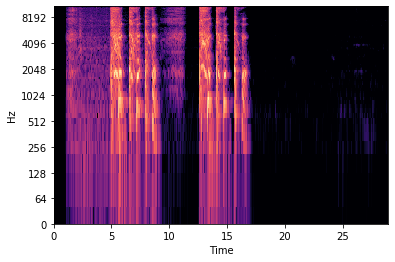

In [185]:
plot.spectrogram(soundobj,'log_melspec')
tmp=soundobj.data.bark_spectrogram()

In [233]:
process_wavs=True

if(process_wavs):

    os.chdir(DATA_DIR)
    directory_txt = DATA_DIR + "/*.wav"
    ctr=0
    nfiles=len(glob.glob(directory_txt))
    
    for path in glob.glob(directory_txt):
        ctr=ctr+1
        print(str(ctr) + ' of ' + str(nfiles))
        filename = Path(path)  
        tmpfile = save_folder_spec + filename.stem + '.img'
        print(filename)
        if not os.path.exists(tmpfile):
            soundobj=Recording(path)
            Features=FeatureExtraction(soundobj,['log_melspec'])
            tmpfile = save_folder_spec + filename.stem + '.img'          
            img_df = pd.DataFrame(Features.log_melspec)
            img_df.to_csv(tmpfile)



1 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/52eec43b-abb7-4e33-b9be-01acaf4646ed.wav
2 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/14fb399a-c792-43e2-b852-0e776f8a34a5.wav
3 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d48cf075-83fd-4c6e-babe-2395496c9d7c.wav
4 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6245dcb7-7f26-4bc2-bd6b-9f771f779e3d.wav
5 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f6f200ac-c7e9-446c-9c4d-9a4e66fe8738.wav
6 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8710b0f6-3127-4aa4-9d07-c741512eb6e8.wav
7 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ccdfd92d-e6f1-42ce-8781-ff6d04f7f628.wav
8 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0b467189-

153 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ea4c9a26-2674-4457-9a34-bd056b316fd4.wav
154 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9420ecc1-e1b4-49e8-ba65-d13c16da1142.wav
155 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/349a76bc-8788-48d4-9002-800438fea54b.wav
156 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2457c496-0a45-4c4c-942f-5598c39c9b89.wav
157 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f6f48756-5f12-43d3-9dc7-67b7ea7e35be.wav
158 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a52676cd-3bf2-465e-88c9-fae9a0144809.wav
159 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9e420c4d-b543-4818-93ae-b587892050df.wav
160 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-d

216 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5509e02c-fc29-4c43-8819-6df246698868.wav
217 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2a3d201f-7c70-449c-adc5-50de728fccd0.wav
218 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aa7474bf-3135-4618-bd76-ecc02530731e.wav
219 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0719412c-8d8c-439d-9f89-cc21409594c1.wav
220 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6ecf3573-31de-4dc5-93d8-cbb5f0c330d2.wav
221 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b50c2fe3-345a-455c-8d50-fbda3d1e8476.wav
222 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1737fd6e-aa59-485f-a836-138c0320078a.wav
223 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-d

279 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5259a449-ede1-4945-b0e8-3552eae35add.wav
280 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/01b07c48-d17a-45e2-90b0-d99dbbd0c4b9.wav
281 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a169d3ae-4669-447d-bda5-2a12801d0c30.wav
282 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3ffd76f2-898e-4b36-b3d9-b5b5cc67c57f.wav
283 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/33023b5d-a792-461a-8e86-12f34afc273e.wav
284 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fcc64ceb-c71f-4c5a-ab61-48c02766b271.wav
285 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/caa88bed-82ac-4674-9c9f-6d151034bbd2.wav
286 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-d

342 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/139f436a-d29a-4e60-9902-674e33d62c28.wav
343 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f108002b-2efd-4c09-abb2-81cc71d60648.wav
344 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/67d5f122-87cc-4efa-9e68-247106a9b025.wav
345 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ddf94bd5-4585-40c9-9ea8-7fe8c34dfcdf.wav
346 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aa129669-eb05-4e74-941f-bf9fa4e9fd81.wav
347 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/809461bc-fb60-4961-927e-3593e5c00739.wav
348 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aeeb1d92-98ee-4310-bce5-50b3e52e66b6.wav
349 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-d

405 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/42afbdf4-0d16-4be6-909d-3bda0776ca5d.wav
406 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f74039f3-f499-4756-83d2-7f88251459e2.wav
407 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d5e9a1af-2571-40f7-99c7-77cfe71657c5.wav
408 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e777e0d2-3800-465a-b1a1-2c1f481af170.wav
409 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0dd11c18-9d32-4c8c-96a6-383a083e812a.wav
410 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ceb00a88-f408-4537-b453-9b777f74c376.wav
411 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/754f4e01-2ca8-4e6c-adb3-6cf6ae2bfc44.wav
412 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-d

468 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4f18b42d-74df-4d34-b150-6bd8af802d39.wav
469 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7e8bfabe-ab2f-4509-abcd-d34e033eed3d.wav
470 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7bca3dfd-f297-45de-bddc-a35e8e4139b8.wav
471 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2a15de51-0945-4bf4-857d-f2a04c3043fc.wav
472 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1601f875-3ce7-4dd7-9cbe-281935f0520c.wav
473 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e4cc17d2-96bf-4a5f-87c2-c0cfe6c3e15d.wav
474 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d0942e00-e7e3-4f03-a8e4-1d5c8e591e92.wav
475 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-d

531 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e1ba228f-443e-4c50-a5b9-bd8515441ab7.wav
532 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/440a11e3-cc36-40f9-b7f0-d760ad1c66f9.wav
533 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4f302984-200d-4804-ad93-2d4c7ab803f6.wav
534 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a3cd42a7-0052-401d-bac4-fa546c103e6d.wav
535 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dd38a5f3-6ae1-428b-807e-c01a132b5093.wav
536 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f523fb13-a553-45ed-bc3d-1aa331ac228e.wav
537 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8944d8f3-8628-41b9-bc75-199f53de01c8.wav
538 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-d

594 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f2ca5ea8-f1ec-4075-a7d9-e24ef5e6e362.wav
595 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/12d42398-0ebc-4c49-9025-3651c278b0a4.wav
596 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bfb7d83b-2c5e-49cc-89b8-c21bed052439.wav
597 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/653ede37-955a-40a0-a68d-b78746997864.wav
598 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/17afe6e3-695b-48f2-947a-02919220af55.wav
599 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e27d0acd-a070-434b-8ecd-19415fe58f80.wav
600 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/794125ae-8d6b-4476-8dd1-2e23cb5ec2b1.wav
601 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-d

657 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/526d9ccb-cda9-41f6-9316-2223153087ec.wav
658 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3cca054f-0f92-4af0-b7b9-e8adfe5ba720.wav
659 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/34b05d24-fae5-4117-939d-b42f2007512a.wav
660 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a0750113-5c22-4e39-b306-2c79a0b5f666.wav
661 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fee76448-7da9-4a35-8c30-162be74dfc04.wav
662 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8cafa39d-2026-4e74-a83e-c055fe11a894.wav
663 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3b48342a-56d9-46d0-b74b-f3558dc54a65.wav
664 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-d

720 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a87c3fa6-5874-4a25-bbe5-e390286eb87d.wav
721 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d9608ac9-dd9a-4d60-8436-2119f578200f.wav
722 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e65e935b-c799-4013-b824-34ff2be8d05a.wav
723 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/56976d77-b87d-47f8-8070-499c9deeefc4.wav
724 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8384cf91-4c20-4122-9a82-472038aaa368.wav
725 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c1a6d611-6b63-45b3-991b-fd674cc963f0.wav
726 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/59632943-c1ba-4375-b4f5-9fd6614d9653.wav
727 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-d

783 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/669f42a2-9898-47b7-80e8-cf06deec8b01.wav
784 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c4198cc9-ce73-41ce-9fc8-a38ca9315195.wav
785 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/75eb2f40-43a6-4ef2-8492-2f5f9a95d1e1.wav
786 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cd5eabc4-b6c8-4aa8-bcf7-6d276e4d85da.wav
787 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/de9275e0-1718-4e0a-9438-932f787b2d71.wav
788 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2fdb798a-023e-46d3-965b-07ee18c61391.wav
789 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7c72c0d3-3020-4810-b211-b9b273af0599.wav
790 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-d

847 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/804bcf90-0fd4-440d-9e7e-d6eede59e290.wav
848 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/79267c13-6d11-4781-a554-2606b25c9f45.wav
849 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/94cefab8-6d46-41c3-908e-59553106ad03.wav
850 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/84e75577-b1f3-4ae2-bca8-5851f421b03f.wav
851 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/43064dbd-7575-4033-a310-267cb0969d05.wav
852 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/130d4188-fde6-457c-a562-531c3376b78b.wav
853 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c60f5927-71d6-45ef-9bfe-80ffaa957d52.wav
854 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-d

911 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5272842e-11d3-4d27-952d-91e8003acb6f.wav
912 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ec73be80-250b-4978-95e8-bbd0ff318561.wav
913 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3e48204b-68bb-4f8c-ae57-97fe142841db.wav
914 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2475c1bf-a7cb-442b-ba22-e45a4278c699.wav
915 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0abc55f4-83bb-4284-87d2-65044bf06200.wav
916 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/111f8751-7ac6-4d75-be1f-5cbed6e77d7c.wav
917 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b95fa991-fdb7-4e67-a234-3af7dc0af794.wav
918 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-d

974 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/56b702d7-2d51-4ed3-b2de-327438d9bdc5.wav
975 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dc418cde-e9ec-477a-ada6-d650bd8b20bd.wav
976 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2554663e-c6e3-42a8-87c1-0779d7329c76.wav
977 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5f8f24de-db47-4180-88ea-f10264e876cf.wav
978 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8b3402f3-b003-49c8-a5d9-b1713e8c1b8b.wav
979 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8363e3dc-f409-4152-aa9f-da6d01c54eb9.wav
980 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4f34ba48-d3db-4980-b3ce-0d3c3373d736.wav
981 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-d

1038 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4349d8f0-9f63-45f6-abdd-148f6168dcd8.wav
1039 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/62307b98-5a0d-47a1-bfcd-529ec97ef93d.wav
1040 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e49774be-c910-4e9d-9df8-c41b12f742fe.wav
1041 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a4c22313-1b0b-4e35-96cc-0373780c2297.wav
1042 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/081c1de4-5154-4134-9a1a-eef753eafe23.wav
1043 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e0ea2576-86af-43bc-b527-c368d0a74d9a.wav
1044 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1ac42cd6-7549-4e25-9990-8477e00544e7.wav
1045 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

1101 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/35f6d296-ced4-4d3d-ae82-a2ee7ec82b29.wav
1102 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7234b112-4ea3-43ab-89ad-c1fd9aa33a3b.wav
1103 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c1258979-ef7c-4bde-a8ec-d08242fbd1a5.wav
1104 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1328161d-dd5a-4d91-a182-519312e79ab8.wav
1105 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5917d68a-3e0f-4db2-ad5a-29d195870a25.wav
1106 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e1bb355c-4c0d-41c4-9360-9b9139363d12.wav
1107 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fbe0eeb1-a53c-4a99-8f03-6b270c117e9f.wav
1108 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

1164 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b1d67c4c-aab4-431f-9157-73fa770a920e.wav
1165 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/33053fa7-3f1d-4f09-9272-0bc107488681.wav
1166 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ad60bff6-13e7-40c3-83e1-aa748804f7d1.wav
1167 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fbdb6d24-567b-493e-aad6-4071001734a1.wav
1168 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8b1e82ca-3698-4749-979b-ea2a7c7e3422.wav
1169 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/edc1abf2-d0ab-4a8e-a189-d1891fb4a912.wav
1170 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/deca9f96-463f-4198-baf0-19c42446ec19.wav
1171 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

1227 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/059091a7-891b-4439-a585-be8774d0d5b3.wav
1228 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5c5864ca-809d-41ca-8256-469c893f01a6.wav
1229 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d0b79ea2-290a-4cbe-998c-fbf37bb13f1c.wav
1230 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0e3116dc-1274-462a-ac7f-f9e0aab232a2.wav
1231 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/70633180-6bc5-45df-ac75-08f0039f5655.wav
1232 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fc6030f5-1f76-4795-98b5-74d70a03f1e0.wav
1233 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/57e221a4-9e3b-498c-9a53-71fc28a90cff.wav
1234 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

1290 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bc4e6db2-e3ab-4a08-afc1-d5bd8abe8cb6.wav
1291 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c9d9952d-990b-4e8a-b34f-323d5b485fb3.wav
1292 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/233c9d03-7ad3-4757-b89e-ef45e1c3fd6a.wav
1293 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0f3995d6-07c4-49ed-9e95-695a3801602c.wav
1294 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f966a79e-726e-496a-83a8-d6d6312e6c24.wav
1295 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d130f2b2-295e-49b9-b050-365da98a42ed.wav
1296 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c045e0f3-e63c-4a19-990a-fdb18fe149a3.wav
1297 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

1353 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/97da1c1c-969a-45a0-92e2-b4a1b545cfbe.wav
1354 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b5880de4-b63e-4b27-9a51-35a5a6667af3.wav
1355 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/87c4139e-adb6-4f68-a271-a66b078cac63.wav
1356 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fd2c11e4-8f1e-4c23-9d95-3e51b3d86104.wav
1357 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/11318dd5-ad28-444d-ba3f-6f01a2e2bcfd.wav
1358 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b9433c0d-8294-45ae-9f36-38426bb293e3.wav
1359 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ae844488-040c-448a-9026-211b2f73bdfc.wav
1360 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

1416 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/12e55d9e-8f11-4342-9052-39aa358eb32e.wav
1417 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a9e1acf9-2d84-4875-b011-c58d6b846b49.wav
1418 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/76a89531-0406-4769-95ea-9ecb6c10e45c.wav
1419 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bd2b150a-3d2c-4b2b-8a24-00a5866ca239.wav
1420 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8a3058b7-c1ec-43d8-ae17-f1c72da07a21.wav
1421 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a6a40b06-477c-4791-a890-290e30a24b9a.wav
1422 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f6fff9ad-86e1-4310-b956-dc6ed9208da8.wav
1423 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

1479 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b5ff2e24-f6a8-454b-8163-80d26b5600cf.wav
1480 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a6b8389e-c098-4dc5-8b1a-d6b63e821bca.wav
1481 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/038835bc-5c44-4192-a213-5d56343b1626.wav
1482 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/09f30522-004a-41db-9971-efd1aec2ee89.wav
1483 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/94438c78-da09-4437-9a60-ce2224e2f438.wav
1484 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1bd7f149-133f-4c77-889b-15343bac6a2c.wav
1485 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/06472bb6-6fd2-4209-834a-942c32aefdd5.wav
1486 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

1542 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5e958b8c-46c4-4eb0-88a4-b6a99c01fa77.wav
1543 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2e430db6-3d78-4b46-94d9-caec3786ab35.wav
1544 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cd2ee4d5-cd25-420f-939b-d1732400861c.wav
1545 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/30fee754-9e9d-4113-ba50-d18e382d3200.wav
1546 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/24d438f4-82ba-4bdd-9411-0a7360b0de5b.wav
1547 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e3653d0a-687e-4e20-9087-ab85081ba25d.wav
1548 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/135e55a6-abaa-40b5-9d40-632e5636eb53.wav
1549 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

1605 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ad19a44f-e512-46ec-980a-2eead07d68c1.wav
1606 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f3180544-50e4-41eb-be03-80db35bc7d57.wav
1607 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9612bc84-7714-486f-8042-a7a09f08af22.wav
1608 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7dc6b0de-372a-4015-b956-0eec38c4b51d.wav
1609 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fb6cebad-2a44-421a-a134-8b5a9d3b31af.wav
1610 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/07a7a81c-dda7-4b5c-8175-c20580dda9b9.wav
1611 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9fd3201f-9a4c-465f-b673-a50cc25aaaac.wav
1612 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

1668 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4b9e7767-8c0f-4027-bdae-7d1fb5d91c4c.wav
1669 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8d89b7e8-0680-48e7-bc07-dfdf76c85cfc.wav
1670 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1fd7ae1e-8f05-4ad3-9796-8bc7c10fc9c7.wav
1671 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d94d9646-3aa9-4ee7-9924-3c901fecf103.wav
1672 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c14f5508-b4ec-4bfa-b595-a67ac96934b5.wav
1673 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4525895d-7c83-4a1f-89ad-379fcb05251b.wav
1674 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aed55fce-3c9d-4855-b219-d40b7c3f8989.wav
1675 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

1731 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ddcc3c02-4d36-46b7-b303-b41a6c8223de.wav
1732 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5126525a-ecaa-4dfc-bde4-84ebca8f6e6d.wav
1733 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c5b63934-43ac-4aec-a886-9f349ba66144.wav
1734 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0ecdc99a-e9af-400e-8822-764d4aeed0dc.wav
1735 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1a0a1dad-7f78-4ec1-aaad-203f5ae46991.wav
1736 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d4084a8b-c483-4c15-8acf-f0b035e6d431.wav
1737 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/950a6962-4e33-456c-96f6-16a952b78672.wav
1738 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

1795 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/800baf89-e68b-4022-bf75-3897b3740f64.wav
1796 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f5cc7bb5-e55f-4dab-81e1-bff5a3bcd4af.wav
1797 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e3e42e5d-89a7-4162-8827-7ac59144f759.wav
1798 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ef934df0-ffdc-4e63-b632-0d113ac5619e.wav
1799 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fe7d1bab-f38c-44d7-910c-142ebe80c289.wav
1800 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0cf6fc08-c576-4393-942c-9ca0c301deb0.wav
1801 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dddb1a55-d976-40bc-ad41-cdc713623e03.wav
1802 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

1858 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/32ded9da-f338-4a59-a69f-971b4412ab31.wav
1859 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/13afbcb8-f571-4223-b557-4c0ff7ea71f8.wav
1860 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a788b44b-fd82-4a7d-be2e-e10e0ffc1123.wav
1861 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e9e591a0-eca8-4ee1-b24f-0a2007519bbd.wav
1862 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8aa580a5-5e45-432e-b89e-297e30e1048c.wav
1863 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a937673c-2f44-480e-8ca6-0d6c903f5d95.wav
1864 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4fbc2231-0303-46b5-abd1-fa67f0314b16.wav
1865 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

1921 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b693ea2e-0da4-432c-9df4-376a3359462e.wav
1922 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0ccdbd88-cc81-4178-8c97-3ccfa2752fcb.wav
1923 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/82d11b5c-d4d3-4ac5-b47d-83cd5d66c665.wav
1924 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7cb2b0f2-5687-46d4-bdc6-20aa9d0a9648.wav
1925 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7a7761ab-0308-4f20-bccb-9ed63706728a.wav
1926 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/984970ee-3fb1-4fbe-9ab8-56ef75ebe67a.wav
1927 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3a7087b0-5bae-4de8-84bc-d7de139a72f0.wav
1928 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

1984 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7d3c45f8-6ca0-4a2a-812a-48d60547dd9d.wav
1985 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/182246b0-9f77-4c40-976e-3c9342619819.wav
1986 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eab2ae4c-0531-4adb-a5d6-4d5059c8082b.wav
1987 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/30055998-9543-421c-a837-cc7e95a593b6.wav
1988 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8be589c2-c09a-442d-a0a0-50094a73f0d5.wav
1989 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/762864e0-bd3c-44d0-9d86-035df946b52e.wav
1990 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4a64024e-ba46-4ed8-bb2e-135e2c3a8d4e.wav
1991 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

2047 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/96eb5eed-adff-4c9e-91d3-955e1c41b882.wav
2048 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/15f541bd-df87-4250-bda7-be1377354d7f.wav
2049 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/327cafbe-2e03-4788-b098-ee4a5a7c3c6e.wav
2050 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/68e6b065-6456-4656-801e-5738fb466821.wav
2051 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bd71622e-1728-4059-8caf-9edbe6f25541.wav
2052 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/05a98293-2ff3-4d00-b79f-ad49ba5b64f1.wav
2053 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f855506a-6676-49c9-a166-2b6617fdbcb4.wav
2054 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

2110 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/52364a57-9dda-43ad-845e-d891307a16f3.wav
2111 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/46672eab-a432-46cf-8f85-abad9abc68a4.wav
2112 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7307a4e9-2a7e-4214-90a3-00dca6262271.wav
2113 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/59f018ff-7917-4b0c-a594-cec572d46899.wav
2114 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/86c3fa35-c4e2-4c95-912a-2cd604a1921a.wav
2115 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ce9693c4-3f39-49d6-84a4-4fc7d7e77873.wav
2116 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/884d4961-d188-48f6-ba71-6f79173a5684.wav
2117 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

2173 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6f83e468-bfb3-4599-bb37-41231d105e01.wav
2174 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b0cb89ec-3225-41c5-b6da-57dc616a18c9.wav
2175 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5e61de24-a0c5-4819-bf5e-8687a33f0e4e.wav
2176 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a8e762b5-2735-4f49-9448-ab18d476fc1e.wav
2177 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/61a73514-d8de-40cb-90be-69d5944e1f42.wav
2178 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d08fe937-0060-4dc7-9878-ba9975b6c62c.wav
2179 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2219ffe7-dede-466d-9b87-9adca95b8b0a.wav
2180 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

2236 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7e3ffbd3-1b3e-4db8-9a50-c2c56016259a.wav
2237 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fbf06309-8a4b-4b1b-b9e1-302c48196d4e.wav
2238 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f236c327-4279-4f77-b25a-eed6afbe03b0.wav
2239 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1aa3764d-04c2-44df-9469-75dde79f505f.wav
2240 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b2120660-071a-4bbb-ba7f-851dea0077cd.wav
2241 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/de6415d9-10af-4cf8-8584-6b803571f3a6.wav
2242 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d1a1d2d7-54ad-4045-9572-283aff5650ae.wav
2243 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

2299 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3c1efb88-ebba-4dd6-8fb7-ac1fb6e78abb.wav
2300 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f8b96f3f-b1a3-47cf-8f76-8885acbf7369.wav
2301 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4083bf9d-8718-4b86-b1ae-cc51abc6dddd.wav
2302 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1b97feec-f6ee-42d9-bc13-5a0264d9a1ed.wav
2303 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c27d2dec-437d-46bd-b56e-90bc5774e856.wav
2304 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2f7f0c1b-782b-4b90-9f0b-ed60edfeab89.wav
2305 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e0e6490b-1e93-40b9-a45f-5f0e66743519.wav
2306 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

2362 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9ff2b1b5-a2e1-40c4-bb1f-61c182f6d3b3.wav
2363 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8ea5b36d-2f4e-4acd-a01a-1811e3081916.wav
2364 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c55c80cd-16cd-46ba-9da5-36165ba36c81.wav
2365 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8b9ee33d-4fad-4519-a202-c6e4fedac9ab.wav
2366 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7a17ecc2-83e1-40cb-8d7f-795fbeff96d8.wav
2367 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3ff43595-47b8-4b6e-bca0-8438fe38f293.wav
2368 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1e3c046d-82f7-445e-b6c3-06441f3da506.wav
2369 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

2425 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bc849f71-d36c-44e0-8ca0-0c93c6484ecd.wav
2426 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/facd6866-65de-4143-8799-283689239e6c.wav
2427 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c449e5e4-0093-4819-b3aa-3f17f30127ce.wav
2428 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/818548ca-0eef-46c6-bfc8-f83b65315d7d.wav
2429 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/488a34b3-d293-4d30-b302-5d3aa2636e52.wav
2430 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bdec957a-5b56-4977-8490-c9dec74c1f48.wav
2431 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/615efd49-fa08-40dd-a61a-2c9f0924d0c5.wav
2432 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

2488 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8b801b87-996d-40c3-834f-04f368247747.wav
2489 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a07b4f39-1720-4a85-84ed-4bf74ae59cf8.wav
2490 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d39704d7-db01-4046-bcfa-62cca4e4a2df.wav
2491 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/20d4848f-9d15-431a-8dac-5f7ee2a8de01.wav
2492 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bbdda1b7-44f1-46b4-b863-cec2b64f0bf6.wav
2493 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/48df242d-e4fc-4896-ab45-dfe3f969eac2.wav
2494 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b3e0dc79-0457-4a79-83ce-810e36215ffd.wav
2495 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

2551 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/36f9e1cc-e89b-4193-87ee-f2b0b8cab683.wav
2552 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4ebe9082-4ffc-4347-952f-107b9940bb53.wav
2553 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5ac1a9c3-b135-4589-95dc-cf2a222265f8.wav
2554 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/669f8a24-1895-40c1-96f9-f428e9d0f49d.wav
2555 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/379feec2-f690-4fe0-8cf3-0113c0821b30.wav
2556 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a6c4e736-ab4d-4b57-8612-0dd8c796a2e9.wav
2557 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/83ed8cad-daf7-42ec-a016-1bdf1a98894c.wav
2558 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

2614 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eb220fd0-2604-48b8-965f-1f7609930331.wav
2615 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f000e7e8-3cfe-45e7-8d7b-0ac2876ed045.wav
2616 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a1649d0e-07db-4ef5-8d58-6dfab8ca6969.wav
2617 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/14a3c119-bee8-435a-9193-d2ce7cb84a03.wav
2618 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d1ebf610-37b2-4ca4-aabc-a3df8ccf9897.wav
2619 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e12be894-f2c5-4b25-9b08-5994daa4d0db.wav
2620 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d403f987-3a58-4f6b-8172-ccc10631e6cd.wav
2621 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

2677 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4826aefa-770e-4389-8967-c902a5abbdc6.wav
2678 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bfe39f99-20e1-471d-a6c0-e82effbba33a.wav
2679 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c7e58fe2-2e65-4d6b-a077-b3223d4cf532.wav
2680 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/43c56248-ea3b-4615-92b0-7775c3c72457.wav
2681 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c90b2091-2c33-4e72-86a7-f1521e184580.wav
2682 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1b98dd46-b9d9-4bef-b7b8-3d5d0aadd04e.wav
2683 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/10b2b03b-195e-40c1-8a62-e730aefa757c.wav
2684 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

2740 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/83c8f828-a825-4590-9ecc-bd28004f73e0.wav
2741 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d6fad51d-5893-44e5-b732-d43828c86920.wav
2742 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d73bcdcb-17a8-4102-91c4-4afbefd08ea7.wav
2743 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/94bdd23f-1788-4a1b-af89-fe31f82a336b.wav
2744 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cf97b7f8-de05-47f8-8a3c-d3ec1672d25f.wav
2745 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7397cb02-35d1-44fb-a777-848c447435e0.wav
2746 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/33957d4a-4d2b-4017-94d7-04c578198a06.wav
2747 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

2803 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7382a3e9-33ad-4c9f-9810-480238262b65.wav
2804 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/51c98d12-2b9a-465f-9db6-b689b7acfc36.wav
2805 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/afcee07a-d243-471c-9b4c-e901e347bb36.wav
2806 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5f6ceb57-d302-4407-beb0-bcc224c2ae47.wav
2807 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/76c85763-b42c-48ca-8b31-c63c7de2a904.wav
2808 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/58970bd3-2993-4762-8b21-0c5a2937c16b.wav
2809 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/92f53d25-56af-4f1f-b75e-5f7ddd931739.wav
2810 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

2866 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/621bff5e-5286-4586-afcb-525620d733b8.wav
2867 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b694b349-6315-4150-ae47-c1a45103ab28.wav
2868 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/950e15ba-ac25-49cd-8b26-4c4b8a0a2737.wav
2869 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/454b15ba-5409-4b98-8c53-38d0c3943783.wav
2870 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/30b9a320-705b-452a-9ff9-daa6f5639085.wav
2871 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/66dfeac2-484d-4b0f-8afe-b2cb52027970.wav
2872 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/471cc586-d5fb-4035-9183-5b312390be70.wav
2873 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

2929 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6014b484-2b85-4dd3-a9bd-2402ff34667b.wav
2930 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/01ea827e-3e22-41a1-9c66-8d083a6398dc.wav
2931 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0f90851c-63cc-4fe1-872d-1b7aea06b533.wav
2932 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/80a05566-ac42-4c5c-82a5-4e21cb3ed772.wav
2933 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f2dc0e61-75cc-49c4-897e-0cbba2cf50f5.wav
2934 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1f292253-394e-4fd1-b43e-81289c1f1832.wav
2935 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0efd6599-35bc-4084-9d38-12734d7ad16f.wav
2936 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

2992 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a0a4317d-b068-4b3f-969b-a7a655555740.wav
2993 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eef01896-b0bf-42c9-8397-a3057b4a74bd.wav
2994 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ecddf9a3-b388-437a-bc4f-1c9d2bfc7e7e.wav
2995 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c0c08c2b-8106-4b57-aee4-551f288a9623.wav
2996 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dd18fdff-8792-4284-9a59-6988cbadf193.wav
2997 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b4b7f4b3-08b4-46ad-a39f-ff4e5b029520.wav
2998 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/09e8c5e0-604a-4f37-b8ba-3ba3a9dfa3c9.wav
2999 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

3055 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e9d87c08-e03f-4966-a18d-f5ae8250901e.wav
3056 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/72af1dd5-618e-47f2-a11f-f3a61d9b396f.wav
3057 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/02937337-8cfd-4e41-ab8d-918630586e58.wav
3058 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9dc4f56a-16d1-4a62-ba4c-e3a8a5fb9931.wav
3059 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7aee2bec-406d-4330-8925-ae66ad403d9a.wav
3060 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0ded71d7-8cd0-4a7a-9ec5-00316f088be5.wav
3061 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a2f67e3d-47c2-4680-a09d-5355a3f99276.wav
3062 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

3119 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cc3ce43b-b919-4fd7-9d3a-f5a04a5a055f.wav
3120 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/678e269e-4340-4b56-ab4f-8b5240535463.wav
3121 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1188b399-f254-402b-82d6-61d2ddd743a8.wav
3122 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3639acc6-0471-41f7-bcab-f6099fb3e482.wav
3123 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/28c08126-f32e-4337-b4b1-cba26602f185.wav
3124 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d060bfbb-cfd2-40f2-b9f4-c603868e7c28.wav
3125 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ef8985bc-db5c-4afd-b555-6bdecc933afa.wav
3126 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

3182 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/35e9d0da-b594-4797-af9a-38ecfe521131.wav
3183 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/635e31af-c740-4a0a-a014-cf0cc8d337f4.wav
3184 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6601b775-f974-47ae-84a8-241f1ad4169a.wav
3185 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/029685b5-d06b-44ea-9ad9-6f6134438c67.wav
3186 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/38917c96-274b-4493-b944-2c22bfc098b2.wav
3187 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aadcccba-14a8-4dcf-80ab-faaa3d19c677.wav
3188 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cde35f52-8719-45da-80e0-ebeb1308f8d4.wav
3189 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

3245 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4288651e-e936-4131-9f66-6c22f867e9f6.wav
3246 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5f58d52c-cba3-4f98-83f8-6769aa5bb1a0.wav
3247 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bad91907-7528-4436-8b55-d08ede15e2f8.wav
3248 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4942fde3-6db4-472e-9e8b-8715c1ec1e3f.wav
3249 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/16fb3444-5f71-4c5a-9e47-2e3dbf4f9450.wav
3250 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c261cdbc-fb1e-4444-8b68-33c920047d8c.wav
3251 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5d8b4229-65ca-4103-b47f-8fe0597366ca.wav
3252 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

3308 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/71d5ca38-3d04-4318-9738-cfd62a8173ae.wav
3309 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/10b5103d-1226-49de-a7e8-43f25f8e1803.wav
3310 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0aa7fe21-1eb3-4929-8d6e-1e6fc932dd1c.wav
3311 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6b403063-c849-4035-b78e-37b840fe27ee.wav
3312 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/43ec41c8-e667-42e8-8018-167b6a2c9b98.wav
3313 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f0779eae-b4fd-4f7d-af01-79dd110d90d6.wav
3314 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/475412b9-ac1f-40ab-a5b8-c32e7f94847a.wav
3315 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

3372 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cfcd9520-693f-4f6e-88e5-d1d25faeefa3.wav
3373 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/065f241f-6db2-4cbb-9f3e-107230272e10.wav
3374 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a51cd531-be05-4e51-ac83-183d9cc3a62d.wav
3375 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/56713044-1c71-4288-ba5f-fe50e0f15bf0.wav
3376 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fa3bb6f5-9f4b-4c80-b836-8d2c2995c64e.wav
3377 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/640e7d2c-c198-444c-b3b4-fa5df0c4ca19.wav
3378 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/17022b71-56b2-403e-9da9-097810159d4a.wav
3379 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

3435 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6690d3fa-2cbd-4253-b060-01d86cc7c4f8.wav
3436 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4f9577e6-4924-446a-8079-ec17501f8e55.wav
3437 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ad0faa70-d919-4852-b0aa-d2654d9881a1.wav
3438 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cb71869e-a2a5-4684-8dcb-9fe3c7718715.wav
3439 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1aa05e4e-d1bb-41e7-a157-1cc0ba7de462.wav
3440 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a9bcd6f5-164b-463a-8256-6c0e27544170.wav
3441 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ffa13cb9-4944-4f21-8381-701a1bd84315.wav
3442 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

3498 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7e04168a-ee8e-4a46-9e1a-5ce7d66ddc95.wav
3499 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/371b1c44-23d4-4f08-a537-7ee833b96286.wav
3500 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7def798e-7277-4d80-9d46-8e9926aa34bb.wav
3501 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b065c0ed-27bc-42ac-96be-f01c450c9e77.wav
3502 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e70fbf9f-3dcb-4040-810e-dcf4c8685743.wav
3503 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1e5944a9-49aa-46aa-8066-dd6cc82c9e28.wav
3504 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/54e937f6-0e0f-40d2-b58b-157b0f5dae26.wav
3505 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

3561 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/731cbe07-5754-46cf-bb5c-873a670cd5d7.wav
3562 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1b9c157d-518f-4ee9-8eb2-e25c5c60573c.wav
3563 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cd256a51-711e-4872-a5a9-a50798b5ff4d.wav
3564 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c6596572-5a33-4807-9e66-739f3d222675.wav
3565 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cfec0be5-fb82-492f-ace3-1106214c00f5.wav
3566 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8bb390a1-cc7b-4767-aa8f-9ff2febf5281.wav
3567 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b6cab2e1-4f1c-47e7-91e0-97fb9118d890.wav
3568 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

3624 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/31053d96-f230-448d-ae8e-688d961c35fb.wav
3625 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/41990422-f8ee-4965-9908-4f860b370ed0.wav
3626 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0d3712f1-c7dd-4382-bd80-153c914e2ccf.wav
3627 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3e2193d0-a1b4-4697-8b8c-69fa4d62afcc.wav
3628 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7c3db21f-cc42-41d3-8789-e455ddddb577.wav
3629 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/60761aec-68c3-4323-9bba-adba20b9bed5.wav
3630 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3df5819e-085d-4a26-b8b3-63978864b4c5.wav
3631 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

3687 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d3a4293d-a975-44d2-b030-c3557f40fb18.wav
3688 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f880ef41-35f5-4ddc-9c48-c4e6e76dc154.wav
3689 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/65f54685-b9cb-41d5-b7ff-dd7f8c47356c.wav
3690 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0a97ab37-81b4-4cfe-ba54-e88a7e579d72.wav
3691 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9bfb4af9-3893-48fd-8ba3-84d39bd839d5.wav
3692 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/053af9b8-aea0-4496-9db0-d28f7531ede8.wav
3693 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9748463f-3e02-4a8e-baa1-7e9906aa19d8.wav
3694 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

3750 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b4248ea2-2fba-40d1-ba66-b00e119e668a.wav
3751 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2e9c81b8-a17d-4454-93ab-0c3538fac866.wav
3752 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/03bc7116-7785-40fc-9217-b273b1803bad.wav
3753 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f74959ce-b9a4-42eb-bfed-c568b5a8bc9e.wav
3754 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f67af5d7-0e7a-4acd-b85b-16616d0c0d11.wav
3755 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/355b8cc3-9f98-466d-92f2-605397814d6b.wav
3756 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/37ff4a85-56eb-459f-8732-01c5db439b28.wav
3757 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

3813 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5fd93d38-c7aa-49db-bedb-f6913fcbb829.wav
3814 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e6e247f6-2e96-4a5b-b54e-7f92e208b743.wav
3815 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b30250e8-57d0-4752-8e24-a14f42ce7b3f.wav
3816 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b91c6425-3d05-4a89-a13b-48e597dc284e.wav
3817 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/04f247f1-6167-4bdf-a3ba-0428a5ed07d4.wav
3818 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c3ec0021-a87d-4fc9-b3fd-db3747cc89af.wav
3819 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b66ea1a8-a46f-4890-8b1f-91c5841bfc99.wav
3820 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

3876 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a1770732-cd98-4518-860d-b4e46365ab5a.wav
3877 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1e9de09f-dd16-4e11-a238-4de2536dfa6d.wav
3878 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b21093d9-1a78-44b1-bfa0-7f8cbdfbe9d1.wav
3879 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/84c0d0ae-c942-48b1-bebf-2cc472480302.wav
3880 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ce8a2e1c-43fc-45d9-9a72-1430d4330009.wav
3881 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0ed9987f-9a71-4bf2-b8f9-5e787f559ae7.wav
3882 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7541a359-309b-4c65-b569-3d081a7126d0.wav
3883 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

3940 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c33ec852-dbc1-444a-ad17-f0cf49cbb2a5.wav
3941 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ae6d1d60-35cd-4151-9b2a-b6c2562d5f06.wav
3942 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d41862aa-02cc-485f-98cf-11a9196e74d2.wav
3943 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/243c4aaf-d1de-4c02-91ce-1877b837bc10.wav
3944 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b9d3b2fe-9464-41bb-a514-6f59af1e7d03.wav
3945 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dcec3a9f-d633-4462-94b9-dde675a0ba5f.wav
3946 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e3c3361e-186a-4244-8e04-970916211a06.wav
3947 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

4003 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6929ae26-7b44-4877-9489-acc693dc9b80.wav
4004 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9e1a73b4-847e-421a-85a5-8e13354ff057.wav
4005 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2b567975-582f-4195-8123-33905dbc365c.wav
4006 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/57fc6a98-f2e8-423d-a391-79a3a2483896.wav
4007 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/562f35e8-7524-4cbc-873c-0cf64380df72.wav
4008 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/510d4751-e5e0-4274-a06e-7079ec5cdd43.wav
4009 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/736f5911-0cf7-44dc-9ac9-88c5ef1edcc0.wav
4010 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

4066 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/84cb6e0a-f180-4850-a859-2f3f929742ee.wav
4067 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/60b6c987-7d81-4fbd-aba4-a649583eabf6.wav
4068 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6eb520a8-f523-4219-b260-e1d1ebf280ba.wav
4069 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3ef3d42c-cae9-4fc4-a302-89cf1e629f52.wav
4070 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7b9ae86f-4f70-4ff4-9f9b-04a590e27446.wav
4071 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4c9a4fa8-2d2f-4cb0-843c-09e679b0e598.wav
4072 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b8dad2e1-5f4e-4223-a493-59abc79c2e54.wav
4073 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

4129 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6134de43-b7dd-4955-989c-f30b195089dd.wav
4130 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aab63e20-42f6-4dbd-9827-e9a7fabb3ff1.wav
4131 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ac50590f-6d1b-46be-8c0f-a995c8af7087.wav
4132 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cca4a5ef-e2a7-40ba-b865-770cb34252b2.wav
4133 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1236a3a8-5c5c-4bad-baa5-def6bd33b226.wav
4134 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d1555515-d453-499f-be6f-2c35f060ced5.wav
4135 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5ab4d303-64be-4ea4-a65e-8681659e8e5f.wav
4136 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

4192 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f6bfb1e3-13b1-4575-ad3f-eecc0577f47c.wav
4193 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/deaddfa6-ac89-461c-ab08-c531e2a296cd.wav
4194 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/00ddf050-6939-4f33-9e54-fcb309b895ec.wav
4195 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fe8f1d19-fc6d-48af-ae81-1aea370f9b1d.wav
4196 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b61f41d5-8a12-44de-a8c7-f7ab67f35ab7.wav
4197 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ec1c43c9-5043-4735-9f66-905e47e22b48.wav
4198 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bfb6e69d-59ec-463e-b382-4051cef4c6e0.wav
4199 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

4255 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/50dac1b1-0d7e-4c8d-8677-601a4a1454f7.wav
4256 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bc3b318e-182a-45e8-a780-4af93665ee3b.wav
4257 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/faab3885-5d33-49da-bd75-fe213bd458a8.wav
4258 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9a5d3875-3ca7-45f2-bf90-23882abc2aa5.wav
4259 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ebd6f02a-90e6-4246-81de-6ae390459757.wav
4260 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/56c175ca-74f5-4e07-af6d-0bd89a7518c4.wav
4261 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7eb3c480-7be7-4784-ad0e-303fa5dbbaf7.wav
4262 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

4318 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e88932d8-8869-4fa2-b4a5-1d4a3ddce94d.wav
4319 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/18bf593e-ee9b-481c-ab7d-4fb44291c53a.wav
4320 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/745e0786-f46e-4006-91df-ead9fd24e8b1.wav
4321 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e8d05756-a27d-4d5e-a4a7-f3bcf763608e.wav
4322 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7e4ca934-62a0-4ac5-844e-16d5b8d3ab43.wav
4323 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/18320fab-de49-42f7-8d76-f8caebe05ac4.wav
4324 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bf6f1a7f-2d9a-4bbc-875f-e47aac6624dd.wav
4325 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

4381 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6647b629-2246-48c9-83ad-c3ad4795c891.wav
4382 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/363736d8-1570-442c-97fe-9af72b5e46b2.wav
4383 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7a4f5b22-cb11-4fe2-85dd-4be0e14cad6f.wav
4384 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3895df91-1041-443d-b725-ccadc1be2d40.wav
4385 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/995b8102-2c2e-4de3-b1db-ea56ca0883b8.wav
4386 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/78b7cdf5-be8f-4ad3-a2d9-74be45584be0.wav
4387 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c5f2d8fe-0173-4657-a5a6-c41bb489802a.wav
4388 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

4444 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d674483c-0d91-4e05-acd5-c4a3fc7d66ae.wav
4445 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/74b3d679-83e0-4e9c-8988-d083a044e0d1.wav
4446 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/50ff5474-a8ae-4fb9-8dc5-b8a402cf3e4d.wav
4447 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cc40f162-5a8e-47de-ab7b-c0e01ce137f9.wav
4448 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d53b7dcb-48cc-44a5-8f13-6a24421641b8.wav
4449 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6857db62-0aa5-476d-a9a9-e527b4713723.wav
4450 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4a077d16-5dfe-4d38-9545-2442ffe36fb5.wav
4451 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

4507 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e6b20a0a-424f-4d6d-b6e8-0414aa8ea990.wav
4508 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0cb72725-4166-475d-99a2-5e4e269c1eea.wav
4509 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/97aeca62-6408-42ea-acfe-784cb9b81870.wav
4510 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e56ca6b3-d187-44e0-b332-c54e21d1a42e.wav
4511 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f0885a5a-641e-489e-991b-3f5f199288dd.wav
4512 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ec4b345a-ef53-4be1-8a98-8115cd80cf72.wav
4513 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8e99fb02-7dd5-4986-a0e2-9e0d235bdb4b.wav
4514 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

4570 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7e4d10bc-a2cd-484b-a8dc-c5d0dea4f813.wav
4571 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/88cacadf-ca7f-4237-b3e4-89c9b149864b.wav
4572 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f2e1fe26-bd39-4dab-903a-98c8bab93317.wav
4573 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f76de2eb-f92d-43c8-861d-2bde8180fbe4.wav
4574 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8fb727a9-c3c9-4233-a9c9-dfc0a41516ee.wav
4575 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/04b1785d-605e-4028-b5a7-173d05c923f9.wav
4576 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5dd78350-3c5a-4b1b-a75b-c9a7799ae153.wav
4577 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

4633 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a3c59c5a-4381-4cf6-9f2b-b790534c2728.wav
4634 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0505ecdd-4c8a-4cdf-bcc8-eba88044e97b.wav
4635 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/37446cf3-0bc9-4a78-8121-0531ae5a1472.wav
4636 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c421665b-462e-4cef-97a4-681e08fb9867.wav
4637 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/804890fe-27e9-4533-af70-570db9e80154.wav
4638 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2ea9448a-d45a-4a52-84a2-e6cf46bda0e1.wav
4639 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/58a9d260-53d9-4ba6-b7d4-3e7357412426.wav
4640 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

4696 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d639e286-f05e-4278-ba23-dec1d0fac4e8.wav
4697 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/40e89f7f-2b41-4331-97db-b3f6a140d4d2.wav
4698 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dd91de30-4410-4836-a55e-ca4166110e54.wav
4699 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cbdc556e-00ac-4b49-bd4a-5ac204cd322c.wav
4700 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b9a9ef5d-675f-4fc9-ac0a-cb0dec581649.wav
4701 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c7f99195-675c-4848-9ba4-296d27262928.wav
4702 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9e872dd3-19be-4148-9a32-cb0753288339.wav
4703 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

4759 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/94f2428f-bc48-4693-9f8a-05d0f2c490ed.wav
4760 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/42b9a8d8-8e8b-4b99-aec8-6c9d4acb7468.wav
4761 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c58588e3-6940-4c80-a715-20a9df4df5eb.wav
4762 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a58896fb-dd00-46e0-a2a6-c2d25a9f13e9.wav
4763 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6ad4a27d-a92e-406e-a88f-4422fd91d174.wav
4764 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e021966a-4bc7-4f4b-8a3e-23f4089c15e7.wav
4765 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dea48fea-9054-429b-9a7e-dbe1cba10dc7.wav
4766 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

4822 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7a8ac07c-3f43-4a69-81e0-2547ada436d7.wav
4823 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/73786652-bf01-4a78-8e04-7c44a77d5108.wav
4824 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fef9babd-e4b0-4c4e-92e2-7b3a916918bd.wav
4825 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/10ac69a0-a232-4589-abae-b71d4190fcb1.wav
4826 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4f9a9aed-e003-4f28-ba40-bd05958352bc.wav
4827 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b07942e0-6c27-433f-a4df-c848f10b67ff.wav
4828 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/be61b105-27d2-451e-be22-bea152a7d2b7.wav
4829 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

4886 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/17a774b5-df9a-4c22-ba95-13743300ef08.wav
4887 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/60589e71-c70c-4d60-9b09-ba82a389e17f.wav
4888 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9bdbe6b0-c756-44cb-8995-c2823b3241cf.wav
4889 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7cc843d7-eeac-4276-9d9b-3130d03596e1.wav
4890 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e982e6ed-866e-4331-904c-b0bcff66d8bc.wav
4891 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3d810aed-03c5-4fde-966c-f2bd5922aade.wav
4892 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cb5c6410-8b55-4c33-932d-fc72e5cac22c.wav
4893 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

4949 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4fa482c1-e2c7-402f-b383-343c18be4ccd.wav
4950 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/14e59cdf-e58e-4d39-ac48-3291c31d6d68.wav
4951 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cc3c1f82-0559-4ae6-bcbd-45a61a6178b0.wav
4952 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/15fa105f-eac2-4f47-a050-b9d50cc43606.wav
4953 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a2a94e62-939f-4176-8840-2a26fb560e1b.wav
4954 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9d539eb5-62de-4d5d-994b-866238ecd96e.wav
4955 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f2746b8f-405b-4e5f-bae6-e085fe5180ee.wav
4956 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

5012 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/31ecf49c-bada-45b4-98d1-21e7905c30eb.wav
5013 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/09af186a-ae6a-45d3-a1be-bf0c97feeab4.wav
5014 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1d0eab2e-26fd-45d9-b8f5-780bfd32f0f2.wav
5015 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/23b812e5-09dc-4781-a1a1-c7696817f90b.wav
5016 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/22589939-9005-4c0d-9bcc-a6c60301b23c.wav
5017 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/033b361a-596c-4581-a84a-7fb1b09395a6.wav
5018 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a9989137-d428-4de5-9984-f93466fc9aeb.wav
5019 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

5075 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1524ba9d-116b-4980-b5a7-c894159fc8c4.wav
5076 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5f5f4027-45d4-4867-a9e2-ecc500eaf21d.wav
5077 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6273e21b-563c-46dd-8cd0-ad353463cbbb.wav
5078 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3350b879-9287-4967-96e8-06710008ce6c.wav
5079 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/30cdf853-0310-4bd4-b7fa-621a78fe372b.wav
5080 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dc09005c-ac18-4bf1-a9e0-946ea0e683a7.wav
5081 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6d94406a-8c7e-4b4f-aa43-63f58cb7854e.wav
5082 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

5138 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9676ce90-0b9a-442b-b4a2-72857cad2bca.wav
5139 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ec1bd9a5-ce99-47c6-b2c3-bd23874ed8a7.wav
5140 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6985c2ec-f7bb-4387-98b2-4a3d26e564d8.wav
5141 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d888ca07-c45e-42de-8cd7-b1fcb5dbdae3.wav
5142 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0e2624cd-e2cd-4fa9-85aa-b1aea019f0e1.wav
5143 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b627b84b-333d-42ec-ac42-3080136df93a.wav
5144 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d7c0abfa-f689-4ccd-a71e-516c528e0f8d.wav
5145 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

5201 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b65343ed-1500-493b-9672-4605a6932ef1.wav
5202 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6843ace1-aec8-44cd-9007-74ef6a2239ad.wav
5203 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5dc33ac1-3794-41d3-88b1-d958ff71c6c0.wav
5204 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/afad0212-fce2-419b-bbc7-2aaf6e16d63e.wav
5205 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/69bdb96a-4e1d-49b7-b2e1-f354d0a7c5ee.wav
5206 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a8f18589-b4a2-40c3-9abd-bf2e207f41ac.wav
5207 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e2fb35f6-13bd-4145-833d-5fcb356c7fc1.wav
5208 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

5264 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/15a76022-8c40-4cca-b0a0-58f067bcf674.wav
5265 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/03ff1a5d-8179-4af9-842f-eecf80cc2ffc.wav
5266 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b3dd887c-9af0-4165-b9e2-caa37a05d626.wav
5267 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4e41a81c-02cd-4ad9-b711-eea78c7b5792.wav
5268 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/510d4ac7-f1e2-40c5-ba27-ec2cb666a2f6.wav
5269 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fa5a2353-99a5-4b55-b33c-3075fc559a5f.wav
5270 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3207c0ba-506d-4e8f-b468-aa6930aff525.wav
5271 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

5327 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9bcf60c3-4f9d-4ae0-9eb3-b07588a3e79e.wav
5328 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/17acf0f2-d97a-4881-bb20-766e3ef20991.wav
5329 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d5f0d08f-341b-4069-92c2-883c4bf269e7.wav
5330 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b09a8fb8-6dda-44ea-acab-6d5c86ba75c7.wav
5331 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/83c69068-09ad-475e-9843-86148262c3d0.wav
5332 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5f4229f3-9ceb-4c0a-94b3-823b968a724c.wav
5333 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9353ee25-3abf-401b-9836-9fd423adfc34.wav
5334 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

5390 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5c4b21f1-e8d1-4133-9f78-76b3ef3c5f18.wav
5391 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/40edc01a-d293-4a36-8c96-038fae75c0e6.wav
5392 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0d07507b-caaf-49d2-9580-56ca0d37199d.wav
5393 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c4196dff-1327-47c5-aca3-04f99eba896b.wav
5394 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/01fefda4-7f5e-4bf3-ab0f-87ca954eee51.wav
5395 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/60861879-63e4-4cd5-a079-2f78736a41ab.wav
5396 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2d1c3ae7-140d-4836-80dd-44ff306e0fcd.wav
5397 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

5453 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/772eb4e5-cd21-4ac3-aad4-c5591c39902c.wav
5454 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/371f92e2-3f5f-4e61-8a1f-409c21351559.wav
5455 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3aea9ed7-d892-4a3d-bc9e-4f910bf1b1f1.wav
5456 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e03ca344-618b-4dce-a2c3-59dc53001005.wav
5457 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c8ee96bc-22b6-422c-bcfd-89c1ecbc666b.wav
5458 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/97146ed2-5930-48ca-be12-cf3857e21944.wav
5459 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8d33620a-f041-4c6c-b55d-78c1ac9eb8e5.wav
5460 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

5516 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/98cb45fe-a9a4-4e30-bbe1-ec974e683c4f.wav
5517 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4f62a1d1-ccba-4528-8f95-90837803e066.wav
5518 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/598989da-929e-4306-ac18-f3b1e0d408a3.wav
5519 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/42feb636-0b1b-4858-973d-37b5fa5bd33f.wav
5520 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bb0b45e8-ffcb-4367-a007-dd072c5910e3.wav
5521 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/db23f56f-b23f-46e5-b7f8-32537e8600e4.wav
5522 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5aacc33c-b2c2-4209-9dac-3bc3e6c55bfa.wav
5523 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

5579 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4ef7bd43-fa85-4f8b-8b0f-2c4617a48c21.wav
5580 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/387b2e92-409b-4e54-80a4-b716918343f2.wav
5581 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/66391d68-2ea6-4de1-a030-5845cb27af6d.wav
5582 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e9b6c992-e63c-446d-8c92-e7e62209b6a1.wav
5583 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d057f37f-a26d-40ae-ab3c-42307333dcd3.wav
5584 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d99191f3-5c65-426a-9bd8-4a2d056756a6.wav
5585 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c49b7dc4-2781-4759-af78-62d78662cfc5.wav
5586 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

5642 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8a7f7d6f-9e97-49e3-9ec9-0174b1df6654.wav
5643 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/84b4cde5-3702-4fb3-9b39-9ce1ac794c13.wav
5644 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/14ac097c-378a-4d64-a1a3-dd4210ba1c4b.wav
5645 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a1fde2b5-6d33-435b-b32f-0f147b69f841.wav
5646 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ef2b5528-621e-4bdb-87f2-57296da6acab.wav
5647 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0afdb27b-217f-48bd-9559-01d7985aef26.wav
5648 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b5e4d3ec-457e-4a39-8ae7-5b86368c1104.wav
5649 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

5705 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/805d5c82-a503-44a6-b69d-41532ebb859c.wav
5706 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4e5cdc23-7887-42ff-b5d2-5e0d083ab23f.wav
5707 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8bca5df5-5abe-4453-bd96-6de92fc14ed5.wav
5708 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/167beb5c-d4a5-493d-81d4-1a69a5251821.wav
5709 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d5f62ce0-8f64-403b-9ac7-cdb19135c4a1.wav
5710 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ac13c557-49a6-4ffb-baae-6c8e67c8de93.wav
5711 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0c2c5f53-33e0-43ab-ad37-3461b33092e1.wav
5712 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

5768 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/abf8d7bc-6aea-4d05-a84c-9bf3a40c3d1b.wav
5769 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ccb06d6f-c355-44fb-bab7-91106514f0c3.wav
5770 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7b569e36-3f04-4ce6-aa14-4c6800df41a0.wav
5771 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d699ad8f-f495-4616-b9de-5b2e2e005778.wav
5772 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4069b357-75c2-4706-a9c8-d4e3b092fdae.wav
5773 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3b589f9f-6d4a-48cb-a8ba-a48fa9777300.wav
5774 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/937c5f4d-2d0e-41c5-af52-9dfbdb4014f2.wav
5775 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

5831 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b22dadca-0057-441b-8c29-d4440b86c4ba.wav
5832 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/00be6c44-dbc4-4701-b4c5-6b5c6bbf212e.wav
5833 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8591760d-4f61-4c80-beef-da079353abf3.wav
5834 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/39b73ec8-7f5c-48de-bc5c-ea4f15e26436.wav
5835 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8e10b778-4490-4048-87ee-0bd109e74c76.wav
5836 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4d3ab31a-ab81-46f8-9ce1-3d31947c1ff4.wav
5837 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2c594405-11ec-43fa-ba7e-79c61337ba60.wav
5838 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

5894 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/69aa1ebb-7fd1-4768-8812-c7dc6a46676e.wav
5895 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9d6089e5-711b-4baf-bbec-5b503112e51f.wav
5896 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a44885ef-9dca-4679-ad16-693b66e6d67b.wav
5897 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f35337eb-96f3-47dd-b1d4-e13248f4cc20.wav
5898 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1ceb5164-10f1-46b9-933c-bda2119580cf.wav
5899 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/307dbc0c-65f6-42ca-8e03-31a8033b94aa.wav
5900 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1b5b8618-77d8-4aef-b0fc-d92994fe40f3.wav
5901 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

5957 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9b50f1b1-ea3d-43ae-8d63-94fc0645cd52.wav
5958 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ea8b1411-bcc8-47f3-8ba7-9b3585b83319.wav
5959 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f647ed62-b315-4d1c-a60f-4df98ccc99e8.wav
5960 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8352ecb8-cc64-43cd-ba6e-99f5da16a448.wav
5961 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7985a502-b25a-497f-8e18-1da923167288.wav
5962 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f1fe5de0-4b36-4567-a2e8-6cec7584a303.wav
5963 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/82034c89-a15a-4939-8999-8bc41a9dd5ec.wav
5964 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

6020 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d5ccf7d8-fe44-4c0e-9f56-15cc5133340f.wav
6021 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d4497885-4649-407c-8d8a-479a15fa9e05.wav
6022 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/86e9a292-b0be-41ce-a8c8-12cc73d190ab.wav
6023 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/742c7b01-2dc9-412a-9a4a-6e457dd963e7.wav
6024 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/888760e4-2572-45e9-81eb-2a017c074746.wav
6025 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/36a9d918-5d78-4371-854c-a7f296627f3f.wav
6026 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b673540a-f7b6-4ce9-8bc6-06dd71b110e2.wav
6027 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

6084 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bce328d8-acfe-4cc9-bc60-e7934f3e6e5f.wav
6085 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/551825d7-748a-4125-8e89-4e4ab6523962.wav
6086 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c3471de3-4750-4906-8030-cf70f2479dc4.wav
6087 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/46c778f5-6f29-4a6e-9a65-822c35ef6594.wav
6088 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d70fbb56-0de5-46b1-a486-8c9095453d6e.wav
6089 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/812e1923-9d7e-4922-b579-9e768e21c7c5.wav
6090 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7e627fb0-6599-4643-a0e1-4c046ef86fd4.wav
6091 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

6147 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f0252ad0-4900-4e79-beb0-d27746d387f8.wav
6148 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a62caf3c-edd5-4498-8c1a-90d090dc2df8.wav
6149 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/53db549a-40f3-4de3-a20b-73e4aee71307.wav
6150 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9fcb7ce1-8125-439c-8021-0f5aeb19c58b.wav
6151 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f8d8b216-d17d-40ce-8de6-6a889adcf016.wav
6152 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/25bbd375-24ce-43f3-b687-a412be0e1f03.wav
6153 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dbcfba13-d6be-4298-9ccc-793b0e05d903.wav
6154 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

6210 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2b4e451c-6ea1-4e50-be90-109447032645.wav
6211 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0136ee86-9793-4a07-a350-0925b14cde40.wav
6212 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/736200ab-81ca-47ff-b5d0-1af5fa9171b0.wav
6213 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2fb9e295-bb72-4596-968c-dae04c523b68.wav
6214 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/95708932-6883-4efe-9407-9dd23176731f.wav
6215 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8908591f-a5cf-4184-8568-b488ff60ee9a.wav
6216 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/41612e17-b6bb-4076-82aa-710dc1b2da70.wav
6217 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

6273 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/211f762b-c670-4a9b-8869-564b236c2879.wav
6274 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/38631635-680c-41f4-b3af-328ff762558c.wav
6275 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/037f628e-1a10-4364-8191-9f49191cfe5c.wav
6276 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f56a1381-b36d-4aaa-aa73-43dfebcc5cbc.wav
6277 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ec93c47f-ea07-4439-9a39-d9a85bf7266b.wav
6278 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ee3e9b4e-a11c-4f17-b1d9-83b63d12bb67.wav
6279 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/08fb79a1-0a34-4dd7-a1ec-f050a91b7dbd.wav
6280 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

6337 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7a535b2e-5cc9-4292-a026-541e8c10c3be.wav
6338 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b11d5603-bb6a-4ff6-bd79-2e6764e10570.wav
6339 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a3bfe2d9-7c74-46df-9247-3ba86d69a351.wav
6340 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6f31b83f-d68c-4fef-8ccb-fdd18303aca3.wav
6341 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0a57a054-22f7-476f-9529-ee12a1fbd04c.wav
6342 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0662032b-bb9d-40db-ab6e-543f77dc8714.wav
6343 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/84df6d65-0107-4016-ad57-958325c46d3b.wav
6344 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

6400 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1ff5c84c-fa45-4aab-b5ee-aa9eab6f15dc.wav
6401 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d6d89d32-2371-49e1-a39d-dade91f30c7a.wav
6402 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a2dfd708-8b94-4d83-a8b0-4a7bb88cc203.wav
6403 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2a13dc3b-f919-401b-9a52-db3f8844f8ea.wav
6404 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/70b96edf-4d72-446c-afd2-dda0df6f363a.wav
6405 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ccd7b27e-929c-482b-8185-9107522a3650.wav
6406 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/91678983-1d96-4390-8f09-55df6a75bb36.wav
6407 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

6463 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a649bd89-6584-41e5-a251-033caa07d08a.wav
6464 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f5a02c24-f03a-4b35-802c-3cbbb54e6f9d.wav
6465 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9696e81b-2fe8-47e7-8229-ecb599569c5a.wav
6466 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b5377aef-24d7-4763-b781-1a5f368544f8.wav
6467 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/01dc69c3-28eb-4b87-8b1d-1432724f6470.wav
6468 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b65d8998-7275-4d69-b0a8-3af3ef482e89.wav
6469 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ec031374-6386-47b1-bea5-d536cc4e9f2b.wav
6470 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

6527 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c36e8c36-3dfb-4ffd-98e2-118b6d58febf.wav
6528 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/81793a9d-a1d3-454f-9401-de315f3860e0.wav
6529 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d3e6baac-1c8a-43a9-a34c-c2b3d8622d1b.wav
6530 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/661c0584-0f94-46f0-945a-ce73fb05ab80.wav
6531 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d06ef647-4910-4a22-9ab3-15158989a2fe.wav
6532 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/503dec28-1c32-4c27-8670-8d77c6081051.wav
6533 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/62c7f047-52fd-47d2-9eca-f8ebbe6c360a.wav
6534 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

6590 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/36d59c01-42b6-436c-b0d3-1c78bede1f43.wav
6591 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5cb612e3-99fb-4816-a5c9-ef62785c17f3.wav
6592 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/611e6287-ba3d-4300-837c-76f185566428.wav
6593 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/001d8e33-a4af-4edb-98ba-b03f891d9a6c.wav
6594 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/47a032d2-4bae-4755-a447-bb188d9e09e3.wav
6595 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0d432351-7947-4485-9ac7-b40ca7f88ca0.wav
6596 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6b4345f6-2865-4d4d-bba4-ea5a5fe9f72c.wav
6597 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

6653 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/164e84ac-8729-44b4-8348-805b873ec149.wav
6654 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8e4d3ab1-5e08-424f-9146-054314535ad5.wav
6655 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/da131820-31a0-4f52-ba62-83fe1ca892bd.wav
6656 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f6065152-b161-4f95-be5c-4ece39a6177b.wav
6657 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/28864479-8097-4db5-8d1a-0bde2d8b757c.wav
6658 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d5a47065-e029-4531-96e6-dc363f6c9a09.wav
6659 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/acd5e5f0-5429-48ff-b7cc-f6d542837978.wav
6660 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

6716 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f2d50426-43b7-4ee0-9eac-c62363a9b16d.wav
6717 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5a6aa65c-024f-47d3-bd38-cc1eac1edeaf.wav
6718 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ff6a2ee6-a9ab-4df5-96e4-f17a41b3ad00.wav
6719 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e1981b7a-a69e-481e-a6a6-269d15cbae97.wav
6720 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8b0fac97-28ea-4e9f-9bab-b28c35f5d07f.wav
6721 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bfc67d2d-5c3a-48b6-9b3f-688291eae1d3.wav
6722 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9cc8c2de-8733-4e5b-a18d-5bf9a5166c85.wav
6723 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

6780 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/13023b4c-dc4c-4600-b2a5-58e869cfc00f.wav
6781 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d6549d28-0b78-4f83-8d95-1126512d2ce8.wav
6782 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0f746594-9aa2-4681-addd-bea6230b9027.wav
6783 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cf981fbe-eb7e-4a5f-b8eb-a1cdec1086b1.wav
6784 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/42d04f3c-0a85-4695-883f-3e3a241df72c.wav
6785 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8bdb0e7c-63c6-4e3c-ae92-ea65c2c2ca23.wav
6786 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8dfd17af-b5a2-4480-90ed-f0a75e82c80c.wav
6787 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

6843 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/68b1d12d-92c8-4a79-84d0-88bd33860d00.wav
6844 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/90f01e30-55ad-4d87-be9b-1db5c37db1b7.wav
6845 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f49be1a7-6102-450c-a14c-a8b94315976a.wav
6846 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/db24c1d2-d8b4-4be7-a0a8-85892c32739f.wav
6847 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/28cb1fbb-ff5a-4ab6-b676-0d3d0e8c9235.wav
6848 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7af2297b-d0d7-46e7-aec0-d12980dd117d.wav
6849 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a2ef7abb-f57d-4940-87f2-03672f5f8d9a.wav
6850 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

6906 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/98f5b0dc-c798-4855-8c36-fb6599a79cab.wav
6907 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e32597a5-8110-4571-81b6-804e4051d9cd.wav
6908 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3ca3b21e-1c98-44e7-8ea8-351c4cdf48c7.wav
6909 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/df76104e-b464-439a-988a-f909b30e520e.wav
6910 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bc5be564-1d9e-4ce1-83a0-e4c367a7e25d.wav
6911 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/de15448b-82f3-4ee7-81c3-647073c2a494.wav
6912 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5ef04e23-3b28-4a2a-9b46-b3a604c6030a.wav
6913 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

6970 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cdb11800-c6ef-4a27-bb0e-7e556d86fdde.wav
6971 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f0fe802e-da40-4cd9-8d1f-2f45918911a0.wav
6972 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/69745a8c-1f14-473c-9742-1c9190b47093.wav
6973 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e860b655-57dd-408e-b693-9a9a04c924dc.wav
6974 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ce37d0ee-60b6-4594-b115-5135a11da767.wav
6975 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e42d6480-8321-4306-b984-7c6e0073d0d3.wav
6976 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/823575e6-df62-4a63-8ee9-c3c0ea893b3e.wav
6977 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

7034 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5bdaa27d-e24a-4fb7-a700-077679b582f4.wav
7035 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/271dc850-4087-47b4-9e51-ec51230c509a.wav
7036 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/87d85d5e-43a6-4958-88d5-d97bb41cc346.wav
7037 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a2f9456b-5500-4947-8e73-55a60cced78e.wav
7038 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a46194bb-4e9f-4d01-99b5-e706fe8fd530.wav
7039 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/57dbf8c5-f6c9-41a9-a1c8-dbc55ea0607f.wav
7040 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bd90553c-399a-47e4-a0db-136eca44ffd8.wav
7041 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

7097 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/47d73557-ca2e-4660-b0d1-109e2adccf94.wav
7098 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5fe101a5-aee3-4a59-bf14-1f3ada02f1f8.wav
7099 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aeebc27a-9b1c-4042-9909-47247f57d7bd.wav
7100 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6fdda80a-b177-440f-b31d-6bae0de1bd41.wav
7101 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/75239db4-bc8b-42c6-a621-5752ca800e33.wav
7102 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/60073131-6385-401b-b181-51d05dd44090.wav
7103 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2c2afa09-cefb-410b-b6b8-ce54887ea23d.wav
7104 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

7160 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d70b136d-7efc-41d5-817a-cbfd32a9fea1.wav
7161 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cff3e6de-13f5-4b53-8528-f21044725ed0.wav
7162 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6fea9e46-954b-476c-8255-ffa94ee17315.wav
7163 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/04c3d6a6-4773-4544-97aa-e25058686a0e.wav
7164 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a98f055d-309a-491d-9770-df72992e0691.wav
7165 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9da59c66-79ba-4555-9523-88416eebc134.wav
7166 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5786f296-ddde-4994-a98d-4d5687e92fda.wav
7167 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

7223 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ff1f4f35-edee-4213-829c-ccf41cd687a9.wav
7224 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9c679511-87c2-49b8-b469-0500de32807f.wav
7225 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f03283d8-90ee-40de-9c07-b831c784f1a5.wav
7226 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/16bceb48-ca1e-4bc5-ae15-08fa309fdecf.wav
7227 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/52ef9607-d0d0-4bc3-8d9a-03c4f4d3b504.wav
7228 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3e231461-a679-4e96-8fcc-07480b6309c1.wav
7229 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8f030f8a-6f0b-4e8d-8261-1652f3809daf.wav
7230 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

7286 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/22c44b6c-0dc4-4255-a1ca-cf9694dfa40f.wav
7287 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4b910657-348b-4a87-bf93-257fd2081cfa.wav
7288 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/291d9fb3-6444-4cec-b7f2-f4ccd73ba657.wav
7289 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ccb68fa9-504b-4274-bef2-891bc5e7c501.wav
7290 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/34afc04a-f483-44e6-9170-35910bea3800.wav
7291 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eb753f8e-5b19-4038-922c-0ae31fbf0353.wav
7292 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/179e1f4f-7e3c-4f2c-b660-8f3bda75bbe1.wav
7293 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

7349 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d898552f-8734-489c-abb4-c6773c080282.wav
7350 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7db0a24e-d388-4937-8591-91ca98ee43aa.wav
7351 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b455b5a9-3779-4525-9bde-52b7fd79f0ff.wav
7352 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2f9d75fc-c5cc-4d04-b206-2bd832eec7e8.wav
7353 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a7c97882-8df1-4a54-aaca-694bbdf4ac95.wav
7354 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/29485a29-bc3f-4b42-b536-9d0fae55d175.wav
7355 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/56cf0933-9f05-4181-bace-533a4062199c.wav
7356 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

7412 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b9dac4ec-f922-4ce7-8885-f249e676232f.wav
7413 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d1da8234-3cab-446c-baac-3e409906eed4.wav
7414 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a6f4e0b0-a5d2-4be8-a5ca-ce4a0b0c4618.wav
7415 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/123e6c0d-3d35-4978-b1b9-24b849888f7c.wav
7416 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5a75a207-188b-44a5-9779-6740ed7fd792.wav
7417 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ec183b79-1b19-4feb-b3c5-d94e6651fd77.wav
7418 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fc14d0a3-5ff0-4a5a-b618-220ae4c4ade1.wav
7419 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

7475 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9ed89e93-6967-45b3-b24a-c3460addd899.wav
7476 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eae8e66a-1b99-454e-a1d5-4c86045a6e73.wav
7477 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0ca73e30-756c-453d-9789-b8c499a3400b.wav
7478 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/91f4cf1d-11c6-4332-ba2f-5508932b8a7b.wav
7479 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2556d0c7-829a-458c-9efc-3b260623384c.wav
7480 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3eb99a71-eda9-4678-a328-713893887d04.wav
7481 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6a530462-0db4-46f5-95c9-115db1ec1cb5.wav
7482 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

7539 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f8126dd9-0f02-481b-85bf-bc4207a6b278.wav
7540 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/314cd5c3-0030-4ea1-83b3-d6845897b903.wav
7541 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/59c850c9-8f64-424d-af5a-5dcb5982c16c.wav
7542 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4f49c9ec-1c90-465b-8cf7-67bbf407cfd9.wav
7543 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5811f527-dc5e-4323-b5ce-216b8cdd1ad6.wav
7544 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f5a5a0a7-7ddd-4c5a-be3b-c2081c1c4be8.wav
7545 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bcf4a4bd-42c8-4f8a-9578-7200cbe247b2.wav
7546 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

7602 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aae680dc-e412-4e57-b5d8-352aae4ed1c5.wav
7603 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0c38f5c0-ed59-40c8-ab2b-a40ea18e0567.wav
7604 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7b42a797-57a3-4c4b-8fdc-3a2b78e693c4.wav
7605 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fcdb6ffc-ce69-49c8-9516-92ebbb529e11.wav
7606 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1e583ffa-c2a6-472f-97a8-c641af5eac03.wav
7607 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e4ca7ccd-a95d-4dd4-9acc-ac4234741346.wav
7608 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a0e0ce03-2778-46f2-8b5f-aa46c503f392.wav
7609 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

7665 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6c9208b6-65fb-4d9d-a10e-27dfeafda4e3.wav
7666 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cac8345f-e2bb-4d6a-a007-7e7c0908967d.wav
7667 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/18aaff99-dfc5-4058-9dff-63e0f5b4078d.wav
7668 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c1d68161-2f3a-46c2-a986-501ebc08eb11.wav
7669 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dd893b7c-bf95-41ef-a316-1f64864a503e.wav
7670 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0353cddc-29b3-48e2-bb6b-2293b9fabf96.wav
7671 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3dd54737-5d02-44f4-a984-dadb295f6744.wav
7672 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

7728 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e76d4b02-9aee-4c9a-aabb-f07adf1213b7.wav
7729 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8874f75f-0eb8-4cd1-91db-06015efb9d29.wav
7730 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/07002f60-5d29-43e2-9ecc-7b324ee344c6.wav
7731 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/622bf28f-1fba-440b-b405-31edc355890b.wav
7732 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d514af97-323a-4874-944c-4ba11d8eaea5.wav
7733 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3f91be13-dd28-4b6d-b6c9-124aca0e7176.wav
7734 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eff7fac0-554a-46e8-a7f2-8ba937a33a02.wav
7735 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

7791 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/781277ab-d98a-4789-8e2e-daffea5fed04.wav
7792 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f834b755-d1e4-4779-8d66-47f865990e7c.wav
7793 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dc5d129e-e630-4718-b536-9643ad2cccb0.wav
7794 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9388b20a-e032-4f21-9d63-04cbb5eb9d1a.wav
7795 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e57ac950-65da-4eb4-a58e-aff83abedb24.wav
7796 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/975bb27b-92ed-4368-9c94-9961b7bc7394.wav
7797 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/25dfdafd-c9b6-440b-9c44-1cb85664b6d8.wav
7798 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

7855 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9d2aa33e-8989-4d71-9545-f858e97e41e5.wav
7856 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/27876668-3239-42d2-8b90-ce3569cffb2a.wav
7857 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9de64933-30f9-4735-bf25-c4d16f0e9b2f.wav
7858 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6e68bf8b-fb42-42dd-b20f-73213f125ed9.wav
7859 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7030ccfb-bf43-40e0-8afd-0ae092deaa5d.wav
7860 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7331d2ab-ae47-47ae-a3c5-10e917c6062c.wav
7861 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4e9d02bf-1e92-4106-9834-d0576c4a69d0.wav
7862 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

7918 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f7da17f7-ba0a-4a07-8115-d50021c16476.wav
7919 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1323fdd9-1058-4204-94ac-6f1d6b7b1e87.wav
7920 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f57ac336-3a78-4571-9a3f-b8beabbb43e7.wav
7921 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0cb51e03-8e62-4c78-89b1-86209fdc4b67.wav
7922 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/64c345f4-4530-4065-bc8b-87089267daba.wav
7923 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bb53e83c-b16a-4efc-848e-67bf2cb5476f.wav
7924 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/97b08740-5bf1-4ce2-9aae-0c00ac75535e.wav
7925 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

7981 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e640f815-ac66-4cb6-bcfc-944959d6834f.wav
7982 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6c21b7c3-2d9a-452a-802f-09b3a2356399.wav
7983 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ae18328e-da30-4137-a717-a718ffe2412e.wav
7984 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bf492852-bbc8-4145-811e-dc004c9cb042.wav
7985 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b4e1e39b-dd03-4f6f-abcc-2eaaa43aabcb.wav
7986 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2ef79bd0-5d88-4583-a45d-a6570dfbd4c7.wav
7987 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4adcf9a3-d4a5-4c6c-af8d-81c980beb0c6.wav
7988 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

8044 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/356ca0b2-925f-42b4-90ea-0174c8da8945.wav
8045 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/56c9072e-e82c-4a00-acf1-a490b412f50b.wav
8046 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/94f21c88-98b1-4c44-944f-75ff8f51e9d1.wav
8047 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7e21693a-8ab6-432b-9326-9ff98bab48d8.wav
8048 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/16779bd3-660d-443c-aee7-b4fdc445ce13.wav
8049 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/105d18a9-f281-4e4c-bb7d-1ad9885696c9.wav
8050 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cb935129-95aa-4bf2-808f-e1c7cf9ee6a4.wav
8051 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

8107 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/01d46215-cb26-45a7-92dd-25ca74f4b3a1.wav
8108 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/535a4470-2b64-4982-b875-2dbb6ee97ebd.wav
8109 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ec23f033-8625-444c-8aab-26eebd67f72f.wav
8110 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/583d1baa-7174-4c63-a2a5-74c18f28267a.wav
8111 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/09c57600-36a8-4a8a-817d-8166628999d1.wav
8112 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2d0e2aae-1c8c-4353-933f-f8b15f304a39.wav
8113 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/083b44e7-3bf3-4fec-b3a1-6efd516d4fc6.wav
8114 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

8170 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bbeace1e-d580-4ac7-8df1-e27361a914d3.wav
8171 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9d99f648-ba56-41d3-ad1f-647f56bea0fc.wav
8172 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7e05e025-a699-417d-80e7-37a302c651ff.wav
8173 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6c14666d-bc2a-4f72-b3c8-be2dcc73e6b8.wav
8174 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a4e8f9b8-2d40-46c7-92a2-25c5f9d9fb28.wav
8175 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b1960005-c896-4f71-9134-6c553f582d8f.wav
8176 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e2bf9bf4-03eb-4cc8-ba8f-dac6251d1a6e.wav
8177 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

8233 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a8008d0c-5ad1-4bfe-b4ac-1db9b6d75fe1.wav
8234 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4a6db153-038f-4fea-8d60-38a0df7a87ba.wav
8235 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ba0202a6-5a97-4fc9-8206-8d75de8089a1.wav
8236 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d773a3b1-f479-4a69-8dc0-41fb8bdbc77f.wav
8237 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c91ce56d-82b2-4295-82a8-7a898cbd0d26.wav
8238 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/33efacd9-4353-4cf5-8c18-99eb89adc36b.wav
8239 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bd14b92b-bfc0-4d4f-ac76-91756c670917.wav
8240 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

8297 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3278a3fa-9132-4d83-9393-3f81a553c760.wav
8298 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f6bd2c5e-99a7-4e11-8704-261e18564e96.wav
8299 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f0ead2e0-f36a-405c-a777-6bf76fa2caea.wav
8300 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ac7063b1-d3ac-424d-8cb9-db8ae4631daf.wav
8301 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/78bad8e5-5c35-4c29-816a-34c44296fdd8.wav
8302 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/18677277-8528-430b-9e6d-2dad600a804b.wav
8303 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7b36c256-3df6-4883-ad1c-555e6a56e9f6.wav
8304 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

8360 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5b6119a8-6ffb-4480-b411-021bf5818222.wav
8361 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4b27abc7-49c5-47b4-b41b-23e7e52617e7.wav
8362 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/adde2a84-9ca4-4bed-80a4-1c1bd652859e.wav
8363 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c6bd03a7-6331-4e7b-8465-01a4f2779d9a.wav
8364 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4f16cefb-0995-4db0-808b-79056a3fd6fc.wav
8365 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5911fb77-57a0-4d35-93b5-4a966574df35.wav
8366 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5c5a7244-a43c-4abf-bfe5-7f836f8ba269.wav
8367 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

8423 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/47e00cc4-2038-4547-ba50-13b5c0a960a2.wav
8424 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cf238f25-53c9-4b0a-a44a-4fea85a3fed5.wav
8425 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c85daa1b-6f5b-4bc7-803b-117cb57953e5.wav
8426 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9c77d63c-96a2-4f45-8b27-c8582b4d44ab.wav
8427 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/72b31567-dda2-4dbf-b8a9-82a9d4c9af90.wav
8428 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5b3b1fd8-70c2-4b40-b759-e2cad6fe9a97.wav
8429 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a4122c06-8cee-47b7-b7f9-d2367f5eb9ac.wav
8430 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

8486 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/877cf9dd-e278-49bb-b1f1-e77946e13349.wav
8487 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f6a6ce12-571f-4e4e-9b18-6fd3592db3c8.wav
8488 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2d441526-cdb6-4649-b4c1-9d3351b3bfb1.wav
8489 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bad23f65-8ba2-4fea-b252-fbb347750830.wav
8490 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/11829110-7378-4c86-83bd-3395b1955113.wav
8491 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4c52ac2f-9fbc-4da0-86f2-345b5d83dfb6.wav
8492 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1084d790-fc11-4649-b0fb-159d8a6d84b4.wav
8493 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

8549 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/41839287-d3e8-4143-94cc-c3857dbf4636.wav
8550 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fbdc6329-8731-4c92-a5e1-b331b43758a2.wav
8551 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0f038cda-03d7-4b3e-87df-a70b65d0f12d.wav
8552 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c3ed6bb4-c753-41e1-b5a1-72f193b91546.wav
8553 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5e7ef78e-386b-4e9e-ba77-b362077834c4.wav
8554 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/54ac2a0b-5995-453b-964d-e52f3fde81cc.wav
8555 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/43ff6ef2-d864-4640-a50a-a9293a772cc1.wav
8556 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

8612 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/404dab5b-f5a4-453c-a774-a9965bee8204.wav
8613 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/24d2cb5d-b3fd-44c6-9634-00d350c52dbd.wav
8614 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/56a4e179-3a06-42f2-b029-1924db43d049.wav
8615 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c16f96bf-dc05-445b-aed6-5758aa0ec5c8.wav
8616 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1e14589a-49d7-482c-a82c-60647c6277f4.wav
8617 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d41384b8-6117-43ad-947d-fe7c04c0668e.wav
8618 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3a2069dd-919e-4791-af37-abd95129774c.wav
8619 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

8675 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aae23c78-12cd-4743-b7fd-14a67396c122.wav
8676 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8f71aa36-4f94-4726-9def-b98b63f03a27.wav
8677 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f15c7be1-dc7f-495a-8f85-a86f8a0d31de.wav
8678 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8c1ba49d-efb8-4f0f-8a75-e22807752818.wav
8679 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b57e5d14-8c3a-415b-89a6-79befe87330c.wav
8680 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e61540dc-1e09-46fa-b435-f13c67b88378.wav
8681 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5ef69ad9-420d-435e-afba-a48b32aafb55.wav
8682 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

8739 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3e478c2f-65ff-4adf-b27e-20f0879f9db3.wav
8740 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7a97059d-41ad-4411-82a9-f38c91197320.wav
8741 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/63526c82-965f-4d6d-8d4e-19eca183a94d.wav
8742 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2daf940f-6253-4edb-b801-f3db88255d22.wav
8743 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/568a8c2d-fbcc-454f-99a6-a80174deda5e.wav
8744 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ae24d283-6e7d-4677-a6c0-c8de2fc87422.wav
8745 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/194584e5-fa76-4a88-a7ab-073095aab3cc.wav
8746 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

8802 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4f980ed7-b95c-4ede-9ffc-7b3f66063c69.wav
8803 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a4057f88-3926-44fa-af5e-a50303591f46.wav
8804 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/87a10f38-4286-4292-9a78-27f8ef1969b3.wav
8805 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5da83137-3fe4-4e9f-806d-9e6df458b1c4.wav
8806 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9113155b-56ad-4614-abac-35e31be38b7e.wav
8807 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d6ce5b23-3997-4ae8-afa3-cc8e8fe70c6c.wav
8808 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a242ff4c-0a28-4e93-9df1-a5ff0daa70f0.wav
8809 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

8865 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/209b7bd2-a8bb-45d7-a0ff-b1a21a8df7a4.wav
8866 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e306dd9f-3412-4a21-8bd3-e516e3bf9167.wav
8867 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c9a3a4f4-c471-47b5-8910-84f5f995a8e8.wav
8868 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/210fa82f-7040-4f4f-a6e1-c344a5cbe51f.wav
8869 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/de46736f-3b53-4364-a58b-871b37304dd4.wav
8870 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/70f624e8-821e-405f-acf5-e0370ffb8de0.wav
8871 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/07856135-3e9a-4695-94c6-d015b295fc47.wav
8872 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

8928 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1c34985e-04bd-4db9-828d-3e0d658f4705.wav
8929 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b49127a5-8baa-4782-ac6f-1b69807d82fa.wav
8930 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1c9e748b-6d98-469f-a1f6-6d124e7d4513.wav
8931 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3a283026-4937-4cc3-ac9e-9d9382a56d10.wav
8932 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/53053305-52cf-40ec-8379-0060e3a011b2.wav
8933 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a4e49691-03d5-4bf0-b114-219eb6e6312c.wav
8934 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fd324d6e-3437-4e9d-a737-c8ca33f1784e.wav
8935 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

8991 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/220147d0-c8cc-4915-8a12-670fdc43f836.wav
8992 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3435efbb-b5b3-4cc3-b1b4-2d6f6663bde0.wav
8993 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bcb56997-8193-4fbb-9b15-8fcaa5fba53b.wav
8994 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c09b9775-a458-4069-b1a9-eeedc9d19797.wav
8995 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1421c541-7648-4065-a3b9-db50c8a4e118.wav
8996 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b04cb3b3-8d4c-417b-b855-3745f222a736.wav
8997 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fca92c09-027a-4be9-8052-1539917fd008.wav
8998 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

9054 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/456005c3-f550-4770-a091-befce2a7d630.wav
9055 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3eacb476-ac19-4674-bf73-622f62be81a0.wav
9056 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6d8fb4ca-343a-42b4-8c98-f34d21d7b8f9.wav
9057 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/87d07a74-035c-4556-a51c-fc362d5e8d77.wav
9058 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9d5682ea-805a-4233-a93e-c7062ca65cfe.wav
9059 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/be728c36-f5e8-4fc5-abe2-ebe7ee955fac.wav
9060 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/43168d12-17d0-43a1-a1c1-bb9be23fd441.wav
9061 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

9117 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1a61dec9-3c41-4ccb-a277-23d96bfe03a0.wav
9118 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3b70bd11-b3ab-4462-bae6-9d343c1d38dc.wav
9119 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e37de8a0-5a2a-487e-95f3-1d1866f5ab49.wav
9120 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b7b6a650-3276-43fb-90b1-73134b483fb6.wav
9121 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dc5fcc36-273a-4647-baf8-f01f0607f4d1.wav
9122 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a52d4ed6-4bf9-428b-9383-386e15b5fe3e.wav
9123 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d51b6235-f8b5-482f-baaa-39c2971e819b.wav
9124 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

9180 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d7bc0d2f-4ddc-4842-a4d4-93ef9ef7891d.wav
9181 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/68200117-207b-488d-9dbd-fbf1b1552428.wav
9182 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ac61896b-a199-4400-9844-4beac7532d1c.wav
9183 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e47e0df2-2a9e-41d1-9d5e-9866d5112760.wav
9184 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bf28b9cf-a43a-4a9f-b29b-2127dbc96e36.wav
9185 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d8ff7469-0623-470e-b0be-0e96e29d5c42.wav
9186 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/114f3825-76c1-44a3-9f6e-ca0a93d4521c.wav
9187 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

9243 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/846b467e-afc4-4c2d-b4e3-6158afc0e8ed.wav
9244 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7390a0b7-5c8c-4522-83a4-3aaf50a553e2.wav
9245 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/34d2b2cd-847d-4d1d-b0b6-963ef8da74e1.wav
9246 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2c64ea2e-7981-47fa-9772-db835dbe8d0e.wav
9247 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/41d9c55a-a867-40c1-a573-9e553a1e33d6.wav
9248 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/645d6d58-7089-4bee-a2e5-3503f9bbf08c.wav
9249 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3683fc1e-25c4-4ff4-a080-c10d5e6d65f7.wav
9250 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

9307 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4f68715d-b30d-4a76-976b-e62ac10f866d.wav
9308 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1741be21-8a55-4f60-b5ee-05cab417187d.wav
9309 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/21010dac-768d-45d0-bef3-fbc62a969fe9.wav
9310 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d4f5656c-8ecf-467b-9036-06cc6a9b9aaf.wav
9311 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c957a1e2-4b0e-41f9-8251-66df3afe5195.wav
9312 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/37d892e2-4fd8-437b-9ae0-23a1d9596937.wav
9313 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/df08ea84-6042-4b22-a513-99ab275a4e22.wav
9314 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

9370 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/65023fb3-4e70-4710-8953-da50bd760ed5.wav
9371 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f2299286-c0d6-41f9-b3c4-dde9847c4042.wav
9372 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/67228d77-7c05-4fe3-a9e3-f04902d1392b.wav
9373 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fe9a47f9-2311-4e49-b2e5-23e63562bec2.wav
9374 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ad9fa538-9b1d-4e9f-9c4d-d3da64493845.wav
9375 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fff3ff61-2387-4139-938b-539db01e6be5.wav
9376 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/39aaf7f8-099d-4692-babc-175097550fac.wav
9377 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

9433 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/db87c0df-d9df-47a3-858d-b49916b27bc1.wav
9434 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ea88ce44-33e6-47bd-96e0-662b712a45f8.wav
9435 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a454c7f7-2ab6-4885-ae18-c79bd77f0887.wav
9436 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/def59644-3296-4251-a86e-c2150f44c4e5.wav
9437 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c460c6ad-8bed-42b5-8d1c-46373f5a57b3.wav
9438 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8f2f7778-e5f8-485a-a84e-e9779987fc23.wav
9439 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/78f5f98d-3fdb-4b72-879c-607b1bbd43b3.wav
9440 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

9496 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e415b75c-2cca-46a8-a194-af2c441148d6.wav
9497 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2eee7d9f-0460-4d30-8119-07f3fa333b2a.wav
9498 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ce127967-7608-4fb9-95f1-52750af4c080.wav
9499 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/57642eba-4712-4021-9a3c-e96bb6b0a9b7.wav
9500 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1f8b01d8-278c-4555-88de-32eace7f933a.wav
9501 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/18912970-3aad-4f86-a739-a8f85ad0b897.wav
9502 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6fe7dfc4-8447-4688-a3c0-05a6035a081a.wav
9503 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

9559 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/23bfbae4-3a76-4e79-807b-7142310a68b0.wav
9560 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/314e4ee9-ee77-4abc-a5fb-4e52142c57a5.wav
9561 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3226648a-6c6a-4b58-8112-66f148a53ade.wav
9562 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f3759d2e-a6ac-44ad-aa54-73331c8c2fd2.wav
9563 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c7c15891-d8dc-46be-8188-6a0452986512.wav
9564 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/44347ac8-bd2b-4bb4-ba33-9621082a9c20.wav
9565 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9fc30462-4e90-4b05-a9d4-f25b775d1794.wav
9566 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

9622 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b4629d2b-5ff2-43b6-aebf-39880018fcf1.wav
9623 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2c624181-b029-4db2-97ff-8013aa52f9b4.wav
9624 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/91738679-071f-4cef-8e45-64a6679f0b24.wav
9625 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/31cb7f0d-da65-450c-a51c-d6924ae05561.wav
9626 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bd0695b5-288b-46d3-a4b9-ed3623c9b950.wav
9627 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/87b7afdc-6659-4946-9471-5a93d1dac9a3.wav
9628 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a3121531-4ee7-48ef-baae-d59ed2c09b06.wav
9629 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

9685 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/98ae600c-30de-4be1-9c7f-938326fa011d.wav
9686 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e6ba12b4-ffd4-4dab-9f5c-e0c5d042c5d3.wav
9687 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e097e4e6-4644-49f6-87e5-bfbe811562b9.wav
9688 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5837bd28-cf42-4baf-8a24-655b3abfcff7.wav
9689 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/61eeba80-73d8-4c5a-b2ab-e7f5cd21b04e.wav
9690 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/35fe2984-bdb5-4620-b00d-cedc55f15ad3.wav
9691 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bbccabf3-5f0b-40f7-88bd-592e0f36a7cd.wav
9692 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

9748 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/24945243-afa8-4c92-a422-10dfdb3f0072.wav
9749 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c2d5c3f2-774c-48dd-a855-1f0d059c2958.wav
9750 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7876fc66-e608-4428-ab1e-9c760090183b.wav
9751 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5e6dd1dd-897d-40ff-a73d-8242327dc508.wav
9752 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2e6adf45-fd7f-44e1-9860-cea570c5880d.wav
9753 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/64f84fee-604a-4ef3-ad41-3749657aff28.wav
9754 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5792d61d-4b0f-4504-b2c1-0406e6f4ccb5.wav
9755 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

9811 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7c294125-36a9-459a-8fb0-e097260e9331.wav
9812 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/09334995-2126-4706-91de-e79f04bde754.wav
9813 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e6e9477e-84fc-49bf-b63d-15f09631f9fe.wav
9814 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c56cb889-9b61-4040-9d38-57102d570a0a.wav
9815 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6bc62922-be3f-45d8-bfb3-424fbc368d32.wav
9816 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/563d3147-62c0-4651-8dca-6f7db4561a7c.wav
9817 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/33c2958c-170f-4df7-bf12-989e2d042b3b.wav
9818 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

9874 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8c8bff30-d3ef-4308-9fea-09d958c12096.wav
9875 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/17aacd68-0337-407b-b1dd-d796e1a7ba71.wav
9876 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2e138e21-22ba-4f2a-a6c2-a442dcedc920.wav
9877 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a65e6071-218b-4244-8fc6-f3816b406984.wav
9878 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e7fd579c-8f52-42c5-b6ca-7735b0ff0b17.wav
9879 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3c903e81-9634-4d62-90f0-f09b95f382f7.wav
9880 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e92ed6f0-70a8-425f-8dee-1b0443381224.wav
9881 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

9937 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4cbc4e11-ff0c-4c9a-a944-b78be8258119.wav
9938 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6d01a9ea-8336-490e-bdc7-3dfc4728a9eb.wav
9939 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6ca3162c-2721-45eb-bddc-30aa4b467863.wav
9940 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/74048b34-b37a-46c1-bd4c-ccd169c37784.wav
9941 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/63acc1aa-2087-4c46-b0a8-56d38a3b1b10.wav
9942 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dd32719a-0891-45ba-b0a3-5b83e5604532.wav
9943 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2e71eef6-bf70-477a-b127-d0c5ed271837.wav
9944 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Co

10000 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/be194e81-70a5-4859-a93e-dd9f41af359c.wav
10001 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8139ab76-3829-4d67-8f30-291221bbc906.wav
10002 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/027b905a-4f0f-40fb-a4d2-779be42815d8.wav
10003 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/16e8dea0-01da-416c-9478-0dfa748238fb.wav
10004 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f01c07bd-c704-4f70-8af8-aacfa2b9f633.wav
10005 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a27768df-a3bc-4ac9-9d45-76cc25508478.wav
10006 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a1cdebcb-ec89-4244-b29e-3419b0fec240.wav
10007 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

10062 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dd468827-a8a1-4bb7-885c-689a1521f03c.wav
10063 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fdcdae2d-4552-48c7-a940-59a6ae297b27.wav
10064 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7b8f3322-1763-4349-ad9a-d926ad187f11.wav
10065 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/457c65fd-5e28-41a6-be36-039a0d569972.wav
10066 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5e8c4eb0-6854-48dc-aee9-39791e991cf7.wav
10067 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dfaee103-e52f-4bb2-a53c-d1558d77e81b.wav
10068 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d1147932-9fc4-4324-9b02-4dd219ca6843.wav
10069 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

10124 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9885d4f6-eee3-441f-aefc-077c4796a986.wav
10125 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6a9d6283-b5c8-4de1-a325-49c1166311ef.wav
10126 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ef262a66-6a73-4d71-8666-32e5ede4f31c.wav
10127 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7d265623-ad98-4a67-bf81-1251294881f1.wav
10128 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5b6f27da-8739-4aa5-ae1f-c1d68d0f33ec.wav
10129 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1de69523-274d-4794-b895-e3c1803c25d5.wav
10130 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/04ccec17-82e0-4393-838d-923e3f6a0ad4.wav
10131 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

10186 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9b0e5d05-d175-4ac2-8ab9-510a7155341e.wav
10187 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d181566a-0c5a-4572-b0b8-15271e2f306f.wav
10188 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/625d195e-139f-4f61-9355-46bc45e2711f.wav
10189 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b2a37670-986e-4254-8f65-9a390ba44dd1.wav
10190 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9cfe0e05-f395-466a-b0ba-d0f9c4f41bf0.wav
10191 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/850de009-d579-4121-905c-e1793795bd63.wav
10192 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5c73c4f2-4147-4970-bcd7-285180ee8cea.wav
10193 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

10248 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7f621940-7ce5-4a37-a0ab-ce15f0dd7957.wav
10249 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1b427191-6752-40b4-a99b-6f55d44f2a91.wav
10250 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/80166534-5c4f-456d-b24d-f5bbcc4a8c7b.wav
10251 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/714628bb-d1c9-4c65-ad16-c6c57a00ad78.wav
10252 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0dbc9a91-dac5-47a2-8d36-78efdb82da55.wav
10253 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/12cd87a5-851b-4209-adc9-78b355a732ed.wav
10254 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cfbda12e-fdc6-4749-a7ec-3a81c3106317.wav
10255 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

10310 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ae75c3be-a93b-4079-a544-4feb2f2bff80.wav
10311 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b5920e92-2acf-4aa3-aada-00ccb7c04fda.wav
10312 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c2e62b33-aba9-4296-b6b9-80957bb97f7f.wav
10313 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fd328208-c456-48e2-89d3-2293bb058d9b.wav
10314 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8564dea9-0622-45ea-abb7-26113c9a6eeb.wav
10315 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0ed7d17b-29ff-4a74-bd74-61a3cac4d677.wav
10316 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5375c8b3-25a2-4333-8a41-c85ff48cab17.wav
10317 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

10372 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2af98a92-3cd8-43ae-9493-7cddf0075edf.wav
10373 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5778982a-e0cf-4cd0-899b-0bec8057e125.wav
10374 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8812f2fa-4bc1-4855-9e24-f891ba6d2383.wav
10375 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bc27716f-98a6-48ab-aaab-28706e1bd3b6.wav
10376 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3686a903-280a-436c-b820-4bd40b304ef4.wav
10377 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7f3c2703-eb40-4e52-aaa9-65f7d7b0ba1d.wav
10378 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/12ebc507-b62b-4818-bf57-bea4e8a514d5.wav
10379 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

10434 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b4575200-1b15-4271-9e4e-d0dbe658adb3.wav
10435 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f3eccb5d-77c6-4219-8b72-a21c980ea0fb.wav
10436 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4a349840-e7b9-4a36-a250-4c9bcc4f411d.wav
10437 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/acbfb9da-3125-4b69-9a88-839b430dcdd7.wav
10438 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/066583c2-d718-41c8-8e9c-9c4b1e0f17df.wav
10439 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a109d232-66f0-4c2c-890f-1d34e8264588.wav
10440 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7fa56640-a99a-4218-a791-645d6b7048dc.wav
10441 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

10496 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3ee7c038-24df-471b-a265-5284667c8de5.wav
10497 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5b428753-870f-4996-b754-1dfae424423f.wav
10498 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/60f2a4db-c2fe-49c9-9ee7-6f3000cc3cb4.wav
10499 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a32cfed8-6cd4-46f4-a58e-c1ebfb8a1d3d.wav
10500 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/091ab14f-7d13-4eb8-9dc7-5d8f5077364d.wav
10501 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e53681f9-2033-4cab-9590-7f24bbaf6287.wav
10502 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/56c766fb-a7d8-42b9-96ff-80e137779d2a.wav
10503 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

10558 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1df65f40-2514-48f9-b69c-05ee20e340d4.wav
10559 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a7de1e1a-d29c-43b9-873c-19cb6614d161.wav
10560 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9de87976-0594-4251-99a7-5dfbd6da22f9.wav
10561 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eb110641-808c-46a1-b2db-ae0895fc766e.wav
10562 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8368a69d-256f-465b-a73f-0a057acdffd3.wav
10563 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6b3eebf9-ccef-442b-8f02-8e957d0a65f6.wav
10564 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7a0f7466-3bc3-430c-b5c8-90b1f2c50df8.wav
10565 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

10620 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/86154e17-8089-4f5a-9dfb-427f4e5a9583.wav
10621 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/371c7ce6-88c2-498f-af36-6ef64dbaa107.wav
10622 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/de372b01-8410-4341-b949-b65de6f0acc9.wav
10623 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b19c76db-2908-4abe-b47b-1c41b353d9e0.wav
10624 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0c181c0d-ea12-4b3c-9356-9e41f9d62a8e.wav
10625 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/73a4c167-1e50-4884-be68-70f3cd9ea1d8.wav
10626 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fb911a93-e312-4ae2-9706-e4ac7cb9e491.wav
10627 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

10682 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e2de0656-427d-4237-a2ad-69f85a0c9d93.wav
10683 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0797f05b-5b4b-4c63-8834-9ebaba94a0dd.wav
10684 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f20567ae-ac88-4f08-a634-06a3ffb01a6f.wav
10685 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9015a21f-1996-4cfe-abc3-ad1717390e94.wav
10686 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b69f3e2c-a969-4c34-ac66-d231a370255a.wav
10687 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/08560916-01b5-4b74-8b57-51dddd4c1848.wav
10688 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bba9b242-ef09-4a83-97e1-08c507958abc.wav
10689 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

10744 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8c9bf810-c41f-457f-bdca-4113ea051112.wav
10745 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ab9d35b9-d716-45b4-83bc-dbd614fe4b69.wav
10746 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6efa15c2-b051-4f92-89c3-122e84ca9268.wav
10747 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f338f9de-572f-4c64-b693-6fea79a3c25f.wav
10748 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e817bf08-4966-42c2-8990-6473eef27811.wav
10749 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/503ed30f-5511-4783-a457-bd19571855b8.wav
10750 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b19186fe-139d-4167-8b52-fe188ab05e4e.wav
10751 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

10806 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6ac20dd3-9d2a-4640-8344-5bd17131da17.wav
10807 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f2661ffb-2456-4b96-ae3f-b7e50849dcfb.wav
10808 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9d08a5c3-c639-49f9-92f0-3078c15f0741.wav
10809 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7f07d3ae-4566-4cf1-88d5-644469b071f8.wav
10810 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ef4b6a97-ea03-4595-9f75-5c65389575a6.wav
10811 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/540b7f56-2468-4635-987a-5b1d6fc43f86.wav
10812 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8181686e-a9c5-4fff-afd8-d1d74a30514f.wav
10813 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

10868 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/48b44463-a3ca-4538-b37e-f124054eca49.wav
10869 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/93cf4ce4-378a-4363-85ad-5dee585b001e.wav
10870 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e455ff10-edda-46f3-881a-d451b745c4e8.wav
10871 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8608e78c-7960-4684-9250-cac85fc16b09.wav
10872 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4d3da603-63b9-45c1-86e9-14d1f92eed47.wav
10873 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ebcb16f1-4c59-4b78-8c06-ded3d498c112.wav
10874 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/70787078-0ad4-4fd7-a019-5fd239d50ac6.wav
10875 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

10930 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cf0f1e63-9b40-4a11-98ad-f1424831ea89.wav
10931 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0be8bfe9-6ed7-4a3a-a75d-634224b747fb.wav
10932 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ef4098b8-f694-4b16-89df-c81df3ce4192.wav
10933 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/57936b29-f27e-4876-a038-ca7537fe556a.wav
10934 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7e50178b-b44a-4f6f-a70b-989b2e766d5e.wav
10935 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/128b616c-5d91-4d16-821e-5bc50df02edf.wav
10936 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8669bf9c-f6b5-4e15-be65-433c0f004603.wav
10937 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

10992 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/951918a0-7341-426e-8dbb-c8cb200d1e94.wav
10993 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/991ef17b-14ac-4457-8048-87276dd1a752.wav
10994 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e07349f7-bb45-43ea-a338-0683ed8df590.wav
10995 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4958250c-b98c-4ac4-9302-8e72e4677c13.wav
10996 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a89e6b9a-73b0-40ba-add5-59afed0f6b78.wav
10997 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bd37d197-ca29-44fb-bc67-dfcb74494f12.wav
10998 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1284866a-8849-47f9-96bf-ffc2e1db9305.wav
10999 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

11054 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/94331f6f-19a6-480a-b04c-13112dab498a.wav
11055 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f2549022-8d26-4832-b6a5-6d048f8725ae.wav
11056 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/82434134-6220-41ca-8b39-b351ea92d095.wav
11057 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/94c5e62b-3dd7-4586-9705-3eaaaaa68ec9.wav
11058 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/96247158-a23c-45d1-a3a8-61ef2a2ac737.wav
11059 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c10fe76d-d4c8-4b6b-aa37-596d9dbd17b8.wav
11060 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2377101c-e359-4c8d-81cc-f3cae5c62064.wav
11061 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

11116 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b56407a9-fe23-40b1-8e7d-e67e40ebbd42.wav
11117 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/58c09ef8-9773-4aed-a47a-847520861441.wav
11118 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4c1a3caa-3740-49e2-a590-d490304899e4.wav
11119 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d33c78c2-f3d1-453e-857e-d3e68f868db0.wav
11120 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/44859bdf-3065-4ced-a36f-1577f375e021.wav
11121 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5a4cb432-854d-4cda-bdad-00199c687b10.wav
11122 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/801ca7e0-927a-425b-a78a-0bafe1904f77.wav
11123 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

11178 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/49c42c62-f070-4e3f-a812-c1b76226d261.wav
11179 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0557559a-7845-4093-b4a3-5ac4a7cdff46.wav
11180 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/009e677f-e0ed-4765-9f9e-db3fff3921a3.wav
11181 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a0fbe161-fac4-4836-ae1f-3b497e0fe877.wav
11182 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/47bd1110-5ab7-4e7f-b1f4-f528a76e69fd.wav
11183 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1cbe9222-2d70-44a2-a6c5-1095aa9b0e6d.wav
11184 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/daccbcc8-8088-467c-8036-74d408444d71.wav
11185 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

11240 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4ddc0ba4-c218-41b5-bd36-9356ca0f3316.wav
11241 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/80411c72-2727-40a3-a781-0d71f1bb717d.wav
11242 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6db6f629-7db0-4ef5-805e-32c78196cbd6.wav
11243 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f27f0740-c649-41ad-b48e-8dfe01e8a7a4.wav
11244 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d85e1b27-4e54-4de2-9f6a-2e66eda131e6.wav
11245 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9f0c86c5-8134-43e9-8341-e5bdce7eb124.wav
11246 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/69ea4c5e-576b-4dc9-89e8-22a6298befc4.wav
11247 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

11302 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/035b6112-a1f4-459f-9993-915b47c776e7.wav
11303 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5d7f356e-f0bf-4cee-896d-9341e81ddaaf.wav
11304 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c3f82cad-dd48-4daa-b5d2-96a91ddb2a57.wav
11305 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7c17ae4f-a532-43e1-b2ba-182858b077f1.wav
11306 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d93824da-db4b-4b40-8069-88e22b8f246e.wav
11307 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/76d79db4-e3a9-4bb4-bc01-0892e8f9f305.wav
11308 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2299600a-b47b-4df7-8dbb-41a557b42b67.wav
11309 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

11364 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6af4d0ee-aa7c-4e5d-9b15-c9a2ac0483e0.wav
11365 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/626affce-f2c0-4313-91a0-cd921e79d8b8.wav
11366 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/647f4cbd-5cf6-496b-a7f5-0a433019ab12.wav
11367 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/215c2d82-c0af-4f5b-9d1d-46ade13a8651.wav
11368 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/11e63e8b-1751-4cc8-8b6c-7e6bd098b61a.wav
11369 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e4d8e38f-fbdd-44d5-8ab1-9944c2ff6b83.wav
11370 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9f1bf09d-9004-4992-925e-1ab686a29c86.wav
11371 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

11426 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0044cb7b-448c-44e5-8302-ad8bd106fe3e.wav
11427 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/964dfe8a-9f17-45ce-b9de-54221e7fd014.wav
11428 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0a2b926e-9b29-4f78-8108-167992ce8a36.wav
11429 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8229c046-cf48-4b06-8e4d-71b29c6a0865.wav
11430 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8dab4ee4-7392-42fc-a8c3-fe39625184e1.wav
11431 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/30eae1b5-f9ae-4e6b-b28f-3369fcd1840e.wav
11432 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/19654d11-2cef-46ec-8007-4a4c7bea60af.wav
11433 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

11488 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/829402ff-281c-4258-9196-5975bc22309c.wav
11489 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aa88e490-f28d-414b-9e1a-912f3f3ed6b3.wav
11490 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f3ba9c1e-d94c-4410-b10e-a898d068498e.wav
11491 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9a5d118c-b915-4744-81b7-046754d9fad3.wav
11492 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ba15cadb-d88f-433b-8d71-672eec8dbbef.wav
11493 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cd065eb5-6e3d-4b20-89ee-38f0ed7942cc.wav
11494 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a6dae76d-27e1-467a-a5f3-f6a0c184ec5b.wav
11495 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

11550 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0354141d-4bdf-4270-91b2-e8811714f328.wav
11551 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/055a7209-46f8-485d-9933-af57e8dff7ec.wav
11552 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8e89639b-cfee-448e-bc6a-7c43d9cdc522.wav
11553 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/af6e744f-17af-4035-a7ad-b3cc247f5746.wav
11554 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ff1faf63-07ee-4612-b9aa-d87583b726e0.wav
11555 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b964f822-ef7f-46ae-84dc-902023459a32.wav
11556 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/caab1fb2-2d20-4d45-9b75-c39108b0e305.wav
11557 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

11612 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9b919757-54c4-4d09-a3a5-9e4b534d8ed6.wav
11613 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/69ec7618-bf24-4fc0-9eea-37d345eda626.wav
11614 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6127e7d0-0b48-4700-9b15-961e8ee26e08.wav
11615 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/32233260-588c-4431-a326-4a0ea6c669c5.wav
11616 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f43b4798-a747-49d8-8dc6-6593c25a38cb.wav
11617 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/78b31a95-ebe2-4e16-b492-0b7a1a3ede35.wav
11618 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bbe6aeea-0e85-409c-91ba-ee842e5a1580.wav
11619 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

11674 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/96cc2028-6c26-4c69-ba07-e6bb1d86464c.wav
11675 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5eb52382-6f88-46ed-b5b5-eb2116c1f1ea.wav
11676 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1c21cb68-6ea8-4aa1-af22-2e64007554d7.wav
11677 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dec14ae5-8c31-42d9-a915-015f907f1f8e.wav
11678 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/90fecab2-4d52-4600-8cc7-56477caa8c07.wav
11679 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a7376aa3-d009-4f96-a20e-09927a63416d.wav
11680 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ebcc1e4c-3f84-49c1-8713-e48c279ab449.wav
11681 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

11737 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/16b15a1a-c1fd-4341-b95e-02df4b39490d.wav
11738 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/86bb00e5-00ad-49ea-9c13-510a6816d94d.wav
11739 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1618b8cb-832b-40b0-b94b-5e7be9183b03.wav
11740 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d25ff400-189c-4fff-ab6b-0ff2985886d5.wav
11741 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/49c2ff32-3ce6-4890-a03d-d72b2cbda3ce.wav
11742 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/690cf84b-4f34-4101-b2e0-29fe7ee2abbf.wav
11743 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/88dac119-fdfa-4e4a-bc5e-fc2c54fee011.wav
11744 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

11799 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2e4190f7-98da-4f42-b827-6057bd6f94c8.wav
11800 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9290c889-071b-4dc7-b0ad-233a984cb912.wav
11801 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e3691619-aace-4a44-bf4f-db7fbc57c3ba.wav
11802 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/968ed585-7988-4ebf-868a-cdda1ec77cbd.wav
11803 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c396feab-97cf-4c16-8f43-fecb0f4e1dda.wav
11804 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d22eb755-536e-4e5c-99a5-e3e899455a2b.wav
11805 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d4d481c7-1066-42f9-adaf-66c9168598b0.wav
11806 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

11861 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a43fb8c0-829f-43c7-b0fa-3dfc2ac7cac5.wav
11862 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/34431a61-f36d-4888-8ce2-d118333f1b7f.wav
11863 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e8fcc9ab-fc99-4996-82d2-e55027744ef5.wav
11864 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/60c8c3f3-7a5f-4fdb-be90-335b3c078f08.wav
11865 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/36dcf602-214a-4217-9fea-0d52bad5f848.wav
11866 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5a9e4c1e-4fd8-4816-8824-db848497a7e0.wav
11867 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/777be5ac-6bf3-4e5c-a16c-fa0a3a5b02a3.wav
11868 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

11923 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5909093f-d285-4f2d-8eba-7bce6ac264e7.wav
11924 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ae257f2a-e50c-4503-b0af-14e24ed8685e.wav
11925 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/01fb755e-4885-4b2e-82ff-c4d43a4d6b0e.wav
11926 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/688e04be-848c-498a-b702-b42331c2dac6.wav
11927 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b09f5d4b-d639-4cf2-b842-87509345f116.wav
11928 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2f33f7c4-54c2-4c12-9130-23b1c7a9590e.wav
11929 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8cd096ec-e04a-4e85-9786-0e358a445e9b.wav
11930 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

11985 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/383a52c9-7c07-4c3a-8d6e-c29caf849508.wav
11986 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f2058fbf-d21d-4470-a450-49c0de193754.wav
11987 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0b0b0aa7-b3fd-43f5-8292-9687f7df34de.wav
11988 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3cc1cdd1-e207-4d85-bd50-e51847ef68a3.wav
11989 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/64b7af3b-abd6-4803-b347-e16bdd84f0c3.wav
11990 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/62df4e7b-5faf-43b6-9096-fe7a7845ea43.wav
11991 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6b2e2ebe-8775-4efc-9dac-fe1e4ceb0cea.wav
11992 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

12047 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8696172c-fb42-4e33-b7cf-9224de8ae2e8.wav
12048 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/05e3941b-8fda-4fb8-ab7f-4912344dac57.wav
12049 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/05f2d808-7044-4c4b-8fbd-baff611383da.wav
12050 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7b8afece-3dee-4abf-8db8-adc637a7c45d.wav
12051 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fddef517-912c-4609-9321-19c11a22abd9.wav
12052 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0d563c2a-ca75-4c12-b7d9-0d8f320c6770.wav
12053 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a2b7ce5b-66fe-4b79-bf84-3b67b4d28910.wav
12054 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

12109 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c11786e7-8d49-4595-b89d-4307dec6fc01.wav
12110 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e814db32-bf81-4ca6-8997-41f8c8ef34db.wav
12111 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8c122559-3da7-4466-94ce-21f613932cbd.wav
12112 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6f725a90-9dbe-49aa-806f-cd980ccdade4.wav
12113 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d82590cb-e28c-4a04-8406-416a86e15c86.wav
12114 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/30b0d52a-7a01-43d2-881e-b9ef91259cad.wav
12115 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4e052563-ff5b-47b1-92c2-dc4ba0ac8fbc.wav
12116 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

12171 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/539da365-bb90-4afb-b3f8-089f27c31fd4.wav
12172 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/478df095-7790-4128-a808-c5f9ef8eba6b.wav
12173 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ac3929fc-e9e9-40ad-8776-28449a228857.wav
12174 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d4e8ee05-0882-4829-bce7-b51c597ca574.wav
12175 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/845805c6-2871-4eb5-b670-1a3651f5e77b.wav
12176 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/493c6175-54fc-48d9-8a6b-987619928f7a.wav
12177 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ac58f3b7-fbab-4bf6-a85c-7e7548c2530d.wav
12178 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

12233 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/28f3c35e-b6e9-4629-b12a-2923d6d5f9a7.wav
12234 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a2d93f71-9b56-41fc-9079-83ec5d2712a9.wav
12235 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2e0e732f-3cf5-4fb6-9762-aae4ab603d4d.wav
12236 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a35e5e6e-e627-402f-b7bb-126e3ccee31e.wav
12237 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/41ba5fc8-8d86-4e9e-a725-1d385b411f09.wav
12238 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/18cf002a-8911-4bbc-93ff-63eaa0e3ba1c.wav
12239 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/82f6d4b7-64cb-4c7b-8d5c-262e5ea66b87.wav
12240 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

12295 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2f22a868-5381-4052-a694-875e792e698b.wav
12296 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ce0f03f6-afe7-418e-94a5-12994ee2da24.wav
12297 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5bae630a-f270-4738-88f2-50a7db0e7877.wav
12298 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f7af3863-7c97-4380-876e-9cc61e3b3e94.wav
12299 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/60dcdc49-f9d1-45d8-8eba-c9d4bfdd87c5.wav
12300 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d85a3b6c-b5ea-4cf3-a895-03cb69d38993.wav
12301 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/55887c0d-1588-4475-8b7e-2577b2ffa068.wav
12302 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

12357 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/260b51c1-f044-46fa-ba1a-908d4698675c.wav
12358 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/05f8cafe-68a6-4e51-ad12-dcd3d97e4684.wav
12359 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/91176fc0-d5c7-42ab-908a-d708a89deb3e.wav
12360 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/02f06fe2-d3e6-4ec0-8156-cc2c308e37d0.wav
12361 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a621ae33-3602-4239-8838-8c61d2c19013.wav
12362 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0d19fa50-5300-4e28-8a67-b2520feeb280.wav
12363 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/040bccc5-2b64-47c4-89ab-ae6db07e40b0.wav
12364 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

12419 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ad627ce9-0279-4e8f-b029-95f5a79f5a0a.wav
12420 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/081b9f15-2c2d-4753-a855-a5de06d78ff7.wav
12421 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fb242da8-7ea9-4475-bd08-752aac9d966c.wav
12422 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/69317fad-cc19-43fe-8537-782fc415ee7c.wav
12423 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/113bc377-b061-4550-bc69-c0ce659c84fa.wav
12424 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c3622f1c-b318-41b8-9acf-afcfdf2f05de.wav
12425 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/586af190-2a23-4181-a8a4-ff8424e89008.wav
12426 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

12481 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6cb51166-fb42-4af9-bcdd-ac56f5933c92.wav
12482 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/906b9648-5c9f-4fc1-83bf-9e9ea0aa7f30.wav
12483 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ca7e8819-aa2b-4061-9063-6d9c459189c0.wav
12484 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/808e0f1e-b6de-410a-be0a-956ce7420ecc.wav
12485 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/32e5d8ab-dafb-41c2-9ae6-1ca4bdc0c38f.wav
12486 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/62e9d308-ba25-45fe-8b5d-01cec32c3fd5.wav
12487 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3d924c14-9d7c-4e9c-a847-0e8592561189.wav
12488 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

12543 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/74a923d7-c527-481f-9496-dbe067e61b03.wav
12544 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3774332b-d9c5-4f04-90c2-d305fa0069b2.wav
12545 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/93ab80d3-1ab3-456e-a410-6a3359fa37b0.wav
12546 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f0787c59-2411-4631-ad65-8219e4ecfa31.wav
12547 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/851c626d-cf1b-41ae-9a5c-364f75aafc69.wav
12548 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ad949a2b-e3fb-474c-bd5f-478ddb39d443.wav
12549 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9b942381-46c3-4a82-9ddc-1c1b542b6483.wav
12550 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

12605 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eb4d749f-6499-4880-b2c4-8034364042cf.wav
12606 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/913565a2-76f3-4e5c-b8ab-e0f5a773e75e.wav
12607 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a8ff85d3-461f-4449-8d5f-d4880976b209.wav
12608 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/002d28bc-7806-4dfb-9c9b-afa8cb623cac.wav
12609 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/baf1b26e-7284-44a6-a7db-efa890b1736d.wav
12610 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bf99a55b-d296-4b9e-847b-423ad8a2a2d7.wav
12611 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e114daa4-2a1c-4771-989c-4a77db385059.wav
12612 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

12667 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/36165df5-aeef-41c1-a4a8-5b74395c51c5.wav
12668 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/48d1ad76-73b3-4a50-9475-0e69d3814ee5.wav
12669 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/46822a7b-040f-45a1-82e1-f8650e832605.wav
12670 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7b1e5d65-4bbc-4cc5-8c4c-acd14e5f42c7.wav
12671 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ab27b681-d095-47d5-834e-31630018415b.wav
12672 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fc130177-f117-4721-98c7-f7a2623c61b7.wav
12673 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2b372328-bbe0-4e95-b495-7b00edbec678.wav
12674 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

12729 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/59535162-cf84-459f-9998-1245071570df.wav
12730 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/88b51d0f-9bef-417e-8279-9155c2f2090a.wav
12731 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b498b082-d612-4df8-84fb-1cbe5106124f.wav
12732 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ddb1d058-b0ae-4fff-bb96-beef3a5e41ba.wav
12733 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2857cb47-754b-4e90-9609-e5446963cbe8.wav
12734 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bfce3ec1-33a0-43c5-a31f-669d21295bde.wav
12735 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a186392a-6a10-4f65-8b1f-41829b8232c9.wav
12736 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

12791 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8064b036-5165-4383-8775-8fd76f7c6ad1.wav
12792 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/92d7371e-3b57-4d35-8eff-d4a4d9d87ca3.wav
12793 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/826697aa-c314-45d2-9a09-b726571ca407.wav
12794 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/80dcfd48-90fc-434d-b15b-e1f8bb3963cb.wav
12795 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d59ae936-59ca-4f87-859e-6042e89deb0b.wav
12796 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d2c97d8f-8bf3-4a40-82c1-b9451149cf7e.wav
12797 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/894f4a3a-c876-4fc5-aa2b-f97999cc2cfa.wav
12798 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

12853 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/815f6b1a-5a55-474a-a677-7fc3a4074be3.wav
12854 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/85135750-b1d7-494b-9935-2b5993ba833e.wav
12855 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4e56333b-6155-4aa6-bb89-9f893892d39e.wav
12856 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4e7e6a12-8b08-4169-abc3-24040641b86c.wav
12857 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e6df7a3c-ae1c-40d8-942e-d5cfd6950428.wav
12858 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4b0fbb2f-e7a1-47d5-87b6-a514c882449a.wav
12859 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a83edf94-29e5-44e8-9ff6-dc5f73f151a9.wav
12860 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

12915 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c4138919-bd2c-4e24-9fcf-582e428c7d27.wav
12916 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b5e63ec8-74b0-415f-92b9-77d6d3d16c8b.wav
12917 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7c899daf-40e5-4c04-81c8-7c1202ef371b.wav
12918 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e55cbdb6-ff1b-4681-a0cf-9577dcca861b.wav
12919 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/57e9e764-85ea-4e70-a08c-b5f0199556ea.wav
12920 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/33d62cfb-46f3-4b8a-8444-c76a453a0918.wav
12921 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1ac3805d-46df-47fe-87d9-3d99d46154ff.wav
12922 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

12977 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eccf7434-1767-4fbf-aca6-ace64747e504.wav
12978 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/251ef5f4-73cc-4b08-a9d3-f7e38225ad98.wav
12979 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d599fe81-d47b-4926-8d57-39abb02ba1d7.wav
12980 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9b5e2509-569a-4619-9e32-1f05b2fa8627.wav
12981 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fb2c485a-0c72-40ac-adaa-3284e983fe0c.wav
12982 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aacd14d7-248e-436d-beb4-c4f7a83e4171.wav
12983 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/449b3a31-6ec1-4e6a-bb90-4cf63b07c8be.wav
12984 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

13039 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aeda8d5f-5b32-447e-bcf4-aaed12110b46.wav
13040 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fb4bcd3b-f23c-4e0e-afd1-5e3a661eddf6.wav
13041 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/34793b4b-8517-41af-96ae-b9db61cb9915.wav
13042 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/22bef2e1-734c-471c-882f-0da1a8a2df56.wav
13043 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/571b52d1-524e-4846-bef9-f9ee1f30dbdd.wav
13044 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/13cee9ce-ad50-4559-bc73-f0c11e452e9b.wav
13045 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c7f38cad-3c8d-4c58-b8b3-5c12771ab65b.wav
13046 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

13101 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3761d6fa-6785-439f-bfeb-104a99f326ad.wav
13102 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1b1f2c9b-7cfa-4eb5-837d-36ae3d647c92.wav
13103 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8a129136-c510-4163-a0f6-2d787cce79c0.wav
13104 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3c972e12-912b-4f15-97f5-c52de2ed4f36.wav
13105 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8f6e1aec-43d7-404d-9077-5f034558cc16.wav
13106 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/708f7786-0554-405d-858b-adb85ee7a61c.wav
13107 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a2a3d39c-c23d-4b6a-a485-8fc8f44bdb50.wav
13108 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

13164 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1ba041da-c0a2-4154-ab08-c7a40b24cbf7.wav
13165 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f7806f59-2175-4d5b-b69b-e1d773f8115b.wav
13166 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a6a9c416-d272-4bec-aac4-699e4f926fcb.wav
13167 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ae083545-c20d-4272-91c6-4a96a9a0021a.wav
13168 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6164a8dc-fdc9-4b1e-9d48-997e13913aaf.wav
13169 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c9793a14-49bd-42ee-aeaa-90f96ed55f2d.wav
13170 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/25fc1883-74be-4aae-bd27-300e29007c8c.wav
13171 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

13226 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/659b6958-5918-4e16-808f-2972cd40f690.wav
13227 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f7b08af9-70df-4ae6-88e2-27e108deed54.wav
13228 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4afdbe2a-920c-4592-8149-ed315f7a20ae.wav
13229 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/92ddc7ee-2c85-4af0-b859-fb378a011dee.wav
13230 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d37376a7-a5b9-4312-bb89-b9abd84d90bc.wav
13231 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/59fd5d27-ce8c-4875-a351-a1c1a0b340d5.wav
13232 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/661a1eda-c9f5-464a-aa92-f0b68ec24ed2.wav
13233 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

13288 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b37a051e-c2b0-4f38-9b12-51652c511d03.wav
13289 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/58d03713-3b44-422f-b64f-71cdbbe718fc.wav
13290 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/48783717-fa70-414d-ae74-f7a2d794c7c9.wav
13291 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/17bb78a8-ef63-48eb-bf2e-ad8494ce5d35.wav
13292 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b79371b1-c75e-4939-9221-6f463b834486.wav
13293 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7f6359a2-6522-4541-8397-00d10f512f74.wav
13294 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/71777ad6-eb1d-4adf-bede-3cf07fd4d97d.wav
13295 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

13350 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d56cffe6-9794-47e5-b7e6-fd51bc87bf4c.wav
13351 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1122a43f-1a4b-4292-903e-963b8463a56c.wav
13352 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b5a010d2-d060-4297-9d72-bfbd0fc7af02.wav
13353 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ee28fdd9-6f0a-4c52-bb38-c8c43f24a669.wav
13354 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0afd1bba-fd24-4ff3-a246-3ed081411d65.wav
13355 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7de3ccd5-ad12-43f0-8dde-68ba29fd9a09.wav
13356 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b1f5c32e-25aa-4256-8349-e88db1ca3a65.wav
13357 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

13413 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5ee2606c-43c6-4481-a714-22e901deb692.wav
13414 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3a66da31-a3a3-4608-926c-a42633ac47df.wav
13415 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4c789975-6891-4afc-a4ae-760db1c7350f.wav
13416 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/df92717d-6f80-410d-a810-8e14e7d2509e.wav
13417 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e2941ca7-b5eb-4c07-8e0f-af1ea01b31c3.wav
13418 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ae45bd97-2717-4765-9ce2-0d5d05900e0f.wav
13419 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c2313407-a593-4144-b8f6-3d7eed0f500c.wav
13420 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

13475 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c9acd3cf-e613-4c08-83ef-ab06ed69a864.wav
13476 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dd70bee8-6088-48ab-82bf-30fa60a1def2.wav
13477 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0c4acedb-25f4-4979-ac12-d85a98105419.wav
13478 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f3aebde6-d1cb-4f8e-8a9d-5f09cc160055.wav
13479 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f837eca8-4bef-49d9-8f34-50f51ae046ce.wav
13480 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1b3aac5c-ee4c-4170-a10c-814a51a519a4.wav
13481 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/552fe27a-bce2-467b-adfe-5ff3a3b02e3d.wav
13482 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

13537 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/64c0e4c3-d984-4540-a1e3-7ac91574ac8e.wav
13538 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7386f75d-b7ab-41d5-a5ab-4761935213ad.wav
13539 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c61bbb97-c658-40aa-9b03-f20993e888a5.wav
13540 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b576e9d9-e98b-44a0-a951-10a84326246e.wav
13541 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/af364e47-e59f-4cae-be04-0dd23c1a762a.wav
13542 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7de571a5-bae3-4bd6-ac45-b2232e92744c.wav
13543 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8a0c1469-683a-4eec-8e43-f7f193acc942.wav
13544 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

13599 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d085181f-cd24-464a-9bd2-b8fe313d2321.wav
13600 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/24d95dfb-d6a8-4ff9-b117-88a16ee2efa2.wav
13601 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/337d7cb9-75f5-47f0-b440-4dbf99d571c7.wav
13602 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1bb56d62-4cd8-404a-88bd-b6d46a0dc036.wav
13603 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fe9afc55-ffbd-48ac-a8dd-7ad48a3e0799.wav
13604 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/23b27f73-bbcc-4856-a5bd-8a9719e471db.wav
13605 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/08be37d7-f0d3-486a-bdc0-3da0173bbab2.wav
13606 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

13661 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fcaa4c03-ff03-4098-b618-50ad90b43773.wav
13662 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/47dcd9b1-b610-410a-971d-fe8a457e1489.wav
13663 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/260ffed4-3b4d-4a85-a3c5-03e679613cca.wav
13664 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/20788152-3dff-4d8f-9ed0-23d8a18af600.wav
13665 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/664c1b5b-3b01-4f54-9c4c-d18a9c1858ab.wav
13666 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/69775f7c-e5c7-4a49-81d5-ba789f0da091.wav
13667 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b3c398d8-4a9b-42be-8512-dc4c9f83bd06.wav
13668 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

13723 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/600d04ee-7fbc-42fa-b6af-f4bfe7752566.wav
13724 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7e3a9e01-1770-4413-b575-a8bf99b7b771.wav
13725 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/77be1c4a-e170-4b23-959a-aa3aec762585.wav
13726 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d6a8fa6e-4412-40f1-a9b6-0b9fd80c165a.wav
13727 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cb2366f4-cd81-40f2-bfcc-a3c9c98265f3.wav
13728 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d8607179-2777-414b-a55e-035933e9a96c.wav
13729 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6d9c2a9c-9538-4f8b-9224-0eb1a24f5403.wav
13730 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

13785 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/53d69964-ae7d-4ccc-a297-91a9b21c772e.wav
13786 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c48a44ee-52e3-4c11-9e36-703afb03e46a.wav
13787 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bf942548-016e-4a21-84db-6b9070b478e5.wav
13788 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0a8e4279-3840-4872-9db8-3b5d8c53cc43.wav
13789 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/41a75eb8-8a8f-4706-b76d-459216239f0c.wav
13790 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/be73c3cb-bee8-4aba-9d75-9d17098aa689.wav
13791 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/504d3a99-dba3-4415-9c37-b79f97e598d3.wav
13792 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

13847 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/703a99be-4b78-4272-975e-3be728a63899.wav
13848 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2d81e1b9-3dce-4d98-aca5-4901a25f7bbc.wav
13849 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a600c297-c86d-41ad-8049-6c21bc3898ce.wav
13850 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ec497704-7e20-443a-a27f-9ce1926cc50a.wav
13851 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/751cf553-f98f-48d1-9d95-9ababea31b65.wav
13852 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8e16c5b3-2585-4580-b281-041ff192cec2.wav
13853 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4c46fd44-6288-4453-91d8-2b2b6ba77658.wav
13854 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

13909 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f85e2367-2011-4ab8-80a3-17053e27dd2d.wav
13910 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5755190c-99cb-4f72-a3eb-99f16fb51acf.wav
13911 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/200b47d3-7805-464b-8500-f05afc6274a2.wav
13912 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d290efbc-77ba-4606-b422-29dfdde89e48.wav
13913 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bddcaffb-51e9-45d5-981a-d1667056d590.wav
13914 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ae8a4057-8dd1-492e-aeeb-25612e038367.wav
13915 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bf4abbe9-0b22-4baf-bf37-a89aaefef925.wav
13916 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

13972 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/930a3bad-00c9-4ce0-9e2f-872d717973a6.wav
13973 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1115cdf8-7aae-41f3-905b-55e0f540714f.wav
13974 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/85cedb90-6d4f-41ce-bea7-94a5f084f9e9.wav
13975 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/980dca9a-f28f-48b3-8412-3b47ba820589.wav
13976 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c7433224-1b64-46cd-9b5e-4b0cec3810e5.wav
13977 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/036d875c-d39b-45f1-a17f-7f7badf0aa42.wav
13978 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eb516446-0d1c-4379-a454-bf8e07c79b5d.wav
13979 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

14034 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ac050ab3-74de-4277-8d4e-c193a9ca47d9.wav
14035 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fd71cefd-27a8-4ec8-9caf-9ec99cf03bac.wav
14036 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6211933a-2f29-404d-bf2a-de25b5e8e186.wav
14037 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aeeb58ec-cefc-4d57-b2f5-db03cf502ae4.wav
14038 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/86344a09-2efc-4b98-b525-804b4c31b9ff.wav
14039 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0e003993-c5d8-49c1-9423-4ced0cea40a5.wav
14040 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/920885a3-5b58-4e1b-b579-d882df5f00d5.wav
14041 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

14096 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/07725e13-714a-43b7-816c-c29ec6e6d300.wav
14097 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c3c88062-0948-4cd2-9ecf-54ab7f2425df.wav
14098 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dbc83f8b-7906-4534-83d5-f4827287749b.wav
14099 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e743ccee-c01f-45be-8874-f997002bb0e8.wav
14100 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f119d06c-b63d-487e-aeca-ff1cc2a45f16.wav
14101 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2ebc9be8-7c36-4c60-928c-cbd357eed15c.wav
14102 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7345081d-aa1d-414c-9849-c7d7d02211e6.wav
14103 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

14158 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c0266e88-8a5d-4dae-a5f0-b1e159229eb4.wav
14159 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d5fe9c48-1b00-4300-9f94-793bfaeabd66.wav
14160 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3a82c1dc-3c19-4b7d-8f03-629e45cbbe76.wav
14161 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5964a8a3-ddc8-43b8-8d8a-df0c92395b10.wav
14162 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9ed88312-5aa5-49b6-945a-93fbaf1844c3.wav
14163 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f28a061a-2a17-438a-8f9c-ce2685fe40a4.wav
14164 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ee2b9ada-5be7-4d86-a0c8-802115ef9dd9.wav
14165 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

14220 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c8f3890b-a05a-4270-b96c-5ec1b0d5faa7.wav
14221 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4135c879-cf93-4c85-bcd6-e92dda88f530.wav
14222 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b89ab627-7c66-40eb-8047-c6c6b29a1d7c.wav
14223 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bd120088-ca50-42b1-aa65-19d103c0ea7e.wav
14224 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7a0a5bb5-193c-4a6a-80cb-b14818978e75.wav
14225 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f4f9e3df-5f07-4635-8730-ef9adfd14d7a.wav
14226 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3b976209-e034-49d0-8f3f-f667e132e455.wav
14227 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

14282 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cf8d4996-c564-41b1-8c1d-447ea1647ab5.wav
14283 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/65fc2057-6cbc-4fb8-a5a3-b428b7d21ddf.wav
14284 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8232d537-82d7-45de-ba24-c5b9088f3602.wav
14285 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7c242c98-eeda-4a24-8c00-dbf48776a153.wav
14286 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/807218b0-58d6-4d3c-8414-f555b37791f5.wav
14287 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5fbcf608-a608-4cb1-8e3a-e51a82eb31aa.wav
14288 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/82b5e197-bad3-4f00-9adb-2be5f58cefcd.wav
14289 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

14344 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/df627151-083c-4b91-8a78-ad39ee66f399.wav
14345 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2b4f8e18-3f6e-4dcf-8ebe-677c9e27a2ce.wav
14346 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f3a694a0-0e7c-4204-a9a1-0f90df54e34f.wav
14347 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/82da5ffd-bfab-4310-9118-7bab3f022d80.wav
14348 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eda82a84-047c-4ea8-b91a-9460dcca5d15.wav
14349 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e284863b-f8f5-4e4e-b5c3-3f9a72be89e1.wav
14350 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b37c9efb-bdac-440e-b412-f7a943d786ad.wav
14351 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

14406 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0b426d83-97c9-4270-8c70-477a95112f95.wav
14407 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d1bdb1de-c478-4957-82e8-a9bcc1dd8211.wav
14408 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/81f8a9c8-fc4b-479c-8f97-bdfb2bd4f8d0.wav
14409 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/09aaa59d-0263-4475-ab15-3bf00a32c0ef.wav
14410 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3a94ceb7-bce0-4bd7-8dbc-23043e0f9339.wav
14411 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c1307551-fa7d-4939-9f6b-b673a2813066.wav
14412 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1ec35ac4-1d7c-4628-94a1-e1a9146d6560.wav
14413 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

14469 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fb805388-5c54-435b-b9c0-6ac573ce9a2e.wav
14470 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cf1caff5-52db-4545-b3ef-263ad48897f2.wav
14471 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7365cc93-a465-4715-bce2-5f025f2b2e3c.wav
14472 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7558040c-b76b-4d7b-ac14-bc3af67af18c.wav
14473 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a1723acb-bfbd-4595-b060-fee889190f43.wav
14474 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c22287d5-1f7c-48cc-8f5b-fd12cbdc7832.wav
14475 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/01a040f2-b10c-4be9-b226-6266d964d5dc.wav
14476 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

14531 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/baf91a6e-8bc5-4133-bec5-8009c0d86edb.wav
14532 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5ed26ea2-7d5c-45af-b9fd-b326dbd3340c.wav
14533 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8a86eba7-9614-4b77-afb4-1f2f5f98cf0c.wav
14534 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/65fd1bdb-4d1a-4fee-b81c-3e1bbc635be5.wav
14535 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/78be0aca-207b-4a42-8c7d-de4ed3e8b5b7.wav
14536 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/022a15ac-54d7-4328-b9eb-af827e2bbdf1.wav
14537 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e376be7a-200e-4d04-8477-65a5dc1d92d2.wav
14538 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

14593 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f419c663-148d-4aa9-afb8-398af1d753f0.wav
14594 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5447730b-6336-4556-b33b-e1320ba6b7ce.wav
14595 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/944211e5-9ee9-4380-81fd-fb16d37f0a1e.wav
14596 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/57ec4ebb-94e7-4616-9d48-d148aa284002.wav
14597 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/beb9eff3-e2c7-4f53-981b-0abc09158dec.wav
14598 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/985dba9d-bd36-414f-8209-6e88c9328e50.wav
14599 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ff73ca29-4f61-42cf-9e3f-7e616da4cdde.wav
14600 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

14655 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c35098aa-e1d0-41f2-94b3-38e98f389c9f.wav
14656 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c7f04242-4649-488a-bf21-72fa488e1c5b.wav
14657 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b0e1e373-0a53-405a-a6c3-e41d652e48e7.wav
14658 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d551a262-676b-4856-ae36-5b6334c6b586.wav
14659 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3eee09b9-a9fa-4719-a486-0a26c7657b00.wav
14660 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/af974993-6f6b-428a-b3b8-b9581cbd3ebd.wav
14661 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2d1cb57c-db89-47cc-a67c-76b99aa874ad.wav
14662 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

14717 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7b972361-d45f-4736-b003-3e3d6da1447c.wav
14718 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/46ff5a1f-69cd-4c28-96b4-b6a06f1419a1.wav
14719 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ec13885d-6c2f-46d4-abf7-5183c6bd359e.wav
14720 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ec0286aa-f6e1-49d8-b9c6-8c69fb4c8789.wav
14721 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/37aaad0f-d3ca-4c39-adec-33621d1be3fa.wav
14722 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/06e04bfb-244c-4522-8cec-c68654b6a614.wav
14723 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/40ad5e86-0e97-4287-bba0-69efa223140b.wav
14724 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

14779 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ff95bcd5-24ff-4042-86ae-eabd5d774ec2.wav
14780 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4f145dec-fb85-4fb0-abfe-62fcf998f2e5.wav
14781 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cb7e6d9b-3c89-496b-a929-2e15c2a8188c.wav
14782 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a6c21710-377b-40b7-8c2e-e98349ef9041.wav
14783 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/429e3aa0-e687-49ff-a299-78d373daa86f.wav
14784 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dce6a003-c9bb-4980-830a-f08938b0d921.wav
14785 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/780daf07-4250-450b-8a9f-16fdfdbaf82f.wav
14786 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

14841 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/424f1c61-5421-4da9-b3de-70e2d706867e.wav
14842 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e8c8f2a0-3103-4782-aa14-65280a879725.wav
14843 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1595c894-9b9d-4359-bd7a-a6e752653ad9.wav
14844 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e82c3a8b-9100-4375-8ff4-824fc80607d0.wav
14845 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1705b8d2-f0bd-474c-b47f-2e1e2bb2e6ec.wav
14846 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3c65a39a-d51c-4ed8-b529-af449dbf1a89.wav
14847 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/76ec0dc8-4cfb-457c-abad-3363bebf0fc2.wav
14848 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

14903 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f1e02616-7b84-4e35-8d7f-1961b27c1c7a.wav
14904 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b572462a-4e2a-4a59-9a3c-7f55b58f1128.wav
14905 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b02e8f1f-c4f3-4fa8-a853-3e439d5fb5a4.wav
14906 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f1359dfb-2634-4b9d-9627-3704e369768a.wav
14907 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/043490d6-0066-4403-8c73-c96accfe664b.wav
14908 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9365ef2e-84cd-41cd-8133-419731090b9e.wav
14909 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/444ce8d3-b549-4887-b9f3-80e85dc786f3.wav
14910 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

14965 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/78d26707-212b-4fc6-b718-8cf3baa1f051.wav
14966 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6c664af5-e5d7-459d-82f1-71c961a9e142.wav
14967 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0537bff1-3559-41a7-9ac3-b050130bf82b.wav
14968 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5f0311dd-d699-42fb-a12e-9dd62fad6470.wav
14969 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/909bfdb4-9bf0-44e0-a468-d55d03f16a71.wav
14970 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2b43556f-9cab-43c4-bd40-cda390e13a7d.wav
14971 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d063d2a3-ff86-4c76-b426-80c66443df3d.wav
14972 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

15027 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/351ceaf5-1969-4382-8986-43392ce5dc41.wav
15028 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/80d4549b-25b0-4e6d-bed8-c1301e7f2267.wav
15029 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4898e350-fe5f-45dc-8886-c8c6f4e50d57.wav
15030 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/586e839e-e4ab-4597-9cc9-a06730271738.wav
15031 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c9803db7-10d9-4344-9834-7e4fd70e5f1e.wav
15032 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a66caa0f-c81b-47ca-a090-92ec93ba22d1.wav
15033 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/beb10920-1bf0-42af-ada7-b73e73919bfa.wav
15034 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

15089 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8f8dff15-1dfd-4136-afff-083639144870.wav
15090 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cec5b53f-c63f-40d6-bbd9-faa0406992c2.wav
15091 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3adb1759-ff55-451d-861c-3f3eede19fd8.wav
15092 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7f3c95ed-b05b-4492-9f01-230420e3287d.wav
15093 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2e73b36c-839e-44ad-8c8a-9c76b4d70b9a.wav
15094 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2f896264-b14f-4bb0-bbea-b11ce903f1e7.wav
15095 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e024dc48-fbdd-4845-ac13-cbe67c60446a.wav
15096 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

15152 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c4bb2745-d354-46ec-983d-a14a4ff3bd86.wav
15153 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5f913bfe-8e81-46a3-b6e6-cebc0cc8f63f.wav
15154 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/43b32c3c-3c0d-47cd-9491-d677caf8ab2c.wav
15155 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cb3817bb-f344-4376-b3b2-4c9be6356ca8.wav
15156 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/08b42c4a-cb53-4e97-b49e-21727aefaabd.wav
15157 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4650755f-d0b1-43ec-a043-e9a9badbd4e6.wav
15158 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ee25eaac-47a2-4238-8a21-aac87b8804bc.wav
15159 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

15214 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/85880e1a-afd2-485e-8d5c-5462642ec228.wav
15215 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6d173a8b-3a71-44e5-b489-cdda8944b54e.wav
15216 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a21e2334-1d06-4e66-8374-cc3bc516da04.wav
15217 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b9b6b300-923b-4780-a294-7da6905d803b.wav
15218 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1e7be325-faea-4c05-b0ea-0ca8a2e205f2.wav
15219 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2e573e29-ce28-4374-b079-5fec98e15b27.wav
15220 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e02ddadf-9a1a-4f00-912b-a4f8283d9f43.wav
15221 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

15276 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6c552885-2d81-4758-bafa-8b8c203032f1.wav
15277 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d81adbaa-3240-4f17-85c7-e523292d7ac0.wav
15278 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/70bd76c5-bfc6-4a4d-9942-47588699c714.wav
15279 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/062fa5d6-9a7c-4679-86f1-ebb1998352f9.wav
15280 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7023acad-4e24-444b-b0a6-a3aa54bd321b.wav
15281 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/120cad95-1d8d-4ba9-9905-577bc900ad26.wav
15282 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/151d392b-f1bb-4dbe-ab8b-5462f2a6d9a9.wav
15283 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

15338 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ec4084e1-3da1-46c4-9dd9-ae9098427834.wav
15339 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/22ea20c6-b3e8-4ca9-907c-bfba5f9bdf25.wav
15340 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0a592f84-7513-40e3-aa9c-9b4ab79a492a.wav
15341 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/35d41d28-1a0a-4080-89f7-e496cc6fa641.wav
15342 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4cba1ffb-5fc2-4ed8-9679-9c9002e8fc16.wav
15343 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/18d16e2b-2916-47f9-80c4-84b9b90e7b5b.wav
15344 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/913141ad-f345-477b-84db-c6dfa8eba548.wav
15345 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

15400 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b6f0e4da-71d2-480b-80ce-82f613afadc7.wav
15401 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c21a7d53-261d-4553-a02f-b8a1197f575e.wav
15402 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/883e0924-8936-4d05-9fad-899891d87acb.wav
15403 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5394c043-fc4a-489a-9ee5-375b4981bfd9.wav
15404 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3de45f48-1c33-432d-9da5-745fddf9e00b.wav
15405 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e1c11843-06af-4cc4-a9b8-bc1861aac230.wav
15406 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cebdf8f5-5988-49fc-bd6f-8f07e40d8bde.wav
15407 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

15462 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9aba535d-a57b-486c-b280-6ceb15d714ac.wav
15463 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c9d48011-73e7-49ac-87e7-23834bb78863.wav
15464 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d76be1e7-6b22-4fa0-96a1-5f83051e5a84.wav
15465 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6654dbcf-b626-44e0-be40-68c924236bd7.wav
15466 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a38072c1-beeb-4bc7-b15e-9a56a268ac8a.wav
15467 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/340bbc09-cb23-45e2-ade6-c9803e713b5b.wav
15468 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1d692b3d-f3f4-4ffe-bfaf-d62f88c47bb8.wav
15469 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

15524 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9666a7d7-3a2f-4d0e-96ba-187c3e31a21c.wav
15525 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/27b0ca6a-00d2-48a2-a4db-031390b24691.wav
15526 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/639c6225-edd2-4f9c-8c7f-5fedd57ef73f.wav
15527 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d5195278-1967-494e-b636-e906ecb6a3ff.wav
15528 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ae7ad6a3-80e6-49a3-a1bf-83aee8458e2c.wav
15529 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7e4cf3ef-9c9a-43ff-8e0e-527eddeff067.wav
15530 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/101cd63b-a0d3-4e90-b6a3-163a286f25d5.wav
15531 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

15586 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a77cb8b4-9908-4ed4-97dc-9597e830c2ce.wav
15587 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/881f34a5-5f1d-47db-8d95-d6a2af35e29c.wav
15588 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5c414a6f-88c4-4460-96a7-71974434d84d.wav
15589 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3714de53-8471-4b14-be82-58c918b7fb1b.wav
15590 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/145096cf-12d2-4b79-a941-02600f0b75b9.wav
15591 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dd2fef55-f4a8-4548-ad91-ec192b2af270.wav
15592 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ffa08364-20d1-4b7d-ae14-334a7b781826.wav
15593 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

15648 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8da542e9-1d78-4ffb-9b9f-4bb710aef58e.wav
15649 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2813007b-c77a-4751-8f8d-4b24e9a24df8.wav
15650 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c0c4e874-0184-42de-8223-fab6d0c0e07e.wav
15651 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8e6d9480-0338-437f-8631-378f7369a134.wav
15652 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/98619caa-1538-4530-83e4-e5844f9fb7c1.wav
15653 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b04f06d0-a517-43ec-8e0b-2063af75f872.wav
15654 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/58cdfae4-5cc0-46db-99bd-d00cacf781dd.wav
15655 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

15710 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e2301cf7-0df2-439a-b39d-2825b4eac539.wav
15711 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4665bad2-a033-4b42-a438-a6ad01c63035.wav
15712 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/91a33d9c-a18a-45ec-81a8-a5485dcd4bc3.wav
15713 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6caed3da-07ee-4a90-b34a-eb80110c3cfe.wav
15714 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/df3fb74e-ccf7-4a43-bd06-b4f325b50b87.wav
15715 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4d70603c-12e4-4d7e-a4a7-2f17d91e67d2.wav
15716 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/04bb5b20-f7a1-42ce-b427-32c2285b7f87.wav
15717 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

15772 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/496ec905-7295-4f98-b94b-c33b33a679b9.wav
15773 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ded3f3f8-0649-4d07-9ee5-f1db9ad642c5.wav
15774 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/84743bb4-13ec-48ad-9c29-0abbaa67442c.wav
15775 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f9152154-ac86-4ada-8bab-ea192fa37e96.wav
15776 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ebc51510-8df7-4de4-b308-e562a002795b.wav
15777 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/26439d10-9a49-4428-b819-9504e9d80c8e.wav
15778 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/611f699b-b226-4eda-b827-0d6dd1a96217.wav
15779 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

15834 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e1d7fad3-6eb9-44db-ad0a-1f25cd555b53.wav
15835 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/43ac5f3e-7fc1-4c95-a621-2542ec2e70f3.wav
15836 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8699d7ea-852e-4a33-aea6-f1d42d7b58ea.wav
15837 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a1ea47d7-9949-4afa-a4fe-4c7db1135fe5.wav
15838 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5289f195-434c-4807-8525-cb5b420c60bd.wav
15839 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f8134472-e8d9-4ec9-b41a-c663fff9ce68.wav
15840 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6867bb01-6c42-4165-ba16-5e7079e68358.wav
15841 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

15896 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/92f21ce8-69dc-4c7d-b5aa-77cfa779f176.wav
15897 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b2172223-5895-4165-8fe3-e50c886c8825.wav
15898 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/039d4fc1-28f7-4b06-bcaa-0de5d48e69c8.wav
15899 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a8cc129e-1e2d-4914-ac05-28a85cf6602f.wav
15900 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f72ad045-ed22-43b4-b5ca-37e850bc45cc.wav
15901 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6e945cf2-c045-46b9-879f-b4fc20c945e4.wav
15902 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c0a9dd69-b239-4e19-bae3-8cc3f89674da.wav
15903 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

15958 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4c827623-ce72-44b2-aca1-8ac8eb3ba638.wav
15959 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2d505b3b-3047-488a-9d15-f5bbf4ece065.wav
15960 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/709dbd96-9789-4008-a092-547abfbc998c.wav
15961 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3f45efa2-063b-4b8f-8fde-e4ac7de319c8.wav
15962 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/10717866-07b8-4a88-98a2-6e4e3619043c.wav
15963 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/15504c9f-e2cc-459c-a62c-eb3bdf2fd809.wav
15964 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4a5cdc39-a64d-4df0-b9d9-42bb4683c6bb.wav
15965 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

16020 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/531c3bdf-0ef8-47d3-b1ae-bf3a3c9ff1a9.wav
16021 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5ea79fac-5f99-4c44-8f6e-5d9155321c3a.wav
16022 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e0e82e37-83f2-4bcb-a37c-d2108928f723.wav
16023 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/68256076-fe9f-47f6-8d16-189c5322740c.wav
16024 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e8ce49bb-c60e-437a-a334-0a6ff8c2b90e.wav
16025 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/97da4b5d-4811-403d-9ab5-9f45f256595e.wav
16026 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e823d8a4-c2e0-4553-ac2e-ec4d1e669b25.wav
16027 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

16082 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/28632a0e-f38e-4195-a566-1cc3ad08e5b9.wav
16083 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/73b29e0f-daed-4b90-9ab8-5f33065f23a4.wav
16084 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3760e689-95b9-45a0-8aa0-553aa3e34275.wav
16085 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fd32d6fd-8481-4e33-bd88-e02d10cd5e9d.wav
16086 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f49c9c64-2d48-4932-830e-081613ebf90f.wav
16087 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ca84f3f3-b425-4565-b846-b118f78a514c.wav
16088 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5fedcb53-80c0-4622-883a-f6a8d6221008.wav
16089 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

16144 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c9e49766-5b00-4050-87c1-fa2d5ed0de75.wav
16145 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4dd8f318-c28e-4241-9104-06df9bdbf8e5.wav
16146 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7b63dfe9-94b0-4ad5-b8ed-c2e575efec38.wav
16147 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f5a661dc-8161-4842-b1c3-cd7265896101.wav
16148 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2d6cdbd3-16e1-4fb1-9045-7a2628416420.wav
16149 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7eec6599-77cd-41f7-a613-0d0f9f13107b.wav
16150 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/27897e5c-6291-44de-814f-e7335bee7f53.wav
16151 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

16206 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cac65b03-530a-4f9a-9590-ec022fee6ae3.wav
16207 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1a107960-b890-4613-8cfa-26f43ea11227.wav
16208 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cb1b2bb3-2c10-4928-a4cd-b50e9d70a54f.wav
16209 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0c2e47e4-220b-4843-96e5-94bd6e0ad81c.wav
16210 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cd5a7d4d-a61e-40bf-8f22-598d019f0ebd.wav
16211 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/765b5041-7669-459f-b323-0ac7a65fe4a6.wav
16212 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/48d1728c-ffbd-452d-8eff-fc6fa7eb9b4a.wav
16213 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

16268 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6601f00a-aead-4804-a21c-a6ba28eb8f1d.wav
16269 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/92244fb1-e828-4baa-bbd9-9775c0beeda3.wav
16270 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/92dcb315-edd8-4b61-9539-a65adbd766ce.wav
16271 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/87bdaf4c-d5db-4c92-a606-7c0b0eacb8c0.wav
16272 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/15af66ce-101d-4824-90bb-c8d1c2246d90.wav
16273 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6c4e7f70-c5e6-4efb-b717-845bb216b2c3.wav
16274 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/90b052dd-4920-44d6-829e-63d6989f2336.wav
16275 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

16330 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f5db0719-9107-4897-990c-aff0c3845161.wav
16331 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/43cfe07c-cf76-4d97-914a-b1a1ec2c9759.wav
16332 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/41f3fc99-34e1-4277-bd44-f7eb7a0366f1.wav
16333 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3b7ddcf2-95ec-4687-b90b-f5d9d14e33b8.wav
16334 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/78946847-17db-4c3c-8c67-d3132b810265.wav
16335 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8f803842-9514-4914-987f-a807e908cad1.wav
16336 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6ef4a9fa-333f-4f04-8dc2-93211ee77184.wav
16337 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

16392 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ed19d797-397f-4218-8412-14d7f5c25780.wav
16393 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b7dc909a-c1e6-4c75-b312-060b1ff136e0.wav
16394 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1e15080e-f8c9-4d28-808c-5fbb49e15aee.wav
16395 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/90cb1f31-3553-4182-99ec-9f1465e3965f.wav
16396 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/29a160ac-2d0f-4bfc-be26-bc39695913e6.wav
16397 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/52e6c7f8-0978-4e06-b14c-7fa7a9918b06.wav
16398 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/334e83c6-31c8-4292-852a-471c4eaff8f1.wav
16399 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

16454 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/14acc44f-e9b7-4fea-ad72-2aeccd0d901b.wav
16455 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0d6054d1-f83e-415b-85dc-8ccc318d1100.wav
16456 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/648dd792-f890-4fd9-b097-cb491c776350.wav
16457 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/404a88f0-1626-4022-bf41-3318ce026d27.wav
16458 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/03a6d625-5b66-405a-9e09-f99ed2c42d41.wav
16459 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/116a0485-7052-44f4-9c7f-b367ef7dba89.wav
16460 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c30b7fd5-a66c-428e-846a-397babf9a55e.wav
16461 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

16516 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aa78817e-f5e3-470b-b516-6006c59fb1fa.wav
16517 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c5b3bcb5-8cc3-49fa-9cd3-b6fdcae3bffb.wav
16518 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9042448a-6562-4536-b854-f4e0291d4f14.wav
16519 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a2d71fd0-d3ba-4b48-a2e9-12f594c5dd9c.wav
16520 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/90406831-3bec-4592-a3e5-f485658c9d95.wav
16521 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9ea4d87d-e60f-4a02-94be-20d345222a84.wav
16522 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/32ea3769-3d29-4b94-8ac8-eaa100f38b5b.wav
16523 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

16578 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/04bdc2ac-d6da-4b04-be21-ec7e7165944d.wav
16579 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2a15a323-8516-4824-badb-223599d21503.wav
16580 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3bade0ed-6b23-4f46-8c6c-b8ff8ce7ff2b.wav
16581 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8c5da182-1e53-4394-ac08-4c01f244deb9.wav
16582 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/adc81ade-acd3-496d-9bbd-58487f68c9ac.wav
16583 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3d6c0fa2-3a8d-4864-b583-152032decfed.wav
16584 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/54b96cc1-895d-4107-844a-512758e57152.wav
16585 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

16640 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/77f93a39-e2b4-4670-9e1f-a4caf2352be7.wav
16641 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/129c6c64-4072-430e-ba64-5dc3e5fce6a6.wav
16642 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/47897545-12aa-44d9-96ca-7f661d4e735d.wav
16643 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/23ad16a0-1a5b-4dfc-b326-f916f31fafe3.wav
16644 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/936268f0-41a3-421d-bd18-8e69e597e84c.wav
16645 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c317656b-c7e1-4d3f-ab08-f5cc1a14a562.wav
16646 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9cb86a22-9680-441e-933e-8e860f7ca7b7.wav
16647 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

16703 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6d214894-efcb-44e6-9b6f-c604f030be53.wav
16704 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2770179a-7b23-4b96-8e34-0ee8373a0888.wav
16705 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/de2b1eb1-6ecb-4e39-b37d-24ed656e416d.wav
16706 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4e8a8b2b-3437-4358-a1fc-407c04c51a0d.wav
16707 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a2177b04-c411-4188-b9ba-6f02d23977d8.wav
16708 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f05970f0-2387-432c-8011-0dbfd1e0bbf9.wav
16709 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3d48b42e-839a-43d7-a95c-15b3d36d3e29.wav
16710 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

16765 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6fe32e9d-c238-4cec-bc0d-215300d55bef.wav
16766 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6e69a9c1-e323-45e3-8398-b383fc24a2ca.wav
16767 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b8b68a00-4b65-4bbc-aa1e-e71491bef046.wav
16768 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9f4b13a3-c435-4d1a-b2dd-c774c5b3b929.wav
16769 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a5745140-2fad-4203-bec8-0aa957f8a63b.wav
16770 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/736db8b2-a127-4aad-a73e-c5ad638bb2be.wav
16771 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/62f333a0-14e2-4776-9a49-579540957c15.wav
16772 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

16827 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/83b7b6c7-0cd6-4e6b-ab85-a14aaec5bbdc.wav
16828 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fb07cc85-4342-48ab-a748-6f71ac975aff.wav
16829 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/47f986ff-4f1b-4518-b777-91ab450097a3.wav
16830 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6bf850d6-e06f-47ec-af5e-dac2313b45c0.wav
16831 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5ae1f63f-74d4-4974-a75c-2edc3c653e62.wav
16832 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0c541fc1-0534-4e3d-87b6-fd834aea4123.wav
16833 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d6bd2fd4-143e-4f1a-867c-6c420140d383.wav
16834 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

16889 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/58e8c6bc-aa2f-4848-9ead-ca7305667a60.wav
16890 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2a1bd544-7811-46e2-9cad-98410e261772.wav
16891 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e018b4c0-53fa-477e-a974-6b33c71149a2.wav
16892 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e2c4fd84-b30e-4217-91ec-34f76339d4ce.wav
16893 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9c9d5f33-e8e4-4483-a9ba-992fe633e486.wav
16894 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b21bf67d-3729-4bd9-bfa2-6ec475128975.wav
16895 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f948ba59-3eba-455a-ad78-f530bfe0e5f4.wav
16896 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

16951 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d73c9e68-b3cf-4e01-bc47-9e8b1cb5c857.wav
16952 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a1ea9514-5208-485c-93bb-440e2ef77de9.wav
16953 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3867a09c-3309-4018-b456-07c4b8b9a232.wav
16954 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4d2fc192-38a1-466d-be24-128d3dc1b4ef.wav
16955 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eb1e30b9-ac41-44f0-869a-1b89dd593178.wav
16956 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1210cb8b-c372-4ee9-9dbb-f4bf7f4964c4.wav
16957 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fc8b3d37-f74a-4406-a43e-163b77651340.wav
16958 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

17013 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5d927f06-23d6-4fd3-aa9c-53c6cb185ad8.wav
17014 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f1b7d30f-a7da-453a-b925-639097b789f1.wav
17015 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2c802186-571e-41ff-8d7e-a273a68329da.wav
17016 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1572b8e2-fd72-4987-af3c-dc14324c45e1.wav
17017 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/40fdf762-f75f-4b79-a5c9-985a541a48ac.wav
17018 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d84d6694-1773-432c-baae-22dc2c841743.wav
17019 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c92be24d-6465-4b94-a345-6ba620fc27f9.wav
17020 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

17075 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/660afa71-ac8d-4824-b751-3d23f4dc0013.wav
17076 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3cdede8b-ce5e-439f-b5f5-af8cc6b9e7ed.wav
17077 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3cd85fba-3410-4c56-81ba-ef1be7617582.wav
17078 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/46f31eb4-aaa9-47c6-ba23-cc4078480398.wav
17079 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ef746feb-9fb6-4656-8354-c636aeb95dd1.wav
17080 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e040c309-1588-47ea-ba0c-9e3b6a8f8358.wav
17081 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4532657b-4fba-48c5-8683-2e92cab025f6.wav
17082 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

17137 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fb93839b-9bb0-4570-9deb-ee9962d57206.wav
17138 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6d5c5bc2-d6c9-4bfe-9f2d-ee540af7a6c1.wav
17139 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/77cfbe3f-e85a-4d3e-81b9-51fcf3c7f83c.wav
17140 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2c734695-d589-4079-85e8-2ac56007021c.wav
17141 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/186fc660-d81c-474b-bce4-34a3a130cf93.wav
17142 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c73a46f0-4e12-4372-840a-9b9d6483a9c1.wav
17143 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/82879368-f357-4032-b87a-5268db64e247.wav
17144 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

17199 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/53cf05c7-d834-4ab4-8bb0-d9bccc87619c.wav
17200 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a2819864-d1fd-468f-ac9c-0b6b61f2e52d.wav
17201 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6f1d96f2-8fcc-4f4a-a7f1-83d5ff3fbef1.wav
17202 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5bf2d841-5c31-486f-b01b-cad85c809a7f.wav
17203 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/62d41be5-cd2d-469b-9201-78b8ead00223.wav
17204 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a24991e5-e1d5-4f30-86f1-9638a67898ae.wav
17205 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/491df76d-5b2d-4cca-b844-8fb1dff00847.wav
17206 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

17261 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a084b953-189d-422d-a40a-b545b4f01618.wav
17262 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f878fe55-b1b5-4d00-a66b-f8b2e5f739a4.wav
17263 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e0b9e069-6b5d-4faa-a80d-eb21973e573c.wav
17264 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6f705dca-0b74-4933-a057-b6af89889bad.wav
17265 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3bc40f90-5514-4174-a85d-446906d480c5.wav
17266 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2230c2db-1a26-4ba5-bf05-f569cbf178c1.wav
17267 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/09c55d69-1487-4ea6-9526-27092b506351.wav
17268 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

17323 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0690849b-1de5-44b7-bf7e-f2e5d574f44e.wav
17324 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c64b1b18-bce7-400e-ae00-6906f3a8dee6.wav
17325 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d987d519-4a5e-48d6-85a3-efc9aa4d5754.wav
17326 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9963520e-8f74-4da8-aa83-d8a36705eed4.wav
17327 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/98bc6487-d323-4c2e-af17-47b367468f46.wav
17328 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/361128b3-c350-4f00-8f1f-6f0d9150fe03.wav
17329 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/85ea6e10-1d60-4d28-9166-9d04a1a8030f.wav
17330 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

17385 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b3cbb0b0-dc01-4888-b6d7-bb4543b96b17.wav
17386 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fb58bb77-ac4c-449b-82ff-96a8a1bd2b45.wav
17387 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/228ec243-fce4-478b-86fb-c7951c672cb2.wav
17388 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/997f8ad4-7ed1-48f3-9625-9411e8f49954.wav
17389 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0c4da14c-7035-41b7-ade2-38aa1481c046.wav
17390 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e20b1e5b-8919-40e6-8d1e-9679915a7977.wav
17391 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c61be204-d5f7-470c-89e7-4dc3c3cd2d79.wav
17392 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

17447 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1cf43f91-da82-48b3-98e9-cc3143480b38.wav
17448 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0103f56e-61fb-454c-ab76-1a4ac4d0c849.wav
17449 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/92c9f94c-e872-49a1-9ec3-e8f85b42c0f3.wav
17450 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/578d5c1c-24d4-4cb7-bc2e-f09fce8cf1c8.wav
17451 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/82d654b5-2802-4be9-8d35-a782af19e72b.wav
17452 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/abe8c08b-8e49-4573-95b7-96babdaa8e93.wav
17453 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d7bcddb1-1bad-4ba0-b413-6b6134bcc501.wav
17454 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

17509 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/06a8ccad-3f53-4665-a418-2713596f0672.wav
17510 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a1535867-1b10-45ce-9cc3-294b765ac7fc.wav
17511 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a9c5a065-2abe-4b81-9ed0-ec46fdde84eb.wav
17512 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6bb0b7a1-4e0f-463d-b8cb-e0af2abd1f49.wav
17513 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bb093229-ed6b-407d-b533-2857a1a75d30.wav
17514 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/14b2acd6-b82f-47c6-ab5e-b53664394d2e.wav
17515 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/77c14837-761c-4284-bc40-9c84b1ce3c34.wav
17516 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

17572 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eb69cd36-697a-45af-b470-d9b79c9c46e3.wav
17573 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/069d5228-2e48-4c91-a29a-f419c63ffebd.wav
17574 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/76c03c85-e88b-4312-9ce9-d5edf1057a2e.wav
17575 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c6f25b13-1f9e-46e2-86ec-030797c8f940.wav
17576 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/09161b42-1234-4fd7-8d23-d0a4094ee15d.wav
17577 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/45aab3b0-de27-49ae-a0a8-877277b13af0.wav
17578 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5ecd83b1-8a11-48e2-8a40-6c23db878d5b.wav
17579 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

17634 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9923dd51-93ca-4428-b0a4-0b8a4b393384.wav
17635 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/798db607-e64a-4c20-bebd-bb80d7820f08.wav
17636 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7869b66e-5c53-42b8-8741-8e7398f78137.wav
17637 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9de7aa86-2a67-40e9-9c47-8487de5a3739.wav
17638 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b9f111b5-57e5-4128-953c-88670eaf311b.wav
17639 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4715474b-495b-4be1-af3e-9ab76be8db05.wav
17640 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d7e94423-7d5b-48e8-b0d6-a436e6111623.wav
17641 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

17696 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/72d63484-d2e3-4db1-81d9-d8d7ac678374.wav
17697 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/18a0418a-617c-4aed-8868-55f8cdf63af7.wav
17698 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f7efe4a5-9ce8-4890-ab27-0a61179f09d2.wav
17699 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/210b7d03-9693-4e3a-b895-f2ec3e5c7798.wav
17700 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0a481ee1-03a9-4344-baf9-46d20233d5bf.wav
17701 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9bbefd13-0bf8-435b-9fa2-bf337af423d3.wav
17702 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b30aa780-773f-46f6-8e83-7bf6f46f42d6.wav
17703 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

17759 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/54029893-8389-43b0-9adc-4dacd1852d5b.wav
17760 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0434bfff-4965-4500-9e0a-380a236cbc73.wav
17761 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cea5c53a-7be4-46fe-af4b-9e8976cc0178.wav
17762 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1f7beda3-1c7d-47c1-9e68-885e81420cd3.wav
17763 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a74f89bf-12f2-486b-99e2-0d21c37f8b89.wav
17764 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/695d6cc7-9042-4b88-a2a4-0f0658479ad5.wav
17765 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c12c7664-7aa0-4439-afbb-5416dd028ccd.wav
17766 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

17821 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/28d17242-1ea9-401d-a64f-6b7e1b0b7bbc.wav
17822 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/47eb74c2-9b2c-4394-b6f5-0ebbbb5feb79.wav
17823 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9ddebc4e-0620-4e7f-9ef4-6c70d31e86e7.wav
17824 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d3513cf2-1acc-49b4-8a46-c5d0decf28c8.wav
17825 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4f8c5fad-0bd3-4bf0-a781-3eff8685d8f8.wav
17826 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0750786a-538d-48c2-9db1-ada9e2ea1fdd.wav
17827 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a83be8c2-e6a9-479c-919d-235008537e6f.wav
17828 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

17883 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2ffcea9d-0da9-44fc-8319-49c105faabdc.wav
17884 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/74248ced-e508-4fff-9ee6-800835f92824.wav
17885 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/73408a31-720c-44e7-b390-4b74730f3b98.wav
17886 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4e59e13d-1995-49f4-a7d3-7d48d55435c0.wav
17887 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/78983a8c-5737-4693-bfd1-e7d9274cac15.wav
17888 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e6143e14-177d-40d5-a772-69545e409d8a.wav
17889 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5a88d5fd-50bf-427f-9ae2-d5431aeee9a7.wav
17890 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

17945 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c630004d-1777-451d-9ff2-97b2fd43bbeb.wav
17946 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d630feb4-78c3-4eda-a6f0-117ca989b0fc.wav
17947 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1863c552-45be-42e5-8f04-9b75e0cae378.wav
17948 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bcb9a645-7194-4b18-b2de-182a184d3844.wav
17949 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7aa30e98-76b2-4be3-85a7-67114d19f4f1.wav
17950 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dc8fc3a8-9be7-4392-be71-0ba3694514ee.wav
17951 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/49ddd47c-5184-4f3c-abde-327ac25987f1.wav
17952 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

18007 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3c2443c6-efce-48dd-906d-21a2e8acd29b.wav
18008 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/87c60871-f7f6-48cb-94b0-c22b2158d49f.wav
18009 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1a3b233b-dfcd-4abb-8526-fc0b914a4d5f.wav
18010 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0382e9af-26ed-4482-b570-37b8d2a7d76b.wav
18011 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7f6d2e3f-8707-4883-b5f1-5d06961faead.wav
18012 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fb2e81a9-a1d0-4e35-8084-188ef514b1f0.wav
18013 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d01e80ff-c38e-4eea-8965-892086212f85.wav
18014 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

18069 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dc48488f-05d9-4421-b950-f75d11c576d8.wav
18070 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ec3e7140-a491-40cf-824c-1f609bd5f800.wav
18071 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/80df1b8f-5f7c-4314-87f1-0c53a8337000.wav
18072 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8deaaf11-9b94-4ef6-ac1d-58c9b52ccd1a.wav
18073 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/47566b56-c2aa-48d5-a0be-92506fc53eab.wav
18074 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e20932cc-3154-4a16-9bf1-82b0eff54184.wav
18075 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/71d60d88-d9bf-4d58-bda4-ddc556154652.wav
18076 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

18131 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fd990e5a-46b7-4443-9634-d1f0769a41d9.wav
18132 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/556b6927-8b59-4366-ae58-e7c6cc7be8a6.wav
18133 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1b7a8173-80be-4905-bdaa-b471b228b1ed.wav
18134 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8039b1c7-73bf-48b3-99e0-5b736846a812.wav
18135 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7c093b83-f93f-46e0-8c94-8a4dd36771d2.wav
18136 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fe9f443e-1a2e-4d29-9fbe-5feb243c3795.wav
18137 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1a970af4-86a8-4d56-acd9-e3274b5ade76.wav
18138 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

18193 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c90f9c2c-21f4-457a-9405-61ff1addbe35.wav
18194 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ee4216b9-0114-427b-b6bb-065b511254dc.wav
18195 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/13fcfeb8-7c13-4753-b191-60a2cc9e3ab0.wav
18196 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e272246a-5c0e-4549-83b0-8330cfce867e.wav
18197 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6071255b-8bbb-49ea-8731-acc58153f716.wav
18198 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6accb49d-dc17-462a-9184-39cf4c93072a.wav
18199 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7f3baaab-37c5-4545-832c-f7c5bdb1b844.wav
18200 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

18255 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e3b56d6e-9b2e-49d4-9d9a-08f3fd91c4b1.wav
18256 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3be4e700-de5e-4574-a3f9-3c3cbe708568.wav
18257 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/606e8a38-33d2-410d-ad68-f77947554895.wav
18258 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ec626cca-a57f-47dd-a403-232f50d5c2ad.wav
18259 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/280ae6e8-31fb-49cf-8ea3-c57660d1917f.wav
18260 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b0093b28-6c05-4242-b03e-ba1b6bbe19d7.wav
18261 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/08628684-4263-4c84-b36c-47159bfdda64.wav
18262 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

18318 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e4ca1e92-f40b-402d-8cff-6a04074fee4b.wav
18319 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1890bb28-0fa1-4208-bc2a-c22b3b06f419.wav
18320 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7a41996b-3474-47ce-8a73-14a233280589.wav
18321 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1e6da7fc-075d-40ca-b22d-99125c99b73a.wav
18322 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/adf406f5-b1bc-432a-ae5a-78c52fc95292.wav
18323 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/24fb6f3d-8340-4ee3-a2a4-e245a9310192.wav
18324 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/33ef75e1-e12a-4ca5-b35c-8c29a61f5325.wav
18325 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

18380 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/09dfde47-d616-4d13-9c48-3101d7f5c835.wav
18381 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/37f36c52-8a27-4a19-9950-8e17859b4bac.wav
18382 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/004c24d8-e8cd-4755-86f6-5a1d8c7920c7.wav
18383 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3d8c6384-046d-4fa4-ab7c-6e05b62dab97.wav
18384 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/31568710-e5bd-45d6-9a3b-6086053f96f5.wav
18385 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d86ce1b5-0fa0-498a-9a09-3ee45158b99e.wav
18386 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/128aac08-4a43-4a36-ac34-5f294d90ca2e.wav
18387 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

18443 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6c07378e-3c94-4168-ad48-064225e4e683.wav
18444 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f7cbe34b-332d-4601-9fa5-4d8c08393b22.wav
18445 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/486dd43d-63a6-4ad6-8a00-2787b31c245e.wav
18446 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b2608aaf-2d49-4710-93cd-557f2250c04e.wav
18447 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/244d35b5-565c-4a3b-a1bd-baa8f899f9d2.wav
18448 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/708fba0a-7537-46be-b076-effe39c348a1.wav
18449 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3289e194-be8d-4e88-8974-97b8d8f9136b.wav
18450 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

18505 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/15300e59-539e-4c07-a0dd-e3aadb2bf9aa.wav
18506 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/52cb5c00-3db8-4c30-b1ea-6e46d8a5359d.wav
18507 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/655e92b0-7e57-403e-bd28-c7088a17842e.wav
18508 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/165eff71-5c87-4eac-9615-5c63652e3877.wav
18509 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4d772bbd-4834-41a9-98fc-30950242e10e.wav
18510 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/068f9715-623a-45be-a17a-055a9028b4c6.wav
18511 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/678c9cf0-f31d-41e7-874a-79b1c1b38be2.wav
18512 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

18567 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f6b29e5f-0fa7-4348-8054-ece357ff68bc.wav
18568 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/757a1b7d-0529-453d-8e1a-160aee3ef59a.wav
18569 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e45b2bcf-87d1-4e47-83c2-5ec6c87181b8.wav
18570 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3c81667a-9948-4fcf-941e-b38c4c5ebda4.wav
18571 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cf63c8a5-fb84-442d-ad08-bc2a7e8b5e31.wav
18572 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/637d6498-1d52-4860-9976-5a7a94f2a0c3.wav
18573 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6a4726f8-f69e-423c-86be-f8d0c4975d4f.wav
18574 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

18629 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/edbe28b0-f738-40e2-a940-b378b7541af3.wav
18630 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/89d4659c-2c72-4dee-96f9-354bcd418fa3.wav
18631 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d8e3e3bd-d74e-4fda-83e6-791fb6d5dfb1.wav
18632 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ec87a6aa-83b9-4f94-9065-99cad8140005.wav
18633 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0b3cba9a-5adc-4862-a23b-a5314c4caf2f.wav
18634 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c6699cf4-2bc0-410e-a3f3-a5788aa22b5c.wav
18635 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d67124b0-f082-43c4-93ad-f06e7a9ece02.wav
18636 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

18691 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a670d7c4-b813-4c4b-8176-07f8a10cf1be.wav
18692 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d79ab008-36df-4a03-88a2-f4ce20ffd02e.wav
18693 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/60c06c54-958f-496a-9e5f-ed7f79bcd5a2.wav
18694 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2e5ab77f-2365-4396-8eb5-480ebce9beb8.wav
18695 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3c2559ab-629b-4763-9513-c38c6611b7fa.wav
18696 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/28f2f017-e622-4859-9024-60d04a39551c.wav
18697 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2e704c72-6b85-4241-b680-f74c2ab70ca7.wav
18698 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

18753 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5a8ff1c4-465a-4e88-a284-ac317cdbe551.wav
18754 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2e13a06c-1af6-44db-96f7-67a867608759.wav
18755 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/86632734-db49-454c-87d0-26836a696464.wav
18756 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d4624112-4c32-4cbf-a6cb-2b798bf14eaa.wav
18757 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5abebdeb-1ec2-4e45-817a-0ce97361075f.wav
18758 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0fc178f8-8bc7-4975-baba-14c3e7b91f16.wav
18759 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/35457485-d1a8-445c-b7fb-2e062c4da459.wav
18760 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

18816 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0a45f9a2-8201-4f56-86a4-e3410d1f75a8.wav
18817 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ee33023b-d160-406f-a3a7-beb2f8630843.wav
18818 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/70e72882-f772-4464-92ae-72621e758c42.wav
18819 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/40468fb3-fc81-4a5e-8cc6-e49011c1c9d5.wav
18820 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2a171b52-397d-4102-9bc9-f4bfa84a45f1.wav
18821 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/36c38a57-3f36-4657-9492-1372882ffce6.wav
18822 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/48b8d73d-7ebf-488b-b2f3-33c522665f62.wav
18823 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

18879 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9fe0d71a-e946-467e-aac2-767ae85ed884.wav
18880 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b35c9f6c-4e1d-4c3f-a733-5905c3ee387d.wav
18881 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6ff51754-e8d7-4045-be3c-ac33c7252f55.wav
18882 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/48f00e5b-a33e-4635-804f-44e5d10e375f.wav
18883 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/51c6a4ee-81d4-4ae5-b704-1f690a1e98f4.wav
18884 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/403a07fb-bd26-449a-bc84-619f96bcca72.wav
18885 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/abeb75e0-c0db-4425-a5cc-30d220dfdad9.wav
18886 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

18941 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/983a0312-f88b-4a37-b632-d9dd5cd29407.wav
18942 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ae60478b-c889-4dbc-b71f-d026424038b3.wav
18943 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8c51d55c-0e47-4314-a32c-842d3014c025.wav
18944 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/529a996c-e517-4b8a-bd4f-7075ad1e8408.wav
18945 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c1b9ab1d-a0da-42b9-897b-d2068f8b8e4e.wav
18946 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/868d1ace-2365-4f81-bc7e-0fbe8214f5d7.wav
18947 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3f9b298f-f5bc-4bf2-80cc-748cb1e81393.wav
18948 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

19003 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f623efa6-acb0-46be-961a-1213ffeaa7c1.wav
19004 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/87abbea8-6765-4487-b95b-0eae7ef46271.wav
19005 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9ef29b21-7e7e-4767-90a5-7412f0d0ef57.wav
19006 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3327b1ad-43f1-42e9-90fd-e5b4ccf601a0.wav
19007 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6c020570-fd94-4e7b-84a7-6e287737ae5c.wav
19008 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a41a84b6-f192-4b79-bb08-e47285cf8a4e.wav
19009 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8c4bd979-ca0c-4e67-a960-31a388cd11f7.wav
19010 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

19065 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d20b423d-2165-4201-8f18-e7ed65d1ef38.wav
19066 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fe006565-96a5-4e54-857b-18aafe1aff05.wav
19067 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/85bcb1ed-0ad3-47b5-94bd-8206a9ee7e27.wav
19068 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/25c9b019-a4f0-443c-9adf-5ba5e6176ee2.wav
19069 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e0dc0df4-49ec-4c74-ac82-8347861e1356.wav
19070 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b490c5bc-22b2-4f1a-a60a-74a68292931d.wav
19071 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/967f4441-5894-4c5c-8cb3-96a844778f9c.wav
19072 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

19127 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d492dfaf-e325-4b17-85ae-843dc7368ed6.wav
19128 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d3f2da13-eb5e-42be-b88b-9a8c549d1cd8.wav
19129 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/44c8174c-1b9f-4b89-ada0-c447fd22e87a.wav
19130 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/05b7bdc8-e278-48de-affb-acd93791a873.wav
19131 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/33ba86c2-0879-405d-b32d-c1c70cb2b840.wav
19132 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/45a35c32-9d8c-4284-81a6-0f823fd3c822.wav
19133 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3dc7682e-6052-4967-b446-6378e758a066.wav
19134 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

19189 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/532e7357-7400-452b-a17b-abcd2fdda466.wav
19190 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9c60317c-154c-4b9c-bbc8-5cd6518f4656.wav
19191 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/32cc6e49-fdad-496d-a8c5-1239fdd31244.wav
19192 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/881baa5b-9e85-4c93-bdeb-23b1dd7f395f.wav
19193 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b062afcd-e4ee-4d70-9206-7614bfe7c840.wav
19194 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/09adb30a-c4fd-4e96-8610-3ac4bbc253b5.wav
19195 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2f37cdf3-13fb-48b1-9d09-6462a9bcb885.wav
19196 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

19251 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/da6ed45b-9029-4ada-a94f-aa78e60c7d53.wav
19252 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/457118a3-b5ac-4b4f-b0cc-a3d606a11f91.wav
19253 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/626014ed-ae7a-4981-b9e5-36ad82c2ad2d.wav
19254 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a5a1c57a-c8ab-4366-bf4a-0b8d21729518.wav
19255 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dcd6359c-4fbc-44ea-93b0-f1da55eb3a75.wav
19256 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2a6d3411-90a2-4296-ab06-997125d81d69.wav
19257 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/028f6ce6-7912-4505-b81d-3b0d27470f72.wav
19258 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

19313 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f306dc18-11e2-4749-b515-182f5405d83a.wav
19314 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/72deab8e-e67d-4c73-908f-65d6e995ae37.wav
19315 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a5f1c322-63f6-4f4f-8f66-8ba2315b04ae.wav
19316 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5590325c-4d14-43b0-a13f-409c056f19a7.wav
19317 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a7eaba7a-26de-478c-a27e-d360ac2d6e5b.wav
19318 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/80faa2b1-aa84-4f4d-9511-2e62b61f2569.wav
19319 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a7566341-b1af-4ea5-9aa9-04fea7509a90.wav
19320 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

19375 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/670c6750-610f-4274-96ad-ed62168cec11.wav
19376 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c1740e9c-a1a3-4d8e-9e1e-75991976ac63.wav
19377 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2d79489b-f607-41a0-916c-ad0c678f4a03.wav
19378 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/57aa0d69-55d2-47af-97e2-91e6e00f94fe.wav
19379 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f6b7dddf-83af-4960-9d5b-7edd6c218d15.wav
19380 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d5ae4279-5716-4658-ba24-8cb5cf87f40d.wav
19381 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e4a43f01-ad6e-4638-b94c-5a8f3b76a409.wav
19382 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

19437 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/665858bb-8d30-48d0-beb4-cba991b57370.wav
19438 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c79cddc6-a212-44fc-9deb-0eddbf7c953e.wav
19439 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ef458365-a016-45ff-842a-7388a89ed774.wav
19440 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a94cc8e0-39c9-478b-8712-fd6b42e8753f.wav
19441 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/05d0e04a-2805-4a00-8bf1-9a7f5445bf6b.wav
19442 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9934d1fe-f3a1-4246-a8b2-d0d61e003ddc.wav
19443 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2687c6bd-f9cc-43a3-b7f3-d0663cc77e65.wav
19444 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

19499 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9ef66350-a17d-4f1e-a8d4-d8d2fe188a57.wav
19500 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/26aca18b-1f9d-40ec-9403-a0c587192067.wav
19501 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/422a71b9-7343-4d2f-9170-8976d2dc532b.wav
19502 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ee13d9df-05ba-430e-b0d5-97270364384e.wav
19503 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2a618fc0-0c90-4bbe-b232-7e3e53412746.wav
19504 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d9036c30-8043-4ace-aaf9-13965551fecc.wav
19505 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/409c6603-2099-425f-aa02-1a40d3ba3508.wav
19506 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

19561 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/310a8f18-c90d-4001-9785-f3b965ba4091.wav
19562 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9c242311-5180-40b8-a2a4-b305965c993f.wav
19563 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/32e31205-d4d0-4575-be06-f01ffa9a3bee.wav
19564 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b69aef72-e977-4167-87a9-3ac50a2f0760.wav
19565 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d163b6a6-05c3-489b-ab91-14595bed7e61.wav
19566 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8ea6ea1a-25a0-4d97-a316-918e9dcc6358.wav
19567 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/40d502aa-888d-488a-ac83-6b138e1ddaa9.wav
19568 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

19623 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7bd0e6b9-38be-4692-99bf-524b3ffb9f6c.wav
19624 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/be9bc358-bd14-4deb-8edc-4ccd1b7854e3.wav
19625 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/74d33247-658a-45ea-a641-5b736ee5498f.wav
19626 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1bd340eb-ba04-45f0-998d-21835eac0af6.wav
19627 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/56c630ce-821e-4dfd-83fa-24da13a4fd31.wav
19628 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5252983c-43b0-48f9-8d20-af4b61d3fc64.wav
19629 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9e0c93eb-e04d-4d99-a971-c87b3045a6bd.wav
19630 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

19686 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/86e08bf0-623f-43ad-b26a-d2b4c7c1f350.wav
19687 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7e6ac568-2d94-4ba1-bfe9-23ba49f8639f.wav
19688 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/994731f3-18f3-4b02-a6e1-ae9b40e54333.wav
19689 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6374e52a-cf36-4c30-a4a8-617f252d9708.wav
19690 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d996fba0-c57a-471b-844f-fd2a1d74d8b1.wav
19691 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2734bdb0-5b24-45ea-8eb8-54ff3edb9c36.wav
19692 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/27fa69aa-351e-4d06-8a78-3624df9180c4.wav
19693 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

19748 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4ce78dd6-47b6-4228-b38c-2efc28908286.wav
19749 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4a81c7e8-550d-43fe-b821-0126f7da1282.wav
19750 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/02e771ca-0ca9-4aa2-b664-74d44b1ef025.wav
19751 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0c56a842-e40b-4144-92c4-7d5a6a92b74d.wav
19752 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bcbacafd-45fe-4530-bb63-9d25b7686364.wav
19753 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e0d47b6f-305e-4de8-82c7-7593a29f52f6.wav
19754 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/39ab1e31-5954-4fb8-b613-7af2b569e298.wav
19755 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

19811 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/add43c2c-298b-421f-86f1-d69bfab218e2.wav
19812 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b50c5b6e-c89f-4508-a8e3-f9deed076c4b.wav
19813 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2344e64e-c56b-42ea-9b96-41000042ab76.wav
19814 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d8d92dc7-8162-4366-9f4f-a0ac12dbdb88.wav
19815 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/75e439f5-54c2-4f63-8958-2ae83a056ffb.wav
19816 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/960651c9-d17b-4a7d-872a-9a81ca3de1f5.wav
19817 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c2bd09d5-84ce-4d93-8382-5021286d9eda.wav
19818 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

19874 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/edfbc17c-8fcc-48f9-a8a0-2b841ea98464.wav
19875 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8ef2771c-c2b6-47ec-a464-477709a7db78.wav
19876 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cc0756ba-42bf-40a1-9aec-4b1b923cac3c.wav
19877 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e705c0db-8ac0-4c88-a920-4143e1f48981.wav
19878 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/05fb304c-6c7c-4170-9b7c-b5dac79c091f.wav
19879 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6ec64128-a41e-487e-8ad7-6755dff9ee8d.wav
19880 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6a577002-17a0-44a5-87bf-14ba2a225616.wav
19881 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

19936 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/565333b8-03ca-4baf-8ae4-5fabed8fe46a.wav
19937 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/32508c91-c886-421b-97b4-f194359a7592.wav
19938 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/070b4c08-88e7-4a9d-9462-3d26fe792c2a.wav
19939 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/624a64b5-1cd7-4780-bf85-f4b6a8cadb54.wav
19940 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c5ac2f00-93e1-4f82-97ca-7bfd714ebb8b.wav
19941 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/61f6a828-616a-47bc-a4cb-6b7b400a3c72.wav
19942 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a44c065d-05c4-4f53-b10d-8bc89a9ee2a8.wav
19943 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

19998 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/25083114-5e12-43a2-900a-f79ffca4228a.wav
19999 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ff0e5509-55fd-4f08-a495-0532c147bae4.wav
20000 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/98477b4c-4aca-4164-9c51-24426bfaf7dd.wav
20001 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/35c4a398-371e-44ca-948f-b06b12a17035.wav
20002 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/98cb003e-9e70-47af-a8cd-18978e65d559.wav
20003 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4f51059b-0e34-4ae8-8ea8-66630d9b147b.wav
20004 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1550382d-9c94-4804-a48b-d5fad49a6f74.wav
20005 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

20060 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/714aeabc-a041-444b-b4f7-e2a3a80fb46f.wav
20061 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/07bbae9a-d98a-45dc-85ae-97c41e0f14bf.wav
20062 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/667cbfa7-5a0e-4b96-875e-2011825c598c.wav
20063 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e3c10f4c-73c1-4e9e-88c7-5052e418c100.wav
20064 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a80f3b78-4059-46a3-91c5-1f5896360938.wav
20065 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d9490daf-1a19-4356-993d-adb8502e1f21.wav
20066 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ee3d2d24-57f3-498d-8f36-9cbd5718a22f.wav
20067 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

20122 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b6fcaae9-0853-4008-8411-9de64ae561ca.wav
20123 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6961d1ea-b9dc-44a8-8a17-7101bcdfe775.wav
20124 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bb46029e-1fb0-4dd4-80fd-8d8aaab4f7e5.wav
20125 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/99c49eb4-1941-4172-bb9a-ada9c8bc8e7b.wav
20126 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0f6daedd-3eb6-4c4a-972f-2c131a4b1720.wav
20127 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/675e01a3-6e52-4e0d-b660-430020a4f694.wav
20128 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d91ea23a-e760-4ff3-8beb-760f25e903fd.wav
20129 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

20184 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/197fd3fd-2c59-41b3-836a-8c9d51b3fbb0.wav
20185 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/506b5606-cecb-4fba-8723-c4a2bfb8b038.wav
20186 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f621bcdc-5299-45ed-8639-3278028ec840.wav
20187 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/34fa8ed4-a911-4def-9272-d26e56dd05d2.wav
20188 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/af364d76-8ff2-4f5e-86e6-29da5e397665.wav
20189 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4e8dfc6b-52c6-4edc-85cc-9993a32932d9.wav
20190 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8f3da541-9e97-4af1-bf63-f368912a7198.wav
20191 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

20246 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0512e4fa-684b-4d81-8dda-a38ffd0b67a9.wav
20247 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ffdf80c2-be81-4fc9-9484-a72223cfc87d.wav
20248 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5d0bbe6d-6dae-4593-9b2a-2839777b3d9d.wav
20249 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a335efed-6f82-4b0b-83af-655f77d6b806.wav
20250 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/59e18bb2-031e-4bf0-b2ee-48963f4e0c43.wav
20251 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b0eb2c51-24e4-4e44-b730-ef18699c403d.wav
20252 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/045daa57-6df5-4bf9-86dd-eb1c3876c01f.wav
20253 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

20308 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1e14ad83-4b8b-4728-9524-df1e1967ea7d.wav
20309 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ca105e6c-0d68-4354-a078-3642a29e7504.wav
20310 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f1932e84-0955-4811-96a8-e3c1a2434413.wav
20311 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/baffde9b-b49c-4b90-b10b-a25b7add60bd.wav
20312 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b5627e73-7455-4153-81f9-f1f6beaf949d.wav
20313 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/afadbd6d-433c-4ffc-81da-1f0217bac43e.wav
20314 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/24aebb30-767f-4042-838b-2ded8495660f.wav
20315 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

20370 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c981bef7-8d7b-4f52-a6ef-f0368edb031e.wav
20371 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f4553020-722f-4ce4-95bb-910b6d64d152.wav
20372 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f4cb573e-65fe-4408-a3a9-c511da2e611f.wav
20373 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6c9c1f09-b31f-4e6e-9dff-9430de89db46.wav
20374 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8da24390-f922-45b9-b0e1-8db4bf8678a0.wav
20375 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2db077ce-73e9-46c8-a6e5-189e81d87807.wav
20376 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/79e52518-aa77-41de-b81e-0f07bf3d6375.wav
20377 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

20432 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d6483cc8-9353-4576-abac-f7cbcabbedc1.wav
20433 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f30664a5-7725-4cd7-b72c-9b0f2644935c.wav
20434 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ab228702-1c84-4514-8ea9-7a207b1919c9.wav
20435 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2ebf9e4a-6b3c-4d1b-b30e-415c0bdfdecc.wav
20436 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3c7998c5-5bc9-4854-9dfe-0d6ef4d88449.wav
20437 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7240dc44-c2c7-4a09-bb78-e4297d1462ba.wav
20438 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d62487a3-399a-4575-a6b1-271f1932efbc.wav
20439 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

20494 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3b634cb4-2059-4f54-99ef-8f854bf6d2de.wav
20495 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c1ace200-b01f-4b5c-8c83-4c2d3ced9932.wav
20496 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d41cf22f-e486-4b7e-84de-3e65236fdb62.wav
20497 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8901ad0a-b58f-429b-b0d6-574c2ba14690.wav
20498 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/10339f1a-c5ca-4c5e-8da7-fbc107d36493.wav
20499 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6ee94a26-f3e3-42a7-b4c3-36d779ffe4bd.wav
20500 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ea162a64-2c94-4b8a-a8b8-9caa25dfd150.wav
20501 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

20556 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2b754c21-dda5-4ecb-a816-22f8c516ca5a.wav
20557 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/08202eda-c430-4c41-bb4d-33d7a969cee5.wav
20558 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/131bd120-433d-4db9-acfb-5b48c5c99f5a.wav
20559 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7ece7e93-9098-45f8-bad8-44b91ae96ac6.wav
20560 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9ab8c806-116a-4ff4-bb7a-b118b0f3e0e2.wav
20561 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2efb0a76-18e3-40a5-b660-af8c19c9df10.wav
20562 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2b8d80b3-0eff-4f6d-9f16-ae8191873a4d.wav
20563 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

20618 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3fd8cf0d-bb4b-4f0b-b125-f83dd685dec2.wav
20619 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d593d42f-35fa-467e-abbd-d976f026ad8f.wav
20620 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b242b7a1-4f5d-4367-934a-84f7c01619df.wav
20621 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b1d9e003-708a-4e2b-aacf-0920b8f72b21.wav
20622 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/172e4f12-542e-4152-b3e6-a3285c489753.wav
20623 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8eac4375-f279-468e-853d-c83c73a62077.wav
20624 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c08137fd-548d-4e56-8b5c-a75184a8ab93.wav
20625 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

20680 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dae91a69-f637-442f-9641-3a5b1026f370.wav
20681 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1a258daa-4d9d-4c70-a7c0-d686183f5ead.wav
20682 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aa9417a1-c7f2-4caf-be06-53951a950f82.wav
20683 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/77a20e42-29ad-427a-ba47-c31f16a72164.wav
20684 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/84a25fb5-dbd5-4d8d-b9a8-086d9c98cb59.wav
20685 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/15be1950-284d-432e-819b-7294b270923e.wav
20686 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0d555d2c-9a25-4a99-a1e6-8e270f64aa38.wav
20687 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

20742 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f09c6fbd-0cf4-466c-8a4c-4ceef3448963.wav
20743 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/98fc8cd6-57ce-4084-a396-2f5ec8570625.wav
20744 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a9fb93fc-2daa-4d87-a335-422bc485ed9a.wav
20745 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/59d2232a-4bd1-4a7f-a3c9-955e79199867.wav
20746 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b51b3a95-b162-4a68-883b-3dfcc160343a.wav
20747 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d3bfddcf-c4c4-4be1-9bb8-344b814bfde3.wav
20748 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2c5345d4-8471-4030-aea5-6cefb6276993.wav
20749 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

20804 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d5e63dbc-41b2-4d06-a387-64e806cf7233.wav
20805 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3ba36da8-a4af-4dce-ad62-d3398d4c9cd5.wav
20806 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d7277039-2965-4c03-b582-cc5d730c1782.wav
20807 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ca14d0ee-8145-4684-91ba-40140c98f6fb.wav
20808 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/404833a5-7dce-41ef-a6fb-c3c82d620d2c.wav
20809 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bee54bff-7b16-4708-961c-c4f365a80240.wav
20810 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/94a9a0d5-b7a8-423b-ae09-719d9f4ea4ee.wav
20811 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

20866 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eca32709-8598-4920-9087-86b2240252d4.wav
20867 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/19f6011d-df7f-4942-9de2-987fbfadb797.wav
20868 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/73cb8260-5f5a-4f33-b553-fe29e2056e91.wav
20869 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ce0606f2-67d8-4836-8d81-c620dfab4bd4.wav
20870 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/294646f8-1a4a-45f7-aaab-10edb0badbba.wav
20871 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4d7213df-14cf-4ffb-a8ad-46a5366217bf.wav
20872 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2602aaa5-ca64-4e76-a5c1-bd92239343c8.wav
20873 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

20928 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0b6f8543-c5e3-414c-a4f3-020e56e8ec60.wav
20929 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/57aa5dd7-ba09-4e2c-979b-a2c6e6a30d68.wav
20930 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1c7c6903-0560-48ee-804a-15c86672f117.wav
20931 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3d459ccc-9c56-4490-9af8-d8c89a15189d.wav
20932 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/de3d32cf-a1e5-4386-a9af-b5705813df55.wav
20933 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a05a4f89-9707-427f-b356-d0d4af4efc61.wav
20934 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5b22bcf8-6541-4b1c-9b9f-ca5f70c9608a.wav
20935 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

20990 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aadf2347-4b88-4494-911d-13ed52655fd9.wav
20991 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/77908159-63da-4b29-83ee-8fb3f6567f42.wav
20992 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/14f7bd25-053d-46e7-92f1-fa076c058416.wav
20993 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/346dea07-2c20-44ef-b916-f6d60dacd666.wav
20994 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c237beaf-d18d-43a7-892c-4b6659f843fa.wav
20995 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/68fe3da2-ecb9-42b1-afb2-2d25f54639e0.wav
20996 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/625bd109-82ac-4d32-bef5-f9a51de82b5a.wav
20997 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

21053 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/85b4367e-dc96-40d1-9402-fbee57029f56.wav
21054 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/38655be8-5ec7-42e7-875b-d68e9dae3e97.wav
21055 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/abefa4ba-d923-44e3-92ef-ae30952f3dda.wav
21056 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b167c318-cbf0-493e-bb9a-581f0f1abfd1.wav
21057 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/167f9e60-d48b-4562-b639-17c20eb881cb.wav
21058 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6954a96f-8c2d-4901-b75c-d2078ab2ce9b.wav
21059 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/45d3b85f-144a-4273-b828-6e8cb209d1d5.wav
21060 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

21115 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d20cf1f5-2bdf-4159-9892-f30a651a561d.wav
21116 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/92e8c590-bfd4-4be7-88b0-9a521b092adf.wav
21117 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f62c314d-fe92-492d-ae58-ea092f1b20b3.wav
21118 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/346cef53-db77-427c-8289-22ac6a21fc44.wav
21119 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2b486360-b5cb-46d0-b1b0-d18892703746.wav
21120 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6aef2d50-c045-4bf0-9f5a-0bc986150109.wav
21121 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9b64529b-9628-4836-9d53-96858608ca22.wav
21122 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

21177 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ef9bfd48-ddf2-4ddb-8479-f6d1c3bcfa07.wav
21178 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6302b7ab-a363-4946-9ee5-369e7fc4639c.wav
21179 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/857f75bf-b365-45ce-9f08-32f059b3834e.wav
21180 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/72d0a8de-295a-4815-945f-aabbc125ae68.wav
21181 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1cac5494-698b-4c86-af4a-7f08aaf8037b.wav
21182 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e7d35933-84ce-4e86-9b7b-f0ebccf8b7e5.wav
21183 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6d41f5b1-f8fe-4b13-ad25-392f1155891b.wav
21184 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

21239 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8b12f319-a20c-411f-abc5-d7d62d5a17c4.wav
21240 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/42e0b01c-4689-44e9-8493-344609bde136.wav
21241 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6eb75b70-c3f1-473a-b6d7-d339d0f8726b.wav
21242 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/64406431-3a1c-403b-bf35-7ffdbe3daac2.wav
21243 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/94521869-17b6-47fa-96f1-359766cdc439.wav
21244 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/11b16bb0-2b43-4839-8722-0240aed85ccb.wav
21245 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eb62c8cc-b11a-40c6-b7cc-5049516bbcf9.wav
21246 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

21301 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a2b25d8a-94ad-4f70-adc5-20d99cb6dd93.wav
21302 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bf23fbb9-74be-4123-a2fa-7683bcb297bb.wav
21303 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/49084335-3fa5-43f7-8a56-cf9dc53aec0a.wav
21304 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/37c70710-b7fe-47ce-93cf-c6de7f2a1e2f.wav
21305 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7b656fcb-f5f6-45ec-bdda-f26b253b28a8.wav
21306 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4c7d32a9-1dbf-4292-89ec-784566daa796.wav
21307 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3a6d3883-0642-4ae3-8c49-cf1e6247889a.wav
21308 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

21363 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/078cd942-977e-47c2-8038-ae0af9d9d28a.wav
21364 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3f6abd05-0f99-459b-a46a-803b090a1aaa.wav
21365 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/333d9985-503b-413a-b519-a7beae21b8cd.wav
21366 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cedae989-c49c-4c60-a8c7-1ca431bf4896.wav
21367 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/abfa4d65-93a2-4c1c-833d-c4e83ec14f81.wav
21368 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/66be936d-cf79-42a1-9796-d06c2096d9f1.wav
21369 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7bf1ab6a-76bd-4261-88ea-0489ea1d32c8.wav
21370 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

21425 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4dc422f5-2261-4bad-a324-fa2e956ca1ee.wav
21426 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2f8857ac-78c4-4372-942e-008125d37311.wav
21427 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/72d2de57-d587-4471-a50d-e261fc5603ec.wav
21428 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f7f1f29e-791f-49d5-bd8a-5cb2442b6bdd.wav
21429 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/83f8c49a-ad0e-4992-9e18-cce6f6785712.wav
21430 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/30f12b18-81cd-4f39-90eb-4a8f8e7bb58c.wav
21431 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ef6d35f9-347a-4aad-9e4d-e37bd0f417f9.wav
21432 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

21487 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a85f7363-c76c-4288-a326-b6b2ace80404.wav
21488 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9b7b72b1-a44a-48f0-ba71-c605f93b043d.wav
21489 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2ca90447-9b69-499a-8afe-0d4be71dea75.wav
21490 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c124d96e-5be4-4baf-a7ae-b715a986c58a.wav
21491 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e3dab96c-1edc-4908-a784-2ba3a54d131f.wav
21492 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5bbd8460-a6cb-4ce1-a07a-6586bd850c42.wav
21493 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a9ba01d9-f57b-4d33-ab7a-9c5cdd5f2f60.wav
21494 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

21549 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/120e6cbb-dff8-48c1-ae81-6d94106a7997.wav
21550 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7112eddd-93fc-4852-a0fc-e4880dda3334.wav
21551 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6898ae4e-a450-4c98-ab8f-42f85f1e601a.wav
21552 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e39a3d8b-8143-40e3-a991-d7c7a8aef8b8.wav
21553 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/090cfba6-7f0a-44f0-8d77-b0613ab34f94.wav
21554 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d5e56f55-97a1-417d-a724-04d6ef10830e.wav
21555 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3ff5c740-26d1-41f3-b3fc-4a8a493b736b.wav
21556 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

21611 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b048d658-0973-47ce-b1fd-4cedcda58371.wav
21612 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8cc4dca0-75c8-4949-87ea-b8df99a3888b.wav
21613 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e9ef1422-6fe8-4fe4-9c1d-6c4cd8ebf5e1.wav
21614 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/53f47faf-a269-4ee0-8d67-5991ff3149dd.wav
21615 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e6650c67-4e1b-43fb-8de4-e04b0f9d3bb7.wav
21616 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/79083b4c-387a-42dc-a3b1-7e32e155ebe0.wav
21617 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b21d0f0b-321b-4748-9711-9a3910a6459e.wav
21618 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

21673 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3908ed25-62b4-4f4b-bbdf-333702adb050.wav
21674 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e8f5bcaa-487d-4e86-93a0-a89c9f87ae93.wav
21675 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4515c3d6-4bf2-4597-a563-afcb54a72099.wav
21676 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7789dcaa-f298-4724-a0ae-4f9c99241d39.wav
21677 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/34a48437-442f-4076-bf39-0d2dc1d761f8.wav
21678 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5dd455bf-14d9-4dcc-ae05-373567cca076.wav
21679 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/38ee80a3-47a0-45ef-a600-d757d02dc6f9.wav
21680 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

21735 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/78b063b2-213d-491e-9e3e-76da57f2a354.wav
21736 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/118fb3e1-590c-4353-8109-eedc5cfba235.wav
21737 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5b0be374-28d0-4a16-b010-0c18a460a7d4.wav
21738 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/87b83129-8c25-4211-91bc-d01f87f8c9fd.wav
21739 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/72421bdd-77d5-4a50-a32f-89f8112bcabe.wav
21740 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/edb5cf20-6493-4e80-bfbf-15de869cd1b1.wav
21741 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/df2a1570-ed26-4808-b0e6-a47fabbefe6d.wav
21742 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

21798 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/051c8fc4-0fbc-450d-aeea-df25bebdb18c.wav
21799 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f5afa857-e4c0-4f97-afdf-ee9ecd3a099c.wav
21800 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e6418b92-7919-496f-9018-477fe37d0558.wav
21801 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/256c4fa1-b570-4d29-ba39-594dafb53a8b.wav
21802 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c34c48f2-9056-449c-acfe-3c7b6aabb47f.wav
21803 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ecdc7beb-e542-4ef7-8bf0-ceb79b986d0a.wav
21804 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a77fd243-576e-4c09-a07f-d7993ec40bfc.wav
21805 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

21860 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8b1be2d0-24d0-4a84-9cd6-a065d5d01835.wav
21861 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bc27b4fb-a820-4296-a776-0f0943ba1455.wav
21862 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/481cb025-198c-45eb-8650-7a24a801b133.wav
21863 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0b57a1df-e4b0-460b-96bc-5e40e85e37af.wav
21864 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7976c231-d132-4e92-a964-e85e05370b66.wav
21865 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/39394f37-856c-4bef-b894-06bcaa9ea965.wav
21866 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7e447497-c5f5-430e-80f0-8bf092787680.wav
21867 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

21922 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0ae62992-f30b-4345-ae3a-b025b787244f.wav
21923 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/690b3220-3e10-470c-8f09-393cbb25d90f.wav
21924 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1f4c1d84-8432-4f55-899f-96fd543ecd35.wav
21925 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4fac8c4a-e85e-4e11-9002-7547db053d5c.wav
21926 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0901e48e-c5ca-4f83-b520-f40708cfac86.wav
21927 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a1786e56-cb27-49ba-b373-015767eb334b.wav
21928 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/536b7fb7-a83a-4048-8c59-ace60a5449c2.wav
21929 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

21984 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/af955580-9dfe-4045-b718-155078558bc4.wav
21985 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/054ba6b6-35c9-4b73-9016-0a132bb6d166.wav
21986 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2328eabf-189e-483e-9640-c0c7918f45ef.wav
21987 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a04748bf-70bf-4fa3-9a98-7a2a1fd2d018.wav
21988 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/551809f9-640e-4504-9494-cfeccc94c4d0.wav
21989 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5096601a-ee86-4dba-a2d2-9d0a777a0cd1.wav
21990 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1444cd5b-76da-479f-845c-57349427911f.wav
21991 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

22046 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/abe31790-0076-4e40-a200-6203543b67bd.wav
22047 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/75bbed81-c05e-4494-aef2-7ec567b5a4a8.wav
22048 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/436d8b5d-1e8a-4951-bb15-093a0c07dadf.wav
22049 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d2bb0b79-af0d-4465-bce3-d053e5a4deee.wav
22050 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/10e699d9-a388-475e-8a79-c2e0f4d6c407.wav
22051 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bae793eb-4a37-46cd-b98d-93a94cdb6fac.wav
22052 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/87448772-047c-4380-ad36-8f6c08f3c961.wav
22053 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

22108 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/56bb9c91-c39a-4ee2-98fc-c188d6354d56.wav
22109 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/215a4f38-ac6e-4d5d-a8cc-908764c5c6c5.wav
22110 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c26c7cc1-dbc4-4c00-8e9b-db881e6a18d7.wav
22111 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/287cfc23-b826-46b7-b493-c9c761bb7315.wav
22112 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/84a0ab66-75c4-48c2-9eee-227f75d99bf2.wav
22113 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d7d518f7-768c-4407-9706-3d59435f52cf.wav
22114 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9d2a9390-a7e3-499a-bae1-3edb02e3bfbf.wav
22115 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

22170 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/879b6267-3ea5-4eb1-8f99-b24b46095d52.wav
22171 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/149cc51d-863f-41df-a13f-ef2bb4f0b139.wav
22172 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/033da4e3-7365-4adc-9252-7347816e4e77.wav
22173 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/64581661-b631-4bb2-b7c0-8e5612e8dd28.wav
22174 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a303d52c-0593-4cdc-a99c-a7925a0ea862.wav
22175 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/843505c2-ba40-442f-ba36-bee664a3e8a7.wav
22176 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/981d0ac5-4b1b-4d8c-af8b-59ae2015037d.wav
22177 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

22232 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5eda54ee-a3cb-4624-8f28-d2f04b51e374.wav
22233 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/658cac05-ed7c-4f3e-ad25-9c5b44d74f0b.wav
22234 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/908ee2fb-5234-4c0a-926c-0ee4ed4de8de.wav
22235 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8395f784-e828-4c74-a856-e49cdb1074ef.wav
22236 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/36d3c756-46f0-44c9-ad15-b80e9c24736f.wav
22237 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1e626433-2337-4b56-920c-9ff016a59770.wav
22238 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c523afbe-7eaf-4789-8080-3771f4c9b4da.wav
22239 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

22294 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4804697b-f86b-4983-8cbc-fd672327953c.wav
22295 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/142c9287-68ae-4c7c-aa87-77c50a7d8ad0.wav
22296 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/520067c3-041a-4f0b-b270-da81bd86c622.wav
22297 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8150de06-d2d1-43c6-a0e7-633d35bb3eaf.wav
22298 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7d814b96-c341-4d2a-ad44-012db48a2355.wav
22299 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/93780773-ece4-4d09-b9eb-281773712971.wav
22300 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3a461c31-3b11-4cc6-8b96-785458d2c71c.wav
22301 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

22356 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/05661a22-18f7-4292-a1f7-2bbb433374cd.wav
22357 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fe3dbba3-7d79-4a57-9304-a33f22d50412.wav
22358 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8f27ca39-4693-4701-97a5-0e55391947c0.wav
22359 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0c2b544a-fec8-480e-a8d9-cb9962e42c38.wav
22360 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/807af92c-1997-46f1-9a70-d43d352513a4.wav
22361 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/71d7d597-9a82-4272-ac6e-d21a1add680a.wav
22362 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a8027801-1c38-4a53-aab5-9bf9a43cac3c.wav
22363 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

22418 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8f709d52-df6b-4aba-b502-e5c517459665.wav
22419 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7668e116-b279-4ee0-90f6-dff5be2df938.wav
22420 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9324895f-8ca8-4c27-af5a-5b064b7c2a75.wav
22421 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3e3f4c10-f159-4dcd-8fe6-831ffc672ad4.wav
22422 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4b6228a3-0f95-4bf0-ac56-d3acfa58c5b0.wav
22423 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/24f7177c-c147-4ea8-9a9e-6f273d4f6fe4.wav
22424 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0135dd4a-d367-4f31-bd42-6a6bb4bb5283.wav
22425 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

22480 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/482e5959-c557-41bc-a572-6b175673d3b8.wav
22481 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/afce6e02-4a53-47d3-b575-3d0da64b2aef.wav
22482 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2a1cf069-7f78-4c41-96a0-3a786767ee7b.wav
22483 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/01bce73f-86a6-40dd-87c1-d4cda2b79ea2.wav
22484 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/be14c05f-24d9-4d8f-82f6-c1ee445f1610.wav
22485 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/65b8474c-afb8-4804-8b1f-1c5c03ed18fb.wav
22486 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/496d3b58-ba92-459c-87d1-a777d83d4134.wav
22487 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

22542 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/96f48215-18a5-4fd5-8bc9-82ef92695298.wav
22543 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b94d694a-c37e-4dd6-934e-c07b7d07b4d8.wav
22544 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/481b6359-c6dd-450b-b364-7f9de00ade21.wav
22545 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d0f28b12-c205-4eda-b5b1-c8dc741c1817.wav
22546 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9e343e27-2391-4ed4-b485-f41e2d1f3e56.wav
22547 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bcdc1f2c-ea89-4b95-8817-3f75faca9b8b.wav
22548 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/66b77e72-3f19-4d1b-8f8a-1ffb52f9aa22.wav
22549 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

22604 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4efe63d6-2447-4bab-a6df-8f95ffaf4a7f.wav
22605 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4415a80d-0b65-4119-9bf4-a657de895077.wav
22606 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/524edf44-8ecc-4038-a751-d6bc8a2ca8d7.wav
22607 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/19aee4cd-6c70-48c8-a1f1-635c674686fa.wav
22608 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/24398bb2-b662-497d-b655-8d203b024ef7.wav
22609 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7c64d2fd-5602-4fb8-9e04-37383ac00975.wav
22610 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/84eea369-1acb-4b5a-93c8-8bd9f9341387.wav
22611 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

22666 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/adf09492-9624-4260-956e-94304ff5ca57.wav
22667 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c1cdf019-dbed-45a5-b5ad-d7812184c153.wav
22668 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/195f9381-cf35-45da-b0ae-cc4ed04e9283.wav
22669 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2595dd72-cd1c-4c15-93fd-3cd3efbb5a28.wav
22670 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c45d0fdf-4cb6-4bf7-9fd8-9fb07e4a8fa6.wav
22671 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d28b2a34-f296-45de-87b9-d91372b3230f.wav
22672 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8f9c60db-590c-47a6-84e9-7eaafab5310c.wav
22673 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

22728 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/44087096-4e3a-4718-85ba-4b9324665155.wav
22729 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/62a271c3-0afc-4e0d-ab0f-d22b28163121.wav
22730 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d73851f4-02e4-4386-a712-b074f3ed0a29.wav
22731 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9436c8cf-c249-4aa0-a4ed-9d1e5afa73ae.wav
22732 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6fd8a8a8-cc36-4823-b2b0-39a37673baf9.wav
22733 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/691c3e53-a5b2-45bf-8780-e77dbc437a9e.wav
22734 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e0185ccc-fcbe-4a5d-afc6-6275a926e292.wav
22735 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

22790 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cefdbe8f-6b2f-45a1-ad70-bedd81b4e678.wav
22791 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e0107451-503c-48b0-9a9e-675a3a0c834e.wav
22792 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4013cded-3b79-4a7d-bb4b-23decc1249dc.wav
22793 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/707d9dbf-1621-4eac-a157-1393de750d7b.wav
22794 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ace74e38-8c46-4b8d-8aa9-9acd66f6f22d.wav
22795 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9185461d-4280-4cd1-9c9a-23e6440290a4.wav
22796 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8d2b948c-d7e4-4077-b1d8-8671fb27d272.wav
22797 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

22852 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ae4b17b8-7b3f-434a-a894-d4257c7394f5.wav
22853 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1afe9de4-589d-4dac-a711-afbecec53010.wav
22854 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bf5901da-d580-4034-88b0-19bd18778f5a.wav
22855 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/677b4f11-d61a-4083-b5cb-2017807497c7.wav
22856 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7c314329-3ed3-4068-9b75-1403c886983c.wav
22857 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/88073286-cd0b-4f61-b00a-3828e20d6d64.wav
22858 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/137088b1-c227-4d56-91c4-ebcb941dbf0a.wav
22859 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

22914 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e7ba5986-ccd6-4199-824a-29be199516ff.wav
22915 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/058dc7ae-8ddc-4718-a93b-34d115a19b10.wav
22916 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/28626191-b194-4b52-adab-10196f92e398.wav
22917 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1c7b9152-fd61-4742-8da9-233dd0b93008.wav
22918 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/104fa31e-595e-44cc-aa7c-ed86c5f371e6.wav
22919 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/31d2725d-7490-46c1-8f03-ec6241bfe273.wav
22920 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fbfdbe50-0fe4-47bf-af64-48bc5a818a19.wav
22921 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

22976 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2ae09fcd-a375-4175-9572-751dcd4e900a.wav
22977 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f39de70f-ead0-44da-8729-053f1ad4e079.wav
22978 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5cc364bd-01c2-4fc6-943b-447ab6a08790.wav
22979 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/77134ee6-1ce3-4506-95d3-e6dccf32b417.wav
22980 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7100c4d0-cdb8-4750-85b3-f486987b2a8d.wav
22981 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eaa9fcb5-41cf-485c-9339-4b6d1dbefefd.wav
22982 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/06632a5b-1179-48b1-8607-af2df9db6482.wav
22983 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

23038 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e2735b3e-1797-405b-86f2-6ad348ecbe5e.wav
23039 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/37b27ce5-a134-431d-ae71-8c3c6fe273af.wav
23040 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c5f9e07b-81cd-4681-8608-74b83d2727bf.wav
23041 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/34331372-7ff7-4497-99ae-6b8d96858f29.wav
23042 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e8f45f08-6e1d-4c06-ae96-ce9fe43c91d1.wav
23043 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c6ce14bb-84c9-4176-b8ab-11c010ebe953.wav
23044 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3b1db132-ba86-43e2-a35b-9638b5fce854.wav
23045 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

23100 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/880df058-f26d-40df-84be-420360e93976.wav
23101 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/14110b08-6263-49cb-aef6-63db4ae4e10a.wav
23102 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/973dd80a-b984-43bf-b158-d6c55293bb49.wav
23103 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7c040af1-284b-4e36-a10c-d51eb1e76f6b.wav
23104 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3b1cd361-b8b0-47ae-a02a-d2b0f2d40807.wav
23105 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0e7fbb51-9309-4951-aec6-10b76b874a83.wav
23106 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3a81453c-4002-4cd1-a02c-e775c4e6ba0a.wav
23107 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

23162 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6617297b-a7fe-41e9-b9cf-b64dccd137ec.wav
23163 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6a29fb0a-8af4-4895-82db-ce6961ba873a.wav
23164 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a24cd722-0724-4fa8-afea-115f07e459d6.wav
23165 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6560ae36-1138-400d-a7e4-fa5c9072eccc.wav
23166 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c8a9ae3a-9e51-497f-ab5a-d6a4bb0a1463.wav
23167 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e60edd63-4e29-475d-b875-840f2c63fd1f.wav
23168 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e03a9eac-339d-4908-9c6a-9a399e63f2a5.wav
23169 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

23224 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3b977c82-0883-476c-aee6-0e7d6368c4b4.wav
23225 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/884fc3a3-bbf0-4f26-bd3d-70ca880fca0a.wav
23226 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8673fbc5-4890-4f3f-807a-b3d3d95c11d7.wav
23227 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/100767b1-00a9-49b0-815a-ebd092350200.wav
23228 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/90b2c78b-41ac-4420-9672-c2af438faba3.wav
23229 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ede35ff1-5bcc-45e3-8b37-42f8166e9f2a.wav
23230 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4ac69f15-a351-4548-aa02-f5ada0a0d89f.wav
23231 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

23287 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/17b4ee99-b9f5-4aa0-88be-8e9a581c7121.wav
23288 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f98f260a-8af0-47e4-b761-8fe9ce30ef91.wav
23289 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ffbbc942-d2d1-4f46-a09a-9aa0f7e1c8c2.wav
23290 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/556387d7-a120-4c52-a658-a87383a4fcb0.wav
23291 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3c4a4ac2-900a-4880-9d84-3359e7ab0dcb.wav
23292 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e42be3a5-8b10-414a-8c0e-6abb502c7aae.wav
23293 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/11a0ef13-989a-4262-8329-e47b254ad8e7.wav
23294 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

23349 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/acaf0afa-64f0-4c09-b764-24f8b3f5dff0.wav
23350 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/42bbc0ee-a96c-4b6d-9cd3-fc5caa264316.wav
23351 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/abb46fa9-c1b0-4268-be17-7719c46f3cc4.wav
23352 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3063fcf8-b42f-4acd-856c-5092d032fecf.wav
23353 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f9a54c0c-7648-41c8-b822-be80ac21ca47.wav
23354 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/800a4eec-8e56-45f2-8bd4-5e9b53b9d39c.wav
23355 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8cd6b5c0-96b9-4572-9b3d-2caf91996483.wav
23356 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

23411 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/850195d2-064e-471a-a489-863afe9be7af.wav
23412 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/35745e6d-a4d5-49e7-894a-679474f4b23f.wav
23413 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/024ba604-8697-428c-88ab-8ff785482825.wav
23414 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5801278b-2e3e-4ebc-b67f-528e93439316.wav
23415 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c258b9bf-ae2a-4f30-8c3e-47f17f5ff333.wav
23416 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9c7d9872-b1f0-4b57-8530-7b5ce11b08af.wav
23417 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/78112c87-6a18-4ed5-9955-7cef348f8139.wav
23418 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

23473 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/69a87d32-4a69-4dcf-9a98-ef5de053651f.wav
23474 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/69560c4e-b4dd-4e4a-ae78-39e3df7ccbd9.wav
23475 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d40ec5c3-bb85-467e-b21b-198891152bd3.wav
23476 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/41939054-d8ea-46a3-bd32-d4ff67283fb7.wav
23477 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/44e1a347-c077-4669-bafa-bb331e2f8dea.wav
23478 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4ee73081-f0af-4e85-b4a1-b1292ae37f28.wav
23479 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/78d422f0-470b-4207-ba01-f24bf85706c5.wav
23480 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

23535 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8b3833c0-37b8-4710-a359-de77fc137487.wav
23536 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/58a2e74e-7e69-4ed9-8bb6-6b9eb1ea5711.wav
23537 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/38b6365d-b414-4a01-a067-5900f5ccfb3d.wav
23538 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d0e9561a-db91-45f4-8ce3-cc7609ee5e06.wav
23539 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2d3798dc-51ab-4e80-8fca-e5e64b8d267e.wav
23540 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e84d8759-b30f-48fb-95d2-5a5768d9469c.wav
23541 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/66b2cf07-cf97-4512-ba63-7c539e181dd6.wav
23542 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

23597 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/15f9e47b-93e6-4bef-bb1b-75c9341c0e8c.wav
23598 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d86829db-f225-4f3d-8373-9f3e385f33cd.wav
23599 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0e5bf9bf-ce72-4d3b-bd7c-d988cf8c2812.wav
23600 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1e773f8f-f566-4948-a815-66f6e6a3aa63.wav
23601 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5fbdeb84-adca-42bc-9407-be82bca73a58.wav
23602 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a3d7a285-2f62-4c83-acc2-6753661dc1b5.wav
23603 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c8f974b1-cc91-41cb-b01a-92cbfebb174c.wav
23604 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

23660 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5c5888da-63a8-4357-acad-3b371173db46.wav
23661 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c8e83242-7ab8-4506-b2f3-74e3fc0dc016.wav
23662 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fe2999e8-a80f-4a63-b46b-87ec5ce360e7.wav
23663 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/43fe2b4d-cb99-4cb5-89c7-073afd21ac31.wav
23664 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b5a9b52c-0b40-46aa-a5b2-f39cf78ae2cd.wav
23665 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5a1a6550-fd43-4174-ab10-0d7103147ec6.wav
23666 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/055dea93-51f5-4ec6-a6ee-1d2551e9a048.wav
23667 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

23722 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d3a8255d-a8a5-4aaa-8b40-49c8e3dc4923.wav
23723 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/30b43c41-f550-417e-9b7b-b663e6dbeabc.wav
23724 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6ce3c1f3-9f51-455f-8e52-111dc770118c.wav
23725 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5a3e3243-b553-4fe4-8aa4-37f4c9b074e3.wav
23726 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f04e7a7c-8086-41d1-b407-98321574940c.wav
23727 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3b9fd6ff-883f-480b-aea1-722e5cf6f9d5.wav
23728 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6ba62302-b54e-47dc-8a22-eab0bb0411c2.wav
23729 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

23784 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d7eae15f-4658-46c2-a7fb-0aa476366936.wav
23785 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/01743507-7a29-431a-9708-d9ec83385ccd.wav
23786 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/985fd45f-be64-40e7-a240-dad788392c1b.wav
23787 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6f26632b-55f2-499f-8508-9f769be196e4.wav
23788 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/855565cb-d7ad-467e-b8a9-988885584341.wav
23789 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/befbf858-0480-4bfc-ab87-30b5ee5b32a7.wav
23790 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f79ae0b8-22a5-4c33-bbd8-22853826c5d6.wav
23791 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

23846 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/10cc0a58-4dd3-41ae-a12a-ca28102c8688.wav
23847 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3a44fbdf-74ca-4c05-be38-3b703ab00884.wav
23848 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a98bb5cf-cc0a-433e-9afd-ba755116d532.wav
23849 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f640ebdd-d6ed-4f9a-959a-216df5a8b19f.wav
23850 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ee4c0f8e-c11d-4646-9187-7afba0bb513f.wav
23851 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8fd548f8-983a-4a66-bf78-7582bb556c51.wav
23852 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b71fc1a0-05f8-491a-b13b-00f95474d555.wav
23853 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

23908 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2ab00edf-2764-4cca-b38e-a2ba8994783f.wav
23909 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eb07e2a2-6107-4300-8751-7c44a1a7f5f5.wav
23910 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/625e274e-feba-4139-a35f-7bedb1467cb8.wav
23911 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b6f14c43-80ca-4dd9-a905-b29c51e20b7b.wav
23912 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fc4c727a-892c-43d8-b32c-2b537e456725.wav
23913 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3de70653-80a7-458c-bf93-5dba5aa14511.wav
23914 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a739f735-4248-4014-bd06-c31019ed92cc.wav
23915 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

23970 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/52c4b098-a0e3-4d35-aff9-93d4626c3b13.wav
23971 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0587279e-daf2-474e-b11c-c4c6e868c8a2.wav
23972 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f72fecc5-5c5e-4ae4-98a9-02c53470a1e1.wav
23973 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8c671b99-16ff-4f47-b9c0-979163996cba.wav
23974 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6ded8a37-cd95-4dc7-b966-0765616731eb.wav
23975 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/59352d6f-f83f-4cf9-bb07-e898cd1cecce.wav
23976 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0a521c77-8f08-4caf-8a93-782ffa39bb5b.wav
23977 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

24032 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/87857f7e-42d5-4f76-b58a-56f8df7d1dfa.wav
24033 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/61d5e5b9-0780-441f-9a86-779c9962b461.wav
24034 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/22fe63e9-7b2a-4adf-b941-844136fc1acc.wav
24035 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d2602063-ab77-484f-ab12-adb40d481862.wav
24036 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4c8bbfee-681f-4629-84b6-2896647508a5.wav
24037 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/64e767b0-e82e-4bcf-94a3-236c27609ba1.wav
24038 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/abf98f87-1151-4793-9b38-2a6bf1d85fbd.wav
24039 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

24094 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a882059f-03c2-4aa5-ac61-ca5ee05a9ace.wav
24095 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f52302ab-21fa-4534-ada1-c87b5f409828.wav
24096 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0e8e4c04-bfa8-44d5-a620-bd41e18c1a17.wav
24097 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e2080ed0-8cd2-4b46-a2b7-5e3d24a32795.wav
24098 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d617edc2-6117-427d-92af-c2dae06df70c.wav
24099 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0d7a7303-fe03-40d5-85a0-fae7ece97702.wav
24100 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e2116141-4f1b-4bd4-b7c6-689ad21fe447.wav
24101 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

24156 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8a097871-46dc-4380-842d-914e36b87690.wav
24157 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c26cb811-1629-492a-9669-127320889bc2.wav
24158 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e52eb940-2f68-4b09-baec-8d7886889c1a.wav
24159 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a3d89b81-4362-4bad-a1ff-b27040c4777d.wav
24160 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cfd4d070-c714-43a1-83ef-7043ebb0d3e4.wav
24161 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/51c459f5-afeb-4a4d-86ee-0d7eab5b7f49.wav
24162 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f8769c8b-5f64-4c1d-a59b-68f173202925.wav
24163 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

24218 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/539a4a0b-c59c-4e05-85e5-c2874cb2e6a8.wav
24219 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e38d3ebc-2dda-4107-a872-4983356ed84f.wav
24220 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/49220b77-44a3-4a2b-9832-a1e6752bd402.wav
24221 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8bc9dca6-ef26-464f-b566-07cd8b58e07b.wav
24222 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f939c080-a302-4568-b38b-3e7c278455d5.wav
24223 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/01430fd0-c3f1-4991-b7a7-df514285401c.wav
24224 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5d738297-c72e-422c-bc1c-44da42a71f43.wav
24225 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

24280 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a79a320f-97c1-41fd-8ade-339e35c384de.wav
24281 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3ff7b487-1b90-40e7-b7e1-dba136069d94.wav
24282 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8c205ad8-93dc-4a0e-8f94-c26ca1e2fa24.wav
24283 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ce468c06-5a71-4498-8b0d-4d75551094b3.wav
24284 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8eb468c5-1737-45f4-a81c-8955fac83fb2.wav
24285 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cf4226b1-8685-4319-8d33-fdee7e8492ea.wav
24286 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5332d465-2bb1-4e8c-9dd2-ff814caa583e.wav
24287 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

24342 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/37c3fa7d-f52e-48b7-9992-8a591f2185c8.wav
24343 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a7bcb4ca-7853-4361-9983-1f4f7ef42981.wav
24344 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ce8bba3c-5ac9-4559-af3e-9ce759e930fa.wav
24345 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9c7c8a21-88ed-4360-b49f-d310159317fa.wav
24346 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/50894c20-2ffd-4e91-aa06-0c5d3f71c2df.wav
24347 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b74152a6-36be-4d08-93c6-be7e199d58f9.wav
24348 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f16f06fd-050a-4ec3-bd36-5ac7cbfde027.wav
24349 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

24404 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/43fe2ddb-7930-40ab-9922-3a35814e9242.wav
24405 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/027656f4-a35e-4e62-b7ab-98600952c0a0.wav
24406 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f9b529f4-f759-47cb-a078-a5d0c5ac7d50.wav
24407 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f07bf229-70a6-4a8c-a8fc-87062006d97f.wav
24408 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b4b6ddc1-362d-44c4-bb3e-4e46a6be0ac0.wav
24409 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/492a1e3f-3201-4f40-ab31-dc7f6b4ef907.wav
24410 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/618fc43a-4d9d-4dad-8b68-2714b584ccc4.wav
24411 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

24466 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1dab1f93-75e7-4129-999c-5cd92a276db8.wav
24467 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/861d08d1-8b10-40e3-afa0-710451936f11.wav
24468 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d5559e6b-6b1e-419a-966e-48aea6677300.wav
24469 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/567cc8ce-e154-4981-941a-99cc158770fe.wav
24470 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/90b2e61b-70ae-48e0-a54b-0786a11e2106.wav
24471 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/853de289-0552-46bb-acae-7253ada8a91e.wav
24472 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/abd1606b-4388-4455-882b-ab906f8778e1.wav
24473 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

24528 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bb7e61ba-d5d4-4476-b73f-7f1fd7fef162.wav
24529 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1878b488-f729-4fa2-bc4a-b0aa819d31cc.wav
24530 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bd42b53f-0bb1-4efb-ba11-d18b1d544322.wav
24531 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/996aabd2-a48b-4b62-9143-b0d42f0cd06a.wav
24532 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d03c0228-3d37-4a99-8233-83171f73eeec.wav
24533 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2584d069-ea26-4625-81b5-0e7fe2c983ee.wav
24534 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/57bab14a-c6ab-4ec5-85a6-ce8d0e7bfabe.wav
24535 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

24590 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/86a295fb-04eb-4e12-a7af-d663c5a271a4.wav
24591 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0ebdaa61-c15c-4a08-9ea2-b0b44e5778cc.wav
24592 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f89d9b40-2194-4408-bad8-3255c0e16ba8.wav
24593 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/34f70ca8-443a-46b5-8ded-554828047a4e.wav
24594 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a925ad8c-0207-4cb2-97ff-f44f2ff94a22.wav
24595 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3794c8e9-6024-4cef-ac55-7fa11d251977.wav
24596 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e68014e8-8ca5-435a-8eb7-45d217dfb92d.wav
24597 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

24652 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c1147341-d8a1-4347-bd52-287ccc768f39.wav
24653 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/79e7d63c-cadb-4e1d-b09c-0ceb608e44d8.wav
24654 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cbc44a45-447f-4143-b0eb-1bb44185b99a.wav
24655 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d9ca274e-7742-4d83-b608-a6017cb0f32d.wav
24656 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/06f98cf6-69ec-415c-baa9-016349efdb25.wav
24657 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7ffea3f0-64d3-46aa-9e2c-fd403288a325.wav
24658 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ae66e79e-6205-4285-b154-e6bbdc9d2989.wav
24659 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

24714 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/956f1f0f-e945-4767-bf85-23b6fe496c55.wav
24715 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e3fa9146-d1bc-450a-8d7a-24ebfeca24bf.wav
24716 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0063937c-5758-4d7b-803f-0c53f102e5fb.wav
24717 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fafccc34-9c5e-4530-bbd8-ea29b4514bea.wav
24718 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6ba0829b-5840-480d-8db5-1ca39a95159a.wav
24719 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f0be2916-492b-4de5-9061-015407dfe010.wav
24720 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1e7623b0-eef7-4934-9a63-250f384d352d.wav
24721 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

24776 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/da12594a-86a3-4d99-92e2-c0551e865eb9.wav
24777 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7b009f0b-4631-4ccf-9d7c-0abb41d2bc0a.wav
24778 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/673b1042-dea8-4b86-a23a-96be25595b56.wav
24779 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f213310d-6611-4c95-b7b1-b5e4624d8c77.wav
24780 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e048aa97-7313-48f8-99f7-0f2795bf4a48.wav
24781 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/55658d0c-c410-4e69-8df8-def356a1a6df.wav
24782 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ab6553a8-6ad3-4de6-b83f-5a81b337512e.wav
24783 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

24838 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/85d4a299-e210-4e79-bcc0-3f559676dec7.wav
24839 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a38390a1-3293-4ec3-a17e-cf2776ae2358.wav
24840 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ba64e195-cb57-4d97-9876-6949d068526f.wav
24841 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7e3f47c6-fec6-43c9-9a42-ae725bdd7ba9.wav
24842 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5658c411-cd2e-471d-a0b6-c8126c68da28.wav
24843 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/533ee8dc-56b9-403e-95c8-0a95f8ddb31c.wav
24844 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d03a56ff-3f97-46f0-81a4-8d96da547b6b.wav
24845 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

24900 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5e3e6382-0d59-4370-8f48-157993d8f0cc.wav
24901 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0e2972f4-7fd8-4534-a004-90d3f0df6e7c.wav
24902 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d8b9b858-fc37-4560-bc07-a376419aba3c.wav
24903 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1a326d04-a191-4f2e-9da8-09c56a4f0fae.wav
24904 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ee82b8a5-39ed-41da-a927-7be42bb86ec7.wav
24905 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9f3f6969-3c73-4444-8288-f35edcbac045.wav
24906 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6d2c787c-ff7e-452f-84b9-206132fddc09.wav
24907 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

24962 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3729e2ef-7d98-482f-8b74-9123eec7ae21.wav
24963 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/437e5479-259d-4221-abc5-788ca307cae4.wav
24964 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/be3dbc48-0e3b-4d66-a167-1319fba39ce1.wav
24965 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/450472c7-a728-40e5-859a-f52b68524c11.wav
24966 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fe68db3c-43a6-42a7-bc3e-811899d08b09.wav
24967 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/07c16495-d19c-47ad-ba39-d2e24f31d6e4.wav
24968 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ffd18a56-096d-40fc-9862-e5c5a8ca1fcd.wav
24969 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

25024 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/160901b3-4ba3-4f51-8890-610708bbe087.wav
25025 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7f58cd54-3414-4b3d-a418-8438d549df31.wav
25026 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/57049b92-68b3-4e25-9bad-ed4257ed7a2e.wav
25027 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/98022df0-fb48-499b-a0d4-957648ff718e.wav
25028 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/701e4a84-5004-4784-b1b2-d1ba96d0d524.wav
25029 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/305ab64c-5fed-4d4f-a95c-2da82dc0e71c.wav
25030 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cae067a0-b22d-4417-8978-cc93ca6e3bae.wav
25031 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

25086 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/efe235af-39f0-4c68-abea-8c333d5f9aa0.wav
25087 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b0133301-4c4c-4475-8778-600d0a1c6c1f.wav
25088 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b2b9be5b-a98a-429d-a5a2-4ae1ec699e21.wav
25089 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/045364d1-30c3-4784-a51f-48f791b913a1.wav
25090 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/52205859-4692-4825-9f62-b620995c4c93.wav
25091 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6fc243bf-14f0-42ab-97e3-f1fe3fdfe3ce.wav
25092 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7ad731ad-7876-4e6d-8f83-3a108051dddc.wav
25093 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

25148 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/63242785-5cf3-4f29-8576-ca23dc248fc8.wav
25149 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b998a4f6-265a-400e-a695-15b7ef8af9b6.wav
25150 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/58d1fa82-f0eb-4e9e-b505-d674973f35ce.wav
25151 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/db4a38e3-e297-4b7b-b700-3a1ac28ec022.wav
25152 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/76f37f34-5e03-46a9-bea1-5d6c4191e07e.wav
25153 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4a90acae-60e8-455e-8d0c-6e77d8faa4e7.wav
25154 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/04eab744-7d2a-4a40-b9ce-1cde226faafb.wav
25155 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

25210 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/81763160-0ad7-4df0-b7f5-667768c676be.wav
25211 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8b3b5605-69a6-4886-9ed5-0c8617d57fdd.wav
25212 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4dc13683-7eb4-439d-aec9-b5ba7a9d7d9e.wav
25213 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c03f2184-a097-48a9-a76f-06f514ba4e28.wav
25214 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fccd64cc-1619-41a6-ae78-4bfb1da42490.wav
25215 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e539d599-6d07-4174-9f29-a562ced58b68.wav
25216 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ee6c61b1-438c-459c-a858-974b2c7e7e1c.wav
25217 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

25273 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/35278fd7-0df1-42f1-abf5-5faefc38f6eb.wav
25274 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/70224669-170e-4d8a-8fae-219acd77a949.wav
25275 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0438a2af-3b19-46b1-9680-f416975db70c.wav
25276 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/71794363-88fe-4b5e-a1ba-63b64af85a39.wav
25277 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a2a8f20a-07a8-4e85-b4c3-a182c4ca1487.wav
25278 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d003fc72-1732-4dde-a1f4-f7d0a997d1d4.wav
25279 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c723aaaa-0712-4673-80c5-0ddd96a76196.wav
25280 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

25335 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/79c436f3-a5bb-40c0-b827-eb6a0d2467de.wav
25336 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cd99d9c4-3ec2-4cc8-803b-e2db85f02c8a.wav
25337 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bee32eec-e3d0-4f73-800d-978b2c72a0b1.wav
25338 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/00745765-96ed-4e13-8ca7-7f6b793af78d.wav
25339 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/19c572cc-32be-4d5c-81ad-748ad6cd05bc.wav
25340 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5bd15df9-0a3e-4422-ac76-4292ff088de4.wav
25341 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/01eab758-8729-44f1-966d-6a34c600d88c.wav
25342 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

25397 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9cb306f5-47a1-441c-888a-34ad29f5983c.wav
25398 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e0e47888-9886-450b-8035-b00c0b96ce31.wav
25399 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9c121206-2d76-40b1-bbd0-4b1f483adada.wav
25400 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f9dd0931-616e-426c-85cb-c431ddf06e7d.wav
25401 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/03e648df-d318-4280-aeaa-47938036c54e.wav
25402 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4ca22143-61f2-4f7a-a73e-6304d31a3871.wav
25403 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f843ac5b-ae95-457f-a359-3b1167aeaf56.wav
25404 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

25459 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dcdc8c02-9858-43e0-bd0e-5aed452d3c55.wav
25460 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a60e1682-1dda-4bc7-ab05-8e881a8b867a.wav
25461 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1739156a-8102-4d0c-8603-b4097025e228.wav
25462 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/40cc5fd9-9a01-4489-9333-5d7cb1c969d6.wav
25463 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7038ffd5-c71d-40b8-ab45-90048d567458.wav
25464 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/92eb1da0-8906-4607-be02-313d567ba4ab.wav
25465 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/87d2a9df-00e3-4e7f-849b-dcf94455c6c9.wav
25466 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

25521 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4a0c2d8a-a279-4f87-b1f0-75139ef8f03a.wav
25522 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c5a2080e-4066-499d-8f7f-f7235883e527.wav
25523 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1d8ec59d-a576-4538-a8e3-80c961f99074.wav
25524 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ab7bb9c4-9a64-4b5f-b3d5-d4e110d1318a.wav
25525 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/509e338e-32d6-4a9d-89e1-0ea4a8aefd50.wav
25526 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d59ceac3-7e00-4fb9-b493-ebb7542e41a9.wav
25527 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1c98d667-943a-432c-9982-78d5a72568e3.wav
25528 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

25583 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8b38b597-41ae-4a73-bc80-e3441c4614fa.wav
25584 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bf250c78-116c-426e-b171-40778b5dfeae.wav
25585 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5d582f59-8fcf-41d0-ab4a-b5d3c35824f6.wav
25586 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5972457d-8cfb-4f3b-ac67-25a8be56f012.wav
25587 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/feb01612-5f71-429a-945c-839e6ee57852.wav
25588 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/20662386-b980-4ff2-99fe-9bb5b4dda335.wav
25589 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6832f863-7eef-4af0-8e62-865197796d39.wav
25590 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

25645 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/26819901-6552-497d-b459-0c946654890b.wav
25646 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4c40ace0-7967-4090-9d2c-51248d38bdda.wav
25647 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ffb8a119-fa00-4eb6-8961-4bc226656b84.wav
25648 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/eaae35ec-aa8c-4994-8dee-06a66de618e6.wav
25649 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5692855e-3ccd-46df-a411-1141e1f586fd.wav
25650 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/668a3264-3750-4423-bfd5-ee3fb19d6fab.wav
25651 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9736ce15-dea9-4c15-bda4-3d891855d63c.wav
25652 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

25707 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/161d1ac7-7dc1-440e-96e1-fa091f76d828.wav
25708 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7147b3e7-3822-4ab0-8271-46d84618d7f8.wav
25709 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5d2dc00c-47ec-44ad-87ce-88abac587b02.wav
25710 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5deabe3b-8761-4ef0-8cfa-a1a21ddabc17.wav
25711 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fa2c1276-2880-43e2-bea6-75db18717179.wav
25712 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d93a7c98-503b-4a87-81b2-d3a774404f72.wav
25713 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d5d6c035-811e-4546-8e02-1413bfd19286.wav
25714 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

25769 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/91243e44-df7a-48e7-84f6-a7757cd8d05b.wav
25770 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5cb6223b-0c22-494a-8fa8-c0e1665114c7.wav
25771 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/353e5ab5-87f0-4832-a71b-4a2e0251e617.wav
25772 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4235f2ed-5dfe-4dc2-b0d9-75c58874d7f2.wav
25773 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2ff27b75-a3ff-4ac8-a7be-26aa5fcd1458.wav
25774 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7db6f46d-45e4-4854-8098-bbfe54260805.wav
25775 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c385f4cd-a196-4063-9147-67c7d1b3f8c3.wav
25776 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

25831 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/19022961-a880-46ba-9565-19b069358b1d.wav
25832 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/75be8a70-37fd-42ea-8daf-9ee78d1018a1.wav
25833 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9dc98a4b-7219-41e6-ac5a-02aa8ea8bbd4.wav
25834 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c804c0e2-772f-4fdf-ab97-0ad51b5be3d2.wav
25835 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a2ba8bbc-0a30-422e-8ac4-81c896d9c4c0.wav
25836 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2726579a-10b1-436b-bd66-2462e0838616.wav
25837 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/724c919a-ad12-4d7e-adb3-6278a9efb8f7.wav
25838 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

25893 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/39a84722-aff1-4680-a5d9-7ab63a0bcdc1.wav
25894 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/21ea02b2-a38b-4c06-ade0-18b1e5c9349b.wav
25895 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3dcb6589-5216-4795-ae68-7faa87b6873f.wav
25896 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b25944eb-acc0-4d81-9665-cf50e30148c8.wav
25897 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e017ecf5-0226-48f4-aea1-8453abbb4e65.wav
25898 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/175cc136-e2c1-4881-a65f-6f05bd54dfa0.wav
25899 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5504badb-1c19-4b8a-9760-afe644ae93ac.wav
25900 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

25955 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/02bf1a5f-4991-4802-8323-1ebcf4d2e233.wav
25956 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6fc979b0-f5c7-4b0d-9e3c-5cfd097255b1.wav
25957 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9a573379-b34a-4395-825c-ba3dcf3dead0.wav
25958 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7bb0f699-9fa3-4ee5-b47a-81bc10d9d62a.wav
25959 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6ef8f259-aa48-47c9-bd2a-8788e132accd.wav
25960 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/49cff583-cf10-4662-9e3b-effb576afa95.wav
25961 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e3417d70-eaff-4a4b-a73f-22cf1dccebc7.wav
25962 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

26017 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dfad7aa6-ceb2-4bd7-87a4-4d87388980e3.wav
26018 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0b60a771-1dde-49b8-a46d-d049b1791ca4.wav
26019 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/be808b39-ff71-4d98-99c0-97436d1e198a.wav
26020 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/19c71223-e97a-4939-a933-d2017aad0acd.wav
26021 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e65779b8-9c8c-4c6d-bfba-a5ffc9b94595.wav
26022 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a203139d-8089-46a1-aa78-76c0ce55ab30.wav
26023 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a46ead4b-3a1c-4815-bf90-c1774de0f3ae.wav
26024 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

26079 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0744becc-affd-449a-aa2a-274ed1f096c4.wav
26080 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d1b75a7d-b3fc-443d-a0ee-6b947e1ac6ef.wav
26081 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/26eebd4d-0aec-497b-8783-01768e9eca9b.wav
26082 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a48ccc4f-76f1-454f-8daa-1bc3ed60a2ed.wav
26083 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/722bc153-37e7-4335-a0eb-5d01819f3fe0.wav
26084 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5f36cf63-ed0a-4ff1-b7bd-5f0ad2fb3455.wav
26085 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2e31a174-aeaa-4bb6-86fa-f8351e7e9e13.wav
26086 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

26141 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0af25dd0-60ec-4d0d-af93-b8157b89b146.wav
26142 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e250cdcc-3da5-4b35-9e6e-ab78258f94bb.wav
26143 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bd132860-47c0-4ada-ab34-fa8b6b551685.wav
26144 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/afea6e53-1991-4c61-8c37-e371754cddfe.wav
26145 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8ecadce8-7b4d-4e1a-8770-712bd7d6d51b.wav
26146 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e1aeaf46-d91c-4d84-afc0-620172fa0966.wav
26147 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3802ccda-cd4d-48f9-8042-2d48970c5e87.wav
26148 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

26203 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a8894f10-ff06-497f-bc94-11ae33472550.wav
26204 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/94a33ac9-c166-4795-9665-f7dd4f0caace.wav
26205 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7c240837-6882-44b0-9e7b-73168434d2d9.wav
26206 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/990fcd7c-97bb-416e-8316-3d7a550f2775.wav
26207 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1eff6dde-1550-42a8-89f3-968af39d25df.wav
26208 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/22762f96-089a-4c16-8f2d-0b72d150e373.wav
26209 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/336f8e4e-9ec3-4d82-88b2-18ee74c3313e.wav
26210 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

26265 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/87e13391-5bb9-464e-ade2-f6c1a128bd7e.wav
26266 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/76737242-8601-4cb1-a60e-bfe236d1f57f.wav
26267 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d92cadf0-14e9-47d8-a20d-3e383273629e.wav
26268 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0ad50dd1-46d4-4a99-a156-2c95a1c094d8.wav
26269 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/086fc6aa-cd6b-4cc1-8f90-b9aef3542361.wav
26270 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1aa68aab-8df1-4e3c-9bf3-ae6621b64732.wav
26271 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7288ad05-549c-4cba-b2c2-1c3ee850e750.wav
26272 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

26328 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/68e53237-994b-4864-9ec6-d777b352e38b.wav
26329 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3a582ad8-2490-4acb-be3e-de77eb67b1a5.wav
26330 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c2ff4fda-e418-43be-9ad7-b27289308994.wav
26331 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9b5c3c48-7aa6-4678-ae32-dcdcb9120f97.wav
26332 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/39769e8e-a3a2-409e-88fa-2023b7704381.wav
26333 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/53d3313f-63c8-4709-9a23-40dfa1a48aa6.wav
26334 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f977ff06-4691-4b6c-ba7c-f317094b9879.wav
26335 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

26390 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/72775cd3-20f6-4e26-8486-d392e94000f0.wav
26391 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/617cd897-8d5a-4c9e-9ed8-721885add47e.wav
26392 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/833ffd25-e18c-4756-8a3d-d1d95c8bd33e.wav
26393 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/68d5215b-afdb-4b7a-81d3-fbd5677de7b4.wav
26394 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5462c2cb-1f0f-42de-99ca-110bf2099438.wav
26395 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/de413fd9-7071-46bb-957d-53f02ceaf728.wav
26396 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/09c410f3-aab8-469d-b4eb-b08f9341fefe.wav
26397 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

26452 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/332ab58f-9728-4cea-9960-c49151120510.wav
26453 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aee6aaca-ed8f-4551-a6d7-1d8aee6839e8.wav
26454 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3d0a8f4f-7acd-4ccd-9f7e-1fcc8fba4313.wav
26455 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6fb9161d-7838-4317-aec5-bff2934c1fcf.wav
26456 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/dab0af10-6849-48b2-9e40-b1cefb61618e.wav
26457 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a62af00a-5b98-4a4f-8374-0c752c4645f3.wav
26458 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2a746b1c-c51b-4c5f-baca-8c4edb821854.wav
26459 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

26514 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7005f595-67d6-4620-9ff1-69b781d7b8cd.wav
26515 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5bcb66a6-ed26-45fc-a0a1-c7286a01de66.wav
26516 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f16d9ee6-04c5-4b24-bd7c-7360a2081376.wav
26517 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4730e1f6-1156-4864-ba28-2a241ecfec76.wav
26518 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/9745f126-2861-4154-b7d0-9d57eba32157.wav
26519 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f655b92c-2ae7-4a1a-8627-873765ef2330.wav
26520 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3fed12ea-bcf8-4043-9187-2ca2ceb8b53d.wav
26521 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

26576 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b7df89ab-4c7c-450e-8632-fab606f6c9eb.wav
26577 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e2e485f0-457b-4604-bdc2-5cb431f1fe1e.wav
26578 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/108c8c35-a867-4fe9-bee3-c4392361d385.wav
26579 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0c3fbe18-c535-4340-ae0b-8a33c183cfdf.wav
26580 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/32c0a30e-de45-48c2-8ff3-a3036b878d38.wav
26581 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5c796911-2c05-4e57-86d4-851d28479702.wav
26582 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/873d8b70-b939-4a65-ab2b-277ea4895620.wav
26583 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

26638 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d4b9c48d-575f-4447-bb62-44bbec13d5b4.wav
26639 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a5cc0101-023e-4f0e-80e1-de18d14e66d9.wav
26640 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d811665d-6205-460a-bccc-5752f486cf88.wav
26641 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0ed0b9bd-afbb-4869-8c06-55204afc8ff2.wav
26642 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/026227b4-3438-4c1a-be61-b69e5227d166.wav
26643 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4e51182f-469b-482b-87cd-995709a57044.wav
26644 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/22ac9dc4-858e-4db5-886e-792d7553e67f.wav
26645 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

26700 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e547488f-2b71-45ca-8da2-d58e51f417a5.wav
26701 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/95483b10-8904-4074-ac25-c4e3bc11d097.wav
26702 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/754065a7-8d2e-42a5-82d9-677af2a3df9c.wav
26703 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e5327995-253e-4303-b894-dfe6e4f7e471.wav
26704 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f38c8789-22d5-4eee-8bed-e794d8bcfeca.wav
26705 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/61ca0d5f-b27e-43fa-85d9-1fb58d2d1746.wav
26706 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5210a680-d101-41a0-a08f-bb0f15276915.wav
26707 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

26762 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cd4d4cab-246b-4ff2-9df4-08c0ca4764e1.wav
26763 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/45777cca-1d51-4024-b2fa-d7d950a28e79.wav
26764 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/be0dc33e-e231-4cdd-915f-02684a96ee4b.wav
26765 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8293cd67-2dc4-4348-86bd-635f9ddd4f02.wav
26766 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4fb2598a-f7d6-49fd-a860-a9355588fb07.wav
26767 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/64b99da7-4344-4687-8d39-dcaa19c17041.wav
26768 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/866d31d4-5ad7-48de-9f53-bf6823508fcf.wav
26769 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

26824 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ae354d5e-23c0-4147-84ba-8cf4f65745f4.wav
26825 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8453194b-dd33-45aa-a3c8-24209b0823cd.wav
26826 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b2767c1a-d2a6-4d6d-8108-a2772ed19f7f.wav
26827 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b5e2d06c-ee23-4af3-8cef-0d7a9dcede14.wav
26828 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/2e387664-2be3-4608-8192-c5b0dd2ec7d8.wav
26829 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3bc9124e-7bcf-421e-abbb-574f097b0fac.wav
26830 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3e4c6e49-a4f5-4854-8b60-17213e37d543.wav
26831 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

26886 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fa011cb7-cb93-4a12-a1b0-c4e0301321e2.wav
26887 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/864e1796-6fcb-4b60-b79b-b103c5a49729.wav
26888 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/244cfbb8-21ac-4384-8856-8104b8225dcf.wav
26889 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a970a72d-b107-4ec2-b6b5-f28d9998a9d0.wav
26890 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/930ec095-01a0-4b58-ba50-3ac4311cd169.wav
26891 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e6a2676e-23a5-430d-bbb1-40fb3f5f1fd6.wav
26892 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/45496cd2-d469-4bd6-b3a3-d3104ea51f63.wav
26893 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

26948 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/18df716c-133d-4589-a530-774f02e98d34.wav
26949 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/97448006-5578-4594-bcb3-3a615fbee1b4.wav
26950 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/de2255cb-7d1b-4296-ab1e-f97898a14341.wav
26951 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e7ef7d01-c908-4aa7-bbb2-cc04389e063e.wav
26952 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/745c78a8-b676-4612-b8a3-30d760c5e918.wav
26953 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/a26b36b3-14de-4a2a-b0d0-ed34d3b43179.wav
26954 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b6202957-96a2-421b-af3c-1e26ec95f1c2.wav
26955 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

27010 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1576a9cd-4893-4d05-bc38-8620e3087ccb.wav
27011 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5774d674-baf5-4cda-8974-89727fbfc738.wav
27012 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/64565fdb-05f4-4ee8-abe3-13b2a6bde887.wav
27013 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b6e2e320-f7a4-44d4-9132-ca70f786455d.wav
27014 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/71c1a6f1-cf65-485a-9257-6294d823e7ba.wav
27015 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7fa0e349-78fe-4b0a-abf6-85293c4f60ac.wav
27016 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/71ade8e5-ac50-4979-b1b7-4730bc2d229b.wav
27017 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

27072 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/06e44691-c282-41a4-8216-b32b052ed69e.wav
27073 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7e1574d6-bac7-4c05-afa8-11b270d9ab1a.wav
27074 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f9f4b4ee-3cd8-4c70-845e-4d512602e923.wav
27075 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fdb9aca6-4298-48fa-80b5-606fadee6dad.wav
27076 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8b941313-6a8c-4391-bb64-b066d51c3014.wav
27077 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0eb3f28f-7325-49e7-9054-6a59d7825fc0.wav
27078 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d6a2d97b-a9a8-4357-b72e-51c863b5ebcd.wav
27079 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

27134 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/e32c4342-b471-4d49-99a0-e7ece3966fc8.wav
27135 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/81e5ae5a-d738-4824-8b95-99738eb17a96.wav
27136 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d955549f-180c-48ba-9042-5474d3fa19e2.wav
27137 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/63b94c50-864f-4801-94d8-75e565c36509.wav
27138 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ff473671-50e0-4b7a-8aef-ccf623805830.wav
27139 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/73b66308-db19-4c2f-91eb-be547d52bba9.wav
27140 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/10cd5626-4440-475f-8cc8-c3b7083cb3d4.wav
27141 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

27196 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/23ae656d-2906-443b-88ab-bef9362a617b.wav
27197 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/7289ec7c-0566-4b9b-b6c0-a27e5b8e12ef.wav
27198 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/b15456d7-1220-438a-8a02-b6faed262a5e.wav
27199 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6cca7f0d-b403-4f10-a67e-56d27c6ad8f6.wav
27200 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/bb525d5e-edb4-47a9-a97a-66ba8783d626.wav
27201 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/51152739-6a04-47cd-bf3a-6c0a475fc0b5.wav
27202 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/15e0f4cc-6793-47db-9136-d6052d10af22.wav
27203 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

27259 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3408ad6f-cff0-4d3a-8ce7-a65586040543.wav
27260 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/17278593-a547-49a5-95fe-392c04c576fb.wav
27261 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/66e248ba-c1c6-4090-ac1a-93440963e649.wav
27262 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/72afc623-7415-4b8b-9696-36e814f30fee.wav
27263 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8fe74a66-8af7-4c7b-bf7e-39fdda1edde5.wav
27264 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5c7dd012-e466-4862-95ab-7e3fb545a291.wav
27265 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/0554f7bb-13d0-4a8c-861e-7395b6b22972.wav
27266 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

27321 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c13f7f2b-9ab3-4c9b-9569-e094131d87c8.wav
27322 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/1da3fe9f-2803-4d66-a43e-6c64bd2aef40.wav
27323 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/d7d929b4-8ae6-43b9-9328-2e4067de9b17.wav
27324 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/37ce5c5c-3bcb-4bb6-80b9-a25a0af7abfa.wav
27325 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/952475ba-04d5-4885-8e0b-52fe17a059da.wav
27326 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/41120045-59b1-4f29-ab13-336ed9e2583f.wav
27327 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f782c775-8065-4756-866f-e8638bad9c51.wav
27328 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

27383 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/79032bb4-5a95-49eb-bb2c-64805657fcf1.wav
27384 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4f011fe2-7b93-4450-9cf9-6a42c48c1b27.wav
27385 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/fc5aeff7-22e6-47b0-a4ad-940c3fe11fe0.wav
27386 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/52aeb80e-bae3-4cb3-b038-692da2a1c204.wav
27387 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/c1c75ffb-98f4-49ad-b43d-90d3614979a9.wav
27388 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/3d5292e7-8bba-4cee-a7c5-2418d0fe4037.wav
27389 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4fb33082-aa4a-4584-8b25-d0fd3818cd86.wav
27390 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

27446 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/f358b0af-6fb5-43a5-854a-e95765d49311.wav
27447 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/447f49c5-43e7-48a9-9a82-1afefd22725b.wav
27448 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/86c2c8a4-8274-4b94-ba2a-bc85a299db24.wav
27449 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/02f0be6b-a241-4003-8523-5273a2f49049.wav
27450 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/cabab764-b52e-415e-9055-86bad58fc2b8.wav
27451 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/63a61ab1-393c-4c54-ac3b-2ce088f1c41b.wav
27452 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/af53c165-bb26-48a4-8b5e-3df574afc795.wav
27453 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

27508 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/5f4fdcf0-e0d8-46bf-84c8-0e7484976fca.wav
27509 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/8b733837-961a-4f17-a18c-13b89b54ef69.wav
27510 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/aa716ab2-0bdb-4e5c-ad2d-4c59c9566e06.wav
27511 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/ab0eaab9-6e82-4c5a-94f1-0bd73c6821c1.wav
27512 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/6c7893ac-4ca9-47af-8a91-fd0926dd7f39.wav
27513 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/4afb3dc9-15f3-4224-b302-ab1b778fd595.wav
27514 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/65e7a5de-91ac-4469-9e07-6a7e163642ee.wav
27515 of 27550
/Users/rogierlandman/from_Samsung/Machine_learning_dat

In [230]:
dat = pd.read_csv('/Users/rogierlandman/from_Samsung/Machine_learning_datasets/Coughvid-dataset/spec/0b467189-37bc-488a-bf88-43611762fea8.img')
dat
#librosa.display.specshow(dat.values, x_axis='time', y_axis='log') 




,Unnamed: 0,0,1,2,3,4,5,6,7,8,...,628,629,630,631,632,633,634,635,636,637
0,0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,...,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0
1,1,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,...,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0
2,2,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,...,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0
3,3,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,...,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0
4,4,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,...,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
123,123,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,...,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0
124,124,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,...,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0
125,125,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,...,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0
126,126,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,...,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0,-80.0


In [ ]:
#plan

#process images
#use resnet-50

